In [1]:
#%pip install tensorflow --user

In [2]:
import random
import numpy as np
import pandas as pd
import time
from keras.layers import Dense
from keras.models import Sequential
from keras.optimizers import Adam
from matplotlib import gridspec


%matplotlib inline
%load_ext autoreload
%autoreload 2

## Data preprocessing

In [3]:
t = pd.read_csv('LKOH20150310.csv')
t.head()

,Time,BidPrice1,BidVolume1,AskPrice1,AskVolume1,Last Trade Price,Last Trade Volume,Side,isNewTrade,LastDealTime,...,BidLiquidityRatio,FutureVWAP1,FutureVWAP30,FutureVWAP60,Difference1,Difference30,Difference60,IsUp1,IsUp30,IsUp60
0,1900-01-01 10:00:02.013,2787.2,246.0,2789.0,201.0,2788.9,19.0,1.0,0.0,100001988.0,...,0.550336,2791.158259,2791.139716,2788.789634,6.227369,9.170860,6.820778,1.0,1.0,1.0
1,1900-01-01 10:00:02.036,2787.2,166.0,2789.0,201.0,2787.2,80.0,1.0,-1.0,100002036.0,...,0.452316,2791.191749,2791.139716,2788.789634,5.328342,8.930348,6.580266,1.0,1.0,1.0
2,1900-01-01 10:00:02.047,2787.2,161.0,2789.0,201.0,2787.2,5.0,1.0,0.0,100002047.0,...,0.444751,2791.191749,2791.139716,2788.789634,5.328342,8.930348,6.580266,1.0,1.0,1.0
3,1900-01-01 10:00:02.191,2787.3,40.0,2789.0,201.0,2787.2,5.0,1.0,0.0,100002047.0,...,0.165975,2791.379439,2791.139716,2788.789634,5.516032,8.930348,6.580266,1.0,1.0,1.0
4,1900-01-01 10:00:02.373,2787.3,40.0,2789.0,195.0,2789.0,6.0,1.0,1.0,100002373.0,...,0.170213,2791.348007,2790.852239,2788.789634,3.786242,8.605351,6.542746,1.0,1.0,1.0


In [4]:
data = t[['AskPrice1', 'AskVolume1', 'BidPrice1', 'BidVolume1']]
data.head()

,AskPrice1,AskVolume1,BidPrice1,BidVolume1
0,2789.0,201.0,2787.2,246.0
1,2789.0,201.0,2787.2,166.0
2,2789.0,201.0,2787.2,161.0
3,2789.0,201.0,2787.3,40.0
4,2789.0,195.0,2787.3,40.0


In [5]:
data.drop_duplicates(inplace=True)

<ipython-input-5-515f69ef7765>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.drop_duplicates(inplace=True)


In [6]:
class DataFeed(object):
    def __init__(self, data_RA):
        self.data_RA = data_RA
        self.rewind()
    def next(self):
        try:
            return self.__gen.__next__()
        except StopIteration as e:
            raise e
    def rewind(self):
        self.__gen = (row for row in self.data_RA)

In [7]:
data_RA = np.array(data)
data_generator = DataFeed(data_RA)

## Environment for DQN agent

In [8]:
class Env(object):
    """Abstract class for an environment. Simplified OpenAI API.
    """

    def __init__(self):
        self.n_actions = None
        self.state_shape = None

    def step(self, action):
        """Run one timestep of the environment's dynamics.
        Accepts an action and returns a tuple (observation, reward, done, info).
        Args:
            action (numpy.array): action array
        Returns:
            tuple:
                - observation (numpy.array): Agent's observation of the current environment.
                - reward (float) : Amount of reward returned after previous action.
                - done (bool): Whether the episode has ended, in which case further step() calls will return undefined results.
                - info (str): Contains auxiliary diagnostic information (helpful for debugging, and sometimes learning).
        """
        raise NotImplementedError()

    def reset(self):
        """Reset the state of the environment and returns an initial observation.
        Returns:
            numpy.array: The initial observation of the space. Initial reward is assumed to be 0.
        """
        raise NotImplementedError()

    def render(self):
        """Render the environment.
        """
        raise NotImplementedError()

In [9]:
class SpreadTrading(Env):
    """Class for a discrete (buy/hold/sell) spread trading environment.
    """

    _actions = {
        'hold': np.array([1, 0, 0]),
        'buy': np.array([0, 1, 0]),
        'sell': np.array([0, 0, 1])
    }

    _positions = {
        'flat': np.array([1, 0, 0]),
        'long': np.array([0, 1, 0]),
        'short': np.array([0, 0, 1])
    }

    def __init__(self, data_generator, spread_coefficients, episode_length=1000, trading_fee=0, time_fee=0.008, cash_limit_total=1000000, cash_deal_limit=50000, history_length=2, amount_own=0):
        """Initialisation function
        Args:
            data_generator (tgym.core.DataGenerator): A data
                generator object yielding a 1D array of bid-ask prices.
            spread_coefficients (list): A list of signed integers defining
                how much of each product to buy (positive) or sell (negative)
                when buying or selling the spread.
            episode_length (int): number of steps to play the game for
            trading_fee (float): penalty for trading
            time_fee (float): time fee
            depths_history: bid, ask depth
            history_length (int): number of historical states to stack in the
                observation vector.
        """
        #assert data_generator.n_products == len(spread_coefficients)
        assert history_length > 0
        self._data_generator = data_generator
        self._spread_coefficients = spread_coefficients
        self._first_render = True
        self._trading_fee = trading_fee
        self._time_fee = time_fee
        self._episode_length = episode_length
        self.n_actions = 3
        self._prices_history = []
        self._depths_history = []
        self._history_length = history_length
        self._cash_limit_total = cash_limit_total
        self._cash_deal_limit = cash_deal_limit
        self._amount_own = amount_own
        self.reset()

    def reset(self):
        """Reset the trading environment. Reset rewards, data generator...
        Returns:
            observation (numpy.array): observation of the state
        """
        self._iteration = 0
        self._data_generator.rewind()
        self._total_reward = 0
        self._total_pnl = 0
        self._position = self._positions['flat']
        self._entry_price = 0
        self._exit_price = 0
        self._closed_plot = False
        self._cash_limit_total = 1000000
        self._amount_own = 0

        for i in range(self._history_length):
            gen = np.array(self._data_generator.next())
            self._prices_history.append(gen[[2,0]])
            self._depths_history.append(gen[[3,1]])

        observation = self._get_observation()
        self.state_shape = observation.shape
        self._action = self._actions['hold']

        self._bid_vol = self._cash_deal_limit/gen[2]
        self._ask_vol = self._cash_deal_limit/gen[0]
            
        if self._bid_vol < gen[3]:
            self._bid_vol = self._bid_vol
        else:
            self._bid_vol = gen[3]
        
        if self._ask_vol < gen[1]:
            self._ask_vol = self._ask_vol
        else:
            self._ask_vol = gen[1]

        
        return observation

    def step(self, action):
        """Take an action (buy/sell/hold) and computes the immediate reward.
        Args:
            action (numpy.array): Action to be taken, one-hot encoded.
        Returns:
            tuple:
                - observation (numpy.array): Agent's observation of the current environment.
                - reward (float) : Amount of reward returned after previous action.
                - done (bool): Whether the episode has ended, in which case further step() calls will return undefined results.
                - info (dict): Contains auxiliary diagnostic information (helpful for debugging, and sometimes learning).
        """

        assert any([(action == x).all() for x in self._actions.values()])
        self._action = action
        self._iteration += 1
        done = False
        instant_pnl = 0
        info = {}
        reward = -self._time_fee
        q = np.float(self._depths_history[-1][0])/(self._depths_history[-1][0] + self._depths_history[-1][1])
        fill_ask = True 
        fill_bid = True 

        if all(action == self._actions['buy']) and (fill_bid) and (self._cash_limit_total > 0):
            reward -= self._trading_fee
            if all(self._position == self._positions['flat']):         
                self._position = self._positions['long']
                self._entry_price =  self._prices_history[-1][0]  # bid
                #уменьшаем кэш с учётом объёма и цены покупки            
                self._cash_limit_total -= self._bid_vol*self._entry_price
                #увеличиваем число акции которое есть у агента в inventory
                self._amount_own += self._bid_vol
            elif all(self._position == self._positions['short']): # closed out a short position          
                self._position = self._positions['flat']
                self._exit_price = self._prices_history[-1][0]  # bid
                #прибыль/убыток от закрытия короткой позиции
                instant_pnl = self._bid_vol*(self._entry_price - self._exit_price)*(1-self._time_fee)
                self._entry_price = 0
        
        
        elif all(action == self._actions['sell']) and (fill_ask):
            reward -= self._trading_fee
            if all(self._position == self._positions['flat']):
                self._position = self._positions['short']
                self._entry_price = self._prices_history[-1][1]  # ask
                self._cash_limit_total += self._ask_vol*self._entry_price
                self._amount_own -= self._ask_vol
            elif all(self._position == self._positions['long']):
                self._exit_price = self._prices_history[-1][1]  # ask
                self._position = self._positions['flat']
                instant_pnl = self._ask_vol*(self._exit_price - self._entry_price)*(1-self._time_fee)
                self._entry_price = 0
                
        reward += instant_pnl
        self._total_pnl += instant_pnl
        self._total_reward += reward

        # Game over logic
        try:
            gen = np.array(self._data_generator.next())
            #self._price = {'bid': gen[2], 'ask': gen[0]}
            self._bid_vol = self._cash_deal_limit/gen[2]
            self._ask_vol = self._cash_deal_limit/gen[0]
            
            if self._bid_vol < gen[3]:
                self._bid_vol = self._bid_vol
            else:
                self._bid_vol = gen[3]
        
            if self._ask_vol < gen[1]:
                self._ask_vol = self._ask_vol
            else:
                self._ask_vol = gen[1]
                
            self._prices_history.append(gen[[2,0]])
            self._depths_history.append(gen[[3,1]])
        except StopIteration:
            done = True
            info['status'] = 'No more data.'
        if self._iteration >= self._episode_length:
            done = True
            info['status'] = 'Time out.'
        if self._closed_plot:
            info['status'] = 'Closed plot'

        observation = self._get_observation()
        return observation, reward, done, info
    
    def _handle_close(self, evt):
        self._closed_plot = True

    def render(self, savefig=False, filename='myfig'):
        """Matlplotlib rendering of each step.
        Args:
            savefig (bool): Whether to save the figure as an image or not.
            filename (str): Name of the image file.
        """
        if self._first_render:
            self._f, self._ax = plt.subplots(
                len(self._spread_coefficients) + int(len(self._spread_coefficients) > 1),
                sharex=True
            )
            if len(self._spread_coefficients) == 1:
                self._ax = [self._ax]
            self._f.set_size_inches(12, 6)
            self._first_render = False
            self._f.canvas.mpl_connect('close_event', self._handle_close)
        if len(self._spread_coefficients) > 1:
            for prod_i in range(len(self._spread_coefficients)):
                bid = self._prices_history[-1][2 * prod_i]
                ask = self._prices_history[-1][2 * prod_i + 1]
                self._ax[prod_i].plot([self._iteration, self._iteration + 1],
                                      [bid, bid], color='white')
                self._ax[prod_i].plot([self._iteration, self._iteration + 1],
                                      [ask, ask], color='white')
                self._ax[prod_i].set_title('Product {} (spread coef {})'.format(
                    prod_i, str(self._spread_coefficients[prod_i])))

        # Spread price
        prices = self._prices_history[-1]
        bid, ask = calc_spread(prices, self._spread_coefficients)
        self._ax[-1].plot([self._iteration, self._iteration + 1],
                          [bid, bid], color='white')
        self._ax[-1].plot([self._iteration, self._iteration + 1],
                          [ask, ask], color='white')
        #ymin, ymax = self._ax[-1].get_ylim()
        #yrange = ymax - ymin
        if (self._action == self._actions['sell']).all():
            self._ax[-1].scatter(self._iteration + 0.5, bid + 0.03 *
                                 yrange, color='orangered', marker='v')
        elif (self._action == self._actions['buy']).all():
            self._ax[-1].scatter(self._iteration + 0.5, ask - 0.03 *
                                 yrange, color='lawngreen', marker='^')
        plt.suptitle('Cumulated Reward: ' + "%.2f" % self._total_reward + ' ~ ' +
                     'Cumulated PnL: ' + "%.2f" % self._total_pnl + ' ~ ' +
                     'Position: ' + ['flat', 'long', 'short'][list(self._position).index(1)] + ' ~ ' +
                     'Entry Price: ' + "%.2f" % self._entry_price)
        self._f.tight_layout()
        plt.xticks(range(self._iteration)[::5])
        #plt.xlim([max(0, self._iteration - 80.5), self._iteration + 0.5])
        plt.subplots_adjust(top=0.85)
        plt.pause(0.01)
        if savefig:
            plt.savefig(filename)

    def _get_observation(self):
        """Concatenate all necessary elements to create the observation.
        Returns:
            numpy.array: observation array.
        """
        return np.concatenate(
            [prices for prices in self._prices_history[-self._history_length:]] +

            [depths for depths in self._depths_history[-self._history_length:]] +
            [
                np.array([self._entry_price]),
                np.array(self._position)
            ]
        )

    @staticmethod
    def random_action_fun():
        """The default random action for exploration.
        We hold 80% of the time and buy or sell 10% of the time each.
        Returns:
            numpy.array: array with a 1 on the action index, 0 elsewhere.
        """
        return np.random.multinomial(1, [0.8, 0.1, 0.1])

##  DQN agent

In [10]:
class DQNAgent:
    def __init__(self,
                 state_size,
                 action_size,
                 episodes,
                 episode_length,
                 memory_size=2000,
                 train_interval=100,
                 gamma=0.95,
                 learning_rate=0.001,
                 batch_size=64,
                 epsilon_min=0.01
                 ):
        self.state_size = state_size
        self.action_size = action_size
        self.memory_size = memory_size
        self.memory = [None] * memory_size
        self.gamma = gamma
        self.epsilon = 1.0
        self.epsilon_min = epsilon_min
        self.epsilon_decrement = (self.epsilon - epsilon_min)\
            * train_interval / (episodes * episode_length)  # linear decrease rate
        self.learning_rate = learning_rate
        self.train_interval = train_interval
        self.batch_size = batch_size
        self.brain = self._build_brain()
        self.i = 0

    def _build_brain(self):
        """Build the agent's brain
        """
        brain = Sequential()
        neurons_per_layer = 24
        activation = "relu"
        brain.add(Dense(neurons_per_layer,
                        input_dim=self.state_size,
                        activation=activation))
        brain.add(Dense(neurons_per_layer, activation=activation))
        brain.add(Dense(self.action_size, activation='linear'))
        brain.compile(loss='mse', optimizer=Adam(lr=self.learning_rate))
        return brain

    def act(self, state):
        """Acting Policy of the DQNAgent
        """
        action = np.zeros(self.action_size)
        valid_actions = []
        position = state[-3:]
        
        if all(position == [1,0,0]): # flat
            valid_actions = [0,1,2]
        elif all(position == [0,1,0]):  # long
            valid_actions = [0,2]  # hold or sell
        else: # short
            valid_actions = [0,1]  # hold or buy
        
        if np.random.rand() <= self.epsilon:    
            action[valid_actions[random.randrange(len(valid_actions))]] = 1   
        else:
            state = state.reshape(1, self.state_size)
            act_values = self.brain.predict(state)
            print(act_values[0])
            action[valid_actions[np.argmax(act_values[0][valid_actions])]] = 1
        return action

    def observe(self, state, action, reward, next_state, done, warming_up=False):
        """Memory Management and training of the agent
        """
        self.i = (self.i + 1) % self.memory_size
        self.memory[self.i] = (state, action, reward, next_state, done)
        if (not warming_up) and (self.i % self.train_interval) == 0:
            if self.epsilon > self.epsilon_min:
                self.epsilon -= self.epsilon_decrement
            state, action, reward, next_state, done = self._get_batches()
            #print(next_state)
            reward += (self.gamma
                       * np.logical_not(done)
                       * np.amax(self.brain.predict(np.asarray(next_state).astype('float32')),
                                 axis=1))
            q_target = self.brain.predict(np.asarray(state).astype('float32'))
            print ("state: ", state[0])
            print ("action[0]: ", action[0])
            print ("action[1]: ", action[1])
            print ("q_target: ", q_target[action[0], action[1]])
            print ("reward: ", reward)
            
            q_target[action[0], action[1]] = reward
            return self.brain.fit(np.asarray(state).astype('float32'), q_target,
                                  batch_size=self.batch_size,
                                  epochs=1,
                                  verbose=False)

    def _get_batches(self):
        """Selecting a batch of memory
           Split it into categorical subbatches
           Process action_batch into a position vector
        """
        batch = np.array(random.sample(self.memory, self.batch_size))
        state_batch = np.concatenate(batch[:, 0])\
            .reshape(self.batch_size, self.state_size)
        action_batch = np.concatenate(batch[:, 1])\
            .reshape(self.batch_size, self.action_size)
        reward_batch = batch[:, 2]
        next_state_batch = np.concatenate(batch[:, 3])\
            .reshape(self.batch_size, self.state_size)
        done_batch = batch[:, 4]
        # action processing
        action_batch = np.where(action_batch == 1)
        return state_batch, action_batch, reward_batch, next_state_batch, done_batch

## Training

In [11]:
import matplotlib.pyplot as plt
# Instantiating the environmnent
generator = data_generator
episodes = 100
episode_length = 400
trading_fee = .0
time_fee = 0
history_length = 2
environment = SpreadTrading(spread_coefficients=[1],
                            data_generator=generator,
                                trading_fee=trading_fee,
                                time_fee=time_fee,
                                history_length=history_length)

In [12]:
state = environment.reset()
# Instantiating the agent
memory_size = 3000
state_size = len(state)
gamma = 0.96
epsilon_min = 0.01
batch_size = 64
action_size = len(SpreadTrading._actions)
train_interval = 10
learning_rate = 0.001
agent = DQNAgent(state_size=state_size,
                     action_size=action_size,
                     memory_size=memory_size,
                     episodes=episodes,
                     episode_length=episode_length,
                     train_interval=train_interval,
                     gamma=gamma,
                     learning_rate=learning_rate,
                     batch_size=batch_size,
                     epsilon_min=epsilon_min)

In [13]:
# Warming up the agent
for _ in range(memory_size):
        action = agent.act(state)
        next_state, reward, done, _ = environment.step(action)
        agent.observe(state, action, reward, next_state, done, warming_up=True)
        
rews = []
losses = []
epsilons = []
# Training the agent
for ep in range(episodes):
    state = environment.reset()
    rew = 0
    for _ in range(episode_length):
        action = agent.act(np.asarray(state).astype('float32'))
        
        for position in environment._positions:
            if all(environment._position==environment._positions[position]):
                position_name = position
        
    
        for _action in environment._actions:
            if all(action==environment._actions[_action]):
                action_name = _action
        
        next_state, reward, done, _ = environment.step(action)
        
        for position in environment._positions:
            if all(environment._position==environment._positions[position]):
                next_position_name = position
        
        
        loss = agent.observe(state, action, reward, next_state, done)
        state = next_state
        rew += reward
    print("Ep:" + str(ep)
           + "| rew:" + str(round(rew, 2))
           + "| eps:" + str(round(agent.epsilon, 2))
           + "| loss:" + str(round(loss.history["loss"][0], 4)))
    rews.append(rew)
    epsilons.append(agent.epsilon)
    losses.append(loss.history["loss"][0])

<ipython-input-10-3159d9e736ed>:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  batch = np.array(random.sample(self.memory, self.batch_size))


state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 0 2 1 2 2 2 1 1 1 0 2 0 0 0 1 1 2 0 0 2 1 0 2 2 1 1 2 1 2 0 1 2 0 0
 1 2 1 0 2 0 0 0 2 1 0 0 0 1 2 2 1 1 2 1 0 2 1 2 2 2 1]
q_target:  [ 719.0733  1225.44     340.31415 1225.44     340.31415  719.0733
  340.31415  340.31415  340.31415  719.0733   719.0733   719.0733
 1225.44     340.31415 1225.44    1225.44    1225.44     719.0733
  719.0733   340.31415 1225.44    1225.44     340.31415  719.0733
 1225.44     340.31415  340.31415  719.0733   719.0733   340.31415
  719.0731   340.31412 1225.44     719.0733   340.31415 1225.44
 1225.44     719.0733   340.31415  719.0733  1225.44     340.31415
 1225.44    1225.44    1225.44   

state:  [2.7893e+03 2.7937e+03 2.7892e+03 2.7937e+03 1.5000e+01 1.0900e+02
 1.7000e+02 1.0900e+02 2.7893e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 0 0 2 2 1 1 0 1 2 0 0 0 0 2 2 1 0 0 0 2 0 2 1 1 0 1 0 0 2 0 2 1 1 2 1
 2 1 1 0 1 0 1 1 2 0 0 2 1 2 2 2 1 1 2 1 0 0 2 0 1 1 0]
q_target:  [-62.894596 368.57498  529.37866  529.37866  273.34756  273.34756
 368.57498  368.57498  529.37866  368.57498  273.34756  380.76178
 529.37866  529.37866  529.37866  273.34756  273.34756  368.57498
 529.37866  529.37866  529.37866  273.34756  529.37866  273.34756
 368.57498  368.57498  529.37866  368.57498  529.37866  529.37866
 273.3476   529.3787   273.34756  368.57498  368.57498  273.34756
 368.57498  273.34756  368.57498  368.57498  529.37866  368.57498
 568.5082   368.57498  368.57498 

state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 2 1 0 1 0 2 1 1 2 2 1 2 1 2 1 1 1 0 2 1 2 1 0 2 1 1 2 1 0 2 1 2 2 1
 0 2 2 2 0 2 2 0 2 2 1 0 0 0 1 1 0 1 1 2 0 1 0 0 1 1 0]
q_target:  [ 126.879486  206.78212   126.879486  106.34631   206.78212   140.08882
  206.78212   140.08882   126.879486  206.78212   206.78212   126.879486
  126.879486  206.78212   126.879486  206.78212   126.879486  206.78212
  206.78212   206.78212   140.08882   126.879486  206.78212   126.879486
  206.78212   140.08882   126.879486  206.78212   206.78212   126.879486
  206.78218   140.08885   126.879486  206.78212   126.879486  126.879486
  206.78212   140.08882   126.879486  126.879486  126.87948

state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 0 1 0 0 0 0 1 2 1 1 2 2 0 2 2 0 2 0 2 0 1 2 1 1 1 0 2 2 0 1 1 0 0 0
 2 0 0 1 0 1 1 0 1 0 2 2 2 2 1 2 0 0 1 2 1 1 0 2 1 2 1]
q_target:  [  42.884605  -47.811718 -314.0302    -72.29221    82.68074   -72.29221
  -72.29221   -72.29221   -72.29221    82.68074    42.884605   82.68074
   82.68074    42.884605   42.884605  -72.29221    42.884605   42.884605
  -72.29221    42.884605  -72.29221    42.884605  -72.29221    82.68074
   42.884605   82.68074    82.68074    82.68074   -72.29221    42.884605
   42.88459   -72.292305   82.68074    82.68074   -72.29221   -72.29221
  -72.29221    42.884605  -72.29221   -72.29221    82.68074  

state:  [2.7873e+03 2.7890e+03 2.7873e+03 2.7890e+03 4.0000e+01 1.9500e+02
 3.0000e+01 1.9500e+02 2.7890e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 2 0 1 0 0 0 2 0 1 1 2 2 2 2 2 2 1 2 0 2 0 0 2 1 2 0 2 1 0 0 1 1 0 1
 2 1 0 2 0 0 1 2 1 1 2 0 2 1 1 2 1 1 0 1 0 2 0 1 1 1 2]
q_target:  [-359.86948   144.68423   -19.931356  144.68423   -19.931356   47.236706
 -348.78134   -19.931356  -19.931356  144.68423   -19.931356   47.236706
   47.236706  144.68423   144.68423   144.68423   144.68423   546.3771
  144.68423    47.236706  144.68423   -19.931356  144.68423   -19.931356
  -19.931356  144.68423    47.236706  144.68423   -19.931356  144.68423
 -295.3672    -19.931448  -19.931356   47.236706   47.236706  -19.931356
   47.236706  144.68423    47.236706  -19.931356  144.68423 

[122.6437   51.26052 208.47305]
state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 1 1 1 2 2 2 1 2 0 0 2 2 1 1 1 1 0 1 2 0 1 2 1 0 2 0 2 2 1 2 1 1 0 2 2
 2 1 0 2 1 1 2 0 1 1 0 0 0 2 2 1 1 2 1 1 2 0 0 2 2 0 2]
q_target:  [ 130.44772  130.44772  102.73987  137.0788   102.73987  188.20612
  188.20612  188.20612  102.73987  188.20612  182.96936  130.44772
  188.20612  204.99489  102.73987  102.73987  102.73987  102.73987
  130.44772 -208.66714  188.20612  130.44772  102.73987  188.20612
  102.73987  130.44772  188.20612  130.44772  188.20612  188.20612
  102.74008  188.20601  102.73987  102.73987 -180.82455  188.20612
  188.20612  188.20612  102.73987  130.44772  188.20612  102.

state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 2 1 0 2 0 1 1 1 1 1 0 2 1 2 1 0 2 0 0 2 2 1 2 0 1 1 1 1 2 2 0 0 1 1
 2 2 1 2 2 2 1 0 2 1 0 0 2 2 1 0 0 2 0 2 2 1 2 2 2 0 0]
q_target:  [ 243.61969   153.17682   243.61969   153.17682   170.05045   243.61969
  153.17682    24.698551  170.05045   170.05045   170.05045   170.05045
  170.05045   243.61969   153.17682   170.05045   153.17682   170.05045
   41.786686  153.17682   243.61969   243.61969   153.17682   153.17682
  170.05045   153.17682   243.61969   213.2143    170.05045   133.75137
 -153.19974   153.17694   153.17682   243.61969   243.61969   170.05045
  114.012215  153.17682   153.17682   170.05045   153.17682   1

state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 1 1 0 1 0 1 2 0 1 1 2 2 1 2 0 0 1 0 2 2 1 2 2 1 2 2 0 2 2 0 1 2 2 2
 2 2 1 2 0 2 1 2 2 2 1 2 0 0 1 0 0 1 2 0 2 2 0 2 1 1 2]
q_target:  [206.30846 206.30846  84.34371 206.30846 206.30846  68.59801 206.30846
 232.91615 206.30846  84.34371 232.91615 170.03014 206.30846  84.34371
  84.34371 206.30846  84.34371 232.91615 232.91615 167.25288 232.91615
  84.34371  84.34371 206.30846  84.34371  84.34371 206.30846  84.34371
  84.34371 232.91615  84.34377  84.34377 232.91615 206.30846  84.34371
  84.34371  84.34371  84.34371  84.34371 206.30846  84.34371 232.91615
  84.34371 206.30846  84.34371  84.34371  84.34371 206.30846 488.4944

state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 2 0 2 1 1 2 1 0 2 2 2 0 0 2 2 1 1 1 0 2 1 1 0 0 1 2 1 0 0 2 1 2 2 0
 1 2 2 1 2 1 1 2 1 0 2 0 1 1 1 1 1 2 1 0 2 0 1 1 0 0 1]
q_target:  [ 87.206276  87.206276 165.78561   87.206276 154.95613   87.206276
 165.78561  165.78561   87.206276 165.78561   79.468185  87.206276
  87.206276  87.206276 154.95613  154.95613   87.206276  87.206276
 165.78561  165.78561  165.78561  154.95613   87.206276 165.78561
 165.78561   66.099106 154.95613  165.78561   87.206276 165.78561
 154.95628  178.04631  463.82504  165.78561   87.206276  87.206276
 154.95613  165.78561   87.206276  87.206276 165.78561   51.342613
 165.78561  165.78561   87.2

state:  [2.7887e+03 2.7946e+03 2.7945e+03 2.7946e+03 2.1100e+02 7.0000e+00
 1.9000e+01 7.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 2 0 0 2 2 0 2 2 0 2 0 1 0 2 2 2 2 0 1 1 0 1 0 1 1 2 2 1 2 0 2 1 0 1
 0 0 1 0 2 0 2 2 1 2 0 1 1 1 2 1 1 1 0 1 1 0 1 0 1 2 2]
q_target:  [110.19295  117.47275   98.42797  117.47275  100.82753  120.53279
 117.47275  117.47275  100.82753  117.47275  117.47275  100.82753
 117.47275  100.82753   98.42797  100.82753  117.47275  117.47275
 117.47275  117.47275  100.82753   98.42797   98.42797   27.446976
  98.42797  100.82753   98.42797  -69.443245 117.47275  117.47275
  98.42791  117.4727   100.82753   83.86377   98.42797  100.82753
  64.341484 100.82753  100.82753   98.42797  100.82753  117.47275
 100.82753  117.47275  117.47275

state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 1 2 2 2 1 2 1 2 0 1 1 0 0 2 1 1 2 1 1 1 0 0 0 1 1 2 2 2 1 2 2 1 1 2 1
 2 2 1 2 1 2 0 1 0 1 0 0 2 1 0 2 1 0 2 1 2 2 1 1 0 2 1]
q_target:  [ 94.10767   80.96298   94.10767   77.284775  77.284775 409.84027
  68.20847   77.284775  94.10767   77.284775  80.96298   94.10767
  94.10767   80.96298   80.96298   77.284775 110.199196  94.10767
  77.284775  94.10767   94.10767   94.10767   80.96298   80.96298
  80.96298   94.10767   94.10767   77.284775  77.284775  77.284775
  94.107704  77.284805  77.284775  94.10767   94.10767   77.284775
  94.10767   77.284775  77.284775 -46.23147   77.284775  94.10767
  77.284775  80.96298   94.1076

state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 1 1 2 2 1 1 1 2 0 1 0 0 1 1 1 0 2 1 0 0 2 1 1 0 1 1 1 0 1 0 1 2 2 0
 0 2 0 2 1 2 1 2 0 1 2 1 1 2 0 0 2 1 0 1 1 0 2 2 1 2 2]
q_target:  [  30.350725   124.156166    87.11877    124.156166   124.156166
   30.350725    30.350725   124.156166   124.156166   124.156166
   30.350725    87.11877    124.156166    87.11877    183.16077
  124.156166   124.156166    68.83112     87.11877     30.350725
  124.156166    87.11877    241.1914      30.350725   124.156166
 -212.51227     87.11877    124.156166   124.156166   124.156166
   87.11886    124.15623     87.11877    124.156166    30.350725
   30.350725    87.11877     87.11877    

state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 2 0 1 1 0 1 0 1 2 1 0 0 0 1 1 2 2 1 0 2 0 2 2 1 1 0 0 2 1 1 2 1 0 2 1
 0 0 1 0 1 0 1 0 1 1 1 0 0 1 1 0 2 1 1 0 2 1 0 2 2 0 2]
q_target:  [ 87.98523   40.547268  40.547268  87.98523  112.8624   112.8624
  87.98523  112.8624   271.22452  112.8624    40.547268 112.8624
  87.98523  238.1376    87.98523  112.8624   151.48474   40.547268
  40.547268 112.8624    87.98523   40.547268  87.98523   40.547268
  24.72915  112.8624   112.8624   142.63171   87.98523   82.87083
  42.810917 112.862305  40.547268 112.8624    87.98523   40.547268
 112.8624    87.98523   87.98523  112.8624   279.074    112.8624
 250.17429  112.8624    87.98523 

 302.28451171874997 0.0 0.0 0.0 141.3686992501924 0.0 0.0]
state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 1 0 0 0 1 1 0 0 0 2 0 1 1 0 0 1 2 0 1 1 0 0 1 2 0 0 2 2 2 0 1 1 2 0
 1 0 0 1 2 1 1 2 2 0 2 2 0 2 0 2 1 0 0 0 0 1 0 2 2 2 2]
q_target:  [ 88.87655   61.576225  61.815296  88.87655   61.815296  61.815296
  61.815296  88.87655   88.87655   61.815296  61.815296  61.815296
  51.7207    61.815296  88.87655   88.87655  328.81326   61.815296
 181.3421    51.7207   276.33633   61.680046  88.87655  225.44313
  61.815296  88.87655   51.7207    30.588884  74.72594  300.8324
 331.04453   51.720547  61.815296  95.491875  88.87655   51.7207
  61.815296  88.87655  316.83688   61.8

state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 2 2 0 2 1 1 0 0 0 1 0 2 1 0 1 0 2 1 0 1 2 2 1 2 0 2 0 0 0 0 1 0 2 2
 1 0 0 2 1 0 0 0 0 2 1 2 0 1 0 0 2 0 0 2 0 1 0 0 2 0 2]
q_target:  [ 47.080242   47.080242   11.4695635 278.0265     47.080242   16.471272
 261.87408    73.47812    59.67218    27.940327   20.70113   311.72897
  73.47812    27.940327   47.080242   73.47812   270.37558   270.49017
 323.11575    33.202496   73.47812    27.940327  106.014984   47.080242
  47.080242   73.47812   251.59555    27.940327   47.080242   27.940327
  27.940205   27.940205  325.63138    41.881348  258.70438    47.080242
  47.080242   73.47812    27.940327  316.67484    47.080242   73.

state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 2 1 0 2 0 2 2 0 0 2 0 2 1 2 0 1 1 2 2 0 1 1 0 1 1 2 2 1 1 1 2 2 1 2
 1 2 2 0 1 1 0 0 2 2 0 1 2 1 0 0 2 0 0 0 0 1 2 2 0 0 0]
q_target:  [ 61.72064    71.59363    61.72064    61.72064    63.806087   10.764637
  61.72064    10.764637   61.72064    61.72064    10.764637   10.764637
 236.52118    10.764637  250.20573   112.33203    61.72064    10.764637
  63.806087   63.806087   61.72064    61.72064    10.764637   63.806087
 110.33014    10.764637   63.806087   63.806087   61.72064    61.72064
  63.806057   63.806057   63.806087   61.72064    61.72064    63.806087
  61.72064    63.806087   61.72064    61.72064   311.20746    63

state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 0 2 0 0 2 1 2 1 1 2 1 2 2 0 0 0 1 1 0 1 0 0 1 0 2 2 0 1 2 0 0 0 0 0
 2 0 1 2 1 2 2 2 2 1 2 2 2 1 0 1 1 1 0 2 1 2 0 1 0 0 0]
q_target:  [  2.1902194  57.40286    57.40286     2.1902194  80.61743     2.1902194
 219.56363    65.88861   256.9979     65.88861    57.40286    57.40286
  68.20337    57.40286    69.22145    65.88861   -11.40939     2.1902194
   2.1902194  57.40286    57.40286     2.1902194  57.40286   265.5026
 243.4133    283.74655    16.152988   52.633545   58.31044     2.1902194
  57.40289    65.88875     2.1902194   2.1902194   2.1902194  35.27036
 233.4404     68.39876     2.1902194  57.40286    65.88861    57

state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 0 1 0 1 2 0 2 1 0 1 2 0 0 0 0 0 0 1 0 2 2 0 2 2 1 1 2 1 0 2 2 1 2 2 1
 2 2 1 1 2 0 1 1 2 0 0 2 0 2 1 0 2 1 1 2 2 0 0 2 1 1 2]
q_target:  [  3.5678322  56.631416    3.5678322  56.631416   12.487632   95.17939
  67.16686     3.5678322  67.16686    56.631416  246.78041    21.682688
  67.16686     3.5678322   3.5678322 299.15836     3.5678322   3.5678322
   3.5678322  43.71943     3.5678322  67.16686    67.16686     3.5678322
  82.34968    67.16686    56.631416  102.54249    67.16686    56.631416
   3.5678322  70.90807    67.16686    56.631416   67.16686    67.16686
  56.631416   23.91151    67.16686    56.631416   56.631416   6

state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 1 2 2 0 0 2 2 2 0 1 1 2 0 0 2 2 2 1 2 2 0 1 0 0 1 1 0 1 2 2 1 2 2 2
 1 1 2 2 0 2 1 2 2 1 0 1 0 0 0 1 2 0 2 1 2 2 0 2 2 0 1]
q_target:  [ 58.135803  66.81447    5.478465  58.135803  66.81447   66.81447
   5.478465   5.478465  66.81447  157.17825   37.78592    5.478465
  92.77179   58.135803  66.81447    5.478465   9.581676  66.81447
  66.81447   56.25464   58.135803  66.81447   66.81447    5.478465
  58.135803 281.43524  256.409     90.33322   58.135803   5.478465
  58.135834  66.814514  66.81447  136.0361    89.241745  66.81447
  66.81447   98.7778    77.18677   66.81447   66.81447    5.478465
  66.81447   58.135803  66.81

state:  [2.7888e+03 2.7949e+03 2.7890e+03 2.7949e+03 3.7200e+02 9.5000e+01
 3.7200e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 1 0 2 2 2 1 0 0 0 0 1 2 1 0 0 0 2 0 2 1 2 1 1 0 2 1 0 2 2 2 0 2 1 2
 2 1 2 0 2 2 1 0 2 1 2 2 0 2 1 1 2 2 0 1 0 2 2 1 0 1 2]
q_target:  [ -5.019351   83.01937   118.33486   128.19427   256.94138   174.18243
  56.875347   83.01937    90.46594     7.1877627   7.1877627 218.58351
  63.88564    49.946438   83.01937    97.04007     7.1877627   7.1877627
   7.1877627  83.01937    51.97063   181.45807    61.473324   83.01937
  49.946438   49.946438    7.1877627 144.66351    49.946438    7.1877627
  83.01942    78.34237    80.64739     7.1877627  83.01937   129.20514
  83.01937    74.07914    49.946438   83.01937   137.01643    83.

q_target:  [ 81.05874    62.744278  253.62215    32.3581    168.6739     81.05874
 278.7456     81.05874    62.744278   81.05874   150.02464    62.744278
   6.2025237   6.2025237 166.92383    62.744278   62.744278   62.744278
  81.05874    81.05874    81.05874     6.2025237  62.744278  147.22514
 255.38069     6.2025237   6.2025237  81.05874    81.05874   210.92427
 240.30214     6.2025237  81.05874    81.05874    33.16236    81.05874
  81.05874   157.46446   257.64752    81.05874   112.63933    62.744278
  81.05874   257.20294     6.2025237  81.05874    70.72477     6.2025237
 107.16637    62.744278  109.61067    81.05874    27.892649   62.744278
 181.97346   159.567     165.44449   231.98756    62.744278   81.05874
  81.05874    81.05874   261.28577   273.40186  ]
reward:  [0.0 0.0 242.73938964843748 85.33282470703125 206.00754353021654 0.0
 217.2231005859375 0.0 0.0 51.98809651859186 132.4366552734375 0.0 0.0 0.0
 115.40207327362991 0.0 0.0 9.600000000000364 0.0 0.0 0.0 0.0 0.0
 159

state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 0 1 0 2 2 1 2 1 0 1 1 1 2 1 1 0 2 2 2 1 1 1 2 1 0 0 0 2 1 2 0 2 0 1
 0 1 2 0 0 1 1 2 0 1 1 2 2 1 1 1 1 2 1 1 1 1 0 1 0 0 0]
q_target:  [  4.67337   80.09064   80.09064    4.67337   80.09064  287.8107
  56.912983  56.912983 292.82114   56.912983 132.20117    4.67337
  18.742859 152.93909   80.09064   56.912983 131.57452  174.19623
   4.67337   56.912983  38.323948  56.912983 157.17639   21.653564
  80.09064   56.912983 176.34552  254.37045  222.00296  243.92624
  82.15803   80.09079   56.912983  44.07968   56.912983  62.182068
  80.09064    4.67337   80.09064  120.70106    4.67337  242.55539
  80.09064   80.09064   56.91298

state:  [2.7886e+03 2.7949e+03 2.7887e+03 2.7949e+03 9.6000e+01 1.2500e+02
 7.0000e+01 1.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 0 2 0 0 0 0 0 1 1 0 2 1 1 2 0 2 2 1 0 1 0 1 0 0 0 1 0 1 2 2 0 1 0 2
 0 1 1 2 2 0 1 0 0 2 0 2 1 2 1 0 2 2 0 1 0 1 2 0 0 0 2]
q_target:  [ 51.956104 122.70576  107.9274    11.57264  130.70627   11.57264
  11.57264  216.23897   11.57264   11.57264   47.351498  41.75207
 246.59077   62.48926   76.54932   76.54932   62.48926   11.57264
 139.60524   62.48926   76.54932   11.57264   47.130947  11.57264
  76.54932   36.276863  11.57264   11.57264   76.54932   11.57264
 190.10822   62.48908   62.48926  237.43459   47.88406  251.50337
  89.141136  11.57264   76.54932   76.54932  112.17486   38.54935
  11.57264  179.94574   41.058357

state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 1 0 2 0 2 0 0 1 1 0 1 0 2 2 0 0 1 0 0 0 1 1 1 0 0 0 2 2 0 2 2 1 1 2
 1 2 2 1 2 1 2 1 2 0 0 0 2 2 1 0 0 0 2 2 2 1 2 0 0 0 1]
q_target:  [ 63.27057   255.37476    83.40449    -1.6935109  19.657038  167.71786
  19.657038   89.37144    19.657038  262.72943    63.27057    63.27057
 257.47913   180.97162    19.657038   89.37144    89.37144    19.657038
 256.94025   181.8606     19.657038  249.0401    263.67517   169.01443
 176.39413    63.27057    19.657038   19.657038  234.29352   190.87721
  89.37168    71.70788    89.37144    89.37144    63.27057    63.27057
 177.75432    63.27057    89.37144    89.27868   180.92068   179.697

state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 1 0 2 2 0 0 2 2 0 1 0 2 1 1 1 0 1 0 0 0 2 2 1 2 0 1 1 0 1 2 2 2 2 0
 0 0 1 1 2 1 1 1 2 0 2 2 0 2 2 1 0 0 1 0 1 1 2 0 1 2 2]
q_target:  [ 65.497635  73.23942   14.44182  103.745926 264.25934   73.23942
  73.23942   14.44182   14.44182   73.23942   73.23942   14.44182
 188.84126   14.44182   73.23942   65.497635  65.497635  65.497635
  14.44182   65.497635  14.44182   14.44182   14.44182   79.13679
  73.23942   65.497635  73.23942  274.36908   65.497635  65.497635
  54.226425 189.02736   73.23942   73.23942   73.23942  161.25641
 196.16008   14.44182   14.44182  170.4066    65.497635  80.17808
  65.497635  39.090744  65.4976

state:  [2.7869e+03 2.7911e+03 2.7870e+03 2.7911e+03 9.2000e+01 2.0000e+00
 4.0000e+01 2.0000e+00 2.7869e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 2 0 0 2 2 2 0 0 0 2 0 0 0 1 1 2 0 2 2 2 0 2 0 0 0 1 1 1 0 2 0 2 2 0 0
 2 1 1 2 1 2 0 0 0 0 0 0 0 0 2 1 2 2 2 1 0 1 2 0 1 0 2]
q_target:  [193.5563      9.146337   93.343994    9.146337  116.24131    83.212036
 129.78767   183.50114   233.82889    24.345495  188.80246    83.212036
   9.146337    9.146337  190.62784   168.65575    57.793777   83.212036
  22.816687   83.212036   83.212036  179.28055   272.94888    83.212036
   9.146337    9.146337  236.71725    57.793777   57.793777  148.45055
 237.3818     83.21184   230.61667    83.212036  115.21779     9.146337
 233.0817     83.212036   57.793777   34.160812  127.699326   57

state:  [2.7942e+03 2.7943e+03 2.7942e+03 2.7950e+03 5.0000e+00 5.8000e+01
 5.0000e+00 1.5100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 1 2 2 1 1 0 2 1 2 0 0 0 2 0 2 1 0 2 2 2 1 1 1 1 0 2 2 0 0 2 0 1 1 2 2
 1 2 0 0 1 2 0 2 0 0 1 2 2 2 2 1 0 2 0 0 0 2 2 2 0 2 1]
q_target:  [ 73.06061   19.314085  61.16644   88.40465   86.967514  61.16644
 168.9375   245.55426  138.72572  245.47717   86.967514 226.85791
  43.72528  256.88135   86.967514  19.314085  98.820496 152.784
 242.4101    86.967514  86.967514  86.967514 141.58386  155.15808
  61.16644   61.16644  229.15662   77.61987   86.967514  19.314085
  19.314207  86.96753  252.36353   88.60561   61.16644   86.967514
  86.967514 104.612236 181.85527  272.59662   91.5058   183.09186
  86.967514  19.314085  86.967514

state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 1 1 2 1 2 2 2 2 1 0 2 0 1 0 0 2 2 0 0 2 1 0 2 2 1 0 1 2 1 1 2 0 0 0
 0 0 0 0 2 0 1 2 1 1 1 0 0 0 0 2 2 1 2 0 2 0 2 0 1 2 2]
q_target:  [ 17.962492   48.258133  238.45078   190.13214    74.11889    48.258133
  74.11889    48.258133   48.258133   45.00714    48.258133   74.11889
  77.615326   48.258133  241.3226     74.11889   277.75534    17.962492
  31.541428   89.56673    17.962492   49.5036     59.740616   74.11889
 262.95474    48.258133  125.04318    31.101252   17.962492  183.99832
 145.47197    74.11889    74.11889    86.82579   264.94028    17.962492
  61.820953  250.95584   197.52292    17.962492  257.53506    48.2

state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 0 0 1 1 0 1 0 1 1 1 0 2 1 2 2 1 1 2 0 1 0 0 0 2 1 0 0 1 0 0 2 2 1 1 1
 2 1 1 0 2 2 1 0 1 2 0 0 2 0 1 2 2 2 2 1 0 0 2 1 1 1 1]
q_target:  [ 24.190908  71.2309    33.481068  24.190908  71.2309    71.2309
  24.190908 126.17005   64.967705  71.2309   187.48628   71.2309
 203.60307   85.028404  71.2309    73.65089   73.65089  247.91814
  71.2309    73.65089   24.190908  71.2309    24.190908 233.28331
  24.190908  87.08169  187.60072   24.190908 234.55034   71.2309
 254.48344  259.1554   105.02656   77.20159  170.62358   71.2309
  71.2309   182.77232  184.39311   71.2309   221.03136   73.65089
  73.65089   71.2309   242.23381   71

[288.438   170.05974 157.27832]
state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 1 1 0 2 0 1 1 1 2 1 1 2 0 1 0 0 1 1 2 2 2 1 0 2 1 1 1 0 0 0 0 2 1 0 2
 1 0 1 0 1 0 2 0 2 0 1 0 1 0 2 0 1 2 1 0 2 2 0 1 1 1 0]
q_target:  [ 19.61242  165.9901    84.93224   84.93224   19.61242   73.33979
  76.83492   84.93224   84.93224   84.93224  180.8081    68.48803
 257.96277   73.33979   19.61242   84.93224   19.61242   19.61242
  84.93224   84.93224  107.785255 188.77737   73.33979   84.93224
  19.61242   29.079033  70.681114  84.93224   84.93224   19.61242
 310.2176    19.61248   25.375542  62.5431   109.60882   19.61242
  73.33979   65.08703  246.83556  200.88353  246.20549  203.40318
 

state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 0 0 1 0 0 2 1 0 0 1 1 2 2 2 2 2 0 1 0 0 0 2 1 2 1 2 0 2 2 2 1 2 0 2
 2 2 0 1 1 1 1 0 2 1 1 2 2 2 1 1 1 0 2 0 1 2 1 0 0 1 2]
q_target:  [ 92.77169   92.77169   72.018265 179.79886  203.42105  222.87837
  44.977875  57.118652  72.018265  92.77169   29.335234 244.40286
  92.77169   74.25823  192.42612   72.018265  68.02605  219.97154
  72.018265 231.56589  223.81966    9.242522 177.66946   29.335234
  72.018265 199.01762   72.278046  92.77169   72.018265 193.2344
 159.81357   86.87111  220.03564   92.77169   69.453674   9.242522
 105.15744   72.018265 136.41003    9.242522 203.74037   92.77169
 234.58788   92.77169    9.24252

[ 35.482777 128.44894  132.69672 ]
[208.11751 221.64731 242.60168]
state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 0 0 1 0 0 0 1 1 2 0 2 2 0 2 0 2 1 0 0 1 1 2 2 2 0 2 0 1 0 0 2 2 2 0
 0 1 0 2 0 1 2 1 1 1 2 0 0 2 0 2 2 1 0 1 0 2 2 0 1 1 0]
q_target:  [ 93.23472   215.48999    85.254265   76.55956    53.457417  129.1922
  69.3323     33.869953  290.75882    93.23472    93.23472   119.60686
  90.35482   119.60686   119.60686    33.869953  119.60686   210.38399
 119.60686    93.23472    33.869953    7.8010454 192.47867    93.23472
 119.60686   119.60686   129.63731    81.89205   119.60686    33.869953
  93.23472    33.870136  223.5066    124.32007   119.60686   270.47
  33.

[262.5217  210.41028 225.68965]
state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 2 2 0 0 0 0 1 2 0 1 1 0 2 1 1 2 1 2 2 1 1 0 2 0 1 0 1 0 0 1 0 2 0 1 2
 1 1 1 2 0 1 1 0 0 1 0 0 1 1 1 0 0 1 0 0 2 1 2 1 0 1 2]
q_target:  [ 37.677326  87.681755 108.34708  236.13531  253.6592   262.49265
  74.961815  93.57064   97.58521  217.00542   82.914116 138.97531
 216.32065   95.26513  108.34708   96.489204 225.84805  114.38699
 201.56537  227.43874  168.96371  214.36575  140.17154   37.677326
 108.34708   37.677326  97.58521   87.06643   97.58521  275.58932
 252.75319   97.58524   37.677326 108.34708  296.3447   101.808205
 108.34708  187.81491  148.65613   95.9936   234.29308   37.67732

[287.41776 229.0776  206.41277]
state:  [2.7894e+03 2.7978e+03 2.7895e+03 2.7978e+03 5.0000e+01 1.0000e+00
 2.4000e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 2 1 2 0 2 1 2 2 2 1 0 2 1 2 2 0 2 2 2 1 1 0 0 1 1 0 1 2 2 2 0 2 0 2
 0 0 2 0 0 1 0 0 1 0 1 0 1 2 0 0 0 2 0 0 1 0 2 0 1 2 0]
q_target:  [ 99.739365 112.46852  112.46852  149.88657  154.17842  161.59067
 295.88104   92.823746 212.26094   92.823746  49.28064   92.823746
 148.36641   67.69125  131.16458  225.00456  164.8865    90.48892
 263.37238   92.823746 106.48064   92.823746 112.46852  112.46852
  84.97092   78.27933  233.54066  112.46852  243.30328  112.46852
  92.82385   92.82385  147.09586  211.50433   92.823746 244.96265
 174.83304   42.449432  42.449432  92.823746  42.449432 223.28674


state:  [2.7876e+03 2.7949e+03 2.7877e+03 2.7949e+03 3.7200e+02 9.5000e+01
 1.1100e+02 9.5000e+01 2.7876e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 1 1 0 1 2 1 0 0 2 0 1 0 1 2 0 2 1 1 0 0 0 0 2 2 0 2 1 1 0 0 1 2 1 0
 0 2 0 0 2 1 1 0 0 0 0 2 0 2 1 2 1 2 2 0 0 2 2 2 2 2 0]
q_target:  [205.11792  104.19964   43.101543 114.71098  152.98137   43.101543
 114.71098   90.73354  104.3062    43.101543 283.32336   90.977104
 285.50763  149.48882  285.58746  114.71098   93.68479   43.101543
 183.58145  114.71098  147.93996  300.60767   59.94328   61.409496
  93.04387  108.82096   93.68479  316.70947  198.5973   114.71098
 142.03212   43.10139   54.528637 121.26738  201.5734   114.71098
  43.101543 198.8528    93.68479  215.32393  246.85304  113.13941
 107.20921  114.71098   75.84

state:  [2.7888e+03 2.7977e+03 2.7889e+03 2.7977e+03 3.0000e+02 8.3000e+01
 2.5000e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 2 0 0 0 0 1 0 0 1 0 0 0 0 1 0 2 2 1 2 1 1 0 2 0 1 0 2 2 2 0 2 0 2 0 1
 1 2 0 0 0 2 2 1 1 0 0 1 0 0 1 0 1 2 2 2 0 0 0 0 2 2 2]
q_target:  [ 77.85918  239.94817  228.06758  262.71942  237.51707  218.2133
  47.314804 237.35988  108.1407   275.25043  132.61018   47.314804
  81.486496  47.314804 201.67467   81.05534  104.83     118.524506
 226.58484  108.15761  118.524506 208.50206  198.71797   47.314804
 216.62051  256.40472  224.52974  244.64958  154.95871  215.63814
 118.52443  104.747604 118.524506  47.314804 163.41109  244.36931
 109.746475 109.746475 118.524506  47.314804 329.88922  252.2277
 118.524506  93.007126 118.18022

state:  [2.7903e+03 2.7904e+03 2.7892e+03 2.7901e+03 1.3000e+01 4.0000e+02
 2.2000e+02 3.8700e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 1 1 0 0 1 1 0 1 1 1 2 2 0 1 0 1 2 1 0 0 1 2 0 0 0 0 1 2 0 2 0 2 2 2 0
 0 2 0 0 0 2 2 1 2 0 0 1 0 2 0 2 2 1 1 1 1 1 2 2 2 0 1]
q_target:  [ 84.21262   51.886654 238.60175  149.42258  244.62024  278.1568
 254.36267  125.93296  208.448    125.93296  125.93296  125.93296
 141.95763  110.28803   51.886654 -15.575953 210.1673   148.74158
 110.28803  178.68674  148.19965  109.850006 161.56198  110.28803
 227.53809  240.7652   211.11865   67.75415  125.93296  110.28803
 229.6662   110.288155  51.886654 110.28803  110.28803  167.32048
 267.1162   256.15186  110.28803  275.88312  250.59216  352.9867
 215.7653   110.28803  125.93296  1

state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 0 1 2 0 2 0 2 2 0 2 1 0 1 1 2 2 2 1 0 2 2 1 1 1 1 1 0 1 0 0 1 2 1 0 1
 0 0 0 2 2 2 0 0 0 0 2 0 2 2 1 2 0 1 2 0 1 2 1 2 0 2 0]
q_target:  [134.8581   269.10593  264.32126  274.23807  177.56883  337.89908
 122.78575   96.415955 228.42232  266.15454  124.96887  249.96426
 157.93777  227.76096  239.89441  134.8581   122.78575  248.68813
 122.78575  243.92285  122.46561  122.78575  122.78575  241.73743
 170.46713  112.22736  274.34384  134.8581   249.49063  149.86609
 243.94778   66.21292  274.5975   122.78575  109.24357  116.313324
 241.09152  291.0533   140.95303  366.72964  122.78575  124.57396
 230.77165  311.40128  253.38095

state:  [2.7869e+03 2.7911e+03 2.7870e+03 2.7911e+03 9.2000e+01 2.0000e+00
 4.0000e+01 2.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 0 0 1 2 2 2 0 2 0 1 2 0 2 0 2 1 0 0 2 0 2 1 2 0 2 0 2 0 2 1 1 2 2 2
 2 1 2 1 2 2 0 2 0 2 1 2 1 2 0 0 2 1 0 0 0 0 2 2 2 2 2]
q_target:  [150.37614  146.84718  301.6551   115.67226  308.78735  255.77455
 241.27003  140.80011  143.24225  140.91628  140.3248   275.9052
 146.84718  166.6521   300.65265  217.58807   82.87886  139.2187
 292.1026    82.87886  117.78746  140.3248   297.14655  140.3248
 261.56912  171.62254  115.591446 343.53735  313.14     281.82654
 301.41772  140.32484  146.84718  180.75124  140.3248    98.35669
 174.90662  322.304    146.84718  198.14708  279.10812  140.3248
 160.72409  376.76978  140.3248   141

state:  [2.7879e+03 2.7977e+03 2.7880e+03 2.7977e+03 2.6200e+02 8.3000e+01
 3.0000e+02 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 2 0 1 2 0 0 2 1 0 1 2 1 2 1 0 0 2 2 2 1 1 2 1 1 2 0 0 0 1 0 0 2 2 0 2
 2 0 0 2 2 2 0 1 0 2 0 0 1 0 0 2 0 1 1 1 0 1 2 1 2 1 0]
q_target:  [355.24323 277.5206  163.71187 261.88263 250.87231 260.56863 295.77686
 421.93262 138.50145 140.27505 332.3073  276.65167 156.57455 252.69339
 155.76682 231.29153  81.27435 139.15152 156.57455 156.57455 290.2883
 192.85837 150.95575 260.99127 189.48538 288.57956 262.722   142.18326
  81.27435  81.27435 140.27512 367.68884 259.53387 201.51852 250.87373
  81.27435 257.37347 156.41403 354.5857  289.18866 171.68687 163.86118
 282.46356 127.07297 140.27505 123.19406 275.9842  297.65204  81.27435

state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 2 1 0 2 2 2 1 2 2 2 0 2 0 0 1 0 2 2 0 0 2 1 2 2 2 2 2 1 0 0 0 0 2 0
 0 0 2 0 2 0 1 2 0 2 2 0 1 0 0 2 0 2 0 2 2 0 2 2 1 2 1]
q_target:  [162.74147 315.1551  154.29932 161.76343 169.99657 153.81073 162.74147
 162.74147 173.90668 224.56175 289.02786 162.74147 162.74147 359.10165
 313.3673   88.94656 137.91165 275.86    255.10184 162.74147 162.74147
 217.92267  88.94656 162.74147 315.60547 227.7224  139.4705  162.74147
 162.74147 258.45413 221.12727 108.31027 351.44516 388.0886  270.51865
 162.74147 124.12659 389.02725 149.65329 186.04817 364.6525  162.74147
  88.94656 324.299   162.74147 294.96396 159.73753 291.62625 296.2193

[141.6628  200.6624  226.61308]
[353.95502 320.42264 299.07812]
[353.58475 309.4527  286.05402]
state:  [2.7866e+03 2.7898e+03 2.7867e+03 2.7898e+03 2.9000e+01 5.0400e+02
 2.0000e+01 1.0400e+02 2.7866e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 1 0 0 0 0 0 2 1 2 1 0 0 2 1 1 2 0 0 2 2 0 2 0 2 1 2 0 2 0 0 2 2 2 0
 0 0 0 2 1 2 2 0 1 0 2 1 0 1 0 2 1 1 0 1 2 0 0 0 2 1 0]
q_target:  [189.47394 167.65895 310.4189  280.44592 258.28406 365.4328  131.50273
 358.7752  146.34758 251.13138 284.66882 153.72375 167.65895 142.36122
 141.66267 278.10468 157.95125 167.65895 247.76877 127.71351  68.09736
 153.72375 296.77374 280.5808  153.72375 133.78773 153.72375 215.4916
 251.55014 350.8706  157.17354 416.23273 298.48126 153.72375 219.16832
 260.06787  68.09736 131.95012 329.65442 130.

[295.6478  329.27994 340.73093]
state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 1 0 0 2 2 0 1 2 1 2 0 1 0 2 2 2 2 1 1 2 1 1 0 2 1 0 2 1 0 1 1 1 1 1
 0 1 0 0 0 0 2 2 2 0 2 0 2 0 1 1 0 0 1 2 1 0 1 0 0 2 0]
q_target:  [162.5437  302.5252  284.69592 282.2671  259.24173 294.36368 274.3583
 174.77315 424.4177  222.62973 204.53986 195.66025 180.98651 160.65439
 247.73206 362.23685 162.5437  370.73532 162.5437  315.07037 278.8853
 284.83676 202.51553 177.45709 159.15527 268.04398 277.73868 187.00299
  85.46329 267.4172  239.28522 148.66846 211.38947 280.4042  333.3145
 207.74734 232.8649  166.31546 309.429   339.66202 338.7231  155.59967
  85.46329 162.5437  179.52322 189.48758

state:  [2.7892e+03 2.7923e+03 2.7892e+03 2.7922e+03 1.7000e+02 4.0000e+02
 1.7000e+02 8.9000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 0 1 1 1 1 1 0 2 1 0 0 2 0 1 0 2 0 0 2 0 0 0 0 0 2 1 0 0 0 1 1 0 2 0 1
 2 1 2 1 2 2 0 2 1 2 0 1 1 1 0 0 1 0 1 0 0 0 0 2 0 0 1]
q_target:  [147.89697  181.35666  401.47046  217.23558  248.0519   228.32283
 291.97714  233.83617  123.793144 178.1623   193.95287  123.793144
 171.71921  216.0098   368.48615  232.63441  142.00961  194.03766
 380.4013   265.6145   164.35075  207.77902  158.55902  326.7304
 313.93134  296.14465  244.65152  220.87477  123.793144 297.20636
 299.90955  238.66805  204.33452  307.5161   183.93263  123.793144
 224.68977  281.8626   259.16797  275.45148  321.1485   184.44815
 208.08852  123.793144 211.04784

state:  [2.7892e+03 2.7978e+03 2.7893e+03 2.7978e+03 5.0000e+01 1.0000e+00
 2.4300e+02 1.0000e+00 2.7892e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 0 1 1 2 2 2 0 2 2 1 2 1 1 1 1 2 2 0 2 2 2 2 0 0 2 0 0 1 0 1 2 0 1 0
 0 1 0 1 0 1 0 2 2 0 2 1 1 1 2 0 2 1 2 0 2 0 0 0 0 0 1]
q_target:  [388.23514 319.476   315.81024 326.97733 194.0579  294.13248 196.20674
 426.1262  189.00237 347.58945 202.16406 202.16406 315.10892 276.2718
 216.01823 272.414   278.28726 210.9694  202.16406 244.7924  200.32748
 202.16406 318.5593  205.32939 224.5618  401.61765 184.55167 345.3941
 321.22775 400.51804 318.85953 279.26694 318.18124 355.8882  324.88803
 282.5936  212.51566 229.96799 206.96593 281.56918 245.35991 192.99649
 255.86067 385.70792 212.8461  202.16406 317.71158 215.44444 194.0579
 

[218.80986 261.25955 280.5247 ]
state:  [2.7872e+03 2.7942e+03 2.7942e+03 2.7943e+03 3.4100e+02 3.0000e+00
 1.3000e+01 5.8000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 2 2 1 0 1 2 1 0 1 0 0 0 0 2 2 2 0 1 2 2 0 0 0 2 1 0 2 1 0 2 1 0 2 1
 1 0 2 2 1 0 0 2 1 2 0 2 2 0 0 1 0 1 1 2 0 1 0 2 0 2 2]
q_target:  [284.89185 295.04413 130.8554  186.53676 255.74017 212.05753 377.46082
 201.11368 211.30457 231.52432 486.7699  392.52512 345.07928 311.1587
 292.33374 373.28143 247.03375 229.65881 234.445   384.8725  251.93103
 251.41705 203.43433 325.4077  130.8554  209.70818 341.0645  235.26407
 226.30693 304.6164  345.02484 154.8343  201.01086 229.66525 296.594
 255.26425 248.67197 344.6594  130.8554  201.01086 201.01086 237.80908
 149.0464  169.23277 200.6253  300.3383 

state:  [2.7867e+03 2.7898e+03 2.7867e+03 2.7898e+03 3.0000e+00 8.3000e+01
 3.0000e+00 7.3000e+01 2.7898e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 2 2 2 0 2 2 1 1 1 2 0 2 1 1 1 1 1 2 0 2 2 2 0 2 0 1 0 2 0 0 0 1 1 0
 0 2 1 2 2 2 0 2 0 2 0 1 2 0 1 2 2 0 1 2 0 1 1 1 1 2 0]
q_target:  [320.7919   203.99649  184.30702  184.30702  298.6182   317.5502
 118.797134 319.88998  296.18317  215.21957  330.46207  362.17224
 192.95505  295.9319   315.53796  313.5182   313.39978  217.7355
 329.11655  252.70456  184.30702  210.87383  140.6786   219.00632
 300.7212   193.562    184.30702  118.797134 243.18399  383.4104
 205.89616  324.3413   118.797134 352.21765  252.42407  216.916
 300.46155  174.4232   319.2188   320.02536  319.85104  226.3305
 184.30702  283.39862  294.1722   118.7

[190.61052 306.34595 246.8837 ]
state:  [2.7878e+03 2.7977e+03 2.7879e+03 2.7977e+03 1.6000e+01 8.3000e+01
 2.6200e+02 8.3000e+01 2.7878e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 0 2 0 2 1 0 2 0 1 0 2 0 1 0 1 2 2 2 2 0 2 1 2 0 0 0 2 0 0 0 1 2 0 2 2
 1 0 1 2 1 1 0 1 0 0 0 0 0 2 1 1 0 0 0 1 1 0 0 0 0 2 0]
q_target:  [383.94653 369.09897 358.485   244.03664 200.35457 210.7788  429.3201
 170.71031 363.50427 407.3695  337.65997 193.61876 309.14523 411.7588
 234.5175  227.85979 274.66602 230.30418 336.77707 288.29443 219.81056
 332.67407 219.81056 401.13345 222.20949 384.72668 200.15822 401.4295
 331.73132 145.55031 209.79195 316.9782  234.5175  413.42538 348.93652
 207.27995 219.81056 332.90488 386.6283  222.50423 338.8761  375.21393
 330.77115 196.58727 221.28069 408.9558 

state:  [2.7923e+03 2.7978e+03 2.7889e+03 2.7978e+03 2.0100e+02 1.0000e+00
 3.1000e+02 1.0000e+00 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 0 0 1 1 0 0 0 2 0 0 2 0 0 1 2 2 0 0 2 1 2 1 2 1 0 0 0 0 1 0 1 1 0 0
 1 2 1 0 0 1 2 0 0 0 1 0 0 2 2 2 1 0 1 0 0 2 1 2 1 1 1]
q_target:  [403.7074  288.03415 350.6918  222.99297 299.0719  308.1529  272.1811
 372.34064 347.38788 195.46117 371.6822  452.54193 329.4579  415.3949
 235.1981  398.31726 368.11023 387.74698 380.11285 190.0205  440.91943
 373.6089  284.38214 322.4342  304.21667 389.6831  284.9187  175.86916
 368.372   362.33282 348.0943  295.58176 266.2271  339.95648 393.31323
 452.17294 362.2907  248.89824 243.6206  308.41153 430.93597 168.28407
 313.54016 378.15375 234.60466 303.45355 233.59938 187.81953 276.45724


state:  [2.7977e+03 2.7978e+03 2.7977e+03 2.7979e+03 1.9000e+01 3.4000e+01
 1.9000e+01 8.1000e+01 2.7887e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 0 2 2 2 0 0 0 0 0 2 1 1 0 0 0 0 1 1 2 1 2 2 1 0 1 0 2 0 0 0 1 2 1 0 1
 0 1 1 2 0 1 0 0 2 0 1 0 1 1 1 2 2 2 0 0 0 1 1 0 2 1 2]
q_target:  [390.92365 430.81976 196.36299 389.4781  301.1578  418.53207 234.67317
 563.3373  259.62122 466.26782 428.8485  359.32874 282.6686  284.34216
 225.39766 196.36299 450.00488 196.36299 298.57224 331.7614  259.3207
 440.87613 356.742   242.31967 335.86182 418.956   310.69757 258.95822
 372.08374 353.32544 196.36296 367.51587 287.8737  370.38394 389.6382
 391.18982 319.73633 416.54645 320.1965  326.882   286.8472  231.45702
 443.2968  341.90167 310.59406 466.52756 380.7033  434.34067 380.4369
 

[399.3044  403.5446  404.56677]
[287.75888 352.45975 288.60416]
state:  [2.7897e+03 2.7978e+03 2.7898e+03 2.7978e+03 2.3700e+02 1.0000e+00
 5.0000e+01 1.0000e+00 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 0 0 2 0 0 0 0 0 0 0 2 0 2 2 1 2 1 0 0 1 1 1 2 2 0 1 1 0 2 0 0 0 1 0
 0 1 0 1 0 1 0 2 0 0 0 0 2 2 2 1 2 0 2 0 1 2 0 0 2 2 1]
q_target:  [444.07846 283.13474 303.44864 400.17062 270.50024 448.5608  488.33853
 289.4665  420.97885 349.6984  373.84598 451.54172 399.87216 331.57007
 223.87767 379.28662 286.01114 315.68283 286.01114 345.20193 252.33931
 537.58887 378.8077  417.85568 400.3682  299.12302 399.43094 373.9135
 445.01813 273.40433 510.7935  446.32748 411.46933 498.93015 315.87033
 455.13797 309.3437  258.03668 306.2091  316.86234 347.49454 230.63057
 423.8

[366.98834 390.9717  386.50238]
[247.01427 251.69011 343.48917]
state:  [2.7865e+03 2.7898e+03 2.7866e+03 2.7898e+03 2.2000e+02 1.2300e+02
 5.0000e+01 1.2300e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 2 0 1 0 2 0 2 0 1 2 0 2 2 1 0 0 1 0 1 2 1 1 1 2 2 0 2 0 0 2 0 1 0 1
 0 1 2 0 1 2 2 1 0 0 1 1 2 1 0 2 2 1 2 1 1 0 0 0 0 1 2]
q_target:  [349.4203  400.70923 439.06537 297.0096  396.8542  400.71225 681.26764
 428.6435  282.99902 465.97983 510.07843 345.81366 364.6541  505.01544
 450.51422 333.9255  330.75082 281.04556 323.64792 340.73187 509.5359
 331.7447  374.79874 451.75592 404.15076 359.97433 362.42438 453.3375
 391.87787 494.08377 447.0221  241.31906 410.79175 283.19608 310.08972
 337.1237  408.90463 395.09888 513.2137  338.8417  487.09436 411.21063
 396.56

state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 0 0 0 1 0 0 1 0 0 1 2 0 1 1 1 0 0 1 0 0 2 2 1 1 2 1 2 2 1 1 1 1 0 1
 0 2 2 2 1 2 2 0 2 0 0 2 1 0 0 0 2 0 0 0 1 2 0 2 0 2 0]
q_target:  [332.61737 491.14215 461.93008 465.94638 649.3836  518.3823  373.89792
 575.82416 532.56647 341.6536  560.2764  336.20084 465.03827 397.39816
 547.4516  394.59125 431.43414 425.3331  296.52112 457.9556  421.86334
 374.92584 502.65488 535.9668  459.79013 414.57184 424.2619  669.89215
 410.25922 524.17    484.96567 467.77646 467.98672 261.83704 450.1928
 412.3727  465.7831  652.83704 406.46875 434.67947 532.59906 430.0292
 457.8292  480.8882  327.4626  374.31546 522.60785 460.9965  380.63443


[516.59314 475.54135 500.34857]
state:  [2.7885e+03 2.7949e+03 2.7886e+03 2.7949e+03 7.3000e+01 1.2500e+02
 9.8000e+01 1.2500e+02 2.7884e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 1 0 2 2 2 1 0 0 0 2 2 1 2 0 2 1 1 0 0 2 0 0 0 1 0 2 2 0 0 0 1 1 0 1
 1 2 1 1 1 1 1 1 0 0 1 1 0 0 2 2 0 0 2 1 2 0 2 1 0 0 2]
q_target:  [470.54584 504.84647 492.13712 466.85953 486.95004 522.16864 419.0358
 429.4238  388.56906 365.71368 406.92407 528.40186 444.5071  598.72015
 582.25446 415.48895 417.3017  472.10626 371.96805 466.8888  754.023
 372.33197 421.13052 660.22986 386.92697 629.8278  532.0663  483.25522
 481.79575 448.18445 503.53146 362.19296 691.7476  478.38    395.51675
 579.67535 334.78305 375.62073 523.40106 395.05533 466.72498 406.01584
 490.45523 439.05096 318.02542 487.94803

[512.4656  525.60284 479.01746]
[511.89    525.35364 478.84573]
[511.9194  525.0127  478.64746]
[564.3849 556.552  520.8937]
state:  [2.7883e+03 2.7891e+03 2.7899e+03 2.7949e+03 2.0000e+01 2.0000e+00
 9.8000e+01 1.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 0 1 1 2 1 1 2 2 0 2 2 0 1 1 0 2 1 0 1 2 1 2 0 0 0 2 2 1 0 2 2 1 1 1 0
 0 1 0 0 2 2 2 1 0 0 1 0 2 0 0 0 0 0 1 2 1 2 2 2 1 0 0]
q_target:  [431.95807 706.3737  403.1016  525.75366 458.78156 496.38113 578.07275
 563.1151  504.47174 478.39716 580.25934 478.8785  469.68417 472.47208
 598.76154 439.40097 689.6893  408.02945 392.466   457.76157 555.11414
 357.33755 553.1011  391.0473  585.3392  499.2899  400.43518 404.7947
 448.63528 570.7931  559.62317 557.3676  414.57764 434.98297 535.4623
 587.13257 591.81

state:  [2.7893e+03 2.7938e+03 2.7893e+03 2.7904e+03 2.2000e+01 1.0000e+02
 2.2000e+01 4.0000e+02 2.7938e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 1 2 2 0 2 1 2 1 2 2 2 2 2 0 2 0 2 1 1 0 2 0 2 0 2 2 0 1 2 1 0 0 0 0 1
 2 0 2 0 0 0 0 0 2 1 1 0 0 0 2 0 1 1 1 2 2 0 1 0 2 0 2]
q_target:  [518.3109  614.2161  419.72412 676.227   613.41547 555.35406 554.747
 496.05896 518.467   458.4354  507.43994 536.7996  507.3203  624.00464
 523.7899  419.50784 563.4583  697.04126 509.40805 558.73645 605.14386
 689.76416 613.9844  580.2465  602.28723 743.3975  517.3694  568.1585
 566.3652  630.86694 623.52106 582.6008  517.19995 553.07007 448.99838
 523.5228  562.8932  620.2052  690.9425  646.9487  579.9484  507.71085
 518.75037 738.7063  468.18155 742.14984 569.1128  626.9054  448.08722
 

[735.0553  724.39197 775.9058 ]
state:  [2.7866e+03 2.7898e+03 2.7866e+03 2.7898e+03 5.0000e+01 1.2300e+02
 8.0000e+01 1.2300e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 1 1 0 0 1 0 0 0 1 0 0 2 0 1 0 2 0 0 1 2 1 0 1 0 2 0 0 0 1 0 0 1 2 0 2
 0 0 2 0 2 1 1 0 0 1 2 0 2 1 2 1 1 1 0 2 0 2 1 2 2 1 1]
q_target:  [651.3503  766.7264  765.0623  747.3961  847.6339  852.0046  759.474
 764.70874 879.25885 689.053   737.8703  766.0152  878.7254  709.9847
 715.8706  765.0447  877.74286 827.31903 772.39954 850.6536  532.8629
 769.59625 656.6562  868.9441  723.66327 666.51117 792.9796  686.80786
 845.6029  824.74603 702.63086 768.1162  744.1654  678.8999  822.4812
 774.97253 635.17    602.40063 758.5433  811.18567 729.47577 853.8202
 704.4412  744.8466  673.3683  651.32245 60

[1033.7025   948.6746   981.75977]
state:  [2.7879e+03 2.7977e+03 2.7880e+03 2.7977e+03 2.6200e+02 8.3000e+01
 3.0000e+02 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 2 2 0 0 2 1 0 0 0 0 2 1 1 1 1 0 1 0 2 0 0 2 2 0 1 0 1 0 1 2 2 2 1 0
 2 1 0 0 1 1 2 0 0 0 2 0 0 2 2 1 1 0 1 1 2 1 1 1 0 1 1]
q_target:  [1050.9105   716.1884   974.27765  879.803    910.0974  1062.1626
  768.3296   908.4486   845.0861  1049.6373   781.3592   843.7125
  956.64124  940.0112   805.38745  789.20483  936.99646  948.20575
 1168.2804   981.96515  914.74524  968.1895  1064.3286  1171.6356
  773.64136  940.59247 1024.1969   957.7984  1099.4036   935.3684
 1099.2804   974.8977  1011.4304   844.3289   899.36725  962.03253
  781.5854   951.191    929.3612  1114.2106  1093.702    969.7

state:  [2.7942e+03 2.7943e+03 2.7942e+03 2.7943e+03 1.3000e+01 5.8000e+01
 5.0000e+00 5.8000e+01 2.7942e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 1 2 2 0 1 0 2 2 1 1 1 0 1 1 1 2 2 0 1 1 0 1 1 2 1 0 2 2 1 2 0 2 1 1 2
 0 2 2 0 0 0 0 0 0 2 1 1 1 1 2 2 0 1 2 0 0 1 2 0 2 2 2]
q_target:  [1007.88184  834.21545 1070.468   1079.7698  1113.5051  1126.0111
  999.00964 1031.9885   916.28906 1090.8105  1068.1296  1011.2455
 1040.5486   952.906   1056.7948  1180.925   1051.9457   951.8274
  945.7305   942.1614  1004.076   1098.0375   997.4989   972.1114
 1123.6086  1027.9077   990.20044 1005.7915   973.8974  1028.8602
 1051.8931  1111.4656  1142.9946  1155.3073  1045.9794  1048.3695
 1132.7509   975.95337  871.5548  1114.032   1035.2448  1111.4761
 1193.2393  1090.4536   932.39746

Ep:7| rew:9420.11| eps:0.92| loss:1175.699
[1078.6155 1140.2809 1184.7437]
state:  [2.7898e+03 2.7977e+03 2.7899e+03 2.7977e+03 2.9900e+02 8.3000e+01
 2.3600e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 0 2 0 0 0 2 0 0 2 2 0 0 2 0 1 1 0 0 1 2 0 0 0 0 0 1 1 1 0 0 0 2 2 1
 0 2 1 2 0 0 1 1 0 1 0 1 2 2 1 1 2 1 1 1 2 0 2 1 1 1 0]
q_target:  [1231.0278  1194.2051  1120.3094  1196.4357  1161.1901   992.4363
 1141.1495   911.4845  1185.1074  1241.7865  1151.7714  1224.0706
 1292.9058  1102.5565  1164.4744  1226.8745   979.102   1184.5099
 1180.3279  1266.2878  1200.0864  1319.91    1219.1383  1034.8085
  882.4834  1167.7866  1123.5072   939.39355 1224.8708  1236.0033
 1233.9778  1074.6279  1061.7485  1280.7489  1252.5154  1300.4441
 1177.3033  1136.8885  1

state:  [2.7880e+03 2.7919e+03 2.7928e+03 2.7930e+03 3.0000e+00 1.0000e+02
 2.5900e+02 5.2000e+01 2.7880e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 2 0 2 2 0 1 0 1 0 0 2 0 1 1 1 0 2 0 0 0 0 0 0 1 2 2 0 0 0 1 0 1 2 1 0
 1 1 2 0 1 0 1 1 1 0 0 2 0 0 1 0 2 0 1 2 0 0 0 0 0 0 2]
q_target:  [1363.7439 1252.8441 1225.2198 1363.1017 1231.3063 1268.3975 1349.9929
 1262.1201 1458.9208 1422.5685 1378.3501 1539.3167 1390.0057 1370.5621
 1395.0524 1362.3181 1390.8486 1342.3679 1349.0851 1272.2849 1585.8595
 1409.9443 1461.7898 1441.574  1335.149  1348.6984 1377.9182 1289.3298
 1246.9707 1345.1237 1405.4078 1367.4958 1380.5315 1398.8805 1377.9213
 1275.4664 1172.289  1367.1509 1313.9083 1384.4181 1388.5704 1349.4292
 1348.142  1308.4457 1353.305  1392.8833 1394.5131 1354.945  1415.031

 1504.2831646617813]
state:  [2.7910e+03 2.7978e+03 2.7912e+03 2.7978e+03 3.1000e+02 1.0000e+00
 3.1000e+02 1.0000e+00 2.7908e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 0 0 2 0 1 2 0 1 1 1 2 0 0 2 2 2 0 0 1 0 0 1 0 2 2 0 2 0 2 2 1 1 0 2 2
 1 1 0 1 0 0 0 0 2 2 2 0 1 0 0 2 2 1 0 2 2 0 2 0 1 2 2]
q_target:  [1438.8354 1360.8083 1397.742  1433.783  1406.2429 1186.4045 1315.0668
 1406.3661 1385.5452 1335.7576 1362.9468 1365.7727 1382.0415 1439.944
 1283.2098 1403.3037 1352.6683 1406.4628 1361.0461 1420.931  1331.0386
 1361.6548 1349.6614 1360.0773 1262.0862 1408.5006 1438.8048 1412.2858
 1412.6239 1346.169  1344.4481 1437.795  1424.5677 1427.8091 1488.1716
 1298.6194 1362.775  1467.5018 1414.3663 1316.766  1425.5719 1316.4128
 1412.3291 1258.899  1389.9001 1470.3229 1412.502

[1416.3289 1509.0865 1493.7915]
state:  [2.7881e+03 2.7949e+03 2.7882e+03 2.7949e+03 1.0500e+02 9.5000e+01
 3.7200e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 0 1 0 1 2 1 1 2 2 1 2 0 0 2 1 2 0 1 1 1 2 1 2 0 0 1 0 0 2 2 2 2 0 1 0
 0 1 0 0 0 0 2 1 0 2 0 0 1 0 1 1 0 2 1 1 0 0 0 1 0 2 1]
q_target:  [1445.709  1429.4026 1409.5973 1400.7618 1438.9923 1523.6732 1478.4822
 1278.0751 1427.1868 1469.0438 1484.2804 1506.6868 1438.3306 1544.3009
 1487.1415 1457.2853 1509.2676 1434.9971 1414.2739 1523.3905 1568.0126
 1428.3704 1463.2914 1453.9857 1493.1028 1429.9064 1319.1405 1376.5562
 1478.5663 1409.7952 1485.2415 1420.3195 1403.8572 1462.8887 1457.9193
 1394.208  1437.6686 1525.616  1509.377  1179.2355 1347.1343 1547.1376
 1411.3284 1447.346  1453.3794 1441.0

state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7898e+03 1.4000e+01 5.6400e+02
 1.4000e+01 1.0000e+01 2.7878e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 0 0 0 2 1 0 1 1 0 2 0 1 2 0 2 0 2 2 0 1 1 2 0 2 2 1 1 1 2 2 1 0 1 1 0
 0 2 1 2 2 2 2 0 2 1 2 0 2 1 1 0 2 2 1 0 2 0 0 2 1 0 1]
q_target:  [1397.7848 1461.8696 1434.1442 1482.8458 1339.3157 1476.0865 1451.3815
 1578.4773 1458.0243 1583.9728 1463.0205 1438.0101 1376.776  1485.4412
 1522.3198 1469.8483 1474.4033 1269.5449 1523.1653 1515.9927 1428.7258
 1503.6803 1476.5045 1495.1906 1493.2051 1449.8701 1535.6294 1482.4911
 1489.9847 1580.5311 1372.5702 1398.6245 1568.0001 1502.1907 1445.3839
 1468.2386 1488.2089 1389.333  1486.6792 1451.66   1441.0204 1470.9879
 1507.5009 1570.8528 1385.012  1510.7094 1471.8876 1501.3038 1433.130

[1505.5884 1575.8097 1553.9579]
state:  [2.7892e+03 2.7923e+03 2.7892e+03 2.7922e+03 1.7000e+02 4.0000e+02
 1.7000e+02 8.9000e+01 2.7892e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 2 2 0 1 1 1 0 2 0 1 0 2 0 0 2 1 0 0 0 2 0 0 0 1 0 0 0 0 0 0 1 2 0 2
 2 2 1 1 0 0 1 0 2 0 1 0 2 0 0 1 1 2 2 0 0 0 2 1 0 0 0]
q_target:  [1478.6279 1443.0238 1539.2058 1577.716  1435.3029 1513.3225 1573.9642
 1546.8428 1515.2339 1495.1824 1481.4323 1505.9067 1544.129  1529.4015
 1500.9703 1406.9683 1469.1658 1518.5764 1540.4663 1414.587  1448.1063
 1504.1548 1514.7406 1414.587  1506.0554 1463.5432 1496.7959 1478.6046
 1270.4592 1441.89   1475.0393 1371.8788 1484.5146 1573.8986 1514.8948
 1499.2545 1519.783  1574.221  1471.246  1529.2969 1553.343  1492.3591
 1490.6888 1516.7987 1386.2445 1485.9

state:  [2.7889e+03 2.7979e+03 2.7889e+03 2.7978e+03 2.3300e+02 3.7000e+01
 2.3300e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 2 0 0 1 1 1 1 2 0 2 1 0 0 0 0 0 1 0 1 0 0 1 0 2 2 2 0 0 2 1 1 2 1 2
 0 0 2 0 2 1 0 1 1 1 0 0 1 2 1 2 0 2 1 1 1 1 0 2 0 0 1]
q_target:  [1533.741  1555.9523 1488.3699 1597.7249 1474.9429 1464.9662 1439.8204
 1376.5304 1491.4598 1355.6167 1501.8704 1464.5559 1517.1979 1422.1512
 1422.8335 1437.773  1598.6964 1465.4357 1427.7466 1546.4465 1459.805
 1550.6005 1450.4191 1519.3516 1558.5126 1428.1865 1597.4663 1515.2823
 1410.7201 1486.354  1600.301  1490.1006 1539.9294 1557.2303 1580.5869
 1534.5287 1553.321  1404.2928 1459.7499 1480.2683 1447.1853 1414.2545
 1420.0709 1409.5516 1423.8815 1549.341  1527.5531 1464.2736 1449.7473

[1478.8207 1545.2863 1489.881 ]
state:  [2.7882e+03 2.7974e+03 2.7882e+03 2.7973e+03 5.4800e+02 3.4000e+01
 5.4800e+02 1.1000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 1 2 1 2 1 1 0 2 0 2 2 2 2 2 2 1 1 0 0 0 1 1 0 0 0 2 1 2 0 0 1 0 2 2
 2 1 0 2 0 2 2 1 1 1 2 1 1 1 2 0 1 1 0 2 0 1 1 1 1 0 2]
q_target:  [1617.5597 1536.0802 1493.7017 1529.1625 1582.405  1433.2367 1494.6141
 1558.3591 1519.4841 1598.4686 1479.36   1480.699  1460.7931 1513.3131
 1520.1714 1493.822  1488.9708 1486.38   1558.1436 1483.6735 1451.7802
 1518.1635 1360.6006 1566.7528 1553.646  1515.8816 1343.3406 1517.7826
 1307.3898 1483.2651 1507.9973 1532.915  1536.3793 1519.4977 1463.3815
 1482.028  1530.3805 1538.2418 1395.814  1470.1926 1380.7378 1537.3058
 1488.6396 1505.3857 1518.9354 1566.4

state:  [2.7890e+03 2.7978e+03 2.7892e+03 2.7978e+03 3.1000e+02 1.0000e+00
 3.1000e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 1 0 0 1 2 1 1 0 2 0 1 0 1 1 1 0 0 1 2 0 2 1 1 0 0 1 1 0 2 2 1 2 0 1
 0 0 0 0 0 0 2 0 1 2 2 1 0 2 0 1 1 1 2 0 2 1 2 0 1 2 0]
q_target:  [1576.4177 1426.1567 1558.5314 1556.4783 1499.3306 1534.3265 1557.9844
 1565.4191 1533.7434 1631.9714 1480.7015 1571.5493 1477.6439 1565.5737
 1490.6368 1492.9047 1493.4586 1625.8556 1493.6641 1533.6809 1447.7445
 1519.3641 1426.1567 1427.4946 1622.3169 1547.5302 1557.2028 1528.1504
 1439.3368 1570.6636 1526.603  1561.4426 1554.8387 1512.0526 1637.8699
 1544.4475 1551.6909 1499.9591 1500.1692 1498.119  1464.3619 1512.6766
 1416.2126 1497.6531 1600.7611 1559.1882 1438.0085 1580.1318 1507.095

[1401.9465 1482.4846 1484.3215]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 3.0200e+02 4.5600e+02
 3.0200e+02 4.4600e+02 2.7879e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 1 2 0 2 1 0 2 0 2 0 0 2 0 0 0 0 0 2 1 2 2 1 0 1 0 0 2 0 0 2 2 2 0 2
 1 2 0 0 0 0 0 0 0 1 1 0 0 0 2 0 0 1 2 0 1 2 1 0 2 0 1]
q_target:  [1457.8042 1479.4297 1542.4034 1528.2212 1535.139  1565.3794 1566.8699
 1524.8865 1401.5037 1529.4797 1474.9122 1543.763  1484.7439 1408.0918
 1513.989  1513.1245 1407.1035 1573.4084 1471.1235 1422.3333 1527.3336
 1482.6578 1536.9025 1466.3881 1452.7725 1372.2745 1482.4846 1470.2125
 1446.2299 1536.532  1450.2283 1413.1178 1523.8164 1610.1869 1470.6383
 1467.263  1527.3336 1549.2035 1528.9701 1533.5721 1532.0111 1508.1691
 1467.6473 1513.3384 1482.0555 1529.9

[1367.5747 1453.6456 1426.4019]
state:  [2.7908e+03 2.7977e+03 2.7909e+03 2.7977e+03 2.9900e+02 8.3000e+01
 2.2200e+02 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 0 0 1 1 2 0 2 2 1 2 0 1 0 0 0 1 2 2 2 0 0 0 1 1 1 1 1 0 1 0 1 1 1 1 2
 2 0 2 1 1 0 1 0 1 1 0 0 0 0 0 1 2 1 1 0 1 0 0 0 2 2 0]
q_target:  [1523.8541 1503.7869 1494.0369 1428.6987 1522.6138 1550.5767 1469.9238
 1455.668  1495.5919 1485.5468 1516.1787 1461.6024 1430.0558 1456.5149
 1418.9731 1393.1072 1394.8181 1493.2706 1389.9225 1430.5603 1478.488
 1432.1958 1411.5193 1392.1915 1579.1588 1520.1101 1552.1632 1521.5815
 1453.6458 1407.2953 1448.1525 1437.4077 1517.5667 1424.0573 1524.363
 1505.862  1503.9716 1501.7999 1462.5579 1506.318  1501.205  1272.8668
 1496.3368 1494.197  1507.6726 1450.087

state:  [2.7866e+03 2.7898e+03 2.7878e+03 2.7898e+03 2.9000e+01 1.0400e+02
 1.0000e+01 1.0400e+02 2.7867e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 1 0 2 0 1 2 0 1 2 1 0 2 1 1 2 0 2 0 2 0 1 1 1 2 0 0 1 2 0 0 2 0 1 0 0
 0 2 1 0 2 2 2 1 0 0 0 0 1 0 0 0 1 1 1 1 0 0 0 2 1 0 2]
q_target:  [1394.4949 1335.9396 1469.7418 1414.4615 1452.4233 1364.1393 1467.5531
 1465.8842 1394.9629 1509.261  1379.7031 1491.301  1331.0748 1451.8416
 1480.7489 1427.9634 1470.5668 1412.2201 1550.2417 1295.0499 1412.0815
 1323.1217 1436.608  1429.228  1531.8666 1440.2776 1286.9631 1371.8099
 1469.4806 1604.3193 1418.805  1402.7834 1461.5975 1407.935  1497.4164
 1463.4988 1509.2406 1460.8705 1437.5663 1480.3317 1403.3955 1467.2463
 1408.3914 1448.5016 1468.7522 1412.43   1334.6638 1406.2789 1286.494

[1317.1803 1388.4136 1371.2528]
state:  [2.7882e+03 2.7978e+03 2.7882e+03 2.7973e+03 5.6200e+02 1.8000e+01
 5.6200e+02 5.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 2 1 0 0 2 0 0 2 2 0 2 2 1 2 0 0 1 2 2 0 1 0 1 1 0 1 2 0 2 0 0 2 0 0
 0 1 2 0 0 0 2 0 0 0 1 2 1 1 0 2 2 1 2 0 2 0 0 2 2 0 0]
q_target:  [1497.5334 1344.6995 1382.1089 1334.4448 1402.7219 1308.0172 1340.521
 1314.8368 1330.7272 1413.9088 1422.5051 1425.4716 1296.45   1458.8478
 1421.7385 1392.599  1335.4685 1245.5997 1253.949  1408.5426 1450.9667
 1420.7274 1323.0365 1496.1345 1338.737  1384.0618 1411.2251 1369.0095
 1423.773  1507.252  1265.9143 1413.0117 1276.7795 1414.6703 1390.7494
 1285.0059 1342.9926 1274.8748 1424.5969 1441.099  1315.6975 1351.5569
 1378.8177 1316.045  1329.6328 1380.11

[1359.151  1410.4203 1396.3875]
state:  [2.7900e+03 2.7977e+03 2.7901e+03 2.7977e+03 2.9900e+02 8.3000e+01
 2.3300e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 1 1 2 2 0 2 2 2 0 1 0 0 1 0 2 2 0 1 2 2 2 2 2 2 1 1 2 0 2 0 1 2 0 0
 1 0 0 0 0 1 2 0 1 1 1 0 1 2 1 0 1 2 0 0 2 2 2 0 2 0 1]
q_target:  [1368.5165 1314.0297 1291.4829 1318.8473 1387.9392 1278.261  1332.9928
 1263.3822 1380.3193 1356.4713 1366.4761 1291.7906 1381.164  1188.1179
 1326.7137 1347.4984 1341.7257 1370.4548 1286.5559 1327.6776 1406.3438
 1369.1077 1299.3118 1281.1829 1391.7361 1341.9866 1437.7258 1380.1915
 1333.2585 1245.5934 1263.0713 1364.9114 1253.8324 1274.6    1305.6399
 1313.9089 1345.6107 1377.4553 1205.9583 1279.1729 1356.8666 1260.2717
 1333.5497 1403.6383 1296.8485 1387.1

state:  [2.7881e+03 2.7899e+03 2.7881e+03 2.7899e+03 3.6000e+01 6.5100e+02
 5.0000e+01 6.5100e+02 2.7881e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 2 0 0 1 0 0 0 2 0 1 2 1 2 0 0 1 0 0 1 1 0 1 1 0 1 1 1 0 0 1 1 0 0 2 2
 1 0 0 1 0 1 0 0 1 2 0 2 1 2 1 2 2 2 1 2 1 0 2 0 2 2 0]
q_target:  [1200.8601 1376.1476 1348.3204 1370.92   1361.415  1357.217  1360.1564
 1245.8772 1302.7009 1359.1243 1279.5304 1363.5354 1373.1198 1348.1433
 1316.3441 1234.1003 1379.0361 1302.1642 1257.857  1305.4698 1302.2578
 1372.7958 1298.3589 1337.1211 1392.5029 1405.0056 1283.686  1347.4891
 1348.5001 1285.4631 1287.6498 1321.9156 1367.272  1298.9055 1250.4851
 1316.2645 1303.7632 1323.6084 1241.3402 1273.0065 1413.9935 1302.6755
 1331.9456 1353.5267 1237.9756 1411.1089 1315.1886 1174.7393 1250.516

[1191.3895 1220.7711 1215.7379]
state:  [2.7880e+03 2.7937e+03 2.7940e+03 2.7943e+03 3.0000e+00 2.2700e+02
 4.7000e+01 1.0000e+00 2.7930e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 0 2 1 2 1 0 0 0 0 2 2 2 0 2 0 0 2 1 2 1 2 0 2 1 1 1 1 0 0 1 2 0 1 0 2
 0 0 0 2 0 0 0 0 2 0 0 0 1 1 0 0 0 2 2 1 0 2 0 0 1 2 0]
q_target:  [1265.4536 1324.3245 1330.9015 1343.6802 1265.2238 1330.6362 1341.1268
 1380.4595 1349.8322 1272.5165 1256.6707 1253.8463 1358.4138 1351.4247
 1166.885  1346.934  1266.3092 1250.0328 1324.9103 1345.9474 1372.9894
 1208.0282 1359.9961 1271.7992 1382.2998 1327.0088 1220.7711 1339.9579
 1387.5316 1319.9591 1341.0193 1323.5409 1364.5157 1190.2622 1310.8951
 1290.2893 1390.1434 1227.654  1263.2611 1264.7833 1215.4844 1168.9562
 1282.9855 1251.2294 1279.1965 1299.1

[1258.1959 1333.7506 1238.2985]
state:  [2.7885e+03 2.7949e+03 2.7885e+03 2.7887e+03 2.1700e+02 9.5000e+01
 2.1700e+02 3.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 1 0 1 2 2 2 0 0 0 0 1 0 0 1 1 2 1 1 2 2 0 1 2 1 0 0 2 2 1 2 1 1 0 0 2
 0 0 0 0 0 2 2 0 2 0 0 1 0 2 1 0 1 1 1 2 2 2 0 2 0 0 0]
q_target:  [1262.2509 1306.2573 1223.1935 1319.5818 1170.2673 1295.8359 1329.6562
 1299.4672 1276.8451 1216.1631 1266.0487 1324.6707 1334.7152 1207.9154
 1342.5378 1354.7423 1263.5167 1333.6494 1346.1123 1295.8441 1176.3623
 1282.4548 1212.8071 1311.648  1172.9718 1352.2192 1257.9023 1272.813
 1348.9124 1382.0305 1330.6234 1270.4934 1304.2574 1375.669  1259.6539
 1281.9099 1210.413  1201.1184 1343.032  1279.2987 1244.8356 1214.7035
 1329.088  1329.1855 1156.3134 1179.03

state:  [2.7882e+03 2.7976e+03 2.7882e+03 2.7974e+03 5.4800e+02 5.0000e+00
 5.4800e+02 3.4000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 2 1 0 1 0 0 1 0 1 2 2 0 2 1 1 2 1 1 0 0 1 0 2 0 0 1 1 0 2 2 1 2 0 1 0
 1 1 2 0 2 0 0 1 2 0 0 0 1 0 0 0 2 1 1 0 1 2 1 1 0 1 2]
q_target:  [1327.7811 1332.4176 1240.5402 1331.4314 1253.6248 1312.5808 1193.7013
 1268.3086 1332.3876 1253.867  1329.021  1326.7327 1321.5253 1224.617
 1198.7416 1347.4995 1339.8821 1320.8241 1299.551  1311.736  1245.5363
 1318.704  1331.2825 1283.8624 1285.6105 1191.4324 1286.3838 1298.6316
 1366.3763 1295.0869 1254.1505 1255.8969 1346.7854 1285.2134 1365.7196
 1369.5607 1331.8967 1326.4424 1340.8195 1352.8708 1277.026  1242.2258
 1214.9651 1141.4897 1354.337  1359.5718 1267.6421 1314.996  1315.7302

[1246.7755 1294.2765 1289.3712]
state:  [2.7889e+03 2.7978e+03 2.7924e+03 2.7978e+03 3.1000e+02 1.0000e+00
 3.1000e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 2 2 1 0 2 0 0 0 0 1 0 0 1 0 2 2 1 0 0 2 2 2 0 1 1 1 0 0 1 1 1 2 2 1
 0 0 0 0 0 1 0 0 0 2 1 2 1 2 2 0 0 0 0 0 0 1 0 0 2 1 0]
q_target:  [1309.3636 1222.4484 1248.449  1285.1312 1284.5083 1270.5583 1270.6553
 1296.4753 1260.3658 1304.5365 1236.9823 1151.2631 1317.8359 1301.2513
 1235.5055 1320.7561 1329.4791 1264.9164 1267.2095 1298.6527 1287.695
 1246.8198 1344.6365 1267.3956 1325.5507 1209.0795 1346.5414 1302.9153
 1318.1421 1299.3324 1172.7423 1281.1034 1352.8262 1318.0707 1292.8748
 1364.2234 1294.2395 1261.174  1213.9948 1286.9193 1331.871  1301.1469
 1187.94   1213.1771 1212.1184 1221.36

state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 1.0300e+02 5.2000e+02
 1.0300e+02 5.1000e+02 2.7878e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 1 0 1 0 2 2 0 1 2 0 0 0 0 1 2 2 0 0 2 0 0 0 2 1 1 2 0 1 0 2 1 0 0 0
 1 1 1 0 0 0 1 2 0 1 0 0 2 1 0 0 2 1 2 0 2 2 1 1 2 1 0]
q_target:  [1169.9166 1265.6874 1269.5929 1311.0165 1221.3307 1263.8458 1229.0967
 1249.6523 1258.7158 1177.4286 1243.3436 1287.8109 1222.7421 1155.0104
 1199.1605 1221.8616 1326.9012 1222.6907 1287.0109 1274.7734 1207.409
 1277.9812 1219.4812 1284.4375 1223.1615 1228.4973 1246.8073 1319.139
 1272.3962 1219.3362 1301.0885 1229.2493 1243.662  1232.2242 1130.8596
 1294.5308 1177.2656 1210.2748 1169.184  1277.6926 1207.1417 1211.129
 1095.6919 1274.108  1270.6605 1288.1963 1299.7633 1225.4302 1181.4668
 

state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 2.0000e+01 6.2500e+02
 2.0000e+01 6.1500e+02 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 2 2 0 1 0 1 0 1 2 2 0 2 0 0 1 1 2 0 1 2 2 0 0 2 0 0 2 0 1 2 0 1 0 1 1
 2 0 1 0 0 0 2 0 0 2 0 2 1 0 0 1 2 2 1 1 0 0 1 2 1 2 1]
q_target:  [1134.3228 1179.5559 1260.3832 1257.3258 1214.585  1315.045  1215.342
 1299.033  1237.901  1257.6625 1262.9913 1247.4512 1275.9188 1252.5563
 1196.6519 1211.2183 1131.4039 1226.5767 1215.8317 1172.146  1258.1573
 1257.7831 1244.4381 1256.5974 1163.2646 1216.1316 1220.425  1211.3835
 1181.2235 1298.92   1281.8104 1266.0679 1227.6499 1058.4806 1204.3792
 1286.3524 1281.5507 1236.3898 1223.3796 1262.6628 1275.3269 1243.8925
 1167.3708 1267.8937 1231.3667 1212.9716 1235.0363 1191.4811 1292.4745

[1183.8699 1278.2498 1259.1533]
state:  [2.7893e+03 2.7923e+03 2.7892e+03 2.7923e+03 7.0000e+00 4.0000e+02
 1.7000e+02 4.0000e+02 2.7893e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 2 2 0 1 2 0 2 2 2 0 0 0 1 1 0 0 1 0 0 0 0 0 2 0 1 2 2 0 0 2 0 0 2 1
 0 2 2 2 1 0 0 0 0 0 2 0 2 0 0 2 1 0 0 0 0 0 0 0 2 2 0]
q_target:  [1161.6143 1178.9327 1226.7509 1210.0845 1225.9404 1088.7368 1277.7847
 1248.2834 1238.8104 1265.5785 1219.693  1226.8044 1178.8694 1176.2355
 1240.0096 1304.5156 1242.4905 1240.7314 1176.3975 1258.2736 1196.7805
 1185.1945 1245.4241 1264.8191 1172.6768 1199.5952 1227.512  1235.0009
 1241.174  1236.8347 1227.3114 1187.5847 1162.5862 1197.2183 1210.3188
 1246.4658 1300.8528 1265.6654 1238.5603 1194.9492 1247.5088 1263.8303
 1194.1978 1193.3823 1258.3298 1243.0

[1257.0381 1299.3091 1295.5897]
state:  [2.7880e+03 2.7949e+03 2.7881e+03 2.7949e+03 9.7000e+01 1.0500e+02
 2.1700e+02 1.0500e+02 2.7879e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 2 1 0 1 0 2 2 0 2 2 0 0 0 0 2 1 0 1 2 1 1 2 1 1 0 0 0 2 2 0 1 2 1 0 0
 2 0 1 0 1 1 2 1 2 2 0 2 2 2 2 0 2 1 2 1 0 0 0 2 0 2 1]
q_target:  [1227.2076 1186.9584 1262.7615 1229.0878 1146.3378 1204.7051 1144.0188
 1248.6807 1230.8706 1134.7319 1202.9116 1259.6232 1184.8163 1214.9967
 1083.5969 1188.8127 1228.4606 1245.9365 1211.7917 1300.9132 1264.5662
 1229.6704 1258.4647 1248.1519 1279.7522 1113.2777 1052.0249 1174.4775
 1146.3378 1224.112  1193.1509 1140.2256 1122.8552 1142.3151 1260.5345
 1222.695  1226.8064 1202.8682 1102.5865 1272.306  1250.6167 1212.1208
 1258.6505 1245.0865 1301.9722 1218.3

state:  [2.7897e+03 2.7978e+03 2.7898e+03 2.7978e+03 2.3700e+02 1.0000e+00
 5.0000e+01 1.0000e+00 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 2 2 0 2 0 0 2 2 0 0 0 0 1 1 2 0 2 1 0 2 2 2 1 0 0 2 1 2 0 0 0 1 0 1
 2 2 0 1 1 2 2 1 0 1 0 1 1 1 0 1 0 0 2 0 0 1 2 2 1 1 1]
q_target:  [1275.6301 1235.5754 1213.3772 1212.6935 1272.9734 1168.1335 1238.8998
 1211.6216 1276.1005 1269.8082 1243.8063 1207.778  1138.544  1189.7389
 1185.3121 1225.4535 1240.6418 1234.1376 1187.3113 1116.7303 1109.2036
 1201.7849 1241.9022 1241.7922 1236.1112 1250.0167 1188.8478 1206.686
 1258.2964 1262.8505 1274.1283 1189.6615 1241.2925 1221.7788 1249.8646
 1250.3632 1171.2174 1227.1284 1277.0848 1209.6655 1236.9569 1264.8634
 1209.9581 1193.3016 1256.2374 1176.4988 1163.7502 1222.2878 1227.9283

[1211.4293 1267.3179 1227.9202]
state:  [2.7884e+03 2.7899e+03 2.7881e+03 2.7899e+03 5.6400e+02 1.0000e+03
 3.6000e+01 1.0000e+03 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 2 2 2 1 0 0 0 1 1 1 1 2 2 2 2 1 2 2 0 0 2 1 2 0 1 2 0 1 2 1 2 1 2 0
 1 0 0 1 1 0 0 1 1 1 2 1 2 1 1 1 0 2 2 1 0 1 2 1 2 0 1]
q_target:  [1133.4302 1219.8243 1201.7937 1207.5328 1169.4258 1252.7628 1148.0433
 1146.0259 1160.3236 1236.5938 1223.3855 1148.0742 1225.1835 1226.3585
 1124.3754 1191.7614 1207.1583 1253.9535 1270.709  1148.1023 1128.382
 1223.4832 1179.2402 1236.8756 1196.875  1238.4373 1154.9375 1154.5675
 1143.5494 1210.4442 1239.5115 1243.1368 1231.6748 1225.7263 1255.1136
 1262.3907 1261.1737 1227.1973 1246.0242 1192.0565 1190.8407 1255.8116
 1153.7424 1201.7916 1257.5348 1195.20

state:  [2.7889e+03 2.7977e+03 2.7890e+03 2.7977e+03 2.5000e+02 8.3000e+01
 3.0000e+02 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 2 2 2 0 1 1 2 0 2 1 2 0 0 0 1 0 0 0 0 0 0 2 1 2 2 0 0 0 2 2 2 2 1 0
 0 1 0 1 2 0 1 1 1 0 1 0 2 2 2 0 2 0 2 0 0 2 0 2 0 1 0]
q_target:  [1245.9194  1227.4023  1151.176   1238.5416  1214.3241  1176.6685
 1229.1161  1189.6248   972.64325 1266.2318  1162.1279  1263.4431
 1194.445   1226.748   1174.1337  1147.7635  1178.8406  1260.7716
 1230.4175  1238.7365  1194.1764  1122.3085  1220.7178  1172.1013
 1110.6688  1263.9456  1171.8138  1193.4612  1231.6139  1161.2333
 1154.2911  1265.9779  1256.5935  1157.7802  1179.6146  1222.2861
 1194.8695  1176.942   1230.1781  1155.0831  1257.2605  1250.6224
 1218.4291  1225.323   1206.183  

state:  [2.7887e+03 2.7978e+03 2.7887e+03 2.7978e+03 3.3500e+02 2.6000e+01
 3.3500e+02 1.6000e+01 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 2 2 0 1 1 2 0 1 2 1 0 0 0 0 1 1 0 0 2 0 0 2 1 1 2 1 0 0 1 2 2 1 2 1 1
 0 0 1 1 0 2 0 1 2 0 2 1 0 2 1 0 0 1 0 1 2 1 0 0 2 1 2]
q_target:  [1203.0851 1218.1461 1144.4175 1212.7484 1016.9006 1215.983  1221.331
 1203.5631 1210.8053 1176.0656 1154.85   1113.4017 1148.5094 1151.6235
 1069.8715 1117.487  1105.8291 1266.4474 1111.7095 1133.6542 1196.9574
 1101.1692 1157.3704 1117.0529 1018.4816 1138.2439 1205.1826 1268.5726
 1055.725  1191.636  1227.2085 1209.5496 1195.1489 1241.4169 1202.0718
 1202.9216 1251.1189 1154.5332 1160.6    1197.4348 1249.9514 1224.1838
 1197.2638 1187.1226 1223.1838 1228.049  1181.1921 1113.5924 1211.5674

state:  [2.7882e+03 2.7977e+03 2.7882e+03 2.7977e+03 5.5800e+02 8.3000e+01
 5.4800e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 2 0 2 0 2 2 2 2 0 0 1 2 0 0 1 1 2 0 1 0 1 0 2 2 0 2 1 0 2 0 0 0 0 1
 0 1 0 0 0 2 2 1 0 0 0 2 0 2 1 0 1 0 0 0 2 2 0 2 0 0 0]
q_target:  [1235.3262 1183.0852 1008.1336 1221.3295 1201.7722 1200.8776 1139.1724
 1062.5425 1186.4014 1228.378  1106.5841 1215.3154 1106.9221 1133.1323
 1227.349  1057.8215 1163.1204 1232.8768 1161.1188 1170.8054 1171.5564
 1196.9907 1204.3074 1180.8303 1197.4707 1185.4901 1188.6152 1091.3949
 1193.2996 1178.438  1146.9521 1186.6504 1157.0839 1114.7758 1219.4033
 1155.5353 1162.1705 1224.9989 1207.4691 1121.1003 1105.5414 1144.4154
 1093.489  1143.4861 1226.8376 1085.6476 1292.0288 1192.9226 1206.628

[1172.0795 1222.3408 1208.4646]
[1117.341  1167.4669 1142.4952]
[1158.6704 1199.5693 1203.6029]
state:  [2.7896e+03 2.7949e+03 2.7898e+03 2.7949e+03 3.7200e+02 9.5000e+01
 3.7200e+02 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 2 0 0 0 0 2 2 2 0 0 0 2 1 1 0 2 1 2 2 2 2 1 2 0 1 0 2 0 1 0 1 1 0 1
 0 0 1 1 0 0 2 1 2 2 1 2 0 2 1 0 0 1 0 2 2 1 0 0 0 2 0]
q_target:  [1221.927   1219.9675  1197.204   1223.8839  1156.824   1076.0575
 1116.4187  1141.18    1180.3805  1169.256   1214.8005  1166.4014
 1134.9541  1137.83    1076.0479  1202.712   1252.2533  1151.8594
 1204.1517  1153.4332  1172.5674  1096.2772  1184.5741  1081.9917
 1159.3077  1143.0164  1132.6333  1156.7573  1107.9468  1150.2986
 1174.0874  1181.9562  1116.9739  1207.2797  1203.7643  1195.2897
 11

[1162.7399 1206.5596 1216.4929]
state:  [2.7977e+03 2.7979e+03 2.7977e+03 2.7979e+03 1.9000e+01 8.1000e+01
 1.7000e+01 8.1000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 0 2 0 0 2 2 0 2 1 0 1 0 2 0 2 0 0 0 0 1 0 0 1 2 0 2 1 0 0 2 1 2 1 0 2
 0 0 0 1 0 1 0 1 2 0 2 0 2 0 1 2 0 0 0 2 2 0 1 0 2 2 2]
q_target:  [1109.5901 1042.7341 1182.7472 1189.8479 1196.1096 1137.5779 1183.5912
 1157.7317 1161.4386 1065.3005 1158.6206 1226.8373 1185.1483 1196.7772
 1209.4185 1139.5034 1183.5912 1090.627  1160.1272 1197.2981 1159.0543
 1158.7058 1102.0507 1044.8105 1183.0426 1145.0431 1113.58   1166.7605
 1234.7727 1156.774  1099.7819 1204.0645 1167.9716 1227.3156 1207.7421
 1132.3429 1197.0343 1130.1158 1140.4089 1177.0547 1197.407  1063.4678
 1220.7432 1138.3817 1157.2716 1216.9

[1162.5668 1220.2528 1199.3768]
[1128.3794 1180.2272 1184.1018]
[1177.9047 1220.3195 1196.2931]
[1178.1149 1220.2405 1196.1039]
state:  [2.7892e+03 2.7904e+03 2.7892e+03 2.7917e+03 1.7000e+02 4.0000e+02
 1.7000e+02 4.0000e+02 2.7904e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 2 1 0 2 2 1 1 1 2 2 1 1 2 1 0 2 2 0 0 0 0 0 0 1 2 1 2 0 0 0 0 0 0 2
 1 0 0 2 1 1 2 2 2 0 0 2 0 0 1 0 2 2 0 0 1 1 1 0 0 0 0]
q_target:  [1094.5541 1189.1962 1225.4905 1212.1558 1235.9767 1162.2329 1163.6234
 1167.1309 1233.4161 1147.1907 1091.6451 1197.4557 1184.5021 1177.4252
 1168.3394 1077.1272 1216.4873 1210.7448 1210.472  1176.1196 1137.9172
 1141.1958 1128.1138 1189.5356 1129.2551 1170.6188 1171.8159 1168.503
 1226.0055 1198.8026 1132.3708 1162.0339 1195.9218 1203.8293 1143.4757
 1176.9215 11

[1159.5068 1199.749  1202.9408]
[1106.2161 1154.4371 1144.091 ]
[1152.4326 1194.5422 1192.5104]
state:  [2.7872e+03 2.7949e+03 2.7872e+03 2.7949e+03 3.3000e+01 2.9900e+02
 3.3000e+01 2.3500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 0 2 2 0 1 1 0 1 0 1 2 0 0 1 1 0 0 1 0 1 1 2 2 2 0 0 1 1 1 2 2 2 2 1 0
 2 0 1 1 0 2 1 2 1 0 2 2 2 1 0 0 1 0 2 2 1 2 1 0 1 0 0]
q_target:  [1118.4932 1146.4076 1087.5929 1162.4568 1211.2069 1094.2681 1234.3676
 1196.0175 1153.1805 1172.6774 1185.2506 1162.5024 1225.4276 1152.8672
 1106.566  1196.9315 1196.7385 1102.5897 1127.8289 1218.034  1147.3013
 1209.267  1202.8375 1193.9718 1224.669  1191.0127 1091.1812 1197.2241
 1192.2063 1234.8439 1175.8942 1149.1178 1220.4175 1240.7294 1231.8759
 1042.0446 1043.15   1237.9988 1173.8724 111

state:  [2.7870e+03 2.7911e+03 2.7870e+03 2.7949e+03 4.0000e+01 2.0000e+00
 4.0000e+01 1.1700e+02 2.7870e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 0 0 1 0 0 1 0 0 2 2 0 1 1 0 1 2 1 0 0 0 2 2 1 2 2 1 0 0 2 0 2 2 0 2
 0 2 2 0 0 2 0 1 0 2 0 2 2 0 2 0 1 2 2 0 2 0 1 1 0 0 0]
q_target:  [1212.0763 1192.9792 1195.5143 1142.3456 1004.0335 1201.5548 1209.8687
 1131.166  1164.0342 1194.2476 1120.5298 1109.1086 1192.5984 1043.035
 1238.4797 1216.2046 1227.9932 1233.7638 1207.4691 1181.8085 1133.5454
 1157.0067 1139.1746 1194.9257 1221.1252 1226.2777 1134.3965 1231.4138
 1171.6475 1162.7458 1094.3896 1239.1188 1206.3357 1193.6704 1184.2015
 1209.6128 1197.53   1163.4231 1245.289  1192.5181 1152.1917 1048.3517
 1125.0243 1203.0372 1213.1909 1150.6926 1216.3737 1215.4285 1193.2413

state:  [2.7872e+03 2.7950e+03 2.7872e+03 2.7949e+03 2.9100e+02 5.8000e+01
 2.9100e+02 1.4000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 2 0 2 0 1 1 0 2 1 2 0 0 0 2 0 1 2 1 2 2 0 2 1 2 2 2 2 0 0 2 1 2 0 2 1
 0 1 1 0 2 1 1 1 1 2 1 0 2 1 2 0 1 0 2 0 1 1 0 2 0 0 2]
q_target:  [1165.5438 1206.8995 1231.2933 1116.2356 1203.9263 1192.8834 1069.4578
 1247.4708 1227.6512 1106.2584 1249.1893 1233.6177 1104.2362 1220.459
 1150.2805 1210.2604 1144.931  1253.7397 1144.4603 1173.7684 1220.7563
 1165.1617 1199.4608 1206.695  1210.9393 1141.8412 1216.716  1208.9329
 1223.597  1180.6918 1193.0762 1100.0527 1089.6559 1220.9688 1220.1318
 1215.4028 1234.5151 1193.3478 1113.2819 1171.8123 1095.561  1197.2379
 1198.7515 1195.348  1196.6571 1227.8683 1189.1923 1261.4305 1141.7246

 1174.0859765625 1210.4023828125 1208.4740625]
[1190.7942 1228.4752 1238.1858]
state:  [2.7912e+03 2.7938e+03 2.7912e+03 2.7937e+03 1.2900e+02 8.3000e+01
 1.2900e+02 6.0000e+00 2.7912e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 2 1 2 1 0 2 2 0 1 0 0 1 0 1 1 1 0 0 1 0 1 1 2 0 0 2 2 0 1 0 1 2 1 0 0
 1 0 0 0 0 2 0 1 1 1 1 2 1 0 0 2 2 0 1 1 1 1 0 1 1 0 0]
q_target:  [1251.78   1160.8347 1248.1132 1231.2753 1183.2476 1203.2166 1183.4453
 1281.6561 1213.18   1171.5752 1281.2849 1163.7899 1239.2988 1260.3196
 1137.4854 1203.6106 1125.4019 1195.2312 1167.1754 1229.5774 1113.8749
 1167.1212 1262.8439 1157.3369 1182.2499 1191.5768 1191.757  1229.1737
 1247.54   1160.0035 1223.9915 1160.9113 1257.0022 1115.2728 1227.6486
 1237.4924 1161.1007 1177.4105 1214.6549 1215.8763 1134.0692 

[1163.836  1205.3263 1216.3483]
state:  [2.7893e+03 2.7978e+03 2.7894e+03 2.7978e+03 2.4300e+02 1.0000e+00
 5.0000e+01 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 1 1 2 0 2 0 2 2 2 2 0 2 2 1 0 1 2 1 0 0 1 0 1 0 1 1 0 2 2 1 2 1 0 1 0
 1 1 1 2 0 0 0 1 0 0 0 0 2 1 0 0 2 2 0 2 2 0 0 1 2 2 0]
q_target:  [1219.2233 1161.3646 1208.1593 1217.129  1221.879  1232.1353 1237.2367
 1129.4705 1200.7892 1253.4321 1122.0691 1187.2238 1182.0532 1143.7515
 1193.9954 1144.8141 1191.8508 1170.2494 1272.7673 1274.5153 1188.7625
 1201.7294 1200.3303 1183.6133 1249.5481 1186.5732 1111.8589 1230.7091
 1258.4979 1113.2286 1260.6814 1249.1823 1102.3417 1272.7837 1239.8721
 1246.6637 1217.6125 1251.1101 1190.2131 1230.7458 1251.965  1235.2755
 1125.7094 1194.8716 1234.2189 1075.6

state:  [2.7918e+03 2.7977e+03 2.7878e+03 2.7977e+03 3.0000e+02 8.3000e+01
 1.6000e+01 8.3000e+01 2.7901e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 0 0 2 0 1 1 2 0 0 1 2 0 1 1 2 1 0 1 1 0 1 1 1 1 2 1 1 1 1 1 0 0 0 0 1
 2 0 0 1 1 1 2 2 2 1 1 0 0 1 1 1 0 1 1 0 2 0 0 1 1 1 2]
q_target:  [1166.0171 1271.1764 1152.4685 1126.4626 1226.1595 1190.8516 1201.7881
 1262.4106 1168.797  1154.6809 1213.4216 1216.3569 1223.8429 1136.2655
 1077.8505 1211.7389 1179.7443 1223.115  1154.3982 1199.1542 1196.69
 1126.3008 1202.3683 1178.1096 1207.9751 1181.316  1213.1011 1211.5052
 1166.5544 1209.3695 1224.0227 1191.1678 1229.8774 1165.4581 1160.6373
 1213.6647 1164.1855 1172.2106 1171.2854 1218.4652 1187.4895 1244.4823
 1214.8104 1203.0188 1248.6798 1186.1359 1181.3914 1258.9513 1160.291
 

[1191.3033 1234.7666 1236.8152]
[1166.5564 1202.7844 1206.5402]
[1183.6084 1250.0123 1234.3157]
state:  [2.7872e+03 2.7943e+03 2.7872e+03 2.7942e+03 3.4100e+02 5.8000e+01
 3.4100e+02 3.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 2 0 2 0 2 1 2 2 1 2 0 2 1 0 1 0 0 2 2 0 0 0 0 0 2 2 0 1 2 1 0 0 0 0
 0 2 1 0 1 2 0 1 0 1 0 0 2 2 1 1 0 1 2 2 0 1 2 0 1 1 0]
q_target:  [1222.6067 1070.4705 1229.8401 1222.6117 1076.9612 1227.7563 1169.6157
 1075.2731 1201.9678 1222.2024 1186.697  1195.1975 1205.9846 1215.4146
 1229.7603 1207.5647 1135.5378 1238.036  1086.0667 1168.4728 1162.9792
 1209.2563 1158.2418 1140.8197 1159.7501 1200.4377 1212.1564 1212.2473
 1208.8256 1149.143  1094.9404 1224.3583 1240.9795 1059.3201 1207.854
 1162.8492 1151.2286 1159.9929 1203.628  1211

state:  [2.7868e+03 2.7949e+03 2.7869e+03 2.7949e+03 3.7200e+02 9.5000e+01
 1.2200e+02 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 2 2 2 0 1 0 2 1 1 0 2 2 0 0 0 1 0 1 0 1 1 2 0 0 2 1 0 2 0 2 0 0 1 2 0
 1 0 1 1 2 2 1 2 0 0 1 1 2 0 2 2 2 2 0 0 0 2 2 0 1 1 2]
q_target:  [1160.4951 1206.9358 1186.1614 1196.5587 1236.9849 1199.0083 1219.879
 1135.5509 1223.825  1166.5074 1184.5648 1177.23   1181.3646 1203.5444
 1144.2908 1190.7408 1128.1963 1252.238  1155.2524 1164.936  1159.6598
 1231.2783 1203.2556 1230.4863 1144.4567 1150.3157 1206.378  1157.0138
 1159.6001 1222.5436 1179.3441 1227.4719 1199.5266 1152.5653 1172.6364
 1230.35   1096.0632 1211.5951 1103.3523 1168.8984 1157.0731 1226.3478
 1199.199  1177.963  1222.4664 1128.191  1063.3203 1185.322  1191.3116

[1180.8295 1231.4253 1206.7175]
[1179.7544 1229.7941 1204.9712]
state:  [2.7872e+03 2.7949e+03 2.7873e+03 2.7949e+03 9.6000e+01 1.1700e+02
 2.2200e+02 1.1700e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 1 0 0 0 0 1 0 0 0 2 2 0 0 0 1 0 1 1 2 1 0 2 0 2 1 0 0 2 0 0 2 0 1 1 0
 2 1 2 2 2 0 2 0 0 2 2 1 0 1 1 1 0 2 1 1 0 1 2 2 2 1 1]
q_target:  [1103.8914 1184.274  1230.5157 1095.0432 1081.772  1142.4095 1175.3959
 1198.9381 1055.0161 1144.4277 1152.4445 1182.134  1204.3439 1143.7407
 1140.7471 1116.1824 1200.598  1191.8228 1192.6943 1189.677  1199.9
 1230.765  1127.6343 1182.5343 1030.2109 1181.0387 1140.9421 1175.4581
 1183.9011 1148.8395 1182.2714 1160.9004 1171.6138 1171.8606 1157.7146
 1004.9257 1146.5996 1156.8057 1167.8484 1171.3303 1196.561  1204.0581
 1136.93

[1011.56915  993.22034 1027.8766 ]
[1022.1765 1062.1443 1051.2223]
state:  [2.7899e+03 2.7978e+03 2.7900e+03 2.7978e+03 2.3300e+02 5.1000e+01
 3.1000e+02 5.1000e+01 2.7899e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 2 0 1 1 2 2 2 2 1 1 0 0 0 0 1 0 1 2 0 1 2 0 0 0 2 1 0 0 1 0 2 1 1 1
 2 1 0 1 2 2 1 0 2 1 2 0 2 1 0 2 1 1 0 2 2 1 2 1 1 2 1]
q_target:  [1181.7015 1180.4032 1078.5593 1186.1359 1138.636  1195.9822 1153.686
 1183.6493 1030.4288 1205.0261 1246.6708 1174.7771 1163.0704 1167.3041
 1086.9857 1132.9843 1143.4662 1196.864  1188.8196 1169.698  1207.6044
 1116.8671 1139.876  1190.9531 1106.2931 1160.7032 1077.7103 1224.2372
 1176.4093 1090.078  1132.1047 1184.1621 1082.2643 1189.6234 1168.9927
 1169.7239 1196.5658 1036.2499 1176.9426 1134.5886 1142.9127 1201.1672
 11

[1097.0688 1145.1859 1139.8607]
state:  [2.7898e+03 2.7949e+03 2.7899e+03 2.7949e+03 8.1000e+01 9.5000e+01
 3.7200e+02 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 0 0 0 1 1 0 0 2 1 0 1 1 1 2 2 0 1 0 0 0 0 0 0 0 0 0 1 0 2 1 2 2 2 2
 0 1 0 0 2 2 0 0 0 2 1 1 2 1 1 1 1 1 0 0 1 1 1 0 0 0 0]
q_target:  [1178.8518  1176.408   1207.483   1142.9083  1043.2352  1196.3872
 1153.177   1067.3602  1106.279   1004.92816 1176.5139  1099.3098
 1101.3322  1181.9392  1185.3474  1132.401   1195.3832  1216.3137
 1190.2422  1183.0612  1106.2189  1104.0443  1158.8683  1102.6389
 1144.0612  1093.7701  1099.0032  1137.5912  1179.9944  1185.5553
 1132.0454  1143.8771  1203.095   1129.0961  1117.8142  1042.4868
 1073.2919  1136.5748  1093.5033  1172.5171  1079.481   1166.8698
 

[1123.0526 1165.54   1144.0029]
state:  [2.7879e+03 2.7949e+03 2.7880e+03 2.7949e+03 1.0000e+02 1.2500e+02
 8.0000e+01 1.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 1 2 2 2 1 0 0 1 2 2 0 0 0 0 1 2 0 2 0 0 1 1 2 2 2 1 1 0 0 2 0 2 0 2 2
 2 2 0 2 0 1 2 2 0 1 1 2 2 1 0 1 2 0 1 0 2 2 2 2 0 0 1]
q_target:  [1072.8494  1004.66754 1156.2133  1156.7542  1149.058   1156.4528
 1209.8927  1173.577   1153.8903  1150.2374  1159.9609  1192.2588
 1172.2716  1109.5599  1097.9325  1128.3656  1186.7057  1190.3356
 1153.1865  1180.5792  1163.1707  1062.3945  1132.5397  1162.4512
 1149.3903  1115.3016  1179.5876  1216.0464  1151.3481  1153.6698
 1132.4164  1172.6908  1149.2454  1179.8748  1073.2053  1076.871
 1039.5219  1153.0082  1165.7557  1105.5667  1175.0052  1166.9274
 1

state:  [2.7881e+03 2.7899e+03 2.7881e+03 2.7899e+03 3.6000e+01 1.0000e+03
 3.6000e+01 6.5100e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 0 1 2 1 0 0 0 0 2 0 0 0 2 2 0 2 1 0 0 1 2 0 1 1 1 1 0 0 1 0 0 1 0 1
 2 0 1 0 1 0 2 1 1 1 0 0 2 0 2 1 0 1 2 1 0 0 2 1 1 1 1]
q_target:  [1037.0565  1061.6924  1154.7979   993.89124 1115.2362  1069.4739
 1133.6011   988.51044 1084.1707  1035.0465  1105.525   1164.5052
 1101.3917  1146.6556  1124.7896  1004.4456  1119.5189  1124.4237
 1177.5626  1140.9452  1037.3713  1143.1783  1127.5643  1107.3248
 1043.2375  1110.0299  1068.8202  1156.0873  1141.0465  1108.7551
 1119.5605  1137.7269  1170.8416  1105.9253  1129.9338  1154.4612
 1091.985   1133.3837  1091.345   1108.8099  1102.179   1186.8756
 1060.4498  1139.3751  1111.3174 

[1104.2476 1156.7506 1161.7133]
state:  [2.7865e+03 2.7899e+03 2.7865e+03 2.7898e+03 2.2000e+02 6.3500e+02
 2.2000e+02 1.1300e+02 2.7865e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 0 2 0 0 0 2 1 0 2 1 0 2 0 2 0 0 2 0 2 0 1 2 1 1 1 2 2 2 1 0 1 0 0 0 1
 1 0 1 2 2 2 1 1 1 1 2 1 0 0 0 0 2 1 2 0 0 1 0 0 2 1 0]
q_target:  [1069.7552  1135.0005  1171.4053  1102.8173  1098.019   1084.8121
 1121.2552   990.7557  1151.431   1096.09    1138.3214  1174.4443
 1097.4513  1030.6626  1108.1218  1169.1545  1086.6279  1030.9205
 1144.9429  1058.0809  1108.4429  1094.443   1072.5587  1132.7909
 1135.855   1023.74713 1147.0688  1097.8018  1074.7819  1150.6903
 1051.1918  1117.7502  1140.0851  1123.8016  1121.1082  1172.9117
 1163.1763  1193.676   1083.9758  1110.7029  1161.4907  1164.1835
 

state:  [2.7881e+03 2.7899e+03 2.7881e+03 2.7899e+03 1.6000e+01 6.4500e+02
 1.6000e+01 6.3500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 2 1 1 0 2 2 2 1 0 2 1 2 0 0 0 2 0 0 1 2 2 1 0 2 2 0 2 2 0 1 1 0 2 2
 1 2 2 0 2 1 0 1 1 1 0 1 0 0 0 2 0 2 1 2 1 0 1 2 0 0 0]
q_target:  [ 977.41656 1080.8882  1166.2173  1118.1627  1086.7994  1105.2175
  999.3884  1154.3099  1129.2144  1147.8673  1078.2181  1070.9426
 1109.8219  1177.3661  1159.8906  1134.5679  1117.2478  1089.9979
 1102.003   1085.5653  1143.1892  1139.4595  1071.9104  1102.003
 1168.4216  1130.8728  1091.2454  1155.9386  1135.8219  1140.5405
 1153.2136  1128.796   1125.6648  1135.4872  1065.506   1131.9153
 1133.0131  1120.8203  1159.4747  1126.2074  1090.7479  1069.0742
 1151.5968  1088.7418  1143.9285  

[1097.1428 1141.045  1145.4935]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 1.1300e+02 4.8000e+02
 1.1300e+02 4.7000e+02 2.7879e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 1 0 0 0 1 0 1 1 1 2 0 0 1 1 1 2 0 2 2 2 1 1 0 1 0 2 1 2 1 2 2 1 0 0
 0 2 2 0 0 0 0 2 1 2 2 2 2 0 1 2 1 0 0 1 1 1 2 1 2 0 1]
q_target:  [1037.0927  1087.9165  1080.8534  1114.4728  1064.5598  1119.9938
 1083.1138  1149.887   1092.795   1098.9125  1114.4728  1148.2257
 1087.9177  1106.5979  1093.098   1043.6133  1177.9049  1132.3672
 1118.0308  1007.9315  1148.2533  1141.1266  1132.3925  1097.443
 1100.1309  1119.7648  1055.7893  1111.5764  1078.5923  1146.5427
 1132.9492  1091.2375  1139.4188  1110.4542  1131.9227  1068.4167
 1054.8569  1017.76465 1121.8673  1054.103   1074.9929  1083.9995
 1

state:  [2.7897e+03 2.7949e+03 2.7898e+03 2.7949e+03 3.7200e+02 9.5000e+01
 8.1000e+01 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 0 0 1 1 0 0 0 2 1 2 0 0 0 0 1 0 2 1 1 0 0 0 1 0 2 0 0 0 1 1 2 1 1 0 2
 1 0 0 0 1 1 1 0 1 1 1 0 1 0 0 0 1 0 2 1 1 2 2 1 1 1 1]
q_target:  [1151.1884  1133.6443  1003.9491  1087.9525  1067.53    1156.718
 1075.8369  1126.6338  1139.9011  1123.118   1120.1915  1151.7019
 1031.5651  1097.465   1104.453   1122.5486  1107.6859  1108.952
 1177.9695  1144.0287  1118.7535  1024.7999  1086.7124  1016.86646
 1089.1207  1125.5624  1116.1245  1128.3662   978.0836  1101.2803
 1097.9956  1089.3297  1120.5308  1128.4595   945.1486  1195.5491
 1171.4069  1145.366   1115.8545  1133.9094  1125.3903  1172.2692
 1140.7405  1140.2416  1108.8319  

[1083.0933 1131.0458 1126.609 ]
state:  [2.7886e+03 2.7949e+03 2.7887e+03 2.7949e+03 9.6000e+01 1.2500e+02
 7.0000e+01 1.2500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 1 0 0 2 0 2 2 2 1 2 1 0 2 1 1 0 2 1 1 0 0 0 1 2 0 0 2 0 1 0 0 1 0 0
 1 2 1 0 0 1 1 0 1 2 0 2 2 1 2 0 1 1 0 1 1 1 0 1 1 1 1]
q_target:  [1131.9926 1090.1647 1094.0793 1017.332  1070.4783 1024.123  1148.5801
 1073.5344 1144.0243 1131.5441 1090.0392 1065.875  1154.1953 1008.7938
 1102.8458 1068.5737 1148.8762 1046.6293 1144.1669 1201.6276 1094.4501
 1120.071  1088.8473 1060.2792 1099.1016 1069.4816 1201.1985 1098.9723
 1136.4248 1155.427  1079.8416 1077.1582 1041.3671 1105.4158 1108.0638
 1072.2832 1095.3785 1137.4542 1024.5013 1055.0079 1089.5724 1047.3577
 1152.333  1154.8391 1124.5122 1140.8

state:  [2.7910e+03 2.7950e+03 2.7949e+03 2.7950e+03 2.0000e+00 1.5100e+02
 1.9000e+01 1.5100e+02 2.7910e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 1 0 0 2 1 2 1 2 2 0 2 2 2 0 0 2 1 1 0 1 1 2 0 1 0 0 1 2 2 0 2 2 0 1 1
 2 0 0 1 0 2 1 1 1 1 1 0 1 1 1 1 2 0 2 1 1 1 2 2 2 1 0]
q_target:  [1065.143   1108.0149  1132.4714  1064.7339  1094.1725  1101.861
 1160.2162  1123.696   1135.9082  1135.6506  1046.7855  1043.0961
 1130.1149  1092.3657  1055.2224  1073.5625  1128.347   1142.2054
 1137.9365  1128.5778  1044.6752  1140.3014  1151.7612  1111.4539
 1081.0127  1115.5574  1104.9518   985.485   1132.1449   980.91833
 1193.0555  1092.2748  1136.883   1128.8158   985.96674 1103.3616
 1078.9045  1015.9014  1082.2616  1128.7594  1131.2095   995.2767
 1009.76855 1138.6908  1159.3191 

state:  [2.7892e+03 2.7978e+03 2.7893e+03 2.7978e+03 5.0000e+01 1.0000e+00
 2.4300e+02 1.0000e+00 2.7892e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 2 0 2 1 2 1 1 0 0 2 1 0 2 2 1 2 2 0 1 2 0 1 1 2 0 0 1 2 0 2 0 1 1 0 2
 1 1 0 2 0 2 1 0 2 2 2 2 1 2 0 0 2 2 2 1 0 2 1 0 1 1 1]
q_target:  [1112.4146  981.5703 1161.656  1069.6831  997.3607 1173.9366 1112.9299
 1131.278  1090.225  1141.8398 1140.4443 1120.0604 1095.6725 1171.7168
 1140.5684 1147.8779 1122.6298 1133.3463 1143.8856 1026.8503 1173.6288
 1089.4459 1079.7135 1112.3511 1180.2036 1081.0978 1127.1746 1110.6029
 1207.3756 1137.3038 1086.3414 1137.2229 1035.7917 1139.6104 1026.1344
 1133.0773 1135.9597 1126.3763 1150.0175 1082.8838 1085.1405 1100.5363
 1147.1252 1156.0299 1082.6262 1103.3959 1120.4949 1132.0312 1120.157

state:  [2.7897e+03 2.7978e+03 2.7898e+03 2.7978e+03 2.3700e+02 1.0000e+00
 5.0000e+01 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 1 0 1 2 0 0 0 0 2 1 2 0 1 1 0 1 1 2 0 1 0 1 2 2 0 2 2 0 2 0 0 0 2 2 2
 0 0 2 2 0 0 2 1 0 1 0 1 2 0 0 0 0 2 2 1 1 2 0 0 1 0 2]
q_target:  [1117.4248  1162.0261  1132.7035  1035.5657  1133.3767  1043.1396
 1072.2609  1161.3395  1193.4557  1194.4965  1117.2003   964.1163
 1217.0043  1126.8767  1077.0929  1079.1154  1112.9061  1148.7219
 1151.3927  1162.1127  1002.01373 1183.9594  1184.577   1144.0094
 1090.7705  1195.4088  1108.3035  1191.6224  1123.1208  1143.1813
 1025.344   1148.3132  1123.5732  1142.3665  1192.5135  1205.8539
 1126.9739  1091.1086  1131.2361  1189.4269  1116.0325  1115.4484
 1169.4117  1164.6095  1153.8517 

[1190.1678 1222.016  1196.9832]
state:  [2.7899e+03 2.7949e+03 2.7900e+03 2.7949e+03 8.0000e+01 9.5000e+01
 3.7200e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 2 0 1 1 1 0 1 2 2 0 1 0 0 2 1 2 1 1 0 2 1 0 0 2 0 2 2 0 0 2 1 1 2 1
 0 0 2 0 2 2 1 1 2 2 0 0 0 0 0 0 2 0 2 2 1 1 2 0 2 2 0]
q_target:  [1163.7876 1211.981  1146.4443 1196.6193 1172.9316 1040.968  1203.0057
 1222.6194 1116.8206 1156.3173 1189.6353 1142.7522 1055.6123 1149.7997
 1128.5381 1151.7036 1051.7324 1129.1353 1150.8922 1212.2269 1100.0704
 1099.3683 1137.3949 1117.7732 1128.5381 1213.0892 1133.6337 1227.3998
 1137.4236 1106.9926 1123.2784 1227.2218 1146.1936 1091.0521 1094.5062
 1185.7096 1250.5137 1209.3134 1175.9235 1206.3308 1175.6617 1188.8336
 1124.9772 1119.3333 1216.8489 1176.1

[1145.6812 1215.7625 1207.6986]
[1121.066  1173.4198 1138.9012]
state:  [2.7903e+03 2.7906e+03 2.7903e+03 2.7906e+03 1.3000e+01 4.0000e+02
 1.3000e+01 3.5300e+02 2.7903e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 2 0 2 0 0 2 0 2 0 1 1 2 2 0 2 1 1 1 1 2 0 0 0 0 0 0 2 1 0 1 2 0 0 0
 1 0 2 0 0 0 0 0 2 0 0 0 2 2 0 2 0 2 0 1 0 0 1 1 0 1 2]
q_target:  [1108.5747  1182.2985  1067.6017  1208.3733  1118.9381  1127.2272
 1174.481   1158.831   1175.5519  1207.0924  1171.4133  1102.0164
 1228.3373   997.66895 1204.7534  1083.5701  1147.6187  1132.3015
 1192.4061  1215.5337  1241.5983  1214.2218  1255.902   1098.7089
 1138.7482  1091.2781  1087.7195  1210.375   1144.5847  1172.2338
 1135.6785  1187.7445  1210.6483  1203.4167  1149.9531  1042.6746
 1085.9567  1154.6475  1205.6824  1

state:  [2.7948e+03 2.7979e+03 2.7948e+03 2.7965e+03 1.9000e+01 8.1000e+01
 1.9000e+01 2.0000e+00 2.7971e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 2 2 1 2 1 2 1 1 2 2 1 0 1 2 1 2 2 0 0 0 1 1 0 0 1 1 0 0 0 2 1 1 0 0 1
 0 1 0 1 1 2 1 0 1 0 2 0 1 2 1 0 2 2 0 0 1 0 2 1 1 2 0]
q_target:  [1156.516   1001.37775 1273.22    1196.6676  1188.361   1113.5903
 1220.5757  1204.2941  1136.6221  1240.8844  1275.9762  1093.4019
 1202.6873  1174.0002  1156.8025  1013.744   1150.1843  1174.022
 1074.0538  1152.2583  1182.5386  1138.5496  1208.2468  1201.9712
 1146.8226  1110.4719  1142.9517  1221.17    1081.201   1023.7831
 1105.7855  1228.2985  1214.539   1139.5532  1027.2655  1206.2983
 1131.6023  1136.2405  1203.3529  1132.9681  1162.7997  1185.9574
 1049.0265  1187.5856  1140.2422  

[1146.9513 1213.8086 1213.6005]
state:  [2.7880e+03 2.7949e+03 2.7881e+03 2.7949e+03 9.7000e+01 1.0500e+02
 2.1700e+02 1.0500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 1 2 2 0 0 2 0 1 1 2 1 2 0 0 0 2 2 1 0 1 2 0 0 1 0 2 2 1 0 0 2 1 0 0
 2 2 2 0 2 2 1 0 0 1 1 1 2 1 0 1 2 1 1 2 2 0 0 1 0 1 2]
q_target:  [1205.814  1198.002  1152.2838 1242.9998 1201.7612 1156.3423 1063.7448
 1218.6294 1177.004  1179.866  1204.0947 1196.3983 1168.3313 1202.5354
 1161.8308 1089.3533 1187.7448 1160.8219 1105.5435 1207.7917 1025.7162
 1160.8219 1203.0989 1205.6576 1200.3046 1189.6682 1197.3629 1207.808
 1178.8702 1239.1464 1239.9497 1188.7476 1157.2034 1175.0938 1239.5029
 1097.4774 1180.4167 1072.246  1214.2563 1209.6533 1022.9533 1225.82
 1191.8617 1085.5305 1181.1306 1181.604 

state:  [2.7878e+03 2.7949e+03 2.7879e+03 2.7949e+03 9.9000e+01 1.0500e+02
 2.1700e+02 1.0500e+02 2.7878e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 0 1 0 0 0 0 0 1 0 0 1 0 2 2 1 1 2 1 2 0 1 1 1 0 0 1 1 1 1 2 0 0 2 0
 0 0 0 2 0 0 1 1 0 0 0 0 2 2 1 1 2 2 0 1 1 1 2 0 0 1 0]
q_target:  [1180.5247 1200.8318 1195.7577 1142.5979 1207.5345 1200.3057 1198.0034
 1104.2677 1172.1323 1173.3015 1076.8555 1158.4176 1135.0833 1186.7468
 1133.4148 1173.1104 1079.8158 1217.0219 1200.2589 1168.1727 1085.8187
 1212.6589 1144.4193 1192.1576 1100.5354 1204.2245 1123.9723 1139.8973
 1223.6444 1196.0847 1191.5582 1193.1895 1147.0835 1202.6509 1167.8545
 1143.1256 1114.7177 1086.5065 1123.8628 1121.697  1197.234  1151.4753
 1153.6248 1173.0591 1075.9725 1113.058  1186.3994 1133.9429 1176.969

state:  [2.7908e+03 2.7978e+03 2.7909e+03 2.7978e+03 3.1000e+02 1.0000e+00
 2.2100e+02 1.0000e+00 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 1 1 0 2 2 2 2 0 1 1 1 1 0 0 0 0 1 1 1 1 2 0 2 2 1 2 1 0 1 2 2 2 2 2 0
 2 2 1 1 1 0 2 2 2 0 1 0 2 2 1 0 2 2 1 1 0 0 2 1 0 2 1]
q_target:  [1183.6335 1036.9238 1246.6603 1248.3895 1129.6588 1229.1075 1142.5814
 1195.8889 1190.0709 1026.8885 1229.2866 1169.5754 1143.799  1205.9021
 1199.5681 1144.4714 1145.5936 1084.3047 1073.5023 1190.1642 1200.3649
 1188.1494 1201.2794 1158.9409 1175.1382 1200.6652 1143.799  1208.0475
 1200.5729 1162.623  1188.0468 1199.5635 1204.9374 1215.1523 1233.4578
 1151.172  1142.2832 1102.8607 1206.3203 1189.3627 1214.7164 1204.1781
 1130.9873 1091.8802 1186.352  1150.876  1077.8269 1253.2767 1138.811

[1136.3738 1182.9353 1158.6996]
[1158.4071 1210.5886 1210.8604]
[1080.092  1131.1703 1149.2015]
state:  [2.7943e+03 2.7950e+03 2.7948e+03 2.7950e+03 5.8000e+01 5.8000e+01
 1.9000e+01 5.8000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 0 2 0 0 0 0 1 0 0 0 2 2 0 2 0 0 1 1 1 1 1 2 0 2 0 0 1 0 2 1 0 2 2 2 0
 0 2 0 2 2 1 2 1 0 1 0 0 1 2 1 1 1 0 1 2 2 0 2 0 1 2 0]
q_target:  [1159.809  1141.9548 1101.9628 1147.8583 1141.0365 1162.6249 1103.7955
 1136.4019 1221.8292 1151.3457 1139.7286 1082.0076 1200.4169 1208.8475
 1130.0485 1080.0552 1166.4387 1141.5819 1122.4513 1229.6251 1185.7188
 1172.2316 1229.3112 1199.3895 1104.9224 1234.305  1139.7269 1133.1315
 1164.7589 1141.4554 1217.8763 1117.843  1160.2284 1178.8676 1266.0568
 1042.0562 1089.6509 1090.3455 1208.2896 116

state:  [2.7877e+03 2.7949e+03 2.7878e+03 2.7949e+03 2.1700e+02 1.0500e+02
 9.9000e+01 1.0500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 2 0 1 0 0 0 1 2 1 0 2 0 2 1 1 0 2 2 1 1 0 0 1 0 2 0 2 2 0 0 2 2 2 2
 2 0 1 0 0 0 1 2 0 0 1 2 1 2 0 2 1 2 0 2 0 2 1 0 2 1 0]
q_target:  [1167.929   1186.9851  1068.2539  1195.633   1131.7194  1172.3735
 1160.5013  1163.3383  1079.4928  1219.4219  1170.1165  1196.0005
 1187.5896  1087.742   1052.9362  1208.2062  1145.1283  1197.7611
 1160.354   1178.8207  1068.2539  1184.3065  1149.6061  1045.8428
 1186.1436  1191.863   1200.5895  1141.8025  1165.7832  1190.1337
 1132.9115  1147.0308  1186.8696  1148.4502  1087.8192  1132.224
 1214.3519  1185.1373  1007.05963 1219.8694  1147.9559  1206.0079
 1036.5529  1233.2223  1214.2056  

state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 1.1300e+02 4.5600e+02
 2.8200e+02 4.5600e+02 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 1 2 0 0 0 2 2 0 2 1 0 0 2 2 2 2 2 0 1 1 0 2 1 0 2 1 1 1 1 0 1 2 1 1
 1 0 2 2 1 1 1 1 0 1 1 0 0 0 0 0 2 2 0 0 1 1 0 2 1 2 2]
q_target:  [1078.8875 1185.9683 1146.381  1166.3412 1214.6808 1104.2916 1090.3713
 1171.3352 1055.7682 1232.9993 1134.6976 1264.8829 1123.2107 1131.4698
 1158.864  1200.9014 1219.6643 1199.5187 1115.4364 1174.1572 1184.0948
 1058.7994 1182.4478 1162.9777 1231.6653 1224.2535 1225.7266 1094.95
 1144.887  1191.2787 1179.3922 1234.4532 1141.2004 1234.4668 1207.6982
 1235.1317 1198.6293 1180.7048 1027.4675 1094.8296 1137.3121 1218.2563
 1146.6123 1169.9761 1204.8453 1198.5433 1181.5175 1187.7382 1181.8213


state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 1.4000e+01 5.7400e+02
 1.4000e+01 5.6400e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 1 2 1 0 0 1 0 2 0 1 0 0 0 1 0 2 0 1 2 0 0 1 0 1 2 0 0 1 2 1 2 1 2 0 0
 2 0 1 2 1 1 1 0 2 0 1 2 2 0 1 1 2 2 1 1 1 0 0 0 1 2 0]
q_target:  [1019.71674 1138.8951  1201.8052  1173.5033  1147.9451  1062.7279
 1020.28516 1206.3092  1032.5476  1250.9211  1166.7656  1190.9773
 1047.9017  1088.6199  1110.3983  1195.4155  1149.533   1128.5704
 1163.8411  1215.1562  1155.8206  1035.7047  1143.3282  1188.2534
 1146.2616  1159.4304  1203.2256  1022.50116 1186.1517  1195.7668
 1252.9088  1165.8728  1203.6572  1195.3102  1193.9664  1187.4493
 1135.2906  1207.5829  1147.1447  1227.0338  1189.0105  1211.2234
 1201.8904  1166.0084  1065.65   

[1163.6356 1195.8163 1202.7817]
[1112.7212 1184.3683 1184.1824]
[1074.7869 1123.5105 1118.9204]
state:  [2.7885e+03 2.7949e+03 2.7883e+03 2.7891e+03 1.0000e+02 1.2500e+02
 2.0000e+01 2.0000e+00 2.7885e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 2 1 0 0 2 2 0 2 2 2 2 2 0 1 2 1 2 2 1 0 2 1 1 1 1 1 1 0 0 0 0 1 2 2
 0 2 0 2 1 0 0 1 1 2 1 1 1 1 1 0 2 1 1 1 0 2 1 0 2 0 0]
q_target:  [1163.2803 1169.7505 1119.8005 1177.4702 1160.5659 1164.7699 1053.4552
 1124.1691 1123.1812 1137.4426 1132.1246 1157.6005 1123.0624 1009.9162
 1089.3428 1075.3381 1113.8949 1036.324  1125.0656 1193.2583 1182.6431
 1062.2098 1101.7716 1191.7717 1159.8168 1182.8091 1187.7549 1141.3308
 1212.6376 1119.6886 1117.6272 1075.338  1152.4906 1131.4303 1118.4855
 1126.739  1163.2803 1103.4415 1125.4042 110

state:  [2.7865e+03 2.7898e+03 2.7866e+03 2.7898e+03 2.2000e+02 1.2300e+02
 5.0000e+01 1.2300e+02 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 1 2 1 1 1 2 1 2 0 0 1 0 0 0 1 1 0 2 2 1 0 2 0 2 0 0 2 0 0 2 2 1 0 0 0
 2 0 1 1 0 0 2 0 2 1 1 0 0 0 0 2 0 0 0 0 2 2 1 2 1 0 2]
q_target:  [1162.0405  1148.4105  1174.8528  1085.5293  1188.0426  1183.6042
 1196.1368  1159.6191  1174.8528  1096.4404  1122.1318  1150.3408
 1158.8075  1161.9755  1106.0146  1114.406   1151.0422  1149.1776
 1122.764   1008.53815 1154.9623  1158.8075  1130.3383  1042.811
 1148.7183  1159.6246  1001.818   1104.102   1091.864    997.2037
 1042.4404  1165.5289  1125.0563  1189.2633  1113.3174  1117.5802
 1104.9253  1003.3737  1121.9542  1147.6445  1141.3329  1136.4199
 1087.4307  1136.3872  1162.1265  

state:  [2.7892e+03 2.7922e+03 2.7892e+03 2.7937e+03 1.7000e+02 8.9000e+01
 1.7000e+02 1.1000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 0 2 1 2 2 1 0 2 1 1 1 1 2 0 2 0 1 2 2 0 2 0 0 2 1 0 0 1 2 1 0 2 0 1 2
 0 2 0 2 2 1 0 1 2 1 2 0 0 1 2 1 0 0 0 1 0 1 0 2 1 2 0]
q_target:  [1117.6896   975.378   1106.1681  1152.3263  1138.8579  1141.3062
 1128.3485  1210.5895  1060.7036  1231.415   1134.8964  1165.9355
 1193.9756   959.3942  1089.2338  1048.1255  1161.3995  1102.9951
 1160.5388  1121.1788  1033.3824  1121.1688  1092.4594  1113.7228
 1100.6671  1109.8254  1123.615   1038.5934  1006.3105  1100.2731
 1163.0814  1163.8694  1107.5203  1125.9912  1100.3423  1201.914
 1076.0696  1153.5994  1059.7847  1108.3452  1161.7534  1165.9283
 1134.0374  1116.6022  1148.2587  

[1159.3022 1179.4114 1169.2324]
[1132.7444 1180.2903 1168.6031]
state:  [2.7867e+03 2.7911e+03 2.7868e+03 2.7911e+03 1.2200e+02 2.0000e+00
 4.2000e+01 2.0000e+00 2.7911e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 2 1 2 2 1 1 1 2 1 0 2 1 0 2 0 2 0 1 1 0 1 2 2 2 0 0 0 1 1 1 1 1 2 0
 1 0 1 0 0 0 1 1 2 1 1 2 0 1 2 2 2 1 0 0 0 2 0 0 2 2 1]
q_target:  [1170.3751  1126.2837  1105.4138  1088.9169  1075.2174  1153.5908
 1104.8044  1122.957   1103.2621  1198.5076  1119.4595  1140.2003
 1163.8499  1043.6439  1105.3215  1075.0758  1142.0536  1096.4622
 1142.1194  1138.1388  1143.0247  1127.999   1066.4161  1127.0658
 1148.0692  1159.0204  1102.5312  1100.5898  1102.1302  1073.8285
 1092.7322  1097.7203  1165.6266  1046.0472  1127.4149  1128.2256
 1133.8131  1145.7023  1083.4307  1

[ 988.4717 1019.1927 1011.7518]
[ 952.6472 1027.7675 1045.7206]
[ 997.75964 1027.7296  1022.8616 ]
state:  [2.7977e+03 2.7978e+03 2.7977e+03 2.7979e+03 1.9000e+01 3.4000e+01
 1.9000e+01 8.1000e+01 2.7977e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 1 2 1 1 0 0 0 2 1 0 1 0 1 2 2 0 2 0 0 0 1 1 0 0 1 0 0 2 2 0 1 2 1 1
 1 1 0 1 0 1 2 0 0 0 1 0 2 0 1 0 1 2 1 1 0 2 1 2 2 2 2]
q_target:  [1110.3856 1120.8085 1081.4528 1060.4718 1154.661  1136.4797 1060.5529
 1104.0316 1050.6036 1153.37   1166.115  1124.1686 1090.55   1201.896
 1153.2485 1092.1012 1101.443  1184.1328 1045.4772 1145.9454 1096.2084
 1125.6631 1089.9292 1114.7451 1161.3229 1129.4144 1130.8766 1187.2828
 1150.9812 1139.7961 1155.0222 1179.4834 1028.7631 1042.9557 1093.4321
 1113.8717 1125.1958 1108.5734 1150.5465 1

state:  [2.7892e+03 2.7923e+03 2.7892e+03 2.7922e+03 1.7000e+02 4.0000e+02
 1.7000e+02 8.9000e+01 2.7892e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 0 1 0 0 1 0 2 0 1 1 2 1 2 0 2 1 2 2 1 0 2 0 2 1 0 2 2 2 0 2 0 1 0 0 0
 1 2 1 1 1 0 1 0 1 0 0 2 0 0 0 0 2 2 0 1 1 0 2 0 0 2 2]
q_target:  [1094.6304  1175.554   1117.3789  1126.5969  1130.4548  1082.3735
 1183.0309  1081.8464  1104.6437  1139.8749  1216.6626  1115.5784
 1131.8969  1169.8372  1044.015   1138.2467  1160.4159  1180.2921
 1074.283   1145.0988  1188.7172  1158.2438  1152.843   1057.1139
 1031.3324  1159.4146  1159.0712  1139.3536  1094.213   1133.7032
 1153.8466  1125.33    1096.7524  1173.4126  1087.6263  1051.7024
 1085.5452  1048.5942   937.2981  1184.6555  1114.2001  1027.2195
 1106.6338  1166.8065  1086.9163 

[1117.9209 1157.9536 1142.6171]
[1077.7114 1105.4598 1124.2131]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 2.9200e+02 3.1500e+02
 2.9200e+02 2.9500e+02 2.7879e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 0 1 2 2 1 2 1 0 1 1 0 2 0 2 2 0 1 0 0 1 1 2 2 0 1 2 2 1 0 0 2 0 0 0
 1 0 1 1 0 2 0 1 2 0 2 0 0 2 1 0 2 1 0 0 0 0 2 1 1 1 0]
q_target:  [1129.2788  1120.3346   955.76245 1145.4822  1102.0745  1151.6244
 1135.8325   964.5294  1086.8442  1214.847   1112.0497  1160.1008
 1190.4628  1037.4093  1153.4496  1103.731   1159.3708  1168.3717
 1116.7742  1132.4307  1037.6285  1102.7811  1181.3478  1173.945
 1139.909   1179.602   1143.2872  1026.0682  1059.966   1109.2861
 1100.613   1117.3885  1112.2943  1161.5745  1003.82043 1051.9545
 1119.0797  1176.1198  1009.1099  11

state:  [2.7882e+03 2.7974e+03 2.7882e+03 2.7973e+03 5.4800e+02 3.4000e+01
 5.4800e+02 1.1000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 2 0 0 1 1 0 0 0 1 1 0 2 0 2 0 0 2 1 0 1 1 0 2 0 1 1 0 1 1 0 0 1 0 1
 2 1 1 0 0 2 1 0 0 2 0 0 1 2 1 2 0 1 0 0 1 1 0 0 2 0 0]
q_target:  [1210.8307 1155.16   1120.76   1210.7697 1139.699  1097.2621 1049.3435
 1157.2104 1194.979  1170.2993 1108.6605 1114.4995 1109.9602 1091.6539
 1218.7126 1075.5144 1207.6761 1185.3748 1140.6285 1183.2793 1121.6864
 1137.6761 1205.7188 1119.3577 1106.6378 1200.5952 1080.9198 1150.4683
 1048.5099 1038.5236 1180.0637 1240.0332 1059.167  1196.0283 1178.2483
 1126.4993 1215.9255 1188.9249 1217.7557 1051.1158 1154.0127 1139.622
 1180.1296 1093.2662 1057.2969 1080.2454 1206.3049 1182.2968 1126.345


[1130.4684 1172.6053 1160.1671]
state:  [2.788e+03 2.789e+03 2.788e+03 2.789e+03 4.000e+00 1.350e+02 3.000e+00
 1.350e+02 0.000e+00 1.000e+00 0.000e+00 0.000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 0 1 1 1 1 2 1 0 1 0 0 1 1 2 0 2 0 2 1 2 1 2 0 0 0 2 2 2 1 1 1 0 2 2 0
 1 1 1 1 2 0 2 0 1 0 2 0 0 1 0 2 2 2 2 0 2 1 0 0 0 0 2]
q_target:  [1136.3506 1160.3569 1067.0881 1141.433  1240.1025 1181.8943 1216.47
 1211.3184 1145.5597 1185.1599 1185.395  1169.4065 1213.3729 1240.239
 1211.8484 1183.2673 1180.4497 1160.7898 1125.4456 1219.1361 1184.8292
 1268.7189 1127.7268 1077.9434 1199.3435 1146.6877 1163.5079 1180.2472
 1145.1787 1098.6655 1123.3766 1187.71   1188.5974 1126.0546 1187.3611
 1200.1056 1186.417  1263.6891 1176.6348 1213.7484 1210.0662 1185.0192
 1164.8217 1200.1105 1091.7036 1141.1848 1050.31   1

[1196.3309 1230.1465 1237.8187]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 3.0200e+02 4.1600e+02
 3.0200e+02 3.1500e+02 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 2 2 0 2 2 2 0 0 0 1 2 1 0 0 1 0 1 0 0 0 0 1 2 1 2 1 0 2 0 0 2 1 2 0
 1 0 1 1 0 1 2 0 0 2 1 0 2 1 1 0 0 1 1 0 1 0 1 0 0 2 0]
q_target:  [1182.6606 1289.248  1235.9965 1211.0371 1177.0873 1197.4436 1201.89
 1221.8649 1087.7964 1150.9982 1155.7227 1032.0127 1267.1078 1095.6984
 1021.0735 1106.9365 1118.333  1246.1781 1117.1193 1201.9916 1176.6968
 1190.9739 1173.159  1178.7931 1135.1881 1194.9779 1154.6819 1266.3009
 1183.4604 1192.2852 1233.1475 1157.8951 1165.1532 1223.2017 1097.3849
 1222.9048 1158.8174 1259.8    1149.0701 1261.2197 1114.4733 1163.2363
 1162.7198 1180.679  1195.3732 1066.035

[1202.9321 1264.5493 1267.9591]
[1183.5198 1211.5631 1220.6694]
state:  [2.7866e+03 2.7898e+03 2.7867e+03 2.7898e+03 3.0000e+01 9.3000e+01
 4.0000e+00 9.3000e+01 2.7866e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 2 2 1 2 0 1 0 2 1 2 0 0 0 0 1 1 2 0 2 0 0 0 0 2 0 2 1 1 1 0 2 0 0 1
 1 0 0 2 1 0 0 1 2 1 1 0 2 1 2 1 0 1 1 2 1 0 1 2 1 2 2]
q_target:  [1228.9004 1206.1007 1136.4624 1251.6371 1235.6824 1170.4396 1243.005
 1153.9586 1256.1879 1196.9608 1277.0826 1252.1995 1236.7157 1239.4196
 1211.7802 1257.429  1193.6744 1245.6577 1212.5328 1163.8776 1185.8383
 1319.6205 1119.1079 1193.6744 1064.0138 1171.5638 1224.6671 1119.1058
 1090.5111 1107.0818 1197.41   1227.2458 1230.6588 1249.404  1188.2334
 1068.1328 1237.7449 1175.8954 1224.1012 1178.8359 1218.4309 1087.8965
 1106.

[1175.8285 1217.5055 1201.9323]
state:  [2.7865e+03 2.7898e+03 2.7865e+03 2.7872e+03 8.3000e+01 7.3000e+01
 8.3000e+01 1.0000e+02 2.7898e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 0 1 0 0 1 2 1 2 0 0 0 2 1 0 0 2 2 2 0 1 0 2 2 2 2 1 1 2 1 0 1 1 2 1 2
 0 0 2 0 2 1 0 1 2 0 0 1 0 1 1 2 0 0 0 1 1 0 1 1 0 1 0]
q_target:  [1234.7233 1138.7612 1086.6241 1202.9191 1187.0747 1150.0381 1164.2963
 1201.1421 1184.5975 1212.1844 1204.4556 1166.1017 1175.3354 1258.6545
 1248.7771 1189.9211 1128.1295 1222.0405 1201.3065 1251.029  1175.3135
 1239.8082 1180.3335 1264.2865 1090.7544 1200.7338 1176.3722 1244.523
 1182.6532 1079.8794 1172.9996 1128.6107 1255.4185 1266.6665 1144.3313
 1237.7478 1246.5332 1181.2363 1209.106  1167.159  1185.1903 1144.4155
 1215.3413 1124.6881 1269.5262 1258.62

[1224.1117 1279.934  1293.2075]
[1223.1714 1278.2612 1291.5416]
[1222.653  1277.1436 1290.5682]
state:  [2.7867e+03 2.7911e+03 2.7867e+03 2.7911e+03 9.2000e+01 2.0000e+00
 1.2200e+02 2.0000e+00 2.7886e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 0 0 1 0 0 1 1 2 2 2 2 2 0 1 0 2 1 0 1 1 0 0 1 1 1 1 1 1 0 1 2 1 1 0 2
 2 0 2 2 0 1 1 0 2 0 0 0 2 2 2 2 0 2 0 0 1 0 0 1 1 0 1]
q_target:  [1189.1981 1204.127  1154.7103 1097.7002 1230.9983 1175.3644 1195.3363
 1235.724  1092.9893 1245.4222 1208.9932 1208.566  1217.2242 1196.5819
 1147.3932 1273.7986 1046.0759 1192.6149 1111.4098 1132.6731 1142.7638
 1229.6238 1161.0034 1144.9907 1259.0662 1228.9467 1131.8997 1065.7565
 1196.7896 1105.5496 1107.7914 1225.1757 1227.3801 1206.2388 1187.3378
 1157.3906 1153.268  1291.3607 1158.0511 120

[1039.9072 1085.147  1091.1868]
[1054.2288 1101.613  1110.9619]
state:  [2.7877e+03 2.7949e+03 2.7878e+03 2.7949e+03 1.0000e+02 1.2500e+02
 8.2000e+01 1.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 2 0 2 2 0 0 0 1 1 0 1 2 1 0 0 0 2 0 2 0 2 1 2 2 1 1 0 0 0 1 0 0 1 1
 0 0 1 1 0 1 2 2 0 2 0 0 2 2 0 2 0 1 1 1 0 2 1 0 1 0 0]
q_target:  [1160.3145 1113.3257 1210.2515 1162.6573 1188.0298 1252.3223 1182.0986
 1194.9487 1146.2626 1199.8042 1071.5605 1198.067  1109.2054 1220.2931
 1157.771  1123.9075 1098.0609 1158.2395 1188.9839 1198.205  1200.4281
 1134.4972 1191.8359 1158.6326 1158.3842 1072.6246 1192.4265 1226.7235
 1242.5579 1125.5437 1146.4576 1168.6299 1220.4994 1150.134  1178.3325
 1218.8527 1183.3508 1159.3928 1185.6945 1184.804  1270.4725 1166.7842
 1134

[1040.2195 1115.9353 1108.1184]
[1093.0765 1143.2383 1158.4672]
state:  [2.7873e+03 2.7949e+03 2.7874e+03 2.7949e+03 2.1800e+02 1.1700e+02
 9.3000e+01 1.0500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 0 2 2 1 1 2 2 0 2 1 1 2 1 2 0 0 1 1 2 2 0 2 2 1 0 1 1 1 0 1 0 0 1 2
 1 0 2 1 1 0 1 1 0 0 2 1 1 1 2 0 0 1 1 2 0 1 2 0 0 2 1]
q_target:  [1172.326  1200.8977 1139.9866 1083.3077 1185.8389 1155.9963 1222.241
 1172.326  1213.1654 1138.5819 1152.827  1149.5223 1227.7706 1093.33
 1099.7441 1241.7585 1155.1199 1182.618  1140.744  1207.729  1194.6996
 1126.3043 1187.4971 1175.1628 1224.4265 1147.4414 1227.3108 1120.6268
 1153.6184 1094.9784 1213.6964 1207.1842 1097.2754 1194.2178 1150.9899
 1230.0878 1100.4967 1194.3815 1192.181  1212.5128 1181.54   1192.2488
 1191.96

[1115.9928 1163.3778 1165.5383]
state:  [2.7884e+03 2.7899e+03 2.7881e+03 2.7899e+03 5.6400e+02 1.0000e+03
 3.6000e+01 1.0000e+03 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 0 0 0 2 2 2 1 0 0 1 0 2 1 1 2 0 2 1 0 2 2 0 1 1 1 0 1 2 1 2 0 1 2 0 1
 0 1 1 2 1 2 0 2 0 2 2 0 1 1 1 0 0 0 0 0 2 2 0 1 0 1 1]
q_target:  [1002.43744 1126.3859  1148.2352  1115.2318  1148.261   1125.9803
 1185.7297  1074.4199  1216.3806  1199.8253  1190.0977  1187.2948
 1178.6295  1233.8545  1103.8062  1136.6097  1222.0636  1198.9205
 1187.4135  1194.0414  1146.5298  1153.8333  1183.4794  1179.8636
 1082.6636  1045.9839  1256.5936  1159.8745  1181.02    1176.1825
 1187.3602  1202.5829  1077.185   1167.4967  1166.0813  1140.5594
 1140.2333  1159.9337  1185.7683  1207.338   1137.5547  1186.58
 12

[1126.2174 1161.0708 1160.5999]
[1126.2742 1160.9541 1160.2944]
[1083.2954 1129.8737 1135.6312]
state:  [2.7917e+03 2.7978e+03 2.7918e+03 2.7978e+03 2.0900e+02 1.0000e+00
 3.1000e+02 1.0000e+00 2.7917e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 2 2 2 0 2 0 0 1 0 2 0 1 0 2 1 1 2 1 1 0 2 2 0 2 1 0 1 0 2 1 1 2 1 1 0
 1 2 0 2 2 0 1 0 1 0 2 2 2 0 1 1 1 1 0 1 2 2 0 2 0 2 0]
q_target:  [1185.4647  1052.2389  1068.7701  1130.4863  1157.1033  1014.48083
 1141.1436  1196.5896  1118.5387  1020.4146  1108.6859  1133.0042
  979.24176 1125.2021  1122.1625  1184.373   1183.4755  1204.5496
 1139.7454  1233.0917  1220.8279  1109.9507  1182.2502  1059.3799
 1126.263   1079.2781  1101.1144  1028.4747  1181.8054  1158.1774
 1187.7017  1189.1528  1171.3837  1207.4038  1165.7495  1042.2126
 1

[1070.0919 1127.0162 1108.5516]
[1137.7969 1177.3832 1155.3906]
state:  [2.7872e+03 2.7958e+03 2.7872e+03 2.7949e+03 3.0000e+00 6.0000e+00
 3.0000e+00 2.9900e+02 2.7958e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 1 1 1 2 0 1 1 1 2 0 1 0 2 2 0 1 1 1 0 1 2 1 1 2 1 0 1 2 0 1 2 1 2 1 2
 2 2 0 0 0 2 1 1 0 2 1 0 0 2 1 2 2 0 0 1 1 2 0 1 0 2 2]
q_target:  [1056.0305 1120.948  1107.4233 1170.0519 1148.2848 1123.2134 1146.4177
 1146.121  1131.211  1058.4236 1137.8466 1083.9208 1124.6086 1075.2932
 1135.3412 1105.0426 1058.6506 1169.5131 1104.3374 1086.1097 1063.5419
 1108.5669 1139.5211 1145.1545 1139.288   971.1087 1175.9807 1089.5508
 1175.5956 1126.9863 1089.1951 1071.7756 1158.8588 1167.4257 1116.6213
  963.9445 1129.4481 1137.5156 1176.3164 1088.1343 1082.748  1209.011
  993.

[1109.4701 1169.2506 1169.3801]
state:  [2.7867e+03 2.7911e+03 2.7868e+03 2.7911e+03 1.2200e+02 2.0000e+00
 4.2000e+01 2.0000e+00 2.7911e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 2 2 1 0 0 1 0 0 1 1 2 2 2 0 2 0 0 2 0 1 0 2 0 2 0 0 0 0 0 2 1 1 2 0
 0 2 0 2 1 2 2 2 1 0 0 0 1 0 2 0 2 0 0 2 1 0 2 0 2 0 1]
q_target:  [1161.5446  1138.4292  1085.5752  1069.2338  1189.719   1129.2273
 1065.1803  1147.5566  1124.0674  1013.70844 1088.159   1009.5938
 1119.957   1128.8914  1104.1643  1166.9275  1106.6931  1170.0781
 1136.4115   979.3343  1055.622   1151.5447  1130.1216  1205.982
 1144.1827  1119.8915   941.17456 1080.4779  1191.5526  1112.4725
 1103.0321  1067.481   1051.8478  1090.1074  1063.3081  1159.8262
 1045.2622  1083.781   1075.635   1074.837   1183.0427  1159.9832
 1

state:  [2.7871e+03 2.7949e+03 2.7872e+03 2.7949e+03 1.1900e+02 9.5000e+01
 3.7200e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 2 1 1 0 1 2 1 1 0 2 1 0 2 0 1 0 0 1 2 1 0 0 0 1 2 0 2 1 1 2 0 0 0 0 2
 1 1 0 2 0 0 2 1 1 2 1 2 1 0 1 2 0 0 0 0 1 1 1 0 2 0 2]
q_target:  [1101.7421  1090.841   1053.4536  1160.7223   949.28625 1118.0995
 1023.7695  1128.7001  1080.5167  1059.2056  1148.5233  1129.8859
 1153.6774  1091.5303  1164.806    968.1991  1149.1357  1121.4379
 1006.91785 1050.2941  1139.3763  1158.2793  1134.3043  1018.472
 1104.4155  1146.6759  1047.6891  1007.8349  1125.9161  1156.7947
 1072.208   1139.6589  1065.7924  1087.767   1152.576    984.0345
 1133.8121  1124.8463  1136.8916  1148.0201  1143.4017  1099.6012
 1075.7441  1147.2002  1125.4617  

[1102.0454 1143.7495 1148.8798]
state:  [2.7873e+03 2.7949e+03 2.7874e+03 2.7949e+03 1.0000e+02 1.2500e+02
 8.8000e+01 1.2500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 0 1 0 0 1 0 0 0 0 2 0 1 2 0 0 2 0 0 2 2 2 1 1 2 2 0 1 2 1 2 2 2 2 1
 0 1 0 1 0 1 1 0 1 2 1 2 0 1 2 1 0 2 1 0 2 1 0 2 2 2 1]
q_target:  [1114.8971  1099.0741  1105.282   1026.3707  1167.5826  1055.3877
 1026.6147  1114.1771  1113.8484  1101.5421  1072.1177  1027.3558
 1141.183   1144.0907  1132.1381  1098.7136  1084.5381   990.31616
 1075.8602  1054.084   1062.9275  1163.4116  1138.6583  1133.4955
 1173.5742  1101.8864  1078.5223  1007.448   1099.3552  1013.8425
 1026.7643  1097.275   1140.8359  1136.7196  1028.0155  1100.8005
 1109.0417  1065.1124  1070.6793  1062.3152  1053.8243  1100.3827


state:  [2.7878e+03 2.7949e+03 2.7879e+03 2.7949e+03 8.2000e+01 1.2500e+02
 1.0000e+02 1.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 1 2 1 1 0 2 0 2 2 1 0 2 0 0 0 1 1 1 1 2 1 1 0 2 1 1 1 1 2 1 2 0 1 1
 2 2 1 2 0 0 2 2 1 0 2 2 0 0 1 2 2 1 1 0 1 0 1 0 2 1 0]
q_target:  [1072.0719  1128.2256  1041.0051  1068.2328  1066.1237  1085.1815
 1136.7499  1070.0889  1084.409   1053.6604  1147.7566  1083.9294
 1011.4942  1024.7074  1133.5061  1050.4274  1032.6786  1047.5023
 1184.7511  1096.2635  1101.3218  1161.0916  1143.625   1038.4188
 1046.8591  1117.4038  1049.5269   986.9802   984.95184 1120.7277
 1035.9812  1114.5066  1075.9537  1125.5538  1095.2273  1089.4735
 1168.4547  1111.8884   982.4201  1124.7969  1159.698   1102.1038
 1032.1692  1132.4819  1036.8525 

[1032.8297 1095.3639 1046.2655]
[ 999.37634 1049.417   1022.0102 ]
[1036.2913 1098.5356 1049.7446]
[1008.533  1055.7169 1028.2994]
state:  [2.7902e+03 2.7949e+03 2.7884e+03 2.7949e+03 9.4000e+01 1.2500e+02
 9.4000e+01 1.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 1 2 1 0 0 2 2 2 0 1 2 2 0 0 0 0 0 0 1 2 2 0 2 1 0 1 1 1 2 1 1 0 2 0
 0 0 2 1 2 1 2 1 1 1 1 0 2 0 0 2 1 2 1 1 2 1 1 2 0 0 1]
q_target:  [1073.1339  1014.3734  1152.7122  1096.5259  1104.3799  1124.1945
  964.2402  1116.0691  1051.6486  1152.5304  1057.5952  1115.1394
 1135.1982  1148.8103  1146.178   1116.1724  1058.6953  1113.1858
 1036.3247  1064.0343  1071.4462  1192.0881  1057.9873  1142.497
 1113.3767   934.0515  1189.9323  1058.9637   995.8312  1125.6858
 1122.0399  1125.7695  1098.9275  1

[1068.118  1116.8057 1112.717 ]
state:  [2.7898e+03 2.7978e+03 2.7899e+03 2.7978e+03 3.1000e+02 5.1000e+01
 2.3300e+02 5.1000e+01 2.7898e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 2 0 0 0 0 0 1 1 0 1 2 1 1 2 2 2 0 0 0 2 2 2 0 2 2 2 1 1 2 0 0 0 0 1
 0 1 0 2 0 1 2 1 2 0 0 2 2 1 0 1 1 2 0 1 1 1 2 1 2 1 1]
q_target:  [1107.0056  1158.5057  1124.1179  1097.9662  1058.7805  1041.751
 1059.0021  1076.1936  1071.1228  1027.8853  1123.6731  1045.7515
  987.24963 1073.2157  1120.3105  1139.1935  1013.2175  1185.5453
 1127.5177  1059.8767  1074.2512  1066.397   1133.2878  1154.404
 1133.1953  1102.6069  1134.3284  1053.0267  1144.0935  1100.1067
 1060.8075  1124.0996  1017.1275  1124.3854  1055.6523  1000.1527
 1064.8987   955.5952  1148.8303  1101.9214  1204.5502   964.1598
 10

[1084.886  1127.473  1117.7092]
state:  [2.7878e+03 2.7949e+03 2.7879e+03 2.7949e+03 9.9000e+01 1.0500e+02
 2.1700e+02 1.0500e+02 2.7878e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 2 1 2 1 1 0 0 1 1 1 1 0 0 1 0 2 0 2 0 0 2 1 0 0 1 1 0 0 0 2 1 2 2 1 0
 1 1 1 2 0 0 0 2 0 1 2 1 1 2 1 2 1 0 2 0 0 2 1 0 0 1 0]
q_target:  [1136.0867  1114.4198  1151.9781  1125.2927  1050.3738  1154.2672
 1039.6125  1103.5503  1113.5612  1116.3676  1147.2358  1063.0433
 1046.3152   946.1572  1069.6832  1041.7471  1105.2379  1131.8219
 1081.4496  1172.4152  1126.501   1073.0796  1091.4847  1079.0038
 1079.8048  1036.4248  1055.6294  1114.4113   971.4377  1103.1803
  949.6223  1149.8202  1158.6692  1120.5208  1095.8823  1083.8113
 1086.4379  1114.1345  1079.5616  1149.9421   956.26587 1066.1445
 

[1120.5647 1169.5826 1096.4458]
state:  [2.7916e+03 2.7978e+03 2.7917e+03 2.7978e+03 3.1000e+02 1.0000e+00
 2.0900e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 2 1 0 0 2 1 2 1 1 1 0 1 1 0 1 1 0 0 2 0 1 2 1 0 2 1 1 1 0 0 2 1 1 0
 0 1 0 2 0 1 0 2 0 0 0 2 2 1 0 1 1 1 1 2 2 1 1 0 2 0 2]
q_target:  [1131.8613  1130.8064  1121.4192  1074.3323  1079.6812  1089.7211
  970.82434 1029.3192  1082.0016  1134.3735  1021.5282  1141.2653
 1129.8584  1020.3606  1080.5243  1132.8065  1096.4005  1104.5702
 1086.4818  1094.3885  1129.2263  1086.3611  1145.0027  1029.4614
 1127.5801  1170.4233  1006.75244 1177.565   1065.4421  1094.6759
 1172.8214  1061.1217  1144.5933  1094.9984  1111.9253  1193.8586
 1076.2274  1061.6178  1009.9716  1101.9222  1127.3895  1082.8768
 

state:  [2.7885e+03 2.7977e+03 2.7886e+03 2.7977e+03 2.5500e+02 8.3000e+01
 3.0000e+02 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 2 0 1 0 0 0 1 1 0 1 2 1 2 0 1 1 2 1 1 1 2 2 1 0 0 0 1 2 0 0 2 0 0 0 1
 0 1 2 1 1 2 1 2 2 0 1 0 2 2 0 2 1 1 2 1 0 1 2 2 0 1 1]
q_target:  [1159.505   1083.5782  1151.6406  1116.712   1108.4097  1052.7133
 1192.7317  1017.1975  1150.173   1158.825   1117.2855  1139.1222
 1138.2035  1145.6803  1149.1611  1103.3806  1146.5022  1125.3363
 1180.1504  1164.6445  1126.3755  1168.803   1200.9685  1170.7773
 1001.2158  1166.7949  1168.3219  1160.7178  1100.6846  1162.3868
 1035.5887  1087.5159  1035.6487  1076.3444   996.077   1116.7866
 1108.6559  1166.3378   997.5636  1158.2035  1074.7772  1169.846
  988.6921  1060.6388  1193.8455  

[1186.4789 1206.5277 1215.6826]
[1129.0476 1154.3861 1181.0225]
[1206.1722 1222.3833 1242.6409]
[1133.4263 1147.3765 1175.6904]
state:  [2.7887e+03 2.7979e+03 2.7887e+03 2.7978e+03 2.2300e+02 8.1000e+01
 2.2300e+02 1.1700e+02 2.7887e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 2 2 0 2 2 2 0 0 1 0 0 1 0 1 2 0 1 2 2 0 2 0 0 0 1 0 1 0 0 2 0 0 2 0
 1 0 1 0 2 1 0 1 0 2 0 2 0 2 0 0 0 2 1 1 2 1 0 0 1 1 0]
q_target:  [1242.7349 1159.84   1209.5265 1267.8907 1208.3839 1112.7783 1138.4624
 1252.0059 1231.8303 1144.854  1194.3295 1101.5273 1168.4281 1156.0892
 1165.8716 1178.4935 1153.8734 1160.4403 1030.4739 1140.4944 1158.8047
 1153.4894 1220.4784 1151.7002 1094.884  1207.7668 1161.6971 1223.6292
 1145.0519 1167.1864 1105.0769 1118.7892 1209.1084 1105.8885 1198.2316
 1119.9639 1

[1188.9166 1226.553  1218.5137]
state:  [2.7898e+03 2.7978e+03 2.7898e+03 2.7978e+03 3.1000e+02 3.1000e+01
 3.1000e+02 5.1000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 0 2 0 2 2 0 2 2 2 1 0 2 0 0 2 2 0 0 2 1 2 0 2 1 1 2 0 0 0 0 0 0 1 0 2
 2 1 2 0 1 0 2 0 1 0 0 1 0 1 0 0 1 1 0 2 1 0 1 2 0 0 2]
q_target:  [1226.1504 1148.1266 1223.2589 1028.0485 1159.2964 1223.9677 1232.4542
 1199.2854 1179.1626 1183.6124 1248.2299 1258.3695 1138.6741 1222.5735
 1167.324  1224.3145 1224.0934 1136.691  1213.5889 1086.7429 1118.3032
 1184.2341 1168.894  1197.6146 1175.6771 1170.2643 1171.4375 1126.3212
 1233.8613 1156.0381 1148.7631 1190.7397 1134.3137 1244.8654 1183.5859
 1212.3501 1218.514  1187.5217 1191.3213 1245.9573 1200.418  1206.334
 1189.0359 1234.3434 1222.5271 1172.04

[1185.1327 1235.2614 1228.0852]
state:  [2.7922e+03 2.7978e+03 2.7923e+03 2.7978e+03 3.1000e+02 1.0000e+00
 2.0100e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 2 0 0 0 1 0 1 2 1 2 2 0 0 1 1 1 0 2 1 0 0 0 2 1 1 0 2 0 2 1 0 2 0 0 2
 1 2 2 0 0 1 2 1 0 1 1 1 0 1 0 0 2 1 2 1 1 2 2 1 0 1 1]
q_target:  [1263.482  1088.5554 1245.6832 1255.6117 1116.6733 1187.4487 1099.8027
 1103.1951 1224.6329 1210.875  1261.3304 1270.3479 1275.5458 1162.4738
 1263.142  1205.1193 1226.9052 1051.7744 1259.0409 1270.4598 1105.6005
 1200.4027 1281.4896 1259.1484 1215.5167 1217.1167 1195.6119 1176.7876
 1258.5778 1257.2872 1247.0012 1253.3378 1249.4503 1206.3267 1204.2542
 1170.7488 1203.2673 1186.2241 1226.735  1147.6111 1209.5234 1145.711
 1275.3625 1289.2323 1127.9056 1178.23

[1181.8438 1203.0554 1241.1725]
state:  [2.7883e+03 2.7949e+03 2.7884e+03 2.7949e+03 1.2000e+02 1.2500e+02
 7.4000e+01 1.2500e+02 2.7881e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 2 1 0 2 1 2 2 0 1 0 2 0 1 0 1 1 2 2 1 1 1 2 1 0 1 0 0 2 1 1 1 1 2 2
 1 0 0 1 2 1 2 2 1 2 0 1 1 0 0 1 2 1 0 2 2 1 0 1 1 1 1]
q_target:  [1291.0409 1319.3718 1203.1179 1342.8516 1145.6473 1239.0304 1266.4683
 1065.8489 1341.1934 1239.2618 1267.2902 1283.138  1233.4482 1282.0891
 1264.1475 1257.8048 1290.235  1164.9856 1213.4413 1291.5363 1288.5239
 1231.5463 1295.8436 1280.3184 1267.0458 1297.9417 1295.2208 1211.5934
 1178.7253 1180.3585 1242.9397 1238.9966 1207.2245 1160.1503 1247.7965
 1132.1929 1297.168  1224.4773 1236.8871 1149.7865 1249.303  1345.0452
 1333.4708 1282.6199 1323.9849 1267.7

Ep:18| rew:9647.32| eps:0.81| loss:654.5708
[1188.3939 1238.0228 1221.5791]
[1237.0713 1282.1276 1234.5408]
[1211.8407 1267.0411 1205.2626]
state:  [2.7873e+03 2.7890e+03 2.7873e+03 2.7890e+03 4.0000e+01 1.9500e+02
 3.0000e+01 1.9500e+02 2.7890e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 1 0 1 2 0 1 1 1 1 1 1 0 2 0 2 0 1 1 0 2 1 0 1 2 2 2 1 2 2 1 0 2 1 2 0
 0 2 0 1 1 0 0 1 2 0 0 0 1 2 0 2 0 2 2 2 0 0 0 2 1 0 1]
q_target:  [1210.2781 1298.3444 1194.2808 1248.3164 1197.5983 1125.941  1287.9614
 1351.7545 1331.0596 1272.2281 1237.9906 1264.1832 1346.3589 1164.6665
 1162.9103 1221.5536 1277.7828 1271.9674 1298.4816 1153.087  1253.4631
 1282.142  1298.5425 1255.7219 1306.8735 1275.3611 1176.4542 1216.261
 1199.4287 1247.0471 1273.0626 1276.5571 1188.0568 1230.3528 1381.5911
 

[1277.6182 1306.0083 1275.938 ]
[1252.8549 1314.2576 1289.8049]
state:  [2.7889e+03 2.7977e+03 2.7890e+03 2.7977e+03 2.5000e+02 8.3000e+01
 3.0000e+02 8.3000e+01 2.7887e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 1 0 0 2 0 2 0 0 0 1 1 1 1 1 2 0 0 2 1 2 2 0 1 2 2 2 0 2 1 1 2 0 0 1
 2 0 0 1 2 0 0 0 0 2 0 2 1 2 0 1 1 1 1 2 0 2 0 1 1 2 0]
q_target:  [1302.2737 1322.364  1263.0652 1348.5592 1246.614  1213.5624 1291.6228
 1273.3848 1289.8948 1241.409  1281.3469 1284.1171 1344.0302 1155.4772
 1138.421  1283.5609 1225.6855 1232.8499 1264.4604 1243.0851 1211.0433
 1210.2634 1290.9634 1136.9779 1230.7134 1206.6002 1290.9634 1314.4618
 1256.9397 1215.3385 1121.8237 1321.8859 1297.049  1243.0293 1247.7172
 1174.1982 1296.4891 1203.1919 1277.0653 1193.9827 1316.5538 1173.3518
 1111

state:  [2.7882e+03 2.7973e+03 2.7882e+03 2.7973e+03 5.6200e+02 2.1000e+01
 5.6200e+02 1.1000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 1 1 0 1 1 0 1 0 0 0 2 0 1 1 0 2 1 0 2 1 2 0 1 0 0 0 0 1 1 0 1 1 0 2
 1 1 0 1 0 0 0 0 2 1 0 2 0 2 0 0 2 1 1 2 2 0 1 0 2 2 2]
q_target:  [1356.0128 1308.1458 1176.9062 1226.0956 1303.5054 1191.3304 1303.423
 1290.3612 1264.6337 1312.4546 1249.1412 1289.3809 1225.5311 1354.705
 1116.3253 1242.1761 1253.2086 1262.2139 1289.7942 1328.259  1256.4363
 1222.7158 1289.8824 1296.3864 1309.1487 1286.0562 1237.7085 1258.5135
 1291.7646 1227.2594 1271.0663 1304.4718 1287.6038 1311.731  1328.259
 1122.3108 1311.3325 1308.4568 1267.5708 1300.8259 1250.2466 1251.7695
 1116.0422 1312.6372 1186.4773 1322.3047 1237.7727 1239.221  1289.1061
 

state:  [2.7873e+03 2.7949e+03 2.7873e+03 2.7949e+03 2.2200e+02 1.1700e+02
 2.1800e+02 1.1700e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 1 0 0 0 0 0 0 1 2 2 0 2 0 0 1 2 2 0 2 0 2 1 2 1 0 1 2 2 1 2 2 0 0 0
 2 2 2 2 1 0 0 1 0 1 1 2 2 0 1 1 1 2 2 1 0 2 0 1 0 1 0]
q_target:  [1280.398  1316.0774 1322.0457 1294.2748 1239.907  1258.8325 1234.1633
 1185.1589 1215.655  1276.7605 1252.6947 1199.8773 1266.763  1254.6267
 1270.6306 1199.4708 1234.0039 1256.1163 1235.5785 1245.4419 1295.1171
 1293.8976 1305.11   1138.5438 1301.9819 1345.761  1198.8668 1221.12
 1281.6553 1264.7504 1320.1909 1252.6947 1285.0358 1283.5258 1269.1417
 1192.2411 1196.4258 1243.2756 1300.227  1329.0105 1340.1149 1312.7428
 1161.0668 1302.6467 1303.4619 1244.6122 1337.2635 1308.858  1300.7972


[1235.0784 1288.0939 1286.1548]
[1264.3795 1331.1135 1314.8346]
state:  [2.7901e+03 2.7978e+03 2.7902e+03 2.7978e+03 2.3200e+02 1.0000e+00
 5.0000e+01 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 0 1 0 2 0 0 2 2 1 0 2 2 2 0 1 1 2 1 2 1 0 2 0 0 1 0 0 1 0 2 1 0 2 0
 0 2 2 2 0 1 2 0 2 2 0 0 0 0 0 1 2 2 2 1 0 1 0 2 2 2 1]
q_target:  [1293.4022 1314.2731 1226.3971 1239.5765 1311.6227 1196.3247 1297.977
 1273.0396 1258.7766 1257.5356 1294.9248 1236.8706 1246.2898 1253.7875
 1311.7648 1299.3933 1277.5668 1315.3021 1338.3444 1275.6388 1272.7002
 1245.2432 1271.0123 1315.0826 1255.3098 1264.1407 1290.1108 1227.2588
 1269.5168 1132.7188 1299.7867 1200.7249 1286.5079 1210.281  1316.346
 1249.9827 1264.9501 1303.0178 1303.8625 1184.1846 1262.0153 1305.0144
 1249.6

[1206.6276 1256.9628 1264.9335]
state:  [2.7880e+03 2.7949e+03 2.7881e+03 2.7949e+03 8.0000e+01 1.2500e+02
 1.0000e+02 1.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 1 1 1 2 0 1 1 0 2 2 0 1 1 1 1 1 2 2 2 1 0 2 1 2 1 0 1 2 0 1 0 2 1 2 0
 1 1 0 2 1 0 2 0 1 2 0 0 0 1 1 2 1 1 0 1 1 1 1 2 1 0 2]
q_target:  [1255.0863 1233.5431 1324.4146 1239.2819 1294.5131 1301.4485 1287.4537
 1187.9767 1240.6685 1288.6989 1260.9531 1171.7964 1300.141  1397.3218
 1300.9453 1251.4044 1294.6354 1285.4056 1246.5972 1252.5687 1292.2107
 1336.7297 1243.7452 1323.7219 1350.464  1111.6638 1226.4883 1199.4799
 1352.4193 1363.9501 1267.8372 1298.6969 1231.4985 1252.9867 1216.5983
 1256.6642 1196.1017 1307.7194 1387.0193 1301.8485 1298.2733 1245.8257
 1263.0367 1272.0541 1212.0594 1299.1

[1262.0195 1316.446  1318.7766]
[1321.0835 1365.2323 1343.0671]
state:  [2.7893e+03 2.7935e+03 2.7893e+03 2.7934e+03 8.0000e+00 4.0000e+02
 8.0000e+00 1.0400e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 2 2 2 1 0 2 2 2 2 0 1 0 2 2 0 1 1 0 0 0 2 1 0 1 0 1 0 0 2 1 0 2 2 0
 0 2 0 0 2 1 0 2 0 1 2 1 2 0 0 2 1 0 0 0 1 2 1 1 2 2 2]
q_target:  [1198.8134 1325.7872 1162.3931 1309.1282 1124.6576 1276.4492 1257.542
 1205.456  1314.725  1282.4032 1312.7161 1247.2322 1324.9823 1202.7314
 1200.146  1281.6251 1297.7172 1270.8574 1303.1588 1219.5212 1131.9769
 1264.777  1315.0055 1238.9982 1325.7872 1194.3765 1315.944  1306.8179
 1309.2163 1337.8601 1258.5673 1282.482  1398.7588 1266.1597 1266.5951
 1348.8053 1257.6133 1231.5868 1265.704  1219.9695 1265.6282 1328.7601
 1296.

[1297.575  1327.4062 1331.173 ]
[1235.9371 1285.4224 1292.4756]
state:  [2.7895e+03 2.7978e+03 2.7896e+03 2.7978e+03 2.4000e+02 1.0000e+00
 5.0000e+01 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 0 2 1 1 2 0 1 0 1 2 2 2 0 2 0 1 0 0 1 0 2 0 0 1 2 2 2 1 0 0 1 2 0 0
 1 1 2 1 0 2 1 2 0 0 2 2 2 0 1 1 2 0 0 0 2 0 0 0 1 2 1]
q_target:  [1279.799  1260.4768 1349.224  1257.8971 1351.3159 1232.1782 1326.2667
 1227.317  1257.3457 1327.582  1249.7883 1355.7946 1272.6687 1292.6252
 1247.3184 1205.217  1269.9492 1258.8353 1263.3959 1122.8481 1232.1506
 1319.4203 1295.3712 1232.801  1211.5736 1128.9388 1385.2343 1230.6575
 1276.76   1388.0227 1286.9877 1224.0386 1242.9133 1291.5721 1137.778
 1246.777  1271.3075 1335.459  1256.1965 1287.075  1273.5302 1209.6858
 1316.

state:  [2.7907e+03 2.7977e+03 2.7908e+03 2.7977e+03 2.2400e+02 8.3000e+01
 2.9900e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 0 0 0 0 0 2 0 2 2 2 0 0 2 0 0 0 2 0 1 1 2 2 1 1 1 0 0 1 0 2 2 1 0 1
 2 1 2 1 0 0 1 2 1 1 2 2 0 1 2 2 0 1 0 1 1 1 1 0 1 2 0]
q_target:  [1274.8002 1309.3003 1243.4663 1202.8661 1212.7917 1267.5629 1286.3756
 1259.5479 1296.5005 1230.3684 1274.1205 1268.9053 1261.1583 1259.7603
 1240.852  1336.0013 1183.4746 1259.5723 1148.4486 1273.2933 1134.8495
 1308.1036 1217.0968 1238.3656 1247.5575 1301.7495 1280.0472 1333.6608
 1138.599  1212.9043 1308.6044 1204.2072 1230.5267 1195.5907 1270.0795
 1269.4319 1218.1686 1254.6843 1210.366  1322.4193 1151.7062 1141.0543
 1301.3104 1301.3932 1270.3733 1261.4486 1263.6409 1272.5374 1207.567

state:  [2.7882e+03 2.7978e+03 2.7882e+03 2.7978e+03 5.6200e+02 1.0000e+01
 5.6200e+02 2.6000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 2 0 0 1 0 1 1 1 1 2 1 2 2 2 2 2 0 1 2 0 1 0 2 1 0 2 1 0 0 0 1 2 0 1
 1 1 2 0 0 1 2 1 2 0 1 2 2 0 1 1 2 2 1 1 1 1 0 0 0 0 0]
q_target:  [1319.2402 1235.9432 1240.464  1284.7029 1251.5651 1257.1919 1251.2649
 1231.976  1054.7144 1265.8777 1296.1818 1187.3477 1162.5284 1311.5679
 1135.2092 1251.7203 1289.6853 1304.3438 1175.5033 1194.8672 1277.2501
 1275.4257 1165.6844 1290.5806 1183.5802 1303.394  1203.6586 1149.586
 1283.3398 1151.2323 1252.6482 1213.9703 1145.7301 1201.3741 1230.2035
 1262.2532 1231.5372 1290.3188 1316.1226 1296.9563 1191.5485 1182.3971
 1265.221  1259.3375 1245.3052 1297.4906 1164.4513 1249.8058 1211.8971

state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 1.1300e+02 4.5600e+02
 2.8200e+02 4.5600e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 0 1 1 0 0 0 1 2 1 1 2 1 1 1 0 1 0 2 2 1 1 2 1 2 1 0 0 1 0 1 1 1 1 2
 2 2 0 0 2 0 0 2 0 1 1 2 0 0 2 0 0 0 0 1 1 2 0 2 2 2 0]
q_target:  [1123.7682 1195.2091 1130.1664 1159.9698 1233.389  1327.5741 1147.2091
 1197.406  1158.3898 1192.0461 1262.8396 1146.817  1235.2389 1245.153
 1210.0935 1297.3916 1220.3005 1132.441  1205.6306 1164.6638 1062.9941
 1234.2258 1220.4988 1198.9869 1241.8358 1252.5156 1266.8142 1142.384
 1193.7623 1207.5635 1234.3655 1188.6238 1242.2275 1175.5665 1226.743
 1250.7494 1258.571  1220.4135 1085.8342 1172.2773 1183.5111 1207.5133
 1190.0353 1177.1058 1221.6079 1142.6727 1270.2875 1201.6959 1132.6415
 

[1122.844  1173.9391 1154.3724]
[1107.4546 1165.37   1163.0219]
state:  [2.7888e+03 2.7949e+03 2.7888e+03 2.7911e+03 9.2000e+01 1.2500e+02
 9.2000e+01 2.0000e+00 2.7886e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 0 2 0 2 0 2 1 2 2 2 2 2 0 0 1 2 0 1 1 1 2 0 2 1 1 2 2 1 2 0 2 2 2 2
 0 2 2 2 1 1 2 2 0 1 2 2 2 0 0 0 2 0 0 0 0 0 2 2 1 2 0]
q_target:  [1219.3622 1142.1934 1252.3439 1208.4994 1231.1155 1200.7598 1240.0524
 1053.77   1210.6967 1242.122  1131.4812 1174.8948 1216.0349 1223.378
 1269.9108 1192.2472 1175.0159 1285.938  1148.0421 1216.6658 1128.4452
 1206.8007 1257.8727 1177.801  1192.8466 1225.4873 1164.8646 1194.4938
 1230.499  1102.9248 1173.7493 1233.5552 1168.1138 1111.3951 1247.154
 1195.0303 1217.091  1085.284  1115.6974 1199.591  1191.5164 1184.9126
 1220.2

[1049.7137 1109.926  1107.2341]
state:  [2.7880e+03 2.7937e+03 2.7869e+03 2.7937e+03 3.0000e+00 1.0000e+02
 2.4300e+02 1.0000e+02 2.7937e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 2 1 1 2 1 0 2 0 2 0 2 0 0 0 0 1 0 0 0 2 0 0 0 2 0 2 2 1 0 0 0 0 1 1 1
 1 1 2 2 2 2 2 1 2 1 2 2 0 2 2 1 0 2 0 1 0 0 1 2 2 2 1]
q_target:  [1192.1256  1150.4236  1250.8279  1240.5386  1230.6073  1212.1954
 1269.4186  1167.3805  1116.5859  1179.1316  1275.1282  1166.7411
 1245.4025  1165.2959  1218.8573  1210.2148  1207.6683  1238.778
 1213.3597  1020.9666  1091.6818  1044.0718  1022.0321  1169.3575
 1091.648   1182.0781  1208.8477  1210.8186  1267.1566  1207.0065
 1190.1766  1076.6603  1021.7948  1159.911   1192.9556  1132.7521
 1174.4381  1173.9412  1166.9982  1234.737   1240.2845  1267.1617
 1

[1180.0554 1215.1621 1197.986 ]
[1118.617  1171.8458 1162.9587]
state:  [2.7882e+03 2.7949e+03 2.7883e+03 2.7949e+03 3.7200e+02 9.5000e+01
 1.0200e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 0 0 2 1 0 2 1 1 2 1 1 2 0 1 1 1 1 2 1 2 0 1 0 2 0 0 0 0 0 0 2 2 0 2
 2 0 2 1 2 2 2 1 0 0 0 2 0 2 2 2 2 0 1 0 2 1 1 1 2 1 1]
q_target:  [1132.9325  1217.6284  1087.175   1198.7131  1208.1069  1182.2069
 1154.1333  1178.4385  1166.4441  1243.5352  1256.9323  1246.4487
 1153.5345  1292.0615  1194.1735  1183.5303  1124.7505   996.8941
 1148.1848  1176.9366  1090.6875  1197.9033  1099.3335  1014.67004
 1192.8842  1116.2803  1230.4324  1218.7516  1019.6537  1194.2318
 1123.4309  1201.4219  1161.0151  1213.1666  1034.2115  1096.0334
 1212.0707  1192.6111  1039.3524  

[1183.1505 1220.6902 1184.8234]
[1161.6418 1205.574  1195.8108]
state:  [2.7881e+03 2.7949e+03 2.7881e+03 2.7949e+03 2.1700e+02 1.0500e+02
 2.1700e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 0 1 1 2 1 1 0 0 1 2 2 0 2 2 2 2 2 0 2 1 0 0 2 2 0 0 1 0 2 0 0 1 1 2
 2 0 1 1 0 2 0 1 2 2 2 0 0 2 1 2 1 1 0 0 0 1 1 0 2 2 2]
q_target:  [1166.715  1145.1646 1021.4286 1127.2717 1109.8716 1178.7201 1002.2707
 1169.4501 1069.575  1192.6565 1125.0452 1184.7338 1171.0787 1139.8589
 1198.6013 1190.3799 1181.9169 1065.466  1165.0065 1201.7543 1025.3472
 1184.7736 1212.1019 1071.8097 1181.9897 1117.5035 1212.7833 1134.2823
 1045.455  1154.7601 1137.6862 1186.0277 1198.0453 1175.7742 1196.5023
 1176.9316 1222.7572 1144.3258 1125.9764 1197.6448 1176.2036 1118.2506
 1119

[1166.2401 1200.3021 1196.8739]
[1109.4141 1147.2972 1174.1007]
[1166.1161 1199.9542 1196.4377]
state:  [2.7875e+03 2.7949e+03 2.7876e+03 2.7949e+03 1.1400e+02 9.5000e+01
 3.7200e+02 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 1 1 0 2 0 2 0 1 1 2 0 0 2 2 1 0 0 1 1 0 0 0 0 1 0 1 2 0 1 1 1 0 0 1 2
 0 2 0 2 1 2 1 0 1 0 1 2 0 2 1 1 0 2 1 1 1 2 1 2 2 1 2]
q_target:  [1156.7517 1199.9321 1146.4152 1147.2974 1171.1357 1076.673  1145.2417
 1221.5071 1170.3894 1151.1676 1103.6437  978.4116 1122.4933 1157.2067
 1220.953  1193.0961 1169.9198 1039.5325 1037.1602 1045.4292 1016.0714
 1081.2013 1154.5244 1151.74   1110.2626 1117.6267 1097.0533 1214.712
 1182.5236 1037.3553 1060.1398 1133.9255 1146.6456 1156.9056 1064.0779
 1206.878  1203.6012 1082.7635 1225.8464 1139

[1178.135  1209.9877 1241.1343]
[1165.6134 1184.2461 1201.1564]
state:  [2.7872e+03 2.7949e+03 2.7872e+03 2.7949e+03 5.3000e+01 1.3500e+02
 5.3000e+01 1.2500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 1 2 1 0 2 0 2 1 0 1 2 2 1 0 1 2 1 0 2 0 1 2 0 0 1 0 0 2 2 0 0 0 0 2 2
 0 2 2 0 2 2 0 0 0 0 2 2 0 0 1 2 1 1 1 2 2 1 0 2 2 1 2]
q_target:  [1146.1482  1147.7104  1128.1415  1024.2482  1123.818   1154.6821
 1137.4103  1067.1272  1136.5988  1195.4445   996.39484 1144.1117
 1213.1165  1094.7074   954.2874  1094.81    1191.2758  1279.2012
 1020.2695  1170.764   1176.7936  1125.8638  1172.9146  1184.7172
 1162.6172  1111.8572  1151.9327  1099.0018  1077.0817  1036.9482
 1244.303   1122.329   1046.7263  1113.7799  1184.3317  1128.4867
 1181.154   1176.1658  1188.3054  1

[1231.7842 1300.9562 1262.418 ]
[1226.8547 1295.1754 1259.1926]
[1183.9214 1254.2723 1230.1655]
state:  [2.7898e+03 2.7949e+03 2.7899e+03 2.7949e+03 8.1000e+01 9.5000e+01
 3.7200e+02 9.5000e+01 2.7898e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 0 2 0 2 0 2 0 1 2 1 0 0 1 2 2 0 2 1 2 2 1 0 2 0 0 2 2 0 1 2 2 2 1 1
 1 2 2 1 0 1 0 2 0 2 1 1 2 0 0 1 0 2 2 2 0 2 1 0 0 1 2]
q_target:  [1198.2992  1162.1553  1151.6823  1194.4927  1209.8362  1154.0165
 1066.3513  1206.6904  1198.4227  1192.1996  1223.8475  1146.7494
 1221.7091  1149.608   1040.0735  1296.9674  1143.6707  1261.5491
 1208.6965  1208.2615  1234.4241  1017.2403  1122.3638  1261.8608
 1091.4476  1189.7252  1207.5334  1197.2103  1194.6735  1065.3008
 1190.4023  1197.0563  1145.6653  1002.9396  1170.8313  1211.8733
 11

state:  [2.7887e+03 2.7978e+03 2.7888e+03 2.7978e+03 3.3500e+02 1.6000e+01
 4.0000e+02 1.6000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 2 1 0 2 0 1 2 1 2 0 0 2 2 1 0 0 1 1 2 2 1 0 2 1 2 0 1 1 1 2 0 0 2 0
 1 0 2 1 0 0 1 2 2 2 0 1 2 0 0 2 1 0 0 0 0 1 2 1 1 1 1]
q_target:  [1236.0288 1184.5204 1084.3285 1182.9731 1206.0929 1161.5286 1207.6173
 1195.7557 1299.9877 1095.7534 1123.3864 1270.2139 1195.647  1147.9232
 1202.3525 1271.6144 1304.5626 1175.0078 1131.7491 1239.8113 1216.5543
 1242.2534 1259.876  1166.9828 1119.4271 1272.7644 1135.536  1057.2129
 1062.9833 1243.5969 1194.0454 1227.711  1154.5327 1136.2847 1088.0751
 1234.4628 1145.8878 1076.5184 1031.0288 1166.3619 1190.0083 1281.2703
 1197.7203 1142.5547 1240.9817 1196.505  1048.8728 1160.3962 1141.403

state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 1.0300e+02 4.9000e+02
 1.0300e+02 4.8000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 1 0 0 0 1 2 0 0 0 0 1 1 0 2 1 0 2 1 1 1 0 1 1 1 1 0 2 1 2 1 2 1 0 1
 2 2 2 1 1 0 2 2 2 2 1 1 1 2 2 0 1 1 0 1 2 1 0 1 1 1 2]
q_target:  [1068.424  1030.2595 1032.8108 1237.3927 1197.3888 1148.4254 1188.831
 1125.3358 1228.5459 1140.1561 1211.6102 1155.8373 1132.1047 1123.7844
 1249.2898 1065.951  1188.3893 1057.2074 1110.1703 1246.4727 1126.1334
 1212.6045 1056.6167 1209.1293 1198.5139 1218.8655 1202.4075 1172.1565
 1164.7987 1198.5526 1096.1554 1239.2106 1205.3639 1115.9872 1200.2277
 1082.9076 1213.6248 1245.0441 1173.579  1160.0371 1154.9971 1270.606
 1070.7269 1149.3232 1176.7472 1228.7278 1232.863  1197.4629 1204.8091


[1110.8239 1149.9703 1149.7328]
[1104.5348 1144.4813 1140.796 ]
state:  [2.7893e+03 2.7938e+03 2.7893e+03 2.7904e+03 2.2000e+01 1.0000e+02
 2.2000e+01 4.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 1 0 0 1 1 1 1 2 2 0 0 2 2 2 0 1 1 2 0 1 1 2 1 0 2 0 0 1 1 1 0 2 0 1 1
 0 0 1 1 1 0 0 0 0 1 2 1 1 0 2 2 1 2 0 2 2 0 1 1 2 0 1]
q_target:  [1032.6641 1043.988  1155.7922 1130.1494 1066.5785 1245.8834 1303.6725
 1263.4397 1174.9253 1165.4673 1196.6531 1063.4464 1118.7355 1184.3494
 1222.716  1161.0706 1104.1193 1225.1107 1187.7994 1206.53   1128.9794
 1128.6498 1201.7493 1109.3206 1188.1193 1189.1067 1133.0261  999.4718
 1179.884  1271.5969 1170.8365 1261.7642 1206.5164 1240.3623 1209.2017
 1193.1871 1174.9456 1113.975  1171.6006 1238.529  1062.581  1149.578
 1142.

[1091.6448 1139.9027 1149.0349]
state:  [2.7901e+03 2.7977e+03 2.7902e+03 2.7977e+03 2.3300e+02 8.3000e+01
 2.9900e+02 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 2 1 1 0 1 2 2 2 1 0 1 1 0 0 2 0 2 0 0 2 2 1 2 2 1 0 1 0 0 0 0 2 1 2
 0 0 0 1 1 0 2 1 1 0 1 2 1 0 2 0 0 0 0 0 0 0 0 0 2 2 0]
q_target:  [1231.128  1175.1003 1143.2782 1069.9905 1114.5145 1132.0684 1061.8743
 1167.093  1247.431  1206.2675 1229.5913 1183.8485 1113.3293 1196.9618
 1228.2405 1022.7663 1176.3777 1124.6288 1151.4146 1194.6514 1087.2588
 1106.2935 1134.6583 1233.787  1094.1938 1204.388  1181.657  1162.5621
 1006.9986 1128.3716 1108.3965 1195.801  1202.7421 1138.8452 1270.9294
 1094.1938 1182.8129 1195.748  1121.6678 1133.2927 1210.3744 1174.7877
 1180.1606 1220.2736 1210.7261 1101.7

[1181.8406 1203.3723 1234.8274]
[1117.4922 1145.0847 1187.8336]
state:  [2.7871e+03 2.7949e+03 2.7872e+03 2.7949e+03 2.2200e+02 1.1700e+02
 9.6000e+01 1.1700e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 2 2 0 2 1 0 0 1 2 1 2 1 0 2 1 0 2 2 2 2 0 1 2 0 2 0 0 1 2 1 0 2 2 1
 2 1 2 2 2 1 1 0 0 0 0 1 0 2 0 1 1 2 1 2 2 0 0 0 1 2 2]
q_target:  [1142.5886  1250.7906  1203.4774  1166.5253  1193.6522  1181.9255
 1272.3129  1151.2694  1101.732   1203.1525  1217.6075  1160.3053
 1166.9445  1127.3744  1284.7113  1099.9076  1191.614   1227.5692
 1206.7194  1254.154   1271.123   1266.4629  1011.69604 1145.2838
 1173.8851  1263.1241  1064.5345  1203.2114  1196.617   1121.0449
 1175.5977  1104.668   1221.4464  1159.483   1247.4839  1193.3477
 1076.6309  1240.2335  1184.2462  1

state:  [2.7884e+03 2.7949e+03 2.7885e+03 2.7949e+03 9.8000e+01 1.2500e+02
 7.3000e+01 1.2500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 2 1 1 0 2 2 0 0 0 2 1 0 1 1 2 0 0 2 2 0 0 0 1 1 2 2 2 2 1 0 0 1 0 0 1
 0 0 0 2 2 2 1 2 0 0 1 2 0 1 1 2 2 0 2 0 0 2 2 0 2 2 1]
q_target:  [1158.673   1215.9783  1190.2273  1187.9878  1234.1102  1187.4783
 1218.4822  1252.303   1063.9188  1018.52203 1156.5205  1159.0151
 1170.478   1232.231   1187.5044  1214.1141  1107.4401  1152.0436
 1194.514   1133.4127  1159.0111  1186.6746  1192.0912  1137.8158
 1227.3027  1227.4313  1014.49945 1215.531   1239.2928  1202.3401
 1190.0684  1115.5652  1216.0323  1170.7417  1078.6577  1202.613
 1180.8027  1131.4495  1080.8326  1212.9941  1217.7611  1123.0919
 1149.9491  1222.3584  1232.5757  

[1193.2804 1253.306  1209.5848]
[1147.0867 1201.4598 1175.4685]
[1204.836  1262.2102 1201.1165]
[1193.2028 1252.685  1208.5999]
state:  [2.7882e+03 2.7976e+03 2.7882e+03 2.7974e+03 5.4800e+02 5.0000e+00
 5.4800e+02 3.4000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 1 1 1 1 1 0 2 1 1 2 0 1 2 2 2 2 0 2 2 0 2 1 1 0 1 1 0 1 2 0 2 2 1 0
 0 0 2 0 0 1 2 1 2 2 2 2 1 0 1 0 1 1 0 0 2 2 2 0 0 2 2]
q_target:  [1216.2201  1279.0802  1286.1163  1161.0364  1269.1053  1204.092
 1196.436   1201.5671  1094.3986  1174.9856  1242.388   1117.7446
 1204.7135  1235.5605  1225.6682  1226.0005  1179.3661  1266.5786
 1154.4207  1115.6299  1030.4016  1185.1617  1174.4465  1168.5957
 1301.7334  1278.9017  1190.141   1201.0834  1169.3513  1197.5477
 1202.6361  1114.7096  1128.3527  1047

[1188.8828 1217.1305 1246.5144]
[1231.9624 1253.5159 1298.6232]
state:  [2.7884e+03 2.7977e+03 2.7885e+03 2.7977e+03 3.0000e+02 8.3000e+01
 2.5500e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 0 0 2 1 1 1 0 0 0 1 1 1 1 0 2 0 2 0 1 0 1 1 0 2 2 1 0 1 0 0 2 1 1 2 0
 1 1 1 1 0 2 0 0 1 0 1 0 2 1 2 0 1 1 0 0 1 1 1 1 1 1 0]
q_target:  [1215.299  1222.2708 1215.9355 1208.547  1232.152  1242.3145 1216.0331
 1208.3597 1133.1248 1199.8673 1174.4148 1169.4211 1231.8518 1238.6813
 1124.2539 1132.4896 1156.4515 1184.3169 1293.8165 1245.8638 1197.5314
 1216.5562 1079.0634 1216.5875 1218.6093 1297.6617 1284.4154 1217.1478
 1187.6938 1243.9662 1171.0231 1227.452  1273.6267 1234.4502 1198.3115
 1103.5071 1206.7075 1193.7026 1283.11   1199.7937 1239.9138 1202.8481
 1309

[1323.7449 1361.5051 1386.0496]
state:  [2.7898e+03 2.7932e+03 2.7906e+03 2.7932e+03 1.0000e+00 9.5000e+01
 2.9800e+02 9.5000e+01 2.7933e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 2 0 1 0 2 0 1 2 0 0 1 1 1 1 1 1 0 2 0 0 0 0 2 2 0 0 1 2 2 2 2 1 0 2
 1 1 1 2 2 1 2 2 0 2 0 2 2 0 0 0 2 1 0 0 2 2 1 1 1 2 1]
q_target:  [1278.0989 1179.2603 1272.1237 1191.9491 1294.373  1219.7222 1319.7511
 1326.8425 1172.0887 1246.4037 1339.4352 1281.703  1292.7711 1218.1875
 1281.5238 1269.4781 1201.5343 1199.8977 1293.4099 1230.9293 1323.6095
 1263.62   1217.6232 1227.2656 1234.5085 1227.3333 1273.7931 1262.5164
 1236.746  1359.8794 1259.2087 1273.5977 1164.5096 1273.166  1303.1428
 1277.4777 1274.5726 1280.4188 1241.1791 1243.4478 1321.2421 1310.863
 1294.743  1273.4641 1324.6613 1271.97

[1084.905  1108.1163 1091.6818]
[1108.8215 1163.0323 1106.6439]
[1102.5107 1123.8961 1103.1979]
[1122.9537 1181.268  1127.2484]
[1129.6738 1189.7206 1134.8209]
state:  [2.7880e+03 2.7889e+03 2.7880e+03 2.7890e+03 3.0000e+00 4.0000e+02
 3.0000e+00 1.2500e+02 2.7880e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 1 2 0 1 1 1 1 1 2 0 2 1 0 2 2 0 1 2 2 0 0 1 1 1 1 2 2 0 1 1 0 1 1 1
 2 2 2 1 0 0 0 0 0 1 1 0 0 0 2 1 2 1 2 0 1 2 0 0 0 1 2]
q_target:  [1171.7753 1259.2709 1247.954  1277.7781 1337.6797 1226.6606 1328.2958
 1292.9437 1407.9    1303.87   1315.341  1278.3473 1261.4886 1117.7919
 1238.4398 1252.5315 1241.3851 1156.5497 1218.1549 1237.8082 1248.5068
 1229.4878 1253.2014 1251.8815 1365.9615 1238.04   1325.92   1271.9271
 1194.8181 1294.5017 1309.7466 1336.6444 1241.5674 

[1154.203  1188.3588 1197.9059]
[1234.9386 1253.7667 1250.4181]
[1238.1471 1278.6597 1280.2173]
state:  [2.7909e+03 2.7978e+03 2.7910e+03 2.7978e+03 2.2100e+02 1.0000e+00
 3.1000e+02 1.0000e+00 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 2 0 2 2 2 2 2 0 2 2 2 1 2 2 1 2 0 2 2 0 0 1 1 1 1 1 0 1 1 1 1 0 2 0
 1 1 1 2 1 2 1 0 2 0 2 1 1 2 1 1 0 0 2 2 0 1 0 0 0 2 0]
q_target:  [1360.3152 1171.0879 1371.368  1300.3923 1329.0188 1346.3251 1370.9364
 1414.1338 1338.6755 1289.2461 1258.5405 1347.6927 1281.7836 1243.6985
 1176.0747 1332.6351 1264.7682 1264.5098 1362.9126 1193.3046 1349.6703
 1259.8776 1274.0327 1290.3635 1288.364  1228.8746 1252.6989 1358.8811
 1157.187  1239.5907 1230.8281 1202.6844 1244.8558 1288.8751 1217.1729
 1298.0491 1333.9354 1321.0072 1232.6821 108

state:  [2.7884e+03 2.7977e+03 2.7884e+03 2.7899e+03 5.6400e+02 1.0000e+01
 5.6400e+02 1.0000e+03 2.7884e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 1 0 1 1 1 0 0 1 0 1 2 0 1 2 1 1 2 0 0 0 0 1 0 0 0 0 1 1 0 0 0 2 2 1
 2 0 1 0 2 1 1 0 0 1 1 0 0 1 2 0 2 0 2 0 1 1 1 1 2 1 2]
q_target:  [1153.6896 1253.2585 1322.9119 1146.875  1221.4235 1221.2888 1210.9615
 1344.1431 1256.2467 1211.6714 1370.8917 1243.2238 1248.0737 1249.3314
 1260.6759 1302.9343 1359.2489 1350.1561 1288.919  1312.3871 1316.6514
 1283.9749 1312.7615 1227.0409 1334.6794 1327.1042 1263.9198 1132.1744
 1332.3319 1196.1771 1134.385  1218.6808 1294.8188 1229.8368 1242.826
 1172.538  1288.6144 1355.4559 1268.8099 1163.39   1289.1515 1321.7749
 1253.8962 1312.7432 1323.1471 1243.1929 1244.7434 1390.3436 1264.1332

[1167.8123 1228.8795 1220.3685]
[1167.1163 1228.2622 1219.948 ]
[1246.4293 1304.5582 1276.7865]
[1198.3796 1255.6682 1250.2122]
state:  [2.7879e+03 2.7949e+03 2.7880e+03 2.7949e+03 1.0800e+02 9.5000e+01
 3.7200e+02 9.5000e+01 2.7879e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 0 0 1 1 0 1 1 0 1 2 2 0 0 1 2 1 2 0 2 1 2 2 0 1 2 1 2 2 0 2 1 2 1 0 2
 1 1 0 2 2 0 2 0 1 1 0 1 2 0 1 1 0 0 1 1 2 2 1 1 1 2 1]
q_target:  [1255.4849 1242.4735 1205.1958 1152.871  1313.6447 1198.8542 1190.5271
 1337.1604 1307.939  1216.673  1277.374  1307.2614 1297.5121 1271.957
 1202.4963 1388.5887 1379.0708 1299.575  1084.839  1236.1991 1297.404
 1256.9144 1205.4238 1202.6222 1271.6509 1192.4462 1197.9263 1317.7032
 1222.1074 1093.4753 1234.4114 1197.9263 1314.1396 1087.9551 1243.8374
 1170.9507 121

[1185.6901 1238.5327 1258.7782]
[1217.1361 1267.1781 1292.0593]
[1216.8618 1266.9181 1291.8528]
state:  [2.7948e+03 2.7950e+03 2.7872e+03 2.7949e+03 1.9000e+01 5.8000e+01
 3.2100e+02 1.4000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 1 1 0 1 0 2 2 2 1 1 2 1 0 1 2 0 2 2 1 0 2 1 2 2 0 1 1 1 1 1 2 0 1 2
 0 0 1 1 1 0 0 1 0 0 2 0 2 0 0 2 0 0 1 2 0 2 0 0 1 0 2]
q_target:  [1247.999  1243.8438 1281.6189 1130.4347 1236.4558 1055.7856 1156.209
 1276.9811 1301.8132 1239.7579 1325.483  1189.6909 1196.9677 1232.7668
 1165.8662 1236.9706 1158.077  1235.6016 1199.1333 1234.6769 1261.6796
 1164.1846 1174.811  1226.9319 1136.0715 1262.3108 1242.5607 1243.1576
 1275.451  1242.0588 1284.5457 1149.0891 1232.983  1298.643  1188.617
 1238.8524 1284.8853 1147.6996 1237.1722 1206.

[1139.8661 1174.5154 1181.2356]
[1234.9722 1253.4634 1249.3623]
[1219.5488 1258.3708 1264.3162]
state:  [2.7977e+03 2.7979e+03 2.7977e+03 2.7979e+03 1.9000e+01 8.1000e+01
 1.7000e+01 8.1000e+01 2.7979e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 0 0 0 2 1 1 2 0 1 2 1 1 2 1 2 2 2 2 0 0 0 2 0 0 1 1 2 2 1 0 1 2 1 1
 0 1 1 1 2 1 0 2 0 2 0 0 0 0 2 0 2 2 0 0 2 1 0 2 1 0 2]
q_target:  [1211.9003 1257.0486 1135.0326 1101.3871 1111.0247 1245.7128 1189.0215
 1263.7383 1272.3969 1195.2377 1162.7537 1201.1238 1266.4982 1263.303
 1192.5391 1214.5549 1227.2139 1131.4957 1335.8726 1187.0216 1251.7291
 1181.5304 1192.3398 1179.3212 1336.3473 1234.2921 1059.4843 1051.9465
 1186.8013 1236.3439 1157.4999 1253.2992 1253.2904 1214.9403 1255.5206
 1290.4686 1280.8782 1139.3306 1184.9799 1166

state:  [2.7899e+03 2.7977e+03 2.7900e+03 2.7977e+03 2.3600e+02 8.3000e+01
 2.9900e+02 8.3000e+01 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 1 0 1 1 1 1 1 0 0 2 2 2 0 0 2 2 1 1 2 2 1 0 0 0 1 2 0 0 1 2 1 1 0 0 2
 1 0 0 0 0 1 2 2 0 0 2 0 2 1 2 1 0 0 1 0 1 1 0 0 1 2 2]
q_target:  [1211.169   1232.0248  1147.7505  1116.9155  1236.0648  1230.9458
 1163.2471  1223.3933  1226.4883  1227.412   1227.4008  1098.9299
 1204.8763  1194.6573  1075.2944  1112.1172  1213.0975  1220.0449
 1194.7212  1258.0997  1263.8309  1217.1053  1197.2389  1096.9103
 1109.9241  1152.2078  1186.7863  1209.2473  1154.214   1146.3466
 1234.385   1250.5226  1268.8761  1028.507   1194.6292  1200.2098
 1239.675   1203.918   1155.4357  1107.7814  1107.1222  1221.5317
 1193.9198  1151.738   1193.5184 

[1172.1499 1218.3496 1209.4103]
state:  [2.7906e+03 2.7933e+03 2.7898e+03 2.7932e+03 2.7500e+02 4.0000e+02
 1.0000e+00 9.5000e+01 2.7892e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 0 0 1 2 0 0 0 0 0 2 2 2 0 2 0 1 0 2 1 0 2 1 2 0 2 1 2 1 2 0 1 2 2 2 1
 0 2 1 0 0 2 2 1 0 0 1 1 0 1 0 0 0 1 1 0 0 0 0 1 2 1 1]
q_target:  [1091.0856  1006.5181   978.1669  1019.8104  1214.0995  1176.5688
 1080.1616   995.9216   986.5583  1145.9138  1086.0431  1153.7031
 1210.6521  1134.2426  1145.5483  1198.5669  1112.3811  1119.5077
 1105.2174  1142.8063  1212.8593  1133.812   1187.4363  1119.6768
 1192.1616  1111.342   1182.2468  1235.289   1019.6695  1250.6764
 1178.6003  1176.3859  1161.255   1135.5881  1114.2062  1069.9435
 1230.9631  1112.3018  1225.8712  1217.8483  1178.346   1177.1288
 

 1161.9628125 1146.0336328125 1232.2418570996838]
[ 996.9172 1053.7441 1060.438 ]
state:  [2.7917e+03 2.7978e+03 2.7918e+03 2.7978e+03 2.0900e+02 1.0000e+00
 3.1000e+02 1.0000e+00 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 0 1 1 1 0 1 0 1 1 1 0 2 1 1 0 0 2 2 0 1 2 2 2 0 2 1 1 0 0 2 2 2 1 2 1
 1 1 0 0 2 1 0 1 1 0 1 2 0 1 2 0 1 2 1 2 0 2 2 2 0 0 0]
q_target:  [1200.9888  1090.1575  1125.9418  1176.4089  1163.7499  1119.6486
 1094.4038  1180.3713  1114.3739  1014.283   1058.4346  1244.6266
 1133.9126  1125.3875  1038.799   1275.0518  1190.9951   973.6174
 1159.9498  1242.5835  1128.2719  1119.1221  1113.2605  1115.5865
 1187.985   1101.3912  1174.678   1127.7566  1013.73004 1194.4974
 1202.5996  1137.5858  1161.6256  1054.6566  1295.6736  1173.5868
 1211.3307  1073.

state:  [2.7882e+03 2.7973e+03 2.7882e+03 2.7973e+03 5.6200e+02 2.1000e+01
 5.6200e+02 1.1000e+01 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 2 0 1 0 1 2 0 0 0 0 0 2 0 1 0 2 0 1 1 0 0 0 0 2 2 1 1 0 1 1 2 0 1 0
 2 1 2 2 1 1 1 1 0 2 0 2 0 2 1 0 0 0 1 0 1 1 2 2 1 2 0]
q_target:  [1286.047  1195.0096 1133.2379 1153.9663 1137.0337 1226.9904 1074.481
 1154.4443 1189.0936 1186.0936 1133.3107 1131.7278 1209.2699 1178.7656
 1175.432  1098.915  1211.4113 1186.8813 1265.0168 1161.7356 1252.377
 1169.2512 1200.6567 1114.4324 1202.4146 1068.1206 1095.3323 1123.0667
 1163.9386  946.243  1113.6478 1183.6569 1162.2148 1150.6277 1192.5652
 1200.462   986.7597 1128.9847 1171.201  1189.5922 1115.0378 1109.1965
 1107.6766 1057.3049 1161.8275 1145.4489 1202.6741 1159.2468 1133.7273


[1033.2458 1099.0869 1127.0527]
[ 965.11865 1028.3518  1057.527  ]
state:  [2.7890e+03 2.7949e+03 2.7891e+03 2.7949e+03 3.7200e+02 9.5000e+01
 9.1000e+01 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 1 1 2 1 0 0 0 1 0 1 0 0 0 0 1 1 1 2 1 2 0 0 2 0 2 0 0 1 1 0 1 0 0 2
 2 2 0 0 0 0 2 2 0 0 0 1 1 2 1 0 2 1 0 1 0 1 2 0 1 1 1]
q_target:  [1159.1533 1127.0527  920.9797 1122.7472 1198.6885 1164.5173 1144.5798
 1096.5079 1008.7023 1090.5165 1157.828  1122.6812 1088.5469 1093.039
 1149.5249 1172.493  1119.0408 1128.949  1254.906  1161.4907 1143.8383
 1127.2366 1127.3123 1151.8743 1121.1106 1233.5095 1096.6528 1239.4309
 1141.308  1166.1335  974.3729 1127.3787 1092.4525 1117.9413 1124.3391
 1152.5237 1157.8462 1184.0002 1219.3763  994.5788 1151.7239 1085.2809
 11

[1083.0278 1113.3246 1127.2662]
[1181.1895 1193.1115 1208.1667]
state:  [2.7866e+03 2.7898e+03 2.7878e+03 2.7898e+03 2.9000e+01 1.0400e+02
 1.0000e+01 1.0400e+02 2.7898e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 1 1 0 0 2 2 2 0 1 0 1 0 1 0 2 0 0 0 0 1 0 0 0 0 2 2 0 1 2 1 1 0 0 1
 0 0 1 0 0 1 2 0 1 1 0 0 2 1 0 1 1 0 2 1 2 0 2 1 1 0 1]
q_target:  [1115.0975  1040.2323  1193.2491  1047.512   1163.2418  1190.4534
 1205.724   1099.9294  1248.389   1172.2324  1100.4299  1183.2794
 1147.7025  1164.7516  1127.3306  1225.8112  1123.4775  1179.2039
 1082.1586  1160.4957  1199.8372  1126.005   1173.5262  1001.94354
 1203.7911  1135.1611  1083.0278  1023.3551  1157.0502  1126.005
 1105.2982  1062.0892  1181.9349  1199.4575  1123.1931  1096.7087
 1141.4435  1180.8477  1083.0278  1

state:  [2.7880e+03 2.7943e+03 2.7880e+03 2.7906e+03 3.0000e+00 1.0000e+00
 3.0000e+00 4.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 2 2 2 0 1 1 0 2 1 2 0 2 0 0 2 0 0 1 0 2 2 0 0 2 0 1 2 1 1 0 0 2 1 0
 1 1 0 1 1 0 2 0 0 0 0 1 2 0 0 0 2 1 2 2 1 2 1 2 0 0 1]
q_target:  [1048.9869  1183.3385  1255.5698  1109.022    989.45337 1218.6779
 1101.6802  1019.9089  1177.8273  1035.4979  1155.1549  1195.3097
 1224.6998  1203.0563  1104.6326  1127.5171  1121.3153  1138.1288
 1154.813    981.59937 1196.751   1152.196   1112.9873  1181.894
 1001.99646 1078.5139  1185.5406   994.11835 1235.5033  1101.1163
 1246.2169  1173.0703  1076.3964  1118.8632  1138.1288  1138.091
 1191.9445  1098.327   1054.854   1098.4043  1248.8455  1200.7898
 1153.6929  1182.3164  1117.4261  1

[1161.2166 1202.1594 1225.6681]
state:  [2.7886e+03 2.7946e+03 2.7886e+03 2.7946e+03 7.2000e+01 7.0000e+00
 9.2000e+01 7.0000e+00 2.7946e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 1 0 1 2 0 0 2 1 0 1 1 0 0 2 1 2 2 0 0 1 0 2 1 0 2 2 1 2 2 0 2 1 2 1
 2 2 2 2 2 1 0 2 1 1 0 1 0 2 0 0 2 0 1 1 1 1 2 2 1 1 1]
q_target:  [1168.2764 1254.1149 1084.0747 1245.1039 1165.9044 1178.1803 1184.1871
 1037.1481 1163.4543 1237.1329 1131.1847 1155.1307 1244.8187 1158.9167
 1148.7787 1130.5586 1212.2701 1133.2087 1123.4972 1202.7761 1110.57
 1090.5315 1132.6722 1137.2272 1215.4474 1167.8384 1120.3785 1127.4354
 1252.1156 1077.1847 1174.6686 1178.4421 1151.8228 1253.854  1168.3363
 1223.062  1114.8644 1211.3375 1254.7021 1237.3684 1184.2767 1160.2964
 1042.5979 1147.6759 1197.7155 1208.441

[1173.5131 1201.0061 1219.6011]
state:  [2.7923e+03 2.7978e+03 2.7889e+03 2.7978e+03 2.0100e+02 1.0000e+00
 3.1000e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 2 0 2 0 2 2 0 1 1 2 0 1 2 1 0 2 0 0 0 1 1 2 1 1 2 1 1 0 1 2 0 0 0 0
 2 2 2 1 1 1 0 2 0 2 1 1 1 0 0 2 1 1 2 2 2 1 0 0 0 2 2]
q_target:  [1170.6843  1075.0438  1130.1224  1258.7671  1204.6456  1234.5438
 1121.513   1015.8624  1228.2181  1162.6206  1165.4115  1215.4689
 1194.3247  1189.8673  1219.665   1208.8776  1218.2554  1144.0454
 1139.7899  1044.1908  1128.7808  1131.3055  1150.7866  1153.1998
 1188.1144  1249.0797  1095.2577  1153.8035  1171.1013  1183.8274
 1109.2805  1208.2483  1032.6726  1203.26    1169.6652  1034.1433
 1170.9943  1248.3695  1128.5295   991.9924  1222.3094  1130.3544
 

state:  [2.7881e+03 2.7899e+03 2.7865e+03 2.7899e+03 1.6000e+01 6.3500e+02
 2.2000e+02 6.3500e+02 2.7881e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 0 0 1 0 0 1 0 0 1 1 1 2 1 0 0 0 1 2 1 0 1 2 1 0 2 0 0 1 1 0 2 1 1 1 2
 2 2 0 1 0 1 0 0 1 0 1 2 1 2 1 2 0 2 0 0 0 0 0 0 1 1 2]
q_target:  [1044.9758 1200.7108 1232.8623 1269.951  1185.7814 1155.2366 1081.5784
 1132.314  1330.3064 1139.7406 1180.9248 1208.5131 1200.5101 1159.2903
 1152.6622 1258.7688 1119.0286 1144.0514 1142.4911 1328.0496 1142.2175
 1229.3427 1218.8397 1208.6461 1211.1353 1046.4851 1194.5227 1122.5742
 1267.6229 1133.7344 1232.1039 1151.744  1181.6853 1180.9248 1145.4144
 1099.1556 1275.1465 1155.1649 1225.3162 1115.9275 1185.3176 1153.409
 1056.1134 1165.2052 1184.3535 1255.9641 1232.599  1175.5742 1094.9062

state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 3.0200e+02 4.5600e+02
 3.0200e+02 4.4600e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 1 1 1 0 1 1 0 1 0 2 1 2 2 1 0 0 0 1 0 0 2 1 1 1 1 2 2 1 0 1 0 2 0 1
 1 2 0 2 0 2 1 2 0 0 2 0 2 1 1 0 2 0 2 2 0 2 0 2 2 2 0]
q_target:  [1133.3297  1221.4476  1145.7399  1267.2913  1024.6542  1206.4052
 1138.403   1234.4965  1095.8325  1262.5614  1252.4309  1161.9158
 1197.6598  1244.9926  1219.8195  1017.14374 1224.4286  1225.7405
 1177.2896  1101.7299  1231.1016  1210.9102  1160.941   1197.6598
 1264.5182  1079.6599  1217.8937  1282.4607  1183.3191  1178.6455
 1214.275   1147.9584  1259.6669  1115.2244  1243.5101  1061.5823
 1265.9927  1241.4584  1197.2672  1225.6492  1071.7257  1187.7399
 1125.4725  1201.1099  1218.6743 

[1010.487   1010.99054 1024.6742 ]
[1052.2574 1038.1804 1047.4553]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 1.4000e+01 5.4000e+02
 1.4000e+01 5.3000e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 0 2 2 0 2 1 1 0 1 0 2 2 2 2 1 1 0 0 1 2 1 0 2 2 2 2 1 0 1 1 0 1 1 2
 0 0 2 0 2 1 0 2 1 1 0 2 0 1 1 2 2 2 2 0 1 1 0 1 0 1 0]
q_target:  [1088.1715 1229.9062 1229.051  1194.7665 1210.7764 1184.3043 1209.014
 1252.3757 1194.4872 1093.1346 1228.682  1263.3768 1222.4071 1184.6519
 1254.3239 1146.8353 1189.2402 1182.3639 1260.6671 1165.1427 1241.3232
 1266.3135 1264.1058 1238.2404 1160.8038 1111.584  1197.6687 1230.6857
 1121.2062 1315.1528 1166.418  1183.2461 1237.6416 1240.0538 1016.2051
 1256.5864 1251.2994 1195.098  1222.5948 1241.3866 1193.4675 1250.7643
 11

[1084.7456 1090.8151 1129.5177]
state:  [2.7880e+03 2.7903e+03 2.7913e+03 2.7919e+03 3.0000e+00 4.0000e+02
 7.1100e+02 1.0000e+02 2.7880e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 2 0 0 0 0 1 1 0 2 1 2 1 2 2 0 0 2 0 2 1 2 0 2 2 1 0 2 0 0 2 1 0 0 2 2
 0 1 0 1 2 0 2 0 2 2 1 0 2 2 1 1 0 0 1 2 2 2 2 0 0 2 1]
q_target:  [1304.0819 1209.5103 1127.6613 1195.2457 1209.1832 1280.239  1185.6232
 1288.8756 1287.0543 1209.2969 1256.4231 1261.9113 1315.1163 1284.3915
 1327.9233 1224.4316 1213.1771 1245.0515 1294.0151 1283.052  1152.6375
 1292.3075 1279.1411 1168.1593 1089.0516 1258.18   1292.5759 1268.5374
 1188.7574 1215.6993 1254.4247 1358.1769 1366.0721 1055.7107 1080.2052
 1264.4799 1089.0516 1229.7673 1187.2953 1247.8792 1097.1565 1216.257
 1085.0487 1160.9521 1089.2725 1340.15

[1095.1838 1125.3391 1129.5858]
[1148.1216 1161.2972 1148.8075]
state:  [2.7902e+03 2.7977e+03 2.7903e+03 2.7977e+03 2.9900e+02 8.3000e+01
 2.3000e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 0 0 2 0 2 2 2 2 1 0 0 2 0 2 1 2 0 1 2 1 1 1 1 2 0 1 0 1 2 0 0 0 2 2
 1 1 1 2 2 2 1 2 0 2 0 1 0 2 1 0 0 0 0 0 2 2 0 1 0 1 1]
q_target:  [1274.164  1080.9794 1225.5204 1275.702  1275.702  1306.882  1306.5383
 1327.3812 1231.5663 1195.2184 1282.5431 1255.5015 1231.2042 1231.1597
 1252.243  1213.7588 1054.9261 1242.1454 1239.3478 1316.0116 1259.925
 1217.861  1209.3538 1235.1082 1286.5497 1264.8029 1099.2921 1245.7612
 1301.7322 1269.22   1161.9088 1286.046  1285.8219 1094.2129 1255.038
 1250.3721 1275.2095 1267.2354 1257.1162 1212.3761 1275.2096 1270.1312
 1309.9

[1187.3376 1242.0177 1241.5785]
[1205.7032 1272.4376 1237.9733]
[1154.6489 1205.7467 1200.3777]
[1201.6036 1266.3502 1223.7456]
[1237.7456 1295.4244 1249.199 ]
state:  [2.7887e+03 2.7946e+03 2.7887e+03 2.7946e+03 2.2300e+02 7.0000e+00
 2.2100e+02 7.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 0 0 0 0 0 0 0 1 2 1 1 2 2 2 1 0 1 2 0 0 1 0 1 0 1 0 0 0 1 2 0 1 0 1
 2 2 1 1 0 1 1 1 2 2 0 0 0 1 1 2 1 0 1 2 0 2 0 2 0 2 1]
q_target:  [1227.7249 1309.8987 1405.7606 1197.6133 1222.2998 1123.1108 1244.137
 1268.017  1324.4669 1209.1252 1325.836  1078.6527 1275.9259 1170.909
 1312.3701 1228.2579 1312.3701 1224.546  1284.291  1302.9517 1200.4164
 1233.9364 1249.6628 1205.7466 1202.009  1070.9692 1188.5972 1219.2412
 1161.6007 1157.0491 1301.5825 1214.4261 1221.3889 11

[1203.3901 1252.1141 1268.7819]
[1169.7625 1210.5944 1238.275 ]
[1203.7614 1252.295  1268.2877]
[1169.2802 1209.9146 1237.6124]
[1203.4266 1251.8784 1267.6694]
state:  [2.7877e+03 2.7949e+03 2.7877e+03 2.7949e+03 2.1800e+02 1.0500e+02
 2.1700e+02 1.0500e+02 2.7876e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 1 1 0 2 1 2 2 1 2 0 2 1 0 0 1 2 2 0 0 1 1 1 1 0 1 0 2 1 1 1 0 0 1 2
 2 2 1 1 1 2 1 2 2 0 2 2 0 2 2 0 1 2 0 1 1 1 0 2 1 2 2]
q_target:  [1310.5105 1270.446  1256.834  1297.2933 1215.7804 1263.777  1160.339
 1283.7048 1330.2755 1318.4312 1325.9088 1271.9945 1277.5862 1261.4575
 1379.7316 1239.8292 1217.5531 1360.4478 1223.1938 1240.7893 1229.6321
 1170.2181 1178.6765 1274.5098 1308.3179 1323.9567 1198.9514 1268.2286
 1315.625  1167.1183 1361.0072 1324.7153 1207.9984 1

[1259.4515 1296.3778 1282.6177]
[1302.4747 1362.6283 1363.2566]
state:  [2.7867e+03 2.7898e+03 2.7867e+03 2.7898e+03 3.0000e+00 8.3000e+01
 3.0000e+00 7.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 1 1 0 1 0 2 2 1 1 0 0 2 1 2 0 0 2 0 0 0 1 0 1 1 0 2 2 2 2 0 0 1 1 2 1
 1 2 1 1 0 2 2 2 0 1 2 2 0 2 2 0 2 0 1 2 0 1 0 2 0 0 0]
q_target:  [1178.8008 1275.2676 1307.3662 1381.4474 1256.5752 1341.2316 1224.2015
 1270.0405 1241.7716 1225.3325 1267.5977 1286.9221 1117.7928 1148.2756
 1298.4535 1297.0574 1077.6974 1098.3712 1254.1919 1194.9504 1285.901
 1241.0225 1059.7439 1340.9487 1285.1519 1098.007  1261.0481 1303.8733
 1236.8602 1235.1094 1260.2363 1209.562  1286.3839 1320.7186 1282.345
 1318.1047 1343.3162 1343.1154 1182.1652 1194.0684 1190.6675 1272.4401
 1181.2

[1225.8583 1256.6708 1273.2028]
[1238.8014 1279.1437 1305.7714]
state:  [2.7892e+03 2.7932e+03 2.7893e+03 2.7932e+03 1.7000e+02 9.5000e+01
 8.0000e+00 9.5000e+01 2.7906e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 2 2 0 2 1 2 2 0 0 2 1 2 0 2 2 2 2 0 2 0 2 1 1 1 1 1 0 1 1 2 0 1 2 0
 1 2 0 2 2 2 1 1 0 1 1 0 0 2 2 2 1 1 0 0 0 1 1 1 1 2 1]
q_target:  [1269.648  1242.3893 1326.2714 1261.5795 1255.2335 1239.3752 1210.8905
 1077.2482 1256.7704 1327.5204 1240.279  1217.231  1259.509  1279.476
 1264.8588 1234.16   1225.6344 1253.1016 1266.3481 1097.4396 1159.6467
 1316.8047 1172.9626 1146.3312 1347.834  1279.476  1231.2068 1318.8353
 1037.1609 1136.4327 1210.668  1067.461  1220.1458 1214.8605 1232.8658
 1223.5985 1142.1375 1212.046  1264.1666 1221.4934 1328.1992 1223.4811
 1315.

[1254.4275 1284.7548 1307.3148]
[1304.807  1330.8159 1365.38  ]
[1253.6377 1283.6635 1306.2046]
state:  [2.7916e+03 2.7978e+03 2.7917e+03 2.7978e+03 3.1000e+02 1.0000e+00
 2.0900e+02 1.0000e+00 2.7916e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 0 0 1 1 2 1 1 1 1 2 1 0 2 2 1 0 1 2 2 1 2 2 0 2 1 2 2 2 1 2 2 2 1 1 1
 0 2 0 1 0 2 0 2 2 2 0 1 0 2 0 0 0 0 0 2 0 1 0 0 0 2 1]
q_target:  [1356.0161 1259.5844 1224.8077 1263.3733 1254.8474 1294.8368 1303.0933
 1295.3812 1299.9613 1170.16   1204.64   1261.9607 1209.9155 1260.5596
 1212.6859 1278.7903 1381.1005 1311.3143 1148.4686 1313.992  1197.0569
 1243.9216 1316.7869 1284.1552 1286.5577 1233.3484 1323.6304 1195.9084
 1257.8762 1262.0396 1338.6881 1261.8503 1225.1014 1342.4728 1293.1642
 1162.2666 1043.9878 1078.4553 1223.4084 124

[1294.6832 1343.1755 1307.7891]
state:  [2.7892e+03 2.7923e+03 2.7892e+03 2.7922e+03 1.7000e+02 4.0000e+02
 1.7000e+02 8.9000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 0 0 0 1 0 1 1 1 1 1 0 2 0 1 1 1 2 2 1 1 1 1 0 0 2 2 2 2 1 2 1 2 0 2
 2 0 0 2 1 0 0 1 1 2 0 0 0 0 0 1 0 1 0 1 0 1 0 0 0 0 1]
q_target:  [1197.1123 1289.7135 1221.8146 1190.3599 1147.0543 1173.03   1245.8488
 1308.4569 1249.0884 1360.8032 1183.2465 1291.9657 1278.9075 1303.4501
 1238.2634 1206.2577 1187.8793 1230.7263 1265.3312 1259.2826 1288.0273
 1295.1421 1324.1218 1375.0018 1245.9075 1072.5311 1262.988  1299.1755
 1300.9554 1298.8011 1309.6917 1278.1981 1297.9875 1283.9138 1288.8549
 1347.4233 1247.5444 1268.9738 1273.3635 1313.6881 1237.4558 1308.2557
 1203.61   1252.3489 1236.6823 1066.7

[1174.8154 1217.3784 1235.636 ]
[1229.5011 1274.5732 1281.805 ]
state:  [2.7875e+03 2.7943e+03 2.7942e+03 2.7943e+03 2.3000e+01 1.0000e+00
 2.0000e+01 1.0000e+00 2.7943e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 0 2 0 0 2 2 2 2 0 1 0 0 1 0 2 1 0 0 2 1 1 0 1 1 2 0 2 1 1 1 1 0 2 2 1
 0 1 2 1 1 2 0 1 2 2 2 1 2 0 2 1 0 1 0 1 1 1 0 1 0 2 0]
q_target:  [1308.6953 1308.9554 1209.6788 1182.7291 1237.8589 1284.5924 1184.61
 1196.1075 1351.8577 1253.0886 1230.8281 1375.6965 1214.0178 1235.9089
 1285.4543 1228.5818 1287.9885 1233.6172 1244.6927 1224.7565 1288.6687
 1333.4268 1311.4916 1122.3845 1061.682  1139.7068 1243.3735 1257.9866
 1296.6526 1301.9205 1363.6252 1328.5024 1339.3118 1198.3003 1252.646
 1292.6306 1197.1963 1062.6279 1363.1707 1358.2991 1272.858  1321.9269
 1301.34

[1234.0532 1259.247  1271.8682]
[1211.1389 1254.5671 1253.5027]
state:  [2.7899e+03 2.7949e+03 2.7867e+03 2.7949e+03 3.7200e+02 9.5000e+01
 1.2500e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 1 1 1 0 0 1 1 1 2 2 0 0 2 2 1 0 1 2 2 2 0 2 1 2 2 2 2 0 0 0 0 2 0 2 2
 2 0 1 2 2 2 1 2 1 1 2 0 1 2 0 1 1 0 0 1 1 0 1 1 1 0 2]
q_target:  [1254.182  1124.8025 1396.8832 1313.5547 1307.1833 1271.6749 1185.8766
 1274.24   1319.6227 1294.8812 1372.4995 1343.717  1297.1693 1298.9252
 1169.29   1355.4119 1312.8246 1342.2585 1395.7714 1188.3567 1304.4155
 1330.2026 1319.0864 1322.7878 1186.989  1347.0635 1309.362  1333.8379
 1334.676  1231.42   1305.8231 1267.6896 1249.341  1358.6104 1313.7169
 1389.6696 1143.016  1276.5208 1257.5363 1230.1292 1311.111  1349.1117
 1327

[1227.7313 1274.4884 1199.7004]
[1235.2784 1296.4446 1269.8049]
state:  [2.7903e+03 2.7978e+03 2.7904e+03 2.7978e+03 2.2900e+02 1.0000e+00
 3.1000e+02 1.0000e+00 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 1 2 1 1 0 2 2 1 2 0 1 1 0 2 2 2 1 0 2 0 2 2 1 2 2 2 2 2 1 0 1 2 0 1
 1 0 1 2 1 2 2 1 0 0 1 0 2 0 2 1 2 1 0 2 0 1 1 0 0 2 0]
q_target:  [1396.3246 1225.2162 1310.9233 1159.363  1276.5137 1309.1572 1334.7909
 1195.3556 1285.4568 1323.8453 1318.182  1288.6249 1242.4146 1300.4695
 1312.4668 1219.3612 1282.004  1343.1694 1322.2535 1134.1432 1251.3763
 1337.867  1252.4171 1242.3429 1175.7981 1311.0726 1224.2305 1302.1853
 1287.4213 1138.727  1233.7802 1274.3875 1314.3873 1253.1343 1298.5388
 1292.2279 1239.7023 1318.5768 1234.9657 1451.8019 1169.7112 1293.4606
 1291

[1285.6288 1332.1842 1323.2491]
[1277.5685 1322.2661 1311.3737]
[1239.8849 1276.5463 1300.7166]
state:  [2.7884e+03 2.7978e+03 2.7884e+03 2.7977e+03 5.6400e+02 1.0000e+01
 5.6400e+02 1.0000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 1 2 1 0 2 0 1 0 1 0 1 1 0 2 2 1 1 0 2 1 0 2 2 2 0 2 1 2 1 2 0 0 2 2
 2 2 0 2 2 1 1 0 0 0 1 1 2 0 2 0 0 0 1 2 1 0 1 2 0 1 1]
q_target:  [1397.1367 1182.657  1243.5974 1069.4896 1327.3572 1376.4248 1281.5
 1378.0887 1238.6823 1392.9442 1245.911  1254.5752 1253.7157 1329.9471
 1286.7566 1167.8073 1327.9698 1307.5226 1115.2139 1374.9302 1270.8779
 1340.5083 1304.1484 1314.5723 1369.4811 1369.699  1379.6698 1213.2186
 1337.0836 1266.6652 1235.2145 1350.5896 1128.5762 1218.9172 1173.9073
 1361.5692 1313.5757 1330.0592 1294.9167 1250.7

[1205.3983 1244.5852 1258.7346]
[1204.8094 1243.4325 1257.3589]
[1242.2965 1288.6926 1276.6155]
[1204.4974 1243.0122 1256.896 ]
state:  [2.7916e+03 2.7978e+03 2.7917e+03 2.7978e+03 3.1000e+02 1.0000e+00
 2.0900e+02 1.0000e+00 2.7916e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 2 0 2 2 0 1 0 2 1 0 2 2 0 1 2 1 0 2 0 1 1 0 2 2 1 2 1 1 0 0 1 1 2 0
 2 0 2 1 1 1 0 0 0 1 2 1 0 1 0 2 2 0 0 2 0 2 0 2 0 1 0]
q_target:  [1363.089  1255.4529 1275.5875 1347.3127 1201.9847 1369.7192 1363.9796
 1274.9685 1342.1017 1195.2687 1256.6846 1267.2853 1181.6499 1423.4901
 1256.0898 1127.5262 1238.8574 1262.5448 1349.0674 1305.75   1294.1665
 1220.7277 1228.9576 1259.8717 1196.615  1360.1315 1233.2992 1387.4844
 1248.9181 1269.2963 1347.4478 1118.6174 1209.2468 1425.7516 1180.1456
 1348.5228 1

state:  [2.7868e+03 2.7911e+03 2.7869e+03 2.7911e+03 6.1000e+01 2.0000e+00
 9.2000e+01 2.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 0 2 0 0 0 2 1 0 2 1 0 1 1 2 1 0 0 2 2 0 1 2 0 2 0 1 1 1 2 1 1 0 1 1 1
 2 1 2 0 0 0 2 0 2 0 1 0 0 0 1 1 2 2 0 0 1 1 2 2 0 2 0]
q_target:  [1266.2316 1297.0017 1312.7059 1301.4753 1283.3279 1176.2349 1278.9729
 1209.2052 1268.1259 1179.36   1327.6079 1268.0415 1208.3856 1100.064
 1366.0842 1290.6576 1259.5697 1333.6117 1209.2313 1238.5931 1133.0269
 1297.7045 1318.6884 1373.7107 1159.8237 1253.8954 1203.4932 1203.7802
 1239.243  1412.9144 1293.6345 1329.7582 1329.2494 1129.2142 1303.8329
 1281.2346 1300.9473 1236.7828 1257.1184 1254.1586 1252.6974 1248.9794
 1285.9697 1253.6008 1239.4767 1327.2117 1224.2902 1324.533  1285.7485

state:  [2.7872e+03 2.7942e+03 2.7942e+03 2.7943e+03 3.4100e+02 3.0000e+00
 1.3000e+01 5.8000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 2 0 2 2 2 1 1 2 1 2 0 0 2 2 0 1 1 0 2 0 0 1 2 1 0 2 0 0 2 0 0 0 1 2 0
 2 0 2 0 1 2 0 2 1 2 2 1 2 2 0 0 1 2 2 1 1 0 0 1 1 2 2]
q_target:  [1220.9093 1217.1471 1303.0398 1200.7142 1047.0325 1334.3118 1250.7203
 1226.6577 1184.5483 1241.5735 1286.4841 1245.6814 1224.2762 1276.9883
 1290.6216 1186.548  1210.544  1222.7308 1327.5343 1275.9851 1262.1283
 1275.9851 1195.4408 1182.4689 1245.3552 1273.437  1236.274  1303.565
 1225.7977 1258.5891 1114.1538 1211.413  1222.8892 1324.7677 1203.0267
 1256.1074 1151.9365 1213.9717 1131.6958 1264.1432 1338.0258 1229.3228
 1316.9868 1316.6736 1137.6936 1285.4009 1274.79   1340.7598 1312.0156

[1277.0144 1331.266  1339.2543]
[1225.9196 1274.5217 1278.7379]
[1260.0754 1303.8445 1301.2712]
[1207.4506 1258.682  1260.5708]
state:  [2.7871e+03 2.7949e+03 2.7872e+03 2.7949e+03 2.2200e+02 1.1700e+02
 9.6000e+01 1.1700e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 0 1 1 0 2 1 1 0 1 2 1 0 2 0 0 2 0 0 2 2 2 0 0 1 2 1 2 1 0 0 0 0 0 1
 1 1 1 0 0 1 0 1 2 2 2 0 2 1 2 2 0 0 1 1 2 2 1 2 2 1 0]
q_target:  [1224.5658 1299.8646 1215.7091 1257.2379 1101.4528 1236.6057 1101.2676
 1323.9222 1303.8445 1352.5984 1108.044  1278.0317 1311.2908 1377.1785
 1159.5942 1289.5671 1111.2087 1197.417  1214.974  1249.2888 1230.4486
 1300.541  1196.9711 1226.5005 1191.0798 1189.3646 1301.3744 1191.5802
 1200.528  1100.8958 1070.8651 1205.5198 1160.099  1061.1833 1216.5759
 1201.8115 1

state:  [2.7881e+03 2.7949e+03 2.7881e+03 2.7949e+03 2.1700e+02 1.0500e+02
 2.1700e+02 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 0 1 2 0 0 0 2 1 0 1 0 1 0 1 1 2 2 0 1 2 1 1 0 1 0 2 2 2 1 2 1 2 0 2 2
 1 2 1 1 0 2 1 2 1 2 2 2 1 0 2 0 1 1 1 1 2 1 1 0 1 1 2]
q_target:  [1261.7762 1188.1516 1236.7334 1235.5897 1367.03   1176.4133 1252.9664
 1077.6489 1157.5911 1180.5637 1193.1471 1237.9723 1129.3418 1221.3893
 1247.7516 1313.1857 1301.4984 1238.2448 1127.5195 1228.755  1259.6263
 1294.941  1253.088  1283.8107 1257.9036 1334.1204 1053.8953 1283.064
 1246.1573 1181.4395 1280.6661 1203.4054 1299.5167 1228.8353 1178.0056
 1181.5432 1196.521  1188.9985 1225.6527 1160.3584 1216.2809 1166.1782
 1136.4219 1127.8969 1235.2288 1184.732  1268.3608 1261.9933 1227.5281

state:  [2.7922e+03 2.7978e+03 2.7923e+03 2.7978e+03 3.1000e+02 1.0000e+00
 2.0100e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 0 2 1 2 2 0 1 1 1 2 1 2 0 2 1 0 1 0 0 2 1 1 1 2 0 0 2 2 2 1 0 2 1 1
 2 2 0 1 2 1 0 0 2 1 0 1 1 2 2 0 2 2 1 1 0 1 2 0 1 1 2]
q_target:  [1231.7527 1166.7993 1309.3955 1247.462  1096.218  1062.5918 1212.5428
 1192.1718 1228.5554 1221.4858 1261.6984 1071.4368 1239.6638 1255.2582
 1128.6836 1172.5197 1148.3545 1169.8878 1152.6587 1259.872  1166.828
 1189.9575 1179.8431 1220.8091 1261.1854 1196.1267 1155.8896 1203.6742
 1232.1914 1135.7682 1180.8412 1282.6295 1213.6436 1143.4175 1275.6635
 1280.2222 1119.0963 1142.8289 1181.3634 1223.3284 1221.3363 1106.0216
 1240.4463 1117.5747 1139.4802 1207.9288 1284.5292 1198.0037 1236.209


[1148.1992 1188.1156 1184.5261]
[1147.0929 1188.4573 1190.9153]
[1130.6124 1172.5171 1170.3539]
state:  [2.7893e+03 2.7929e+03 2.7893e+03 2.7938e+03 7.0000e+00 9.7000e+01
 7.0000e+00 1.0000e+02 2.7929e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 1 0 2 0 2 2 1 2 1 0 1 2 2 1 2 2 0 1 2 0 2 1 2 0 0 0 2 1 2 2 1 1 1 0 1
 1 0 0 2 0 0 0 2 0 0 1 1 1 2 0 1 2 1 2 0 0 0 2 2 0 1 2]
q_target:  [1125.8977  1129.4657  1319.9458  1125.0604  1242.4244  1087.0021
 1072.147   1222.8145  1097.582   1174.437   1206.9847  1255.9485
 1234.3173  1107.3892  1223.2699  1238.2372  1245.7764  1075.6719
 1094.6321  1264.4336  1183.8782  1098.2612  1214.1289  1259.4995
 1241.2341  1176.1892  1089.0408  1217.1708  1141.7059  1171.3356
 1209.6483  1141.9341  1192.818   1199.0085  1202.5446  1194.5227
 11

Ep:25| rew:7835.63| eps:0.74| loss:434.4285
[1076.9691 1119.672  1120.8303]
state:  [2.7894e+03 2.7949e+03 2.7895e+03 2.7949e+03 3.7200e+02 9.5000e+01
 8.6000e+01 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 2 0 1 0 0 0 2 2 1 2 2 1 1 0 1 2 1 0 1 0 1 1 1 0 2 0 2 1 0 1 0 0 1 0 2
 1 0 0 0 1 0 1 2 1 1 1 1 2 1 0 1 0 2 2 1 2 2 0 1 2 1 0]
q_target:  [1112.9652  1247.8549  1075.4858  1081.9188  1094.9279  1155.0524
 1110.8157  1121.4637  1268.52    1075.1174  1145.9532  1143.8055
 1064.7777  1156.3602  1153.7124  1066.084   1247.4227  1214.1482
 1217.2324  1076.9547  1006.1142  1122.1937  1272.7853  1214.755
 1085.851   1013.15906 1245.4058  1110.4149  1176.4176  1197.364
 1176.3042  1160.6681  1113.1335  1153.5105  1159.1935  1075.9724
 1130.2665   992.3748  10

state:  [2.7892e+03 2.7977e+03 2.7893e+03 2.7977e+03 3.0000e+02 8.3000e+01
 2.4400e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 1 0 1 2 2 0 1 2 1 1 2 1 1 0 1 0 1 0 1 2 0 0 2 1 1 2 1 2 2 1 2 2 2 1 2
 0 2 0 1 0 0 2 1 1 1 0 0 2 0 2 1 0 2 2 1 2 2 1 1 0 1 1]
q_target:  [1158.3503  1089.0952  1179.0717  1132.0905  1148.6046  1150.4841
 1232.1711  1115.4106  1057.4529  1026.4078  1128.1321  1150.173
 1109.4801  1179.8058  1075.4501  1130.0651   978.62164 1084.3711
 1150.0226  1152.1099   972.6112  1136.8602  1130.0651  1153.6711
 1148.0928  1173.8866  1218.0497  1097.6761  1191.5585  1111.6041
 1197.0032  1128.4578  1131.1785   955.1067  1133.9857  1187.9861
 1176.9468  1093.8188  1058.3398  1129.6968  1127.7028  1134.6616
  960.182   1136.645   1029.0918  

[1044.7695 1073.6285 1084.5679]
[1111.0448 1136.5315 1156.6182]
[1110.066  1144.938  1166.6129]
[1106.4781 1138.1996 1173.5917]
state:  [2.7872e+03 2.7890e+03 2.7873e+03 2.7890e+03 1.6100e+02 2.0100e+02
 4.0000e+01 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 1 1 1 1 0 0 1 1 2 1 0 0 0 0 0 0 1 2 0 1 1 2 0 0 0 2 2 1 1 1 2 1 2 1 1
 0 2 1 1 1 2 0 1 0 1 0 2 2 1 1 2 0 2 2 1 0 1 1 1 1 0 1]
q_target:  [1050.914   1057.1295  1014.5848  1075.8406  1107.4769  1239.2402
 1101.4703  1128.3497  1106.5867   996.7995  1013.04614 1178.9384
 1078.1008   920.0402  1061.9478  1116.1536  1053.1729  1121.7114
 1142.9126   992.7378  1112.9354   934.6126  1166.8374  1129.9512
 1140.433   1056.7794  1140.6436  1255.4161  1117.7605   928.411
 1143.803   1035.3442  1087.5671  1183

[1066.5023 1101.9504 1100.1259]
[1042.0939 1080.0831 1060.1306]
[1101.458  1128.3899 1123.2128]
state:  [2.7880e+03 2.7892e+03 2.7902e+03 2.7903e+03 3.0000e+00 9.0000e+00
 1.1130e+03 4.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 1 0 1 2 1 1 0 0 1 0 0 1 1 0 1 2 0 1 2 0 1 1 1 0 2 1 2 0 0 0 2 1 1 1 0
 2 0 0 1 1 2 2 0 0 2 2 1 0 0 1 2 2 1 1 1 0 2 2 1 1 2 0]
q_target:  [1151.5907  1028.8298  1091.4113  1087.0339  1062.3776  1085.9935
 1150.7228  1163.7858  1114.6567  1132.138   1085.8984  1067.1691
 1045.4612  1122.6063  1028.0472  1028.5718  1092.1986  1091.2091
 1180.7052   951.8185   983.4113  1066.0925  1093.1243  1110.2905
  994.17584  969.66235 1216.0814  1117.157   1102.909    959.3178
 1102.3922  1051.1406  1044.9875  1217.004   1162.9697  1151.5166
 10

[1062.1506 1125.3435 1087.3823]
[1081.563  1141.3153 1130.0269]
[1081.7737 1141.4117 1129.6273]
state:  [2.7900e+03 2.7978e+03 2.7901e+03 2.7906e+03 3.1000e+02 1.6000e+01
 2.3100e+02 1.0000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 0 0 0 2 0 1 2 1 1 1 2 0 0 1 2 2 2 0 1 2 0 0 1 2 1 0 1 0 0 0 1 2 0 1
 0 2 1 1 0 2 1 0 1 1 0 0 1 0 1 2 1 2 2 2 2 2 2 0 1 1 0]
q_target:  [1089.7955   983.6798  1131.0416  1023.01807 1128.4294  1082.2114
 1144.7838  1020.5203  1103.4406  1215.987   1125.7162  1150.3297
 1087.3813  1130.4463  1146.7714  1048.5421  1084.2166  1045.4103
 1128.1738  1079.6301  1119.1832  1090.1499  1127.3912  1085.9541
 1108.4775  1077.9407  1105.4065  1154.0464  1085.5149  1124.2803
 1020.7746  1118.8197  1058.101   1148.535    973.8739  1117.3817
 10

[1122.799  1156.9406 1180.8451]
[1082.1515 1127.8052 1140.4113]
[1118.9332 1164.0063 1185.4606]
state:  [2.7866e+03 2.7898e+03 2.7878e+03 2.7898e+03 2.9000e+01 1.0400e+02
 1.0000e+01 1.0400e+02 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 2 0 0 1 1 1 1 0 1 2 2 2 1 2 2 2 1 0 2 0 2 0 2 0 1 1 2 0 0 0 1 2 2 0 0
 0 0 1 1 1 2 2 1 1 1 2 1 0 0 1 2 1 0 2 2 0 1 2 2 2 2 1]
q_target:  [1043.8988  1060.5724  1197.8195  1091.392   1073.7634  1210.0221
 1121.4286  1096.5674  1001.84674  921.2089  1135.4786  1129.3966
 1231.6027  1161.6844  1179.9714  1155.38    1144.0155  1110.864
 1097.3676  1071.0033  1069.9016  1083.897   1052.564   1091.6481
  947.383    922.5744  1096.5674  1075.6251  1171.0194  1112.9451
  936.4493  1133.2311  1155.5219  1090.2777  1181.0594  1112.8157
 111

state:  [2.7880e+03 2.7890e+03 2.7880e+03 2.7889e+03 3.0000e+00 1.3500e+02
 3.0000e+00 4.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 0 1 1 0 2 0 1 1 0 0 1 2 1 2 0 1 0 2 0 1 0 0 0 0 1 1 0 2 0 0 0 0 1 0
 2 0 2 0 2 1 0 2 1 0 0 2 0 2 0 1 1 1 0 0 1 1 2 2 1 1 0]
q_target:  [1015.64264 1148.4567  1122.0479  1087.1104  1166.0913  1140.7625
 1166.122   1147.8312  1152.492   1146.3599  1186.835   1149.2828
 1166.8536  1086.1099  1091.4061  1025.6041  1200.3523  1093.5669
 1217.6012  1109.8782  1099.1906  1015.29803 1143.5923  1089.491
 1033.9098  1149.4806  1137.7782  1216.1434  1132.1771  1074.1929
 1153.8933   960.96936 1130.3076  1133.3773  1137.7255   974.87866
 1048.6721  1184.9585  1173.0547  1080.9873  1062.8898  1032.135
 1194.7557  1197.8151  1093.8945  

[1106.0446 1144.7677 1166.2196]
[1163.3849 1201.4777 1198.6617]
[1104.9031 1143.0964 1164.283 ]
state:  [2.7873e+03 2.7949e+03 2.7874e+03 2.7949e+03 1.1600e+02 9.5000e+01
 3.7200e+02 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 1 0 0 0 1 1 2 1 1 1 1 0 2 2 2 0 1 1 1 1 2 1 0 1 2 2 2 1 2 2 1 1 0 2
 1 0 2 1 0 2 0 2 1 2 2 1 1 1 1 2 1 2 0 0 1 2 1 1 1 1 1]
q_target:  [1196.8118  1131.234   1163.2002  1049.2723  1093.2404  1166.2506
 1140.2872  1089.3135  1092.3292   971.8785  1117.9597  1225.126
 1131.9132  1176.6951  1085.6669  1186.4475  1187.324   1061.5997
 1049.9088  1217.4056   975.81995 1133.8544  1137.9418  1173.0137
 1143.0964  1135.3402  1096.9705  1125.0116  1196.4604  1139.6123
 1116.255   1130.7427  1029.8232  1238.3357  1138.3636  1106.5817
 118

[1210.3369 1276.3455 1291.235 ]
[1116.7286 1118.327  1138.3821]
state:  [2.7889e+03 2.7979e+03 2.7889e+03 2.7979e+03 2.3600e+02 3.7000e+01
 2.3300e+02 3.7000e+01 2.7979e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 0 1 0 0 1 2 0 1 1 2 2 1 1 1 1 2 1 1 1 0 0 1 2 2 0 1 2 1 1 0 0 1 0 2
 1 1 1 0 2 0 1 0 0 0 0 2 0 0 2 0 1 0 0 1 0 2 0 0 1 2 1]
q_target:  [1202.748   1193.7983  1081.3904   959.3983  1198.9749  1001.04016
 1162.0093  1138.2762  1156.101   1135.3099  1235.4701  1228.2162
 1114.5117  1184.2499  1217.1521  1197.1232  1148.5063  1080.5247
 1150.0415  1143.8564  1216.9242  1174.8425  1102.553   1169.7438
 1162.2905  1194.4065  1061.9828  1049.1425  1274.0928  1236.9946
 1109.2676  1120.873   1209.871    987.1594  1164.0631  1135.4055
 1221.6168  1078.2448  1110.49    

[1021.5026 1042.5099 1040.5375]
[1010.5221 1030.6707 1029.5237]
state:  [2.7870e+03 2.7911e+03 2.7870e+03 2.7949e+03 4.0000e+01 2.0000e+00
 4.0000e+01 1.1700e+02 2.7911e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 2 0 1 2 1 2 2 0 1 0 2 1 0 1 2 1 0 1 2 1 0 0 2 0 2 0 2 1 0 2 0 1 2 1 2
 2 2 1 0 2 1 2 0 0 2 2 2 1 1 0 0 0 2 1 0 0 2 0 0 2 2 0]
q_target:  [1126.3759  1118.1791  1140.7256  1175.7295  1248.4426  1154.6765
 1118.74    1142.052   1120.0089  1155.9845  1114.0596  1169.8378
 1160.3884  1155.3536  1179.6295  1264.1884  1160.5344  1119.0049
 1130.8955  1086.9618  1139.4182  1203.3842  1100.086   1066.1029
 1192.9769  1198.9333  1195.6742   996.81555 1188.7522  1103.1351
 1010.2315  1107.164   1111.226   1168.3055  1162.9033  1226.7977
 1098.8613  1216.3204  1232.6702  1

[1043.5605 1075.4928 1053.9801]
[1064.7932 1097.768  1078.045 ]
state:  [2.7898e+03 2.7977e+03 2.7899e+03 2.7977e+03 2.9900e+02 8.3000e+01
 2.3600e+02 8.3000e+01 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 0 2 0 0 1 2 0 2 1 2 0 2 0 0 1 0 2 1 1 0 1 2 1 1 0 0 0 1 2 1 2 0 0 1
 1 1 2 0 1 1 0 2 2 0 0 1 1 2 2 2 2 1 1 1 1 2 2 2 2 2 0]
q_target:  [1228.2628  1250.2574  1265.6583  1125.8734  1164.5508  1152.4897
 1105.5536  1128.3922  1023.9448  1154.4185  1240.4182  1175.2358
 1187.6498  1158.0885  1096.9072  1086.3599  1154.0059  1348.3829
 1085.9052  1059.7228  1127.6174   996.07166 1122.2186  1125.6705
 1169.3857  1055.4796  1179.7607  1197.9015  1133.478   1087.0577
 1017.2086  1161.8536  1246.4086  1189.39    1005.22205 1157.901
 1167.4615  1264.1808  1175.1532  11

[1065.9437 1099.5554 1102.1685]
[1103.463  1146.9615 1133.7687]
[1071.5283 1105.9181 1108.6731]
state:  [2.7891e+03 2.7892e+03 2.7880e+03 2.7892e+03 1.2850e+03 9.0000e+00
 3.0000e+00 9.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 0 2 1 0 2 2 1 1 2 2 1 0 0 0 2 0 2 1 2 1 0 0 0 0 2 0 0 1 1 0 2 1 1 2 0
 1 1 0 1 1 1 1 2 0 2 2 2 1 1 1 0 1 2 2 2 2 2 0 0 0 2 0]
q_target:  [1210.8448  1118.1758  1166.2458  1201.6661  1189.6986  1268.083
 1191.4916  1167.6312  1232.1298  1065.8281  1042.1586  1144.1047
 1233.5774  1162.7544  1110.1023  1152.1132  1223.0104   962.8508
 1147.6643  1047.798   1130.302   1208.3842  1214.6821  1118.2777
 1192.721   1096.347   1195.4581  1155.394   1199.4258  1187.0729
 1239.3472  1079.7448  1148.641   1166.4238  1187.0729  1172.0374
 104

state:  [2.7949e+03 2.7958e+03 2.7910e+03 2.7958e+03 1.9000e+01 6.0000e+00
 2.0000e+00 6.0000e+00 2.7950e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 1 0 1 0 0 1 2 0 1 0 2 0 0 1 2 1 2 2 2 1 2 0 1 1 1 2 0 0 2 1 0 1 1 0
 2 1 2 0 2 2 0 0 2 1 0 1 2 1 0 2 1 0 0 2 1 2 1 0 0 1 2]
q_target:  [1167.3816 1194.8191 1134.3304 1099.1182 1145.5399 1232.6754 1133.7877
 1070.67   1125.6864 1130.513  1093.3427 1071.6743 1161.8793 1179.055
 1057.3478 1103.1188 1219.9683 1174.4836 1225.6937 1103.1246 1093.3922
 1186.1157 1070.8545 1102.3365 1049.2052 1144.5902 1203.23   1203.4058
 1035.8617 1122.3848 1151.4935 1198.9982 1119.509  1157.1047 1158.0745
 1201.6831 1091.8524 1134.1674 1160.2101 1181.4664 1094.8641 1174.572
 1123.4363 1051.0522 1132.9286 1145.6028  972.6134 1150.6096 1082.8655


[1040.9122 1084.8492 1101.9469]
[1044.0573 1081.6241 1097.4069]
[1111.1143 1143.0765 1152.9668]
[1064.9878 1103.8407 1123.9196]
state:  [2.7893e+03 2.7935e+03 2.7893e+03 2.7934e+03 8.0000e+00 4.0000e+02
 8.0000e+00 1.0400e+02 2.7935e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 1 2 2 0 2 2 0 2 0 2 1 1 2 2 0 1 0 0 1 0 2 0 2 2 1 1 2 2 0 2 1 2 1 1
 1 2 2 1 0 1 2 0 0 2 0 2 0 0 0 0 2 2 2 2 0 1 0 2 1 1 1]
q_target:  [1072.0137   966.80865 1016.8435  1025.7646  1091.0059  1108.5508
 1116.1211  1156.7477  1146.1791  1119.4421  1173.5929  1136.7936
  995.6868  1159.6853  1172.6622  1153.1179   968.5591  1051.2693
  930.0237  1054.5645   998.14294 1084.3439  1002.23956 1194.2805
 1050.9565  1218.1866  1264.6117  1173.0895  1132.6315  1097.6091
 1106.605   1141.3578   968.5591  116

[1108.0873 1144.1222 1145.3344]
state:  [2.7977e+03 2.7979e+03 2.7977e+03 2.7979e+03 1.9000e+01 8.1000e+01
 1.7000e+01 8.1000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 0 1 0 1 1 1 1 2 0 1 1 1 1 0 2 0 1 0 2 0 0 0 2 2 1 1 1 1 0 2 1 0 1 2
 1 0 1 1 0 0 2 1 1 1 2 0 0 2 0 2 0 1 1 0 0 0 2 1 1 0 1]
q_target:  [1097.9318   982.7957  1165.0543  1159.0581  1145.9927  1216.4403
 1141.7936  1088.1733  1238.4476  1219.6642  1204.9565  1096.1678
 1192.6562  1125.1187  1153.582   1191.8911  1105.4064  1150.4119
 1112.8068  1055.1085  1171.617   1131.174   1215.3278  1154.5903
 1102.1185  1205.5707  1177.3967  1135.7858  1219.1515  1190.0659
 1046.0756  1178.6458  1070.0347  1162.1383  1066.6185  1091.0835
 1269.1926  1102.5591   992.83484 1178.654   1053.0388  1106.6538
 

[1175.4473 1250.4484 1217.3092]
[1153.4458 1218.4055 1188.8461]
state:  [2.7867e+03 2.7911e+03 2.7867e+03 2.7911e+03 9.2000e+01 2.0000e+00
 1.2200e+02 2.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 0 1 0 2 2 0 2 0 0 1 2 1 1 0 2 2 1 1 0 2 0 1 2 2 1 0 0 0 2 0 2 0 1 1 2
 0 2 2 2 2 2 1 2 0 2 2 2 1 0 0 1 0 0 1 0 2 0 2 0 2 2 0]
q_target:  [1091.7643  1190.4678  1118.5782  1210.703   1151.8014  1158.7526
 1155.6582  1152.2626  1116.2046  1168.9471  1098.8081  1164.7988
 1071.6926  1224.0359  1204.7573  1159.9127  1167.5612  1161.3306
 1183.3373  1147.1759  1106.6469  1091.2747  1096.7743  1111.2378
 1253.0986  1081.49    1209.493   1142.0792  1025.4169   984.3526
  977.34076 1093.3362  1088.5398  1096.0239  1219.8667   982.0967
 1153.5258  1068.3494  1188.506   1

[1131.6035 1180.6241 1182.892 ]
[1182.1758 1231.0166 1244.5652]
[1142.5565 1187.5627 1193.7987]
[1150.8252 1194.2966 1213.3549]
state:  [2.7894e+03 2.7977e+03 2.7895e+03 2.7977e+03 2.9900e+02 8.3000e+01
 2.4100e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 0 2 0 2 0 0 0 1 0 2 2 0 0 0 2 1 0 0 2 0 0 1 2 2 1 0 0 2 1 0 2 0 0 1 0
 1 2 1 1 0 1 2 0 0 1 1 2 1 0 1 2 0 0 1 0 0 2 1 2 2 1 0]
q_target:  [1122.0503  1201.8907  1167.1927  1242.7878  1156.4333  1190.1274
  998.8829  1118.5906  1074.521   1121.9906  1136.2526  1168.627
 1112.8925  1076.0417  1167.2639  1074.7773  1161.8146  1017.8469
 1163.5319  1045.6056  1190.3944  1120.3763  1023.93945 1207.0375
 1027.9955  1169.3342  1122.0724  1178.0579  1192.3002  1156.8865
 1157.8646  1135.3369  1157.6063  1183

[1220.0144 1276.7172 1269.4186]
state:  [2.7881e+03 2.7949e+03 2.7882e+03 2.7949e+03 1.0000e+02 1.2500e+02
 7.7000e+01 1.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 1 2 1 0 2 2 1 0 1 0 0 0 1 0 2 1 0 2 1 2 2 2 2 2 1 1 0 1 2 1 0 0 1 0
 2 1 0 2 2 0 1 1 1 0 1 1 0 2 1 1 0 1 1 2 0 1 1 0 1 1 0]
q_target:  [1102.5815  1193.4438  1203.578   1224.164   1138.7598  1147.8055
 1199.1323  1189.2893  1266.3273  1146.7524  1174.9034  1230.802
 1043.1545  1219.9487  1054.418   1149.8846   986.29346 1138.0612
 1072.1022  1108.0284  1229.9655  1135.3241  1067.527   1019.27515
 1140.3135  1125.3057  1097.2567  1200.2584  1143.2451  1149.7754
 1098.157   1131.7281  1073.7543  1101.5293  1168.531   1202.389
 1173.4636  1176.7146  1151.7369  1128.1783  1026.9841  1125.7942
 1

state:  [2.7892e+03 2.7937e+03 2.7880e+03 2.7937e+03 3.5000e+01 1.0000e+02
 3.0000e+00 1.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 0 1 1 1 2 0 0 1 1 2 0 0 1 1 2 2 1 1 0 2 1 1 0 0 0 0 1 0 0 2 0 2 1 2
 1 2 0 2 1 0 0 1 1 1 1 0 1 2 0 2 2 0 0 0 1 0 1 2 1 0 1]
q_target:  [1069.6803  1037.1956  1104.7415  1039.316   1146.5779  1197.9965
 1176.4335  1115.7145  1057.6418  1083.4152  1134.1007  1150.2566
 1126.2858  1023.7211  1137.8413  1168.7057  1129.7584  1175.4578
 1012.7011  1113.746   1105.5537  1124.1959  1139.9291  1135.0907
  923.7706   987.2118  1110.4117  1126.55    1082.9011  1126.988
 1099.0199  1096.8497  1018.0985  1027.8679  1157.8959  1176.8013
 1166.013   1211.9211   997.6665  1053.6008  1125.4635  1144.3268
 1124.5516  1046.5308  1221.4584  

Ep:27| rew:10630.98| eps:0.72| loss:632.5529
[1003.64276 1050.6134  1072.9688 ]
[1006.0007 1051.8271 1051.946 ]
[1015.58563 1061.8865  1056.5444 ]
state:  [2.7890e+03 2.7978e+03 2.7892e+03 2.7978e+03 3.1000e+02 1.0000e+00
 3.1000e+02 1.0000e+00 2.7890e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 2 0 1 0 2 0 0 2 1 2 1 0 1 2 1 1 0 1 1 2 1 2 1 2 2 2 2 0 0 1 1 1 2 1 0
 1 0 2 1 0 0 0 2 0 1 0 1 2 1 2 1 0 1 2 2 2 2 1 0 1 2 2]
q_target:  [1173.8861  1047.9015  1124.0486  1047.3484  1102.3585   954.96735
 1069.1449   956.2549  1000.35785 1147.8893  1054.0896  1099.1821
 1057.9142   911.027   1145.934   1200.0792  1064.8641  1047.1804
 1086.7672  1138.1963  1174.01    1137.4281  1123.6044  1101.2737
 1218.7471  1091.782   1167.1847  1163.5559  1032.8578  1030.9087
 1127.0105  1126.

[1084.5138 1127.9604 1124.189 ]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 1.4000e+01 5.4000e+02
 1.4000e+01 5.3000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 1 1 0 1 0 1 0 0 2 2 2 0 2 0 0 1 1 1 0 0 1 0 0 0 0 1 1 2 2 1 1 0 1 2
 1 2 1 0 2 1 2 0 2 1 1 1 2 1 1 1 2 0 2 2 0 2 0 0 1 1 0]
q_target:  [ 923.65625 1044.4033  1069.8977  1004.58234 1132.6726  1104.6692
 1084.3397  1103.3894  1156.5914  1084.2078  1056.0334  1049.0648
 1053.2278  1070.4723  1078.4156  1040.9656  1045.6207  1044.7307
 1116.1223  1038.3391  1007.76587  922.10925  959.6559  1043.5706
  929.24817 1055.7025   918.146   1057.0459  1075.8749  1074.8217
 1127.4875  1086.1094  1139.0474  1106.0276  1049.0731  1121.5114
 1087.4242  1019.2165  1113.0803  1139.2153  1104.6779  1195.145
 1

[ 972.15063 1022.0272  1031.1182 ]
[ 992.73773 1028.3103  1025.1987 ]
state:  [2.7887e+03 2.7977e+03 2.7888e+03 2.7977e+03 2.5200e+02 8.3000e+01
 3.0000e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 2 1 1 1 0 1 1 2 1 1 1 1 0 0 1 0 2 2 1 1 0 0 2 2 0 1 2 2 0 2 1 0 0 1
 0 2 2 1 0 0 1 2 2 0 2 2 1 2 0 0 1 0 2 2 1 1 0 0 2 0 1]
q_target:  [1095.7539  1015.95807  981.29565 1126.7356  1067.2137  1083.4641
  948.1289  1103.9147  1145.775   1061.3511  1114.4169  1194.652
  958.18585 1066.7678  1124.0833  1029.5674  1029.9149  1061.2384
  964.9427  1088.809   1117.7769   918.0016  1079.9557  1043.3875
 1059.7911   941.8009  1141.1248   909.1088  1100.1849  1107.7079
 1073.326    944.0701  1150.4547  1067.4113  1088.8711  1120.6531
 1042.1445  1044.6206  1128.95

[1013.4481 1057.0906 1038.5753]
[1063.5786 1100.1155 1092.819 ]
[1014.32697 1058.9277  1041.0002 ]
[1064.2833 1100.8368 1094.0759]
[1063.9462 1100.4733 1093.5427]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 1.4000e+01 5.7400e+02
 1.4000e+01 5.6400e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 1 2 1 1 1 1 2 0 1 2 0 0 2 0 1 0 2 2 0 2 1 1 0 2 2 1 1 1 0 2 2 1 2 1 2
 1 0 1 1 2 1 1 1 1 2 0 0 2 2 1 2 1 0 1 0 0 2 0 2 0 2 0]
q_target:  [ 901.2059  1061.4991   921.3754   943.2326  1112.9591  1090.6354
 1068.453   1176.9557   930.6803  1092.6014  1124.9058  1037.1985
 1120.4553   932.6918  1067.9832  1073.1644  1030.5105   996.68994
  998.678    949.8879   948.08417 1150.2957  1063.8296  1124.0236
  952.2335  1077.8368  1075.193   1183.0039  1074.2278   929.6068
 

state:  [2.7909e+03 2.7977e+03 2.7882e+03 2.7977e+03 2.2200e+02 8.3000e+01
 2.5900e+02 8.3000e+01 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 2 1 2 0 0 2 2 2 0 0 2 1 0 0 1 1 1 2 0 0 2 0 0 0 2 2 2 0 2 0 2 1 1 2
 1 0 1 1 0 2 1 2 1 2 0 0 1 1 1 0 2 0 0 2 1 2 1 0 0 2 1]
q_target:  [1086.9766  1005.5857  1093.6626   944.89636 1041.4396  1202.9224
 1083.9259  1140.2396  1076.2047  1053.2931  1022.9076   952.78516
 1126.0234  1117.9154  1081.1919  1102.1355   985.10205 1025.215
 1114.1869  1077.9249  1019.0719   908.90845 1038.8744   967.0595
 1097.5092   920.3832  1034.1744  1136.3484   993.76373 1075.4326
 1070.7247  1062.2881  1100.8253  1135.901   1100.5159  1031.7443
 1065.9386  1106.0623  1081.2324  1080.6923   951.9176   976.2142
 1001.7462  1005.90076 1023.2187 

[1057.4397 1090.2848 1106.5974]
[1056.9233 1089.6791 1105.9618]
[1128.1619 1152.0621 1175.9156]
[1127.891  1151.6992 1175.6146]
state:  [2.7872e+03 2.7949e+03 2.7872e+03 2.7949e+03 3.3000e+01 2.3500e+02
 5.3000e+01 2.3500e+02 2.7872e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 1 0 1 1 1 2 1 1 1 2 2 1 1 0 0 1 2 0 2 0 0 1 0 1 1 1 2 2 0 2 1 2 0 0
 0 2 2 2 1 2 0 2 1 0 2 0 1 1 1 2 1 0 0 1 2 0 1 2 2 2 0]
q_target:  [1080.0813  1036.693   1124.8527  1083.2377   950.8332  1143.9474
 1066.3315  1023.5898  1105.7634  1129.2205  1135.678   1053.9968
 1122.9946  1147.5131  1085.2695  1150.6356  1126.5403  1036.1389
 1046.5326  1191.1272  1099.6694  1176.9875  1123.7375  1120.8726
 1150.4922  1080.9325   935.74866 1220.8749  1149.4829  1189.5339
 1213.7844  1105.1425  1094.1147  114

state:  [2.7910e+03 2.7958e+03 2.7872e+03 2.7958e+03 2.0000e+00 6.0000e+00
 3.0000e+00 6.0000e+00 2.7949e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 0 2 1 0 2 2 2 2 1 1 2 2 2 1 2 2 0 0 2 0 1 1 2 0 2 0 0 0 1 0 2 0 2 1
 0 0 0 0 0 0 2 1 0 1 2 0 1 1 0 2 0 0 0 0 0 2 1 1 2 2 1]
q_target:  [1132.0392  1161.2095  1099.1792  1100.1702  1273.73    1156.604
 1112.2072  1100.1752  1163.5125  1131.2571  1103.2649  1230.4532
 1269.8447  1091.5322  1220.3169  1171.6927  1143.3411  1185.1625
 1074.6184  1184.5647  1167.4132  1147.6552   949.3664  1193.9928
 1123.2833  1111.7927  1134.4473  1134.65    1184.7441  1164.2345
 1147.8469  1166.5358  1120.9209  1118.4801  1109.7583  1136.3325
 1145.4358  1144.6019  1089.1654  1124.409    979.6279  1178.2656
 1097.2915  1127.3136  1218.0098  

state:  [2.7899e+03 2.7949e+03 2.7900e+03 2.7949e+03 8.0000e+01 9.5000e+01
 3.7200e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 2 0 0 2 0 0 1 2 0 1 0 2 1 1 1 2 0 2 1 0 0 1 0 0 1 0 1 2 0 2 0 1 0 0 2
 1 0 1 1 1 1 0 2 0 1 2 1 2 2 1 2 1 2 2 2 2 1 1 1 2 2 2]
q_target:  [1097.3734  1224.3691  1056.9106  1015.791   1014.3337  1148.4554
 1172.9081  1133.701   1220.1985  1172.9543  1106.0079  1131.6089
 1049.0416  1116.5985  1205.6642  1224.6921  1134.2561  1170.2205
 1168.8959  1134.0345  1193.6755  1018.16156 1130.628   1107.6887
 1097.1809  1108.4819  1110.3746  1010.50244 1110.7828  1133.8313
 1176.894   1143.5328  1019.2823  1301.5596  1063.2637  1015.71936
 1183.0731  1061.2539  1161.3019  1299.1727  1103.2991  1218.8896
 1147.4012   964.58624  979.7762

[1056.9606 1065.9182 1108.796 ]
[1063.3029 1074.8848 1116.4841]
state:  [2.7904e+03 2.7977e+03 2.7905e+03 2.7977e+03 2.9900e+02 8.3000e+01
 2.2700e+02 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 2 2 1 1 0 1 0 0 2 1 2 2 0 0 0 1 2 2 2 2 1 0 0 0 0 1 1 0 2 1 2 1 2 0
 2 0 1 2 2 2 2 1 2 2 0 1 1 0 2 1 0 2 2 2 2 0 1 2 0 0 1]
q_target:  [1240.3763 1223.9683 1192.0006 1252.9934 1227.9111 1182.5784 1065.8191
 1132.3373 1206.5599 1177.1367 1155.3757 1172.2651 1236.6559 1244.6631
 1204.0098 1187.419  1204.8916 1204.4077 1135.1534 1033.4789 1101.7988
 1185.1454 1231.5798 1202.529  1157.2993 1162.3699 1180.7894 1153.0652
 1240.4305 1125.5741 1154.3154 1224.7427 1210.1218 1163.6597 1043.1388
 1343.0187 1093.5718 1169.9525 1123.7384 1000.3427 1343.5803 1227.9701
 1190

state:  [2.7916e+03 2.7978e+03 2.7917e+03 2.7978e+03 3.1000e+02 1.0000e+00
 2.0900e+02 1.0000e+00 2.7916e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 1 2 1 2 0 1 1 0 1 2 0 1 2 2 0 1 2 0 1 2 0 2 0 2 2 1 2 2 0 0 2 2 1 1
 1 1 2 0 1 0 1 0 0 0 0 0 0 2 0 1 1 0 0 1 1 0 0 2 2 0 1]
q_target:  [1312.0499 1299.7135 1238.9469 1071.5604 1197.8318 1175.7432 1334.5232
 1110.3248 1300.6536 1184.9059 1054.1029 1048.3185 1219.9304 1253.8678
 1276.8242 1242.6458 1274.0479 1264.3923 1206.694  1136.7797 1217.8295
 1251.7988 1332.2507 1217.6743 1265.975  1244.2607 1233.3707 1242.7395
 1268.2672 1293.979  1311.8752 1194.7959 1255.5315 1216.2573 1266.0502
 1229.767  1323.3903 1169.4159 1241.1195 1273.2546 1198.6406 1283.5496
 1159.1206 1298.4199 1192.5177 1271.277  1203.7064 1171.0483 1181.628

[1251.6984 1311.0729 1259.9283]
state:  [2.7892e+03 2.7937e+03 2.7919e+03 2.7937e+03 1.7000e+02 1.0900e+02
 4.0000e+02 1.0900e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 1 2 2 1 1 1 2 2 0 1 1 0 1 2 0 0 0 2 0 1 1 1 2 2 0 0 2 2 1 1 1 1 1 0
 2 0 2 1 0 0 2 1 1 0 0 0 1 2 2 0 2 1 2 2 1 1 0 0 0 1 2]
q_target:  [1243.4635 1230.068  1275.8677 1219.9856 1362.1644 1226.272  1343.0321
 1259.1824 1251.9537 1249.9817 1219.2488 1193.5093 1210.4169 1315.7888
 1116.301  1173.6843 1237.1193 1214.5988 1211.9774 1186.6838 1215.2894
 1255.6743 1260.0516 1263.6045 1264.9023 1128.5267 1241.4706 1219.53
 1166.0757 1285.5531 1170.1787 1171.6304 1136.773  1248.1588 1257.9738
 1280.0458 1189.4008 1251.4183 1312.6649 1226.6058 1393.716  1207.4205
 1201.6487 1267.9564 1094.3967 1250.748

[1198.1636 1210.8866 1254.7141]
[1238.4441 1248.6116 1311.0486]
state:  [2.7881e+03 2.7977e+03 2.7882e+03 2.7977e+03 2.5900e+02 8.3000e+01
 3.0000e+02 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 0 0 2 0 1 1 1 1 2 0 0 0 1 1 2 1 1 1 0 1 2 1 0 0 0 0 1 2 1 2 1 1 0 2 2
 1 1 2 1 0 2 1 0 0 1 2 0 0 2 2 2 0 2 1 1 0 0 2 1 0 2 1]
q_target:  [1305.9342 1229.4164 1273.1508 1266.3851 1306.4218 1281.8615 1328.9707
 1328.5472 1067.8549 1335.2997 1478.4746 1294.2736 1282.1953 1216.8882
 1320.4436 1138.0634 1377.7222 1258.4182 1344.4019 1211.8678 1251.3912
 1335.2997 1399.8627 1070.1919 1205.398  1106.7637 1126.7318 1285.978
 1054.767  1281.4557 1357.2362 1318.0635 1267.3074 1218.7682 1224.8905
 1296.7141 1376.775  1305.1392 1244.7072 1307.9471 1289.0841 1235.773
 1318.8

[1313.3107 1327.6912 1335.2069]
state:  [2.7888e+03 2.7977e+03 2.7889e+03 2.7977e+03 3.0000e+02 8.3000e+01
 2.5000e+02 8.3000e+01 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 1 2 0 0 0 0 1 2 0 1 1 2 2 2 0 1 1 1 0 1 0 1 2 0 0 2 1 2 2 0 1 0 1 0
 1 1 2 0 2 1 2 2 1 1 0 0 0 2 0 0 0 2 0 2 1 1 0 1 2 0 0]
q_target:  [1360.9918 1354.2933 1338.2299 1223.7275 1281.7338 1361.6555 1348.769
 1347.1832 1290.5236 1351.9917 1268.5052 1288.7095 1363.8834 1287.9991
 1307.8173 1319.7648 1382.4972 1283.5198 1319.4758 1356.8945 1327.1449
 1239.941  1293.1997 1211.1301 1380.8156 1255.5703 1286.2372 1321.9276
 1301.1826 1312.0557 1392.7902 1118.7511 1255.6794 1105.3601 1297.6401
 1344.7018 1320.0247 1196.5011 1445.8048 1259.9594 1346.1129 1114.6924
 1305.2391 1341.9518 1396.587  1380.09

[1224.4401 1280.0924 1264.4755]
[1287.0355 1355.3113 1347.4529]
[1265.2783 1331.7441 1328.2758]
[1227.7257 1290.056  1276.5553]
state:  [2.7898e+03 2.7949e+03 2.7899e+03 2.7949e+03 3.7200e+02 9.5000e+01
 8.0000e+01 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 1 0 1 2 0 1 1 0 1 1 1 1 2 0 0 2 0 1 0 2 1 2 0 2 1 1 0 1 0 2 2 2 0 0 1
 1 1 2 2 0 0 0 2 2 2 1 0 0 2 1 2 2 2 1 1 1 1 0 1 0 1 0]
q_target:  [1279.254  1296.282  1355.6084 1245.9655 1386.2239 1381.9414 1355.5636
 1290.0559 1330.1726 1282.6985 1393.1898 1320.6438 1409.6008 1296.5
 1286.6832 1218.2695 1297.9792 1115.0361 1196.4122 1372.7997 1227.7258
 1277.4861 1268.7783 1308.5487 1241.381  1246.1569 1333.1499 1450.1848
 1241.5269 1290.2904 1128.5751 1345.8002 1318.5198 1286.2085 1312.5933
 1206.7089 1135

[1326.0758 1360.9381 1392.5421]
[1325.5929 1360.3733 1391.9679]
state:  [2.7900e+03 2.7938e+03 2.7893e+03 2.7937e+03 4.0000e+02 1.0000e+02
 1.5000e+01 1.0900e+02 2.7900e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 1 0 1 1 1 1 1 0 1 0 1 0 2 1 0 2 2 2 0 0 1 2 0 0 0 1 1 0 2 0 1 1 1 1
 2 0 1 0 0 2 1 2 0 2 2 2 1 2 1 2 1 2 0 0 1 0 0 1 1 1 2]
q_target:  [1386.893  1311.135  1368.03   1347.2532 1372.4426 1388.5776 1378.1339
 1379.9573 1320.3541 1328.0103 1416.4258 1320.2601 1179.7072 1383.6676
 1375.8073 1391.2402 1377.8992 1375.2144 1378.9147 1325.1738 1327.741
 1253.8737 1288.3192 1436.1357 1331.1829 1278.9012 1241.2993 1314.8647
 1388.7112 1280.9283 1343.9948 1430.3801 1175.9703 1254.4275 1380.7964
 1371.1394 1290.97   1373.4592 1367.6229 1271.7117 1299.9694 1274.978
 1222.8

[1358.7952 1415.542  1382.293 ]
[1305.8995 1362.1046 1357.635 ]
[1357.6125 1414.273  1381.7926]
[1303.4377 1358.4246 1359.843 ]
[1304.7015 1360.7355 1356.2273]
state:  [2.7942e+03 2.7950e+03 2.7910e+03 2.7950e+03 5.0000e+00 1.5100e+02
 2.0000e+00 1.5100e+02 2.7942e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 2 1 2 2 2 2 1 0 0 0 1 2 0 2 2 1 0 1 0 2 1 1 0 2 1 1 1 0 1 2 1 2 0 1
 1 2 1 2 1 0 1 0 0 1 1 2 2 1 1 1 0 1 0 1 2 2 0 1 2 0 2]
q_target:  [1287.2808 1261.7458 1387.5216 1384.6487 1252.3313 1301.8076 1331.0989
 1359.8428 1388.0684 1350.1418 1388.5269 1382.2682 1318.051  1158.7992
 1405.5825 1374.2249 1155.4441 1327.8895 1441.796  1361.3795 1304.9188
 1300.328  1320.3416 1420.1512 1439.1173 1326.0602 1249.0527 1410.021
 1425.4788 1362.6741 1380.8846 1353.5356 1416.9265 1

state:  [2.7883e+03 2.7891e+03 2.7899e+03 2.7949e+03 2.0000e+01 2.0000e+00
 9.8000e+01 1.2500e+02 2.7883e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 0 1 1 0 1 0 1 1 1 2 0 2 1 1 1 1 2 0 1 0 2 0 2 1 0 0 1 1 1 0 1 0 1 1 2
 1 1 0 0 1 0 0 0 0 1 2 1 0 0 1 0 0 0 2 0 1 0 2 0 1 2 0]
q_target:  [1299.5599 1125.4984 1289.6174 1317.1101 1253.3706 1277.6495 1320.4049
 1296.178  1318.619  1344.0693 1331.1776 1377.5562 1309.9023 1359.1451
 1350.7462 1419.2242 1420.1698 1286.5972 1149.025  1281.41   1321.0763
 1297.386  1309.8595 1190.1145 1360.2692 1219.303  1310.3997 1266.3221
 1459.9785 1372.3698 1410.0743 1277.498  1153.4885 1206.3712 1300.5248
 1293.9156 1320.2147 1370.1653 1200.203  1240.0928 1246.0782 1270.5645
 1111.4893 1250.9673 1286.0052 1310.3645 1330.9508 1291.2377 1358.079

[1145.6595 1185.0403 1189.381 ]
[1189.8828 1232.5549 1229.6172]
[1219.6725 1249.2911 1276.8486]
state:  [2.7915e+03 2.7978e+03 2.7916e+03 2.7978e+03 2.1200e+02 1.0000e+00
 3.1000e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 1 1 1 2 1 1 0 0 2 1 2 2 0 1 0 0 1 2 0 0 1 1 0 1 1 2 2 1 0 2 1 1 1 1
 0 0 0 2 1 0 0 0 1 2 1 1 2 1 2 2 1 2 2 2 1 0 0 2 1 2 0]
q_target:  [1361.5101 1343.5803 1343.4197 1216.4971 1313.462  1230.7499 1125.1638
 1378.8347 1119.9094 1105.5967 1389.7346 1367.7279 1278.5616 1380.4081
 1135.5334 1241.4814 1289.7712 1166.7094 1249.5125 1253.2277 1272.8604
 1129.5331 1165.0022 1261.8464 1306.7526 1253.1222 1360.031  1359.7831
 1409.8359 1340.827  1292.069  1221.8002 1230.988  1353.38   1324.3585
 1357.4058 1391.8583 1256.6085 1262.8243 122

 1227.3816796874999]
[1151.2631 1204.0178 1188.7567]
[1139.3427 1182.7067 1157.478 ]
[1195.2567 1218.6874 1201.1373]
state:  [2.7892e+03 2.7949e+03 2.7893e+03 2.7949e+03 3.7200e+02 9.5000e+01
 8.8000e+01 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 1 0 0 1 2 1 1 0 1 2 1 0 0 0 0 0 1 1 0 1 1 2 0 0 1 0 2 2 1 2 0 2 1 1
 1 1 0 0 1 0 0 0 0 2 2 2 1 2 2 0 1 2 1 1 2 2 1 2 1 0 0]
q_target:  [1287.4666 1306.8997 1262.2291 1293.706  1282.7587 1239.063  1269.6158
 1282.669  1180.0416 1170.5729 1276.276  1370.2008 1296.7999 1228.7258
 1290.4808 1274.8783 1080.2994 1249.7318 1256.0685 1321.0643 1336.5856
 1271.2686 1242.785  1305.3417 1307.9806 1268.8534 1240.9398 1156.7628
 1191.7947 1288.1753 1322.7012 1306.0427 1318.2207 1194.8263 1320.2189
 1323.6871 1170.5729 13

[1217.6174 1264.7507 1266.683 ]
[1225.3607 1275.6329 1278.5752]
[1223.8094 1273.4814 1281.452 ]
state:  [2.7884e+03 2.7978e+03 2.7884e+03 2.7977e+03 5.6400e+02 1.0000e+01
 5.6400e+02 1.0000e+01 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 2 0 0 0 1 0 1 1 2 0 1 2 0 2 0 1 2 2 1 2 0 1 2 0 2 1 1 1 1 2 0 2 2 0
 1 0 1 2 0 1 1 2 0 0 0 2 1 0 2 1 0 0 2 2 0 1 0 2 0 2 1]
q_target:  [1362.2809 1284.4331 1242.5894 1279.2103 1177.4263 1131.768  1188.8734
 1123.5753 1233.684  1276.0657 1283.2524 1231.139  1236.9259 1147.5085
 1234.938  1163.8193 1373.9595 1223.4716 1105.8165 1191.729  1211.0647
 1322.3301 1268.7966 1250.5615 1262.3323 1180.6753 1186.7281 1242.5018
 1244.6117 1278.0265 1270.244  1213.0125 1231.599  1218.3389 1210.7836
 1260.2859 1212.3439 1275.4691 1217.703  125

[1181.7217 1200.9985 1239.2842]
[1222.128  1232.0695 1266.9473]
state:  [2.7904e+03 2.7978e+03 2.7905e+03 2.7978e+03 3.1000e+02 1.0000e+00
 2.2600e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 0 1 0 1 0 1 2 1 1 2 0 2 1 0 1 2 2 2 1 1 2 2 1 0 2 0 0 0 1 1 1 2 0 1
 2 1 0 0 2 2 1 2 2 0 1 0 1 1 0 1 1 0 2 0 1 2 0 1 2 1 0]
q_target:  [1251.5148 1272.3507 1169.2695 1207.7147 1194.321  1185.7157 1282.9645
 1162.7173 1192.1774 1310.0079 1331.1471 1174.4099 1330.6362 1230.9359
 1264.6083 1195.0747 1032.8722 1172.6273 1214.4368 1332.3143 1271.6345
 1274.7653 1241.5367 1164.835  1307.3312 1055.8727 1183.9707 1206.5564
 1140.7615 1186.0273 1249.7125 1128.7039 1208.4584 1217.6146 1278.8938
 1175.3604 1176.2216 1293.7794 1207.3523 1221.2788 1198.7964 1069.9602
 1179

[1235.0786 1256.6135 1244.646 ]
[1234.6025 1256.1996 1244.1368]
state:  [2.7882e+03 2.7973e+03 2.7882e+03 2.7978e+03 5.6200e+02 1.1000e+01
 5.6200e+02 1.8000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 2 0 0 0 0 1 1 2 2 0 1 0 2 0 0 2 2 0 2 2 0 0 2 1 1 1 0 0 2 0 1 2 1 2
 0 0 1 2 0 1 0 2 1 2 2 0 0 0 1 2 1 1 0 0 1 0 1 0 0 1 0]
q_target:  [1290.315  1193.2482 1182.1853 1209.8881 1201.5417 1169.023  1154.2783
 1271.2925 1205.3953 1308.4902 1237.32   1281.4869 1159.7438 1174.5085
 1189.708  1164.9242 1181.3868 1205.1523 1265.7194 1262.4849 1075.9111
 1183.0504 1247.783  1127.667  1248.807  1229.5936 1321.1469 1201.606
 1342.1641 1268.8711 1083.5737 1254.2596 1234.7954 1336.7668 1044.4009
 1197.0398 1228.2671 1290.315  1277.3379 1216.4325 1167.1045 1224.1438
 1271.

[1174.5865 1239.9286 1229.084 ]
[1195.2562 1261.9009 1229.9609]
state:  [2.7877e+03 2.7949e+03 2.7878e+03 2.7949e+03 2.1700e+02 1.0500e+02
 9.9000e+01 1.0500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 1 0 0 0 2 1 0 2 2 2 0 0 0 2 2 0 0 0 0 1 0 1 2 2 0 2 1 2 0 2 2 1 1 2
 2 0 0 2 0 1 0 1 1 2 1 2 0 2 1 0 2 1 0 2 1 0 0 1 2 0 0]
q_target:  [1241.8967  1172.2511  1214.9161  1224.7273  1112.131   1246.6897
 1188.21    1261.9651  1271.6403  1162.409   1253.7128  1050.746
 1220.546   1217.2778  1234.6467  1118.6267  1153.2166  1209.6876
 1185.7498  1157.5935  1162.3474  1109.7793  1140.0913  1147.561
 1113.2344  1165.7151  1209.6876  1111.798   1295.2399  1213.8572
 1222.1239  1231.4681  1223.1844  1079.9812  1279.1276  1262.6444
 1133.8752  1262.7523  1137.6173  115

state:  [2.7894e+03 2.7978e+03 2.7895e+03 2.7978e+03 5.0000e+01 1.0000e+00
 2.4000e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 2 2 2 0 2 2 0 1 1 1 2 0 1 0 0 2 2 0 1 0 0 1 0 1 0 1 1 1 1 0 2 2 0 2
 0 2 2 0 0 2 0 0 1 0 1 0 0 0 2 0 2 0 2 1 0 1 0 1 2 2 0]
q_target:  [1258.9915 1238.593  1168.2716 1121.0557 1275.3496 1251.3119 1242.603
 1208.5481 1110.4121 1028.8364 1218.3944 1303.4945 1208.0358 1174.389
 1137.3357 1269.206  1176.5288 1246.3932 1263.9009 1247.5198 1245.9257
 1178.6477 1244.6123 1180.656  1162.244  1180.5791 1030.7444 1147.5527
 1206.8052 1105.8549 1222.184  1262.4586 1176.3538 1288.0259 1246.242
 1227.4507 1267.1575 1138.0428 1287.4425 1339.9731 1194.2747 1190.7369
 1237.7695 1136.6135 1347.2126 1268.2686 1201.8896 1116.9962 1196.3518
 

[1251.7041 1281.9844 1237.3932]
[1273.6882 1307.7487 1274.7961]
[1222.0673 1254.0856 1249.455 ]
[1270.6609 1305.2896 1273.6582]
[1222.4924 1255.0227 1247.3385]
[1273.0173 1306.7333 1273.9325]
state:  [2.7886e+03 2.7949e+03 2.7887e+03 2.7949e+03 3.7200e+02 9.5000e+01
 9.7000e+01 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 0 0 1 0 2 0 0 0 2 0 2 0 1 2 0 0 2 2 2 0 1 2 0 0 0 0 0 2 0 0 0 1 2 0 0
 1 0 1 0 2 2 2 0 2 2 0 2 0 1 1 2 0 2 0 2 2 2 0 0 2 1 2]
q_target:  [1285.5973 1272.8889 1290.2365 1227.5392 1307.8413 1182.6628 1231.66
 1297.7399 1286.3727 1250.4088 1265.3607 1168.7098 1251.0968 1273.0508
 1240.1326 1139.2563 1273.1108 1064.4977 1096.7838 1227.5242 1184.769
 1125.2072 1189.518  1182.2058 1097.728  1093.3718 1141.9337 1274.5741
 1238.7278 1200.2128 1

[1280.753  1330.9282 1347.2559]
[1041.7855 1049.0875 1071.0664]
[1211.58   1214.8518 1227.158 ]
state:  [2.7919e+03 2.7938e+03 2.7897e+03 2.7938e+03 4.0000e+02 1.0000e+02
 4.0000e+02 1.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 2 2 0 0 1 2 0 1 2 0 0 0 0 0 0 0 0 2 0 0 1 1 2 2 2 1 2 0 2 0 0 2 1 0
 2 1 1 1 1 1 1 1 1 0 1 2 2 0 2 1 2 1 0 0 0 1 2 1 0 2 1]
q_target:  [1267.1383 1298.4491 1122.7045 1217.3022 1257.687  1264.4056 1253.8422
 1157.2915 1240.3348 1226.9277 1294.7988 1232.3354 1091.1638 1276.5049
 1153.7325 1174.2577 1164.164  1234.2396 1195.1833 1177.5598 1196.4813
 1262.8405 1265.3562 1115.5117 1315.2306 1284.8136 1257.3579 1285.1614
 1265.2014 1307.5316 1181.4847 1313.6318 1177.2133 1247.8113 1155.8201
 1210.5881 1192.3176 1282.3752 1367.0485 123

[1116.1564 1113.2789 1153.3076]
[1117.4617 1119.5022 1156.7682]
state:  [2.7977e+03 2.7979e+03 2.7977e+03 2.7979e+03 1.7000e+01 8.1000e+01
 1.0000e+01 8.1000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 2 0 0 1 1 0 1 0 0 1 2 0 1 1 0 0 1 0 2 2 2 0 0 2 2 1 0 2 1 1 0 2 0 1 2
 2 2 0 1 0 0 2 0 2 1 2 1 1 2 2 2 1 1 1 1 2 2 0 1 1 2 2]
q_target:  [1191.6589 1257.8118 1256.5156 1148.1936 1097.6967 1299.5754 1345.4579
 1217.1047 1272.3116 1287.5519 1302.9713 1098.2781 1332.6002 1236.76
 1102.0592 1251.3373 1176.1912 1116.1564 1249.0627 1238.5438 1355.036
 1438.6433 1333.4978 1289.3608 1235.8439 1332.3105 1346.2814 1196.6908
 1083.868  1309.2141 1240.0437 1379.2507 1274.1168 1292.9917 1122.2695
 1299.0963 1261.0365 1198.1715 1303.6534 1271.9958 1255.2708 1218.0564
 1291.04

[1284.8856 1323.3048 1286.6996]
[1221.0226 1225.6262 1192.1941]
[1194.466  1202.2683 1165.7125]
[1225.2896 1267.1228 1229.2986]
state:  [2.7908e+03 2.7978e+03 2.7909e+03 2.7978e+03 3.1000e+02 1.0000e+00
 2.2100e+02 1.0000e+00 2.7908e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 1 1 1 0 2 2 2 1 1 2 2 0 1 1 1 0 1 0 0 0 0 1 0 1 0 1 2 1 1 1 0 0 1 0
 2 0 0 2 0 1 2 1 0 0 2 1 0 0 1 0 2 1 0 1 2 2 0 1 2 2 2]
q_target:  [1370.0278 1281.0468 1282.1324 1385.2412 1307.9545 1191.2404 1341.0751
 1349.1217 1336.1677 1374.4276 1424.1337 1249.2035 1269.6904 1182.5845
 1361.116  1293.6799 1337.5509 1336.3497 1363.9618 1354.4543 1303.8651
 1363.1322 1221.8582 1276.9635 1357.4309 1347.6783 1342.7728 1265.5817
 1456.2408 1329.1475 1331.0969 1330.425  1321.0568 1348.0829 1328.6975
 1382.7949 1

[1276.6469 1335.382  1341.3423]
[1239.4181 1276.3104 1281.4181]
[1312.0713 1375.5172 1399.2306]
[1300.3955 1362.229  1374.3699]
state:  [2.788e+03 2.789e+03 2.788e+03 2.789e+03 4.000e+00 1.350e+02 3.000e+00
 1.350e+02 2.789e+03 0.000e+00 0.000e+00 1.000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 2 1 2 1 2 0 0 1 2 2 1 2 0 0 1 2 1 1 0 0 0 2 0 2 0 2 1 1 1 1 1 1 1 0
 2 0 1 1 1 2 0 1 2 0 1 1 2 0 1 0 1 2 0 0 2 1 1 0 0 1 1]
q_target:  [1303.7151 1335.5571 1330.7351 1294.2856 1326.3534 1229.6047 1342.4001
 1197.3806 1241.6056 1302.5076 1367.8473 1371.4814 1307.8423 1359.053
 1352.2952 1348.5028 1233.8916 1465.4105 1195.1476 1378.4646 1387.5452
 1323.2673 1270.4031 1323.0707 1258.0996 1313.3395 1291.953  1313.5115
 1417.8531 1386.2432 1277.453  1346.1461 1365.0687 1204.8878 1356.8552
 1257.7715 1269.8022 1310

[1272.2041 1306.7693 1314.2694]
[1337.1124 1380.54   1362.3422]
[1260.9413 1304.5055 1313.1836]
[1311.6001 1360.3878 1351.0984]
[1274.5632 1308.9927 1316.5897]
[1347.6902 1390.6003 1374.288 ]
state:  [2.7884e+03 2.7949e+03 2.7885e+03 2.7949e+03 9.8000e+01 1.2500e+02
 7.3000e+01 1.2500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 0 0 2 1 0 1 0 0 1 0 1 2 2 2 0 1 0 2 1 2 1 1 2 2 1 2 1 2 2 0 2 0 0 2 0
 1 1 0 1 1 0 1 2 1 0 1 1 0 1 0 0 2 0 0 2 1 1 2 0 1 0 1]
q_target:  [1360.3878 1343.2786 1315.0577 1290.2086 1305.2614 1175.4126 1341.8104
 1355.692  1265.3036 1329.8049 1358.2542 1362.1206 1399.8417 1399.5167
 1329.5835 1353.1152 1267.1099 1500.5347 1356.6368 1329.7087 1252.7596
 1315.2635 1470.6664 1336.6526 1400.1425 1343.467  1281.0931 1353.71
 1363.389  1259.4398 

[1382.183  1427.72   1404.2267]
state:  [2.7873e+03 2.7890e+03 2.7873e+03 2.7890e+03 4.0000e+01 1.9500e+02
 3.0000e+01 1.9500e+02 2.7890e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 2 0 1 2 0 0 2 1 1 0 0 0 1 2 0 0 2 1 1 2 1 2 0 0 1 2 2 0 1 1 2 0 2 1 2
 1 2 0 2 1 1 2 1 1 2 2 2 0 0 1 1 1 0 0 1 0 2 2 1 0 1 2]
q_target:  [1302.2885 1306.0474 1411.3096 1435.8505 1451.0627 1309.5641 1398.6401
 1303.0939 1334.491  1399.388  1425.4097 1280.1581 1327.3757 1200.2861
 1330.7689 1366.0441 1334.2556 1300.7412 1389.1877 1369.3906 1312.5052
 1361.5718 1358.2262 1298.55   1306.8344 1274.3054 1334.152  1307.4565
 1361.1545 1261.986  1340.3625 1321.3239 1353.2012 1395.051  1315.347
 1437.8024 1317.988  1412.7205 1408.7346 1360.8646 1211.8566 1251.3619
 1541.0525 1332.5146 1240.9098 1363.10

[1209.1351 1253.3221 1266.2156]
[1244.1486 1300.2225 1320.6792]
[1307.9459 1365.8777 1353.6444]
[1267.4993 1322.8453 1347.4581]
[1302.4054 1372.1742 1354.1896]
[1236.7499 1289.1373 1304.5006]
state:  [2.7872e+03 2.7950e+03 2.7872e+03 2.7949e+03 2.9100e+02 5.8000e+01
 2.9100e+02 1.4000e+01 2.7950e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 2 1 2 1 1 2 0 0 2 0 1 0 2 0 1 1 0 0 0 0 0 1 2 2 2 0 1 1 1 0 1 0 2 1
 2 0 2 0 0 1 2 2 0 1 2 0 0 2 1 1 1 0 0 1 0 0 1 1 1 1 1]
q_target:  [1382.6288 1322.8505 1289.7657 1346.7545 1312.2256 1354.3965 1242.104
 1282.2205 1349.7712 1297.808  1275.3754 1332.9418 1257.0247 1315.8416
 1210.8752 1275.7117 1198.8275 1362.325  1265.7405 1236.4058 1247.6866
 1111.8765 1236.7214 1301.4906 1137.1025 1318.0856 1296.7373 1356.2026
 1301.598  1307.1666

state:  [2.7917e+03 2.7978e+03 2.7918e+03 2.7978e+03 2.0900e+02 1.0000e+00
 3.1000e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 0 1 0 2 1 2 0 0 2 2 2 0 2 1 2 2 0 2 0 2 2 0 0 2 0 1 0 2 0 0 0 0 1 1 0
 2 1 0 0 2 2 2 2 0 2 1 0 0 2 2 2 0 0 0 0 1 1 2 1 1 1 0]
q_target:  [1310.214  1079.5657 1183.1254 1280.0604 1183.2546 1264.0597 1370.9529
 1327.2814 1267.9897 1253.4048 1357.3793 1233.2483 1357.3793 1086.9047
 1274.6361 1354.1357 1300.3007 1235.3088 1209.612  1294.9493 1228.9058
 1253.5504 1195.5269 1278.4054 1232.2095 1313.9094 1277.7688 1378.3877
 1214.7516 1314.3596 1281.062  1264.7897 1209.612  1290.0583 1210.8651
 1273.7686 1291.2671 1255.9563 1351.5123 1237.6711 1331.1093 1257.0155
 1218.784  1300.3007 1261.7654 1076.6693 1222.5863 1333.4539 1221.584

state:  [2.7874e+03 2.7949e+03 2.7875e+03 2.7949e+03 9.3000e+01 1.0500e+02
 2.1800e+02 1.0500e+02 2.7874e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 2 2 0 2 2 2 1 2 0 0 2 0 1 2 0 0 0 1 2 2 2 1 1 0 1 2 2 1 1 2 2 2 1 0 1
 2 1 0 2 0 1 0 1 1 2 0 1 1 1 1 1 2 2 0 0 1 2 1 0 0 0 0]
q_target:  [1246.6133 1228.709  1194.5765 1252.5547 1242.856  1265.6404 1205.8296
 1228.1498 1208.7391 1196.1431 1213.5243 1238.6361 1243.9369 1068.8495
 1269.3004 1235.7728 1206.693  1061.7867 1273.022  1252.5032 1184.6084
 1305.3899 1283.8186 1271.8998 1361.1302 1220.0122 1245.5011 1356.7522
 1282.7496 1241.4612 1077.9419 1228.0356 1248.449  1245.3093 1266.3607
 1264.5481 1328.3094 1137.7955 1300.4875 1224.8878 1274.5518 1265.5216
 1272.5969 1166.077  1161.3951 1076.0667 1209.8468 1260.6227 1272.882

[1062.1207 1060.665  1083.7207]
[1059.0892 1057.4888 1093.7318]
[1055.2906 1049.8262 1069.727 ]
state:  [2.7893e+03 2.7923e+03 2.7892e+03 2.7923e+03 7.0000e+00 4.0000e+02
 1.7000e+02 4.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 1 1 0 0 2 1 2 2 1 0 0 0 1 0 1 1 1 1 2 1 1 1 0 1 0 1 2 0 2 2 0 1 2 2
 1 1 1 1 2 1 1 2 2 2 1 2 2 1 1 1 1 0 2 2 0 0 2 0 2 2 0]
q_target:  [1139.2327 1315.4094 1334.6229 1176.7759 1230.946  1207.7117 1255.9203
 1286.4781 1301.858  1272.8229 1206.1104 1160.6184 1266.783  1206.9579
 1320.9557 1256.8091 1266.8601 1283.588  1192.4999 1290.5018 1133.6459
 1259.6691 1246.7732 1245.2354 1233.3975 1225.5978 1233.2416 1165.252
 1297.7251 1241.1128 1115.644  1269.5984 1321.8907 1163.9698 1278.8206
 1288.564  1173.915  1200.2227 1310.593  1115

[1090.4652 1130.3875 1114.8522]
[1135.1936 1166.9426 1189.5674]
[1116.0778 1165.116  1146.7303]
[1136.618  1188.4305 1175.3398]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 1.1300e+02 4.7000e+02
 1.1300e+02 4.6600e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 1 0 1 2 0 1 1 1 2 1 2 0 1 2 2 1 2 0 2 2 1 1 1 0 1 1 0 0 0 2 2 1 1 0 0
 0 2 2 2 1 1 0 1 2 0 2 2 1 2 1 1 0 1 0 1 0 0 2 1 2 2 2]
q_target:  [1121.2068 1165.0668 1187.379  1226.1195 1150.5272 1067.9408 1201.2958
 1115.1731 1201.5116 1235.6931 1087.3438 1161.064  1258.8439 1132.997
 1309.6857 1178.9865 1197.8473 1329.3146 1279.486  1166.1272 1229.5995
 1169.5945 1262.2968 1238.2269 1305.961  1131.4983 1285.6696 1230.5948
 1181.6013 1138.9442 1241.6898 1292.8944 1271.557  1212.348  1225.4513
 1231.4595 11

[1246.3491 1292.8667 1267.364 ]
[1137.0557 1163.6957 1149.0609]
state:  [2.7895e+03 2.7978e+03 2.7896e+03 2.7978e+03 2.4000e+02 1.0000e+00
 5.0000e+01 1.0000e+00 2.7895e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 2 1 1 0 1 1 1 2 0 0 1 2 0 2 1 1 1 1 1 1 1 0 0 0 2 1 0 1 1 0 2 2 2 0
 1 2 1 1 2 1 2 0 0 1 1 0 1 1 1 1 2 1 2 1 1 1 0 2 0 2 0]
q_target:  [1215.3429  1268.2969  1167.4463  1238.1154  1290.7449  1248.1909
 1214.8798  1091.1866  1223.2969  1253.9083  1031.504   1232.2042
 1023.8229  1151.4716  1195.1624  1018.5762  1149.2815  1023.68933
 1187.2351  1213.4113  1348.0732  1236.4084  1164.723   1234.4708
 1202.4596  1046.2826  1176.5476  1081.5015  1217.1733  1124.2174
 1240.5258  1225.296   1232.1279  1229.6108  1034.4622  1291.5952
 1215.7275  1029.477   1151.2838  

[1166.8248 1206.5382 1212.3297]
[1094.322  1128.5372 1143.2114]
[1108.2788 1149.331  1142.9215]
[1107.0261 1142.6469 1154.7013]
state:  [2.7893e+03 2.7927e+03 2.7893e+03 2.7926e+03 1.5000e+01 4.0000e+02
 1.5000e+01 9.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 0 1 0 0 1 0 1 1 1 0 2 1 1 1 1 0 2 1 1 2 0 1 0 1 2 1 1 0 2 1 1 0 1 2 1
 1 2 0 1 0 2 1 1 0 1 2 0 1 1 2 1 1 2 2 0 2 2 0 1 2 0 0]
q_target:  [1103.4586  1088.2448  1160.4598   984.05676 1124.7129  1162.617
 1131.9053  1093.4524  1225.8344  1181.3226  1228.9097  1127.2614
 1138.4141  1307.334   1122.8595  1177.7533  1225.8344   986.4132
 1253.62    1182.9868  1219.5283  1206.0398  1181.585   1175.9573
 1156.8867  1251.709   1262.242   1155.937   1169.5277  1172.8789
 1221.2239  1094.2234  1221.6769  1084

[1130.6754 1203.2227 1138.1716]
state:  [2.7903e+03 2.7977e+03 2.7904e+03 2.7977e+03 2.3000e+02 8.3000e+01
 2.9900e+02 8.3000e+01 2.7903e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 0 1 0 0 0 0 2 1 1 0 2 2 2 1 0 2 0 0 1 1 0 2 1 2 2 0 2 1 2 1 2 0 1 1 2
 0 2 0 1 0 1 0 2 1 1 1 1 1 1 2 1 1 1 2 1 0 0 0 0 2 2 1]
q_target:  [1154.7032  1090.6368  1134.7755  1052.4026  1058.2852  1065.2828
 1033.3837   983.8897  1171.1075  1119.3359  1037.3811  1131.1725
 1107.8267  1102.6823  1097.0558  1169.1774  1147.1534  1161.1283
 1169.037   1046.1642  1187.0425  1203.1919  1108.2555  1096.8002
 1202.9592  1010.03174 1135.7343  1063.9254  1100.6167  1255.4326
 1179.8712  1247.5409  1161.3826   946.61053 1183.5259  1224.3743
 1147.2776  1010.71246 1190.3461  1092.3749  1135.5859  1173.1542
 

[1175.3429 1187.031  1215.3988]
[1122.8119 1148.4923 1160.1323]
state:  [2.7872e+03 2.7949e+03 2.7943e+03 2.7949e+03 2.9100e+02 1.4000e+01
 5.8000e+01 1.4000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 2 2 1 0 0 0 0 1 2 0 0 2 1 0 0 2 0 2 2 0 0 2 2 0 0 0 2 1 1 1 0 2 0 1
 0 0 1 0 2 1 0 1 1 1 2 2 0 0 0 1 2 1 1 1 0 0 1 0 2 2 1]
q_target:  [1185.8678  1112.1097  1231.6072  1158.0555  1112.7313  1095.9076
 1174.7266  1080.4111  1073.4407  1160.3741  1139.2664  1223.9888
 1115.345   1103.8102  1198.9861  1271.5548  1128.9968  1056.0592
 1206.757   1131.6088  1189.0801  1134.1956  1088.2008   972.87006
 1140.3992  1200.8411  1140.8352  1112.7719  1154.4163  1155.6456
 1181.5165  1150.6312  1111.6559  1181.2898  1087.9498  1177.0989
  960.4235  1233.1193  1135.5419  

state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 2.9200e+02 3.1500e+02
 2.9200e+02 2.9500e+02 2.7879e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 2 1 1 0 2 1 1 0 2 1 2 2 1 2 0 2 1 0 1 1 0 2 1 0 0 1 1 0 0 0 0 1 1 0 1
 0 1 1 0 2 1 0 1 1 1 1 1 1 2 2 1 1 2 0 0 2 0 0 1 2 2 1]
q_target:  [1099.0638  1061.33    1218.5619  1168.5339  1075.9967  1133.5721
 1063.2938  1038.6279  1197.2017   973.31415 1136.7728  1169.9695
 1143.2714  1103.1947  1149.0355  1075.9625  1092.4194  1181.875
 1137.822   1134.952   1082.1012  1117.3612  1175.4846  1229.5988
  942.8374  1162.6505  1071.451   1216.4275  1195.7906  1186.8228
 1068.4973  1183.0293  1103.2347  1149.4963  1115.103   1114.2289
 1024.64    1168.7981  1148.4136  1169.9998  1133.1564  1125.7203
 1175.2407  1146.7009  1100.2172  

[1114.9115 1171.2692 1157.0536]
[1110.1832 1165.9806 1151.4062]
state:  [2.7875e+03 2.7943e+03 2.7942e+03 2.7943e+03 2.3000e+01 1.0000e+00
 2.0000e+01 1.0000e+00 2.7943e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 0 1 0 1 1 1 2 0 1 2 2 1 1 0 1 2 2 2 1 0 1 0 2 1 2 1 0 1 0 1 2 1 1 0 1
 0 2 2 2 0 1 1 0 1 2 0 2 0 0 0 2 1 0 0 1 0 2 0 1 2 2 2]
q_target:  [1112.7733  1154.5406   910.55707 1209.7126  1166.5775   984.04614
 1125.1989  1192.6061   986.8543  1168.1487  1215.2836  1150.3524
 1121.5457  1178.4265  1214.896   1081.1539  1269.6481  1143.1932
 1090.3237  1172.4222  1184.8308  1166.4016  1007.27057 1147.0541
 1125.8705  1227.5878  1081.6238  1039.5127  1075.2401  1229.4229
 1051.5862  1172.0634  1107.8503  1099.0906  1095.7358  1149.9392
 1178.4265  1102.1456  1156.4094  

[1150.5458 1200.397  1193.2517]
[1096.5778 1160.1469 1149.5862]
[1149.8066 1199.7501 1193.0205]
[1096.2385 1159.7246 1149.3616]
[1149.5944 1199.4937 1192.6403]
[1149.382 1199.237 1192.26 ]
state:  [2.7872e+03 2.7949e+03 2.7872e+03 2.7949e+03 5.3000e+01 2.3500e+02
 5.3000e+01 1.3500e+02 2.7872e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 0 2 1 0 0 1 1 1 2 0 2 2 1 2 1 1 2 1 0 1 1 1 1 2 1 0 2 2 0 1 2 0 0 0 1
 2 2 2 0 0 1 1 0 1 2 0 1 1 2 0 1 1 1 0 2 2 1 1 2 0 2 1]
q_target:  [1099.8284 1107.3447 1174.1149 1193.5791 1157.2942 1174.6362 1189.3699
  995.8177 1195.9333 1114.0944 1192.7112 1092.9725 1157.5422 1171.5278
 1156.6797 1204.1002 1180.7533 1198.8286 1072.8135 1145.3403 1206.644
 1179.5143 1052.2667 1180.316  1026.9373 1114.0604 1194.9462 1146.5348
 1105.6428 1118.6239 10

[1092.087  1116.2878 1130.2964]
state:  [2.7893e+03 2.7934e+03 2.7893e+03 2.7930e+03 8.0000e+00 1.0400e+02
 8.0000e+00 4.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 2 2 1 0 0 2 1 1 0 1 1 1 1 2 1 2 2 1 2 0 1 2 1 0 0 1 1 0 2 0 0 1 1 1
 1 0 2 1 0 1 2 0 1 0 1 0 1 1 2 2 0 2 1 0 0 2 1 1 1 0 1]
q_target:  [1071.9575 1093.5435 1087.5762 1194.9636 1223.9779 1244.3761 1177.881
 1198.5923 1127.8362 1168.5262 1168.2084 1132.2677 1248.1876 1197.0128
 1243.333  1242.5522 1221.6097 1225.3932 1186.2216 1130.6912 1166.5099
 1026.6279 1187.4552 1305.6998 1178.9894 1240.8512 1158.5524 1208.4346
 1162.8966 1196.8068 1164.5402 1118.8413  988.9184 1183.6865 1154.2045
 1223.1483 1169.8008 1054.1332 1199.0201 1227.065  1180.0201 1075.369
 1030.0714 1278.1282 1212.4286 1300.065

[1101.064  1093.7078 1097.8661]
[1129.867  1153.5009 1132.265 ]
[1177.4316 1187.88   1195.9108]
[1129.3866 1159.832  1142.6034]
state:  [2.7866e+03 2.7911e+03 2.7867e+03 2.7911e+03 8.0000e+01 2.0000e+00
 9.2000e+01 2.0000e+00 2.7911e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 1 2 2 0 2 1 1 1 1 0 1 1 1 0 0 1 0 1 2 0 1 0 2 1 1 0 2 2 0 2 2 1 1 1 0
 0 0 1 0 1 1 1 2 1 1 0 1 2 0 1 2 2 2 1 1 0 2 0 1 2 1 0]
q_target:  [1242.7764  1088.2103  1206.3741  1199.0984  1127.6847  1235.8362
 1069.1503  1259.2406  1216.7325  1262.5544  1223.399   1062.5496
 1249.9531  1283.3763  1156.0968  1240.9435  1039.0332  1204.6904
 1194.9512  1166.7268  1208.258   1164.2909  1328.1113  1086.7365
 1204.9623  1092.3865  1241.9014  1181.837   1201.8997  1102.767
 1269.0894  1246.7039  1186.7533  1004

[1181.8661 1228.7706 1242.5145]
[1152.5925 1202.8376 1202.4288]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 1.4000e+01 6.0400e+02
 1.4000e+01 5.7400e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 1 0 2 1 0 1 0 2 2 1 1 0 2 2 1 1 2 2 1 1 1 0 0 0 2 2 0 1 1 1 1 2 1 1
 0 2 1 1 0 2 1 0 1 0 1 0 1 0 0 0 0 1 0 0 1 2 0 1 1 1 2]
q_target:  [1009.5302  1156.5549  1228.9943  1172.0371  1109.5776  1220.2881
 1232.3976  1129.8176  1289.1124  1228.3395   994.3362  1261.8391
 1190.7625  1205.8292  1074.604   1192.8492  1153.2836  1252.3
 1173.9585  1133.3705  1117.4297  1175.531   1232.3038  1193.6384
 1228.5782  1102.7804  1187.2001  1181.3735  1156.4117  1177.4751
 1177.6522  1142.7192  1202.3248  1163.8063  1250.454   1271.8204
 1159.2878  1150.0491  1199.9377  1309

state:  [2.7884e+03 2.7949e+03 2.7885e+03 2.7949e+03 9.8000e+01 1.2500e+02
 7.3000e+01 1.2500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 2 0 1 0 1 1 0 0 2 1 1 1 1 1 2 1 0 1 2 1 1 2 0 1 2 1 2 1 1 0 1 0 2 0
 1 0 2 2 1 0 1 0 2 2 2 0 1 0 1 1 1 2 0 2 1 1 0 0 0 0 1]
q_target:  [1164.6576  1115.4607  1218.4641  1189.2542  1032.8942  1206.6925
 1160.311   1181.3466  1168.9712  1013.96643 1193.4552  1259.678
 1156.837   1274.2051  1126.3313  1058.956   1238.6365  1165.7378
 1212.1064  1147.3115  1226.9985  1208.9027  1177.5972  1039.188
 1285.7141  1107.124   1216.4348  1160.8843  1341.6007  1211.6694
 1173.8877  1225.6672  1036.3157  1127.4553  1099.7896  1117.6658
 1105.3491  1233.4817  1201.9983  1166.2356  1124.674   1083.9768
 1107.2166  1093.4814  1123.1562   

[1078.2034 1108.7225 1118.0806]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 1.4000e+01 6.0400e+02
 1.4000e+01 5.7400e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 0 1 2 1 0 0 2 1 2 1 2 2 0 2 0 1 0 0 2 1 0 2 1 0 0 0 0 2 2 0 1 0 2 1
 2 0 1 2 2 1 0 1 1 1 0 0 1 2 2 2 0 1 2 1 1 1 2 2 0 1 1]
q_target:  [ 982.64355 1081.3391  1140.5125   996.5363  1132.0082  1163.5559
 1192.6211  1118.4161  1095.1484  1172.5011  1280.67     990.5273
 1224.3417  1160.5251  1123.234   1169.8838  1279.6896  1228.4098
 1230.3463  1134.8285  1081.1559  1176.4663  1162.2928  1225.3372
 1075.768   1187.1108  1180.2195  1202.0858  1145.9772  1133.8413
 1179.5874  1174.2457  1184.5062  1126.3568  1146.0695  1183.8458
 1280.6404  1114.5543  1112.8954  1148.7456  1144.6063  1195.9049
 

[1122.0767 1157.2133 1162.3711]
[1121.3236 1156.5576 1162.1713]
[1075.0901 1117.862  1125.0498]
state:  [2.7888e+03 2.7892e+03 2.7902e+03 2.7949e+03 9.6000e+01 2.0000e+00
 9.4000e+01 1.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 2 0 0 1 0 1 1 2 1 2 0 2 0 1 1 0 1 0 1 1 0 0 2 0 0 1 1 2 1 2 0 0 0 0 2
 0 2 1 2 0 0 2 0 2 0 2 1 0 0 1 1 2 0 2 1 0 1 2 0 2 1 1]
q_target:  [1032.0292  1129.1315  1246.0032  1029.6752  1020.188   1125.5532
  998.05414 1164.7434  1153.0844  1065.689   1164.8955  1048.8358
 1023.6745  1053.7802  1104.2303  1138.1588   940.95764 1060.6501
 1244.6641  1058.0725  1154.2864  1134.8667  1057.2212  1059.891
 1088.0919  1124.7926  1158.7982  1140.9432  1121.535   1076.5212
 1178.7976  1145.9204  1121.2769   924.12756 1038.7328  1061.0673
 113

[1040.4133 1083.119  1075.8356]
state:  [2.7873e+03 2.7890e+03 2.7873e+03 2.7890e+03 4.0000e+01 2.0100e+02
 4.0000e+01 1.9500e+02 2.7873e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 2 0 2 1 1 1 1 1 1 1 0 0 0 2 2 2 1 0 0 1 2 0 2 1 1 1 2 1 1 2 2 2 2 1 1
 1 0 0 0 2 0 0 0 1 2 2 0 2 0 1 2 1 1 1 1 0 0 2 0 1 1 1]
q_target:  [1026.0186  1115.452   1050.3015  1021.31696 1180.5294  1090.5681
 1146.0485  1229.3756  1146.2968  1201.7296  1155.9989  1114.6237
 1053.8158  1082.5874  1115.7413  1068.9619  1140.0736  1108.1251
 1162.3644  1113.4784  1084.0992  1173.6088  1119.8832  1046.6127
  924.927   1138.5223  1128.7937  1148.1274  1083.8706  1083.9187
 1102.7882  1063.3444  1035.8218  1091.313   1114.5397  1088.2773
 1089.4336  1064.1416   948.8977  1136.597    929.62787 1098.3002
 

[1089.7434 1150.6581 1118.529 ]
[1151.222  1202.6613 1156.8751]
state:  [2.7872e+03 2.7950e+03 2.7872e+03 2.7949e+03 2.9100e+02 5.8000e+01
 2.9100e+02 1.4000e+01 2.7950e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 2 1 2 1 1 1 0 1 0 0 1 0 1 1 2 2 0 1 2 2 1 1 2 2 1 2 1 0 1 2 0 2 0 2 1
 2 0 1 0 2 2 1 2 1 1 1 0 0 0 0 2 1 2 2 0 0 0 2 2 1 2 2]
q_target:  [1150.8536  1076.6416  1026.1892  1143.792   1155.9993  1122.3983
 1130.6111  1199.1404  1090.7642   960.1258  1135.7937  1062.1432
 1162.0533  1155.5599  1164.8563  1103.2706  1099.0764  1052.6731
 1018.86615 1078.6532  1105.0764  1023.25543 1125.8031  1177.3069
 1145.8296  1066.5504  1215.5836  1130.4497  1178.5803   988.01636
 1178.466   1079.1263  1095.9313  1062.1204  1078.1853  1024.32
 1162.3477  1008.02893 1041.7496  10

[1093.9807 1137.2203 1145.6965]
[1158.8813 1187.1249 1200.7017]
state:  [2.7877e+03 2.7949e+03 2.7877e+03 2.7949e+03 2.1800e+02 1.0500e+02
 2.1700e+02 1.0500e+02 2.7876e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 2 2 0 2 1 1 2 2 2 2 2 0 2 2 2 0 1 1 2 1 0 1 1 1 0 0 1 2 2 2 1 1 1 1 2
 0 2 2 1 0 0 1 0 2 1 2 0 1 2 1 0 0 1 1 0 1 0 1 1 0 2 0]
q_target:  [1134.0625  1104.5691  1104.5856  1183.1858  1131.4531  1086.5492
 1106.6814  1127.6533  1154.4122  1073.9325  1071.6257  1200.3832
 1104.4745  1144.8259  1145.3503  1131.641   1114.6008  1042.1709
 1086.4823  1182.8439  1088.487   1181.616   1087.4019  1129.0135
 1188.8427  1124.2242  1131.8883  1083.341   1184.3529  1100.0133
 1084.5997  1071.0626   956.17633 1154.0795  1154.4713   985.8195
 1161.0667  1155.9689  1221.2118  1

[ 990.92255 1069.5022  1165.0812 ]
[976.96735 968.128   977.53235]
[941.0152 945.06   966.6891]
state:  [2.7912e+03 2.7938e+03 2.7872e+03 2.7938e+03 2.3000e+01 8.3000e+01
 2.4200e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 2 1 0 1 2 1 1 2 0 1 2 1 0 0 0 1 2 0 2 0 2 1 2 1 2 2 1 2 2 1 1 0 1 0
 0 2 1 2 0 1 2 0 1 0 2 2 1 2 0 2 0 1 0 0 2 2 2 2 2 2 2]
q_target:  [1131.8572  1136.4716  1153.9415  1187.7542  1048.6382   962.57135
 1103.4045  1209.0162  1224.762   1025.6326  1213.1747  1215.2108
 1148.5927  1219.5178  1134.1963  1045.9757  1110.1982  1050.653
 1209.8783  1218.0801  1010.8603  1187.4712  1162.8201  1208.6132
 1188.4998  1239.7252  1095.9235  1176.3494  1132.175   1126.2335
 1137.0372  1299.3425  1097.3062  1194.0787  1081.1981  1132.0575
  9

[1062.8883 1071.7294 1097.2262]
[1067.1633 1077.5936 1102.5519]
[1031.144  1059.1154 1050.0555]
state:  [2.7895e+03 2.7978e+03 2.7896e+03 2.7978e+03 2.3900e+02 3.1000e+01
 3.1000e+02 3.1000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 0 2 1 0 2 0 1 1 1 2 2 0 2 2 0 0 1 0 1 2 1 0 0 2 0 2 0 1 0 2 2 0 0 2
 2 1 2 0 2 2 2 2 1 0 1 0 2 0 0 1 2 2 1 0 1 0 1 2 0 2 0]
q_target:  [1211.1039  1268.0466  1158.5836  1157.5411  1198.1754  1242.762
 1230.1196  1143.2969  1131.702   1139.4514  1180.5513  1066.5927
 1136.9247  1267.0303  1076.6785  1154.3755  1263.3241  1099.0605
 1210.398   1266.4083  1159.8757  1269.0305  1217.5753  1182.4924
 1062.8884  1139.1573  1264.0397  1029.2634  1117.6245  1166.3301
 1215.2604  1169.214   1182.9923  1137.0675  1012.902   1154.5741
 124

[1152.284  1171.4799 1147.458 ]
[1100.4425 1134.3484 1105.2925]
[1136.9424 1154.3557 1126.8937]
[1170.7947 1211.9484 1187.55  ]
state:  [2.7892e+03 2.7922e+03 2.7892e+03 2.7937e+03 1.7000e+02 8.9000e+01
 1.7000e+02 1.1000e+02 2.7892e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 1 2 0 2 2 0 1 1 1 1 1 1 0 1 2 1 0 2 2 1 1 2 1 2 0 2 0 1 1 1 2 0 2 2 1
 0 2 1 0 1 0 0 0 2 2 1 1 2 0 2 1 0 0 2 0 1 0 0 1 0 1 2]
q_target:  [1211.9136 1184.6356 1081.2401 1145.9913 1176.0347 1167.8125 1215.6648
 1162.3495 1225.4208 1240.3994 1258.54   1282.5159 1236.222  1238.2537
 1189.1167 1265.5667 1244.5033 1222.6101 1136.562  1217.8446 1238.5402
 1290.626  1384.8915 1193.6337 1200.0542 1196.8942 1115.4261 1215.8335
 1174.1075 1354.144  1317.2513 1185.8451 1239.7141 1186.7937 1191.4888
 1245.1757 1

[1168.2354 1187.7458 1211.1881]
[1252.9702 1282.1003 1287.0508]
[1248.3499 1287.2395 1293.4404]
[1176.0747 1199.6409 1226.002 ]
[1205.1741 1243.9615 1239.792 ]
state:  [2.7873e+03 2.7949e+03 2.7874e+03 2.7949e+03 1.1600e+02 9.5000e+01
 3.7200e+02 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 2 0 2 2 2 2 2 2 2 1 1 0 2 2 1 1 2 2 2 0 0 0 2 0 0 1 2 1 1 0 0 2 2 2
 1 0 1 1 1 2 1 2 1 2 0 2 0 1 1 2 1 1 0 1 1 2 0 2 0 0 0]
q_target:  [1290.5006 1140.5133 1156.4152 1254.4703 1218.1232 1203.7748 1092.3903
 1258.9557 1140.516  1224.3651 1233.5198 1226.1636 1065.1619 1232.4066
 1162.1593 1143.634  1278.7604 1265.9518 1146.2083 1076.5469 1303.5743
 1262.9158 1185.4524 1202.1097 1212.9326 1265.5132 1202.8116 1227.357
 1253.7059 1239.0516 1252.1443 1294.7705 1188.7135 1

[1176.6945 1249.7649 1183.9475]
[1191.428  1230.8413 1209.8969]
state:  [2.7872e+03 2.7942e+03 2.7942e+03 2.7943e+03 3.4100e+02 3.0000e+00
 1.3000e+01 5.8000e+01 2.7872e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 2 2 2 0 2 0 0 2 1 1 1 2 2 0 2 2 2 1 0 1 2 0 0 2 2 1 0 2 1 1 1 1 2 0
 2 0 0 0 2 0 0 1 2 2 0 2 1 1 1 1 0 2 2 0 2 2 2 0 0 1 2]
q_target:  [1231.198   1240.6886  1115.8527  1314.8472  1184.3257  1211.1849
 1135.8412  1145.5348  1031.337   1180.2987  1218.2341  1302.7932
 1263.4626  1256.6134  1187.7095  1248.7185  1048.0138  1226.6221
 1157.1636  1184.3024  1176.9578  1172.3046  1241.0042  1193.8851
 1200.0364  1241.3286  1278.7208  1044.2585  1253.5085  1246.13
 1173.8492  1321.1437  1338.6852  1178.8181  1294.8649  1113.6796
 1195.3556  1021.89075 1126.6588  124

[1244.3206 1282.2103 1282.2343]
[1207.6042 1239.3134 1256.3676]
[1248.2736 1286.5986 1288.2582]
[1206.6676 1238.6202 1255.8269]
[1211.3693 1246.5807 1249.2518]
state:  [2.7880e+03 2.7949e+03 2.7881e+03 2.7949e+03 9.7000e+01 1.0500e+02
 2.1700e+02 1.0500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 0 1 1 2 0 1 1 1 2 1 1 0 2 1 2 2 2 0 1 0 2 0 2 0 2 0 1 0 2 2 2 0 0 0
 0 0 2 2 0 1 1 1 2 2 2 1 0 0 2 2 0 0 1 0 0 2 1 2 1 0 2]
q_target:  [1227.9138 1237.5306 1096.7625 1249.9872 1237.3099 1215.1073 1127.5383
 1232.1326 1284.3049 1268.1814 1264.9467 1244.6676 1186.9865 1158.0299
 1266.4181 1256.466  1156.1876 1272.73   1253.0717 1183.209  1175.8737
 1290.8806 1164.1913 1169.7272 1209.1483 1293.6392 1142.3175 1297.4965
 1174.2345 1166.6844 1253.7549 1222.4315 1297.3645 

[1229.3712 1285.3556 1271.6647]
[1167.5072 1213.1367 1210.8099]
state:  [2.7882e+03 2.7978e+03 2.7883e+03 2.7978e+03 5.4800e+02 1.0000e+01
 5.0000e+01 1.0000e+01 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 1 2 1 0 2 0 2 2 2 2 0 0 1 1 2 1 2 0 1 0 0 2 0 2 2 2 0 2 2 1 0 1 0 2
 0 0 2 0 1 1 2 0 2 2 0 0 0 2 1 2 2 2 2 0 0 1 1 0 0 1 1]
q_target:  [1292.394  1165.6731 1160.5991 1215.3574 1133.1843 1180.8643 1202.3102
 1259.143  1182.22   1149.4385 1229.9095 1106.4136 1221.0148 1231.3386
 1184.1401 1247.1381 1302.1196 1264.4371 1223.6387 1121.7784 1183.1787
 1177.1509 1176.3282 1152.8083 1064.7301 1105.9343 1271.4692 1256.8484
 1247.1332 1158.6289 1206.682  1300.5673 1268.575  1190.5339 1201.3381
 1150.1761 1241.5005 1229.3215 1207.0125 1201.3795 1148.1323 1254.6272
 1231

[1246.147  1314.7872 1261.665 ]
state:  [2.7870e+03 2.7949e+03 2.7870e+03 2.7949e+03 4.0000e+01 1.1700e+02
 3.8000e+01 1.1700e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 1 2 0 1 0 1 1 2 2 0 0 2 1 0 0 2 2 1 0 1 1 0 1 1 1 1 2 1 1 2 2 0 1 0
 1 2 2 1 0 2 2 2 2 2 0 1 0 0 0 1 1 1 2 1 1 2 0 2 2 1 2]
q_target:  [1152.9988 1120.9426 1193.0366 1119.104  1209.7573 1173.0979 1172.4597
 1137.208  1225.863  1256.9895 1239.3486 1195.7603 1266.5973 1243.1039
 1226.5142 1285.3126 1203.5956 1227.7501 1283.4847 1249.7246 1289.5907
 1145.761  1249.5027 1204.98   1227.8696 1284.2192 1290.4115 1233.4203
 1161.6354 1174.651  1154.3801 1090.0103 1271.4319 1331.4138 1136.607
 1236.0155 1250.1395 1037.0037 1190.7285 1202.3643 1065.913  1147.0962
 1150.9579 1137.9945 1201.0323 1228.54

[1184.3044 1218.596  1235.083 ]
[1275.3676 1295.209  1339.3434]
[1273.9397 1293.7155 1338.6655]
state:  [2.7888e+03 2.7977e+03 2.7889e+03 2.7977e+03 3.0000e+02 8.3000e+01
 2.5000e+02 8.3000e+01 2.7888e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 0 0 0 1 1 0 1 1 1 2 0 0 2 2 0 2 1 0 2 2 0 1 1 0 2 2 1 1 2 2 1 1 2 2 1
 0 0 1 0 0 0 0 0 0 1 2 2 1 0 1 0 2 1 1 2 1 1 2 2 2 1 0]
q_target:  [1273.7465 1125.9044 1172.5192 1136.1417 1212.2399 1339.8512 1304.0905
 1226.1113 1295.2087 1212.3805 1290.6178 1257.9375 1221.1677 1127.0045
 1255.5775 1275.5962 1202.2279 1317.6028 1311.9022 1172.6113 1221.3623
 1336.7709 1256.9797 1292.9573 1316.7555 1159.1115 1272.299  1269.1267
 1178.2219 1271.7804 1243.4535 1116.9908 1251.3274 1377.9641 1095.2719
 1257.336  1190.2281 1125.9183 1185.2595 121

[1267.6019 1311.363  1299.8739]
state:  [2.7900e+03 2.7978e+03 2.7900e+03 2.7978e+03 3.1000e+02 5.1000e+01
 3.1000e+02 1.6000e+01 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 0 1 1 2 1 1 0 2 2 2 1 1 2 2 0 2 1 0 2 1 2 0 1 1 2 0 0 2 0 0 0 0 2 1
 0 0 2 1 1 2 1 1 0 0 2 0 2 0 1 1 1 0 1 1 1 1 2 1 2 2 1]
q_target:  [1349.9193 1314.0723 1288.606  1158.5576 1301.3663 1148.7822 1364.5099
 1265.9083 1279.0573 1299.8107 1282.2122 1274.4597 1235.2609 1260.1699
 1218.9254 1266.4706 1321.1558 1172.7571 1328.7543 1336.6887 1297.2656
 1330.0688 1271.37   1245.315  1240.8857 1311.4224 1238.3397 1265.2687
 1183.6807 1281.6819 1296.3834 1278.1108 1226.3364 1217.5562 1231.3035
 1305.075  1287.3958 1084.8793 1299.14   1263.2675 1254.7036 1208.737
 1372.2021 1277.3773 1279.7023 1237.89

[1076.6208 1115.578  1083.322 ]
state:  [2.7873e+03 2.7949e+03 2.7874e+03 2.7949e+03 1.1600e+02 9.5000e+01
 3.7200e+02 9.5000e+01 2.7873e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 0 2 2 1 0 0 2 1 2 0 2 2 2 1 2 1 2 1 1 2 1 1 0 0 2 2 2 1 1 0 2 2 1 1
 2 2 2 0 1 1 2 2 2 1 1 1 2 0 2 1 1 1 0 2 1 2 2 1 2 2 0]
q_target:  [1308.4993 1204.8495 1257.741  1171.5658 1299.7224 1281.801  1237.9338
 1197.6779 1074.7633 1249.7826 1373.1796 1211.1843 1160.6118 1295.0258
 1145.0089 1082.83   1389.2709 1274.7255 1282.4985 1201.4741 1259.2302
 1391.0372 1290.1082 1349.5277 1289.2754 1266.7261 1269.1127 1275.2871
 1339.54   1323.2853 1316.3357 1290.3206 1163.0703 1268.8054 1252.8862
 1376.1953 1344.3484 1213.5513 1235.8694 1331.6185 1285.6578 1134.1355
 1267.3271 1337.0562 1273.253  1321.3

[1346.641  1403.0768 1407.4038]
[1297.4296 1319.1868 1292.562 ]
state:  [2.7881e+03 2.7899e+03 2.7865e+03 2.7899e+03 1.6000e+01 6.3500e+02
 2.2000e+02 6.3500e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 0 0 1 0 0 0 2 0 0 1 2 2 2 0 0 2 2 1 0 0 0 2 1 2 0 2 2 1 2 2 1 2 1 2
 1 2 1 2 2 2 1 2 1 2 0 1 1 0 1 1 0 0 1 2 1 0 2 0 0 1 0]
q_target:  [1133.4348 1162.9159 1251.9427 1298.7827 1147.765  1331.1296 1119.9929
 1338.0898 1277.7291 1429.5619 1305.8481 1283.7623 1255.5742 1251.9117
 1284.6339 1123.3802 1283.3607 1228.4282 1257.413  1342.8638 1275.883
 1326.9408 1201.2543 1221.1337 1405.7802 1278.0308 1320.8029 1207.4435
 1277.4298 1181.7236 1396.837  1336.4796 1118.9589 1292.9984 1309.2806
 1347.545  1311.3198 1183.8749 1351.7552 1326.6814 1330.944  1126.0297
 1209.

[1187.0161 1237.4868 1233.7485]
[1146.4419 1216.8997 1193.1122]
state:  [2.788e+03 2.789e+03 2.788e+03 2.789e+03 4.000e+00 1.650e+02 4.000e+00
 1.350e+02 0.000e+00 1.000e+00 0.000e+00 0.000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 0 1 0 1 2 0 2 1 2 1 2 1 0 1 0 0 1 2 2 2 1 0 0 0 0 0 2 0 1 1 0 0 0 1
 1 0 1 2 1 1 2 1 1 2 0 1 2 2 1 1 2 1 0 2 0 0 1 2 2 1 1]
q_target:  [1226.3396 1275.7616 1236.158  1175.0304 1363.4672 1140.203  1205.2236
 1265.8179 1237.1136 1388.0802 1304.677  1246.7263 1281.2465 1299.0566
 1248.8169 1298.163  1455.9181 1284.8544 1247.7455 1388.4014 1256.2485
 1251.8362 1339.4812 1343.5922 1294.9047 1190.8302 1301.7148 1285.1561
 1278.1178 1242.3591 1361.1971 1117.4985 1358.7097 1275.1011 1243.4545
 1319.9126 1221.9491 1413.7172 1279.6578 1306.1024 1332.8865 1390.8754
 1110.7668 1309.1

[1233.9156 1273.2596 1297.319 ]
[1214.7228 1239.8774 1259.6067]
state:  [2.7942e+03 2.7943e+03 2.7942e+03 2.7943e+03 1.3000e+01 5.8000e+01
 5.0000e+00 5.8000e+01 2.7942e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 2 2 1 2 1 1 0 1 0 0 2 0 0 0 0 1 2 1 2 1 2 2 2 2 1 0 0 1 2 1 0 2 1 1
 2 2 2 2 1 2 1 0 2 1 2 0 1 1 1 2 0 0 0 2 0 1 1 0 2 1 1]
q_target:  [1283.4752 1284.9948 1077.3384 1320.3545 1317.8638 1360.4722 1365.4814
 1296.3312 1206.8625 1276.789  1243.797  1271.221  1299.1465 1364.613
 1284.8964 1272.2507 1114.7236 1284.1813 1284.296  1194.325  1286.0077
 1257.3967 1283.6119 1302.4562 1327.4865 1335.2922 1304.6075 1097.9377
 1199.1261 1143.6475 1284.0547 1261.6031 1096.3208 1201.0442 1221.0823
 1321.6259 1376.8091 1300.2761 1260.0334 1297.7609 1232.2102 1269.3733
 1263.

action[1]:  [1 2 0 0 2 1 0 1 1 2 1 1 2 0 2 2 2 0 2 1 2 1 1 2 1 2 2 1 1 2 1 1 0 2 1 0 1
 1 0 1 2 2 1 0 0 0 1 0 1 2 0 1 2 0 0 0 1 2 0 0 0 1 1 2]
q_target:  [1274.9327 1278.8226 1224.4894 1105.2397 1304.3204 1216.3044 1029.1143
 1265.6027 1266.5419 1224.7688 1327.5232 1316.6168 1203.3071 1125.726
 1314.1799 1253.2511 1296.4475 1297.3939 1253.8627 1147.1245 1244.8422
 1187.7639 1261.7266 1180.0608 1073.5516 1278.4775 1209.6366 1308.5304
 1307.1296 1293.9987 1307.6705 1350.9957 1281.2628 1299.4855 1322.8859
 1211.9895 1314.728  1138.2893 1251.2726 1210.469  1208.0176 1215.798
 1204.4326 1171.333  1206.7625 1244.5864 1233.5422 1298.4777 1261.7266
 1278.8226 1292.9866 1236.6106 1207.2161 1169.3972 1199.8578 1182.1403
 1211.9606 1276.501  1178.51   1199.251  1253.8516 1308.5311 1306.2101
 1314.5261]
reward:  [1274.5627734375 1276.8622265625 1180.4860546875 1181.145
 1264.4923437500004 1213.08234375 1028.3494921875 1290.5648041831785
 1239.924609375 1284.6388667724038 1349.0241391245274 1254.83

[1253.7318 1282.9225 1290.5156]
[1210.6616 1244.3109 1258.5021]
[1233.4373 1271.2891 1285.5114]
[1232.8737 1270.7994 1284.9733]
[1210.0504 1243.6201 1257.7733]
[1232.5085 1270.4728 1284.6284]
state:  [2.7942e+03 2.7950e+03 2.7942e+03 2.7950e+03 2.0000e+01 5.8000e+01
 1.9000e+01 5.8000e+01 2.7942e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 2 0 2 1 1 2 0 0 1 1 0 2 1 2 0 1 1 1 1 2 0 0 1 2 1 2 0 2 1 1 2 1 1 1
 0 1 0 0 0 0 0 1 1 1 1 1 0 1 2 1 0 1 2 1 0 0 1 1 1 0 2]
q_target:  [1223.5743 1298.419  1235.106  1207.137  1226.0121 1245.7994 1252.9429
 1298.5651 1255.8014 1213.2059 1236.8068 1252.5536 1287.1016 1131.973
 1248.8765 1266.6368 1276.2407 1266.5529 1280.1816 1237.8801 1420.1246
 1191.3793 1218.9152 1232.8738 1172.5688 1228.2916 1110.1606 1247.3842
 1141.77   1232.7946

[1206.8021 1244.1085 1232.5508]
[1175.1659 1219.4303 1224.2058]
[1216.306  1255.8708 1266.2709]
[1260.1927 1299.8805 1298.6978]
[1218.1016 1258.3925 1245.0862]
state:  [2.7898e+03 2.7977e+03 2.7899e+03 2.7977e+03 2.9900e+02 8.3000e+01
 2.3600e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 1 2 0 0 2 1 1 1 1 2 2 2 0 1 2 0 1 0 1 0 2 2 1 0 2 1 1 2 2 0 0 2 2 2 1
 0 2 2 1 2 2 2 2 0 0 0 0 1 0 1 0 1 0 0 2 2 1 2 1 1 1 1]
q_target:  [1249.4537 1126.2361 1217.7618 1182.4532 1254.6306 1229.7764 1266.8304
 1215.2833 1244.8651 1228.28   1039.4805 1200.3733 1259.9963 1302.8663
 1152.2139 1317.8126 1289.3119 1169.7623 1266.0911 1207.2062 1236.1537
 1234.8379 1120.0652 1255.9427 1270.5117 1205.0552 1279.5352 1176.6411
 1230.1057 1223.0244 1223.0244 1175.1661 1202.8724 

[1252.2621 1310.8115 1294.3087]
[1252.0448 1310.5205 1294.0796]
[1220.8196 1281.6051 1256.3201]
state:  [2.7896e+03 2.7978e+03 2.7897e+03 2.7978e+03 3.1000e+02 3.1000e+01
 2.3600e+02 3.1000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 1 2 1 1 2 2 2 2 0 0 1 0 1 0 1 0 2 2 2 0 2 1 1 1 0 0 1 2 2 0 1 0 2 1
 1 2 1 1 1 1 0 1 1 1 2 2 2 1 2 0 2 2 0 1 1 2 2 1 2 0 2]
q_target:  [1240.3608 1158.6526 1166.3751 1227.9517 1184.4943 1347.9799 1161.3496
 1260.8374 1134.2484 1276.865  1198.9421 1214.7524 1176.0408 1173.0929
 1138.6821 1187.9    1209.398  1282.4001 1257.7545 1069.4116 1206.2728
 1153.58   1197.1688 1242.3729 1251.2622 1041.4165 1166.7527 1174.6729
 1180.6333 1270.4985 1207.1581 1188.7705 1174.1254 1177.9065 1128.892
 1256.719  1254.4308 1282.7081 1243.0465 1269

[1275.3481 1274.8173 1331.5415]
[1274.7391 1273.7184 1330.2551]
state:  [2.7888e+03 2.7911e+03 2.7890e+03 2.7911e+03 9.2000e+01 2.0000e+00
 9.2000e+01 2.0000e+00 2.7911e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 2 1 0 2 1 2 1 2 2 2 2 2 2 2 2 2 0 0 0 0 1 0 1 2 2 0 2 2 0 2 2 0 2 1
 2 2 1 2 0 2 1 2 2 1 0 1 1 1 2 2 2 0 1 1 0 1 2 1 1 2 2]
q_target:  [1251.9941 1293.553  1290.5515 1224.2448 1132.535  1275.5349 1213.573
 1364.02   1330.7123 1300.363  1307.7009 1272.1129 1240.6981 1225.314
 1339.1597 1246.7445 1310.3619 1232.7115 1189.4514 1228.1234 1174.9336
 1249.4401 1153.8177 1266.9219 1073.3635 1273.1266 1290.7484 1208.1356
 1272.2059 1275.263  1246.6166 1119.9224 1242.3286 1262.4489 1287.8422
 1190.7059 1230.3604 1261.0065 1250.2332 1024.4473 1241.5612 1195.0656
 1322.7

[1144.646  1193.3225 1184.304 ]
[1143.8824 1190.5411 1177.652 ]
state:  [2.7891e+03 2.7978e+03 2.7892e+03 2.7978e+03 2.4600e+02 1.0000e+00
 5.0000e+01 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 2 1 2 1 0 1 1 1 1 1 0 1 0 1 1 0 1 1 1 1 1 1 1 1 0 0 2 2 2 2 0 1 2 1
 1 0 2 0 0 0 0 2 2 2 1 0 0 0 2 1 2 1 1 1 1 1 1 0 2 1 2]
q_target:  [1232.6671 1136.6305 1223.0258 1281.9432 1231.3008 1225.0804 1272.862
 1123.6279 1312.7245 1286.9905 1195.0244 1230.9856 1313.7542 1270.0282
 1199.6595 1194.2617 1061.4817 1044.0914 1187.0787 1346.6409 1204.4491
 1345.3425 1178.2139 1167.5415 1321.1189 1192.921  1219.5084 1139.6072
 1198.319  1173.3151 1271.4564 1265.5477 1367.2651 1273.1707 1223.938
 1150.8878 1230.316  1280.3033 1213.6864 1220.4095 1236.6403 1184.4907
 1171.3

Ep:35| rew:11415.49| eps:0.64| loss:456.9783
[1182.6627 1220.6707 1219.7946]
[1173.2095 1208.6241 1200.0934]
[1171.5269 1208.039  1195.7012]
state:  [2.7889e+03 2.7978e+03 2.7890e+03 2.7978e+03 2.3300e+02 1.0000e+00
 5.0000e+01 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 2 0 0 0 2 2 2 0 2 1 1 0 0 2 0 1 2 0 1 0 0 2 1 1 2 2 0 2 1 1 2 1 2 1 2
 1 1 0 0 2 2 2 1 0 1 1 1 1 2 0 1 0 2 2 1 2 1 2 0 2 1 1]
q_target:  [1268.77   1268.3647 1288.3131 1197.1384 1130.0033 1169.4536 1296.3927
 1251.1173 1229.167  1157.4752 1218.783  1321.1168 1240.5466 1190.0806
 1265.8807 1268.8815 1330.7106 1119.8706 1298.2191 1117.6787 1133.1658
 1270.6466 1144.8341 1392.3367 1314.1998 1057.4623 1227.3904 1218.7203
 1171.9194 1251.0931 1356.0762 1226.756  1357.1671 1348.026  1288.3131

state:  [2.7889e+03 2.7978e+03 2.7924e+03 2.7978e+03 3.1000e+02 1.0000e+00
 3.1000e+02 1.0000e+00 2.7889e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 2 1 0 1 0 1 1 0 2 2 2 1 2 1 2 1 0 2 2 2 1 1 0 0 1 1 1 1 0 0 0 2 0 0
 2 1 1 1 1 2 1 2 1 2 0 2 0 2 0 2 2 0 0 2 1 1 2 0 1 2 2]
q_target:  [1317.9958 1238.0056 1345.7167 1180.7551 1061.6464 1175.2174 1284.6226
 1199.009  1226.6664 1199.4622 1257.2122 1217.369  1257.051  1144.7006
 1154.3126 1217.4419 1325.45   1308.5269 1248.9868 1082.0841 1208.403
 1259.0942 1306.253  1096.6581 1327.7728 1235.3488 1274.3464 1271.2085
 1269.9766 1236.968  1325.4501 1168.9792 1228.3885 1259.1434 1181.6874
 1224.7842 1323.1746 1263.4794 1404.1876 1244.3851 1212.2185 1242.913
 1172.4028 1317.0381 1343.4635 1251.8666 1210.4318 1263.0253 1341.4918


[1243.9009 1287.005  1244.9783]
[1188.8121 1219.8693 1212.1686]
[1289.0867 1330.6106 1295.947 ]
[1221.4734 1264.2783 1222.0126]
[1181.5822 1210.0886 1204.5756]
state:  [2.7903e+03 2.7977e+03 2.7904e+03 2.7977e+03 2.3000e+02 8.3000e+01
 2.9900e+02 8.3000e+01 2.7903e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 1 2 1 1 2 0 2 0 0 2 1 0 1 1 0 2 1 1 1 1 2 0 0 2 2 0 2 2 0 2 2 2 0 2 1
 2 2 2 0 0 0 0 2 0 2 0 2 1 1 2 1 2 1 2 0 1 1 1 1 1 2 0]
q_target:  [1275.7518 1197.4392 1192.183  1188.5214 1305.0631 1328.8298 1212.1688
 1122.8433 1291.5778 1218.8921 1235.1302 1291.2184 1286.6898 1293.7749
 1305.3801 1210.0889 1197.2195 1249.3563 1200.48   1268.0905 1247.3027
 1267.1421 1225.2645 1281.5974 1242.7633 1204.1172 1229.4786 1269.9229
 1249.7428 1140.5679 1197.6183 1263.7268 1279.926  

[1200.5255 1239.8824 1228.1592]
state:  [2.7892e+03 2.7937e+03 2.7919e+03 2.7937e+03 1.7000e+02 1.0900e+02
 4.0000e+02 1.0900e+02 2.7892e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 2 2 2 2 2 0 2 2 1 0 1 1 2 2 1 1 2 1 0 2 1 0 0 1 0 2 1 2 0 1 0 0 1 2
 2 2 0 1 2 1 1 0 1 1 1 2 2 2 1 1 2 2 0 1 2 0 1 0 1 0 2]
q_target:  [1278.2394  1298.4514  1105.7979  1273.7997  1155.9713  1233.7855
 1262.971   1106.6046  1181.793   1305.9557  1237.1476  1236.2614
 1221.8789  1196.8174  1289.5306  1287.129   1277.6683  1360.3793
 1118.8601  1249.9264  1144.1954  1199.4503  1273.8047  1287.2388
 1164.119   1163.1489  1014.46234 1159.6184  1204.0278  1216.6654
 1251.038   1189.2762  1018.79865 1236.349   1162.6724  1209.3757
 1248.2577  1234.6289  1212.3828  1226.9198  1210.2593  1185.3436
 

[1179.8792 1256.9135 1233.5162]
[1181.147  1243.7194 1198.8813]
[1180.8474 1243.368  1198.5231]
[1177.8706 1255.3096 1232.6045]
[1180.5482 1243.017  1198.1653]
[1180.2483 1242.6655 1197.807 ]
state:  [2.7943e+03 2.7950e+03 2.7948e+03 2.7950e+03 5.8000e+01 5.8000e+01
 1.9000e+01 5.8000e+01 2.7950e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 0 2 2 1 1 0 0 1 1 1 2 1 2 1 1 0 2 2 2 1 0 2 2 1 1 0 1 1 1 1 1 1 1 0
 1 2 1 1 1 2 1 0 1 2 2 1 2 0 2 0 2 1 0 1 1 1 0 2 2 0 1]
q_target:  [1218.6398 1201.2057 1235.6837 1138.0065 1175.9767 1180.6138 1095.569
 1364.0216 1146.9142 1171.5648 1276.9576 1215.5658 1203.213  1261.401
 1252.314  1276.0736 1151.1592 1270.2108 1231.0637 1214.4122 1256.9734
 1227.6697 1260.4788 1080.771  1231.5198 1185.1283 1263.8679 1189.2258
 1190.989  1197.8009 

[1262.1915 1293.2408 1311.485 ]
[1225.4893 1254.3235 1252.7947]
[1185.5594 1210.4021 1202.216 ]
[1225.128  1256.5531 1267.9922]
state:  [2.7901e+03 2.7978e+03 2.7902e+03 2.7978e+03 2.3200e+02 1.0000e+00
 5.0000e+01 1.0000e+00 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 0 1 1 1 1 2 2 0 2 2 2 0 0 2 0 1 2 1 1 1 1 0 0 0 0 2 2 2 1 1 0 0 1 2 0
 1 0 2 0 1 2 0 0 0 2 1 1 2 0 2 1 1 2 1 1 0 2 1 2 2 1 0]
q_target:  [1237.0757 1284.1588 1151.1572 1252.2083 1243.7245 1212.3379 1216.2974
 1159.3954 1277.2611 1176.019  1193.403  1212.5132 1334.6855 1119.535
 1267.1213 1178.1705 1257.5034 1221.5706 1298.3572 1218.1719 1261.2495
 1178.7059 1178.3558 1207.9005 1180.7513 1280.6206 1189.0914 1075.7264
 1271.3419 1196.451  1282.918  1315.9529 1226.0676 1160.2361 1331.7639
 1302.7749 11

[1222.0737 1277.5109 1248.3352]
[1271.8577 1335.2927 1292.184 ]
[1272.0399 1335.2029 1291.5043]
[1233.9781 1290.7809 1256.6282]
[1223.022  1279.5192 1243.7471]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 3.4000e+01 5.3000e+02
 3.4000e+01 5.2000e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 2 1 2 1 1 1 2 0 2 2 2 2 2 0 1 2 2 0 2 2 0 0 0 0 2 2 0 1 2 2 0 1 0 2
 1 1 0 1 0 2 1 1 1 0 2 1 2 0 0 1 1 0 0 1 1 1 2 1 1 2 2]
q_target:  [1063.9819 1076.8289 1092.9365 1235.172  1224.3346 1192.358  1303.7854
 1154.1063 1324.2805 1244.5211 1226.6216 1176.2278 1079.6743 1325.2501
 1166.0609 1168.378  1248.7792 1335.9784 1284.2333 1208.1462 1044.1409
 1092.5922 1385.0448 1028.8641 1277.9081 1254.0499 1098.2264 1045.2388
 1205.3236 1149.9946 1122.8585 1207.3071 1256.0103 

[1224.6208 1269.8978 1287.0459]
[1284.0253 1330.6686 1342.2556]
[1223.8557 1268.9418 1286.5518]
[1286.9525 1332.882  1342.1676]
state:  [2.7872e+03 2.7950e+03 2.7872e+03 2.7949e+03 2.9100e+02 5.8000e+01
 2.9100e+02 1.4000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 1 0 1 2 1 0 1 2 1 0 2 1 1 2 2 2 1 2 1 1 2 0 2 1 1 1 0 0 1 2 2 1 2 0
 0 2 1 0 0 1 1 1 1 1 0 0 1 1 1 1 2 2 1 2 2 0 0 1 2 0 1]
q_target:  [1304.6299 1326.4829 1270.9781 1241.7328 1301.0873 1166.5779 1326.5659
 1350.1958 1111.6501 1326.4829 1271.7769 1258.5042 1247.951  1273.0881
 1289.0731 1211.9904 1303.7114 1337.6912 1139.9387 1199.4849 1215.2239
 1258.7711 1110.4308 1273.7305 1203.1046 1354.8026 1263.3358 1308.4127
 1266.5912 1203.7465 1263.3854 1319.474  1283.3336 1220.7747 1301.448
 1285.7701 11

[1121.4767 1098.2693 1150.5415]
[1120.1373 1096.0269 1146.1252]
[1276.0212 1249.0798 1268.7576]
state:  [2.7880e+03 2.7977e+03 2.7881e+03 2.7977e+03 3.0000e+02 8.3000e+01
 2.5900e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 2 1 1 0 0 1 2 2 1 2 1 1 2 1 2 2 0 0 0 2 1 1 1 0 0 2 1 2 0 1 2 2 2 0 2
 2 2 0 1 1 2 1 0 2 1 1 2 2 1 2 1 1 1 0 2 2 1 1 2 0 2 0]
q_target:  [1279.584  1231.4697 1384.6133 1341.8    1255.9966 1344.5851 1208.6542
 1376.4905 1344.4644 1270.4749 1391.7179 1310.6163 1382.5272 1383.7579
 1318.8774 1303.8145 1347.127  1389.5182 1259.7926 1193.7238 1264.4149
 1414.6943 1297.9047 1291.1616 1399.9176 1220.4819 1316.4863 1394.9412
 1390.1398 1287.3046 1150.7719 1382.9779 1269.8481 1352.043  1268.9667
 1281.7793 1389.394  1290.8448 1389.1552 124

[1190.3835 1213.1248 1194.751 ]
state:  [2.7892e+03 2.7937e+03 2.7892e+03 2.7937e+03 3.5000e+01 1.1000e+02
 3.5000e+01 1.0000e+02 2.7937e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 1 1 1 0 2 0 1 0 0 1 0 1 1 0 2 2 2 0 0 2 0 0 2 1 1 2 1 2 0 1 0 2 0 1 0
 0 1 2 1 0 2 0 0 1 2 2 2 1 2 1 1 0 2 1 1 0 2 2 0 2 2 1]
q_target:  [1264.4231 1352.0753 1287.7706 1259.2373 1489.9678 1315.7338 1230.7638
 1274.0452 1416.2297 1267.3042 1193.4601 1169.3536 1358.2098 1140.9072
 1422.3969 1357.6409 1280.8163 1315.5537 1325.4866 1313.968  1254.0654
 1280.2578 1180.1821 1335.2501 1174.819  1170.8956 1398.7845 1301.3246
 1490.0282 1245.8391 1210.0369 1138.8109 1199.9705 1352.415  1244.8125
 1334.8922 1357.1343 1339.1442 1393.6343 1238.8527 1154.6877 1267.3042
 1263.7594 1308.1809 1224.5038 1255.4

state:  [2.7913e+03 2.7919e+03 2.7880e+03 2.7919e+03 7.1100e+02 1.0000e+02
 3.0000e+00 1.0000e+02 2.7913e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 0 2 0 1 1 1 0 1 0 0 1 1 0 2 2 2 0 1 1 1 1 0 0 1 0 2 1 2 1 1 0 1 1 2 1
 1 0 2 2 2 1 0 2 2 1 2 1 0 1 2 0 0 1 2 0 1 2 0 0 1 0 0]
q_target:  [1304.3583 1293.5914 1213.0376 1397.2849 1321.8477 1271.4171 1317.8237
 1364.1831 1324.9559 1406.884  1123.4647 1357.0453 1307.6061 1409.1757
 1277.8561 1296.7017 1282.5448 1471.3787 1291.3889 1245.0183 1295.8528
 1260.8511 1182.076  1248.3363 1340.2445 1208.7284 1214.0864 1261.6674
 1185.8278 1336.3597 1283.5864 1345.529  1323.4302 1265.5106 1288.8716
 1237.772  1121.2125 1423.9187 1213.3281 1344.8221 1297.2505 1314.1608
 1163.6218 1336.4176 1292.0571 1353.0175 1382.1364 1228.4834 1222.664

[1340.7849 1404.0352 1359.4468]
[1280.4325 1320.999  1306.8381]
[1269.264  1306.5908 1295.0989]
[1362.5459 1414.2844 1373.9414]
[1277.65   1319.7769 1309.3933]
[1374.7739 1428.8774 1382.4957]
state:  [2.7865e+03 2.7899e+03 2.7865e+03 2.7898e+03 2.2000e+02 6.3500e+02
 2.2000e+02 1.1300e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 2 2 1 1 1 2 2 1 2 1 1 0 1 2 2 1 0 0 2 1 0 2 1 1 2 1 0 0 2 1 2 2 1 2 1
 0 0 2 2 0 1 0 0 2 1 0 1 0 2 0 2 0 2 1 2 1 1 0 2 1 1 0]
q_target:  [1331.8414 1320.9991 1309.4747 1305.924  1375.4814 1185.3953 1365.7169
 1304.064  1335.9163 1261.3763 1324.0554 1421.6624 1409.3015 1348.3744
 1301.7719 1383.1696 1292.4767 1296.6362 1245.9225 1286.087  1283.45
 1387.3807 1347.4219 1363.926  1241.4908 1523.8939 1302.0315 1339.8661
 1320.8151 1313.4097 

[1374.4431 1420.6093 1408.884 ]
[1332.748  1374.5237 1377.731 ]
state:  [2.7882e+03 2.7977e+03 2.7883e+03 2.7977e+03 3.0000e+02 8.3000e+01
 2.5800e+02 8.3000e+01 2.7882e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 2 2 1 0 2 1 1 2 2 2 0 0 2 1 1 1 2 0 2 2 2 2 0 2 2 1 1 1 0 2 2 2 1 1
 2 2 1 0 1 0 0 2 2 1 2 1 2 1 0 0 1 0 2 1 0 0 2 0 0 2 1]
q_target:  [1460.8512 1379.6588 1329.1017 1384.6371 1395.1079 1334.815  1295.7744
 1325.2806 1325.7275 1555.2188 1476.337  1434.5919 1348.1963 1432.8206
 1354.4023 1306.2732 1338.152  1366.193  1290.6963 1483.1359 1341.6464
 1479.0143 1479.1738 1279.756  1438.6423 1296.2366 1357.4567 1399.0499
 1462.092  1375.3889 1462.0922 1266.9126 1369.0049 1417.6497 1378.5502
 1353.693  1291.5857 1406.7665 1383.531  1459.9966 1319.9779 1350.9918
 1252

[1357.9167 1400.6083 1404.4865]
[1388.1799 1439.6072 1451.5068]
[1357.5775 1400.2223 1404.0952]
[1387.761  1439.2365 1451.1273]
state:  [2.7892e+03 2.7978e+03 2.7894e+03 2.7978e+03 3.1000e+02 1.0000e+00
 3.1000e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 0 0 1 0 1 2 2 1 0 2 2 0 2 1 1 1 0 2 2 0 2 2 2 2 2 1 2 2 0 2 1 1 1 1
 1 2 2 2 2 2 1 1 1 1 2 0 2 1 2 2 2 1 1 0 1 1 1 2 1 1 1]
q_target:  [1451.148  1400.2772 1298.7463 1191.7872 1289.2927 1398.8073 1367.3535
 1427.0145 1282.9025 1426.4187 1332.326  1366.6743 1359.6183 1469.923
 1193.3397 1357.9304 1422.7322 1397.5553 1384.9374 1361.9591 1438.8779
 1421.1655 1407.6395 1392.2926 1472.4698 1381.53   1249.9233 1326.2705
 1412.9658 1464.5001 1454.6549 1374.7871 1411.8955 1404.9098 1394.3336
 1431.3875 13

[1399.19   1459.0065 1398.3444]
[1341.4677 1401.8859 1380.762 ]
[1393.6506 1464.928  1396.8735]
[1344.1848 1417.0559 1338.5948]
state:  [2.788e+03 2.789e+03 2.788e+03 2.789e+03 4.000e+00 1.750e+02 4.000e+00
 1.650e+02 0.000e+00 1.000e+00 0.000e+00 0.000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 1 1 2 2 1 1 1 0 1 0 1 2 2 1 2 0 2 0 1 1 1 1 0 1 0 1 1 0 0 0 1 1 2 1 2
 0 1 2 1 1 0 2 2 2 2 0 1 2 1 2 2 2 2 2 0 1 1 0 2 0 2 0]
q_target:  [1246.4121 1357.0294 1435.7866 1376.2351 1406.1934 1359.7317 1350.3634
 1348.2053 1330.4951 1335.4829 1381.1274 1466.1587 1355.4424 1412.3866
 1242.3131 1366.7036 1265.7863 1300.4872 1427.259  1467.5752 1354.0353
 1470.6339 1399.9652 1399.4479 1350.2292 1310.1534 1321.3265 1422.0697
 1411.2004 1393.2953 1303.99   1424.7246 1391.3845 1409.2991 1378.845
 1393.1604 1321.8187 1180

state:  [2.7878e+03 2.7977e+03 2.7918e+03 2.7977e+03 2.0000e+00 8.3000e+01
 3.0000e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 0 2 1 2 1 1 0 0 1 2 2 2 0 1 1 2 2 0 1 0 1 2 1 2 0 2 2 1 2 2 1 0 2 1
 1 0 0 1 0 2 1 2 2 2 0 0 1 1 1 0 2 0 1 2 1 0 1 2 2 2 1]
q_target:  [1359.8317 1357.6464 1360.6375 1385.218  1401.5809 1370.2231 1384.5359
 1366.457  1409.475  1301.01   1317.6683 1444.2457 1436.0483 1332.3949
 1380.3849 1316.8317 1459.7948 1396.9368 1314.9447 1448.9753 1302.3882
 1275.6674 1294.8873 1409.5824 1256.4989 1444.325  1377.3634 1302.5214
 1335.1348 1427.7911 1294.0172 1357.7355 1271.1351 1275.9797 1353.1276
 1349.7163 1448.3568 1315.5881 1333.246  1282.2041 1355.5333 1268.8267
 1406.7579 1364.1381 1327.9932 1366.9052 1384.7532 1407.3967 1308.685

[1328.1492 1381.5568 1364.1953]
[1314.549  1365.8252 1375.916 ]
[1361.7676 1414.6704 1409.4557]
[1365.0709 1416.56   1411.1221]
state:  [2.7882e+03 2.7949e+03 2.7883e+03 2.7949e+03 1.0400e+02 9.5000e+01
 2.1700e+02 9.5000e+01 2.7881e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 2 2 0 2 1 2 1 0 2 0 1 2 1 2 0 2 1 2 1 2 2 2 2 1 1 2 1 2 0 2 1 1 1 1
 1 0 0 1 1 2 1 1 1 0 0 1 2 1 1 2 1 1 2 0 2 1 1 1 0 2 1]
q_target:  [1324.1228 1415.8391 1138.5712 1378.0576 1494.2411 1350.5626 1363.3196
 1402.6566 1336.0884 1396.407  1428.9752 1322.833  1275.854  1284.7042
 1291.7417 1360.5101 1336.2219 1352.1448 1286.3881 1360.8435 1314.7914
 1326.9834 1340.9558 1348.5339 1478.5459 1317.6705 1297.0721 1358.0073
 1314.1451 1142.5225 1374.4893 1388.5233 1334.9602 1315.2715 1348.4241
 1349.7207 1

[1377.3342 1445.798  1408.4888]
state:  [2.7888e+03 2.7949e+03 2.7888e+03 2.7911e+03 9.2000e+01 1.2500e+02
 9.2000e+01 2.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 1 1 2 2 1 2 2 1 0 0 2 2 1 1 2 1 0 0 1 1 2 2 2 1 0 0 0 2 2 2 2 2 2 2
 1 2 1 0 0 1 2 2 1 1 1 1 1 0 1 1 0 0 1 0 1 2 1 2 0 0 0]
q_target:  [1299.8871 1397.6603 1313.5496 1344.086  1343.7363 1299.06   1397.7817
 1420.4646 1393.0923 1196.6908 1315.6697 1293.1292 1310.266  1362.2207
 1357.4836 1286.7059 1417.0177 1394.4806 1281.5671 1363.7228 1412.7762
 1372.9119 1370.8861 1370.4652 1205.6971 1418.4269 1407.9175 1347.9282
 1247.5454 1337.7642 1333.8873 1227.2819 1295.7312 1277.7579 1408.3574
 1310.7751 1262.5327 1152.2667 1338.1565 1243.299  1247.0056 1355.3027
 1333.8083 1321.4307 1291.0392 1131.9

[1121.6449 1125.8893 1140.566 ]
[1123.0873 1129.2882 1142.4386]
[1124.2778 1125.1136 1129.2074]
[1129.488  1134.9939 1134.5278]
[1135.2388 1144.8832 1154.2961]
[1255.0388 1258.9009 1239.3456]
[1137.4926 1202.7656 1196.3411]
[1128.8126 1148.0004 1139.2094]
state:  [2.7887e+03 2.7978e+03 2.7977e+03 2.7978e+03 8.0000e+01 3.4000e+01
 1.9000e+01 3.4000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 1 2 0 1 1 1 1 0 1 2 2 2 0 1 2 0 1 1 2 1 0 2 2 1 1 0 2 2 2 2 0 1 2 1 2
 1 2 1 2 0 0 0 2 0 1 2 0 0 1 1 1 0 1 0 2 0 0 2 2 2 1 1]
q_target:  [1293.129  1301.7983 1389.279  1244.5592 1295.8668 1325.1476 1448.7793
 1367.5923 1452.8    1293.7977 1386.8308 1298.2798 1381.6813 1311.5271
 1190.2886 1266.2161 1296.4026 1273.2137 1315.887  1333.4612 1223.1617
 1369.7466 1292.7611 1288.

[1244.0682 1245.3328 1249.7935]
[1252.9243 1314.4863 1372.905 ]
state:  [2.7884e+03 2.7977e+03 2.7885e+03 2.7977e+03 3.0000e+02 8.3000e+01
 2.5500e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 2 1 1 0 0 1 1 0 1 1 1 2 0 1 2 0 0 2 1 1 2 0 2 2 0 2 1 1 0 0 2 1 0 1
 1 2 0 2 1 1 1 2 0 2 0 0 0 2 2 2 2 0 1 2 1 1 1 2 1 2 1]
q_target:  [1328.258  1299.2075 1318.5668 1255.5383 1194.2825 1361.6788 1280.2837
 1268.1611 1260.9918 1301.4733 1303.9194 1258.4932 1393.5947 1262.8463
 1385.0361 1197.1263 1344.776  1268.3575 1164.6735 1373.384  1394.4598
 1240.2611 1327.741  1245.2712 1286.9714 1284.975  1394.5858 1341.4323
 1239.8994 1328.258  1318.6694 1211.4755 1282.6772 1318.6831 1269.3682
 1360.8066 1307.5302 1221.7919 1162.6334 1263.7739 1287.6824 1318.8577
 1287

state:  [2.7942e+03 2.7943e+03 2.7942e+03 2.7943e+03 1.3000e+01 5.8000e+01
 5.0000e+00 5.8000e+01 2.7943e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 1 2 2 1 2 2 1 2 1 2 2 1 1 1 0 0 2 0 1 0 2 1 1 0 0 0 1 2 1 2 0 2 2 0
 2 1 2 2 1 0 2 1 1 1 0 0 0 0 2 2 0 0 1 1 0 0 2 2 2 2 2]
q_target:  [1274.1035 1313.4736 1281.2014 1346.4181 1214.6511 1296.1542 1316.604
 1136.0366 1244.9376 1329.1061 1179.3702 1229.8274 1218.7523 1213.7938
 1313.6145 1307.109  1260.8811 1287.8142 1299.0266 1334.6842 1238.792
 1328.272  1319.6864 1238.7291 1315.9269 1215.9987 1259.8486 1250.803
 1135.3551 1196.2186 1074.6503 1283.67   1158.1036 1307.6078 1260.5035
 1286.4042 1254.8065 1157.4823 1400.3087 1239.4026 1088.2395 1316.7386
 1262.3445 1140.816  1440.0906 1070.6049 1250.4185 1170.4896 1213.0217
 

[1247.7942 1310.2155 1318.903 ]
[1190.825  1249.57   1259.3888]
state:  [2.7888e+03 2.7978e+03 2.7889e+03 2.7978e+03 4.0000e+02 1.6000e+01
 2.3600e+02 1.6000e+01 2.7888e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 1 0 0 2 2 2 0 1 0 1 2 0 0 2 1 2 0 1 2 0 0 0 2 2 1 0 0 2 1 2 2 0 1 1
 2 1 0 2 1 2 0 2 2 1 1 2 1 0 2 1 0 1 2 1 1 0 1 1 0 1 1]
q_target:  [1344.2711 1240.538  1273.879  1241.8187 1183.2147 1274.8844 1287.3339
 1320.0967 1271.3783 1139.8333 1277.049  1203.8809 1306.2344 1100.2372
 1236.1412 1353.775  1267.6414 1200.8354 1263.624  1304.7593 1336.8502
 1271.2112 1287.3082 1274.4009 1051.27   1248.2649 1269.5637 1257.2124
 1274.9618 1110.9722 1245.9253 1290.2941 1229.041  1196.5262 1121.373
 1229.8112 1209.7856 1217.5837 1312.7266 1110.3746 1258.5037 1256.4772
 1298.

[1143.1306 1199.7262 1185.0342]
[1198.1226 1248.9923 1184.5483]
[1203.7721 1253.9777 1190.3367]
state:  [2.7893e+03 2.7938e+03 2.7893e+03 2.7904e+03 2.2000e+01 1.0000e+02
 2.2000e+01 4.0000e+02 2.7938e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 0 0 1 1 2 0 0 1 1 0 1 0 1 2 2 1 1 1 2 0 1 0 2 1 1 0 0 1 2 2 2 2 0 1
 1 2 1 1 1 0 1 1 1 1 0 1 2 1 2 1 1 1 0 0 1 0 1 0 1 2 1]
q_target:  [1177.3914 1308.9537 1292.6069 1285.1135 1209.9685 1354.9587 1249.4548
 1217.1222 1213.686  1198.1497 1211.7017 1253.8264 1147.0992 1264.1948
 1163.323  1275.7258 1197.6433 1253.0554 1359.4484 1354.4565 1226.7394
 1186.6444 1270.0543 1259.8628 1123.6838 1199.0269 1362.0157 1275.5552
 1159.1155 1153.0862 1233.5023 1213.1106 1245.8098 1365.1229 1067.7952
 1197.5314 1198.0499 1109.8856 1184.8584 129

[1288.0001 1313.9858 1324.271 ]
state:  [2.7892e+03 2.7904e+03 2.7892e+03 2.7917e+03 1.7000e+02 4.0000e+02
 1.7000e+02 4.0000e+02 2.7893e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 2 1 1 1 0 0 2 1 2 2 2 2 1 2 2 1 0 1 0 0 2 1 0 1 0 0 0 2 1 0 2 2 2 1 1
 1 1 1 1 2 0 0 0 1 0 2 0 2 1 2 1 2 0 2 2 1 0 1 1 2 2 0]
q_target:  [1167.5002 1420.5729 1308.5542 1342.1663 1112.5083 1200.2637 1120.1481
 1189.4067 1354.1758 1205.0852 1306.9553 1256.9791 1332.8635 1250.0192
 1039.398  1188.6796 1230.2107 1234.302  1243.176  1245.193  1166.9636
 1323.3458 1230.3517 1269.2454 1259.4005 1349.2552 1172.582  1191.0911
 1224.2603 1324.145  1083.9431 1253.2843 1147.9368 1314.6569 1254.5284
 1256.2092 1230.0334 1194.4132 1280.8151 1169.3407 1296.9579 1291.944
 1213.1741 1308.4391 1257.6455 1249.30

[1175.3064 1219.4491 1230.7975]
[1210.3864 1259.6102 1285.9652]
[1222.4446 1272.3055 1278.15  ]
[1319.6265 1368.8059 1403.2543]
[1275.3646 1327.2361 1340.2853]
state:  [2.7887e+03 2.7978e+03 2.7887e+03 2.7978e+03 3.3500e+02 2.6000e+01
 3.3500e+02 1.6000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 0 1 0 0 2 1 1 2 1 1 0 0 1 2 2 2 0 0 1 1 2 0 1 1 2 0 2 1 1 0 1 1 1 0 2
 1 1 0 0 2 1 0 0 2 0 1 0 0 1 2 1 2 2 1 2 1 0 0 2 1 1 2]
q_target:  [1277.4276 1243.1578 1218.6372 1259.6102 1259.3875 1205.935  1360.9392
 1271.463  1360.0873 1464.818  1185.6775 1266.4325 1165.3993 1248.9916
 1338.6957 1183.663  1206.528  1222.1558 1227.3209 1293.6428 1225.0386
 1298.4591 1385.2811 1249.9552 1326.3223 1184.628  1278.1783 1073.6527
 1347.7395 1223.9175 1333.5463 1175.3065 1273.3923 

[1354.8385 1428.6895 1371.9945]
[1291.0653 1358.5181 1304.8903]
[1346.6584 1417.0498 1357.613 ]
state:  [2.7901e+03 2.7906e+03 2.7900e+03 2.7904e+03 2.3100e+02 1.0000e+01
 3.1000e+02 1.0000e+01 2.7901e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 1 2 0 2 1 2 2 0 1 0 2 0 2 2 2 0 2 2 0 2 1 1 1 2 0 1 2 1 0 1 2 1 0 0
 0 1 2 2 0 2 1 2 2 1 0 0 0 1 2 0 2 2 0 1 2 0 1 1 0 2 0]
q_target:  [1358.3226 1322.8765 1290.448  1280.1421 1191.6779 1322.9376 1224.0504
 1306.5009 1352.6456 1301.9613 1354.3297 1319.4296 1099.4006 1280.202
 1281.9321 1467.7623 1249.9114 1252.0956 1321.7522 1320.7576 1184.7223
 1315.9141 1374.8953 1347.7037 1308.0238 1180.7238 1377.726  1219.8712
 1318.2618 1174.421  1277.9467 1184.66   1365.5609 1318.723  1298.8672
 1105.4199 1256.5507 1264.6816 1393.8307 1222

[1377.1661 1415.2635 1419.2671]
[1323.8328 1362.2397 1369.145 ]
state:  [2.7887e+03 2.7946e+03 2.7887e+03 2.7946e+03 2.2300e+02 7.0000e+00
 2.2100e+02 7.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 2 2 2 0 2 0 2 2 2 2 1 2 1 2 0 0 2 0 2 0 1 0 0 1 1 0 1 0 1 0 1 1 1 1
 2 2 1 1 1 2 1 2 1 2 0 2 1 1 0 2 1 1 2 2 0 1 2 0 1 2 2]
q_target:  [1375.2428 1262.6411 1329.561  1395.9061 1405.1979 1395.4883 1308.2985
 1447.3152 1287.2789 1336.9208 1430.2576 1403.975  1395.9004 1410.019
 1396.7256 1455.2656 1302.2706 1333.7325 1303.5404 1539.1898 1312.5972
 1332.8474 1356.2762 1425.4113 1337.5364 1261.8105 1419.6488 1385.3383
 1333.0825 1419.1108 1290.962  1448.7467 1264.7946 1399.6871 1383.81
 1347.7151 1419.3683 1305.2885 1402.1763 1299.1729 1366.8116 1374.4087
 1341.98

state:  [2.7890e+03 2.7949e+03 2.7891e+03 2.7949e+03 3.7200e+02 9.5000e+01
 9.1000e+01 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 0 1 1 2 2 2 2 1 2 1 1 1 2 2 0 2 0 1 0 2 2 1 2 1 1 0 1 1 2 0 1 0 1 2
 1 1 0 2 2 0 1 1 2 0 0 2 0 1 2 1 0 2 1 0 0 0 0 1 2 0 1]
q_target:  [1339.3788 1379.4274 1405.2772 1142.4003 1449.9882 1318.9681 1346.3107
 1388.1494 1178.004  1299.411  1332.7949 1335.789  1358.3525 1347.5016
 1337.3733 1363.3877 1377.6464 1445.2041 1325.0906 1185.2982 1345.9426
 1185.2982 1408.969  1345.02   1414.4497 1392.6248 1395.5931 1362.5767
 1392.2397 1398.0647 1464.3058 1315.9333 1277.257  1212.6539 1328.6959
 1329.938  1427.6409 1457.7087 1300.4725 1372.1001 1356.1302 1350.2621
 1292.5887 1465.9375 1400.7207 1422.2672 1440.8887 1154.2546 1236.101

state:  [2.7918e+03 2.7977e+03 2.7878e+03 2.7977e+03 3.0000e+02 8.3000e+01
 1.6000e+01 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 1 1 2 2 0 2 2 0 2 1 1 2 0 1 1 1 2 0 1 2 1 2 1 2 1 0 1 0 1 1 1 1 2 1
 0 0 1 1 2 2 2 0 0 2 2 2 2 2 1 2 2 1 2 1 2 0 1 1 2 1 1]
q_target:  [1331.9949 1391.4114 1386.5521 1295.5037 1437.3385 1401.4415 1442.6567
 1293.8083 1433.7262 1308.0972 1276.7031 1396.7567 1374.9708 1420.5936
 1210.5222 1364.9727 1412.5282 1338.8202 1328.6547 1210.6643 1315.1223
 1313.4794 1454.2065 1372.203  1412.5433 1312.818  1353.1716 1332.8704
 1319.6042 1221.602  1395.6162 1299.7417 1334.91   1207.1188 1389.8926
 1353.1716 1269.266  1329.3943 1359.8005 1401.06   1303.0037 1352.5865
 1375.9585 1374.1938 1309.8007 1470.4319 1268.5586 1369.6412 1379.278

[1245.7955 1277.2108 1246.2307]
[1261.548  1295.5563 1275.171 ]
[1317.2849 1366.0758 1333.3784]
[1334.7101 1395.5181 1361.406 ]
state:  [2.7918e+03 2.7977e+03 2.7878e+03 2.7977e+03 3.0000e+02 8.3000e+01
 1.6000e+01 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 2 0 2 1 0 2 2 1 1 2 2 1 2 1 0 2 1 2 0 0 2 1 0 2 1 1 2 0 1 2 0 1 1 1
 1 0 1 2 2 1 1 0 1 2 0 0 0 0 0 1 1 1 2 2 0 0 0 0 1 2 1]
q_target:  [1393.6113 1303.0673 1275.23   1303.5125 1215.2246 1301.4958 1477.7717
 1327.2721 1361.0684 1292.8363 1469.3369 1290.3949 1294.4485 1225.8976
 1382.9924 1397.2048 1318.5072 1389.7511 1406.0168 1366.4108 1283.7538
 1343.5555 1160.1049 1377.1257 1436.7119 1296.2778 1382.8167 1496.4701
 1496.5887 1370.7762 1380.844  1385.6168 1393.9906 1334.7489 1364.7065
 1294.3323 1

[1324.806  1372.2046 1347.0479]
[1353.7095 1405.8512 1388.1211]
[1297.6278 1348.9155 1338.3107]
state:  [2.7948e+03 2.7979e+03 2.7948e+03 2.7965e+03 1.9000e+01 8.1000e+01
 1.9000e+01 2.0000e+00 2.7979e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 0 2 0 1 1 1 2 1 1 0 2 2 1 2 1 1 1 0 2 1 1 0 2 2 2 0 2 1 0 2 2 0 2 1
 2 0 1 2 2 1 2 1 0 1 0 0 2 2 2 0 0 2 0 1 0 1 1 1 1 2 0]
q_target:  [1373.5374 1454.1313 1445.3414 1189.4105 1376.283  1279.3507 1386.4482
 1186.871  1361.8672 1349.6064 1317.0912 1352.043  1352.4657 1181.7495
 1444.4784 1283.8832 1388.3165 1411.6552 1540.0132 1378.8461 1159.0288
 1305.355  1493.414  1307.3354 1166.4968 1342.5    1374.1155 1343.2747
 1430.4012 1447.4209 1377.0187 1293.218  1304.0896 1361.6599 1344.6292
 1361.7728 1428.283  1456.0829 1265.1284 137

[1242.1892 1303.6476 1283.3362]
[1241.4954 1302.3595 1281.1183]
[1269.1367 1344.3115 1318.5083]
state:  [2.7893e+03 2.7937e+03 2.7892e+03 2.7937e+03 1.5000e+01 1.0900e+02
 1.7000e+02 1.0900e+02 2.7937e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 2 0 2 0 2 0 2 2 2 0 0 0 0 2 2 2 2 0 2 0 2 1 0 2 1 0 1 2 2 0 2 2 0 2 1
 0 1 2 1 2 1 1 1 1 2 1 0 2 2 2 2 2 1 1 0 0 0 1 2 1 1 1]
q_target:  [1283.0084 1319.2074 1257.4628 1323.0197 1373.0527 1304.1255 1323.3153
 1307.7529 1433.4767 1267.4797 1374.6704 1177.303  1303.2006 1306.1285
 1269.9362 1344.5082 1317.1854 1365.6442 1303.4768 1243.9714 1220.0828
 1268.2981 1265.8716 1269.0585 1128.013  1345.7747 1261.8986 1346.1145
 1364.7919 1398.6691 1365.6517 1181.5055 1350.4957 1217.3733 1277.0403
 1288.4081 1149.9109 1223.7162 1263.1887 130

[1255.6753 1309.3016 1299.2747]
[1290.6932 1350.6962 1335.1101]
[1258.4264 1312.5348 1303.0193]
[1317.0588 1372.696  1359.4777]
[1256.0658 1308.0281 1301.8792]
state:  [2.7893e+03 2.7929e+03 2.7893e+03 2.7929e+03 8.0000e+00 9.7000e+01
 7.0000e+00 9.7000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 1 2 0 0 1 1 1 0 2 2 0 2 0 2 0 2 2 2 1 0 1 1 2 1 1 0 1 1 2 0 2 1 1 1
 2 2 0 1 0 2 1 2 1 0 1 2 2 0 0 0 0 2 2 1 0 0 0 2 2 0 1]
q_target:  [1265.6084 1331.8293 1307.957  1397.0798 1329.143  1316.1564 1250.5947
 1312.5348 1251.0464 1234.1414 1216.8171 1168.0337 1359.753  1323.676
 1237.6016 1334.7546 1318.758  1220.5597 1353.4187 1307.8667 1303.977
 1334.4135 1249.1531 1355.2938 1445.4104 1269.0532 1283.8644 1364.5867
 1341.0006 1352.488  1389.6792 1375.3402 1374.3346 13

[1277.5176 1342.128  1296.3793]
[1335.817  1393.4944 1349.7433]
[1244.2758 1297.7697 1283.9835]
state:  [2.7870e+03 2.7938e+03 2.7870e+03 2.7937e+03 4.2000e+01 1.0000e+02
 4.2000e+01 4.6000e+01 2.7937e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 0 1 1 2 2 1 2 2 1 0 2 0 2 0 1 0 1 0 2 0 2 1 2 1 1 1 1 2 2 0 0 1 2 0
 2 1 0 2 2 2 2 0 2 2 0 2 2 1 0 2 2 0 2 1 0 1 2 0 2 2 2]
q_target:  [1302.0035 1297.1659 1235.4012 1231.5879 1090.0228 1367.829  1302.4918
 1282.586  1422.89   1293.2805 1217.5663 1371.7389 1265.502  1407.6581
 1244.5885 1322.7535 1110.9635 1359.2604 1356.4653 1093.6938 1263.8987
 1283.8737 1335.8169 1343.9718 1332.265  1303.5287 1369.272  1261.0673
 1286.5474 1283.3085 1239.2164 1066.5466 1233.5513 1299.4159 1358.517
 1320.0125 1264.4458 1188.6466 1276.1371 1183

[1338.4686 1381.5704 1352.3936]
state:  [2.7899e+03 2.7949e+03 2.7867e+03 2.7949e+03 3.7200e+02 9.5000e+01
 1.2500e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 0 0 1 1 1 1 2 0 1 1 1 1 2 1 1 2 2 1 1 0 2 2 0 2 0 1 0 0 2 2 0 0 0 1 2
 2 2 2 2 1 2 2 1 1 1 2 2 2 0 2 1 0 2 0 2 0 0 2 0 0 0 0]
q_target:  [1284.9222 1289.2351 1290.4451 1250.5219 1262.4705 1135.429  1201.6514
 1350.4409 1271.5547 1082.2661 1262.4128 1154.2598 1324.3823 1388.7502
 1243.4233 1215.1729 1383.9285 1391.8593 1311.3296 1277.8977 1260.4517
 1220.8595 1231.142  1356.0309 1097.0085 1340.536  1240.2976 1260.4731
 1319.1908 1338.4685 1165.6299 1418.3381 1110.4542 1261.5758 1284.1277
 1408.0684 1250.1272 1274.5387 1249.1444 1341.611  1330.95   1293.2671
 1227.7719 1161.3099 1282.859  1316.1

[1246.5923 1303.0393 1315.0704]
[1307.3986 1363.8918 1344.4446]
state:  [2.7884e+03 2.7899e+03 2.7881e+03 2.7899e+03 5.6400e+02 1.0000e+03
 3.6000e+01 1.0000e+03 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 2 1 2 2 2 0 0 1 1 0 1 0 2 2 2 1 1 0 2 0 2 2 2 0 0 1 2 2 1 0 2 1 2 0
 2 0 1 0 1 2 1 0 2 0 1 0 2 2 0 0 2 2 1 1 0 0 0 0 1 1 1]
q_target:  [1078.4778 1232.1471 1313.0485 1315.767  1337.0624 1349.9342 1160.8352
 1327.9241 1201.2118 1118.6991 1277.5286 1145.8254 1292.5541 1254.7264
 1363.3562 1230.5586 1159.0221 1210.0153 1256.541  1319.068  1196.1936
 1053.2762 1286.0117 1267.7815 1283.5681 1301.0353 1267.335  1278.8047
 1323.2194 1194.4225 1204.1031 1249.2157 1292.2175 1411.8374 1281.124
 1317.4431 1253.2512 1266.861  1279.8511 1309.678  1290.7546 1379.1549
 1309.

[1225.3204 1297.5194 1282.7086]
[1224.4563 1296.5035 1282.1318]
[1275.8625 1347.7589 1319.3466]
[1225.821  1298.5922 1279.1603]
[1225.4631 1298.1924 1278.7588]
state:  [2.7879e+03 2.7949e+03 2.7880e+03 2.7949e+03 2.1700e+02 1.0500e+02
 9.7000e+01 1.0500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 1 2 2 1 0 2 1 1 1 0 1 0 0 1 0 2 2 2 1 2 1 2 0 1 1 2 2 2 2 2 2 1 2 2 2
 1 1 2 2 2 0 1 0 0 1 2 2 1 2 1 2 2 2 1 1 0 0 0 2 2 1 0]
q_target:  [1188.0962 1234.8253 1309.78   1326.6724 1244.7312 1096.3754 1315.1256
 1299.653  1247.199  1196.2112 1257.1156 1187.3428 1227.5026 1170.953
 1281.038  1277.7683 1218.392  1080.0431 1324.4174 1348.7881 1246.415
 1305.4825 1451.3416 1242.6385 1182.4381 1319.8317 1277.0518 1326.1652
 1335.8254 1262.6876 1196.7428 1241.0529 1409.2568 13

[1236.8585 1272.4175 1279.2473]
[1236.7534 1275.4622 1280.3159]
[1233.8688 1272.1843 1275.2601]
[1236.3763 1274.5457 1277.2264]
state:  [2.7903e+03 2.7977e+03 2.7904e+03 2.7977e+03 2.3000e+02 8.3000e+01
 2.9900e+02 8.3000e+01 2.7903e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 1 2 0 2 1 0 0 2 0 1 0 1 2 2 1 2 1 2 1 1 2 2 2 2 2 0 2 2 0 0 1 2 0 1
 1 0 1 0 1 2 1 2 2 0 1 2 1 1 1 0 1 2 1 1 1 2 0 0 2 1 1]
q_target:  [1381.0372 1226.219  1348.2916 1388.712  1341.5105 1267.1338 1297.3033
 1335.0161 1248.7236 1252.8173 1120.1431 1336.2275 1168.7516 1224.8064
 1242.3789 1380.677  1243.765  1276.523  1166.6603 1309.3518 1364.7921
 1348.3003 1244.7068 1252.531  1382.4023 1235.7028 1274.4196 1333.4355
 1253.9535 1103.6027 1315.6149 1332.0574 1096.964  1227.0674 1342.0348
 1280.0984 1

Ep:39| rew:10188.83| eps:0.6| loss:706.7389
[1190.5477 1247.0764 1225.9144]
[1208.5315 1259.1873 1216.3136]
[1152.7714 1207.608  1181.0295]
[1215.5737 1267.956  1219.9596]
state:  [2.7905e+03 2.7978e+03 2.7906e+03 2.7978e+03 2.2600e+02 1.0000e+00
 3.1000e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 0 0 1 1 1 1 0 1 1 2 1 0 1 1 0 1 2 1 1 1 2 0 1 0 2 0 1 0 1 2 0 1 2 1 0
 1 2 1 2 2 0 2 0 0 0 2 0 2 0 2 2 1 2 0 0 1 0 1 0 2 0 2]
q_target:  [1270.3494 1398.3357 1248.3811 1183.2273 1187.4705 1247.5424 1358.0697
 1330.4407 1233.7089 1305.4789 1294.2697 1201.7479 1477.7413 1157.0709
 1212.5587 1244.9263 1321.3013 1247.8931 1288.3406 1303.8325 1416.6974
 1385.0809 1223.9072 1322.3903 1295.3805 1089.0463 1322.6882 1266.446
 1248.6809 1238.687  1205.6674 1250.1561

[1203.1755 1233.4065 1233.3231]
[1202.8525 1260.6161 1255.0342]
state:  [2.7943e+03 2.7949e+03 2.7943e+03 2.7950e+03 5.8000e+01 1.4000e+01
 5.8000e+01 5.8000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 1 1 0 2 0 1 1 0 0 2 1 1 1 1 1 2 2 2 1 2 1 2 1 2 2 2 2 2 2 1 1 2 0 2
 1 1 2 1 2 2 1 2 0 0 0 0 0 1 2 2 0 1 0 2 1 0 1 2 1 2 1]
q_target:  [1300.25   1320.0553 1250.3434 1231.8738 1317.428  1148.7904 1469.2565
 1241.7627 1073.4536 1281.6268 1327.8108 1308.2474 1368.3641 1128.5394
 1290.7871 1284.236  1353.7136 1332.4838 1255.6738 1253.4685 1367.3341
 1282.3647 1315.5099 1300.25   1113.3251 1295.131  1261.087  1300.3673
 1362.9333 1279.997  1341.3804 1258.094  1235.0427 1162.7991 1365.2941
 1223.291  1280.9113 1267.2979 1263.9355 1277.4237 1269.9907 1369.3297
 1257

[1207.2708 1237.1658 1251.3236]
[1253.6199 1299.3191 1281.006 ]
state:  [2.7893e+03 2.7949e+03 2.7894e+03 2.7949e+03 8.8000e+01 9.5000e+01
 3.7200e+02 9.5000e+01 2.7892e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 2 2 2 2 1 2 2 1 1 2 0 2 2 1 2 0 0 1 1 2 2 0 0 2 2 2 1 2 1 2 0 2 1 0
 0 2 2 0 1 1 0 1 2 0 0 1 1 0 2 0 0 0 1 2 0 2 1 0 0 0 2]
q_target:  [1344.1837 1280.1653 1281.4504 1313.6152 1306.792  1351.532  1302.7014
 1195.1731 1325.5211 1282.4285 1301.3579 1284.9785 1304.9014 1195.4316
 1232.365  1281.1614 1376.4504 1171.2157 1232.4725 1321.7786 1325.3977
 1324.9435 1277.6625 1379.283  1227.76   1269.2981 1357.7097 1315.1993
 1267.7911 1303.211  1317.3279 1332.3328 1249.4764 1195.5383 1255.1355
 1228.6571 1392.6832 1330.8679 1357.6125 1395.5206 1241.5863 1304.3799
 1143

[1237.344  1291.0963 1238.6694]
[1226.9436 1268.4503 1246.0304]
[1278.9451 1334.8923 1267.8689]
state:  [2.7902e+03 2.7903e+03 2.7880e+03 2.7903e+03 1.1130e+03 4.0000e+02
 3.0000e+00 4.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 2 0 0 0 2 2 1 1 0 2 1 0 2 2 2 0 0 0 2 2 2 1 2 2 2 1 0 0 0 1 2 1 1 2
 0 1 1 0 1 0 0 0 1 1 1 2 2 2 2 2 0 1 1 1 1 1 2 1 0 0 0]
q_target:  [1286.1678 1230.3447 1266.6545 1285.4309 1092.8333 1307.6836 1082.0927
 1272.5583 1334.4707 1164.9086 1379.3579 1244.9968 1077.2648 1269.567
 1129.9502 1222.7333 1161.14   1266.4292 1178.6952 1113.5948 1241.6001
 1225.4943 1293.5088 1244.5142 1238.965  1285.9642 1062.7974 1205.9506
 1274.391  1343.7173 1182.0042 1286.566  1337.2349 1285.8145 1280.5765
 1369.6581 1071.3376 1182.7784 1231.1885 1404

[1283.3556 1336.7671 1327.2072]
[1246.6492 1297.5042 1294.8994]
[1309.032  1353.1934 1336.6609]
[1240.6173 1288.3568 1297.2577]
state:  [2.7880e+03 2.7906e+03 2.7903e+03 2.7906e+03 3.0000e+00 4.0000e+02
 1.3000e+01 4.0000e+02 2.7906e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 1 0 0 2 1 0 1 2 2 1 1 2 1 0 2 1 1 0 0 1 0 1 0 2 0 1 2 2 2 2 2 0 1 1 2
 0 2 0 0 1 1 1 0 0 2 2 1 1 0 2 1 2 2 2 0 2 2 0 0 1 0 0]
q_target:  [1119.5336 1229.3993 1335.0111 1236.7976 1212.0443 1256.3114 1296.4647
 1271.733  1207.2164 1296.3994 1226.29   1238.1152 1467.9913 1300.1678
 1351.3744 1332.8722 1453.5795 1383.9163 1306.9587 1328.9127 1324.8973
 1286.9049 1193.9175 1250.7065 1312.3383 1232.4529 1192.8583 1151.2355
 1239.5469 1290.5214 1296.5968 1342.9352 1166.9062 1450.2085 1351.1326
 1372.6493 1

[1318.4359 1361.8225 1366.2444]
[1265.7684 1307.1381 1329.0941]
[1262.2728 1307.8959 1307.2444]
[1227.7461 1267.1506 1282.2614]
state:  [2.7882e+03 2.7976e+03 2.7882e+03 2.7974e+03 5.4800e+02 5.0000e+00
 5.4800e+02 3.4000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 0 0 2 1 2 2 0 1 2 0 0 1 1 0 1 2 1 1 0 0 2 0 0 1 1 0 1 1 2 2 1 2 0 0 1
 1 2 2 0 1 1 2 2 2 2 1 2 2 0 1 2 0 1 0 2 2 1 2 2 2 0 1]
q_target:  [1389.1111 1224.5747 1227.1161 1182.7881 1311.5931 1080.605  1400.8464
 1264.6172 1353.7065 1315.3722 1215.464  1341.4226 1134.048  1305.3757
 1325.4393 1394.1515 1275.7032 1297.1022 1110.9775 1324.5958 1314.1412
 1225.343  1269.4131 1278.4424 1233.3226 1306.0867 1352.7153 1240.6362
 1335.0736 1327.1483 1350.4261 1283.5863 1353.7943 1350.1875 1173.2286
 1234.8021 1

[1333.2184 1395.3417 1341.5121]
state:  [2.7872e+03 2.7949e+03 2.7943e+03 2.7949e+03 2.9100e+02 1.4000e+01
 5.8000e+01 1.4000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 0 1 2 1 2 2 0 1 2 1 1 1 1 2 2 1 2 0 2 1 1 0 2 0 2 1 2 2 2 0 0 2 1 1
 1 2 1 2 1 0 0 1 0 2 2 1 0 1 1 0 1 1 2 0 0 1 1 1 0 0 2]
q_target:  [1255.53   1284.0234 1173.4795 1341.3397 1135.6294 1210.9945 1185.9792
 1364.8994 1209.2472 1269.0239 1245.0392 1244.4447 1298.4586 1521.157
 1360.4397 1276.8027 1264.4673 1354.9355 1291.3141 1193.8323 1273.6125
 1258.7611 1291.9235 1278.7488 1292.155  1355.2244 1212.0627 1304.4888
 1195.9791 1354.9355 1241.7308 1367.9166 1309.8206 1340.5094 1258.387
 1309.476  1339.5957 1215.8473 1340.7098 1287.9688 1256.9434 1358.8846
 1186.6208 1066.4509 1215.956  1139.348

state:  [2.7885e+03 2.7949e+03 2.7885e+03 2.7887e+03 2.1700e+02 9.5000e+01
 2.1700e+02 3.5000e+01 2.7884e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 2 2 0 1 1 2 1 0 1 0 0 0 1 1 1 2 2 2 1 2 2 2 0 1 2 1 2 1 0 0 1 2 0 0 2
 0 2 1 2 2 0 0 1 2 1 1 0 1 2 0 0 0 1 2 1 2 2 1 1 1 2 1]
q_target:  [1299.3754 1198.5079 1325.7384 1346.6877 1384.3936 1293.6927 1152.4047
 1295.0966 1288.2118 1205.1149 1118.4883 1207.0299 1225.9412 1253.722
 1301.651  1182.068  1300.692  1246.2202 1297.2902 1413.149  1303.7261
 1312.7361 1279.368  1391.4227 1231.7063 1347.5344 1298.3374 1133.9133
 1249.5924 1208.2228 1057.2018 1274.9435 1289.0402 1347.7012 1057.1523
 1300.9451 1234.7765 1376.6068 1244.5804 1173.0815 1346.5638 1481.122
 1184.2098 1193.1139 1318.8895 1324.7415 1367.717  1267.7994 1169.9791


[1405.1064 1466.7092 1421.9912]
[1363.0775 1419.1682 1371.1758]
[1409.0679 1470.8434 1424.296 ]
[1358.383 1416.735 1369.242]
[1404.5627 1463.4674 1420.8285]
[1359.6597 1415.041  1369.0732]
[1367.0168 1411.1696 1363.294 ]
state:  [2.7903e+03 2.7911e+03 2.7903e+03 2.7904e+03 1.3000e+01 4.0000e+02
 1.3000e+01 4.0000e+02 2.7911e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 0 1 0 1 2 2 0 1 0 1 2 0 0 2 2 0 2 2 1 1 1 1 0 2 0 1 2 2 0 2 1 1 0 0
 0 1 2 2 1 2 1 0 1 2 1 2 1 2 1 2 2 0 2 0 0 1 2 0 1 0 2]
q_target:  [1163.4872 1301.4926 1209.1501 1260.2234 1397.3146 1327.6669 1328.3763
 1177.2205 1392.7607 1074.8333 1360.2122 1321.0398 1344.5222 1366.3608
 1356.3071 1258.5018 1211.5377 1329.1412 1274.0667 1232.7452 1279.539
 1269.1096 1363.111  1272.5145 1223.8984 1294.8287 1392.7607 1

[1092.8618 1097.4115 1095.8533]
[1105.2711 1113.1584 1109.8851]
state:  [2.7886e+03 2.7946e+03 2.7887e+03 2.7946e+03 9.2000e+01 7.0000e+00
 8.0000e+01 7.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 1 1 1 2 2 2 2 2 0 1 2 2 2 0 0 2 1 1 0 2 2 0 0 1 1 1 2 0 2 0 0 1 0 1
 1 1 2 1 0 1 2 1 0 0 0 1 1 0 1 2 2 1 2 1 1 0 1 2 1 2 1]
q_target:  [1220.6051 1458.083  1362.6185 1244.6991 1234.9937 1223.6516 1299.9187
 1226.7897 1289.0813 1325.5405 1315.7134 1093.9396 1171.3777 1166.9004
 1305.8257 1250.8229 1285.7422 1255.5292 1276.4713 1165.8624 1344.0886
 1275.0393 1432.2153 1241.7028 1183.9304 1247.3735 1331.0662 1328.0997
 1266.8723 1379.1407 1206.9666 1161.3458 1245.9326 1229.7375 1252.5051
 1188.4812 1305.3066 1145.1241 1224.5668 1291.2351 1211.5464 1337.6249
 1130

[1315.6821 1376.4961 1375.3212]
[1217.5216 1254.7217 1297.8649]
[1255.9963 1336.9077 1339.6394]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 3.0200e+02 4.2600e+02
 3.0200e+02 4.1600e+02 2.7879e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 2 0 2 0 1 2 0 1 1 1 1 1 1 0 2 0 0 1 0 1 0 1 1 2 1 2 2 0 2 2 1 2 2 0
 2 2 0 2 1 1 1 0 0 0 0 2 2 1 1 2 2 0 1 2 0 0 2 2 0 2 2]
q_target:  [1251.1311 1246.7272 1276.4059 1226.1062 1191.3685 1375.1028 1118.5221
 1354.0631 1337.7334 1216.3695 1258.6532 1102.1752 1354.0631 1204.2805
 1294.9873 1159.0148 1133.431  1265.7256 1359.1205 1301.1008 1203.105
 1243.3564 1300.736  1308.2908 1313.971  1321.1929 1085.6272 1221.3551
 1313.5295 1323.0249 1208.5243 1364.1997 1321.1953 1163.6688 1162.8689
 1286.8872 1125.9753 1418.0746 1352.509  1358

[1105.2781 1155.5187 1120.4724]
[1183.1378 1230.7904 1190.1301]
[1105.2076 1154.6793 1119.732 ]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 1.1300e+02 4.8000e+02
 1.1300e+02 4.7000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 0 1 2 1 0 2 0 2 0 0 2 1 1 2 2 1 0 1 1 0 1 0 1 1 1 0 2 2 0 2 1 2 1 0
 1 1 1 0 2 2 2 0 2 0 0 2 1 1 2 0 2 2 2 1 1 0 2 1 0 0 2]
q_target:  [1112.4053 1359.9703 1302.0122 1044.6151 1259.523  1051.842  1333.2227
 1211.6292 1262.148  1232.1519 1263.3241 1117.7465 1211.7864 1209.2291
 1191.3884 1256.9144 1208.5798 1315.9651 1229.7524 1353.0353 1288.8604
 1252.5586 1129.6781 1291.1549 1097.6727 1353.1035 1282.9033 1248.1226
 1290.1456 1170.8474 1045.4651 1229.8661 1202.3439 1304.151  1171.3748
 1226.8513 1059.9967 1271.3562 1032.5635 127

[1117.7092 1155.1238 1161.9668]
[1142.2034 1186.9934 1182.6799]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 1.4000e+01 6.1500e+02
 1.4000e+01 6.1100e+02 2.7878e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 2 1 2 0 1 2 1 1 1 2 0 0 0 2 2 1 2 1 2 1 0 2 2 1 0 0 2 2 0 1 2 2 0 0
 1 2 2 1 1 2 1 1 1 2 1 2 2 2 1 2 1 1 2 1 0 0 2 1 2 0 0]
q_target:  [1040.3958  1266.215   1250.3396  1264.8381  1174.1047  1189.926
 1272.0846  1178.5569  1220.6539  1171.8783  1085.7715  1172.0232
 1258.315   1111.9686  1206.3623  1208.1593  1197.4177  1164.3567
 1097.6205  1225.963   1217.3975  1306.481   1353.4601  1316.2816
 1272.0602  1040.5217  1252.538   1161.8224  1119.9504  1037.9393
 1196.465   1174.9281  1222.3295  1275.7035  1052.5784  1169.0454
 1309.9191  1143.2412  1233.7703  11

[1147.8214 1198.8733 1197.8717]
[1126.4252 1167.7882 1170.5619]
[1147.7881 1198.6096 1196.8331]
[1192.1033 1246.8906 1233.9194]
state:  [2.7893e+03 2.7926e+03 2.7900e+03 2.7938e+03 1.5000e+01 9.3000e+01
 4.0000e+02 1.0000e+02 2.7893e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 0 1 0 1 1 1 0 1 1 0 1 2 1 1 2 2 1 0 0 2 1 0 1 2 1 1 2 0 1 1 1 0 0 1 1
 1 2 1 1 0 2 0 1 1 0 1 1 1 2 2 2 2 2 0 2 2 1 1 2 1 0 1]
q_target:  [1251.8376  1299.6802  1252.5074  1107.7454  1126.1182  1219.2778
 1003.52185 1372.6755  1168.5425  1081.4391  1159.8809  1158.2659
 1138.057   1220.4198  1269.1196  1224.0935  1261.521   1347.0103
 1194.4625  1118.3323  1090.465   1049.6063  1333.7412  1108.802
 1251.041   1161.8689  1177.1938  1245.4523  1202.37    1106.9136
 1298.2355  1197.8323  1272.9829  1149

[1155.8024 1213.2957 1183.3184]
[1183.778  1246.7914 1216.4089]
[1182.5686 1245.6647 1214.8219]
state:  [2.7869e+03 2.7937e+03 2.7870e+03 2.7937e+03 2.4300e+02 1.0000e+02
 4.2000e+01 1.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 1 1 1 1 2 2 2 0 1 2 0 2 0 1 0 1 1 1 0 0 1 1 1 0 2 1 2 0 0 0 1 1 0 2 1
 2 0 2 2 2 1 1 1 0 2 2 0 0 2 0 2 1 1 0 1 1 0 0 0 0 0 2]
q_target:  [1174.4863  1204.5693  1113.1931  1155.2177  1115.712   1369.8083
 1174.4432  1134.7399  1211.3417   975.89984 1114.4972  1190.2803
 1185.7555  1045.1129  1106.3707  1137.016   1105.9071  1229.1268
 1156.7052  1247.687   1169.7234  1160.9259  1066.5449  1205.0443
 1235.8512  1152.7882  1149.3523  1194.1106  1216.0216  1122.7632
 1120.1664  1106.5237  1221.2789  1155.5222  1229.3944  1234.4806
 11

[1135.8303 1160.5084 1188.2329]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 1.1300e+02 4.8000e+02
 1.1300e+02 4.7000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 1 2 0 2 2 1 0 2 2 2 0 1 2 0 2 2 2 2 2 2 2 0 1 1 0 2 0 0 1 2 0 1 1 1
 0 1 1 2 2 2 2 2 0 0 0 1 1 1 1 0 2 1 1 0 1 1 1 2 1 0 1]
q_target:  [1041.1724  1195.0798  1144.19    1196.5848  1194.681   1052.8972
 1216.1478  1115.3807  1135.2377  1207.0817  1260.8658  1260.8124
 1212.9769  1221.7778  1185.0437  1230.1332   993.14166 1211.9052
 1226.6664  1230.3168  1170.256   1205.0878  1383.5114  1165.4966
 1193.2372  1295.7732  1341.4714  1084.4817  1084.9296  1220.5492
 1247.2281  1266.1243  1236.6652  1237.1321  1177.2307  1163.1766
 1128.3584  1000.07227 1271.9092  1169.7322  1150.9177  1056.3748
 

[1276.1729 1287.9991 1306.3037]
[1289.5938 1305.6935 1318.7604]
state:  [2.7892e+03 2.7901e+03 2.7892e+03 2.7901e+03 2.2000e+02 3.8700e+02
 1.7000e+02 3.8700e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 0 0 1 1 0 2 1 2 2 2 1 1 2 2 0 1 1 1 0 1 1 0 0 1 1 1 2 2 1 2 0 1 1 2
 0 1 1 2 2 0 2 1 2 1 0 0 0 0 2 0 2 1 0 2 2 0 1 2 0 2 2]
q_target:  [1139.0402 1270.4381 1062.5656 1289.566  1284.3041 1213.4478 1260.1698
 1338.2379 1227.9783 1169.8739 1249.1809 1144.0851 1098.9136 1149.397
 1059.2194 1040.8276 1302.6876 1266.1522 1178.3595 1217.9496 1223.933
 1143.6108 1247.6718 1164.6609 1185.6979 1282.8856 1237.9508 1228.0378
 1247.6718 1214.1024 1240.199  1294.3171 1238.2598 1048.007  1041.7599
 1196.2256 1228.7689 1283.8351 1233.9463 1015.4193 1322.0428 1223.6725
 1150.8

state:  [2.7884e+03 2.7949e+03 2.7885e+03 2.7949e+03 3.7200e+02 9.5000e+01
 1.0000e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 2 0 0 1 2 0 2 2 2 1 2 1 2 1 1 2 2 0 1 1 1 2 0 0 2 2 2 1 1 2 2 1 1 2
 1 1 0 1 1 1 2 0 1 1 1 1 0 0 0 2 2 2 0 1 0 2 2 2 1 1 0]
q_target:  [1236.7947  1343.094   1208.1481  1206.9847  1199.8331  1216.0807
 1289.3296  1260.3441  1033.943   1267.2361  1284.7844  1249.6022
 1352.269   1271.352   1353.8146  1016.04834 1273.6519  1268.1969
 1204.0533  1074.4232  1177.1086  1178.6564  1313.4285  1230.725
 1267.5966  1216.043   1176.9602  1289.0104  1295.444   1145.8088
 1266.9849  1246.568   1028.6935  1150.7097  1096.2474  1244.6028
 1235.1586  1238.7354  1333.4531  1256.6495  1303.9104  1049.18
 1241.5729  1150.1019  1201.5149  12

[1298.3148 1387.0198 1356.9867]
[1067.6987 1169.7896 1165.4222]
[1076.3119  1017.88556 1081.9762 ]
[1075.703  1050.3379 1089.8804]
[1061.5625 1064.8752 1107.338 ]
[1062.4957 1050.1986 1090.2513]
[1057.1456 1060.6826 1101.3652]
[1103.4979 1076.7466 1120.0222]
[1249.725  1255.5042 1287.899 ]
state:  [2.7883e+03 2.7891e+03 2.7899e+03 2.7949e+03 2.0000e+01 2.0000e+00
 9.8000e+01 1.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 2 2 1 0 1 0 2 2 2 2 0 0 0 1 1 1 2 0 1 1 1 2 1 0 1 2 2 1 2 0 0 2 1 1
 0 1 1 2 1 2 0 0 1 0 1 1 1 2 2 0 2 0 2 0 0 1 1 0 0 0 1]
q_target:  [1223.038  1289.0748 1265.5398 1351.3683 1265.476  1247.4614 1338.2594
 1360.5554 1244.7168 1316.2013 1221.5184 1317.3859 1276.103  1212.6289
 1180.7208 1290.7598 1215.2604 1260.01   1190.8225 1369.3027 1

[1137.051  1140.3921 1156.7113]
[1141.0956 1145.6748 1162.0603]
state:  [2.7877e+03 2.7949e+03 2.7878e+03 2.7949e+03 1.1100e+02 9.5000e+01
 3.7200e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 2 2 2 0 2 2 2 0 2 1 0 1 1 1 1 1 1 0 1 1 2 1 2 1 2 2 1 2 1 0 1 2 1 1
 0 2 0 0 0 2 2 2 0 1 2 1 1 2 1 2 2 2 0 1 1 2 2 0 2 0 1]
q_target:  [1298.1396 1254.9031 1291.5328 1332.7551 1212.9717 1293.7219 1288.3353
 1239.1978 1277.9323 1307.166  1240.8665 1344.709  1111.9601 1200.5192
 1345.1947 1295.0079 1289.6129 1233.1046 1326.2151 1293.9772 1321.2933
 1290.2806 1266.3632 1390.067  1168.4626 1272.2188 1382.4883 1203.1945
 1133.405  1323.1456 1318.4583 1361.6165 1243.1532 1354.5929 1302.3643
 1348.4401 1238.2545 1212.0437 1292.1019 1286.2747 1103.8334 1334.4974
 1242

[1270.2213 1301.0751 1259.6707]
[1263.7367 1320.3776 1269.7982]
[1176.1896 1190.1516 1166.9204]
[1233.9625 1237.3828 1241.2174]
[1164.7935 1178.701  1156.791 ]
[1167.4397 1183.1276 1185.0312]
state:  [2.7914e+03 2.7978e+03 2.7915e+03 2.7978e+03 3.1000e+02 1.0000e+00
 2.1200e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 1 1 1 0 0 2 2 0 1 0 0 2 2 1 1 0 1 0 1 1 1 1 0 1 2 1 1 0 0 2 1 2 2 0
 1 2 0 2 2 2 1 1 2 1 1 2 2 1 0 2 1 2 0 1 1 2 1 2 1 1 2]
q_target:  [1327.6257 1212.326  1371.3213 1156.7349 1301.8951 1160.0481 1104.737
 1104.006  1298.8707 1339.529  1339.0851 1303.6064 1215.2076 1319.5555
 1246.0732 1165.1289 1213.0945 1252.4847 1254.0059 1403.7407 1341.4067
 1410.3907 1337.3375 1255.8604 1252.7816 1294.5074 1306.4299 1209.5409
 1300.6211 1253.7507

state:  [2.7868e+03 2.7911e+03 2.7868e+03 2.7911e+03 4.2000e+01 2.0000e+00
 6.1000e+01 2.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 0 1 2 0 0 0 0 1 0 1 1 1 1 2 0 1 1 2 2 0 2 0 1 2 1 1 1 0 2 2 1 2 1 1
 2 0 0 1 1 0 0 0 0 1 2 0 2 2 1 0 2 2 0 0 1 0 1 1 0 0 1]
q_target:  [1263.1683 1195.9368 1306.0521 1323.4756 1081.353  1243.1177 1105.2448
 1318.6875 1096.2605 1241.4479 1334.2998 1142.9446 1295.2798 1412.5587
 1202.1226 1083.5693 1340.8489 1226.025  1394.5927 1233.6282 1289.5266
 1359.7579 1300.3595 1340.3192 1269.7863 1353.8314 1359.2345 1291.9144
 1175.9968 1385.4713 1192.6133 1354.3801 1366.737  1363.4994 1332.9858
 1343.893  1317.784  1263.2327 1207.6202 1194.2034 1325.2595 1366.1732
 1306.1764 1089.1619 1224.7269 1244.6005 1243.3666 1292.9725 1269.212

[1193.0676 1234.6569 1248.1467]
[1231.6406 1284.8933 1296.1763]
[1234.2188 1288.8146 1302.2023]
state:  [2.7872e+03 2.7949e+03 2.7872e+03 2.7949e+03 5.3000e+01 1.3500e+02
 5.3000e+01 1.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 2 1 1 0 0 2 1 1 2 2 1 1 0 1 2 2 1 1 1 1 1 1 0 1 2 1 2 1 0 1 2 0 1 0 2
 2 0 0 2 1 2 1 2 0 0 1 1 0 2 1 2 2 2 2 1 2 0 1 0 0 2 2]
q_target:  [1248.1465 1094.0394 1325.0314 1269.496  1294.534  1099.5302 1189.3982
 1314.7997 1237.7703 1338.1084 1259.4058 1285.8177 1237.5786 1254.201
 1242.9729 1244.6025 1302.7373 1355.8533 1357.3378 1274.389  1351.0156
 1320.9907 1282.7479 1313.4504 1258.105  1309.9572 1184.0134 1245.883
 1198.1335 1240.4758 1315.9777 1302.8999 1300.5596 1221.5886 1265.3069
 1098.4578 1374.405  1263.3838 1281.5653 1272.

[1278.603 1323.848 1304.671]
[1237.4197 1278.2378 1255.0743]
[1294.1478 1340.2017 1322.389 ]
[1238.0085 1279.9916 1261.9495]
[1267.3477 1317.0927 1299.3062]
state:  [2.7888e+03 2.7977e+03 2.7889e+03 2.7977e+03 3.0000e+02 8.3000e+01
 2.5000e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 2 1 2 1 1 2 1 1 0 2 1 2 2 1 2 2 0 2 1 0 0 1 0 1 1 1 1 2 0 0 0 2 2 2
 1 1 1 1 2 2 1 0 2 0 0 2 2 1 1 1 0 2 2 0 2 0 2 1 1 1 1]
q_target:  [1298.9885 1328.9221 1288.0266 1235.2891 1350.8527 1151.1754 1318.4886
 1286.3577 1314.2129 1363.7157 1307.0254 1097.6475 1278.779  1279.3503
 1233.723  1341.3551 1202.3372 1268.2848 1325.5841 1257.3118 1214.1919
 1242.6208 1272.2009 1283.2896 1279.9916 1324.985  1349.8683 1294.4905
 1330.2329 1258.5021 1319.4299 1279.4294 1226.6926 126

[1238.5515 1284.4498 1280.4978]
[1261.2935 1316.0664 1318.5779]
[1233.1371 1276.553  1273.0619]
[1287.096  1331.2963 1331.3495]
[1232.8059 1276.1056 1272.4739]
[1286.5524 1330.6522 1330.7178]
state:  [2.7895e+03 2.7949e+03 2.7896e+03 2.7949e+03 8.6000e+01 9.5000e+01
 3.7200e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 0 1 1 0 2 1 0 1 2 0 0 2 0 2 1 0 1 1 2 2 1 0 0 2 1 2 2 0 2 1 0 1 1 1
 1 0 2 0 1 0 0 1 2 2 1 0 0 2 0 1 1 0 0 1 2 1 1 0 2 2 2]
q_target:  [1282.5994 1293.3185 1344.7302 1321.7223 1189.0161 1312.6703 1215.5836
 1247.7039 1279.0879 1212.5868 1287.3575 1104.3918 1266.5007 1265.486
 1244.8976 1331.5034 1292.6903 1299.8394 1222.4525 1166.5896 1313.1547
 1288.4254 1206.156  1236.1964 1288.0544 1221.7815 1295.6252 1326.6099
 1180.3036 1274.289 

[1292.225  1336.1729 1331.9686]
[1217.1892 1260.6517 1271.3965]
[1269.3005 1308.4829 1306.4647]
[1202.8103 1241.7769 1239.0271]
[1204.4152 1243.48   1240.6678]
state:  [2.7866e+03 2.7872e+03 2.7866e+03 2.7872e+03 3.0000e+01 1.0000e+02
 2.9000e+01 1.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 0 1 1 1 0 1 2 0 1 0 2 0 0 1 0 0 1 0 2 0 2 1 1 1 2 2 0 2 0 2 0 0 1 1
 0 2 0 2 2 1 1 2 0 0 0 2 0 1 0 0 1 2 1 2 0 1 0 1 1 1 1]
q_target:  [1186.3278 1178.8429 1313.4784 1148.3649 1283.6029 1246.5125 1257.4315
 1227.6339 1195.1136 1250.6119 1168.7579 1163.6199 1214.068  1252.6641
 1217.5245 1155.1556 1219.9191 1187.5532 1161.5077 1306.1855 1217.1893
 1216.6403 1168.0641 1221.0295 1258.7046 1250.2225 1229.1376 1323.1631
 1256.1986 1138.1571 1269.8953 1094.288  1231.8901 

state:  [2.788e+03 2.789e+03 2.788e+03 2.789e+03 1.000e+01 1.750e+02 4.000e+00
 1.750e+02 0.000e+00 1.000e+00 0.000e+00 0.000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 0 1 1 1 2 2 1 2 2 2 1 0 2 0 1 2 2 1 1 1 0 1 2 2 0 2 1 0 1 1 0 1 2 1
 0 0 2 2 0 2 0 1 0 0 2 0 1 1 2 2 1 0 2 1 0 2 2 1 0 0 0]
q_target:  [1120.7241 1158.6506 1236.289  1118.0654 1239.9758 1318.7032 1199.2156
 1150.7389 1168.8103 1151.871  1265.1173 1113.6272 1091.6483 1129.3889
 1137.9    1220.5603 1152.2432 1208.2289 1280.7167 1093.1515 1275.6387
 1246.6093 1151.1917 1093.4915 1116.9318 1074.5842 1167.5012  976.4876
 1186.163  1187.2048 1204.4612 1273.652  1202.5051 1209.3868 1046.6383
 1162.6919 1159.51   1232.0005 1120.598  1223.5658 1181.3553 1136.896
 1217.498  1200.2911 1313.5671 1174.5665 1200.1807 1251.5688 1117.6436
 1140.373  

[1302.6862 1351.8103 1320.7239]
[1306.8528 1356.0308 1323.2356]
[1228.4584 1292.263  1279.8635]
[1302.731 1348.933 1320.039]
[1230.1002 1275.0499 1250.8666]
state:  [2.7865e+03 2.7898e+03 2.7865e+03 2.7898e+03 2.2000e+02 1.1300e+02
 2.2000e+02 1.2300e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 2 0 1 0 1 0 2 2 0 1 2 0 2 1 0 0 2 2 2 2 2 0 0 0 1 1 2 0 0 0 1 2 0 1 2
 1 2 1 2 0 0 0 2 2 1 2 0 0 2 2 1 1 0 2 2 2 0 1 2 0 2 1]
q_target:  [1180.5455  1097.0144  1175.3809  1260.5673  1077.2861  1006.34766
 1247.6519  1162.489   1156.0449  1206.654   1183.8983  1009.1638
 1106.8088  1188.592   1205.0227  1133.185   1192.4235  1130.4146
 1081.5996  1093.3624  1243.6439  1125.0399  1191.9135  1154.2949
 1260.037   1220.0647  1256.5165  1179.8561  1235.9119  1115.7146
 1139.9

[ 933.3648 1011.0136 1007.1617]
state:  [2.7879e+03 2.7949e+03 2.7880e+03 2.7949e+03 2.1700e+02 1.0500e+02
 9.7000e+01 1.0500e+02 2.7877e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 1 2 2 2 2 1 1 0 1 2 2 1 1 1 2 1 2 0 0 1 0 2 2 2 1 1 1 1 0 1 0 2 1 0 0
 0 1 2 2 0 2 2 1 0 2 2 2 1 0 0 0 2 2 1 2 2 0 1 1 2 2 0]
q_target:  [1135.5626  1179.8369  1226.1284  1122.8682  1011.9211  1182.124
 1302.1953  1166.3925  1217.4268  1218.7074  1116.1378  1199.6056
 1301.3467  1183.7986  1284.7229  1055.6418  1182.5656  1183.8767
 1220.1936  1069.6581  1182.5881  1204.5653  1078.9531  1200.1428
 1134.6578  1139.3098  1263.9724  1229.481   1147.8931  1118.106
 1126.4991  1150.3599  1184.161   1221.1006  1169.3041  1061.2258
 1133.7917   980.98627 1275.8423  1199.0055  1204.4604  1219.1808
 12

[1128.1298 1157.7544 1182.5464]
[1008.3427 1069.3314 1097.9634]
[1019.189  1039.9409 1053.4156]
[1012.53345 1034.0045  1078.6102 ]
[1038.4556 1063.7325 1071.4111]
state:  [2.7888e+03 2.7978e+03 2.7889e+03 2.7978e+03 4.0000e+02 1.6000e+01
 2.3600e+02 1.6000e+01 2.7888e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 2 0 0 1 2 1 1 1 1 1 2 2 2 1 1 1 1 1 1 2 0 2 2 1 2 2 1 1 0 1 0 2 0 0
 1 0 0 0 0 1 1 2 0 0 0 2 1 2 1 1 2 0 2 2 1 2 2 0 0 1 2]
q_target:  [1276.0222  1282.8728  1171.374   1262.4341  1085.9344   981.3853
 1118.9651  1244.311   1265.8802  1200.5167  1268.9082   992.2223
 1054.2649  1252.1403  1089.5273  1218.4622  1329.5201  1158.7716
 1334.3832  1110.1108  1210.8678  1179.723   1239.2543  1152.6501
 1333.3657  1213.489   1162.1716  1122.95    1191.6544  1204.1588
 1

[1125.5775 1159.3705 1156.2688]
[1128.2179 1161.6149 1178.5344]
[1092.9866 1120.0394 1108.9192]
[1119.3693 1150.771  1166.5026]
[1121.8754 1152.9314 1138.8936]
state:  [2.7866e+03 2.7898e+03 2.7878e+03 2.7898e+03 2.9000e+01 1.0400e+02
 1.0000e+01 1.0400e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 1 0 2 0 2 1 2 2 0 1 2 2 2 1 0 1 2 2 0 1 0 1 0 2 2 2 1 1 0 0 1 2 0 2
 2 1 2 2 1 1 0 1 2 1 0 1 2 0 0 2 1 1 1 0 1 0 2 1 0 2 0]
q_target:  [1105.5358  1150.2733  1233.3102  1123.4391  1162.2124  1271.6815
 1098.1599  1240.4662  1120.0394  1224.6713  1018.5861  1093.4703
 1178.8077  1158.5635  1109.2242  1191.7969  1126.6635   978.752
 1159.1681  1041.0995  1274.3445  1208.1232  1215.7362  1232.3932
 1099.0238  1184.7933  1089.1085  1166.4844  1144.2482  1158.1857
 1295.

[1085.8578 1124.0878 1103.3303]
[1108.1416 1153.2823 1134.3159]
[1086.9868 1125.0732 1103.4679]
state:  [2.7872e+03 2.7949e+03 2.7872e+03 2.7949e+03 5.3000e+01 1.3500e+02
 5.3000e+01 1.2500e+02 2.7872e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 1 1 2 0 2 0 1 2 1 1 1 1 1 1 0 2 2 1 0 1 1 2 0 0 2 2 2 2 1 2 0 0 1 2
 2 0 1 0 0 1 1 1 2 0 0 1 2 0 0 1 2 2 0 1 1 2 1 0 1 2 1]
q_target:  [1122.1627  1109.38    1131.6158  1153.9633  1233.0468  1157.3632
 1125.567   1022.24097 1186.6316  1152.4432  1233.8855  1161.8893
 1187.4486  1159.7322  1252.8604  1229.848   1111.6962  1257.4761
  988.05475 1137.4204  1165.976   1081.686   1033.6017  1200.025
 1161.2599  1130.0359  1214.6613  1114.6082  1225.6802  1144.3794
 1137.0222  1218.8462  1112.2976  1136.9716  1181.1967  1241.588
 1165

[1131.6461 1182.4939 1188.9365]
[1090.1183 1139.0237 1144.3756]
[1132.7522 1183.6449 1190.1704]
[1103.5923 1155.132  1169.1533]
[1121.1753 1176.8745 1182.4398]
[1089.5048 1138.1936 1143.2668]
state:  [2.7873e+03 2.7949e+03 2.7874e+03 2.7949e+03 1.1600e+02 9.5000e+01
 3.7200e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 2 2 0 1 0 2 0 2 0 0 2 1 1 1 1 1 0 1 1 1 0 2 2 0 1 2 0 2 2 1 1 1 2 1
 2 2 2 1 2 1 0 1 2 2 0 0 1 2 2 2 2 0 2 0 1 1 0 2 0 2 2]
q_target:  [1168.5101  1230.2739  1222.2455  1154.4346  1110.2488   969.10046
 1158.1191  1142.1226  1074.7578  1114.8978  1134.4888  1105.1188
  972.2538  1009.2209  1227.2701  1124.7672  1175.2997  1163.3883
 1139.8671  1123.1014  1153.8983  1223.9951  1208.7968  1257.4297
 1160.5967  1172.71    1122.2959  1176

state:  [2.7886e+03 2.7949e+03 2.7888e+03 2.7949e+03 9.2000e+01 1.2500e+02
 9.2000e+01 1.2500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 2 2 1 2 1 1 2 1 1 0 1 0 2 1 0 0 2 2 0 2 0 1 2 2 0 2 2 2 2 2 0 0 2 0
 1 0 2 2 1 1 0 0 0 0 1 0 2 1 1 0 1 1 1 1 0 2 1 0 1 1 1]
q_target:  [1183.7988  1188.597   1252.4674  1234.0521  1192.473   1269.9585
 1108.0425  1237.3607  1132.972   1024.0973  1173.7295  1247.776
 1093.4415  1062.6909  1129.5073  1219.2275  1233.5251  1133.2837
 1000.60516 1244.297   1217.574   1192.0873  1052.2701   995.7504
 1259.006   1222.029   1112.2018   996.122   1230.6831  1069.6133
 1152.274   1166.2705  1162.1626  1153.6487  1119.4424  1351.7839
 1150.5745  1122.8363  1217.5071  1156.5616  1257.316   1201.4645
 1193.7533  1100.9497  1214.9956  

[1171.6581 1207.6272 1189.5857]
[1247.2255 1282.2949 1246.4943]
[1228.7799 1271.8466 1233.7301]
[1171.8655 1208.7872 1206.6749]
[1171.5414 1208.3539 1206.0618]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 2.8200e+02 4.5600e+02
 3.0200e+02 4.5600e+02 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 2 0 2 0 0 2 0 0 1 1 0 1 1 0 0 2 0 2 1 2 2 0 1 0 1 0 1 1 0 1 2 1 1 0
 1 2 2 1 2 2 0 2 1 1 0 1 2 2 2 1 0 1 2 2 0 1 1 0 2 2 2]
q_target:  [1161.7462  1129.4905  1282.867   1226.3896  1291.2128  1277.9191
 1177.6792  1288.7677  1111.5647  1248.437   1337.9811  1016.00433
 1202.7621  1052.4402  1183.7197  1225.2031  1166.5807  1174.7463
 1194.7751  1200.9028  1162.1807  1198.1667  1238.5284  1208.9092
 1182.9207  1197.9127  1215.5532  1223.6515  1280.9751  1094.2084
 127

[1166.3419 1244.3606 1210.2676]
[1172.2189 1234.9122 1215.0679]
[1114.2938 1168.868  1171.939 ]
state:  [2.7873e+03 2.7949e+03 2.7874e+03 2.7949e+03 2.1800e+02 1.1700e+02
 9.3000e+01 1.0500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 2 2 1 0 1 2 0 1 0 1 1 0 0 2 2 1 1 1 1 0 0 1 1 2 2 2 1 2 0 1 0 1 0 0
 2 1 2 1 2 2 1 2 2 2 1 1 1 1 2 0 1 0 0 1 0 1 1 2 0 2 2]
q_target:  [1174.1621 1137.3116 1229.0436 1209.4573 1208.3857 1189.2493 1237.2528
 1162.6584 1297.2616 1086.3905 1191.1179 1114.0026 1251.1666 1232.1586
 1112.9362 1228.4546 1151.8353 1220.0436 1234.2219 1171.909  1197.2388
 1222.105  1169.408  1194.7886 1257.5398 1188.7554 1031.4224 1133.8014
 1130.7556 1246.2971 1141.4089 1216.6962 1140.396  1202.9185 1158.3411
 1081.1066 1133.0371 1224.0029 1194.8842 136

[1314.6583 1372.6216 1338.0323]
[1307.6451 1374.0386 1334.6628]
[1312.7692 1379.4387 1339.155 ]
state:  [2.7900e+03 2.7978e+03 2.7900e+03 2.7978e+03 3.1000e+02 5.1000e+01
 3.1000e+02 1.6000e+01 2.7899e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 2 1 0 1 1 2 0 2 2 0 1 1 2 1 1 0 0 2 2 1 0 0 2 1 2 1 1 0 2 2 2 1 2 2
 2 2 2 0 2 0 1 2 2 0 2 1 1 1 0 2 1 2 1 2 1 0 1 1 1 0 1]
q_target:  [1283.7139  1098.7837  1277.8849  1260.3663  1106.9651  1193.1438
 1121.3444  1377.5394  1233.6042  1227.9127  1227.9137  1172.8057
 1121.7229  1182.9427  1209.8597  1241.097   1137.1481  1009.41016
 1111.1355  1162.9102  1278.8478  1260.9818  1226.7291  1090.9244
 1088.886   1313.1309  1234.4183  1177.815   1156.3572  1307.8323
 1067.0005  1237.6392  1155.1975  1090.4232  1264.9559  1259.3682
 1

[1046.9143 1036.2241 1067.728 ]
[1057.4667 1051.9501 1078.8022]
[1047.9419 1039.7141 1070.3192]
state:  [2.7893e+03 2.7938e+03 2.7893e+03 2.7937e+03 7.0000e+00 1.0000e+02
 7.0000e+00 1.1000e+02 2.7893e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 0 2 1 1 2 0 1 2 1 1 1 1 1 0 2 2 0 0 2 1 1 0 2 2 0 2 2 1 2 0 1 2 0 1
 1 2 0 1 2 2 2 1 1 0 0 1 2 0 1 0 0 0 1 2 1 2 0 1 1 2 1]
q_target:  [1196.3899 1307.5527 1185.1699 1216.5295 1235.5675 1177.9565 1171.251
 1155.0277 1172.7065 1335.9362 1271.9934 1267.0519 1254.8802 1220.7656
 1171.251  1331.7422 1267.5372 1241.4282 1314.5801 1293.412  1064.0895
 1218.4287 1110.7799 1364.2858 1090.062  1265.4076 1059.0605 1060.2638
 1251.5922 1169.7385 1337.1294 1178.6229 1191.4187 1161.2638 1165.4077
 1278.1998 1335.2443 1329.9574 1256.7616 1113

[1136.925  1178.359  1169.9271]
[1058.6595 1113.4254 1116.8135]
[1140.0443 1168.9358 1161.5186]
[1040.9856 1077.3241 1083.4309]
[1090.74   1141.7196 1152.9174]
state:  [2.7910e+03 2.7958e+03 2.7872e+03 2.7958e+03 2.0000e+00 6.0000e+00
 3.0000e+00 6.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 1 1 0 0 0 2 2 2 0 2 0 0 0 2 0 0 2 0 2 0 2 1 2 1 2 2 1 1 0 2 1 1 0 1
 2 1 0 1 2 1 0 1 2 1 2 2 1 2 2 2 2 2 2 0 2 1 1 0 1 2 2]
q_target:  [1181.4437  1207.4637  1219.6669  1220.1809  1237.472   1282.8798
 1174.7262  1122.9689  1217.274   1130.6107  1209.3572  1098.5094
 1272.2738  1147.1494  1014.11804 1136.3944  1272.835    986.7374
 1217.0532  1169.3867  1081.0967  1204.966   1243.1478  1291.9597
 1187.0771  1196.9841  1271.9338  1212.3163  1119.5367  1081.1477
 1168

[1198.6995 1226.2614 1224.287 ]
[1151.0662 1194.9983 1191.2687]
[1158.438  1219.682  1199.7802]
[1118.836  1155.2946 1142.005 ]
[1150.8075 1208.7123 1187.1628]
[1191.5955 1243.7399 1225.4835]
[1146.6844 1188.2935 1172.8491]
[1152.1606 1211.6135 1189.7715]
[1138.389  1174.7434 1159.1271]
state:  [2.788e+03 2.789e+03 2.788e+03 2.789e+03 4.000e+00 1.350e+02 3.000e+00
 1.350e+02 2.789e+03 0.000e+00 0.000e+00 1.000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 2 2 2 1 0 1 0 1 1 1 1 2 0 1 0 1 1 2 0 0 2 1 0 2 0 2 2 2 1 2 2 2 0 1 0
 2 1 1 0 2 2 0 1 2 2 2 1 1 1 0 1 0 0 1 2 1 2 0 2 0 2 2]
q_target:  [1131.3694 1205.6604 1156.1781 1028.521  1028.3595 1247.3137 1265.9784
 1204.9199 1136.9187 1317.6481 1291.1776 1291.0575 1221.6449 1027.7931
 1213.5481 1091.2772 1161.3408 1097.815  1319.5105 1206.0222 1035.5991
 1143.

[1116.21   1132.5774 1139.5997]
state:  [2.7867e+03 2.7911e+03 2.7867e+03 2.7911e+03 9.2000e+01 2.0000e+00
 1.2200e+02 2.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 2 2 2 0 0 0 1 1 0 1 2 0 0 2 1 2 0 2 1 2 0 2 1 1 1 1 0 0 2 1 0 0 2 2
 2 1 0 2 1 2 0 1 1 0 0 2 1 1 2 0 1 2 0 2 0 0 0 2 1 1 1]
q_target:  [1187.4825  1213.6091  1062.4592  1191.3754  1190.9945  1272.9856
 1134.688   1154.2947  1175.5168  1210.2831  1265.1356  1143.4285
 1245.0137  1257.3604  1132.2634  1005.4393  1022.1294  1223.0684
 1226.6576  1156.7327  1283.5442  1193.6897  1177.3147  1056.7058
 1218.9193  1195.3463  1246.4513  1257.5977  1197.7325  1189.5002
 1150.3467  1267.3358  1244.9314  1135.9674  1227.231   1223.4379
 1252.1827  1340.2107  1198.4893  1167.8604  1201.4288  1167.799
 1

[1079.0905 1122.5786 1122.9354]
state:  [2.7886e+03 2.7946e+03 2.7887e+03 2.7946e+03 9.2000e+01 7.0000e+00
 8.0000e+01 7.0000e+00 2.7886e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 2 1 1 2 2 2 0 0 1 1 1 2 2 0 0 1 2 1 2 2 2 2 1 2 2 1 2 1 1 1 0 0 1 2
 2 0 0 2 2 2 0 2 1 1 2 0 2 0 0 0 1 1 0 1 0 2 2 1 1 2 1]
q_target:  [1184.1648  1124.1832  1131.4324  1098.0293  1163.7963  1224.2173
 1158.942   1172.8652  1072.6941  1157.4452  1202.913   1095.5586
 1158.3088  1160.1204  1110.236    991.38007 1105.171   1075.8253
 1200.7764  1240.8253  1212.2264  1273.7908  1173.1813  1161.1085
 1046.4517  1194.3467  1188.2014  1230.2155  1113.587   1262.5215
 1157.3657  1233.2891  1253.9763  1069.5005  1098.3961  1211.8436
 1233.9126  1152.0371  1259.2328  1133.3412  1159.2284  1231.9541
 

[1211.5116 1231.7513 1250.4924]
[1138.5586 1168.9137 1186.559 ]
[1211.1687 1231.3558 1250.1249]
[1137.8774 1168.0482 1185.256 ]
[1137.5366 1167.6156 1184.6045]
state:  [2.7878e+03 2.7899e+03 2.7879e+03 2.7899e+03 3.4000e+01 5.2000e+02
 1.0300e+02 5.2000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 2 1 0 0 2 0 2 0 2 2 1 1 1 2 2 1 1 0 0 2 2 2 2 2 1 2 0 2 2 1 0 0 1 2
 1 1 2 1 1 1 0 1 1 1 1 1 0 0 1 2 0 0 0 1 0 1 2 2 0 2 2]
q_target:  [1039.6962  1284.8176  1125.621   1162.4595  1189.1251  1084.6051
 1211.6108  1264.0426  1139.936   1006.1424  1136.9377  1197.9178
 1235.1458  1095.5548  1174.825   1212.4229  1170.6161  1199.9471
 1129.8481  1184.1005  1128.9866  1044.3547  1307.1003  1122.5977
 1197.4263  1246.58    1182.0214  1244.1106  1257.2179  1283.2654
 1170

[1243.6676 1304.2855 1259.8147]
[1132.7952 1181.5658 1152.6772]
[1134.2858 1183.2106 1154.315 ]
state:  [2.7916e+03 2.7978e+03 2.7917e+03 2.7978e+03 3.1000e+02 1.0000e+00
 2.0900e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 0 2 2 1 2 2 2 2 1 1 0 1 2 1 0 2 0 1 1 0 2 1 1 2 1 1 0 1 2 2 1 0 0 0
 2 0 2 0 0 0 0 2 1 0 1 1 1 2 2 1 1 1 1 1 2 2 2 2 2 2 0]
q_target:  [1199.6233  1065.2706  1164.0408  1135.1559  1156.0696  1225.3152
 1178.7032  1202.1705  1185.0623  1205.3325  1235.0957  1247.3303
 1293.4891  1214.7184  1060.1915  1179.3016  1246.2125  1161.2393
 1167.4272   992.3264  1232.3743  1132.1843  1204.1143  1261.4238
 1189.0469  1220.935   1147.2522  1220.0039  1152.5726   991.99695
 1176.215   1132.5476  1136.7087  1092.836   1120.3082  1209.2653
  

[1147.7335 1204.3137 1209.9469]
[1199.9445 1262.9951 1238.5186]
[1150.6006 1208.8359 1215.0437]
[1192.253  1253.1636 1232.7076]
state:  [2.7885e+03 2.7887e+03 2.7865e+03 2.7887e+03 2.1700e+02 3.5000e+01
 6.4600e+02 3.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 0 2 0 2 1 1 0 0 2 2 0 0 0 2 1 1 0 1 2 1 1 0 1 0 0 1 1 2 0 1 1 2 2 1
 1 1 1 1 0 2 2 2 1 1 0 1 1 2 2 1 1 0 0 0 1 1 0 0 1 1 1]
q_target:  [1308.7887  1161.5084  1151.0256  1131.5569  1110.759   1013.71747
 1233.6924  1167.6757  1208.6077  1198.0321  1180.059   1057.2979
 1234.1738  1210.682   1204.521   1110.9319  1217.8225  1265.9967
 1161.32    1118.2676  1177.741   1216.978   1038.6404  1240.3881
 1103.3433  1122.2266   970.87854 1135.2821  1109.5868  1055.5079
 1048.6954  1147.2578  1284.3114  12

[1163.4114 1192.4338 1218.7098]
state:  [2.7948e+03 2.7979e+03 2.7948e+03 2.7965e+03 1.9000e+01 8.1000e+01
 1.9000e+01 2.0000e+00 2.7979e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 1 0 2 1 0 0 1 0 1 2 1 2 0 2 1 2 2 2 1 2 2 1 2 0 0 1 2 0 1 1 2 1 0 1 1
 2 0 2 1 1 0 2 1 0 1 1 0 1 1 2 2 1 2 1 2 2 2 0 0 0 1 2]
q_target:  [1192.7988  1179.777   1142.4607  1292.3738  1177.5427  1176.6324
 1193.5739  1095.4716  1061.261   1105.8005  1226.0776  1234.2411
 1218.6754  1259.5917  1123.4691  1221.8922  1226.0776  1259.5886
 1253.37    1216.8678  1246.9608  1242.0076  1194.2783  1125.5068
 1136.1554  1152.8398  1042.4164  1189.0522  1157.5646  1191.1473
 1247.6193  1103.6272  1204.5195  1213.5139  1157.4609  1174.8845
 1215.2684  1227.3857  1128.4176  1149.7936  1117.8784  1061.261
 1

[1119.5781 1147.86   1146.6095]
[1096.3188 1122.952  1115.7651]
state:  [2.7906e+03 2.7933e+03 2.7898e+03 2.7932e+03 2.7500e+02 4.0000e+02
 1.0000e+00 9.5000e+01 2.7938e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 1 2 2 1 2 0 1 0 1 1 2 2 2 2 1 2 0 0 2 0 2 2 1 2 0 2 0 2 1 1 0 1 2 0 2
 1 2 0 0 1 0 2 1 1 2 2 0 0 2 0 1 1 0 1 1 0 0 0 1 0 1 0]
q_target:  [1178.2677  1130.9816  1192.7333  1176.8943  1163.3119  1279.2911
 1224.6885  1008.36224 1071.5032  1109.09    1193.5083  1247.988
 1054.9877  1202.1259  1124.6637  1194.7761  1019.5683  1209.5878
 1220.9337  1180.9047  1143.3809  1241.8146  1197.3593  1103.6353
 1130.0734  1134.7465  1181.3113  1194.4642  1220.0427  1192.7177
 1251.7974  1197.8574  1132.1475  1223.2365  1142.7006  1157.9747
 1232.6652  1188.6625  1056.1403  12

[1084.3627 1110.941  1114.0018]
[1130.5917 1174.8893 1166.0092]
[1105.5869 1139.049  1143.6097]
state:  [2.7885e+03 2.7949e+03 2.7886e+03 2.7949e+03 7.3000e+01 1.2500e+02
 9.8000e+01 1.2500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 0 2 1 1 2 2 1 2 0 1 1 2 1 2 2 0 2 0 0 2 2 2 1 2 0 1 1 1 1 1 1 2 0 2
 1 1 1 1 2 2 2 1 0 0 0 2 1 1 0 2 2 0 1 2 1 2 2 2 2 2 0]
q_target:  [1178.4717 1253.1365 1121.7383  966.058  1225.6134 1207.9852 1223.8206
 1093.7397 1144.6292 1176.333  1167.0745 1161.6266 1243.489  1175.0011
 1213.3611 1191.4966 1162.5278 1292.5138 1102.6646 1163.7488 1115.4529
  967.126  1165.2291 1176.8411 1126.9232 1142.7723 1127.4573 1141.2863
 1211.8352 1133.3654 1252.1218 1350.5413 1176.8335 1293.59   1217.5769
 1184.4679 1198.2028  938.6478 1084.4012 120

[1162.7394 1204.5471 1224.9863]
state:  [2.7888e+03 2.7978e+03 2.7889e+03 2.7978e+03 4.0000e+02 1.6000e+01
 2.3600e+02 1.6000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 2 0 0 2 0 1 2 1 1 1 1 0 0 2 2 2 0 2 0 1 2 2 1 0 1 2 1 0 1 1 0 2 1 1
 2 1 2 1 1 2 1 2 1 1 2 2 2 1 0 2 0 2 0 0 2 1 1 2 2 0 1]
q_target:  [1218.5645 1265.552  1270.0101 1252.9779  995.1232 1230.1553 1078.597
 1155.176  1188.7764 1147.3153 1174.5352 1156.685  1152.6919 1216.5454
 1174.7185 1105.9672 1277.3633 1048.645  1130.1471 1149.3391 1199.0413
 1118.6732 1055.7797 1246.104  1313.6805 1193.6404 1156.106  1234.6566
 1165.9349 1146.2937 1164.191  1151.27   1187.0271 1188.7578 1252.9779
 1037.2867 1236.9924 1058.6626 1241.9364 1294.2833 1124.1348 1035.1743
 1128.7701 1187.0782 1144.44   1125.35

[1211.157  1272.0033 1219.9329]
[1150.8494 1193.3003 1144.727 ]
[1170.6527 1227.2457 1183.145 ]
[1179.0281 1221.5173 1190.0023]
[1272.1603 1326.1469 1283.2178]
[1254.0309 1297.5596 1258.4408]
state:  [2.7884e+03 2.7949e+03 2.7886e+03 2.7949e+03 9.4000e+01 1.2500e+02
 9.4000e+01 1.2500e+02 2.7884e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 2 2 1 0 0 0 0 2 2 1 2 0 2 1 0 1 0 0 0 0 1 1 2 0 2 0 2 0 1 0 1 1 1 2 0
 1 0 2 1 1 2 0 2 2 2 1 0 1 0 0 2 0 0 1 0 2 2 2 1 1 1 1]
q_target:  [1194.3601  1174.3784  1147.1505  1151.543   1249.184   1224.8582
 1208.94    1137.5664  1227.9132  1216.7368  1238.4602  1228.0854
 1207.5603  1228.1256  1114.2987  1341.13    1203.3572  1238.1556
 1267.5353  1242.9955  1176.3518  1285.1377  1293.9073  1184.99
 1137.3696  1197.1816  1271.2501  1195.02

[1188.2762 1243.0557 1219.9327]
[1163.4585 1196.305  1169.0546]
state:  [2.7909e+03 2.7977e+03 2.7882e+03 2.7977e+03 2.2200e+02 8.3000e+01
 2.5900e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 2 2 1 2 0 1 2 1 2 1 2 2 1 0 1 1 0 0 1 0 0 2 2 1 0 0 1 1 2 1 1 2 2 2
 0 1 1 0 0 0 0 0 1 2 1 2 0 1 1 1 2 0 1 1 1 1 1 0 2 2 2]
q_target:  [1255.6147 1365.5634 1325.3453 1253.577  1281.8997 1242.9293 1311.5781
 1245.8406 1195.3112 1275.36   1370.2031 1130.7965 1039.3025 1273.1454
 1299.2217 1228.0958 1247.0914 1311.8611 1217.5339 1351.1029 1248.4188
 1292.0161 1237.7771 1150.5642 1234.7996 1182.8104 1303.8342 1156.662
 1270.8254 1283.601  1310.2573 1196.579  1194.6202 1370.8462 1333.6862
 1214.8601 1259.333  1176.728  1161.9873 1193.7239 1160.569  1205.3751
 1260.

[1205.4331 1238.4983 1254.8577]
[1254.5948 1308.4717 1321.194 ]
[1226.4788 1272.6855 1275.2089]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 3.0200e+02 4.5600e+02
 3.0200e+02 4.4600e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 1 1 1 1 0 2 2 0 2 1 2 1 1 0 0 2 0 2 0 1 2 1 1 0 1 2 1 0 1 0 2 2 0 1 1
 0 2 1 2 0 2 1 1 1 0 0 2 2 1 0 0 1 2 0 2 1 1 0 1 1 1 2]
q_target:  [1165.4965  1113.1068  1327.292   1228.5343  1178.5419  1328.3115
 1201.6884  1177.0818  1388.6588  1233.4813  1261.841   1346.6852
 1303.1274  1021.50415 1126.7103  1275.5591  1231.3676  1277.619
 1255.705   1286.5571  1149.5646  1096.0518  1260.9552  1226.0083
 1340.9536  1181.9668  1250.0236  1234.0211  1265.6362  1201.1366
 1089.0183  1254.5719  1111.7804  1269.7839  1148.55    1184.6692
 128

[1110.501  1172.6007 1181.0671]
[1143.459  1212.657  1164.3076]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 1.4000e+01 5.7400e+02
 1.4000e+01 5.6400e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 2 0 2 2 2 1 2 1 1 2 1 1 1 0 2 0 2 2 0 1 2 0 2 2 2 2 0 0 0 0 2 1 1 2 1
 1 0 2 1 2 1 1 1 0 2 1 1 1 2 1 1 1 2 0 1 2 2 1 1 2 0 1]
q_target:  [1016.20166 1237.9163  1027.879   1118.245   1194.8754  1166.3708
 1172.7822  1224.8538  1196.1346  1016.5099  1222.3219  1218.1783
 1019.60547 1237.6423  1220.9475  1164.2355  1183.4028  1006.1668
 1175.3364  1322.787   1143.4589  1054.787   1264.5349  1005.2482
 1125.8939  1246.3362  1253.7385  1030.4208  1232.192   1112.2632
 1034.8369  1200.176   1206.7668  1256.3898  1090.3234  1268.1234
 1253.2601  1019.60547 1173.6969  1

[1180.6888 1212.5088 1242.0677]
[1251.4518 1282.1892 1268.1111]
[1180.3807 1212.1104 1241.7233]
[1251.0164 1281.7949 1267.6995]
[1179.8817 1211.4464 1241.1637]
state:  [2.7884e+03 2.7977e+03 2.7884e+03 2.7899e+03 5.6400e+02 1.0000e+01
 5.6400e+02 1.0000e+03 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 0 2 1 2 0 2 1 0 2 2 0 0 0 1 1 1 1 2 0 1 2 1 0 1 2 2 1 0 2 2 0 2 0 1
 0 0 1 0 2 1 0 2 1 2 0 2 0 2 1 2 0 2 0 2 2 2 1 1 1 1 1]
q_target:  [1154.2145  1265.7804  1211.4135  1262.4574  1246.2157  1253.5667
 1204.1459  1192.0327  1348.0978  1153.2516  1271.1011  1281.9637
 1260.838   1268.2484  1270.8511  1191.3848  1215.1483  1217.1912
 1209.074   1284.0894  1204.4349  1167.403   1195.9991  1346.0895
 1024.5266  1156.4979  1197.5852  1254.4327  1248.4836  1091.276
 1167.

[1237.0027 1282.6079 1289.5323]
[1277.271  1329.1145 1302.295 ]
[1166.2092 1203.979  1197.8433]
[1239.3195 1276.0459 1268.3779]
state:  [2.7880e+03 2.7949e+03 2.7881e+03 2.7949e+03 9.7000e+01 1.0500e+02
 2.1700e+02 1.0500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 1 0 2 0 1 0 2 1 1 2 2 0 0 1 1 0 0 2 2 0 2 2 1 1 2 1 1 1 1 0 1 1 2 1
 0 1 0 1 1 1 1 1 1 2 0 2 2 2 1 1 1 1 0 0 1 1 2 2 1 2 2]
q_target:  [1264.5895 1228.1838 1299.0695 1284.7957 1192.9371 1295.1274 1157.9288
 1216.1285 1265.5696 1249.5481 1253.1622 1361.6035 1298.0549 1195.3984
 1239.8228 1171.0189 1281.63   1219.1018 1144.6986 1150.6483 1188.085
 1254.9698 1146.5599 1220.0374 1231.011  1177.702  1246.702  1233.8804
 1187.9977 1137.7587 1285.9822 1247.1012 1276.8939 1333.5648 1237.974
 1271.7076 106

state:  [2.7882e+03 2.7978e+03 2.7883e+03 2.7978e+03 5.4800e+02 1.0000e+01
 5.0000e+01 1.0000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 0 0 0 1 0 1 2 0 2 0 2 0 2 1 2 2 1 2 0 1 1 0 1 1 0 0 2 1 1 2 2 0 1 0 0
 1 1 2 0 0 0 0 2 1 1 2 2 2 1 0 2 1 1 2 2 0 2 1 0 1 2 2]
q_target:  [1310.4349 1057.0347 1215.8573 1215.0387 1216.2102 1223.1023 1290.3713
 1246.2167 1269.1888 1286.0663 1289.0509 1353.099  1301.442  1192.7789
 1253.8021 1241.9462 1352.5184 1210.0557 1266.1897 1216.2133 1060.442
 1326.7349 1250.7594 1212.7585 1281.237  1281.8785 1246.5986 1257.0828
 1300.5635 1358.7697 1296.0631 1255.1237 1200.868  1260.51   1219.8136
 1057.2413 1209.3694 1343.3739 1343.8883 1215.0006 1260.2665 1338.8055
 1187.41   1171.9852 1244.4294 1286.2518 1321.1741 1183.8903 1221.082


state:  [2.7892e+03 2.7904e+03 2.7892e+03 2.7917e+03 1.7000e+02 4.0000e+02
 1.7000e+02 4.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 2 0 1 0 2 1 1 1 0 0 2 2 1 0 0 1 1 1 1 1 2 0 2 0 2 2 1 0 2 2 2 1 1 1
 1 0 1 2 2 0 0 2 0 1 0 1 1 0 2 2 1 0 1 1 0 1 2 2 0 0 1]
q_target:  [1203.7642 1311.727  1355.6047 1246.9523 1315.1038 1264.9985 1257.4513
 1411.0104 1159.9607 1128.9766 1257.1787 1256.7797 1263.5616 1464.074
 1387.6013 1351.235  1227.8033 1277.7977 1314.0123 1255.3379 1358.2885
 1317.0835 1275.5471 1265.3104 1291.9979 1172.4323 1238.3816 1244.9824
 1107.4872 1374.223  1198.9403 1238.6285 1257.5552 1297.4539 1316.697
 1310.5173 1293.4164 1142.7714 1243.9232 1196.4675 1385.1455 1317.9075
 1307.2607 1232.523  1306.1373 1227.6113 1320.1589 1281.9393 1267.79
 1

[1224.9286 1257.6355 1234.0754]
state:  [2.7943e+03 2.7949e+03 2.7943e+03 2.7950e+03 5.8000e+01 1.4000e+01
 5.8000e+01 5.8000e+01 2.7943e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 1 1 0 0 2 2 0 1 0 1 2 2 1 2 2 2 1 1 1 1 0 0 2 1 0 2 0 1 0 0 0 1 1 2
 0 2 0 0 0 1 2 0 1 1 2 2 1 1 2 1 1 2 1 2 0 1 0 0 1 0 0]
q_target:  [1280.2747 1267.4642 1398.3336 1363.8505 1395.3013 1200.2739 1259.8187
 1208.7656 1335.1562 1279.6155 1151.8063 1103.969  1282.0398 1282.4497
 1238.403  1294.6488 1302.7064 1288.0938 1335.8296 1407.0712 1349.6157
 1373.5924 1258.3405 1195.401  1237.6206 1285.0361 1372.4414 1335.5979
 1245.6914 1299.5089 1349.8416 1246.3529 1351.0574 1331.3691 1266.688
 1132.9357 1327.0964 1329.5458 1261.9299 1215.108  1244.3024 1250.5336
 1409.5367 1214.9738 1404.3264 1237.43

[1149.0579 1168.3673 1191.8525]
[1149.802  1168.9598 1192.428 ]
[1129.4712 1177.9873 1190.4194]
[1086.8119 1157.7456 1122.4949]
[1095.7638 1127.3319 1146.5273]
state:  [2.7899e+03 2.7977e+03 2.7900e+03 2.7977e+03 2.3600e+02 8.3000e+01
 2.9900e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 2 1 2 0 1 0 0 1 1 0 2 2 1 1 1 0 0 2 1 1 0 2 1 0 1 2 1 2 0 1 2 1 2 1
 0 2 0 1 1 1 1 0 1 1 0 0 2 0 2 0 2 1 1 1 1 2 1 2 2 0 2]
q_target:  [1263.1125 1130.9658 1049.7379 1206.9724 1290.2871 1220.6198 1100.076
 1348.3954 1134.4148 1235.4993 1285.0359 1321.8763 1038.6013 1224.4182
 1247.9832 1278.3065 1358.8538 1200.5347 1204.454  1148.5588 1282.1598
 1107.8433 1299.496  1241.4662 1270.81   1291.8385 1145.0557 1295.6993
 1183.413  1355.6501 1284.6635 1137.5208 1052.7258 1

[1256.5132 1292.618  1344.2125]
[1237.3324 1286.1359 1285.7616]
[1157.4767 1183.6372 1224.1925]
[1164.0029 1200.5443 1213.9232]
[1178.9017 1194.9072 1239.2477]
state:  [2.7920e+03 2.7978e+03 2.7922e+03 2.7978e+03 3.1000e+02 1.0000e+00
 3.1000e+02 1.0000e+00 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 0 2 1 2 1 0 2 2 1 0 2 2 2 1 2 2 1 1 1 1 2 2 1 1 1 0 2 2 0 2 0 1 2 0 1
 2 2 0 2 0 1 1 1 0 0 0 2 2 1 0 2 2 1 0 0 0 2 1 1 2 2 1]
q_target:  [1300.8318 1157.8995 1160.5004 1380.8629 1216.4873 1382.7314 1237.1287
 1186.6627 1401.3932 1252.0812 1117.613  1188.5612 1239.759  1330.4164
 1153.9447 1246.4028 1317.5869 1246.8872 1311.4104 1195.6315 1157.8995
 1228.3125 1240.8021 1268.3748 1237.3422 1256.3975 1321.0016 1292.655
 1283.13   1212.9137 1274.9238 1265.4948 1236.0659 1

[1222.4309 1258.0425 1231.126 ]
[1271.6405 1318.2867 1270.9899]
state:  [2.7870e+03 2.7949e+03 2.7871e+03 2.7949e+03 3.7200e+02 9.5000e+01
 1.1900e+02 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 1 1 0 1 2 1 1 1 2 1 0 1 1 1 0 1 1 0 2 1 0 0 1 1 0 2 2 0 1 1 2 2 0 2 0
 1 1 1 0 1 1 2 2 0 0 1 1 1 2 0 1 1 2 2 1 0 1 0 2 0 2 0]
q_target:  [1280.2124 1262.3029 1264.5765 1448.4482 1275.9694 1227.1401 1201.8859
 1309.6321 1286.9917 1450.9205 1392.5493 1271.3318 1277.0538 1293.3591
 1385.6313 1217.7122 1162.1318 1302.7974 1328.4685 1228.1687 1163.0549
 1397.5721 1325.8812 1199.739  1190.3247 1229.3212 1248.5576 1260.8303
 1300.6373 1198.417  1323.5544 1363.9542 1350.3054 1189.5707 1251.1501
 1204.203  1123.6434 1318.1587 1398.1666 1143.3478 1135.0302 1333.5068
 1120

[1291.2052 1341.1394 1322.5891]
[1264.2954 1302.0731 1271.9386]
[1290.5465 1340.554  1321.9579]
[1263.9808 1301.6703 1271.5582]
state:  [2.7896e+03 2.7977e+03 2.7897e+03 2.7977e+03 2.9900e+02 8.3000e+01
 2.3800e+02 8.3000e+01 2.7896e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 0 0 1 2 2 1 2 1 0 2 2 0 0 2 0 1 2 2 0 2 2 1 2 1 0 2 2 0 0 1 1 0 1 2 0
 2 0 1 0 1 2 1 0 0 0 1 0 2 1 1 1 2 2 1 2 1 1 0 1 1 1 0]
q_target:  [1314.3363 1222.0511 1329.9902 1313.5287 1256.2063 1150.9171 1323.7883
 1337.9958 1187.9878 1173.9834 1317.6598 1168.2955 1169.5238 1234.0396
 1211.2479 1213.9608 1142.0482 1401.2444 1427.5283 1427.4249 1271.3231
 1296.5607 1244.1389 1166.4122 1373.1964 1342.9535 1226.3518 1271.1674
 1256.7031 1264.3815 1392.9308 1246.7833 1077.4607 1210.3767 1327.5538
 1317.7653 1

[1207.193  1253.6481 1237.3507]
state:  [2.7872e+03 2.7950e+03 2.7872e+03 2.7949e+03 2.9100e+02 5.8000e+01
 2.9100e+02 1.4000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 1 1 0 0 1 2 2 2 2 2 2 1 2 0 0 0 2 2 1 2 2 0 2 2 0 1 2 0 0 2 2 1 1 1
 1 0 2 0 0 1 0 1 2 2 1 0 2 2 1 0 2 2 2 2 2 1 1 1 2 2 0]
q_target:  [1317.9574 1263.2993 1284.8457 1230.8491 1330.9287 1243.4666 1326.136
 1281.0522 1294.3494 1228.0062 1315.8517 1296.9634 1314.9042 1236.3799
 1268.5017 1345.1569 1189.294  1298.0189 1212.2344 1314.0554 1271.655
 1264.2788 1252.4642 1320.3488 1323.4502 1227.0496 1226.0803 1218.7245
 1316.8208 1235.5573 1294.6061 1234.6735 1295.7817 1182.3569 1298.9596
 1361.5908 1474.3579 1279.6167 1096.2385 1210.5759 1191.0985 1310.9435
 1149.2875 1106.3613 1349.32   1327.678

[1295.5527 1344.2546 1331.2048]
[1243.9222 1278.2614 1308.874 ]
[1294.1653 1342.1108 1330.1631]
state:  [2.7942e+03 2.7943e+03 2.7942e+03 2.7950e+03 5.0000e+00 5.8000e+01
 5.0000e+00 1.5100e+02 2.7943e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 2 2 2 0 1 1 1 2 1 1 2 0 0 1 2 0 0 0 2 0 1 1 2 1 2 2 2 0 2 2 1 2 2 0
 0 1 0 1 2 1 1 0 1 2 1 1 1 2 2 1 0 1 1 2 2 0 2 1 1 0 2]
q_target:  [1208.0774 1040.216  1068.8534 1258.8672 1390.9783 1157.2905 1028.154
 1306.0972 1187.5648 1220.5212 1100.6608 1182.6638 1243.7977 1216.5608
 1221.8688 1211.5734 1255.9493 1315.01   1174.6608 1304.0756 1233.7191
 1323.5905 1051.1577 1344.2545 1319.861  1255.2853 1343.222  1254.629
 1313.4998 1318.4688 1231.1194 1251.2667 1302.6123 1295.1655 1321.1118
 1196.9431 1216.8628 1027.233  1332.905  1287.

[1207.2615 1231.2032 1252.1041]
state:  [2.7884e+03 2.7949e+03 2.7885e+03 2.7949e+03 9.8000e+01 1.2500e+02
 7.3000e+01 1.2500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 0 1 0 2 0 0 2 2 1 0 0 0 0 0 2 0 0 2 0 0 1 0 0 2 0 1 2 1 0 2 2 1 1 2
 2 2 0 2 0 0 1 2 1 2 1 1 2 1 2 2 2 0 1 2 2 1 0 1 0 1 0]
q_target:  [1201.832  1172.4766 1208.798  1189.946  1289.1917 1326.662  1203.4917
 1259.1368 1007.2951 1223.8573 1137.1112 1205.7874 1207.2614 1205.686
 1223.3184 1251.4744 1211.7456 1217.4415 1173.0355 1198.2545 1172.6388
  997.6816 1269.6335 1189.9607 1146.413  1140.6431 1100.8931 1281.0334
 1227.367  1254.6648 1238.5605 1199.1041 1238.3691 1285.5219 1249.7761
 1245.1875 1277.717  1232.3854 1154.8224 1171.5387 1210.8906 1224.5066
 1206.6451 1284.7316 1297.434  1228.41

[1234.3235 1310.9418 1287.4147]
[1288.7336 1372.4603 1320.9302]
state:  [2.7928e+03 2.7930e+03 2.7880e+03 2.7937e+03 2.5900e+02 5.2000e+01
 3.0000e+00 2.2700e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 2 2 2 1 0 1 1 2 1 1 2 2 1 1 2 0 0 1 1 0 1 2 0 1 1 1 1 1 0 2 1 2 1 0
 1 1 0 2 2 1 1 2 2 2 1 0 1 0 1 0 1 1 0 2 0 1 2 1 2 1 2]
q_target:  [1118.4447 1184.8954 1289.8723 1137.931  1200.9398 1187.6205 1119.7904
 1145.2415 1187.4526 1187.9563 1148.6749 1212.04   1212.517  1238.7838
 1157.3041 1268.1311 1258.4197 1250.6102 1239.3782 1031.3572 1188.5182
 1294.823  1254.9082 1244.576  1217.3113 1182.9387 1315.3474 1275.6765
 1110.8491 1211.8192 1060.5366  961.1059 1174.4397 1206.1273 1235.7573
 1071.1509  961.0814 1179.4539 1312.635  1241.5105 1144.7318 1207.0648
 1215

[1124.0403 1137.2463 1144.3816]
[ 980.9695 1005.6104 1021.7111]
state:  [2.7899e+03 2.7978e+03 2.7900e+03 2.7978e+03 2.3500e+02 1.0000e+00
 5.0000e+01 1.0000e+00 2.7897e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 1 0 1 2 2 2 1 0 2 1 2 0 1 1 1 2 0 0 0 2 2 2 2 0 2 2 2 0 1 2 1 1 1 2
 0 0 0 2 0 1 1 1 1 2 1 1 0 0 1 1 0 0 1 2 0 1 1 2 0 0 1]
q_target:  [1207.9823  1191.0897  1016.9524  1157.8542  1112.832   1243.4441
 1201.6873  1114.1483  1236.633   1118.6437  1227.1348  1169.6224
 1055.0808  1214.3563  1121.8771  1248.2664  1131.8745  1195.0632
 1144.0602  1103.8453  1138.4916  1148.3077  1237.0719  1155.0011
 1184.9244  1183.8217   958.36487 1062.4459  1294.6616  1223.1466
 1135.8893  1018.96643 1286.6945  1108.6299  1188.7076  1102.7832
 1188.241   1161.594   1203.8741  1

[1119.8206 1147.1682 1171.1414]
state:  [2.7866e+03 2.7898e+03 2.7866e+03 2.7898e+03 3.0000e+01 1.2300e+02
 3.0000e+01 1.1300e+02 2.7866e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 0 0 2 1 2 2 2 2 0 2 2 2 0 0 1 2 2 2 2 1 0 0 2 1 0 0 2 2 0 0 2 1 2 2
 0 1 1 1 0 0 1 2 0 1 2 2 2 2 2 2 2 1 1 1 2 0 2 2 1 2 2]
q_target:  [1158.8314  1182.1156  1235.2872   976.6583  1123.6355  1257.947
 1212.4961   987.54865 1253.9585  1160.5797  1137.582   1210.8575
 1166.3607  1265.5872  1267.2391  1189.4312  1231.7208  1164.8718
 1286.4113  1192.8527  1168.4949  1191.2913  1149.5221  1159.1605
 1075.3846  1269.7882  1116.119   1242.5105   998.69586 1207.9037
 1265.2755  1294.0797   993.5044  1205.1249  1221.0156  1260.0592
 1235.1355  1089.2092  1161.8864  1341.0676  1161.9404  1114.0996
  

[1100.3333 1114.0807 1119.7529]
[1078.1549 1082.6976 1089.7974]
[1101.1163 1114.7626 1120.3855]
[1064.855  1096.9534 1091.8027]
[1099.9681 1141.7354 1132.5784]
[1061.7721 1094.207  1089.2197]
[1019.75226 1065.8461  1064.8954 ]
[1026.4343 1043.5614 1051.3308]
state:  [2.7887e+03 2.7949e+03 2.7888e+03 2.7949e+03 9.7000e+01 9.5000e+01
 3.7200e+02 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 1 2 0 0 1 0 2 1 1 1 0 0 0 0 1 1 1 2 0 0 2 1 2 1 0 1 1 1 1 1 1 1 0 1
 1 2 2 2 1 2 2 1 0 1 2 0 1 0 2 2 2 1 2 0 0 2 0 1 2 2 2]
q_target:  [1229.2434  1171.2102  1231.9417   968.2534  1187.2876  1099.9679
 1117.5953  1157.3854  1077.8424  1003.5948  1239.1796  1231.3419
 1155.7881  1110.7615   962.8022  1205.2883  1113.9548  1144.722
 1265.4052  1210.3901  1238.1842   987.

[1203.592  1261.7639 1232.4994]
[1057.3567 1105.7593 1093.3489]
[1030.536  1069.32   1066.2391]
[1104.1813 1148.123  1130.753 ]
state:  [2.7868e+03 2.7911e+03 2.7869e+03 2.7911e+03 6.1000e+01 2.0000e+00
 9.2000e+01 2.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 2 1 1 2 1 2 1 2 0 0 1 1 2 0 1 1 0 2 2 2 0 1 0 0 0 2 1 1 0 1 1 1 2 2
 2 1 1 0 2 1 1 2 2 2 2 0 2 0 0 0 2 2 0 0 1 2 1 1 1 0 2]
q_target:  [1125.9307  1142.2135   960.22003 1047.737   1178.4247  1150.2993
 1165.1177  1117.0361  1200.3606  1245.4163  1111.1747  1091.8861
 1190.2616  1011.01154 1214.3096  1182.8217   978.4462  1148.7391
 1130.1626  1054.7596  1134.1361  1242.9385  1100.0626  1122.1891
 1106.9768  1038.7522  1138.7968  1045.5135  1167.9369  1099.3136
 1243.4355  1036.4225  1221.8136  119

[1042.5432 1079.0453 1094.681 ]
[1077.236  1116.1731 1125.5096]
[1042.0071 1078.6113 1094.2761]
[1115.9153 1159.0005 1151.247 ]
[1064.8174 1107.7892 1114.6393]
[1113.6652 1157.189  1149.1367]
state:  [2.7866e+03 2.7898e+03 2.7867e+03 2.7898e+03 2.9000e+01 5.0400e+02
 2.0000e+01 1.0400e+02 2.7866e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 2 1 0 2 1 1 0 2 1 1 0 0 1 0 1 0 2 1 0 0 0 0 1 0 1 2 2 0 2 2 1 2 1 2
 1 2 2 2 1 2 1 1 2 0 0 0 0 0 2 1 1 1 2 1 1 1 1 2 1 1 0]
q_target:  [1084.5386  1124.8481  1139.8279  1037.6602  1038.8346  1068.0453
 1050.6221  1021.2324  1112.9585  1167.0537  1144.7999  1183.4895
  929.3701  1058.7693  1078.2483  1170.0754  1034.4216  1162.442
 1233.0677  1146.4828  1221.1223  1000.3604  1066.5426  1034.425
  980.8209  1144.9752  1087.9152  1121.38

[1088.9414 1146.4573 1134.4379]
[1121.0983 1176.998  1166.7213]
state:  [2.7885e+03 2.7949e+03 2.7886e+03 2.7949e+03 7.3000e+01 1.2500e+02
 9.8000e+01 1.2500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 0 0 0 2 0 1 0 2 0 1 2 1 2 2 1 0 2 1 2 0 2 2 1 0 0 2 1 2 2 2 2 2 0 2
 0 0 2 1 1 2 2 0 2 2 1 1 2 0 1 1 2 1 0 2 0 0 2 0 0 0 2]
q_target:  [1122.1536   990.4958  1150.7169  1088.9418  1077.9565  1168.0342
 1127.0419   939.0166  1001.5429  1120.3247  1226.5441  1109.5923
 1143.2708  1033.8069  1127.5494  1211.9475  1182.0321  1121.6342
 1124.0398   930.5583  1170.2374  1184.3021  1102.8242  1112.5763
 1169.5698  1141.4865  1066.3147  1074.9808  1170.1862  1160.8119
 1269.0367  1076.6135  1144.6017   963.42755 1268.3445   960.2861
 1184.0314   960.2861  1159.6372  1

[1140.866  1184.9034 1171.6953]
[1085.1241 1131.3127 1112.9363]
[1063.2697 1103.834  1082.5587]
[1098.9457 1138.0121 1130.8777]
[1064.2471 1100.1664 1079.9766]
[1151.0897 1199.8549 1196.2323]
[1153.3413 1205.8838 1202.5597]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 3.0200e+02 4.2600e+02
 3.0200e+02 4.1600e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 2 1 0 1 2 1 1 2 0 2 2 1 0 2 2 0 1 0 2 0 1 1 0 0 2 1 1 2 1 1 2 2 1 2
 1 1 1 2 1 1 2 1 0 1 2 0 1 0 0 0 0 1 2 2 0 2 2 1 0 0 2]
q_target:  [1089.1361  1112.562   1159.3667  1105.4131  1171.137   1057.057
 1203.2089  1169.5315  1223.8182  1149.9064  1037.6333  1153.1227
 1277.2188  1142.563   1119.5511  1172.779   1103.9922  1352.7758
 1101.8455  1112.8663  1209.5254  1171.94    1139.206   1025.5342
 1174.04

[1126.3763 1188.0573 1177.6721]
[1190.3387 1252.7739 1212.7144]
[1128.7103 1190.8021 1181.6077]
[1184.4656 1246.9031 1208.2106]
[1128.5272 1190.5438 1181.3622]
[1197.7836 1264.6963 1223.0681]
[1197.0945 1264.3375 1223.0872]
state:  [2.7887e+03 2.7946e+03 2.7887e+03 2.7978e+03 8.0000e+01 7.0000e+00
 8.0000e+01 3.4000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 1 2 2 0 0 1 0 0 0 1 0 1 0 2 2 2 2 1 1 2 1 2 0 2 1 2 0 1 0 2 1 1 1 2
 2 2 0 2 2 1 1 2 1 1 1 1 2 2 0 1 2 1 0 1 2 1 0 2 1 1 1]
q_target:  [1073.7194  1137.0026  1148.7881   978.6182  1147.1498  1112.8674
 1097.8419  1095.9338  1150.6527  1099.9403  1099.2123   976.2835
 1099.2941  1107.5765  1170.7886  1190.374   1158.3955  1255.2393
 1213.5963  1240.9496  1214.6313  1182.6368   968.276   1152.7484
 1140.9

[1112.9832 1165.9512 1174.6953]
[1175.6072 1228.2344 1205.7198]
state:  [2.788e+03 2.789e+03 2.788e+03 2.789e+03 4.000e+00 1.750e+02 4.000e+00
 1.650e+02 0.000e+00 1.000e+00 0.000e+00 0.000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 0 0 0 1 2 2 0 1 0 0 1 2 0 2 0 2 1 1 2 1 1 2 2 0 1 0 2 0 1 2 1 1 0 2
 0 0 1 2 0 2 1 0 0 1 2 0 1 0 1 1 2 1 2 1 1 2 2 1 2 2 2]
q_target:  [1031.087  1072.6232 1152.5309 1119.0345 1085.1932 1166.904  1268.8115
 1174.322  1177.328  1180.6674  972.1391 1062.7323 1128.3165 1272.9849
 1090.2144 1145.226  1130.4999 1050.655  1205.9425 1129.8987 1178.2545
 1126.3845 1029.979  1046.3474 1202.2053 1151.4443 1071.8934 1226.3105
 1082.4462 1174.0739 1170.2968 1153.3663 1152.2664 1184.9141 1179.7622
 1089.3899 1197.5348 1060.3746 1116.6774 1129.434  1166.1383 1144.2437
 1120.3754 1147.5

[1023.9498   989.50464 1007.8349 ]
[ 999.35693  990.15906 1009.01935]
[1034.1372  1004.74506 1035.4459 ]
[1193.3815 1180.6254 1210.3242]
state:  [2.7887e+03 2.7949e+03 2.7888e+03 2.7949e+03 9.7000e+01 9.5000e+01
 3.7200e+02 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 0 1 0 1 2 1 1 2 0 1 1 1 0 1 2 1 0 0 2 2 0 0 0 1 2 0 1 1 1 0 2 2 2 2 1
 0 0 0 2 0 2 0 2 2 2 2 0 1 2 0 2 2 2 2 2 1 1 0 0 1 1 1]
q_target:  [1217.6082  1131.8284  1223.7009  1301.2203  1191.188   1189.5562
 1223.095   1197.8174  1194.0359  1202.6455  1222.1572  1268.8384
 1200.6692  1260.3506  1130.1439  1137.9696  1210.761   1254.7755
 1158.9651  1070.9055  1091.3622  1173.7249  1241.7482  1164.8309
 1070.8324  1220.1082  1212.2888  1219.7506  1137.1312  1282.4728
 1181.8553  1224.2672  1191.

[1048.2828 1072.5098 1044.1085]
[1068.1696 1092.5077 1066.7211]
[1078.3702 1104.227  1081.1361]
[1064.6931 1082.222  1059.9219]
[1083.1652 1110.9679 1086.601 ]
state:  [2.7880e+03 2.7943e+03 2.7880e+03 2.7906e+03 3.0000e+00 1.0000e+00
 3.0000e+00 4.0000e+02 2.7943e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 1 2 1 2 2 1 2 1 2 2 2 2 2 2 2 2 2 1 2 0 2 2 1 2 1 2 0 1 2 0 2 2 2 0
 2 1 2 1 2 1 1 0 1 0 0 0 0 0 2 2 1 1 0 1 2 1 0 2 2 2 2]
q_target:  [1068.5034  1204.8994  1209.518   1353.1929  1263.8126  1225.9556
 1175.6279  1203.2875  1268.5332  1195.0664  1239.327   1202.5244
 1265.1638  1070.3214  1269.0093  1082.2659  1226.3582  1239.7257
 1240.4486  1255.9907  1238.2639  1182.5793  1106.3376  1147.3707
 1107.4164  1283.3077  1257.7809  1282.1025  1219.0262  1093.382
 1303.

[1104.2672 1094.3702 1133.3365]
[1209.3843 1214.3058 1240.8306]
[1110.1971 1111.1136 1146.8888]
[1127.8079 1122.6019 1155.6476]
state:  [2.7889e+03 2.7978e+03 2.7889e+03 2.7979e+03 2.3600e+02 1.6000e+01
 2.3600e+02 3.7000e+01 2.7889e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 0 1 0 0 1 0 1 2 2 0 2 2 1 1 0 2 0 2 1 2 1 0 1 0 1 2 2 2 1 0 2 2 0 0
 2 1 1 1 2 0 0 2 1 0 1 2 1 1 2 1 0 1 1 1 0 2 1 1 1 1 1]
q_target:  [1328.0159 1355.075  1287.8829 1247.1138 1148.6405 1301.0825 1066.9719
 1185.8143 1198.3728 1275.9314 1300.7344 1309.1443 1115.8687 1136.9424
 1305.7415 1251.3685 1341.404  1301.215  1165.0621 1149.3555 1330.9012
 1228.603  1122.9438 1139.8213 1186.4302 1265.8636 1275.5339 1231.1935
 1328.2935 1089.823  1196.1765 1237.9984 1225.0618 1211.1943 1246.7727
 1223.6605 1

[1222.6316 1247.1604 1257.7389]
[1192.9032 1201.0719 1229.386 ]
state:  [2.7873e+03 2.7949e+03 2.7874e+03 2.7949e+03 1.1600e+02 9.5000e+01
 3.7200e+02 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 1 0 0 1 0 2 1 1 2 0 2 0 0 1 2 2 2 2 2 1 0 1 2 2 2 2 2 2 2 0 2 2 2 2
 1 1 2 1 1 1 0 1 2 2 1 2 2 1 1 2 0 1 0 0 1 0 1 1 0 1 1]
q_target:  [1335.6659 1205.3551 1281.0938 1320.4528 1317.4088 1247.3971 1231.5798
 1199.6554 1443.0387 1256.5256 1302.5167 1218.7544 1243.3358 1340.1805
 1327.4963 1271.1625 1455.836  1243.4186 1206.471  1322.9452 1315.1344
 1335.6012 1268.9027 1311.2825 1386.2007 1277.837  1231.7772 1315.1155
 1173.6986 1224.927  1323.4896 1124.9946 1271.1625 1162.0848 1240.0148
 1277.837  1325.1482 1330.9688 1325.1908 1216.3341 1246.58   1339.8058
 1236

[1143.5747 1190.4944 1166.8666]
[1150.0063 1172.4674 1180.0242]
[1167.8708 1221.1066 1194.7144]
[1176.8256 1203.4584 1209.1932]
[1207.7694 1271.1387 1240.8229]
[1184.1083 1222.4796 1226.651 ]
state:  [2.7888e+03 2.7949e+03 2.7890e+03 2.7949e+03 3.7200e+02 9.5000e+01
 3.7200e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 0 0 2 1 2 1 0 1 1 1 2 1 0 0 1 2 0 1 2 1 2 2 0 1 2 2 2 1 0 2 0 1 0 0
 2 1 1 0 1 0 2 1 2 1 1 2 0 1 2 2 2 2 1 1 2 0 1 0 0 0 2]
q_target:  [1265.3433 1228.1422 1150.1581 1244.9098 1293.7726 1240.6317 1333.1046
 1264.2424 1342.0677 1243.525  1250.8248 1137.4929 1256.0464 1205.2632
 1314.5919 1287.6407 1198.1285 1242.5522 1247.5426 1285.7219 1230.1232
 1282.0673 1225.9094 1293.2992 1212.3368 1255.9404 1222.6367 1204.1117
 1281.424  1077.644

[1227.1243 1288.1934 1266.1676]
[1153.4072 1197.4441 1204.0593]
[1177.6069 1233.4534 1222.3103]
[1190.2533 1228.1862 1243.1278]
[1214.4662 1271.6519 1266.7759]
state:  [2.7884e+03 2.7899e+03 2.7881e+03 2.7899e+03 5.6400e+02 1.0000e+03
 3.6000e+01 1.0000e+03 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 2 2 0 0 1 1 2 2 1 1 1 1 2 1 2 1 2 2 1 2 1 1 0 1 1 0 1 2 0 1 0 1 2 2 1
 2 2 0 1 0 2 1 1 0 2 1 2 1 2 1 1 0 2 2 1 2 0 2 1 1 1 0]
q_target:  [1067.901  1259.8574 1219.021  1271.0385 1348.7314 1238.2217 1151.6615
 1345.1406 1285.818  1249.0316 1227.6399 1363.278  1290.9446 1376.6182
 1322.7916 1302.1997 1274.8837 1259.2194 1205.0759 1194.8312 1262.0809
 1328.6544 1360.1277 1272.6282 1158.2759 1347.8092 1289.5759 1188.364
 1288.3536 1318.6274 1212.7694 1341.8599 1102.7649 1

 1128.6694921875]
[1249.2034 1277.177  1304.5148]
[1226.357  1252.676  1263.2478]
[1300.3024 1330.9939 1356.4384]
[1246.9321 1275.0206 1302.7676]
[1225.4463 1251.4922 1262.0326]
state:  [2.7903e+03 2.7978e+03 2.7904e+03 2.7978e+03 2.2900e+02 1.0000e+00
 3.1000e+02 1.0000e+00 2.7903e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 1 1 1 0 2 1 0 0 1 1 2 2 0 1 2 2 2 1 0 2 2 0 2 1 0 1 0 1 1 1 0 0 2 1
 1 2 1 0 2 0 2 2 0 2 2 2 1 1 1 0 0 0 0 2 2 0 0 1 0 0 0]
q_target:  [1342.441  1180.0409 1114.9171 1370.4353 1224.723  1209.14   1258.4355
 1326.5195 1227.5044 1264.7435 1200.1144 1284.8228 1160.4622 1262.5408
 1260.969  1076.5787 1255.9648 1290.4915 1286.9808 1254.1549 1255.5702
 1205.7726 1242.1743 1256.8671 1224.7888 1335.8944 1251.7039 1201.6072
 1207.2081 1161.0514 1278.2664 12

[1241.6438 1297.2087 1251.7732]
[1302.49   1362.5177 1288.4618]
[1268.9773 1315.6797 1251.491 ]
[1275.8779 1321.2913 1256.211 ]
[1237.2972 1287.4962 1218.354 ]
[1258.7443 1302.81   1235.4917]
[1198.2799 1248.6824 1201.4419]
state:  [2.7879e+03 2.7949e+03 2.7880e+03 2.7949e+03 2.1700e+02 1.0500e+02
 9.7000e+01 1.0500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 1 2 2 1 2 0 1 0 0 0 1 0 2 0 2 1 1 2 0 0 1 0 2 2 1 0 1 0 0 1 2 1 1 1
 1 0 1 1 2 2 1 0 0 0 2 1 1 1 1 1 1 2 0 1 2 2 1 1 0 0 0]
q_target:  [1255.9485 1232.6902 1125.6697 1228.8967 1229.3596 1232.9818 1281.9044
 1174.4038 1285.3064 1228.1559 1226.4832 1147.9076 1320.6744 1363.7621
 1039.1935 1181.8534 1183.8805 1120.5374 1194.2819 1211.8077 1077.7103
 1237.5603 1279.3037 1225.0128 1225.8364 1135.6521 1138.54

[1190.5074 1243.2543 1250.8838]
[1195.1584 1245.0803 1233.1176]
[1144.0278 1197.0918 1197.9441]
[1220.9756 1263.3062 1263.8552]
[1132.211  1174.9624 1167.164 ]
[1201.4158 1239.7385 1240.6096]
state:  [2.7892e+03 2.7937e+03 2.7919e+03 2.7937e+03 1.7000e+02 1.0900e+02
 4.0000e+02 1.0900e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 0 2 0 1 1 2 2 1 1 1 2 0 0 2 0 1 0 2 1 1 2 1 1 0 1 1 2 2 1 1 0 0 0 0
 2 2 0 1 1 1 1 0 2 0 1 2 0 1 2 2 1 0 0 2 2 2 0 1 0 2 2]
q_target:  [1227.4128 1201.3396 1192.8351 1171.6812 1136.8871 1141.265  1119.0537
 1207.6704 1187.3241 1073.7098 1274.2153 1292.338  1006.261  1230.6826
 1149.4625 1155.9783 1113.0133 1143.921  1225.6608 1253.7611 1129.2169
 1204.4297 1272.357  1283.3489 1220.373  1205.8271 1184.082  1049.6097
 1192.9081 1311.119

state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 3.0200e+02 3.1500e+02
 2.9200e+02 3.1500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 1 1 2 1 1 1 0 1 2 1 2 1 1 1 0 2 2 2 0 1 1 2 1 1 2 2 2 1 2 2 1 2 2 1
 1 1 1 2 0 0 0 0 1 1 1 0 0 0 2 0 2 1 0 1 1 0 1 2 2 2 2]
q_target:  [1153.0831  1323.7993  1135.0153  1179.5071  1240.5913  1108.352
 1162.9205  1181.4606  1171.524   1178.2906  1158.9279  1186.9143
 1151.6735  1208.8883  1214.1667  1162.1664  1052.6538  1084.6815
 1214.17    1287.9109  1165.8357  1125.2334  1186.3964  1227.4568
 1235.4042  1053.3495  1198.6195  1193.8993  1263.587   1293.59
 1264.4972  1118.9174  1213.2916  1132.0182  1142.2086  1108.352
 1125.7773  1192.0515  1176.6382   980.50977 1096.4941  1125.3848
 1091.7413  1182.1306   976.9983  114

[1071.8218 1113.0616 1119.4374]
[1096.6548 1102.6431 1110.1245]
[ 954.7943  1003.7051   993.92053]
[953.2536  960.9415  970.49945]
state:  [2.7872e+03 2.7950e+03 2.7872e+03 2.7949e+03 2.9100e+02 5.8000e+01
 2.9100e+02 1.4000e+01 2.7872e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 0 2 1 1 0 0 0 0 1 0 1 1 1 2 1 2 1 2 0 0 1 2 0 2 2 2 2 0 1 2 1 1 1 2
 0 0 2 2 0 1 2 1 1 2 1 0 1 1 1 1 2 2 1 1 2 1 1 1 0 1 1]
q_target:  [1247.7356  1090.0348   968.3837   973.25684 1087.2561  1159.5215
 1289.2773  1062.9037  1141.9014  1070.0172  1066.8738  1144.2642
 1114.7546  1279.3953  1218.2737  1197.21    1236.7596  1113.0616
 1052.8247  1163.3851  1115.7472  1131.075   1098.5237  1229.8268
 1222.6783  1189.9817  1179.4675  1236.0648  1256.8971  1112.1055
 1184.0924  1121.0585  1104.1547  

state:  [2.7919e+03 2.7978e+03 2.7920e+03 2.7978e+03 2.0700e+02 1.0000e+00
 3.1000e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 2 1 1 0 2 1 2 2 2 2 2 2 0 2 1 1 0 0 1 1 0 1 2 0 1 1 0 2 1 1 0 0 0 2
 2 0 0 0 0 0 0 2 0 1 2 2 0 2 0 1 2 1 2 1 1 2 2 2 2 2 0]
q_target:  [1185.4762  1111.507   1190.0621  1171.2131  1042.9194  1055.0309
 1140.5322  1073.1106  1333.1958  1154.8433  1214.569   1164.809
 1084.5393  1201.6769  1098.0895   961.60834 1068.8031  1140.9553
  981.4352  1201.0311  1069.9248  1081.8807  1099.9497  1072.9532
 1303.6499  1106.2438  1014.7901  1148.5519   986.4951  1130.2701
 1123.8186  1343.029   1152.5071  1024.6885  1134.6108  1089.2792
 1181.2587  1165.4358  1162.1132  1195.282   1136.8096   965.3692
 1104.4276  1021.91644 1005.6554  

[1065.3524 1093.7604 1080.1201]
[1080.5975 1119.7932 1133.0253]
[1034.644  1047.4742 1085.8711]
state:  [2.7895e+03 2.7977e+03 2.7896e+03 2.7977e+03 2.4100e+02 8.3000e+01
 2.9900e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 2 2 0 2 1 0 0 2 0 1 1 1 2 0 1 1 0 2 2 1 0 2 0 1 0 2 0 1 1 2 2 2 1 1 1
 1 0 0 0 1 2 2 2 1 0 2 1 1 1 1 1 0 2 2 2 2 1 1 0 1 0 1]
q_target:  [1178.4841  1204.606    943.8231  1193.8978  1079.5604  1092.742
 1204.0233  1138.6129  1147.9678  1144.5236  1156.564   1207.1415
 1132.7279  1104.5249  1161.3314  1109.0139  1139.5117  1193.007
  952.1062  1234.0709  1148.9906  1259.5477  1072.1946  1105.9254
 1078.152   1016.98895 1177.4222  1142.6324  1086.0997  1022.43353
 1139.9039  1210.2493  1242.3076  1238.5887  1188.5521  1140.5022
 113

[1102.229  1141.0402 1111.0624]
[1045.3501 1108.6309 1102.674 ]
[1042.4266 1065.5759 1056.6675]
[1110.4099 1157.7076 1156.345 ]
[1094.7793 1130.2255 1117.7281]
[1125.7057 1172.9293 1171.612 ]
state:  [2.7887e+03 2.7978e+03 2.7977e+03 2.7978e+03 8.0000e+01 3.4000e+01
 1.9000e+01 3.4000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 0 1 2 1 0 2 1 2 1 2 1 0 1 1 2 2 1 1 1 1 2 1 0 2 0 1 1 2 0 2 1 1 2 0
 1 2 2 1 1 2 0 0 2 1 2 2 0 0 2 2 1 2 2 1 0 2 2 2 1 1 0]
q_target:  [1122.8142  1118.3391  1173.4846  1162.8207  1139.9344  1102.2047
 1162.3871  1218.7023  1262.8025  1173.6943  1205.7051  1199.152
 1115.1366  1241.3641  1141.2854  1073.611   1207.655   1085.7605
 1171.4176  1181.9152   974.99866 1136.0697  1306.9071  1194.8601
 1178.5223  1230.3319  1255.7916  1098.6

[1144.8466 1190.4712 1153.4777]
[1192.2206 1251.4856 1176.2427]
[1150.579  1214.0203 1143.9653]
[1147.1223 1202.3086 1142.5686]
[1146.5984 1201.8035 1142.0414]
[1186.7035 1241.1782 1182.7643]
state:  [2.7884e+03 2.7977e+03 2.7885e+03 2.7977e+03 3.0000e+02 8.3000e+01
 2.5500e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 2 0 0 1 2 0 2 1 2 1 2 2 0 1 2 1 2 1 0 0 0 2 0 2 1 1 2 2 2 2 2 1 1 0
 0 0 1 2 0 1 0 1 2 1 2 1 0 1 0 2 2 2 1 1 0 0 0 0 2 0 2]
q_target:  [1180.24    1239.2606  1242.9705  1135.3138  1198.1721  1057.4137
 1092.5067  1201.7485  1173.5278  1234.2328  1213.584   1145.6412
 1238.8256  1147.0369  1224.7014  1146.8403  1235.9272  1292.7611
 1222.168   1189.6069  1147.8701  1213.3936  1279.5553  1204.1111
 1194.3849  1141.2019  1144.0591  1141.

[1195.7859 1207.3107 1257.0338]
state:  [2.7905e+03 2.7978e+03 2.7906e+03 2.7978e+03 2.2600e+02 1.0000e+00
 3.1000e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 2 1 0 0 1 0 1 1 0 1 0 2 1 0 1 1 2 2 1 2 2 1 1 1 0 1 1 1 2 0 0 1 1 0
 1 2 2 2 2 2 2 2 2 1 0 0 1 2 2 1 2 0 1 1 1 2 0 2 0 1 2]
q_target:  [1250.679  1076.4683 1295.2605 1315.3977 1226.4313 1217.3242 1215.2266
 1158.8671 1287.656  1299.3959 1334.864  1366.732  1178.995  1104.4364
 1262.4818 1256.0376 1286.1871 1264.9175 1205.8007 1117.746  1238.094
 1203.5128 1252.5    1204.7649 1189.9072 1205.8163 1330.8602 1287.4882
 1218.1051 1214.8977 1252.5037 1298.4907 1364.4921 1228.8411 1219.9287
 1227.5955 1311.4441 1163.7631 1216.1199 1301.9557 1209.7899 1269.1287
 1214.0376 1309.2017 1230.5898 1238.45

[1230.9048 1297.5356 1239.2094]
[1138.4767 1183.9442 1177.0876]
[1181.2164 1245.1752 1197.1196]
[1230.8174 1292.7117 1297.5927]
[1296.4728 1374.498  1312.3599]
state:  [2.7892e+03 2.7901e+03 2.7892e+03 2.7901e+03 2.2000e+02 3.8700e+02
 1.7000e+02 3.8700e+02 2.7892e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 0 2 2 1 0 1 0 2 2 1 1 0 0 1 2 1 0 0 1 2 0 0 1 1 0 0 0 0 2 2 1 2 0 0
 0 2 2 0 1 2 2 1 1 0 1 1 2 0 1 2 2 1 2 2 0 2 0 0 1 1 1]
q_target:  [1182.1908 1102.7623 1334.3607 1263.1721 1264.6782 1262.4437 1264.9025
 1090.8055 1305.4431 1195.4354 1226.6958 1292.3779 1251.3141 1220.8285
 1129.5592 1135.9788 1359.2705 1302.8025 1262.8125 1121.7676 1172.8862
 1444.8734 1129.4795 1243.3533 1284.236  1378.1709 1315.0449 1219.4086
 1194.8551 1192.0297 1243.9077 1175.4166 1215.559  

[1318.0171 1378.8901 1315.5   ]
[1255.9222 1304.8822 1306.7529]
[1333.1372 1398.2886 1332.2395]
[1249.887  1299.0189 1303.5093]
[1266.7853 1318.419  1321.5227]
state:  [2.7895e+03 2.7978e+03 2.7896e+03 2.7978e+03 2.3900e+02 3.1000e+01
 3.1000e+02 3.1000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 1 2 2 1 1 1 1 0 0 1 0 1 1 2 1 2 0 2 2 1 1 0 2 1 2 2 0 1 1 0 1 2 2 1
 1 2 0 1 1 2 1 0 1 0 1 1 2 0 1 0 0 1 0 0 2 0 1 1 2 0 2]
q_target:  [1302.9064 1262.9274 1225.9386 1318.4188 1243.5392 1145.6747 1387.3517
 1278.1936 1232.6808 1269.5304 1212.8424 1325.7373 1094.4976 1130.44
 1335.1691 1348.5984 1198.6632 1261.204  1278.1172 1209.6055 1188.676
 1215.1781 1187.7603 1243.4225 1388.8875 1065.0734 1318.9413 1302.5067
 1272.4358 1169.8201 1468.6495 1255.8419 1233.3555 125

[1336.1091 1368.8699 1352.849 ]
[1266.5995 1296.8767 1322.7892]
[1335.874  1368.469  1352.5677]
[1266.1394 1296.3285 1322.3552]
[1335.6392 1368.0681 1352.286 ]
state:  [2.7872e+03 2.7949e+03 2.7872e+03 2.7949e+03 5.3000e+01 2.3500e+02
 5.3000e+01 1.3500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 0 2 0 0 2 1 2 0 1 2 2 2 1 0 2 2 1 1 0 0 1 0 2 2 1 1 2 2 2 2 1 1 1 0 1
 0 1 1 0 1 2 0 1 1 0 2 1 0 1 2 1 1 2 2 2 2 2 2 2 2 1 2]
q_target:  [1234.5985 1329.6705 1311.2567 1344.249  1341.9355 1284.4418 1348.7363
 1278.3486 1351.7068 1306.2893 1228.8787 1295.2563 1248.9193 1373.4093
 1291.4507 1174.385  1258.8422 1196.6622 1185.3956 1220.4838 1287.6443
 1254.3142 1358.5493 1356.1937 1234.4525 1330.3788 1286.8513 1395.2806
 1345.852  1325.8295 1306.3976 1320.5266 1123.9017 

[1062.3395 1067.4126 1090.62  ]
[1052.1748 1070.6614 1095.5793]
[1109.6079 1101.4194 1134.7075]
state:  [2.7883e+03 2.7949e+03 2.7884e+03 2.7949e+03 1.2000e+02 1.2500e+02
 7.4000e+01 1.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 0 0 1 2 1 0 1 1 0 2 0 1 2 2 1 2 1 0 2 0 2 2 1 2 2 0 2 1 1 1 2 2 0 0
 0 1 2 1 2 0 2 0 1 1 2 2 2 0 1 1 2 1 2 1 2 0 1 1 1 2 1]
q_target:  [1234.4294 1097.623  1293.3416 1193.1982 1311.599  1278.7229 1117.055
 1195.7489 1206.265  1296.3474 1331.8439 1250.0519 1231.1244 1112.1176
 1199.635  1291.5454 1365.2661 1201.5737 1433.6158 1278.4224 1173.6284
 1306.7324 1189.4227 1235.5532 1164.3724 1174.1572 1400.7717 1351.7125
 1240.4106 1322.7389 1270.3635 1330.314  1144.5853 1319.4392 1276.2905
 1164.3441 1266.7744 1200.8041 1360.1903 1266

[1111.9187 1137.2966 1124.7123]
[1121.4961 1134.8881 1119.721 ]
[1133.9125 1159.0336 1148.6001]
[1143.1836 1159.9075 1143.8536]
[1147.704  1175.1117 1165.736 ]
[1147.1212 1165.2379 1149.1714]
[1153.9133 1173.8082 1157.5978]
state:  [2.7893e+03 2.7937e+03 2.7892e+03 2.7937e+03 1.4000e+01 1.1000e+02
 3.5000e+01 1.1000e+02 2.7923e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 0 2 0 2 0 0 2 1 2 1 2 0 1 0 2 2 0 1 1 2 0 1 2 0 1 0 2 2 1 1 0 1 1 2
 0 1 2 2 2 2 0 0 2 2 2 2 2 0 2 1 0 1 0 1 0 1 1 1 0 2 0]
q_target:  [1286.9097 1385.124  1444.3365 1179.495  1345.847  1221.5801 1203.6053
 1261.3402 1235.938  1349.9644 1178.7083 1433.5659 1428.4518 1329.7134
 1323.3232 1309.2972 1087.3951 1259.2437 1313.6023 1325.5236 1443.841
 1407.3853 1254.9873 1277.0703 1267.2987 1175.6598 1294.308

[1267.6826 1298.0664 1295.8357]
[1268.0809 1282.6414 1268.6887]
[1194.4143 1179.9785 1189.9274]
[1280.5464 1262.5992 1267.222 ]
[1163.418  1187.1943 1184.9572]
[1193.0038 1185.832  1199.    ]
state:  [2.7885e+03 2.7949e+03 2.7885e+03 2.7887e+03 2.1700e+02 9.5000e+01
 2.1700e+02 3.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 2 2 1 1 1 0 1 0 0 0 0 0 2 2 2 0 2 2 2 1 1 2 0 2 2 2 1 2 1 2 1 2 0 1
 2 1 2 2 0 1 1 0 2 2 2 0 2 2 2 2 2 2 1 2 1 1 1 1 2 1 2]
q_target:  [1338.504  1421.5598 1282.2701 1306.5809 1217.0847 1149.6377 1390.332
 1375.7377 1321.6895 1347.7242 1396.789  1194.1458 1375.235  1279.4385
 1343.6    1374.0704 1385.3807 1134.5701 1278.6886 1255.0906 1152.7213
 1216.418  1149.9998 1344.6835 1347.353  1307.0553 1242.5054 1121.19
 1379.3567 1261.6807 1

[1277.1008 1311.3674 1310.2657]
[1193.5621 1238.3816 1233.173 ]
[1224.996  1286.751  1262.5491]
[1193.2625 1238.5067 1229.4471]
[1223.063  1274.0573 1269.8439]
[1227.0142 1290.1401 1265.557 ]
state:  [2.7880e+03 2.7890e+03 2.7891e+03 2.7892e+03 3.0000e+00 1.2500e+02
 1.2850e+03 9.0000e+00 2.7890e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 2 0 2 1 0 2 2 2 2 0 0 1 2 2 0 2 0 2 1 1 1 2 2 2 2 2 1 2 0 1 1 2 0 2
 0 1 1 1 2 0 0 2 2 2 1 1 1 0 1 0 2 2 0 1 1 0 1 2 1 1 2]
q_target:  [1553.1265 1223.0576 1349.786  1281.6038 1238.4193 1243.3911 1422.7877
 1230.3624 1364.9899 1305.6794 1257.3015 1331.1653 1293.3276 1222.1799
 1347.8531 1311.5674 1300.9023 1321.4556 1286.2063 1201.0083 1228.384
 1246.8976 1331.6036 1277.7278 1318.6575 1305.6794 1246.6132 1165.1948
 1104.3054 1298.5686

[1089.0011 1155.6155 1160.1228]
[1125.4778 1175.1052 1160.0505]
[1127.575  1166.9115 1185.0967]
[1150.6871 1206.027  1188.9617]
[1181.2986 1245.6904 1224.3613]
[1196.076  1261.5151 1241.5468]
[1163.2926 1218.4109 1234.6484]
state:  [2.7883e+03 2.7891e+03 2.7899e+03 2.7949e+03 2.0000e+01 2.0000e+00
 9.8000e+01 1.2500e+02 2.7891e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 2 2 1 2 2 0 0 2 1 0 1 1 2 2 2 2 0 0 2 1 0 2 1 0 2 0 0 0 2 1 1 1 1 2
 2 1 2 2 1 0 0 2 2 0 2 1 0 0 1 1 0 0 2 2 1 1 1 1 1 0 1]
q_target:  [1261.4437 1239.6049 1294.8839 1286.4011 1306.1914 1200.4055 1291.7551
 1138.8398 1218.5803 1252.8811 1263.5306 1116.5121 1218.0695 1192.1136
 1303.0767 1234.5667 1077.0355 1300.145  1341.0085 1150.2795 1037.6873
 1204.4883 1195.3702 1300.5752 1290.4673 1393.3865 1229.59

[1238.645  1258.9128 1265.3248]
state:  [2.7881e+03 2.7899e+03 2.7881e+03 2.7899e+03 1.6000e+01 6.5100e+02
 1.6000e+01 6.4500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 0 1 1 1 2 1 1 1 2 2 1 2 2 0 0 1 1 1 1 1 1 0 0 0 2 2 1 2 0 0 1 0 2 2
 1 1 2 1 2 1 1 2 2 0 1 2 0 0 0 1 2 1 0 0 1 0 0 2 0 2 0]
q_target:  [1057.4331  1328.2728  1273.7659  1233.684   1296.0586  1244.7769
 1307.3073  1078.6262  1217.0704  1411.5822  1070.2701  1381.8439
 1292.1305  1176.3293  1222.9652  1277.2444  1270.0994  1173.1635
 1217.8943  1240.9014  1275.7689  1274.5593  1196.1448  1230.2832
 1184.7745  1259.2877  1294.6938  1071.7698  1288.3821  1307.3073
 1102.0682  1192.3612  1315.5618  1045.9738  1045.9092  1264.5249
 1268.2483  1098.5999  1198.4349  1272.6031  1126.1166  1380.3804
 

[1163.4697 1236.2308 1225.9618]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 1.4000e+01 6.0400e+02
 1.4000e+01 5.7400e+02 2.7878e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 1 0 1 0 1 0 1 2 2 2 1 2 2 0 1 2 1 1 2 2 0 2 2 2 2 0 0 2 0 2 0 1 2 2 2
 1 0 1 1 0 1 2 2 1 1 1 2 1 1 1 1 0 2 2 2 1 1 0 2 1 0 0]
q_target:  [ 995.04456 1046.6345  1223.5619  1015.68976 1161.1398  1143.765
 1235.8983  1250.6685  1228.7056  1274.9012  1184.6526  1168.5887
 1226.7594  1292.9015  1259.6198  1123.9146  1202.4705  1216.3312
 1173.906   1278.107   1260.7576  1283.7269  1257.438   1222.8813
 1215.1097  1167.0245  1209.6012  1226.0283  1011.42346 1237.9828
 1144.8125  1177.1042  1179.8633  1174.3624  1234.1039  1083.2404
 1136.9755  1261.6273  1310.8464  1090.2195  1068.9813  1027.9949
 1

[1206.1886 1254.9022 1242.4912]
[1181.0676 1230.364  1221.5046]
[1123.4811 1168.0248 1160.8542]
[1157.4866 1203.7888 1201.0441]
[1124.1476 1164.2491 1158.038 ]
[1285.302  1328.9614 1329.894 ]
[1220.7521 1276.3103 1285.1494]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 1.4000e+01 6.1500e+02
 1.4000e+01 6.1100e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 2 1 1 1 1 1 0 1 2 0 2 0 2 1 0 1 2 0 0 2 1 1 2 0 2 1 2 1 2 2 2 1 2 1
 1 0 1 1 2 1 2 1 1 2 1 2 2 1 2 0 2 1 1 1 2 2 0 1 1 0 1]
q_target:  [1014.87646 1277.429   1271.4744  1297.8403  1270.2698  1142.696
 1263.8827  1224.9814  1267.7141  1297.7937  1317.591   1151.8456
 1174.9763  1259.9941  1168.5625  1217.5443  1165.6617  1157.5856
 1286.7213  1165.9218  1278.7416  1181.0676  1217.8599  1270.2698
 1264.62

[1309.3749 1326.3956 1331.8466]
[1242.8295 1268.255  1292.6102]
[1308.947  1325.8209 1331.3641]
[1308.3899 1325.1578 1331.2313]
[1242.3108 1267.5671 1291.9294]
[1323.8707 1344.8962 1348.6583]
[1236.6711 1261.9493 1288.5747]
[1314.5469 1330.6692 1336.341 ]
state:  [2.7893e+03 2.7904e+03 2.7892e+03 2.7904e+03 2.2000e+01 4.0000e+02
 1.7000e+02 4.0000e+02 2.7904e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 0 2 2 1 0 2 1 0 2 2 0 1 0 0 2 2 0 2 1 2 2 0 1 1 2 0 2 0 2 1 1 0 1 2
 1 1 0 0 1 2 1 1 1 0 0 0 2 2 2 0 1 0 1 2 1 1 1 1 1 0 0]
q_target:  [1142.75    1176.4133  1260.6057  1377.7965  1213.7003  1232.0144
 1092.2478  1311.2416  1260.2546  1297.6511  1245.6873  1162.2266
 1481.5066  1191.0388  1305.4407  1148.786   1261.3469  1230.562
 1301.8899  1121.606   1162.4204  1338.028

[1184.9391 1249.8444 1224.3871]
[1244.0825 1312.159  1251.1526]
[1183.9143 1248.6033 1223.3672]
[1243.7067 1311.7205 1250.7214]
state:  [2.7875e+03 2.7949e+03 2.7876e+03 2.7949e+03 1.0000e+02 1.2500e+02
 8.5000e+01 1.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 0 2 0 0 2 0 0 1 2 1 2 1 1 1 2 1 0 1 1 1 0 1 1 2 1 1 0 0 2 2 0 0 0 0
 0 0 2 2 0 1 2 2 0 2 2 0 0 1 0 2 2 2 2 1 0 2 0 0 0 0 1]
q_target:  [1152.6866  1155.6437  1300.0474  1116.9808  1155.9808  1187.8534
 1234.0375  1247.3679  1119.3053  1181.3146  1143.0446  1195.9636
 1177.0045  1150.6237  1333.1832  1299.5796  1275.7831  1161.7153
 1266.9409  1009.2603  1209.9567  1095.6118  1284.9928  1195.8812
 1180.352   1224.0435  1035.9534  1304.8503  1188.5455   997.82025
 1209.7094  1178.1036  1021.97015 11

[1027.2136  999.4827 1047.8518]
[1017.2326 1012.7915 1056.8938]
[1018.43555 1008.19574 1038.722  ]
[1010.6727  1006.98444 1048.8834 ]
[1059.7206 1053.0441 1100.208 ]
[1219.8257 1214.0818 1257.8832]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 1.1300e+02 4.6600e+02
 1.1300e+02 4.5600e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 2 2 0 2 1 0 1 1 2 2 2 2 2 2 1 2 2 1 1 0 2 1 2 1 1 0 2 1 2 1 2 1 1 0
 1 0 2 2 2 2 2 1 1 1 0 2 2 1 0 1 1 1 2 2 2 2 2 2 2 2 1]
q_target:  [1089.7389 1355.887  1304.6927 1046.9734 1309.3364 1110.894  1277.993
 1246.6475 1134.5083 1309.6666 1341.2799 1252.9899 1188.5035 1275.2538
 1313.3518 1260.9875 1262.1667 1397.6578 1253.4803 1254.0695 1214.2966
 1109.6833 1082.6644 1206.8423 1294.0795 1197.0599 1300.5502 1199.764
 1277.7975 1221

[1040.228  1057.8724 1060.9296]
[1055.9332 1076.145  1077.3489]
[1073.8815 1106.6654 1102.8856]
[1068.7428 1090.8223 1092.6945]
[1079.038  1113.6376 1108.2432]
[1072.717  1096.1649 1097.9435]
[1084.0337 1120.3093 1113.7423]
[1077.5448 1102.0999 1103.6427]
state:  [2.7881e+03 2.7899e+03 2.7881e+03 2.7899e+03 1.6000e+01 6.5100e+02
 1.6000e+01 6.4500e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 2 0 2 2 1 2 0 1 0 2 0 0 2 2 2 2 0 2 2 2 2 1 1 2 1 1 1 0 0 1 2 1 1 1 2
 2 2 2 2 1 1 2 2 2 1 0 0 1 2 1 0 2 1 1 1 2 2 2 2 0 2 0]
q_target:  [1007.2386 1192.6348 1341.427  1201.2898 1127.2446 1050.2605 1303.1653
 1213.4381 1185.7767 1222.836  1027.4152 1259.9685 1198.1339 1206.5352
 1317.3507 1134.0057 1286.9844 1249.4741 1122.8429 1273.2634 1153.9537
 1243.3016 1234.5096 1337.

state:  [2.7881e+03 2.7949e+03 2.7882e+03 2.7949e+03 1.0500e+02 9.5000e+01
 3.7200e+02 9.5000e+01 2.7877e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 0 1 0 0 2 0 2 2 0 2 0 1 0 1 2 1 2 2 2 2 1 2 0 0 0 2 2 0 2 0 2 1 1 2
 0 0 1 2 1 1 1 1 0 2 2 2 2 2 0 0 1 0 1 1 2 1 2 0 0 0 0]
q_target:  [1311.0863 1354.8473 1209.2932 1304.0979 1283.7559 1254.572  1239.2555
 1317.1908 1209.3816 1291.4543 1290.4889 1151.7635 1305.2932 1063.6595
 1282.294  1251.5488 1263.2756 1203.0647 1295.3763 1286.3059 1260.1365
 1306.3934 1269.9434 1166.1545 1173.3728 1286.7999 1052.8125 1052.9541
 1265.9839 1137.5096 1230.347  1133.8899 1241.065  1280.1514 1259.6781
 1304.2802 1069.4507 1180.4243 1083.8197 1295.3763 1311.9834 1242.5498
 1310.5605 1303.5046 1293.0032 1325.7318 1265.7892 1236.7485 1194.598

[1233.855  1271.8474 1265.2174]
[1196.6982 1216.8159 1225.0344]
[1217.1    1237.2999 1246.9481]
state:  [2.7884e+03 2.7949e+03 2.7885e+03 2.7949e+03 1.0100e+02 9.5000e+01
 2.1700e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 2 2 2 1 1 0 0 1 1 2 0 1 2 2 2 0 0 1 2 1 2 1 2 0 0 2 2 2 1 1 2 2 1 1
 2 1 0 1 2 1 2 0 1 2 2 1 2 2 1 0 1 1 2 0 1 2 1 0 2 1 2]
q_target:  [1241.192  1308.6647 1366.8866 1250.5182 1338.2909 1320.361  1299.5717
 1235.125  1085.2457 1233.6691 1307.1459 1371.6578 1277.3494 1337.8208
 1369.334  1265.8229 1348.9287 1165.3594 1194.3809 1338.5945 1375.948
 1338.0433 1351.3079 1203.8042 1416.7611 1163.9181 1134.5072 1349.6932
 1339.258  1264.9156 1318.2532 1146.9869 1287.8817 1134.1134 1155.8624
 1407.9073 1083.043  1360.3097 1160.7682 1224

[1141.5653 1216.5956 1201.367 ]
[1156.5139 1191.2234 1194.9702]
[1223.8567 1285.608  1274.187 ]
state:  [2.7872e+03 2.7949e+03 2.7872e+03 2.7949e+03 3.3000e+01 2.3500e+02
 5.3000e+01 2.3500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 2 2 0 2 1 1 1 2 2 1 2 1 1 2 2 2 1 1 0 2 1 2 0 2 0 0 2 0 2 2 1 0 2 1
 0 1 0 1 0 2 2 2 2 0 1 1 0 2 2 2 0 1 2 2 0 1 1 2 2 2 1]
q_target:  [1226.6915 1259.5692 1203.4735 1272.752  1235.6675 1274.4847 1348.3718
 1466.8893 1364.7084 1196.3832 1356.2246 1325.2949 1329.9097 1201.3668
 1358.427  1271.4078 1212.174  1149.2595 1149.2229 1292.6007 1483.9369
 1353.2098 1137.984  1312.2885 1436.8368 1281.1996 1330.2725 1182.3876
 1260.047  1273.4226 1096.4252 1288.776  1153.1017 1309.089  1224.5402
 1267.8779 1107.2831 1274.4847 1308.0281 134

state:  [2.7886e+03 2.7949e+03 2.7887e+03 2.7949e+03 9.6000e+01 1.2500e+02
 7.0000e+01 1.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 2 0 1 0 2 1 2 2 2 2 0 2 2 0 1 1 1 1 2 2 2 2 2 1 1 1 1 2 1 0 1 1 2 1
 0 1 1 2 2 1 2 1 1 1 1 0 2 2 2 1 1 1 1 2 2 2 1 2 0 1 1]
q_target:  [1222.3359 1327.6202 1351.952  1282.4275 1336.8828 1293.466  1207.0905
 1238.4166 1231.467  1234.2227 1327.832  1089.3606 1252.0415 1272.9547
 1252.923  1252.6033 1221.5167 1339.1166 1286.9785 1367.049  1403.054
 1253.0818 1280.4486 1227.0188 1419.2754 1306.5508 1311.5525 1268.3699
 1351.7191 1302.336  1190.9805 1278.0201 1184.6752 1368.0414 1219.624
 1295.2622 1099.6718 1248.7798 1259.8444 1382.7896 1356.3138 1269.5096
 1316.9432 1283.769  1259.8547 1301.8966 1385.189  1325.5575 1080.9852


[1257.5851 1265.4623 1287.8206]
[1316.01   1318.3912 1334.9258]
[1256.9049 1264.5928 1286.9976]
state:  [2.7882e+03 2.7973e+03 2.7882e+03 2.7973e+03 5.4800e+02 1.1000e+01
 5.4800e+02 2.1000e+01 2.7973e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 1 2 1 1 0 1 0 1 2 0 2 1 2 2 1 0 1 2 2 2 1 0 0 1 2 0 2 1 1 2 0 2 2 2
 1 1 0 2 1 2 2 2 0 1 1 2 2 0 2 1 0 0 1 2 1 2 1 1 2 0 2]
q_target:  [1441.5482 1300.0433 1220.8617 1252.5801 1349.8563 1187.4902 1327.1392
 1085.9564 1301.7052 1225.7166 1151.9939 1298.2429 1202.6343 1254.3918
 1196.9823 1283.5315 1329.6045 1328.8959 1205.4906 1205.7228 1308.3103
 1300.2861 1427.2402 1111.3734 1226.0558 1164.5175 1282.2838 1084.7788
 1358.2972 1266.9711 1140.6509 1111.2954 1271.3861 1119.3502 1273.259
 1269.5215 1365.1603 1209.4097 1317.3723 1315

[1181.1405 1258.3251 1198.3472]
[1137.3275 1201.3618 1178.557 ]
[1112.9133 1170.8633 1147.2507]
[1132.4893 1205.993  1159.0522]
[1212.03   1280.1427 1258.3693]
[1261.7799 1340.633  1280.5577]
[1214.8529 1286.6593 1264.4247]
state:  [2.7892e+03 2.7927e+03 2.7893e+03 2.7927e+03 1.7000e+02 4.0000e+02
 1.5000e+01 4.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 2 0 0 0 0 1 1 1 2 2 2 2 2 0 1 2 2 0 1 0 0 1 2 1 1 2 1 2 0 0 1 1 0 0 1
 2 2 2 1 2 0 0 1 0 1 0 0 1 0 2 0 1 2 2 1 2 2 2 0 2 0 2]
q_target:  [1062.9307 1191.6293 1315.0609 1065.499  1124.0719 1146.8262 1257.1775
 1047.5641 1227.5619 1237.4304 1263.2649 1267.7745 1258.9545 1217.8441
 1342.4725 1038.2681 1258.2037 1212.6433 1077.9678 1182.2031 1255.9938
 1135.847  1120.0371 1245.5916 1039.4026 1363.9413 1307.89

[1194.5869 1257.2983 1271.3877]
[1257.8402 1321.232  1305.332 ]
[1211.9639 1276.5048 1287.0978]
[1257.5685 1320.7172 1304.3602]
[1211.4355 1276.2709 1286.9663]
state:  [2.7873e+03 2.7943e+03 2.7874e+03 2.7943e+03 2.3000e+01 1.0000e+00
 1.8900e+02 1.0000e+00 2.7943e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 0 0 0 2 0 2 1 0 2 2 0 1 1 1 2 0 0 2 1 2 1 1 2 2 1 1 0 0 0 2 1 2 0 1
 1 2 2 2 0 1 1 1 2 1 0 1 2 0 2 2 1 1 2 0 0 1 0 0 2 2 1]
q_target:  [1266.484  1209.47   1129.4292 1027.9088 1050.7906  992.0257 1236.3846
 1146.3317 1214.1764  998.2532 1150.0981 1271.2583 1147.8367 1211.4358
 1040.4755 1244.5563 1214.9753 1239.4285 1270.9    1279.7405 1247.0027
 1227.4359 1255.9478 1126.4159 1226.4596 1326.802  1239.4507 1156.9672
 1372.963  1292.1163 1140.0608 1188.9711 1101.8767 

[1280.9739 1314.8901 1312.6348]
[1212.2001 1258.5364 1258.485 ]
[1284.84   1317.0242 1316.0837]
state:  [2.7942e+03 2.7950e+03 2.7872e+03 2.7950e+03 1.9000e+01 5.8000e+01
 2.9100e+02 5.8000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 2 1 1 1 0 1 0 1 1 2 2 1 2 2 1 1 0 1 1 0 2 1 0 0 1 0 1 1 0 0 0 2 2 1
 2 2 1 0 1 2 1 0 1 1 2 2 1 2 0 2 1 0 1 2 2 1 0 2 2 1 2]
q_target:  [1230.3789  1078.9459  1220.4279  1317.907   1370.3477  1095.3971
 1301.8275  1291.6478  1188.0463  1303.4318  1239.9688  1273.0134
 1277.9572  1296.8921  1371.9475  1150.7795  1246.3235  1023.51807
 1172.8129  1041.3276  1341.1257  1308.6549  1238.1382  1220.1104
 1272.4158  1299.1025  1065.3184  1338.6365  1362.8293  1242.956
 1317.4646  1274.3085  1153.7313  1249.2936  1217.7582  1057.3876
 13

[1015.13824 1021.08295 1028.2087 ]
[1020.8567 1016.2251 1054.6287]
[1010.4325 1015.8984 1023.6258]
state:  [2.7866e+03 2.7898e+03 2.7867e+03 2.7898e+03 3.0000e+01 9.3000e+01
 4.0000e+00 9.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 1 2 1 0 1 1 1 1 0 1 2 0 0 2 2 2 1 1 1 0 0 1 1 2 1 1 1 2 0 1 1 1 0 0
 1 0 1 1 1 2 2 2 0 2 1 1 2 2 2 1 1 2 1 2 0 2 1 2 2 1 2]
q_target:  [1123.1748  1255.1221  1159.1515  1257.5747  1297.0868  1201.7788
 1180.6066  1276.5178  1299.6188  1173.5953  1298.7667  1027.0753
 1182.8193  1168.2825  1020.93744 1250.7231  1078.4154  1304.7463
 1332.8986  1205.8488  1211.166   1335.6761  1092.5249  1265.2893
 1213.5822  1314.4772  1212.9738  1204.197   1186.2214  1016.22516
 1151.6659  1133.4298  1296.5504  1118.5765  1225.9265  1020.7810

[1044.4202 1058.9121 1073.2194]
[1042.2439 1063.7815 1064.5985]
[1060.9012 1078.4342 1093.3687]
state:  [2.7893e+03 2.7932e+03 2.7893e+03 2.7931e+03 8.0000e+00 4.0000e+02
 8.0000e+00 1.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 0 0 1 1 1 1 0 2 2 1 1 2 2 0 1 2 2 1 2 1 1 2 1 0 2 0 0 2 1 1 0 2 2 2
 1 1 1 2 2 2 1 0 2 1 2 0 0 2 0 2 1 2 0 1 2 2 1 0 1 1 0]
q_target:  [1129.9503  1233.8601  1188.6606  1102.3391  1233.5057  1195.77
 1178.9868  1228.0406  1180.4681  1164.4934  1268.1187  1199.4749
 1207.9923  1346.6404  1073.4001  1049.1179  1168.9602  1216.6781
 1270.5266  1359.1162  1292.6426  1035.6311  1206.3871  1168.9176
 1038.0872  1242.8438  1211.4839  1284.754   1177.8859  1146.1924
 1234.7699  1279.7607  1248.8754  1132.9812  1258.5005  1260.3629
 1166

[1120.0337 1171.8351 1171.5159]
[1126.0146 1148.3384 1163.6287]
[1042.7749 1096.0398 1088.2911]
[1142.4167 1162.6835 1174.545 ]
[1012.35614 1063.8995  1072.4912 ]
state:  [2.7919e+03 2.7978e+03 2.7920e+03 2.7978e+03 2.0700e+02 1.0000e+00
 3.1000e+02 1.0000e+00 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 1 1 0 2 1 0 0 1 1 1 1 2 0 2 1 0 1 2 1 1 2 1 0 1 0 0 2 2 2 2 2 0 2 1
 2 1 1 0 1 1 1 0 1 0 0 2 1 0 2 1 0 2 1 2 2 1 1 2 2 2 0]
q_target:  [1298.4543  1142.2697  1137.776    985.0911  1259.3931  1057.1971
 1360.7753  1252.5688  1181.9983  1254.1671  1235.1012  1204.956
 1301.5087  1269.539   1213.8214  1106.3826  1230.5524  1056.4167
 1032.3081  1262.4382  1201.6796  1275.1562  1188.4968  1169.3185
 1327.0635  1133.2177  1144.8407  1140.9331  1025.4227  1244.2242
 12

state:  [2.7902e+03 2.7949e+03 2.7948e+03 2.7949e+03 3.7200e+02 9.5000e+01
 1.9000e+01 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 1 2 2 1 1 2 1 0 1 2 2 1 1 2 0 0 0 2 2 0 2 0 2 1 1 2 2 0 0 1 0 0 1 2
 1 0 2 2 1 1 2 0 1 2 1 2 2 1 0 1 1 1 0 2 0 1 1 2 2 0 0]
q_target:  [1163.7008  1183.3213  1140.8928  1131.0806  1164.8856  1056.0873
 1173.2236  1249.9065  1140.8384  1020.5614  1132.6464  1352.1178
 1231.9951  1199.005   1243.4788  1175.6392  1134.4185  1161.4061
 1134.3887  1140.0221  1024.2793  1200.0215  1152.3376  1232.2192
 1096.7229  1325.9906  1198.4644  1118.3384  1239.5789  1152.4298
 1187.18    1077.3036   985.44556 1185.4855  1106.8411  1224.0602
 1207.862   1142.0068  1115.8207  1057.2494  1057.6879  1257.3298
 1120.7554   981.90186 1242.2555 

[1099.9738 1147.5763 1150.5077]
[1066.5907 1108.3655 1134.0862]
state:  [2.7948e+03 2.7960e+03 2.7970e+03 2.7971e+03 1.9000e+01 2.0000e+00
 1.6400e+02 1.4400e+02 2.7948e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 0 2 1 2 2 2 0 1 0 2 1 2 0 2 2 1 1 2 0 1 0 2 1 2 0 2 2 1 2 2 1 0 1 2 0
 0 1 0 2 1 0 2 0 2 1 2 2 2 0 2 2 1 2 2 2 2 2 0 2 0 1 1]
q_target:  [1155.6912  1141.1849  1151.5839  1131.839   1136.297   1199.6538
 1126.219   1221.1796  1103.6954  1126.3301  1136.9015   978.12964
 1035.393   1135.1775  1234.9044  1136.4078  1179.0581   989.78375
 1273.221   1114.0321  1103.8218  1067.5469  1059.594   1134.0859
 1175.445   1221.4589  1131.0044  1153.0819  1102.4071  1351.9987
 1255.1587  1151.0569  1183.9193  1180.5162  1222.6985  1096.926
 1136.745    983.70953 1132.4016  

[1058.7197 1125.7208 1109.6672]
[1025.1736 1095.6339 1080.4735]
[1048.212  1124.0194 1107.3878]
[1054.9828 1130.1344 1113.8934]
[1062.7457 1127.8555 1122.5664]
[1089.2616 1164.8312 1149.7238]
state:  [2.7880e+03 2.7919e+03 2.7928e+03 2.7930e+03 3.0000e+00 1.0000e+02
 2.5900e+02 5.2000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 0 1 1 2 2 2 2 0 2 1 0 2 2 1 0 2 0 1 2 2 1 0 2 0 2 1 2 0 1 0 2 0 0 1 0
 1 2 1 0 1 2 1 2 2 2 2 1 2 2 0 2 2 2 1 0 0 1 0 1 0 1 0]
q_target:  [1134.7166   966.9134  1151.8615  1116.906   1103.7034  1164.5751
 1129.8219  1186.4493  1128.299   1082.6033  1151.0045  1073.383
 1078.309    994.64667 1171.5055  1268.1536  1242.0415  1149.651
 1028.3451  1142.2045  1201.4326  1223.4038  1106.1592  1071.5186
 1077.2993  1210.6168   963.6357  1192.25

[1134.447  1167.2153 1174.4664]
[1212.4093 1233.2985 1247.9996]
[1134.0276 1166.6814 1173.725 ]
[1211.984  1232.8339 1247.5603]
[1133.6079 1166.1472 1172.9835]
[1211.5586 1232.3691 1247.1208]
[1133.188  1165.6134 1172.2416]
[1211.1337 1231.9048 1246.6816]
state:  [2.7890e+03 2.7911e+03 2.7866e+03 2.7911e+03 9.2000e+01 2.0000e+00
 8.0000e+01 2.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 1 0 0 1 1 0 2 1 2 1 1 1 0 2 1 1 1 0 2 1 2 2 1 1 1 2 1 1 1 2 1 1 1 2
 0 2 0 2 1 2 0 0 1 1 0 0 0 1 0 2 0 0 2 2 1 2 1 1 2 2 0]
q_target:  [1143.3273 1227.4208 1131.8966 1297.192  1119.7609 1242.8242 1138.626
 1188.9631 1019.2663  961.85   1214.4795 1001.1462 1106.6782 1232.3694
 1229.3385 1126.0195 1090.205  1029.4579 1254.1348 1257.4602 1081.9956
 1191.448  1152.2384 1141.9

[1181.654  1204.2074 1206.0067]
[1131.0466 1150.5848 1162.1832]
[1146.9419 1169.1886 1174.9636]
[1195.756  1226.0435 1236.8643]
state:  [2.7871e+03 2.7949e+03 2.7872e+03 2.7949e+03 1.1900e+02 9.5000e+01
 3.7200e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 2 2 0 1 2 2 1 0 2 2 1 1 0 2 1 1 2 1 1 0 2 2 1 0 0 1 2 2 2 2 1 0 0 2
 2 2 1 0 2 2 2 2 2 0 2 2 1 2 2 0 2 0 1 2 0 1 2 0 2 1 1]
q_target:  [1192.6191 1214.8505 1290.8176 1197.7039 1130.4923 1187.6873 1300.2727
 1178.869  1223.255  1076.9507 1191.9132 1175.8995 1162.311  1359.5913
 1207.8164 1246.4841 1239.0055 1305.102  1211.2579 1079.8304 1181.9332
 1166.8008 1239.1873 1101.0387 1152.8312 1129.1102 1244.5513 1103.086
 1162.4825 1191.5092 1216.6366 1269.6403 1136.1708 1121.6198 1159.5542
 1041.5789 12

[1135.4011 1208.224  1205.6538]
[1134.739  1207.3324 1204.4393]
[1205.6398 1281.6136 1234.6353]
[1198.5331 1273.9706 1229.4497]
[1138.161  1211.3932 1206.2124]
state:  [2.7899e+03 2.7977e+03 2.7900e+03 2.7977e+03 2.3600e+02 8.3000e+01
 2.9900e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 1 2 2 1 1 1 1 0 2 2 1 0 2 0 2 2 2 1 0 0 2 0 0 0 1 1 2 1 1 2 1 1 1 0
 1 1 1 1 2 1 2 2 2 1 1 2 2 1 1 1 2 1 0 1 1 0 1 2 2 1 2]
q_target:  [1191.6191 1220.7535 1120.3943 1150.9988 1200.3368 1186.5216 1153.0402
 1145.5441 1116.3336 1247.5508 1156.5349 1144.652  1176.1847 1290.9606
 1140.9454 1109.3673 1149.5538  995.1398 1189.9834 1171.684  1059.0845
 1126.4329 1214.4296 1145.9264 1091.7213 1097.3982 1067.8584 1190.3502
 1190.7941 1171.4025 1228.1327 1129.5942 1211.9852 

[1196.4163 1235.7379 1232.8951]
[1196.1897 1235.3419 1232.5813]
[1128.6309 1173.1896 1204.967 ]
[1196.3235 1235.2822 1232.0217]
[1131.5057 1176.1392 1204.5333]
[1188.7769 1228.8683 1226.4164]
[1131.189  1175.7207 1204.1184]
state:  [2.7880e+03 2.7943e+03 2.7880e+03 2.7906e+03 3.0000e+00 1.0000e+00
 3.0000e+00 4.0000e+02 2.7880e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 2 2 2 0 2 2 0 2 1 1 0 1 2 2 0 2 2 2 1 1 1 2 0 2 1 2 2 1 2 1 2 1 1 2 2
 2 2 1 2 1 2 0 1 2 1 2 2 1 1 2 0 1 1 2 0 0 1 0 0 2 1 1]
q_target:  [1014.5428 1183.3882 1234.0585 1048.8457 1140.3806 1166.0524 1316.5184
 1183.1222 1273.7542 1190.2003 1068.2191 1238.4741 1072.2336 1213.0057
 1192.9485 1181.1339 1111.3844 1099.2506 1130.5453 1161.2633 1160.4105
 1206.4409 1134.0052 1190.5133 1230.9698 1190.6582 1274.64

[1108.7177 1139.1956 1134.8246]
[1075.8898 1097.9553 1101.3457]
[1107.5642 1137.5516 1132.2749]
[1080.3734 1102.9099 1105.2184]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 1.0300e+02 4.8000e+02
 1.1300e+02 4.8000e+02 2.7879e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 2 2 1 1 1 2 0 0 0 2 1 1 1 0 2 2 2 0 2 1 0 2 1 1 0 1 0 0 2 1 0 1 2 2
 1 2 1 0 1 2 2 2 2 1 1 0 1 2 0 1 1 1 0 1 1 1 0 1 0 1 1]
q_target:  [1065.3219 1211.401  1153.4943 1168.0841 1171.2213 1077.134  1218.119
 1151.4877 1163.4622 1265.0353 1227.2205 1138.1074 1208.8995 1191.5459
 1100.5923 1198.8527 1120.294  1189.8235 1252.7957 1209.4402 1227.9917
 1203.4336 1116.6158 1107.9097 1131.2655  965.5902 1200.553  1228.3944
 1100.3943 1105.9639 1127.1389 1160.3533 1233.4883 1166.4824 1208.7263
 1174.8066 11

state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 1.1300e+02 4.6600e+02
 1.1300e+02 4.5600e+02 2.7879e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 0 1 2 2 0 2 0 2 0 1 2 1 0 2 1 1 1 1 1 1 1 0 2 2 1 2 0 1 2 0 1 1 2 1
 2 1 2 2 0 1 0 2 2 1 1 0 2 1 0 1 1 0 1 0 2 1 0 2 2 1 1]
q_target:  [1080.3286  1030.1655   995.9932  1104.2306  1199.8889  1186.5071
 1220.3163   988.4978  1008.9171   985.04584 1326.707   1134.7317
  980.9731  1237.4958  1122.9375  1078.3573  1255.4948  1093.2415
 1171.9827  1255.214   1124.4905  1135.1407  1155.8904  1267.7528
 1123.6781  1246.8694  1135.5978  1300.6008  1255.8828  1138.2996
 1018.32    1053.943   1209.8529  1270.7694  1083.9277  1144.869
 1163.748   1176.0228  1270.3589  1207.5083  1205.3158  1112.4585
 1080.1517   941.8961  1149.1921  

[1095.731  1114.1425 1114.4355]
[1028.7478 1069.8135 1074.9501]
[1029.1626 1051.3307 1051.4972]
[1081.4703 1094.6443 1123.6823]
[1097.5629 1112.4673 1134.273 ]
[1125.7286 1176.9844 1164.2068]
[1149.3884 1197.2406 1202.9473]
state:  [2.7900e+03 2.7978e+03 2.7901e+03 2.7978e+03 5.0000e+01 1.0000e+00
 2.3200e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 0 1 2 0 2 0 2 1 1 2 2 0 1 1 0 0 1 1 2 1 2 2 0 2 0 1 2 1 0 1 0 1 1 2
 2 0 2 1 2 2 1 2 2 1 2 1 1 1 1 2 2 2 2 2 2 0 0 1 2 2 1]
q_target:  [1179.5187 1181.5034 1278.2787 1229.6226 1219.918  1059.2858 1141.8016
 1128.9454 1136.8091 1176.7012 1272.4982 1302.3531  996.8344 1270.7345
 1204.1683 1173.9576 1186.0042 1188.298  1086.0392 1116.47   1224.9783
 1243.143  1135.1007 1255.729  1242.6658 1118.5621 1140.27

[1141.2239 1160.225  1156.8193]
[1195.8494 1202.2318 1195.9479]
[1134.2487 1161.2446 1156.7169]
state:  [2.7895e+03 2.7949e+03 2.7896e+03 2.7949e+03 8.6000e+01 9.5000e+01
 3.7200e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 2 2 0 1 0 2 1 2 2 2 2 1 0 0 1 2 1 1 0 1 0 1 2 0 2 1 2 2 2 2 1 1 1 1
 1 2 2 2 2 0 2 1 1 1 1 2 2 0 2 1 2 2 2 0 1 1 2 1 0 2 0]
q_target:  [1174.3092  1240.8544  1189.8745  1166.1628  1163.0459  1074.0509
  966.51605 1131.0809  1247.5314   968.82697 1123.8767  1143.971
  995.3985  1218.5911  1115.1178  1371.5792  1145.9814  1193.7725
 1146.4128  1028.2784  1088.8312  1211.1471  1189.2263  1155.9011
 1218.905   1227.1158  1022.81775 1204.9132  1167.5223  1198.4427
 1239.9463  1218.201   1245.1278  1247.8364  1144.5891  1000.1502
 130

state:  [2.7892e+03 2.7901e+03 2.7893e+03 2.7938e+03 1.7000e+02 3.8700e+02
 2.2000e+01 1.0000e+02 2.7901e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 1 1 2 2 1 1 2 0 1 2 0 2 1 2 1 1 1 1 2 0 0 0 0 1 0 0 1 2 0 1 0 0 2 1
 0 1 1 2 2 0 0 0 0 2 2 0 1 1 2 2 2 2 1 2 2 1 1 0 2 2 2]
q_target:  [1122.5001  1069.9608  1176.9253  1024.6202  1252.8964   996.45233
 1283.2655  1143.6572  1024.6202  1209.3945  1198.7528  1255.5814
 1185.6582  1206.4994  1165.406   1157.9008  1098.9528  1310.1294
 1148.8141  1125.2368  1185.8584  1120.3285  1134.3112  1126.4847
 1101.2351   991.0942  1224.6377  1093.4471   967.064   1145.568
 1083.1388  1175.3745  1148.7144  1221.8904  1212.8325  1129.4304
 1197.0317  1047.7374  1341.2076  1125.05    1150.4404  1176.8601
  985.5758  1109.1251   993.4329 

[1092.4274 1156.4591 1154.2062]
[1049.9431 1109.7715 1144.6974]
[1107.2324 1168.5651 1165.7946]
[1064.0739 1127.0457 1163.2358]
[1094.314  1159.0587 1155.6206]
[1050.548  1110.4182 1145.5306]
state:  [2.7877e+03 2.7949e+03 2.7878e+03 2.7949e+03 2.1700e+02 1.0500e+02
 9.9000e+01 1.0500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 0 2 2 0 2 1 2 1 0 2 0 2 2 1 2 0 0 2 1 1 1 2 1 0 0 2 0 2 2 1 2 0 0 1
 1 2 1 1 0 2 2 2 1 0 2 2 1 1 1 2 1 2 2 1 2 2 0 2 0 0 0]
q_target:  [1159.0588  1171.8257  1063.5732  1159.4663  1201.7786  1202.5194
 1144.7256  1171.5441  1075.682   1187.0968  1241.722   1030.522
 1142.5479   951.4809   961.1795  1184.7262  1074.124   1112.1423
 1114.4014  1079.4811  1115.7772  1175.4999  1138.6515  1142.304
 1130.66    1071.3843  1152.5718  1057.46

[1218.34   1262.87   1239.3375]
[1130.0945 1179.3184 1177.6061]
[1217.8185 1262.1537 1239.2249]
[1173.6029 1230.5259 1228.2952]
[1190.3304 1241.2668 1217.5065]
[1189.8418 1240.8395 1216.6577]
[1140.1841 1189.955  1185.738 ]
[1189.163  1240.1228 1216.4025]
state:  [2.7872e+03 2.7942e+03 2.7942e+03 2.7943e+03 3.4100e+02 3.0000e+00
 1.3000e+01 5.8000e+01 2.7943e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 1 1 0 1 1 2 1 2 0 2 2 1 1 1 2 2 1 2 0 0 0 0 1 1 0 2 1 1 2 2 2 1 1 1
 0 2 1 2 0 1 0 2 2 0 2 2 0 0 2 1 0 1 2 0 0 2 1 2 1 2 2]
q_target:  [1238.0392 1216.5011 1129.9534 1115.7335 1187.4379 1140.0759 1272.6722
 1204.9937 1185.4832 1198.9215 1265.9998 1192.8865 1161.4487 1184.7999
 1110.6339 1185.6825 1223.6465 1216.447  1190.664  1274.8344 1124.5453
 1148.695  1106.7351 1120.

[1264.4382 1287.7656 1253.5685]
state:  [2.7886e+03 2.7949e+03 2.7886e+03 2.7949e+03 9.4000e+01 1.2500e+02
 9.2000e+01 1.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 2 1 1 2 2 0 1 2 2 2 1 1 0 1 1 2 2 1 2 2 2 1 1 2 2 0 0 0 2 2 1 0 0 2 0
 0 1 2 2 2 2 0 1 2 2 1 0 0 0 0 2 0 1 2 1 0 1 2 2 2 2 2]
q_target:  [1154.7374 1044.7255 1089.05   1272.7942 1325.1617 1155.5236 1206.2152
 1193.8734 1333.1547 1112.7072 1175.6238 1133.7131 1133.453  1332.54
 1253.6204 1151.2297 1151.2297 1210.2502 1118.1852 1107.0496 1249.1451
 1278.993  1215.374  1338.4568 1157.569  1188.5737 1178.0077 1299.3082
 1355.0371 1244.0277 1238.6465 1227.3585 1098.5548 1137.6879 1191.08
 1241.3883 1247.7561 1278.0957 1211.5751 1089.05   1252.641  1273.2256
 1268.5327 1299.667  1242.4681 1275.1095 

state:  [2.7872e+03 2.7949e+03 2.7872e+03 2.7949e+03 5.3000e+01 2.3500e+02
 5.3000e+01 1.3500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 0 0 1 1 1 2 0 2 2 2 1 2 1 0 2 0 2 1 1 2 2 1 0 2 1 2 1 1 0 2 2 0 1 1
 1 1 2 2 2 1 2 2 1 0 2 1 2 2 1 1 2 2 1 1 2 2 1 1 2 1 0]
q_target:  [1190.6769 1334.3527 1247.7924 1287.1742 1204.1179 1233.3905 1425.3379
 1361.1038 1232.7227 1205.1962 1251.4419 1256.4917 1307.7249 1315.7366
 1182.7511 1353.1177 1150.0122 1247.9353 1123.4121 1224.2428 1252.7272
 1243.6929 1271.9866 1204.0715 1071.4927 1207.4272 1199.434  1151.5123
 1288.2385 1241.4274 1270.254  1203.4309 1262.6885 1247.4724 1256.3589
 1117.7323 1202.6013 1318.0571 1205.285  1292.041  1192.7399 1219.3376
 1221.9651 1257.4445 1232.4003 1435.4635 1311.9247 1276.0424 1303.856

[1208.7179 1272.63   1254.1736]
[1264.8197 1341.9427 1273.6604]
[1211.0267 1274.4579 1253.4668]
[1262.9025 1339.9324 1271.7711]
state:  [2.7893e+03 2.7935e+03 2.7893e+03 2.7934e+03 8.0000e+00 4.0000e+02
 8.0000e+00 1.0400e+02 2.7935e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 1 1 2 2 1 1 2 2 1 2 1 2 0 2 1 2 1 0 2 0 2 2 2 2 1 1 2 2 2 0 0 1 1 1
 0 2 0 1 0 0 1 2 0 2 0 0 0 1 1 1 2 0 2 2 0 2 2 2 1 0 1]
q_target:  [1206.4022 1181.6981 1184.4498 1252.6545 1221.6034 1232.6208 1285.563
 1347.5621 1221.4308 1194.7828 1227.9694 1336.3975 1091.1842 1226.9092
 1247.2439 1282.4736 1274.955  1370.3599 1271.0547 1211.7083 1185.9498
 1251.8395 1303.8467 1270.0924 1279.2417 1232.3025 1254.4427 1347.0681
 1343.5394 1222.6799 1234.4902 1226.9517 1221.839  1186.6119 1196.867
 1201.5044 127

state:  [2.7900e+03 2.7978e+03 2.7901e+03 2.7978e+03 5.0000e+01 1.0000e+00
 2.3200e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 0 1 1 2 0 1 0 0 1 1 2 0 0 2 2 2 2 1 1 0 0 0 0 2 2 1 1 1 1 0 1 2 2 2
 1 2 0 2 0 0 2 2 1 2 1 2 0 0 2 0 1 1 2 0 0 0 0 1 2 2 0]
q_target:  [1263.4215 1327.6827 1357.8647 1249.6979 1270.2992 1319.0996 1211.1726
 1307.0239 1296.5314 1215.661  1237.8254 1305.8524 1078.5713 1242.902
 1203.7987 1231.8154 1279.4591 1342.81   1308.1163 1211.1726 1289.8027
 1124.5399 1322.8507 1186.134  1278.6259 1310.5577 1248.6837 1301.4354
 1327.5952 1288.6836 1251.7744 1088.5153 1232.8391 1227.8313 1298.9614
 1332.7578 1317.1007 1161.4487 1233.1211 1078.3397 1234.6239 1277.5233
 1245.3038 1310.2572 1326.2395 1200.8499 1317.1962 1329.9998 1158.0835

[1258.9055 1274.0115 1297.8708]
[1251.0189 1261.2625 1284.2487]
[1248.3376 1266.7308 1288.9099]
state:  [2.7882e+03 2.7949e+03 2.7883e+03 2.7949e+03 7.7000e+01 1.2500e+02
 1.0000e+02 1.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 2 0 0 1 2 2 2 1 2 1 2 1 1 2 2 1 2 1 1 2 1 2 2 1 1 2 1 0 2 2 1 0 1 2
 2 0 0 2 1 1 2 1 1 0 2 2 2 1 0 0 1 2 1 2 1 2 2 2 1 1 1]
q_target:  [1220.9623 1377.7518 1230.456  1137.7849 1099.9552 1347.9574 1303.8402
 1313.8285 1236.4557 1364.4591 1169.0835 1291.3213 1358.0354 1325.0511
 1223.1655 1224.7571 1300.4253 1117.6108 1292.6116 1339.6104 1241.9965
 1402.6849 1173.8661 1432.5405 1337.1266 1331.4739 1297.9739 1382.9182
 1273.7009 1255.4928 1347.6364 1373.2953 1131.6285 1356.579  1193.7078
 1291.604  1376.2499 1265.6995 1285.6674 134

[1267.8208 1294.7466 1272.4734]
[1250.6556 1296.8074 1253.5593]
[1223.7667 1256.8193 1229.1602]
[1210.9874 1260.2312 1214.4675]
[1250.4602 1271.84   1248.9298]
[1363.8647 1430.6324 1369.768 ]
[1285.1927 1341.4332 1302.2484]
state:  [2.7896e+03 2.7978e+03 2.7897e+03 2.7978e+03 5.0000e+01 1.0000e+00
 2.3700e+02 1.0000e+00 2.7895e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 1 1 0 0 0 0 2 0 2 2 0 1 0 2 2 2 0 0 2 1 1 0 2 1 0 1 1 1 2 1 1 1 1 0
 0 0 1 1 1 0 1 0 1 1 1 2 0 2 1 2 2 2 0 2 2 1 1 1 2 1 1]
q_target:  [1357.3138 1371.3765 1158.459  1359.6202 1389.4342 1356.0275 1286.5553
 1231.5875 1260.4503 1343.2969 1391.7388 1336.6666 1362.4692 1314.5375
 1364.6139 1286.6813 1405.1853 1375.4199 1119.2941 1223.7667 1171.1385
 1249.6793 1169.4076 1398.7448 1247.195  1279.9342 1399.74

 1448.5835]
reward:  [1618.8639997747268 1279.2298828125 1315.2929296875 1418.4063281249998
 1421.5753124999999 1416.3370312499999 1307.5647088170074 1410.0462890625
 1503.529202740221 1338.6275390624999 1532.4712638166611 1278.6721875
 1530.591198723221 1378.2830859375 1358.3846093750005 1541.9221494519236
 1402.121015625 1420.0490625 1235.7706640625 1199.9571093749998
 1410.85828125 1214.6706313361997 1266.9972265625 1329.7674609375
 1313.0773828125 1404.5238253209288 1345.238203125 1294.0153125
 1215.946814117301 1332.7961718750005 1464.5865439508511 1475.521640625
 1346.3459184385483 1319.5393359375 1178.9466796875 1393.705078125
 1369.1641406249998 1376.9429296875 1395.6319921875 1534.2118797043609
 1523.5797891274783 1324.1886181328773 1372.4583984375 1392.760546875
 1249.5296484374999 1444.5802734375 1391.0538281249999 1503.7119351889432
 1320.2486958103896 1412.1493359375 1384.253671875 1258.3912528695648
 1343.219765625 1320.0291796875 1409.4291796875 1437.9045703125
 1220.689

[1308.0342 1368.9812 1346.7462]
[1270.7079 1315.9719 1325.1165]
[1309.6954 1369.9026 1347.3695]
[1270.1554 1315.2162 1324.4304]
[1305.9844 1367.0094 1344.8335]
[1270.8624 1316.1613 1324.6033]
state:  [2.7886e+03 2.7977e+03 2.7887e+03 2.7977e+03 3.0000e+02 8.3000e+01
 2.5200e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 2 1 1 2 1 2 2 1 1 1 2 1 2 0 0 1 2 1 2 1 1 2 2 2 2 2 0 2 1 0 0 1 1 1
 1 0 1 1 2 2 2 2 1 1 2 2 1 1 1 1 1 1 0 2 1 0 1 0 2 1 0]
q_target:  [1396.0836 1350.1525 1305.5768 1250.5297 1458.2644 1314.6824 1345.3085
 1399.4679 1195.1101 1413.383  1262.5598 1431.5316 1392.4204 1161.9888
 1380.7034 1370.7092 1158.5848 1309.9099 1314.7622 1373.8965 1316.3953
 1379.5607 1351.6787 1390.4231 1324.009  1371.3479 1377.4703 1283.9344
 1371.1917 1317.769

[1262.7412 1324.2333 1334.7018]
[1332.7354 1400.9011 1377.1185]
[1255.4515 1317.2229 1332.5682]
[1314.3302 1381.2488 1358.0055]
state:  [2.7902e+03 2.7903e+03 2.7880e+03 2.7903e+03 1.1130e+03 4.0000e+02
 3.0000e+00 4.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 2 2 1 0 2 2 2 2 1 1 0 1 2 0 1 0 1 2 1 2 2 0 2 1 1 0 2 2 0 1 2 2 2 2
 1 1 2 2 2 0 2 0 1 2 0 1 1 2 2 2 2 0 0 0 2 2 1 2 1 0 0]
q_target:  [1378.3569 1328.0139 1338.5303 1355.2684 1379.8107 1318.7269 1234.5615
 1414.6455 1357.751  1400.5598 1358.5278 1137.4609 1367.0624 1151.4441
 1358.2771 1361.2761 1270.1768 1476.283  1386.2766 1366.7699 1288.1707
 1471.1091 1352.8785 1359.8782 1354.7985 1358.2495 1339.7068 1389.0448
 1273.2834 1268.7505 1404.1736 1304.9047 1241.5851 1283.6847 1410.7693
 1319.8651 1

[1302.5249 1339.3    1347.1836]
[1335.9279 1370.484  1364.4337]
[1301.8402 1338.4049 1346.3414]
[1334.6182 1369.2335 1363.2766]
state:  [2.7873e+03 2.7890e+03 2.7873e+03 2.7890e+03 4.0000e+01 1.9500e+02
 3.0000e+01 1.9500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 0 2 2 0 2 1 2 2 0 1 2 1 0 2 2 1 1 0 0 2 2 1 1 0 0 1 0 1 1 2 0 1 2 1
 2 2 2 0 2 1 1 1 2 2 1 1 2 1 1 2 1 0 1 2 2 0 0 1 0 2 1]
q_target:  [1230.7478 1369.46   1391.8063 1305.7208 1345.9203 1345.3087 1334.5743
 1388.0096 1239.4087 1287.1917 1311.8359 1334.4712 1178.34   1273.4346
 1443.288  1382.943  1323.4684 1483.9641 1330.087  1322.8937 1208.3312
 1285.4142 1292.0459 1396.2131 1293.4636 1327.6816 1372.7532 1147.2617
 1283.8486 1257.4454 1379.159  1299.448  1293.4579 1283.5499 1320.532
 1399.8484 13

[1292.6691 1338.4526 1330.1184]
[1361.0503 1395.0577 1374.4835]
[1278.9979 1321.6414 1311.6514]
[1316.9927 1356.3779 1333.4584]
[1278.479  1321.0293 1311.2128]
state:  [2.7869e+03 2.7911e+03 2.7870e+03 2.7911e+03 9.2000e+01 2.0000e+00
 4.0000e+01 2.0000e+00 2.7869e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 1 1 1 2 2 2 1 0 0 1 2 1 0 2 2 1 1 2 0 1 1 0 0 1 2 1 2 2 0 2 2 2 2 0 1
 2 1 2 1 1 2 2 0 0 0 1 0 2 1 0 1 1 1 0 0 2 0 1 0 2 1 2]
q_target:  [1288.0873 1343.6388 1355.7301 1355.8594 1306.9475 1380.2754 1332.6207
 1356.4619 1173.0798 1156.2458 1244.135  1413.9487 1383.0693 1355.8594
 1383.0739 1277.144  1323.8025 1179.036  1373.8442 1327.2795 1099.0914
 1310.173  1297.0275 1253.2106 1245.0709 1425.7505 1225.8066 1381.1355
 1309.0073 1232.8566 1319.0957 1170.8035 1332.0852 

[1241.8007 1315.0205 1303.2506]
[1302.8231 1368.2698 1341.9661]
[1250.4187 1325.4559 1310.3829]
state:  [2.7893e+03 2.7926e+03 2.7900e+03 2.7938e+03 1.5000e+01 9.3000e+01
 4.0000e+02 1.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 0 1 1 1 1 2 2 2 1 2 0 2 1 2 1 2 0 2 1 0 1 2 0 2 2 0 2 2 2 1 2 2 2 0
 1 2 0 1 0 2 2 1 0 1 1 1 0 2 1 2 1 2 1 1 2 1 1 2 2 0 2]
q_target:  [1264.3102 1094.8048 1155.4994 1185.0183 1221.4159 1371.0724 1318.3843
 1236.9093 1195.2485 1198.7079 1218.2822 1229.1589 1353.5297 1131.1079
 1134.299  1259.8458 1278.1846 1294.5214 1172.647  1280.161  1269.9574
 1364.0894 1246.6433 1277.9944 1203.4276 1179.0078 1303.4276 1239.4924
 1267.9929 1287.3235 1130.8467 1249.8582 1317.5894 1320.984  1331.4581
 1289.0983 1090.6118 1374.3737 1321.2577 108

[1303.2872 1323.7509 1371.7501]
[1242.6151 1280.603  1314.6965]
state:  [2.7942e+03 2.7943e+03 2.7942e+03 2.7950e+03 5.0000e+00 5.8000e+01
 5.0000e+00 1.5100e+02 2.7943e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 0 0 2 0 2 1 2 1 1 2 1 2 0 2 1 0 2 1 1 0 0 1 2 0 0 2 2 1 1 2 2 0 1 1 2
 2 2 1 2 2 1 1 2 2 2 1 2 0 1 2 0 2 1 0 2 2 1 0 2 1 1 2]
q_target:  [1179.5452 1277.743  1396.6686 1214.1222 1363.0408 1282.3816 1404.2124
 1195.4354 1229.6826 1116.0941 1201.9445 1338.758  1300.7867 1246.6647
 1207.6583 1373.105  1356.4958 1256.5034 1266.4119 1456.4388 1253.2103
 1276.7639 1271.1962 1351.268  1224.9403 1163.3005 1052.6211 1255.0287
 1283.1615 1332.8599 1241.1553 1163.0658 1471.8951 1237.4178 1246.2002
 1285.7136 1372.6567 1379.3779 1122.3578 1286.0109 1366.9196 1283.494
 1350.

[1193.731  1213.9349 1199.8877]
state:  [2.7870e+03 2.7937e+03 2.7870e+03 2.7938e+03 4.2000e+01 1.0000e+02
 4.2000e+01 1.0000e+02 2.7870e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 2 1 2 0 1 2 1 0 1 2 2 0 2 0 2 0 2 1 0 2 0 1 2 0 2 1 1 2 0 1 1 2 0 2
 0 2 1 1 2 1 1 0 0 0 1 2 1 1 1 2 1 1 1 0 1 2 1 2 2 1 2]
q_target:  [1237.5125 1334.404  1227.7257 1248.7898 1286.2417 1359.1963 1366.0521
 1304.0945 1278.8214 1229.0349 1189.9777 1318.594  1425.2797 1420.8566
 1241.9617 1308.8552 1304.8789 1255.9614 1296.5703 1344.3391 1488.9618
 1272.268  1266.0076 1383.634  1319.7103 1190.5354 1253.6823 1297.9823
 1456.1276 1289.2152 1256.8905 1399.1384 1283.4878 1337.4586 1197.883
 1382.8907 1275.4065 1225.0099 1199.9945 1282.6504 1229.3788 1080.2336
 1416.1855 1226.3357 1255.0771 1105.58

[1178.9934 1209.5166 1214.3877]
[1205.704  1236.2169 1241.5842]
[1258.9231 1286.5161 1264.1885]
[1204.1248 1241.7781 1246.4916]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 1.0300e+02 5.2000e+02
 1.0300e+02 5.1000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 2 1 1 0 2 0 2 2 1 0 2 1 1 2 2 1 2 1 2 1 1 1 0 1 0 1 0 0 1 0 2 1 2 0
 2 0 0 1 0 1 1 1 1 1 0 2 1 0 1 1 2 1 0 1 1 1 0 1 1 2 2]
q_target:  [1117.0745 1257.8057 1210.3025 1094.8186 1301.0015 1198.3081 1083.0233
 1283.0312 1255.7838 1322.0696 1213.279  1320.8016 1281.3086 1335.6498
 1316.4598 1270.8882 1214.3878 1404.2577 1286.516  1216.3687 1409.1943
 1138.117  1409.9972 1356.6827 1327.6897 1328.6705 1355.6512 1070.141
 1378.5164 1228.2118 1256.1094 1176.7543 1273.4526 1318.8276 1049.8048
 1298.3274 12

[1110.7372 1154.8505 1158.3282]
[1148.8472 1174.9171 1218.7285]
[1275.2003 1329.6993 1310.0734]
[1183.2189 1242.833  1272.1927]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 1.1300e+02 4.8000e+02
 1.1300e+02 4.7000e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 1 2 2 2 2 0 1 1 1 1 2 1 2 1 2 0 2 2 0 0 1 2 1 1 0 1 1 1 2 2 2 2 0 2
 2 1 2 2 0 2 1 2 1 1 0 1 2 1 1 1 2 2 2 2 2 1 1 1 2 2 1]
q_target:  [1145.5808 1230.3544 1277.2415 1169.0579 1411.1077 1239.6409 1327.3691
 1225.609  1143.304  1229.0377 1222.3043 1273.6959 1330.0206 1301.9349
 1261.6482 1239.4343 1272.0914 1309.749  1156.6449 1298.6982 1246.6326
 1176.9272 1186.8752 1254.6412 1199.0792 1348.0747 1314.9775 1195.6385
 1217.0646 1346.5074 1335.7163 1217.9296 1342.7837 1242.3516 1087.314
 1166.822  13

[1274.3732 1313.694  1323.504 ]
[1227.3315 1270.7045 1284.8723]
[1262.9316 1306.5856 1316.4648]
state:  [2.7873e+03 2.7949e+03 2.7874e+03 2.7949e+03 1.0000e+02 1.2500e+02
 8.8000e+01 1.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 0 1 2 1 2 2 0 2 1 2 1 1 2 0 2 0 1 0 0 0 2 0 1 2 0 2 1 2 1 2 2 2 0 2 2
 2 1 2 2 2 2 1 2 1 0 0 1 2 2 2 0 1 2 2 2 1 2 1 0 1 1 2]
q_target:  [1253.2413 1262.6077 1125.7897 1061.7369 1299.268  1214.0193 1141.3599
 1262.9658 1205.263  1321.3955 1292.5634 1363.2621 1238.6421 1334.8743
 1278.8287 1282.1854 1267.3652 1204.3849 1178.8888 1311.6709 1191.3793
 1296.7145 1167.6158 1208.3737 1156.5437 1337.3357 1062.0803 1206.5881
 1315.9237 1263.051  1356.548  1321.1301 1365.2224 1253.1057 1221.7472
 1341.256  1331.2148 1306.1793 1258.4702 128

[1266.6295 1280.0209 1291.7666]
[1252.0887 1260.8538 1242.4598]
[1261.8541 1282.5596 1280.7705]
[1233.1986 1247.7931 1237.1547]
[1269.237  1282.9443 1294.6504]
[1227.9604 1241.9336 1229.6056]
state:  [2.7887e+03 2.7977e+03 2.7888e+03 2.7977e+03 2.5200e+02 8.3000e+01
 3.0000e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 1 0 1 0 2 1 0 2 2 1 1 2 2 0 0 0 2 2 2 2 1 1 2 2 2 1 0 2 2 2 0 1 0 0
 2 0 1 2 1 0 2 1 0 1 1 1 1 1 0 1 1 0 2 2 1 2 1 1 0 2 2]
q_target:  [1299.0764 1282.1455 1277.3984 1310.3057 1349.2759 1231.8958 1249.7488
 1082.7643 1315.0923 1309.5945 1307.8721 1205.3535 1440.7948 1389.7275
 1264.4597 1117.6433 1109.3313 1298.48   1242.2015 1200.4467 1288.1628
 1259.9498 1295.8978 1325.1246 1414.2358 1388.0267 1305.7372 1306.1598
 1374.3812 1191.469

state:  [2.7890e+03 2.7949e+03 2.7891e+03 2.7949e+03 3.7200e+02 9.5000e+01
 9.1000e+01 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 1 2 2 0 0 2 1 0 1 1 0 1 0 0 2 2 1 1 0 1 1 2 0 1 1 1 2 2 1 2 0 1 1 1
 2 1 1 1 1 2 1 1 0 0 0 2 1 2 1 1 1 2 1 1 1 0 1 2 0 2 2]
q_target:  [1261.5319 1163.6621 1293.0034 1210.8265 1164.94   1129.1929 1143.3615
 1163.6555 1123.461  1286.2654 1285.6958 1212.1947 1286.6956 1208.6772
 1277.0887 1253.9952 1181.0765 1111.9589 1182.7136 1212.8981 1315.3113
 1032.3802 1115.2369 1277.9231 1170.8455 1151.2267 1262.6788 1196.8022
 1365.5697 1190.7109 1177.9902 1341.4677 1202.6174 1152.4929 1333.2491
 1289.4683 1455.7291 1201.0747 1263.2806 1399.4576 1253.1643 1247.4034
 1228.8636 1299.2936 1324.5684 1187.7386 1235.9128 1162.9886 1251.468

[1292.1261 1363.8053 1322.3405]
[1177.2228 1242.2589 1244.9609]
[1176.7683 1241.686  1244.2177]
[1210.8252 1281.4269 1247.9357]
[1166.12   1231.2749 1205.287 ]
state:  [2.7949e+03 2.7958e+03 2.7910e+03 2.7958e+03 1.9000e+01 6.0000e+00
 2.0000e+00 6.0000e+00 2.7949e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 0 1 0 2 0 1 0 2 2 0 2 1 2 1 0 1 1 1 1 0 2 2 0 0 2 1 1 2 0 2 1 0 0 2
 2 2 2 2 2 2 1 0 2 1 2 2 2 0 2 2 1 1 0 0 2 2 0 2 0 1 2]
q_target:  [1207.4663 1187.4834 1187.9697 1027.6768 1108.7216 1127.7062 1227.9846
 1279.5042 1258.3656 1254.576  1201.4707 1217.1755 1179.4988 1036.9517
 1243.9291 1118.94   1357.4708 1277.8599 1184.2006 1307.1895 1191.4896
 1284.648  1251.3732 1271.1084 1438.2527 1267.9078 1284.6141 1288.374
 1238.8734 1291.9556 1201.9337 1188.1393 1196.7253 1

state:  [2.7894e+03 2.7977e+03 2.7895e+03 2.7977e+03 2.9900e+02 8.3000e+01
 2.4100e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 0 1 2 0 0 2 0 2 2 1 2 0 1 2 1 1 0 1 1 1 2 1 2 0 2 0 1 1 0 1 0 1 1 1
 1 0 0 1 1 2 0 0 1 1 1 0 1 1 0 2 2 1 0 2 1 2 0 0 1 1 2]
q_target:  [1244.6279 1269.4459 1280.4727 1342.7422 1261.8835 1172.2952 1340.8577
 1265.5228 1220.5605 1182.1676 1289.8566 1372.086  1181.4384 1208.9446
 1348.8647 1246.0577 1270.1741 1298.5272 1187.0297 1271.9695 1310.7227
 1336.8599 1366.9249 1290.2877 1271.8652 1316.5626 1309.7462 1384.8102
 1207.811  1201.3185 1329.2625 1270.969  1105.5886 1133.9398 1467.344
 1228.1635 1313.4692 1218.4756 1087.9503 1203.8563 1250.0354 1278.5505
 1312.4055 1111.9283 1291.8524 1311.3627 1225.6184 1330.2449 1320.0142

[1283.996  1330.6619 1312.1848]
[1283.1935 1329.7463 1312.2297]
[1221.9359 1267.0443 1293.7028]
[1283.6737 1330.0868 1311.7928]
[1221.4209 1266.441  1293.2688]
[1283.4242 1329.6592 1311.484 ]
[1220.906  1265.8379 1292.8345]
[1283.1754 1329.2317 1311.1757]
state:  [2.7895e+03 2.7978e+03 2.7896e+03 2.7978e+03 2.3900e+02 3.1000e+01
 3.1000e+02 3.1000e+01 2.7895e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 2 1 1 2 2 1 2 0 0 2 0 0 2 1 1 1 0 0 2 0 2 0 2 2 2 1 0 1 2 2 2 0 2 1
 2 0 2 2 0 2 2 2 0 2 1 2 2 1 2 2 0 0 0 2 2 0 2 2 0 1 2]
q_target:  [1316.7638 1037.4348 1272.8917 1237.8807 1296.1907 1312.6649 1311.8271
 1316.8083 1237.2744 1325.8157 1193.1632 1140.5812 1250.8479 1180.002
 1182.4464 1270.1487 1241.3822 1445.6334 1495.4789 1225.0255 1093.5316
 1243.4847 1172.3285 1174.0

[1358.5521 1457.2971 1423.0557]
[1307.9662 1386.749  1367.899 ]
state:  [2.7879e+03 2.7949e+03 2.7880e+03 2.7949e+03 2.1700e+02 1.0500e+02
 9.7000e+01 1.0500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 0 2 2 1 1 1 2 1 2 1 1 1 1 2 0 1 1 0 1 1 1 0 2 0 2 1 1 1 0 0 0 0 0 0
 0 2 2 0 0 1 1 0 2 2 2 2 1 0 0 1 2 1 0 2 1 1 2 0 1 2 0]
q_target:  [1278.2593 1305.7025 1311.2906 1223.012  1254.5338 1290.264  1259.7314
 1213.1323 1339.8928 1212.1027 1198.3981 1204.8579 1287.0214 1206.6683
 1284.8591 1212.6876 1289.828  1273.3048 1204.7256 1081.0431 1276.7891
 1234.8735 1292.6978 1243.7228 1202.439  1222.3092 1149.3339 1305.3118
 1303.1497 1288.1764 1344.4906 1197.4337 1280.3531 1052.2142 1226.2462
 1186.2465 1314.6193 1160.3434 1273.3656 1186.9813 1027.7896 1210.8008
 1402

[1084.8743 1122.3341 1094.7948]
[1112.2815 1111.0798 1125.9817]
state:  [2.7891e+03 2.7978e+03 2.7892e+03 2.7978e+03 2.4600e+02 1.0000e+00
 5.0000e+01 1.0000e+00 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 2 1 1 0 2 1 1 1 2 2 1 0 1 2 2 2 0 2 2 0 0 0 0 2 1 0 1 2 2 0 1 0 2 2
 1 2 2 1 2 1 2 0 1 2 1 0 1 1 1 2 1 2 1 1 0 2 2 1 1 2 0]
q_target:  [1340.4342 1412.6855 1395.7777 1334.3837 1257.8606 1317.9805 1285.083
 1200.1194 1297.2251 1092.9877 1324.2056 1362.2518 1314.0255 1330.4587
 1187.3964 1362.4237 1279.4188 1144.2368 1304.8906 1286.342  1307.7076
 1277.7069 1095.1655 1334.7048 1366.3346 1122.7827 1448.988  1155.3572
 1282.8895 1173.747  1440.7589 1275.3584 1304.4993 1188.2676 1258.7018
 1363.848  1220.8602 1328.6771 1274.9902 1327.7926 1156.0396 1206.1866
 1122.

[1369.6879 1430.2332 1433.7198]
[1262.2317 1302.0076 1303.7847]
[1245.8259 1276.6937 1267.9211]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 2.0000e+01 6.3500e+02
 2.0000e+01 6.2500e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 2 0 1 2 1 1 0 2 2 0 0 0 0 1 0 2 2 2 1 0 1 2 2 1 1 1 2 1 2 0 2 1 2 1 2
 2 2 1 1 1 1 2 1 0 1 0 0 1 2 2 0 2 1 2 1 1 1 2 2 2 2 2]
q_target:  [1085.8649 1371.1503 1186.7483 1238.7225 1337.0338 1289.2432 1430.4515
 1275.0592 1291.8584 1239.5659 1239.5659 1277.2959 1254.5935 1222.6376
 1242.5262 1268.8981 1353.2137 1265.3074 1291.7701 1253.275  1232.4136
 1082.3215 1483.7877 1206.3561 1388.3071 1333.7485 1412.1206 1430.4515
 1385.6267 1176.4335 1467.9271 1263.9816 1387.1266 1433.8379 1386.2178
 1253.569  1381.8041 1391.1007 1271.1235 128

[1168.1299 1215.8043 1229.7094]
[1168.7649 1216.4019 1230.4478]
[1152.3132 1201.3947 1199.7144]
[1173.7059 1243.2806 1236.3547]
[1149.2778 1198.5603 1196.9849]
[1100.4349 1170.551  1161.585 ]
[1117.8639 1152.7301 1159.1344]
state:  [2.7892e+03 2.7978e+03 2.7893e+03 2.7978e+03 5.0000e+01 1.0000e+00
 2.4300e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 0 1 2 1 1 0 2 1 1 0 1 2 0 2 2 0 1 2 1 1 2 0 1 2 1 1 1 2 1 1 1 1 2 1 2
 2 0 2 2 1 0 0 2 0 1 1 0 2 1 1 1 0 0 1 2 1 0 2 0 1 0 1]
q_target:  [1280.9717 1239.4099 1212.1991 1269.8452 1320.1411 1325.2554 1342.7847
 1205.9987 1276.0839 1323.3657 1219.879  1253.0027 1269.5974 1329.6722
 1176.8186 1438.7994 1287.3129 1343.4536 1333.2432 1329.4808 1364.0131
 1440.7612 1159.1346 1099.9758 1298.4005 1303.7848 1315.39

[1181.4398 1230.6691 1177.1029]
[1187.0667 1217.7021 1219.3147]
state:  [2.7903e+03 2.7943e+03 2.7903e+03 2.7911e+03 1.3000e+01 1.0000e+00
 1.3000e+01 4.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 0 1 2 1 1 2 1 1 1 2 2 0 1 1 1 0 1 1 2 1 2 1 1 0 0 1 0 0 2 1 1 0 0 2
 2 1 2 0 2 2 0 0 2 0 2 2 2 2 2 1 1 1 0 2 0 0 0 2 0 1 2]
q_target:  [1132.2179 1357.1864 1317.0846 1224.3945 1274.734  1180.5925 1196.1953
 1303.062  1292.2952 1192.8713 1197.509  1280.8701 1273.6849 1269.8285
 1388.8712 1193.759  1310.8193 1313.2014 1278.5962 1348.9764 1397.2819
 1310.0845 1290.2106 1202.8096 1279.0952 1170.1844 1217.753  1289.4783
 1238.5552 1234.505  1163.5267 1228.1973 1328.4238 1272.9998 1393.5946
 1181.9384 1138.4642 1251.9172 1200.0596 1324.3058 1212.9196 1202.4144
 1239

[1218.9998 1229.2329 1284.6016]
[1277.9857 1289.4073 1290.0106]
[1225.5223 1236.9062 1295.7457]
state:  [2.7912e+03 2.7978e+03 2.7913e+03 2.7978e+03 3.1000e+02 1.0000e+00
 2.1500e+02 1.0000e+00 2.7909e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 2 0 0 1 0 0 1 2 0 2 0 2 1 1 2 2 2 2 1 1 2 0 1 1 2 2 1 2 2 2 1 1 2 1 2
 1 1 2 2 0 0 0 2 2 2 0 2 2 2 1 0 0 0 2 2 0 2 1 2 1 1 1]
q_target:  [1344.8439 1218.8533 1239.4298 1367.1503 1283.6172 1252.9133 1170.108
 1301.7231 1208.5746 1215.7062 1231.2509 1351.8848 1296.3961 1362.0272
 1107.2573 1342.094  1319.2349 1284.6017 1435.1315 1264.5944 1377.9392
 1051.0171 1245.7821 1107.9994 1253.6012 1455.1549 1302.7911 1342.3601
 1386.5292 1322.2861 1216.9813 1331.9028 1184.5609 1032.8285 1277.5563
 1267.2395 1218.9152 1188.1011 1180.9712 1216

[1304.1594 1343.3484 1338.3315]
state:  [2.7872e+03 2.7938e+03 2.7873e+03 2.7943e+03 2.4200e+02 8.3000e+01
 2.3000e+01 1.0000e+00 2.7938e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 0 1 1 2 0 2 0 1 0 0 0 1 2 1 1 2 1 0 0 1 2 2 2 0 1 2 1 2 2 0 0 1 1 0
 0 2 1 0 0 1 2 1 1 2 0 1 2 2 1 1 2 0 1 2 0 1 2 0 1 0 1]
q_target:  [1324.8708 1330.8674 1202.2701 1173.0267 1351.4347 1487.7666 1291.0927
 1096.353  1321.8153 1195.4282 1166.7631 1277.6368 1267.8784 1323.4562
 1342.5154 1229.2162 1355.5135 1300.1825 1342.0404 1387.5747 1309.866
 1211.3591 1268.107  1275.8999 1125.2738 1154.5432 1298.8944 1334.9307
 1397.0593 1371.4026 1188.5043 1289.4417 1208.2133 1188.0343 1333.1467
 1291.6884 1096.2821 1250.7394 1250.8038 1303.5542 1187.8041 1227.1317
 1252.0707 1267.655  1116.5079 1294.99

[1251.2642 1328.593  1301.1844]
state:  [2.7886e+03 2.7949e+03 2.7887e+03 2.7949e+03 3.7200e+02 9.5000e+01
 9.7000e+01 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 1 2 2 2 1 1 2 0 1 1 2 1 2 0 1 1 1 1 0 0 0 1 0 2 0 1 0 2 1 2 1 0 2 2
 2 1 2 2 1 2 1 1 2 2 2 1 1 2 1 0 1 1 2 1 0 2 0 1 1 1 0]
q_target:  [1281.2944 1449.1056 1281.4211 1356.4447 1230.1237 1291.5876 1448.4138
 1214.1902 1445.3494 1121.1925 1223.2789 1336.6012 1250.7935 1414.9637
 1237.129  1367.7406 1286.2479 1301.428  1302.7295 1101.8525 1234.2838
 1265.0437 1224.0302 1232.8013 1369.0397 1280.9403 1195.9316 1261.6945
 1327.3853 1239.4545 1315.6794 1333.9413 1304.0508 1243.8298 1282.5172
 1273.1812 1262.2441 1161.9696 1364.7273 1262.9521 1376.8916 1313.3735
 1302.1794 1244.4506 1364.1101 1287.4

[1327.2576 1367.2634 1378.32  ]
[1391.0956 1425.4283 1423.7606]
[1326.942  1366.8163 1377.9011]
[1398.4799 1431.7202 1428.159 ]
[1325.9492 1365.8527 1376.1559]
[1407.194  1446.218  1440.2825]
state:  [2.7937e+03 2.7938e+03 2.7911e+03 2.7938e+03 6.0000e+00 8.3000e+01
 4.0000e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 2 1 0 1 2 2 0 1 2 2 1 2 0 1 2 2 1 1 2 2 0 2 1 1 1 2 2 0 1 1 1 0 2 1
 0 1 1 1 2 0 2 1 0 2 1 2 1 2 1 1 1 1 1 1 2 2 2 0 0 0 1]
q_target:  [1338.3809 1377.7468 1462.4546 1315.9384 1201.4082 1304.8606 1345.66
 1303.2941 1339.3604 1392.8215 1461.9114 1507.3889 1205.4174 1369.596
 1356.0175 1157.7063 1219.8116 1421.5957 1288.4231 1317.7942 1378.6559
 1253.8043 1510.1492 1161.25   1367.5143 1446.4194 1367.1554 1368.6057
 1312.8484 1342.133  1

[1352.0388 1409.7019 1371.6665]
[1278.9828 1339.6794 1347.6974]
[1351.6349 1409.2104 1371.2324]
[1278.4727 1339.0773 1347.2657]
state:  [2.7881e+03 2.7899e+03 2.7881e+03 2.7899e+03 1.6000e+01 6.4500e+02
 1.6000e+01 6.3500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 2 2 1 1 0 1 2 1 1 1 1 2 1 0 1 1 1 2 0 1 2 2 1 1 2 2 1 2 1 1 1 2 1 0
 1 1 0 2 2 2 1 0 1 0 1 2 1 1 2 1 2 1 2 2 0 0 1 1 2 2 1]
q_target:  [1120.979  1330.9133 1394.7151 1227.2566 1366.8196 1395.9565 1435.4557
 1319.5967 1331.455  1266.6823 1226.731  1319.3586 1315.3273 1370.6338
 1349.8496 1264.7964 1202.003  1445.6724 1447.4208 1421.0413 1376.7372
 1367.0398 1411.7527 1280.2601 1332.7046 1274.2842 1429.7576 1373.3898
 1279.3623 1523.2831 1433.4073 1285.6669 1407.5028 1301.5121 1286.2194
 1322.8335 1

[1115.9763 1107.0338 1157.4965]
[1128.0878 1119.9371 1124.4724]
[1127.7222 1119.1494 1122.7117]
state:  [2.7910e+03 2.7958e+03 2.7872e+03 2.7958e+03 2.0000e+00 6.0000e+00
 3.0000e+00 6.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 1 1 2 1 0 2 2 2 2 1 1 0 2 2 0 2 0 1 2 1 2 2 0 2 0 0 1 2 2 0 2 2 1 2
 2 1 1 0 0 1 2 2 1 2 0 1 1 2 2 2 0 1 1 1 1 1 1 2 1 0 1]
q_target:  [1266.6584 1178.4718 1250.9557 1397.3533 1404.3828 1340.5029 1321.602
 1315.2688 1409.9304 1221.8605 1444.48   1129.4595 1336.5769 1248.9956
 1300.3743 1307.1396 1403.865  1243.4369 1286.5352 1172.7234 1395.087
 1221.8605 1359.7638 1196.3317 1374.4967 1125.1221 1177.0947 1240.2925
 1361.9651 1367.4547 1309.8108 1357.5955 1256.2894 1421.5713 1407.6359
 1434.3119 1312.6871 1220.8541 1283.5092 1424.

[1186.6249 1206.3588 1195.5287]
state:  [2.7867e+03 2.7949e+03 2.7868e+03 2.7949e+03 1.2500e+02 9.5000e+01
 3.7200e+02 9.5000e+01 2.7867e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 1 1 1 1 1 1 1 0 1 1 2 1 1 1 2 2 1 2 1 1 1 2 2 2 0 2 2 2 0 2 0 2 1 0
 2 1 2 0 2 1 0 1 0 2 2 1 0 0 1 1 2 1 1 2 2 2 1 0 1 2 1]
q_target:  [1387.8218 1299.8    1487.7338 1492.7957 1336.0776 1373.2502 1419.891
 1198.5613 1384.7133 1369.4437 1293.8386 1288.3939 1312.724  1380.9695
 1345.5885 1554.0364 1420.7277 1350.8359 1480.8047 1471.8815 1187.6031
 1333.5509 1232.0841 1408.0824 1130.3539 1238.9332 1212.0137 1280.7931
 1352.066  1291.3837 1356.363  1288.7886 1354.8734 1320.7687 1372.6526
 1422.5201 1329.7289 1291.4946 1355.9753 1350.7245 1401.7241 1401.9878
 1366.9924 1330.1295 1433.0352 1433.98

[1205.4177 1255.3638 1233.1941]
[1209.5247 1259.4386 1237.8672]
[1267.7675 1279.9994 1281.1038]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 1.0300e+02 5.2000e+02
 1.0300e+02 5.1000e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 0 0 2 1 1 1 1 1 0 0 1 2 1 1 2 1 1 2 2 2 1 2 2 2 2 0 1 2 2 2 1 0 1 1
 2 0 0 1 1 1 2 1 1 0 1 2 2 2 2 0 0 2 2 1 1 2 1 1 1 0 2]
q_target:  [1217.344  1409.3666 1340.9503 1363.3134 1282.7102 1355.8115 1477.6038
 1354.8965 1404.768  1459.7292 1417.6006 1376.4032 1261.831  1431.2993
 1374.3529 1346.8513 1439.5563 1185.4548 1320.7001 1391.087  1339.5752
 1297.7975 1187.8619 1443.0475 1325.0248 1369.7706 1420.3002 1356.4856
 1282.8268 1481.5951 1351.2876 1427.4503 1322.6683 1429.4862 1315.2025
 1345.3137 1497.7888 1369.6953 1177.842  118

[1296.3759 1340.7218 1371.5222]
[1225.4719 1267.0675 1264.9951]
[1246.5206 1311.3545 1314.7872]
[1224.6006 1266.8461 1261.4097]
[1245.0812 1287.9042 1284.5911]
state:  [2.7882e+03 2.7978e+03 2.7882e+03 2.7978e+03 5.6200e+02 1.0000e+01
 5.6200e+02 2.6000e+01 2.7882e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 2 2 1 1 2 1 1 0 0 2 2 0 2 1 2 1 0 2 2 2 2 0 1 2 1 1 2 1 1 0 1 1 0 1 2
 2 1 0 1 1 1 2 1 2 0 1 1 1 1 1 1 1 1 1 0 0 1 0 2 2 0 0]
q_target:  [1500.9254 1249.6667 1361.239  1320.183  1268.0793 1462.1854 1375.0511
 1423.891  1272.5525 1308.0414 1222.8856 1309.5735 1193.9863 1186.8185
 1334.206  1439.9706 1251.8802 1478.1774 1304.9559 1217.2734 1294.2877
 1312.4023 1242.3622 1389.9424 1369.0879 1361.2246 1474.2501 1442.3065
 1303.7036 1368.2197 1477.4652 1165.3483 1475.7706 

[1165.3073 1202.309  1216.4305]
[1214.9741 1281.3392 1281.5177]
[1203.6233 1255.3497 1263.1923]
state:  [2.7887e+03 2.7946e+03 2.7887e+03 2.7946e+03 2.2300e+02 7.0000e+00
 2.2100e+02 7.0000e+00 2.7948e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 1 1 2 1 0 1 1 2 2 2 2 1 2 2 2 1 2 0 1 2 1 0 1 2 1 1 2 0 2 2 1 2 1 1 0
 2 0 2 1 0 0 2 1 2 2 0 1 2 1 0 0 2 2 0 1 0 0 1 2 0 1 1]
q_target:  [1322.5742 1320.0958 1236.1149 1443.3088 1287.1262 1255.7736 1228.8804
 1310.1943 1296.747  1263.7628 1306.6554 1335.9929 1414.3748 1245.4426
 1333.2538 1266.9069 1368.3663 1185.7384 1226.8254 1400.4188 1386.4078
 1354.8804 1393.4813 1217.3198 1507.1295 1369.9027 1286.8461 1311.3899
 1335.0428 1223.5284 1284.2201 1312.4843 1293.36   1291.4961 1296.844
 1312.6284 1209.3643 1299.7719 1171.0784 1352

[1280.3539 1310.058  1261.3416]
[1274.0293 1301.8037 1253.1888]
[1184.8907 1211.885  1202.3125]
[1230.946  1254.9282 1222.3013]
[1225.9014 1248.319  1246.3386]
[1273.0673 1298.7906 1265.3671]
state:  [2.7977e+03 2.7979e+03 2.7887e+03 2.7979e+03 1.0000e+01 8.1000e+01
 3.3500e+02 8.1000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 2 2 0 0 2 0 1 1 1 0 1 1 2 2 2 2 2 1 0 2 1 2 1 2 2 2 0 1 2 0 1 0 2 2
 2 1 2 2 2 0 2 2 1 1 1 2 2 2 1 0 2 2 2 2 1 2 1 1 0 2 2]
q_target:  [1266.5569 1167.9489 1355.9626 1224.8992 1310.1335 1250.877  1285.8398
 1256.4274 1266.5365 1299.18   1205.2773 1491.1011 1208.883  1351.808
 1273.1937 1233.5076 1259.3876 1207.3083 1205.4447 1253.0184 1313.8027
 1232.6337 1211.3167 1296.1594 1233.6392 1311.2405 1253.8763 1293.1067
 1205.838  1245.6184

[1283.508  1294.766  1272.4707]
[1247.478  1270.645  1250.2178]
[1246.9977 1270.1727 1249.7721]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 3.0200e+02 3.1500e+02
 2.9200e+02 3.1500e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 0 0 0 2 2 2 1 2 0 1 0 0 1 1 1 0 2 2 2 2 1 2 1 1 1 1 1 1 2 2 2 0 2 2 1
 1 2 0 1 1 2 0 2 0 1 1 1 2 2 2 0 1 1 2 1 2 2 1 0 2 1 2]
q_target:  [1230.178   1195.4579  1045.2772  1121.9965  1211.749   1271.3187
 1267.8331  1247.7094  1264.8519  1221.4009  1150.4697  1187.9039
 1223.7183  1151.677   1162.3153  1271.552   1231.9491  1241.7866
 1152.8822  1274.9254  1263.849   1215.5001  1160.7782  1280.5328
 1159.948   1256.1564  1204.9922  1187.634   1009.9718  1375.2393
 1247.6973  1267.4014  1271.3187  1192.8512  1193.7428  1179.2435
 13

[1062.3197 1130.1328 1124.6326]
[1097.2937 1161.5975 1177.1549]
[1199.739  1267.8336 1253.6362]
[1202.1102 1275.7474 1254.7534]
state:  [2.7866e+03 2.7898e+03 2.7866e+03 2.7898e+03 3.0000e+01 1.2300e+02
 3.0000e+01 1.1300e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 0 2 0 1 0 1 2 2 0 2 2 1 2 0 0 2 1 1 2 1 2 0 1 2 2 0 2 1 2 1 0 2 1 2 1
 0 2 0 1 0 0 0 2 2 2 0 2 2 2 0 1 1 2 0 2 2 1 1 2 0 2 1]
q_target:  [1037.4879   989.49164 1154.9211  1039.2743  1078.3209  1175.5868
 1128.3845  1188.1614  1126.6619  1178.9587  1099.4055  1164.0337
 1199.4221  1176.2625  1240.7957  1202.5625  1193.326   1080.8252
 1227.1617   955.23047 1187.2026  1113.781   1239.6536   943.8302
 1183.7671  1088.0536  1145.2521   938.48645 1168.2756  1080.7987
 1145.2805  1259.2301  1123.9867  112

[1179.5991 1243.5447 1217.0055]
state:  [2.7874e+03 2.7949e+03 2.7875e+03 2.7949e+03 3.7200e+02 9.5000e+01
 1.1400e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 1 2 1 2 0 1 0 1 2 1 0 1 1 1 2 0 1 1 1 0 1 2 0 2 0 2 1 2 2 1 2 1 2 2 0
 1 2 0 0 1 0 1 2 1 1 2 1 2 1 2 0 1 0 2 0 2 2 2 2 1 0 0]
q_target:  [1139.7051  1084.1604  1196.8899  1068.5736  1174.8823  1150.4998
 1059.1091  1139.5759  1086.8419  1029.0446  1053.7072  1118.218
  936.32227 1091.5752  1226.2283  1085.5381  1006.1153  1114.654
 1159.2848  1192.8296  1058.2891  1149.2128  1268.2762  1149.6929
  972.8085  1152.9979  1053.181   1021.9679  1202.433   1053.934
 1138.1571  1243.9359  1079.1564  1084.7083  1179.3322  1087.9141
 1027.406   1194.2063  1064.1079   906.8158  1065.4319  1139.0042
 116

[1199.4661 1210.667  1220.9655]
state:  [2.7899e+03 2.7978e+03 2.7900e+03 2.7978e+03 2.3500e+02 1.0000e+00
 5.0000e+01 1.0000e+00 2.7898e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 2 1 1 1 1 1 2 2 1 1 0 1 2 2 2 2 1 2 2 0 1 1 1 2 0 2 2 2 2 2 0 0 1 2
 0 0 1 2 1 1 0 2 2 1 1 2 1 2 2 1 2 1 0 1 2 2 2 1 1 2 1]
q_target:  [1181.2395  1125.0214  1200.8707  1232.2959  1110.0386  1076.4648
 1172.7076  1005.49866 1162.347   1125.7405  1307.6844  1150.9801
  959.83936 1109.1041  1017.13525 1004.8489  1130.503   1304.0331
  989.50977 1043.109   1059.535   1229.1848  1061.9756  1181.3069
 1200.5778  1389.943   1115.5331   958.829   1173.342   1215.1804
 1248.3102  1191.8438  1156.724   1136.1459  1192.0339  1088.0734
 1273.1279  1284.9397  1219.7524  1097.0729  1132.413   1148.5194
 

[1083.3494 1141.4073 1132.6411]
[1092.4016 1134.5592 1132.0308]
[1037.2455 1085.9141 1069.9744]
[1078.5535 1123.847  1118.1697]
[1030.9237 1078.1412 1058.2699]
state:  [2.7880e+03 2.7949e+03 2.7881e+03 2.7949e+03 3.7200e+02 9.5000e+01
 1.0500e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 0 0 2 1 2 2 2 1 1 1 0 2 2 1 1 1 2 2 1 0 2 1 2 2 0 1 0 2 0 2 0 1 1 1 1
 2 0 1 2 2 0 1 1 1 1 1 2 1 0 1 1 1 1 0 2 0 1 0 0 0 1 2]
q_target:  [1150.7192  1172.5228  1138.6339  1094.9496  1111.3325  1143.3152
 1111.6843  1144.696   1123.6504  1209.2711  1243.9321  1221.597
 1198.5121  1150.9838  1104.6821  1158.8812  1273.067   1143.3152
 1218.8954  1293.5507  1098.9607  1156.378   1011.54364 1204.3402
  994.52985 1088.038   1191.541   1087.8584  1139.7926   938.7278
 1073.

[1123.3407 1148.182  1184.1058]
[1087.5579 1126.8909 1150.0314]
state:  [2.7870e+03 2.7937e+03 2.7870e+03 2.7938e+03 4.2000e+01 1.0000e+02
 4.2000e+01 1.0000e+02 2.7870e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 0 1 1 0 1 2 2 1 1 1 1 0 2 1 2 0 1 1 1 1 1 0 1 2 1 2 2 2 0 2 1 1 1 2
 1 1 1 0 2 2 2 0 0 1 2 0 0 1 0 0 2 2 0 2 2 2 1 2 0 0 1]
q_target:  [1163.8396  1324.062   1096.4805  1107.3247  1239.559   1179.6542
 1146.5939  1206.3624  1163.8396  1050.4407  1136.4774  1146.425
 1107.5127  1095.1523  1199.1687  1205.0497  1018.52936 1205.0146
 1097.534   1275.776   1203.044   1254.889   1138.006   1183.4624
 1100.8892  1242.778   1112.6393  1179.6542  1009.7266  1279.9653
 1165.297   1118.9243  1151.843   1108.9602  1242.3528  1104.9938
 1332.2136  1176.6683  1206.972   11

[1106.4124 1109.0109 1149.3712]
[1120.7202 1117.0323 1162.3391]
[1229.1758 1250.2535 1271.0775]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 1.0300e+02 5.1000e+02
 1.0300e+02 5.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 2 2 0 2 2 0 0 0 1 1 0 2 1 2 1 0 0 2 0 1 2 0 2 1 2 2 2 1 1 0 2 1 2 1
 1 2 1 0 0 0 2 0 2 2 2 0 2 2 2 2 2 1 1 2 0 2 2 1 2 2 1]
q_target:  [1103.2759 1125.4116 1297.3594 1218.315  1223.6825 1130.998  1335.6857
 1194.6945 1198.992  1058.8413 1160.2717 1227.1202 1226.6825 1053.601
 1279.2968 1122.981  1162.3163 1273.4618 1244.4532 1249.5875 1220.74
 1208.8922 1275.0348 1226.055  1284.6426 1189.3289 1082.2465 1160.1097
 1262.3146 1237.4854 1031.2823 1026.2587 1119.098  1259.7305 1325.047
 1149.8708 1226.6782 1265.6382 1220.356  1325.04

[1298.4395 1338.9795 1291.0477]
[1201.6143 1226.7969 1218.0308]
[1326.0654 1355.6498 1311.9382]
[1356.4648 1404.236  1349.174 ]
[1317.9062 1359.4742 1312.0819]
[1262.5342 1296.572  1259.679 ]
state:  [2.7897e+03 2.7949e+03 2.7898e+03 2.7949e+03 3.7200e+02 9.5000e+01
 8.1000e+01 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 2 1 2 2 0 2 2 0 1 1 1 2 1 1 1 0 0 2 1 1 1 1 1 0 1 2 1 0 0 0 0 1 2 2
 0 0 0 2 0 1 1 1 2 2 0 0 0 2 2 1 0 1 2 1 1 1 2 2 0 2 1]
q_target:  [1278.1743 1262.3485 1404.4171 1319.4883 1285.8561 1299.5117 1210.9695
 1334.8304 1342.5851 1165.779  1329.3058 1305.2384 1169.4955 1328.7721
 1176.8259 1091.037  1356.647  1303.0219 1242.6193 1338.5293 1418.4103
 1352.2646 1283.453  1376.4742 1145.3965 1308.1375 1208.1595 1267.4363
 1331.696  1233.426

[1185.0588 1230.4714 1258.0765]
[1222.391  1279.6687 1277.9922]
state:  [2.7883e+03 2.7978e+03 2.7884e+03 2.7978e+03 5.0000e+01 1.0000e+01
 5.6400e+02 1.0000e+01 2.7883e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 1 2 0 1 2 1 1 1 2 1 2 1 0 1 0 1 2 2 2 2 1 1 2 1 2 2 2 1 1 1 2 2 2 2
 1 2 1 2 2 2 1 1 1 2 1 1 1 1 0 1 0 1 1 0 2 2 1 1 2 0 2]
q_target:  [1378.1744 1327.2452 1266.1637 1374.983  1345.0435 1216.678  1225.004
 1285.1484 1369.2903 1256.554  1280.0238 1340.9587 1385.4812 1255.5474
 1491.1196 1239.0195 1336.4775 1108.5881 1251.5935 1356.1682 1166.3345
 1352.5857 1279.021  1343.5421 1297.8363 1345.9718 1304.3462 1265.2496
 1280.068  1395.2224 1207.2128 1306.253  1369.1147 1253.8208 1279.0925
 1190.2922 1301.6265 1146.7416 1283.2535 1271.3033 1432.227  1232.818
 1215.3

[1217.128  1277.2666 1298.9326]
[1203.383  1260.5852 1281.5878]
[1229.7797 1298.755  1297.0673]
[1232.0515 1290.5392 1313.3394]
[1337.1787 1429.3419 1397.7783]
[1278.9165 1370.3644 1377.0856]
state:  [2.7945e+03 2.7946e+03 2.7886e+03 2.7946e+03 1.9000e+01 7.0000e+00
 7.2000e+01 7.0000e+00 2.7946e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 2 2 1 0 2 2 1 0 1 2 1 1 0 2 2 1 1 0 1 2 2 1 1 2 0 1 1 0 2 1 2 0 2 2
 2 1 1 0 1 2 2 0 0 1 2 1 2 1 0 2 2 0 1 2 2 0 2 1 2 2 0]
q_target:  [1290.2306 1163.6324 1297.9954 1280.5955 1222.6448 1242.4597 1248.2933
 1258.042  1272.5074 1299.8416 1265.6852 1321.5618 1346.9824 1297.2611
 1260.1361 1229.4728 1277.4562 1228.6442 1201.3741 1371.9764 1232.6488
 1276.6249 1320.1761 1121.8123 1410.9337 1251.7101 1270.7637 1138.278
 1326.8165 1334.1053

[1245.0686 1283.897  1262.9481]
[1197.549  1227.8187 1226.1443]
state:  [2.7919e+03 2.7937e+03 2.7919e+03 2.7938e+03 4.0000e+02 1.0900e+02
 4.0000e+02 1.0000e+02 2.7937e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 2 1 1 0 2 1 1 0 1 2 2 1 1 1 2 2 1 0 1 1 1 1 1 0 2 2 2 1 2 0 1 0 1 2
 1 1 2 2 1 2 1 2 2 0 1 2 1 1 0 1 1 1 0 0 1 0 2 2 1 2 1]
q_target:  [1393.3801 1260.0944 1239.7589 1253.3229 1235.1464 1095.3427 1234.488
 1317.4829 1276.3434 1360.8691 1302.2535 1330.7667 1304.6514 1096.4847
 1331.7749 1332.5088 1348.5856 1344.9381 1254.1355 1267.7045 1300.2706
 1387.231  1344.6389 1282.6998 1342.2896 1310.0793 1264.3109 1268.3461
 1422.6794 1311.3466 1350.6326 1362.1395 1227.0233 1221.4467 1280.1136
 1167.3611 1184.8373 1228.5975 1219.0253 1421.362  1339.5677 1067.8877
 1422.

[1325.4496 1355.5295 1348.1353]
[1254.8038 1291.0239 1290.1567]
state:  [2.7918e+03 2.7977e+03 2.7878e+03 2.7977e+03 3.0000e+02 8.3000e+01
 1.6000e+01 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 2 0 2 0 0 0 0 0 2 0 1 2 2 0 0 0 1 1 1 0 0 1 2 0 1 0 0 2 2 0 2 2 1 2
 2 2 2 2 2 1 1 2 0 2 1 2 2 2 0 0 1 0 0 2 0 2 1 1 2 2 2]
q_target:  [1316.5851 1346.079  1343.0101 1277.4252 1252.6117 1380.91   1285.7401
 1339.9177 1361.6299 1239.5841 1382.2726 1255.9386 1256.2806 1224.7434
 1395.5789 1342.9896 1293.9183 1342.6832 1311.1617 1224.9341 1396.8613
 1228.5176 1282.7534 1239.0605 1309.2538 1256.6926 1116.571  1347.473
 1263.0724 1257.3468 1458.5977 1325.2922 1246.6388 1218.3607 1301.779
 1189.4178 1236.4956 1306.2468 1380.0391 1294.975  1234.7408 1255.457
 1322.62

[1230.6216 1301.7103 1300.7211]
[1292.3302 1363.3835 1329.9132]
[1230.3174 1301.2616 1300.3075]
[1292.2023 1363.1882 1329.7733]
[1291.753  1362.5884 1329.3076]
[1229.9406 1300.6648 1299.7882]
[1291.3038 1361.989  1328.8422]
[1229.6361 1300.2164 1299.3748]
state:  [2.7882e+03 2.7977e+03 2.7883e+03 2.7977e+03 3.0000e+02 8.3000e+01
 2.5800e+02 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 2 1 2 1 2 0 0 0 0 0 1 0 1 1 0 0 1 1 0 1 0 1 2 2 0 1 2 1 1 2 1 1 2 1
 0 0 0 2 2 0 1 0 1 0 0 1 1 2 1 0 0 0 1 1 1 0 2 0 2 0 0]
q_target:  [1363.6796 1305.6289 1282.7574 1312.1223 1317.5801 1180.9739 1404.2578
 1351.5955 1257.8237 1157.6965 1201.5062 1201.8411 1145.4486 1218.6053
 1079.5717 1392.6156 1376.2391 1268.3612 1147.2875 1414.7648 1287.9929
 1187.0724 1295.7074 1261.

[1391.9143 1455.0123 1420.4142]
[1390.1404 1453.9481 1419.287 ]
[1304.8937 1377.4102 1383.1382]
[1306.1903 1375.7595 1383.5524]
state:  [2.788e+03 2.789e+03 2.788e+03 2.789e+03 1.000e+01 1.950e+02 1.000e+01
 1.750e+02 0.000e+00 1.000e+00 0.000e+00 0.000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 0 2 1 1 1 2 2 0 2 0 0 0 2 2 2 1 2 1 1 1 2 2 1 1 0 2 2 2 2 1 1 2 1 2
 2 2 0 1 2 2 0 1 1 2 2 2 1 1 2 1 2 0 2 0 1 1 0 1 1 2 1]
q_target:  [1148.6233 1236.3501 1306.754  1045.7255 1328.2094 1263.5106 1295.966
 1305.9674 1232.4828 1249.7281 1298.1646 1137.293  1329.3529 1151.2205
 1219.8528 1262.1208 1312.0535 1218.8082 1358.3198 1234.2662 1317.3597
 1185.5817 1203.8741 1246.1708 1232.8042 1266.2865 1062.0492 1219.9705
 1166.7407 1231.2659 1332.6287 1340.8628 1265.6399 1290.2843 1225.6748
 1370.105  1382.3536 1183

[1016.71625 1049.4734  1013.31195]
[1023.1291  1056.4744  1021.80524]
[1025.3726 1060.8463 1025.4963]
[1134.5961 1159.9639 1171.1449]
[1030.3776 1105.4478 1046.6359]
[1007.33   1042.392  1044.4857]
state:  [2.7923e+03 2.7978e+03 2.7889e+03 2.7978e+03 2.0100e+02 1.0000e+00
 3.1000e+02 1.0000e+00 2.7923e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 2 2 1 1 1 2 2 0 1 1 1 1 0 2 1 0 1 2 1 0 0 2 0 1 0 1 0 2 1 2 2 1 0 2 1
 1 2 1 1 1 0 2 2 1 2 2 1 1 1 1 1 1 1 2 2 1 0 2 0 2 2 2]
q_target:  [1260.7767 1173.2373 1230.6091 1240.2445 1351.0906 1249.9893 1168.7006
 1268.0918 1245.6204 1164.1298 1309.7708 1250.2502 1268.7561 1218.479
 1168.2052 1246.6512 1266.4857 1105.6418 1262.2407 1096.0511 1304.6361
 1213.3298 1247.698  1078.0696 1155.2258 1230.774  1042.7433 1220.4509
 1259.9167 108

[1029.1938 1087.459  1070.2089]
[1052.0306 1116.4175 1115.0109]
state:  [2.7909e+03 2.7978e+03 2.7910e+03 2.7978e+03 2.2100e+02 1.0000e+00
 3.1000e+02 1.0000e+00 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 0 2 1 2 1 2 2 0 2 0 1 2 1 0 1 0 0 2 2 2 2 2 2 1 1 2 2 2 0 2 2 0 1 2 0
 0 2 2 0 2 0 2 1 2 1 2 1 2 1 2 2 1 2 2 1 2 1 1 1 0 2 1]
q_target:  [1259.8999 1204.9469 1135.2517 1320.6858 1259.0862 1244.2134 1414.1892
 1240.1305 1259.4451 1325.663  1244.1354 1245.9872 1172.2502 1275.3987
 1217.3616 1189.1592 1202.9695 1098.9722 1091.7502 1280.616  1272.4889
 1074.481  1357.1013 1241.6748 1189.6838 1159.7458 1093.3756 1147.1384
 1071.8212 1297.4285 1242.3864 1286.1403 1204.0988 1202.9341 1194.6929
 1271.837  1149.4651 1149.9047 1242.4264 1308.819  1050.978  1244.6006
 1198

[1214.0779 1241.0525 1242.7867]
state:  [2.7892e+03 2.7927e+03 2.7893e+03 2.7927e+03 1.7000e+02 4.0000e+02
 1.5000e+01 4.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 1 0 2 0 0 2 0 2 0 1 1 2 1 0 2 2 0 1 0 2 0 0 2 2 2 1 1 2 0 1 1 2 0 2
 2 2 2 0 0 2 2 0 1 1 0 2 2 0 0 1 2 2 2 1 1 1 1 1 2 0 2]
q_target:  [1114.9388 1209.1785 1276.4559 1299.9332 1176.2087 1230.8536 1294.7738
 1237.3842 1274.4375 1210.0204 1273.3999 1260.9835 1349.0311 1312.6176
 1210.7015 1255.3232 1042.4941 1145.7861 1280.4027 1291.6206 1314.6382
 1233.1903 1268.5977 1184.1887 1176.0059 1082.1743 1141.1174 1261.0651
 1124.217  1428.234  1304.3912 1247.2556 1175.923  1220.4106 1124.7867
 1045.1067 1182.6544 1238.0345 1279.1115 1322.0853 1209.598  1310.1313
 1346.0477 1303.1183 1292.7731 1330.1

[1168.2103 1229.5385 1192.6924]
[1094.6101 1140.5807 1119.548 ]
[1101.158  1137.5514 1123.374 ]
[1119.0013 1168.8463 1150.7968]
[1130.5964 1169.7302 1152.4445]
[1167.5796 1223.1033 1202.8114]
state:  [2.7906e+03 2.7932e+03 2.7892e+03 2.7932e+03 2.9800e+02 9.5000e+01
 1.7000e+02 9.5000e+01 2.7906e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 0 2 1 2 1 1 0 1 1 1 2 1 2 1 1 1 0 0 0 1 2 1 1 1 2 1 0 1 2 2 1 2 1 2
 2 1 2 0 1 2 1 2 0 0 2 2 1 0 1 1 1 0 2 2 1 2 0 2 2 2 1]
q_target:  [1261.4941  1175.7726  1164.445   1273.2876  1252.0447  1309.7335
 1296.1779  1238.1797  1303.975   1107.8214  1375.7299  1199.6238
 1280.8624  1227.6768  1206.846   1242.547   1209.5261  1221.0433
 1254.1921  1204.7701  1141.7413  1124.5631  1302.546   1072.7599
 1184.9095  1257.1346  1357.87    1010.

[1156.495  1214.3993 1231.513 ]
[1191.306  1260.2445 1265.7156]
[1158.019  1211.3997 1239.8232]
[1190.446  1256.0667 1276.002 ]
state:  [2.7878e+03 2.7899e+03 2.7879e+03 2.7899e+03 3.4000e+01 5.2000e+02
 1.0300e+02 5.2000e+02 2.7878e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 1 2 0 1 2 1 2 2 0 1 1 2 1 2 0 1 0 1 1 2 1 0 2 0 1 2 2 1 1 1 1 1 2 1
 2 2 0 0 0 2 2 2 0 2 2 1 0 2 0 1 1 2 0 2 2 0 1 1 2 1 1]
q_target:  [1063.0989  1092.3173  1374.3688  1182.5637  1170.4507  1218.6399
 1230.3724  1355.7607  1228.4896  1250.9092  1327.7239  1032.6262
 1260.8741  1204.9459  1183.298   1379.8365  1220.398   1256.2402
 1321.4305  1012.9136  1184.9843  1242.5931  1367.1951  1297.9414
 1148.9979  1340.6447  1262.8547  1257.723   1307.4705  1282.4209
 1147.7291  1167.5443  1227.9569  115

[1355.264  1376.4036 1386.6886]
[1255.7887 1291.6129 1315.4082]
state:  [2.7889e+03 2.7979e+03 2.7889e+03 2.7979e+03 2.3600e+02 3.7000e+01
 2.3300e+02 3.7000e+01 2.7979e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 2 2 1 2 2 2 1 1 1 1 1 1 2 0 2 1 2 1 0 1 2 2 0 2 2 2 1 1 2 0 2 0 1 2
 2 1 2 1 1 2 0 2 2 0 0 1 1 0 2 1 2 0 1 1 1 0 1 0 2 1 2]
q_target:  [1386.5448 1338.1089 1350.1654 1423.2653 1263.2479 1424.513  1338.0634
 1381.7485 1298.104  1240.8444 1376.4037 1397.7053 1375.6355 1315.7124
 1226.8524 1338.3588 1210.6028 1419.775  1334.4427 1317.2275 1376.8632
 1300.0826 1406.5223 1421.0018 1277.8811 1195.4248 1137.1418 1422.9987
 1318.4929 1334.1332 1112.746  1396.1306 1351.3978 1393.7389 1309.5897
 1350.2639 1230.0422 1299.5304 1353.9722 1336.5594 1409.8971 1367.8495
 1263

[1347.6576 1384.4325 1373.8588]
[1422.9108 1465.9127 1412.1165]
state:  [2.7882e+03 2.7978e+03 2.7882e+03 2.7978e+03 5.4800e+02 2.6000e+01
 5.4800e+02 1.0000e+01 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 0 1 2 2 1 2 0 2 2 0 1 2 2 1 1 0 0 2 0 0 0 0 0 1 1 1 1 2 2 1 1 0 0 2
 1 0 2 1 1 2 1 0 2 1 1 2 1 2 1 1 1 0 0 1 0 2 0 1 2 2 2]
q_target:  [1548.1781 1340.0499 1406.1968 1369.4657 1323.2511 1300.6566 1296.6865
 1334.1582 1136.0078 1347.4023 1132.0839 1340.6047 1412.0939 1321.883
 1188.295  1349.2545 1351.6791 1379.8658 1279.6    1246.3525 1302.3376
 1391.5144 1279.5266 1379.4481 1312.9398 1334.872  1156.6724 1269.8212
 1325.9872 1274.8005 1389.3427 1268.7036 1381.416  1427.0355 1266.5813
 1355.7893 1171.1674 1471.1217 1353.0444 1116.4498 1397.4567 1355.8204
 1247.

[1285.5371 1337.8206 1364.6344]
[1284.9707 1337.2086 1364.1803]
[1350.9806 1409.2368 1394.1333]
[1350.8003 1408.9263 1393.9216]
[1283.4756 1335.5779 1362.9858]
[1350.4563 1408.3065 1392.8722]
state:  [2.7915e+03 2.7978e+03 2.7916e+03 2.7978e+03 2.1200e+02 1.0000e+00
 3.1000e+02 1.0000e+00 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 1 2 2 0 2 0 0 1 0 1 2 2 1 2 1 2 2 1 2 2 2 2 0 2 1 2 0 0 1 1 2 1 2 1
 1 0 2 0 1 1 0 0 1 2 1 0 0 1 1 2 2 1 1 2 1 2 2 2 1 0 2]
q_target:  [1409.6995 1329.0636 1272.2748 1252.1084 1183.7684 1119.2863 1085.5884
 1381.9493 1172.2228 1267.8754 1362.682  1242.0039 1293.3926 1283.652
 1385.0579 1241.7825 1376.0879 1339.9288 1359.5837 1354.678  1212.5021
 1315.2947 1277.8182 1129.9974 1339.1381 1348.2765 1160.3434 1336.8015
 1328.5203 1331.9155

[1244.6802 1301.5785 1292.9548]
[1287.0953 1348.2341 1327.195 ]
[1295.4398 1352.8925 1332.7551]
[1242.986  1299.7484 1291.604 ]
[1295.0264 1352.389  1332.2997]
[1242.4215 1299.1385 1291.1538]
state:  [2.7887e+03 2.7977e+03 2.7888e+03 2.7977e+03 2.5200e+02 8.3000e+01
 3.0000e+02 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 1 1 2 0 1 1 1 1 1 0 0 1 1 1 1 0 2 1 1 1 0 2 2 2 2 1 0 2 1 1 2 1 0 2
 0 2 0 1 2 2 2 1 1 1 2 0 2 1 2 1 0 1 1 1 2 0 1 2 2 1 1]
q_target:  [1357.1615 1324.41   1332.6128 1372.6906 1227.7118 1289.0592 1182.2886
 1301.5399 1319.2318 1345.3064 1166.8927 1227.951  1247.7251 1165.153
 1252.1511 1372.544  1290.7935 1055.8049 1292.6245 1272.5464 1310.9028
 1342.2268 1320.858  1224.7528 1250.0157 1208.8452 1259.1595 1377.9777
 1233.8389 1176.5873

[1163.7802 1225.629  1220.1771]
[1156.5153 1202.3022 1185.8575]
state:  [2.7893e+03 2.7934e+03 2.7893e+03 2.7930e+03 8.0000e+00 1.0400e+02
 8.0000e+00 4.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 2 2 0 1 1 1 2 2 0 0 0 2 1 2 1 2 1 1 2 2 2 0 2 0 2 1 2 1 0 2 0 0 0 1
 2 1 1 2 1 1 2 0 0 2 1 2 1 1 2 0 2 0 1 0 0 1 0 1 2 1 1]
q_target:  [1115.162  1308.3884 1114.2195 1343.998  1194.4233 1249.8143 1346.0641
 1266.1832 1208.5258 1323.0612 1190.6555 1180.8595 1288.0618 1038.0762
 1230.8237 1337.0773 1269.4316 1226.0562 1243.8179 1335.1609 1296.0321
 1346.6437 1261.7839 1181.6672 1175.3086 1346.6437 1185.364  1273.9795
 1346.3654 1074.607  1310.1512 1190.6095 1224.5161 1114.0659 1167.9116
 1229.8387 1250.4733 1302.7947 1178.2433 1242.2709 1270.9225 1313.6656
 1201

[1180.0933 1206.1941 1208.961 ]
[1241.1704 1259.8896 1293.4396]
[1199.8575 1231.0458 1234.9656]
[1242.6909 1267.716  1299.1575]
state:  [2.7893e+03 2.7926e+03 2.7900e+03 2.7938e+03 1.5000e+01 9.3000e+01
 4.0000e+02 1.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 2 1 1 0 0 1 2 0 2 1 2 2 1 0 2 1 1 1 0 0 1 2 2 2 2 1 1 1 1 1 1 0 2 2
 1 0 1 0 1 0 2 1 0 2 2 0 0 1 2 0 0 0 1 1 0 1 1 1 0 0 2]
q_target:  [1265.826  1189.6656 1244.4026 1383.6035 1195.2385 1276.2576 1096.444
 1180.496  1273.2993 1300.6427 1258.9236 1275.9163 1314.2369 1247.0896
 1381.0562 1277.2003 1376.0905 1208.9609 1263.592  1302.7361 1297.4927
 1384.3848 1263.3922 1321.982  1330.3746 1180.6388 1366.1621 1284.421
 1185.093  1245.4102 1270.2446 1245.3718 1240.0912 1278.976  1201.0839
 1292.8307 130

[1168.0334 1214.6462 1190.2993]
[1101.8044 1167.1191 1122.865 ]
[1107.8624 1145.423  1123.481 ]
[1158.2922 1203.4432 1175.8536]
[1126.4613 1169.2395 1147.242 ]
[1114.1464 1165.2476 1137.3597]
[1152.9818 1183.3145 1174.2985]
[1277.331  1326.3478 1307.5784]
state:  [2.7880e+03 2.7949e+03 2.7881e+03 2.7949e+03 9.7000e+01 1.0500e+02
 2.1700e+02 1.0500e+02 2.7879e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 2 1 2 1 0 0 2 2 1 1 1 1 2 2 2 2 1 2 1 1 0 1 2 0 1 1 2 2 1 1 1 1 1 2
 2 0 2 1 1 0 2 2 1 1 1 1 0 1 1 1 1 2 1 1 1 2 1 2 0 2 0]
q_target:  [1235.8131 1287.6151 1168.7836 1277.2657 1299.4784 1245.4377 1115.1036
 1176.8098 1187.6941 1266.8707 1197.934  1338.222  1242.1334 1338.7468
 1234.4788 1196.5563 1264.1051 1331.8007 1300.9229 1224.1489 1381.5277
 1167.8174 1278.8993 1267.

[1281.8342 1319.6642 1290.2402]
[1192.6735 1236.8362 1236.597 ]
[1234.2368 1287.382  1246.5762]
[1182.4149 1225.7855 1219.8114]
[1189.4033 1236.6145 1233.2205]
state:  [2.7902e+03 2.7949e+03 2.7948e+03 2.7949e+03 3.7200e+02 9.5000e+01
 1.9000e+01 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 2 2 1 0 1 2 1 2 0 1 2 1 1 2 2 0 0 1 0 2 2 1 0 2 2 2 0 1 2 2 2 1 2 0 0
 0 2 1 1 2 1 1 2 2 1 2 2 0 1 1 2 0 1 1 1 2 1 2 2 1 1 1]
q_target:  [1226.2345 1197.082  1267.1013 1240.6765 1249.2579 1192.708  1328.0151
 1307.2639 1215.7656 1322.2097 1071.9056 1317.0352 1160.7141 1350.1193
 1180.4531 1348.6598 1312.5002 1372.5035 1190.5859 1454.4866 1236.0876
 1294.4443 1307.0211 1167.5343 1290.3481 1246.4766 1192.4281 1258.728
 1173.0686 1288.1791 1265.0859 1175.3027 1288.151  1

[1186.4943 1214.839  1228.1439]
[1139.6299 1167.124  1205.6987]
[1195.6681 1223.5851 1236.2734]
state:  [2.7882e+03 2.7973e+03 2.7882e+03 2.7973e+03 5.6200e+02 2.1000e+01
 5.6200e+02 1.1000e+01 2.7976e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 0 0 0 0 1 1 1 0 2 1 0 2 2 0 2 2 0 1 1 1 1 2 0 0 0 0 2 0 1 2 2 2 2 2 0
 0 1 2 0 2 1 2 2 2 2 0 1 1 1 2 0 1 0 1 2 1 1 1 2 1 1 1]
q_target:  [1431.5725 1275.0742 1126.52   1149.2108 1199.6427 1143.1357 1076.6448
 1099.7914 1258.4834 1201.6976 1131.4694 1229.7124 1231.8889 1179.9307
 1230.922  1361.8011 1209.6686 1119.9746 1029.3052 1246.4083 1148.5564
 1356.2308 1157.5481 1203.4478 1180.8276 1178.3651 1167.322  1223.3215
 1308.463  1064.9015 1241.5586 1353.8883 1234.7737 1117.2659 1339.6334
 1287.3003 1179.9683 1059.9364 1296.8151 140

state:  [2.7875e+03 2.7949e+03 2.7876e+03 2.7949e+03 2.1800e+02 1.0500e+02
 1.0200e+02 1.0500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 2 1 1 0 2 2 2 1 2 2 2 2 2 1 0 2 0 0 0 0 2 0 2 1 2 1 0 0 2 1 2 0 1 0
 0 0 1 0 1 2 0 0 2 1 2 2 1 2 0 0 1 2 1 2 1 1 2 2 0 1 1]
q_target:  [1236.8259 1417.554  1229.1388 1136.0985 1245.5317 1219.9899 1206.8572
 1174.698  1256.4113 1055.9734 1235.4045 1208.112  1105.6232 1168.5577
 1175.7606 1170.7792 1339.8809 1175.3733 1296.7633 1146.1073 1239.325
 1196.7338 1062.0721  997.1921 1055.2831 1170.3848 1205.307  1140.2457
 1169.7401 1050.8347  981.788  1160.7635 1224.0288 1062.2177 1041.7933
 1234.2758 1180.38   1139.1086 1136.8611 1256.3276 1144.2654 1397.4779
 1122.4872 1174.1871  989.2691 1214.7714 1191.7734 1168.5577 1223.2255

[1252.5697 1290.1356 1263.3264]
[1216.7493 1267.8701 1238.7507]
state:  [2.7905e+03 2.7978e+03 2.7906e+03 2.7978e+03 2.2600e+02 1.0000e+00
 3.1000e+02 1.0000e+00 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 0 2 2 0 2 1 1 2 2 1 0 1 0 1 1 2 0 2 2 0 1 1 2 1 1 0 0 2 2 0 1 2 1 2 1
 1 2 2 1 0 1 0 0 2 1 2 1 1 1 2 2 0 1 1 1 2 1 0 1 2 1 2]
q_target:  [1272.2861  1187.9905  1177.2896  1271.4033  1309.2965  1254.2404
 1217.2963  1320.9596  1298.9116  1234.1819  1259.2498  1325.3505
 1129.6339  1122.6355  1077.8822  1425.8293  1261.0087  1275.0792
 1201.7626  1278.9911  1213.5541  1223.23    1221.4182  1143.6025
 1234.785   1359.1498  1234.5378  1004.55475 1057.3964  1160.2362
 1263.3263  1222.8816  1327.9562  1316.759   1303.327   1232.5809
 1267.8699  1265.2766  1125.1582  1

state:  [2.7872e+03 2.7943e+03 2.7872e+03 2.7942e+03 3.4100e+02 5.8000e+01
 3.4100e+02 3.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 0 1 1 0 0 0 2 2 0 2 1 0 0 2 2 1 1 0 2 1 1 2 2 2 1 1 2 2 0 2 2 2 2 2
 1 0 2 2 0 0 0 0 0 0 0 1 1 2 0 0 2 1 1 2 2 1 1 2 1 1 1]
q_target:  [1293.4181 1272.5625 1243.8661 1202.1674 1224.5461 1053.9419 1155.0879
 1236.2213 1277.6373 1224.8116 1208.4266 1216.7866 1182.8533 1138.2812
 1190.7373 1239.7036 1227.2091 1208.327  1104.0736 1200.981  1210.0815
 1267.5829 1000.7891 1206.7582 1224.8116 1234.0055 1294.8159 1206.7274
 1294.1093 1313.5857 1244.9835 1032.6981 1207.2124 1411.6844 1316.1986
 1206.8611 1197.0216 1305.4153 1207.2283 1131.6605 1326.9926 1243.2467
 1267.7646 1159.252  1226.0812 1266.2009 1222.2407 1244.6676 1265.013

[1307.2228 1382.1294 1312.0676]
[1258.0123 1320.153  1284.3784]
[1302.0289 1375.4917 1307.2308]
[1238.8759 1298.0713 1265.6666]
[1295.6713 1362.1067 1300.4998]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 1.4000e+01 5.4000e+02
 1.4000e+01 5.3000e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 2 2 1 1 1 2 2 1 1 1 2 1 2 0 1 0 1 2 1 2 2 2 0 1 2 0 2 0 1 0 2 0 0 2
 2 2 1 0 1 1 0 0 1 2 2 2 0 1 0 1 2 0 0 2 2 0 0 2 2 2 1]
q_target:  [1090.2501 1141.4591 1017.1937 1329.494  1299.0931 1316.4568 1327.6462
 1118.0994 1179.125  1283.8981 1296.9464 1207.9281 1240.6162 1378.077
 1251.833  1232.9941 1243.6969 1264.1406 1280.7081 1522.1014 1212.0157
 1198.2792 1251.8534 1164.1863 1207.1702 1160.0535 1215.199  1249.5308
 1169.849  1159.0984 1203.5717 1197.9425 1269.5339 1

[1270.7054 1323.047  1344.8688]
[1274.0731 1325.2384 1346.9801]
[1221.5856 1268.2402 1294.5482]
[1268.8477 1320.5273 1343.0442]
[1226.1288 1270.8694 1294.4757]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 1.0300e+02 5.0000e+02
 1.0300e+02 4.9000e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 1 2 2 1 2 1 2 2 0 2 2 2 1 0 0 1 0 2 2 2 2 2 0 2 2 2 1 0 2 2 2 2 2 1
 0 2 2 0 1 1 2 1 0 2 2 1 2 2 2 2 0 0 1 1 2 0 2 1 2 2 2]
q_target:  [1120.9169 1368.0779 1213.7727 1227.9703 1226.69   1352.4136 1063.5793
 1296.1793 1250.4878 1206.6626 1199.2107 1053.7129 1183.343  1366.1144
 1252.2671 1184.44   1248.3109 1023.9571 1271.6588 1237.0676 1241.7205
 1069.3514 1331.3872 1150.9622 1367.3927 1240.2279 1243.3352 1255.6595
 1204.0576 1248.8276 1351.9113 1352.8282 1267.6572 

[1315.3782 1359.5835 1357.4286]
[1231.1653 1266.0746 1269.2894]
[1233.0226 1280.1378 1277.68  ]
[1202.5159 1230.0988 1228.1001]
[1207.0503 1234.9194 1232.1776]
state:  [2.7909e+03 2.7977e+03 2.7882e+03 2.7977e+03 2.2200e+02 8.3000e+01
 2.5900e+02 8.3000e+01 2.7909e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 0 1 2 1 0 2 0 2 2 2 2 2 2 2 0 1 2 2 0 1 2 2 2 0 2 2 1 0 2 2 1 1 2 2
 2 0 2 0 0 2 1 1 1 1 1 1 1 1 1 2 2 2 1 0 1 2 2 1 0 1 0]
q_target:  [1374.0132 1360.6791 1334.4122 1239.553  1410.1581 1280.2852 1295.5806
 1220.0957 1360.943  1167.2144 1304.8854 1266.767  1303.6691 1339.8903
 1332.9366 1359.1267 1332.894  1351.753  1437.179  1163.0128 1363.5558
 1294.2684 1313.8937 1437.1158 1256.1808 1316.0575 1231.1982 1318.0138
 1199.068  1255.0577 1345.2416 1346.5331 1161.1925 

[1254.0214 1266.604  1253.3477]
[1303.2983 1311.5582 1296.2004]
[1336.4727 1349.4503 1342.8204]
[1367.7773 1389.6514 1386.7458]
state:  [2.7892e+03 2.7937e+03 2.7892e+03 2.7937e+03 3.5000e+01 1.1000e+02
 3.5000e+01 1.0000e+02 2.7937e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 2 2 1 1 0 2 1 1 1 2 2 2 1 0 1 2 2 1 1 2 0 1 0 2 1 2 0 2 1 1 0 0 0 2 0
 1 0 2 1 1 2 1 2 1 2 2 0 2 1 2 1 1 1 0 0 1 0 0 2 2 2 1]
q_target:  [1312.4701 1460.4453 1363.3505 1373.8055 1410.974  1307.6301 1282.6685
 1421.9679 1345.903  1376.3411 1264.2963 1382.6028 1405.8612 1153.1464
 1226.2864 1310.0818 1365.1855 1423.7394 1255.8389 1304.449  1386.8562
 1211.4592 1336.4246 1475.2288 1369.345  1207.4705 1498.2094 1426.9672
 1405.31   1339.2188 1439.2479 1252.2618 1448.9296 1336.9688 1351.6162
 1360.5845 1

[1327.2714 1384.4618 1375.0787]
[1347.0648 1391.7042 1413.3376]
[1421.3828 1503.3898 1475.4154]
[1371.3536 1431.4203 1445.3438]
[1341.1409 1407.5194 1400.1893]
[1308.7053 1346.2015 1371.4938]
[1274.3381 1314.3907 1341.7781]
[1209.7712 1272.7532 1254.4275]
state:  [2.7897e+03 2.7977e+03 2.7898e+03 2.7977e+03 2.3800e+02 8.3000e+01
 2.9900e+02 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 0 2 2 1 1 1 1 2 0 0 2 1 2 1 1 2 2 2 1 2 1 2 0 1 1 1 1 2 1 0 2 2 2 1 2
 2 2 2 1 0 0 1 1 0 2 1 1 1 2 1 1 2 1 0 2 1 1 1 1 2 1 0]
q_target:  [1392.8699 1272.7533 1398.9182 1393.4171 1417.9618 1341.5704 1415.7415
 1380.577  1441.8301 1399.9017 1336.1835 1415.0227 1455.0713 1445.4819
 1334.7892 1362.8671 1360.5732 1374.4753 1345.4106 1490.3447 1293.8396
 1439.484  1395.3567 1371.

[1285.1335 1327.2766 1328.3179]
[1379.2035 1442.0574 1392.9258]
[1368.3213 1422.9569 1424.1143]
[1372.8729 1448.0371 1392.6373]
[1311.4335 1379.2728 1334.5287]
state:  [2.788e+03 2.789e+03 2.788e+03 2.789e+03 4.000e+00 1.750e+02 4.000e+00
 1.650e+02 2.788e+03 0.000e+00 1.000e+00 0.000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 0 1 1 1 2 1 1 0 2 1 2 2 0 0 1 2 1 2 1 1 1 2 2 1 0 0 2 2 0 2 1 1 0 2
 1 1 1 1 2 0 0 1 1 2 1 1 2 1 1 0 2 2 2 2 2 0 0 1 2 2 1]
q_target:  [1295.2562 1352.6144 1344.7804 1406.8488 1320.2826 1355.7097 1308.7628
 1230.267  1379.4563 1388.3743 1301.0216 1434.3778 1338.4377 1511.1819
 1401.9226 1351.8358 1391.2238 1279.3245 1449.7203 1428.5015 1356.6395
 1498.3314 1378.6882 1284.7804 1391.1005 1195.2198 1442.1733 1221.101
 1412.861  1328.5753 1508.4304 1293.5669 1420.0515 1354.5355 137

[1320.4395 1352.096  1360.9392]
[1284.007  1298.4562 1344.5682]
[1316.2384 1347.4315 1356.6975]
[1311.6029 1344.0156 1353.7053]
[1285.1002 1298.6736 1344.0018]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 1.0300e+02 5.1000e+02
 1.0300e+02 5.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 2 2 2 1 2 2 0 1 1 0 1 2 0 2 1 2 0 1 2 2 1 0 2 0 2 0 1 1 2 0 0 1 1 0
 2 1 2 2 2 2 1 0 1 1 0 1 1 1 0 2 2 2 1 0 1 2 1 2 1 2 2]
q_target:  [1248.7267 1402.8029 1408.0885 1367.0903 1319.9877 1333.0653 1444.132
 1345.7047 1431.3147 1170.1118 1148.5862 1374.9263 1423.3982 1280.5679
 1344.1621 1387.5851 1411.5581 1254.553  1347.1981 1157.3489 1405.7253
 1302.3337 1419.8252 1335.9923 1320.3492 1254.964  1278.0714 1437.3347
 1388.3646 1317.1556 1333.3063 1264.031  1397.1095 1

state:  [2.7893e+03 2.7929e+03 2.7893e+03 2.7929e+03 8.0000e+00 9.7000e+01
 7.0000e+00 9.7000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 1 2 2 1 2 1 1 2 0 0 0 1 1 1 2 1 2 1 2 1 2 2 2 2 0 0 1 2 0 0 0 0 1 1
 1 2 2 0 1 2 0 1 2 0 1 1 0 2 1 2 2 1 0 1 2 2 0 0 1 2 1]
q_target:  [1277.434  1266.5067 1270.5634 1503.2709 1290.9908 1326.0049 1564.7446
 1314.4166 1458.0094 1380.6836 1326.0837 1361.8243 1351.3967 1267.8109
 1506.1317 1352.4265 1224.8668 1395.8145 1282.0187 1343.1494 1309.5037
 1337.0641 1326.7649 1372.7107 1302.88   1285.1509 1388.9331 1439.0862
 1115.9774 1308.6025 1408.549  1267.8112 1321.3882 1267.5089 1246.8906
 1427.4094 1372.8274 1385.7063 1301.8451 1418.4594 1247.6664 1437.9983
 1272.2805 1400.947  1401.3212 1289.2639 1345.9578 1439.4454 1506.014

[1359.4182 1397.311  1394.4391]
[1285.7225 1328.7866 1341.4688]
[1307.2516 1359.2878 1356.8549]
[1302.5079 1332.0995 1343.4912]
[1323.3445 1375.8552 1360.8014]
[1245.4484 1282.0839 1292.7091]
[1258.6666 1304.5458 1311.6063]
state:  [2.788e+03 2.789e+03 2.788e+03 2.789e+03 4.000e+00 1.750e+02 4.000e+00
 1.650e+02 2.789e+03 0.000e+00 0.000e+00 1.000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 2 1 2 0 1 2 2 1 2 2 2 1 0 0 0 1 1 1 2 2 0 1 2 2 0 1 1 0 1 1 1 0 1 2
 2 0 2 1 0 1 0 1 2 1 0 1 0 2 2 1 1 2 0 1 1 0 1 2 1 1 0]
q_target:  [1258.6735 1312.6173 1351.0546 1425.0712 1364.0415 1343.4912 1256.322
 1257.6847 1445.6785 1197.5513 1251.515  1365.3765 1366.295  1358.8253
 1119.6357 1283.6188 1337.2012 1364.8674 1375.0991 1536.0669 1378.2622
 1357.2133 1362.843  1261.5791 1362.4703 1408.5332 1347.4025 1307.028
 

[1356.6692 1369.441  1411.6486]
[1283.7885 1307.1443 1339.6119]
[1355.8342 1368.6649 1410.9265]
[1283.4585 1306.6646 1339.1774]
[1355.288  1368.1472 1410.4592]
[1283.254  1306.3457 1338.9032]
[1354.4525 1367.3712 1409.737 ]
[1282.9241 1305.8661 1338.4681]
[1353.6176 1366.5953 1409.015 ]
state:  [2.7867e+03 2.7898e+03 2.7865e+03 2.7898e+03 3.0000e+00 7.3000e+01
 8.3000e+01 7.3000e+01 2.7867e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 2 2 1 1 1 1 2 2 2 1 2 2 1 0 0 2 2 1 0 1 1 1 2 2 1 1 0 2 1 2 1 2 1 2 2
 2 2 1 2 1 1 2 1 1 1 1 1 2 1 0 2 1 2 2 0 2 0 2 1 0 1 2]
q_target:  [1276.2202 1289.9291 1363.4982 1308.2756 1381.3464 1284.5183 1333.6904
 1248.7539 1389.2483 1269.2006 1462.7074 1258.7095 1205.9393 1346.9491
 1287.8469 1369.8969 1086.9539 1370.8729 1125.7256 1338.1495 1274

[1290.786  1335.4717 1291.756 ]
[1320.7306 1376.0916 1324.9513]
state:  [2.7882e+03 2.7978e+03 2.7883e+03 2.7978e+03 5.4800e+02 1.0000e+01
 5.0000e+01 1.0000e+01 2.7882e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 1 1 1 0 0 1 2 2 1 2 2 0 0 1 1 1 0 0 2 2 0 1 1 1 1 2 2 2 1 1 1 1 1 2
 1 2 0 0 2 1 2 1 2 0 1 2 2 2 2 2 0 0 1 1 1 2 2 2 0 1 0]
q_target:  [1387.0055 1350.0537 1373.3363 1207.562  1312.1587 1293.6188 1119.2261
 1411.1182 1327.2227 1275.0898 1219.7583 1346.8389 1179.075  1358.8373
 1447.3599 1353.2717 1222.5709 1291.9329 1257.5472 1386.3077 1248.1172
 1267.7076 1332.72   1315.4706 1372.9126 1376.3514 1195.1926 1406.5403
 1257.404  1358.1282 1331.8035 1439.7346 1289.4858 1340.7814 1348.7395
 1295.801  1339.299  1427.4894 1314.7456 1253.1802 1383.336  1256.4988
 1407

[1481.0253 1560.6375 1510.0137]
[1412.258  1498.5798 1449.0951]
state:  [2.7882e+03 2.7976e+03 2.7882e+03 2.7974e+03 5.4800e+02 5.0000e+00
 5.4800e+02 3.4000e+01 2.7976e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 2 2 1 1 2 2 1 2 1 2 0 2 1 1 2 1 1 2 0 1 1 2 1 0 2 0 1 2 2 1 2 1 1 0
 2 1 0 1 1 1 1 0 1 1 1 2 1 2 0 1 1 0 2 2 1 2 1 0 1 1 2]
q_target:  [1477.078  1457.0682 1276.2876 1396.5804 1320.4365 1401.2036 1205.6168
 1182.4719 1365.1725 1439.1886 1448.2067 1341.5267 1301.199  1480.7811
 1292.7543 1499.1654 1444.025  1321.6033 1382.6284 1284.08   1347.2402
 1318.433  1280.6051 1396.3474 1386.0344 1314.4148 1366.4918 1316.78
 1291.4126 1398.2876 1350.1216 1185.8552 1477.1326 1400.4854 1239.8347
 1282.0934 1407.3613 1380.477  1431.5354 1398.569  1391.603  1544.3102
 1479.8

[1288.5392 1342.4532 1335.6232]
[1235.1322 1280.3021 1291.0212]
[1261.6406 1314.6831 1312.2704]
[1127.7168 1177.2109 1186.2911]
[1255.4534 1309.2339 1307.2012]
[1090.9553 1140.7415 1147.5673]
state:  [2.7887e+03 2.7978e+03 2.7887e+03 2.7978e+03 3.3500e+02 3.6000e+01
 3.3500e+02 2.6000e+01 2.7887e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 2 1 0 1 2 1 2 2 1 1 0 2 2 0 2 1 2 1 1 2 0 2 0 1 2 1 0 1 2 2 1 2 2 0
 2 1 1 2 1 2 2 2 1 1 1 2 2 1 2 2 1 2 1 0 2 1 1 1 1 1 0]
q_target:  [1443.1348 1329.2512 1234.9889 1345.471  1373.5813 1311.1125 1361.573
 1346.333  1563.0227 1422.6055 1435.0829 1324.5994 1492.8772 1283.7195
 1457.0665 1245.1648 1092.3572 1410.1439 1487.5582 1361.3391 1347.3981
 1195.8086 1361.3391 1097.9514 1396.1608 1296.0615 1333.0382 1281.4637
 1219.9525 1388.3619

[1196.373  1251.9104 1239.176 ]
[1200.5073 1255.8702 1240.5035]
state:  [2.7867e+03 2.7898e+03 2.7865e+03 2.7898e+03 3.0000e+00 7.3000e+01
 8.3000e+01 7.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 2 1 1 2 0 1 0 1 2 2 1 1 2 0 1 2 1 2 0 1 1 0 2 2 2 2 1 2 0 2 0 2 0 1
 2 2 2 2 0 1 1 1 2 1 2 2 2 1 1 2 2 0 2 1 0 1 0 2 2 0 0]
q_target:  [1277.055  1211.5576 1223.95   1338.9515 1428.2662 1336.2998 1353.4517
 1198.7161 1321.7941 1286.371  1407.958  1178.487  1356.1677 1447.0024
 1142.5742 1300.9354 1273.8837 1588.2948 1340.2626 1314.0844 1370.0975
 1368.3677 1439.3989 1365.3625 1332.9403 1375.4534 1331.3606 1183.4138
 1286.6793 1392.2172 1300.5204 1281.8667 1316.8849 1279.3054 1354.8545
 1265.1222 1277.3591 1373.224  1418.8192 1354.3822 1315.4612 1185.441
 1342.

[1273.816  1312.9427 1299.4132]
[1221.4154 1249.33   1261.656 ]
state:  [2.7870e+03 2.7949e+03 2.7870e+03 2.7949e+03 3.7000e+01 1.1700e+02
 6.7000e+01 1.1700e+02 2.7870e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 2 2 2 1 2 2 2 1 1 2 2 1 2 1 1 0 1 1 1 2 2 2 2 1 0 2 0 2 1 1 2 2 1 0 0
 1 1 2 0 1 2 2 2 2 1 0 0 2 0 0 2 0 2 1 1 1 2 0 2 2 1 1]
q_target:  [1233.0917 1342.1471 1356.558  1265.4753 1202.7153 1226.0137 1185.8998
 1232.7513 1314.4154 1249.8635 1244.5547 1382.025  1256.317  1375.7689
 1238.5098 1312.784  1281.4468 1368.8834 1279.8694 1218.1808 1358.3932
 1321.0123 1302.7625 1295.1198 1172.6058 1253.8417 1147.3218 1326.6992
 1224.9937 1296.5695 1325.1791 1185.4412 1410.3309 1244.2206 1222.976
 1421.036  1284.3613 1084.0887 1320.7822 1327.8292 1333.9602 1142.9739
 1238.

[1294.1033 1324.4246 1359.493 ]
[1281.5255 1316.4961 1342.1245]
[1213.0795 1234.379  1261.6771]
state:  [2.7872e+03 2.7949e+03 2.7872e+03 2.7949e+03 3.2100e+02 1.4000e+01
 3.4100e+02 1.4000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 0 0 2 2 1 2 1 2 2 1 1 2 2 2 0 2 1 2 2 2 2 1 0 1 0 1 2 1 2 0 0 2 0 1
 1 1 2 2 1 2 1 0 1 0 0 1 0 0 1 1 2 2 1 0 0 2 2 0 1 1 2]
q_target:  [1340.451  1316.1962 1288.544  1316.655  1235.2732 1319.3914 1290.211
 1375.8439 1372.9613 1276.0923 1261.1581 1205.9458 1296.4631 1225.254
 1241.5784 1345.6099 1283.2408 1183.1704 1382.9076 1343.908  1289.1935
 1354.3888 1269.6526 1398.4122 1301.1597 1058.4861 1307.5852 1339.5709
 1206.2379 1180.3798 1374.9252 1170.0717 1206.5472 1164.1394 1098.5485
 1396.3718 1206.2379 1265.4418 1339.474  1144.

[1215.0222 1258.1907 1232.8236]
[1224.1112 1278.0996 1277.0557]
[1211.7815 1254.1195 1228.9517]
[1209.6345 1252.4341 1224.7228]
[1245.419  1285.258  1259.5999]
state:  [2.7937e+03 2.7938e+03 2.7911e+03 2.7938e+03 6.0000e+00 8.3000e+01
 4.0000e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 1 2 2 1 2 0 0 1 2 2 1 2 0 1 2 2 1 0 1 1 2 1 2 2 1 1 0 1 1 2 1 1 2 2
 2 2 0 0 2 1 1 1 2 1 2 2 0 0 2 0 1 2 2 1 0 2 1 2 0 1 2]
q_target:  [1286.235  1359.3875 1256.4502 1259.9229 1225.3389 1331.7678 1323.4585
 1282.7955 1284.9409 1222.1809 1312.7303 1265.503  1351.7849 1254.6543
 1228.0706 1066.4745 1304.4321 1277.6896 1076.0474 1401.639  1323.0349
 1240.6293 1309.9694 1369.0779 1282.3965 1209.1985 1266.1882 1307.7788
 1398.9979 1316.2274 1373.6489 1355.4695 1259.2756 

[1287.3773 1331.825  1317.7314]
[1338.1965 1415.0802 1387.9155]
state:  [2.7889e+03 2.7978e+03 2.7924e+03 2.7978e+03 3.1000e+02 1.0000e+00
 3.1000e+02 1.0000e+00 2.7889e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 2 2 0 1 2 2 2 0 0 1 0 2 1 0 0 2 2 0 2 2 1 0 1 0 2 1 2 2 2 2 2 2 0 0
 2 2 0 1 2 1 0 0 2 0 2 2 2 1 2 1 0 0 1 1 2 2 1 0 2 1 2]
q_target:  [1424.4309 1297.6705 1403.8153 1408.8588 1297.6565 1273.7479 1389.5814
 1245.921  1176.0652 1374.8793 1218.244  1098.6499 1249.9961 1212.2289
 1084.6919 1368.9597 1335.1501 1252.5789 1428.2721 1224.746  1340.3793
 1393.9384 1223.7812 1331.825  1211.1366 1355.6031 1420.3512 1190.8737
 1220.379  1355.5255 1210.6908 1393.9384 1285.9615 1300.7782 1290.9343
 1332.705  1305.2211 1243.5719 1210.691  1275.9321 1247.5643 1279.1958
 1310

[1414.3903 1457.8983 1478.584 ]
[1304.2845 1341.1353 1347.9706]
[1386.3618 1412.4438 1441.7433]
[1303.8046 1340.5764 1347.1653]
[1293.8583 1329.388  1331.8009]
[1379.0197 1401.2865 1432.0509]
[1302.927  1337.9065 1334.3794]
[1258.8414 1284.7583 1288.1324]
state:  [2.7900e+03 2.7949e+03 2.7901e+03 2.7949e+03 3.7200e+02 9.5000e+01
 7.7000e+01 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 2 1 1 2 0 2 1 1 0 0 1 1 0 1 2 2 2 2 2 2 2 2 2 2 2 1 1 1 2 2 1 1 1 1
 2 1 0 1 1 2 2 0 2 0 1 1 2 1 1 2 2 1 2 2 1 1 1 1 2 2 2]
q_target:  [1340.5763 1366.7574 1264.9056 1425.8535 1290.4318 1481.1107 1356.2622
 1356.196  1320.6119 1290.2015 1396.5376 1352.2308 1301.3452 1282.5402
 1385.3575 1255.1763 1329.1727 1392.6753 1225.8926 1405.1272 1542.1809
 1403.8788 1294.8385 1256.

[1326.7839 1360.843  1355.007 ]
[1384.1593 1428.0438 1371.9672]
[1401.4097 1438.3643 1383.7799]
[1383.4253 1427.1423 1371.202 ]
[1382.9777 1426.601  1370.7344]
[1400.4774 1437.124  1382.8381]
state:  [2.7901e+03 2.7978e+03 2.7902e+03 2.7978e+03 2.3200e+02 1.0000e+00
 5.0000e+01 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 0 2 2 0 2 1 2 1 2 2 2 2 1 2 1 1 0 1 1 1 2 2 2 0 2 0 2 2 2 0 2 2 0 2
 2 1 0 1 1 0 2 1 2 1 0 2 2 0 2 1 1 1 2 2 2 2 2 2 0 1 0]
q_target:  [1354.0189 1379.0698 1278.081  1383.8972 1397.7438 1308.5912 1213.6204
 1330.5574 1487.8984 1411.6069 1203.4142 1299.7222 1226.1809 1355.8187
 1301.1748 1346.3822 1400.4114 1426.2258 1395.2437 1186.3364 1494.6888
 1457.9403 1258.86   1354.2273 1414.9741 1301.7068 1395.495  1399.0414
 1273.9437 1358.971

[1337.9409 1377.2976 1415.5294]
[1367.0371 1402.2155 1363.5068]
[1266.9471 1299.4956 1331.1599]
[1369.1675 1398.6593 1368.9591]
state:  [2.7891e+03 2.7949e+03 2.7892e+03 2.7949e+03 9.1000e+01 9.5000e+01
 3.7200e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 1 0 2 1 2 1 1 1 1 1 2 1 2 1 2 1 2 2 1 0 2 1 2 2 2 1 2 1 2 2 1 2 2 2
 1 2 2 1 2 2 2 1 1 0 2 2 2 1 2 1 1 2 0 2 0 1 2 2 1 1 2]
q_target:  [1347.1848 1352.9825 1364.1849 1348.137  1413.2773 1185.6161 1293.812
 1313.6152 1352.5776 1431.7606 1273.436  1111.4001 1478.5018 1318.591
 1335.1377 1326.7064 1283.9517 1424.2068 1381.1589 1264.889  1277.0029
 1394.9656 1294.8765 1306.015  1346.2374 1317.4338 1375.19   1378.5112
 1364.1849 1380.1516 1336.6733 1380.5671 1220.7739 1419.9326 1320.0027
 1179.102  119

[1463.7351 1553.5955 1523.2715]
[1401.2273 1488.978  1497.0247]
state:  [2.7867e+03 2.7898e+03 2.7865e+03 2.7898e+03 3.0000e+00 7.3000e+01
 8.3000e+01 7.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 2 2 2 2 2 1 2 2 1 2 1 2 2 0 0 0 2 2 1 0 1 2 1 1 2 2 2 0 1 2 1 2 0 0 1
 1 2 2 1 1 0 2 0 1 0 0 1 1 2 2 2 2 2 2 1 1 0 2 1 0 1 0]
q_target:  [1258.0383 1374.5967 1412.4655 1320.3105 1434.1759 1461.1067 1395.1249
 1421.9524 1380.8264 1363.9692 1430.2311 1463.1886 1280.1675 1290.7167
 1375.737  1395.6649 1395.3994 1378.0416 1342.9135 1454.5018 1470.4167
 1203.9973 1325.4017 1415.2299 1483.8639 1384.6366 1341.5157 1440.358
 1416.5856 1292.1533 1409.2197 1415.8464 1378.4664 1402.4358 1246.8632
 1194.1149 1287.5016 1456.9678 1324.2347 1403.6027 1232.4044 1291.6783
 1271.

[1148.2708 1198.6659 1160.8126]
state:  [2.7866e+03 2.7898e+03 2.7867e+03 2.7898e+03 2.9000e+01 5.0400e+02
 2.0000e+01 1.0400e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 2 2 2 2 1 2 2 2 1 0 2 2 2 2 2 1 0 0 1 1 1 1 0 2 1 2 2 2 0 1 0 2 0 1
 0 2 1 1 1 2 2 0 0 0 1 2 1 0 1 0 1 1 0 1 1 2 0 1 0 2 2]
q_target:  [1289.0294 1176.6409 1452.537  1391.7131 1386.3445 1316.5999 1295.2125
 1336.3031 1406.5989 1430.2935 1347.9855 1517.7626 1383.8821 1374.3606
 1349.8834 1328.0901 1353.9039 1316.5999 1386.8292 1286.4612 1305.5065
 1542.0278 1441.5636 1301.4244 1208.1237 1373.9912 1470.1377 1375.714
 1334.1398 1264.9432 1396.9628 1236.6017 1356.4902 1387.9283 1316.1194
 1427.385  1352.471  1269.6299 1199.0613 1300.8531 1324.9432 1401.1554
 1326.3499 1303.6436 1308.282  1385.01

[1315.2765 1339.473  1386.8846]
[1307.0786 1331.5697 1379.5435]
[1289.3491 1308.7959 1309.2677]
[1306.7495 1332.5729 1380.4513]
[1297.9515 1317.2676 1317.0714]
state:  [2.7894e+03 2.7977e+03 2.7895e+03 2.7977e+03 2.9900e+02 8.3000e+01
 2.4100e+02 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 1 0 2 0 0 2 1 2 0 2 1 2 2 1 2 0 1 1 1 2 2 1 0 0 0 2 1 1 2 1 1 1 0 1 2
 0 2 2 2 2 1 2 1 2 1 2 2 1 1 2 1 2 0 2 2 1 2 2 1 1 2 1]
q_target:  [1477.9183 1430.0851 1423.7585 1438.2379 1496.1078 1207.792  1398.0675
 1421.6672 1361.2534 1430.1963 1466.3643 1528.3485 1494.2759 1376.1517
 1511.054  1478.9434 1354.1305 1396.1816 1406.671  1307.907  1450.5037
 1386.2446 1413.5042 1431.8232 1438.7122 1369.1732 1359.5275 1355.9468
 1422.142  1482.6309 1488.695  1511.2803 1481.6178 

[1366.6392 1432.1324 1395.3063]
[1394.0426 1472.2008 1431.0155]
[1367.1831 1435.6488 1403.2081]
[1397.9406 1466.3499 1432.5732]
[1293.6843 1357.6439 1318.6658]
state:  [2.7977e+03 2.7978e+03 2.7977e+03 2.7979e+03 1.9000e+01 3.4000e+01
 1.9000e+01 8.1000e+01 2.7977e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 2 2 1 1 1 2 2 1 2 0 1 0 0 1 2 2 1 0 2 1 0 1 1 2 1 0 0 0 0 0 1 2 1 1
 2 2 0 1 2 1 1 1 0 1 1 2 2 2 2 1 2 1 2 2 0 0 1 1 0 1 1]
q_target:  [1350.0923 1536.7577 1432.1324 1457.3728 1485.3187 1302.7316 1423.9207
 1522.0524 1395.0657 1319.9722 1390.7555 1316.0249 1192.2172 1333.1707
 1377.8093 1290.8975 1478.8367 1316.5052 1280.452  1380.6691 1311.5641
 1384.5288 1471.4044 1317.6145 1250.7169 1381.0782 1548.9199 1345.2834
 1318.2909 1420.3004 1420.3008 1292.7863 1501.9956 

[1385.8574 1425.7823 1458.3033]
[1294.393  1323.988  1350.7648]
[1433.9535 1458.1838 1463.0944]
state:  [2.7882e+03 2.7977e+03 2.7883e+03 2.7977e+03 3.0000e+02 8.3000e+01
 2.5800e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 2 1 1 2 1 2 2 2 2 2 1 1 1 2 2 1 1 2 0 2 2 1 1 2 1 1 1 2 1 1 1 2 1 1 2
 1 0 1 0 2 1 2 1 0 1 2 1 2 1 0 1 2 2 2 1 2 2 2 2 1 0 2]
q_target:  [1436.6306 1385.963  1339.4583 1201.6678 1418.3474 1465.1395 1403.1312
 1391.0619 1424.5254 1497.0751 1347.1857 1433.9594 1593.1416 1513.6448
 1575.071  1357.9762 1339.0988 1324.6461 1431.8511 1539.971  1470.1742
 1467.6061 1455.4261 1362.1674 1352.9451 1357.4242 1377.7683 1395.6223
 1438.2107 1413.826  1275.4993 1474.7373 1368.3191 1417.6377 1458.024
 1377.0284 1418.1941 1514.7031 1296.2397 1445

[1283.2465 1312.7904 1349.6335]
[1356.1715 1387.8925 1390.8141]
[1270.6383 1305.262  1342.1558]
[1345.4209 1376.0698 1382.1946]
[1280.9137 1311.3159 1348.5895]
[1341.7493 1371.8619 1377.0234]
[1280.1082 1310.3958 1347.7343]
[1315.9204 1343.5543 1383.5399]
state:  [2.7887e+03 2.7946e+03 2.7887e+03 2.7946e+03 2.2100e+02 7.0000e+00
 2.1100e+02 7.0000e+00 2.7946e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 2 1 1 1 1 1 1 1 1 1 2 2 2 2 1 1 2 1 2 1 1 0 0 1 0 2 0 2 2 2 2 2 1 1 2
 1 2 2 1 2 0 2 2 2 1 1 2 2 0 1 2 2 0 2 0 2 0 2 0 1 1 1]
q_target:  [1429.818  1192.3818 1371.9263 1330.0068 1313.421  1469.4338 1513.0264
 1372.0405 1191.4819 1402.7667 1369.6061 1206.0226 1342.1555 1450.8845
 1396.1404 1456.3677 1373.8986 1352.649  1451.063  1494.8905 1446.4514
 1371.2998 1518.403  1325.

[1390.6633 1484.3816 1446.5288]
[1374.9191 1452.3119 1373.0607]
state:  [2.7912e+03 2.7937e+03 2.7912e+03 2.7938e+03 1.2900e+02 6.0000e+00
 1.5200e+02 8.3000e+01 2.7912e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 1 1 2 0 2 2 1 1 2 1 2 0 1 2 1 2 1 2 1 2 1 0 1 1 1 1 1 2 2 2 2 2 0 0
 0 1 2 0 2 1 2 1 2 2 1 1 2 2 1 0 2 1 2 0 1 2 1 2 2 0 2]
q_target:  [1352.9125 1489.8558 1407.7063 1507.9026 1422.1465 1274.9938 1301.4738
 1416.053  1317.7734 1296.0796 1340.511  1370.1595 1282.9852 1423.7584
 1266.1854 1398.5825 1302.7474 1454.3243 1201.1981 1329.905  1359.3832
 1409.6307 1467.3882 1272.061  1419.6088 1371.3608 1383.1306 1424.7737
 1519.7678 1511.8108 1305.0575 1306.1295 1202.8446 1298.826  1413.962
 1324.014  1280.9111 1442.4799 1360.4856 1404.1294 1288.9045 1147.169
 1445.4

[1313.1696 1330.0509 1370.6943]
state:  [2.7903e+03 2.7906e+03 2.7903e+03 2.7943e+03 1.3000e+01 3.5300e+02
 1.3000e+01 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 1 2 1 1 1 2 2 2 2 2 0 2 2 2 1 0 0 1 0 1 2 0 1 2 2 2 2 2 0 1 1 2 2 2
 2 1 1 0 1 1 1 1 0 1 1 0 1 1 1 2 2 2 2 0 0 0 0 2 1 0 2]
q_target:  [1327.0002 1320.2886 1434.3939 1536.7476 1438.0763 1543.687  1239.9574
 1471.9915 1304.7544 1478.5594 1331.6132 1358.2003 1623.9465 1401.0815
 1520.5642 1432.9402 1401.71   1366.6217 1477.3744 1378.8082 1529.6384
 1197.3638 1404.155  1381.7275 1397.8671 1321.5608 1475.7618 1381.7275
 1277.3179 1409.9694 1440.0109 1230.8834 1372.4114 1264.2928 1376.9916
 1439.141  1403.3202 1302.6271 1474.4696 1396.7305 1256.7405 1347.0125
 1395.1663 1374.798  1366.8987 1476.6

[1431.4447 1451.9723 1446.0634]
[1462.8723 1494.091  1494.89  ]
[1430.8602 1451.3593 1445.5269]
[1462.4211 1493.5437 1494.3911]
[1430.4869 1450.9528 1445.186 ]
[1462.1392 1493.1847 1494.0723]
[1429.9023 1450.3395 1444.6492]
[1461.688  1492.6375 1493.5737]
state:  [2.7883e+03 2.7977e+03 2.7884e+03 2.7977e+03 2.5800e+02 8.3000e+01
 3.0000e+02 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 0 2 2 0 2 1 2 2 1 1 0 0 2 2 2 0 2 1 1 0 1 2 1 1 2 1 1 1 2 0 2 2 0 2
 2 0 1 0 2 2 2 1 2 2 2 1 2 1 2 2 0 2 2 0 1 1 2 1 0 0 1]
q_target:  [1529.7015 1558.3025 1611.2617 1358.764  1541.0425 1467.9194 1386.384
 1414.7574 1430.6155 1550.0024 1488.9764 1460.8171 1346.017  1364.2968
 1544.3484 1462.5594 1386.4646 1285.9489 1385.3807 1493.5065 1510.425
 1495.1864 1594.4763 1430.73

[1494.4309 1551.9385 1499.5056]
[1446.7493 1494.0286 1464.2767]
[1453.6923 1496.0806 1453.9539]
[1451.263  1490.447  1457.0352]
state:  [2.7865e+03 2.7898e+03 2.7865e+03 2.7872e+03 8.3000e+01 7.3000e+01
 8.3000e+01 1.0000e+02 2.7898e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 0 2 0 2 0 2 1 0 2 1 1 1 1 0 2 1 1 0 2 1 0 2 1 1 2 1 2 0 1 2 0 1 0 0
 2 0 1 1 1 0 2 1 2 1 0 0 1 1 1 2 1 1 1 2 1 2 2 2 1 2 2]
q_target:  [1442.049  1517.5079 1484.7738 1569.7815 1442.4076 1389.2964 1447.1028
 1307.1028 1494.9103 1428.9746 1440.4706 1351.7319 1300.9875 1414.7622
 1570.7745 1525.123  1338.2172 1205.1057 1388.1034 1476.1564 1447.6462
 1289.7092 1478.2728 1346.4801 1372.3595 1467.1299 1237.3015 1422.0264
 1533.8914 1401.8599 1380.3981 1383.892  1261.5133 1386.2343 1522.8239
 1420.2515 1

[1478.0117 1564.1637 1564.3549]
[1473.9541 1564.1018 1562.1816]
[1534.8562 1629.8091 1600.1295]
[1540.9861 1636.9757 1606.5225]
state:  [2.7872e+03 2.7949e+03 2.7873e+03 2.7949e+03 9.6000e+01 1.1700e+02
 2.2200e+02 1.1700e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 2 1 2 1 1 1 1 2 2 1 1 0 1 2 0 0 0 0 2 2 2 1 1 0 2 2 1 0 2 0 0 2 1 1
 2 2 1 1 1 0 2 2 2 2 1 0 1 2 0 0 2 1 1 1 1 0 1 0 2 1 1]
q_target:  [1448.6222 1345.6663 1390.7426 1394.9696 1498.6317 1424.1293 1571.0854
 1474.56   1548.0898 1547.3881 1540.3706 1561.1578 1278.5687 1352.7169
 1406.8552 1509.9001 1473.4313 1298.3458 1408.8452 1405.9559 1196.6543
 1420.8917 1367.914  1375.3337 1273.2015 1463.461  1442.9031 1509.0537
 1515.9105 1400.168  1385.0441 1487.4872 1348.3519 1331.7554 1301.0673
 1365.7241 1

state:  [2.7869e+03 2.7949e+03 2.7870e+03 2.7949e+03 1.2200e+02 9.5000e+01
 3.7200e+02 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 1 2 2 0 0 1 2 0 1 2 2 1 2 2 2 1 2 1 1 2 2 1 1 2 2 0 1 0 1 1 2 1 0 1
 2 1 1 1 2 0 1 2 2 0 1 0 2 1 1 1 1 1 2 1 1 1 2 0 2 2 0]
q_target:  [1490.5134 1444.6104 1413.9724 1471.1609 1428.787  1338.5409 1364.1089
 1243.5608 1539.9518 1195.7141 1333.9291 1399.3918 1336.6353 1405.8983
 1487.2715 1472.8871 1353.6497 1540.3639 1481.0713 1406.0094 1434.6927
 1322.6592 1396.2001 1432.3656 1333.5062 1373.0841 1335.1678 1449.0905
 1329.1722 1444.3623 1179.7573 1404.8945 1355.37   1328.5636 1353.3326
 1174.1428 1373.4612 1408.9342 1331.9934 1543.4794 1408.9073 1443.2563
 1432.0973 1329.1356 1446.6556 1342.9119 1230.7201 1471.3043 1205.998

[1272.4987 1305.0199 1296.0824]
[1251.7548 1277.7692 1297.5746]
state:  [2.7895e+03 2.7978e+03 2.7896e+03 2.7978e+03 2.4000e+02 1.0000e+00
 5.0000e+01 1.0000e+00 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 2 1 1 2 1 1 1 1 0 1 2 0 1 0 1 2 0 2 2 2 2 2 1 2 2 1 1 1 1 1 2 0 2 1 0
 2 1 1 2 0 1 0 2 2 2 2 2 0 2 1 0 0 2 2 1 2 2 0 2 2 0 0]
q_target:  [1380.8961 1317.7538 1380.0636 1343.1277 1305.0199 1363.3535 1255.0021
 1337.3774 1314.8492 1343.5648 1293.5753 1459.306  1337.2296 1425.1952
 1374.2233 1194.4225 1268.7137 1445.74   1321.0397 1395.1941 1396.2799
 1316.7849 1389.4825 1429.6571 1306.4495 1381.9603 1340.3221 1267.5131
 1382.1392 1310.237  1411.0032 1304.7333 1395.23   1163.4595 1481.3109
 1468.1475 1426.1263 1448.5231 1484.611  1261.0349 1317.3293 1509.2494
 1431

[1345.5564 1383.5388 1396.9353]
[1433.8452 1477.9663 1485.896 ]
[1275.8207 1325.8235 1336.315 ]
[1307.132  1339.558  1352.3303]
[1372.4995 1410.1545 1420.5392]
[1268.8417 1308.3741 1314.3015]
[1205.483  1241.9546 1236.3413]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 1.1300e+02 4.6600e+02
 1.1300e+02 4.5600e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 2 2 1 1 2 2 0 1 1 2 0 0 1 0 1 0 2 2 2 1 0 0 2 1 1 2 1 2 2 1 2 1 2 1
 1 2 0 1 2 2 2 0 2 1 0 1 2 1 0 2 2 2 1 0 1 2 2 2 2 2 0]
q_target:  [1243.2366 1461.3997 1381.233  1548.946  1267.1978 1477.7065 1385.1279
 1325.0123 1352.3303 1294.7666 1418.2798 1338.535  1392.3798 1328.9386
 1366.5945 1289.5829 1364.464  1499.5612 1398.9962 1290.4955 1388.5399
 1355.1544 1293.2678 1164.4644 1139.8134 1452.8281 1255.48

[1241.2362 1317.8462 1288.3975]
[1317.2953 1381.8712 1363.0764]
[1263.2665 1340.6439 1311.9497]
[1258.1906 1333.467  1305.6804]
[1219.4147 1284.3934 1253.1206]
state:  [2.7892e+03 2.7937e+03 2.7892e+03 2.7937e+03 3.5000e+01 1.1000e+02
 3.5000e+01 1.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 2 1 1 1 2 0 1 1 2 2 1 1 1 1 1 2 1 1 1 1 2 1 2 1 1 2 1 0 1 2 1 1 0 1
 1 0 1 1 0 2 2 0 2 0 1 2 2 2 0 1 2 2 1 1 0 1 0 2 0 1 1]
q_target:  [1270.921  1367.7228 1394.7134 1343.926  1382.9248 1291.4092 1395.4786
 1436.6266 1288.6608 1319.0803 1403.1295 1262.5183 1258.4722 1356.8008
 1436.2219 1483.2051 1362.9673 1319.5278 1178.2852 1415.8137 1402.5845
 1198.5015 1143.9761 1338.7513 1335.398  1263.4863 1319.9757 1386.3972
 1323.1292 1260.446  1228.4452 1215.0215 1260.2634 

[1215.1725 1286.6097 1261.9961]
[1189.4131 1251.533  1237.2821]
[1223.9568 1284.2427 1268.9171]
state:  [2.7919e+03 2.7978e+03 2.7920e+03 2.7978e+03 2.0700e+02 1.0000e+00
 3.1000e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 1 1 1 0 2 0 2 0 1 1 2 2 0 1 2 2 2 1 2 1 2 1 2 1 1 1 0 2 2 1 2 1 2 2 0
 2 2 1 0 2 0 0 2 1 2 1 1 0 2 1 1 1 1 2 1 1 1 1 1 0 2 0]
q_target:  [1350.4984 1175.3452 1385.7751 1427.4434 1329.6626 1313.2808 1216.1091
 1206.2183 1233.5161 1311.3887 1322.0791 1361.2101 1234.6466 1255.8993
 1310.739  1351.7391 1333.8403 1245.2094 1317.2015 1267.0582 1233.6274
 1185.5314 1152.7932 1234.0459 1130.8925 1317.3801 1387.9218 1311.3073
 1058.2178 1296.349  1293.7649 1330.0607 1090.5143 1088.6893 1410.0996
 1208.5184 1306.444  1065.9515 1310.5278 137

[1288.5873 1314.9792 1304.4158]
[1242.2957 1278.102  1296.0444]
[1229.2053 1260.9779 1278.351 ]
[1277.0978 1311.0641 1293.989 ]
[1404.9618 1450.2909 1419.0188]
[1295.6848 1333.6912 1313.7604]
state:  [2.7887e+03 2.7946e+03 2.7887e+03 2.7978e+03 8.0000e+01 7.0000e+00
 8.0000e+01 3.4000e+01 2.7946e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 1 1 1 2 1 1 2 0 1 2 0 1 2 0 1 0 0 2 0 1 2 1 1 0 2 1 2 0 1 2 2 1 1 0 1
 0 0 1 2 1 2 2 2 2 1 0 2 1 1 0 1 1 1 1 1 2 0 1 1 2 2 2]
q_target:  [1307.0702 1247.5541 1321.6835 1161.6688 1257.0908 1278.3512 1333.6987
 1215.6107 1263.7577 1220.4257 1499.2355 1213.3774 1335.3394 1418.9954
 1320.7662 1179.1113 1266.2219 1365.1724 1097.0293 1341.9983 1222.1022
 1302.2002 1289.5973 1407.6993 1319.8264 1494.3287 1338.1819 1340.1488
 1296.3563 1242.424

[1275.2594 1328.1292 1286.383 ]
[1236.2885 1277.648  1280.0187]
[1232.8873 1270.1835 1275.7262]
[1274.5859 1330.164  1277.3159]
[1210.9316 1258.6962 1227.3965]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 1.1300e+02 4.6600e+02
 1.1300e+02 4.5600e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 0 1 1 2 1 0 2 2 2 1 0 1 2 0 2 1 1 2 1 2 0 1 2 1 2 1 0 2 2 2 2 1 0 2 1
 1 2 2 0 1 1 0 0 0 2 1 0 2 2 1 0 1 2 1 0 2 1 0 1 1 0 1]
q_target:  [1138.8657 1404.7518 1242.9578 1284.3053 1284.0709 1318.2821 1406.96
 1255.3286 1382.9863 1292.819  1077.1998 1329.526  1051.5786 1363.7429
 1296.4967 1316.29   1293.4155 1355.4497 1301.2244 1319.474  1257.1725
 1235.6165 1175.6526 1271.0234 1114.694  1410.0293 1249.8156 1211.7913
 1175.8818 1216.5304 1281.177  1176.5754 1132.8077 13

[1214.1326 1259.1449 1274.3259]
[1257.858  1315.4803 1279.3629]
[1213.7833 1258.7529 1273.9928]
[1257.5775 1315.1204 1279.0891]
[1257.1423 1314.5813 1278.659 ]
[1212.693  1257.5742 1272.9479]
state:  [2.7905e+03 2.7977e+03 2.7906e+03 2.7977e+03 2.2700e+02 8.3000e+01
 2.9900e+02 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 2 1 1 1 1 2 2 2 1 0 2 2 0 2 2 1 2 0 0 2 2 1 1 0 0 0 1 1 0 2 1 1 0 0
 1 0 2 2 2 2 2 0 0 1 1 1 2 2 1 2 1 2 2 2 2 0 1 2 0 2 0]
q_target:  [1345.8623 1196.5919 1232.2676 1238.2915 1277.3411 1317.0978 1351.3345
 1290.9464 1420.6674 1240.1661 1293.0328 1521.7147 1030.5875 1205.0023
 1378.7334 1322.9353 1491.7144 1341.3966 1192.0361 1369.4984 1197.5745
 1257.5774 1228.0011 1268.0392 1226.8989 1371.8313 1178.276  1253.8153
 1241.2043 1252.055

[1242.352  1269.2871 1261.2517]
[1164.758  1202.4353 1211.0796]
state:  [2.7873e+03 2.7949e+03 2.7874e+03 2.7949e+03 2.1800e+02 1.1700e+02
 9.3000e+01 1.0500e+02 2.7873e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 1 2 1 2 0 1 2 1 1 0 0 0 0 1 2 1 0 1 2 1 2 2 1 1 0 1 2 0 1 2 2 2 0 1 0
 0 1 2 2 2 1 1 2 1 1 0 0 1 2 1 2 2 2 0 1 2 2 2 2 1 2 1]
q_target:  [1206.1501 1177.6118 1262.4453 1164.6152 1154.2678 1319.7386 1175.4924
 1243.2987 1171.3242 1281.781  1345.7167 1271.5012 1160.7693 1275.3977
 1427.542  1152.6759 1213.8129 1156.5284 1273.8794 1265.685  1289.1713
 1265.685  1164.1478 1287.0472 1294.184  1268.4296 1300.5377 1082.7854
 1194.3762 1143.6055 1186.6631 1133.5142 1092.0968 1035.3365 1243.2708
 1069.725  1275.7585 1277.6812 1302.792  1222.3489 1302.1787 1186.7396
 1170

[1310.2855 1400.6409 1329.9884]
[1241.883  1329.7947 1303.0195]
[1246.929  1336.3414 1307.986 ]
state:  [2.7915e+03 2.7978e+03 2.7916e+03 2.7978e+03 2.1200e+02 1.0000e+00
 3.1000e+02 1.0000e+00 2.7913e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 2 2 2 0 1 1 2 2 1 2 1 2 0 2 2 1 2 2 1 2 2 1 1 2 2 2 1 2 0 2 1 1 1 1
 1 1 2 1 0 2 0 1 0 1 1 2 2 0 2 1 1 2 1 2 2 1 0 1 1 2 1]
q_target:  [1245.2119   955.6946  1264.9844  1182.9829  1257.6207  1244.0118
 1237.1775  1165.0248  1245.7875  1105.4349  1256.0443   977.2547
 1119.987   1063.866   1187.8287  1016.5072  1188.6646  1239.7699
 1189.5618  1172.6     1167.5144  1142.3699  1130.8258  1053.5822
 1116.8507  1123.9559  1236.2277  1235.9318  1114.3442  1155.76
 1200.8748  1142.9451  1154.8783  1083.678   1129.1083  1177.5325
  993

[1095.3605 1121.561  1122.5831]
[1126.5171 1166.4813 1166.8975]
[1087.7639 1114.9541 1112.877 ]
[ 989.10974 1031.3213  1045.2053 ]
[1097.933  1137.4388 1141.7229]
[1078.0818 1103.034  1098.5923]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 1.4000e+01 6.1100e+02
 1.4000e+01 6.0400e+02 2.7878e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 2 2 2 0 2 1 1 1 0 2 2 1 0 1 0 1 1 0 1 0 2 2 2 2 2 0 1 2 2 0 2 2 2 1
 0 2 2 2 1 2 1 1 2 2 2 2 1 2 0 0 1 2 2 0 2 2 1 2 1 2 1]
q_target:  [ 942.12756 1266.885   1160.6033  1103.3359  1218.5228  1229.9913
 1173.2198  1084.1094  1219.058   1279.2096  1227.1138  1077.0372
 1158.5792  1130.0706  1154.0682  1152.335   1235.3541   958.9328
 1131.5151  1370.9049  1122.68    1152.1866  1205.8064  1192.9177
 1224.5422  1251.1886  1210.9191  11

[1067.6876 1083.3679 1123.4539]
[1052.758  1057.2584 1075.5538]
[1053.3776 1058.5681 1074.9452]
[1080.5226 1096.7693 1132.2238]
state:  [2.7880e+03 2.7890e+03 2.7891e+03 2.7892e+03 3.0000e+00 1.2500e+02
 1.2850e+03 9.0000e+00 2.7880e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 1 2 2 1 1 1 2 1 1 0 1 1 1 1 0 1 2 0 1 1 0 2 1 2 1 2 2 2 1 1 1 1 1 0
 2 2 1 2 2 0 1 0 1 1 2 2 1 2 0 1 2 1 2 2 2 2 1 2 1 2 1]
q_target:  [1419.6648  1211.6014  1211.7288  1177.0859  1230.2361  1272.959
 1195.6201  1123.4917  1213.2847  1081.3062  1271.4456  1124.8737
 1120.2078  1117.7415  1098.3192  1210.7897  1102.369   1221.7478
 1177.9734  1203.8015  1125.5538  1287.121   1151.4615  1048.7681
 1168.9442  1238.817   1181.2659  1102.0208  1178.2006   961.47845
 1232.65    1237.0967  1223.0966  115

[1111.4496 1147.8091 1156.2307]
[1182.3175 1227.8887 1202.3671]
[1079.1772 1116.351  1094.2164]
[1010.9902 1055.2936 1042.8741]
state:  [2.7865e+03 2.7898e+03 2.7865e+03 2.7872e+03 8.3000e+01 7.3000e+01
 8.3000e+01 1.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 2 0 1 1 1 1 1 1 1 2 1 2 1 0 2 1 1 2 2 1 0 0 2 1 1 1 1 1 2 0 2 0 2 2 0
 2 0 2 2 0 2 2 2 2 0 2 2 0 1 2 2 1 2 1 1 1 2 1 1 1 1 0]
q_target:  [1080.2881  1228.9684  1162.4639  1144.7317  1140.8447  1224.483
 1035.0098  1221.0496   974.50085 1239.9031  1206.1094  1232.8491
 1175.3169  1315.3477  1188.5841  1226.0344  1144.6064  1054.4625
 1207.9564  1189.9236  1141.7914  1208.1904  1115.6458  1098.9528
 1156.0457  1147.8456  1151.1517  1238.4143  1109.9498  1280.1353
 1075.4304  1101.7941  1181.9142   947

state:  [2.7909e+03 2.7978e+03 2.7910e+03 2.7978e+03 2.2100e+02 1.0000e+00
 3.1000e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 2 1 2 2 2 0 1 2 1 1 1 1 2 0 1 2 1 0 1 2 2 2 0 1 2 2 2 2 2 1 2 1 1 2
 0 0 2 2 1 0 0 1 0 0 2 1 2 2 2 0 1 1 1 1 2 1 1 1 2 2 1]
q_target:  [1209.2345  1083.7891  1056.8685  1165.978   1205.3667   968.87665
 1059.475   1006.77985 1208.6473  1261.9038  1208.3234  1103.8304
 1177.1696  1196.6855  1221.77    1156.308    952.68024  949.1002
 1098.7775  1216.9224  1105.8438  1227.7661  1105.459   1071.3876
 1206.4968  1194.0764   993.9949  1149.0557  1074.8762  1245.6016
 1113.0955   931.37036 1242.7281  1098.507   1226.4379  1104.3634
 1211.425   1162.0332  1213.0352  1224.2242  1006.77985 1098.512
  942.5139  1089.7053  1223.7656 

[1173.612  1209.6418 1188.1658]
state:  [2.7895e+03 2.7978e+03 2.7896e+03 2.7978e+03 2.4000e+02 1.0000e+00
 5.0000e+01 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 2 1 1 2 1 1 1 2 2 0 1 2 2 1 2 1 1 2 0 1 2 1 0 0 1 1 1 1 1 2 1 0 1 2 1
 1 0 2 0 0 1 2 1 0 0 0 1 1 1 1 1 2 1 0 2 1 0 2 0 1 1 1]
q_target:  [1125.9272 1220.4575 1328.4055 1246.2678 1176.4531 1230.4861 1293.4437
 1151.0575 1172.1993 1324.866  1123.1455 1161.6412 1056.689  1169.4803
 1161.7673 1169.9478 1208.1553 1203.9989 1292.207  1161.     1226.3064
 1232.8359 1240.2314 1105.8007 1228.149  1143.5619 1105.8007 1129.4432
 1256.0206 1303.6687 1234.1948 1209.053  1120.2291 1221.732  1182.53
 1029.5658 1222.1538 1258.7968 1220.9144  960.845   953.0968 1174.3054
 1235.5925 1138.792   972.0287 1074.490

[1166.6439 1195.9939 1177.9941]
[1214.7979 1239.9126 1222.4858]
[1189.5428 1254.2615 1268.7002]
[1183.8895 1217.5122 1195.6061]
state:  [2.7886e+03 2.7949e+03 2.7886e+03 2.7949e+03 9.8000e+01 1.2500e+02
 9.6000e+01 1.2500e+02 2.7886e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 1 2 2 1 2 1 0 0 1 2 2 1 0 0 1 2 1 1 2 1 1 1 0 2 2 0 2 0 1 2 1 2 2 0
 2 2 1 0 1 1 0 2 2 1 2 2 1 0 1 2 1 1 1 1 2 1 2 1 1 0 1]
q_target:  [1151.3179  1132.4247  1107.7826  1211.2739  1120.437   1162.9143
 1188.0629  1225.7407  1144.0221  1113.5981  1036.5557  1189.4282
 1111.0197  1129.4908  1212.8008  1230.473   1159.6919   954.07745
 1122.4503  1220.0315  1013.9021  1162.9143  1060.9016  1272.3732
 1188.9858  1041.4081  1154.8231  1084.4816  1131.9333  1040.0388
 1037.3562  1160.0446  1188.6146  12

[1099.6003 1142.6075 1143.0231]
[1115.6637 1155.592  1136.8177]
[1068.6449 1099.4496 1101.2489]
state:  [2.7893e+03 2.7937e+03 2.7892e+03 2.7937e+03 1.5000e+01 1.0900e+02
 1.7000e+02 1.0900e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 2 0 2 2 2 1 0 2 0 0 1 2 1 1 2 0 2 1 2 2 1 2 0 0 2 0 1 0 2 2 2 2 2 0
 2 0 1 2 1 2 0 0 0 2 2 2 2 2 0 1 1 1 2 1 1 1 1 2 1 1 2]
q_target:  [1123.7673  1129.5741   941.75824 1108.6472  1115.693   1304.606
 1277.236   1211.0529  1225.1237  1107.399   1277.218    935.37494
 1203.2695  1119.6892  1114.925   1151.8041  1187.984   1189.0471
 1206.8859  1131.6112  1225.8948  1108.9253  1083.7932  1106.6035
 1213.5492  1190.9785  1056.5463  1301.7393  1189.6136  1023.27686
  984.1819  1206.3164  1142.0724  1161.9987  1165.4194  1179.3284
  

state:  [2.7874e+03 2.7949e+03 2.7875e+03 2.7949e+03 8.8000e+01 1.2500e+02
 1.0000e+02 1.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 2 2 1 1 1 1 1 2 1 1 1 1 2 2 1 2 1 1 1 2 1 1 2 0 1 1 2 1 2 2 0 1 1 2
 0 1 1 1 2 2 2 2 2 0 2 2 2 1 1 2 1 1 0 1 2 1 0 2 2 1 0]
q_target:  [1111.375   1036.212   1222.099   1248.4138  1164.9221  1072.8408
  944.25134 1090.3446  1185.8405  1106.7583  1108.6946  1264.6516
 1130.9065  1197.3473  1117.6273  1188.413   1128.3748  1075.1962
 1165.0938  1092.5607  1200.5693  1215.4355  1218.5122  1073.2588
 1004.7587  1172.9543  1138.2346  1164.2767  1093.4989  1136.1116
 1221.5355  1192.8121  1140.1604  1072.9777  1030.7537  1112.6481
 1089.2107   989.9925  1194.3121  1140.5135  1133.9391  1259.9917
 1161.9397  1060.9557  1211.668  

[1105.8839 1152.3978 1108.4802]
[1184.3636 1221.6661 1217.4381]
[1117.9419 1168.6135 1126.614 ]
state:  [2.7890e+03 2.7978e+03 2.7891e+03 2.7978e+03 5.0000e+01 1.0000e+00
 2.4600e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 0 1 2 2 2 0 0 1 0 1 0 2 2 1 2 1 0 0 1 2 1 2 2 2 2 1 1 2 0 0 0 1 2 1
 2 2 2 1 0 1 1 0 1 1 1 2 0 1 1 0 1 1 1 1 1 2 2 1 2 1 0]
q_target:  [1197.8678  1165.5146  1231.8425   965.87524 1178.133   1027.6779
 1218.8718  1166.9436  1169.5266  1216.8075  1119.5573  1293.6763
 1234.06    1156.3524  1228.9924  1203.4009  1202.7411  1059.2118
 1168.5505  1107.6536  1229.842   1310.0698  1222.239   1122.2783
 1160.8767  1214.7388  1149.5515  1188.2648  1121.2454  1235.8496
 1072.4343  1210.6129  1135.6873  1293.4309  1157.4567  1116.5701
 12

 1212.5532421875 1177.7259374999999]
[1236.5277 1263.8452 1259.2374]
[1214.6338 1266.1478 1252.4014]
[1244.6871 1324.3424 1296.6194]
[1241.5709 1322.8083 1294.6288]
[1246.4446 1329.3444 1299.4902]
state:  [2.7889e+03 2.7979e+03 2.7889e+03 2.7979e+03 2.3600e+02 3.7000e+01
 2.3300e+02 3.7000e+01 2.7979e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 2 2 1 2 1 1 1 1 0 1 2 1 1 2 0 1 2 2 2 0 1 2 2 1 1 2 2 0 1 0 2 2 2 2
 1 0 2 2 1 1 2 0 0 0 0 1 2 2 1 0 2 1 1 1 2 2 1 1 0 1 1]
q_target:  [1275.8888 1214.6892 1135.8456 1210.025  1134.3175 1041.0339 1267.5846
 1305.104  1185.9524 1283.676  1200.7329 1242.4827 1167.476  1154.1554
 1086.9061 1452.356  1154.8433 1164.7628 1196.6517 1248.8053 1359.7682
 1028.8077 1266.1156 1395.1743 1216.0704 1061.1293 1125.9028 1070.7444
 1193.9094 126

[1120.4365 1163.2975 1171.5767]
[1100.6874 1126.7484 1142.8395]
[1117.9741 1160.9404 1169.7046]
[1114.0765 1157.6376 1166.192 ]
[ 991.2089 1032.7418  993.8137]
[974.3364  992.5412  958.99927]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 1.0300e+02 5.2000e+02
 1.0300e+02 5.1000e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 1 0 1 1 1 1 2 1 1 2 2 1 2 1 2 2 2 1 2 1 2 1 1 2 0 1 2 2 1 0 0 1 1 1
 1 2 1 0 0 2 0 1 0 1 2 1 2 1 2 0 0 2 1 2 1 2 2 0 0 1 1]
q_target:  [1042.3947  1165.2755  1262.804   1177.5442  1060.8911  1318.7241
 1096.7769  1125.6218  1166.7872  1051.4758  1318.901   1187.7432
 1186.2577   968.32715 1400.1207  1194.2318  1136.5178  1170.6362
 1261.0149  1202.0022  1264.5438  1192.9182  1184.5742  1269.2915
 1191.1858  1027.0706  1308.4078  1096.

Ep:65| rew:11456.21| eps:0.35| loss:620.8173
[1110.9323 1160.6912 1178.9044]
[1078.123  1122.5432 1141.2972]
[1097.0234 1147.4606 1143.2216]
[1091.9034 1141.8282 1139.1437]
[1061.2628 1099.7739 1115.8892]
[1092.1382 1143.1326 1140.965 ]
state:  [2.7871e+03 2.7949e+03 2.7872e+03 2.7949e+03 1.1900e+02 9.5000e+01
 3.7200e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 1 2 2 1 1 0 1 0 0 1 1 1 2 0 1 2 1 1 0 2 1 1 2 2 2 1 1 1 0 2 0 0 1 2
 2 0 1 2 0 1 1 1 1 1 1 0 2 1 0 1 2 1 1 1 0 1 2 1 1 2 2]
q_target:  [1215.0133 1197.2888 1251.8496 1148.8141 1241.1813 1243.1027 1172.6499
 1196.859  1202.2256 1242.9719 1110.9324 1253.0206 1197.6267 1276.7832
 1243.8666 1123.8151 1178.2726 1176.2836 1292.5901 1197.2905 1277.5387
 1235.0432 1374.7615 1282.6921 1241.6865 1133

[1315.208  1332.0219 1359.3142]
[1248.4692 1269.7625 1306.7954]
[1225.4019 1233.3079 1255.4155]
[1256.0007 1265.1501 1295.7484]
state:  [2.7899e+03 2.7978e+03 2.7900e+03 2.7978e+03 2.3300e+02 5.1000e+01
 3.1000e+02 5.1000e+01 2.7899e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 2 2 1 1 2 1 2 1 0 0 0 1 2 0 2 2 1 1 2 2 1 0 0 2 2 2 2 0 2 2 2 2 2 1
 2 0 1 0 2 1 2 1 1 1 2 1 1 0 0 2 2 2 1 1 1 1 1 0 2 1 2]
q_target:  [1331.4673 1056.042  1262.0706 1341.7219 1168.4863 1202.9525 1266.9896
 1110.1765 1319.8031 1316.9883 1220.8674 1201.0454 1213.601  1244.9087
 1116.4546 1257.6046 1097.656  1194.3241 1080.8505 1237.6782 1132.0619
 1195.4894 1235.8525 1116.8395 1191.1498 1031.9629 1149.6605 1191.0659
 1181.5469 1356.4429 1181.8055 1293.0808 1336.9336 1266.9036 1227.0713
 1233.9934 1

state:  [2.788e+03 2.789e+03 2.788e+03 2.789e+03 1.000e+01 1.750e+02 4.000e+00
 1.750e+02 0.000e+00 1.000e+00 0.000e+00 0.000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 2 2 1 2 1 1 1 1 1 1 1 2 2 2 1 0 0 1 1 2 0 1 0 2 1 1 2 2 0 2 2 2 1 0
 1 1 0 2 2 1 0 2 2 2 2 1 0 1 2 0 1 0 1 1 1 2 1 1 0 2 1]
q_target:  [1102.7448  1144.5687  1235.7328  1205.7979  1096.5327  1282.7893
 1353.8381  1429.054   1182.6688  1306.8752  1323.3954  1098.2422
 1146.0211  1295.9464  1241.0322  1268.6301  1304.3071  1360.399
 1166.468   1207.5685  1157.1135  1180.4213  1315.5558  1278.7559
 1168.1558  1067.0613  1108.6455  1204.0171  1482.9536  1258.9454
 1225.2891  1153.4062  1073.855   1155.1796  1042.6456  1131.1127
 1173.789   1315.4717  1426.84    1167.3049  1121.618   1161.5504
 1037.1453   986.5776  1270.8938  1115.131   1

[1110.9694 1147.2655 1150.6879]
[1130.4637 1178.1647 1185.9432]
[1117.7915 1150.1006 1153.1324]
state:  [2.7890e+03 2.7949e+03 2.7891e+03 2.7949e+03 3.7200e+02 9.5000e+01
 9.1000e+01 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 2 1 1 2 1 0 2 1 1 0 0 2 1 1 1 1 1 2 1 0 1 2 1 2 1 2 2 2 0 2 1 1 2 1
 2 2 2 1 2 1 1 2 1 1 1 0 0 1 1 0 1 1 0 0 1 1 2 0 1 0 2]
q_target:  [1209.8888  1114.98     998.6442  1063.1843  1267.3788  1152.7301
 1171.9219  1163.9596  1242.4269  1139.2537  1121.7444  1321.993
 1232.1821   967.93256 1060.967   1009.59924 1211.914   1134.3678
 1076.9683  1232.3422  1224.9036  1110.5428  1151.1293  1246.5751
 1183.9694  1246.039   1171.4812  1321.993   1288.901   1279.8483
 1302.5068  1085.7545  1212.3478  1184.0402  1202.1438  1190.5814
 118

[1156.1431 1194.2952 1194.5197]
[1288.4521 1370.809  1334.8417]
state:  [2.7882e+03 2.7978e+03 2.7882e+03 2.7978e+03 5.6200e+02 2.6000e+01
 5.4800e+02 2.6000e+01 2.7882e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 1 1 1 0 1 2 1 2 1 2 1 2 0 1 1 0 1 1 0 1 2 1 0 1 2 2 1 0 2 0 1 2 2 1
 2 1 1 1 1 2 2 1 1 1 1 1 2 2 1 0 1 2 2 1 2 1 0 1 1 1 1]
q_target:  [1371.6503  1088.6963  1188.4076  1061.3936  1162.8494  1137.8022
  961.25275  989.65027 1291.4     1237.4802  1202.689   1239.3687
 1207.8748  1296.5623  1204.0444  1102.6782  1193.2476  1157.4286
 1252.4451  1304.9993  1263.0001  1036.7576  1336.818   1104.3427
 1190.7799  1194.5074  1295.0933  1175.3483  1227.9889  1069.5684
 1282.2621  1161.0133  1266.5476  1240.1545  1193.2301  1051.5244
 1261.0228  1102.1393  1132.3658  1

[1132.8435 1166.363  1158.3022]
state:  [2.7885e+03 2.7887e+03 2.7865e+03 2.7887e+03 2.1700e+02 3.5000e+01
 6.4600e+02 3.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 1 1 1 2 2 1 1 2 2 0 0 2 2 1 2 1 1 2 2 1 0 1 2 2 0 2 2 1 1 0 1 1 0 1
 2 2 1 1 1 1 2 2 0 2 2 2 1 1 2 2 2 1 1 2 1 1 1 1 2 2 1]
q_target:  [1402.3041  1202.6238  1203.601   1324.9092  1221.7031  1292.7417
 1180.6566  1127.1136  1101.9921  1222.0592  1162.4753  1218.1504
 1182.1947  1166.5863  1243.4438  1231.3264  1444.342   1297.8125
 1283.7225  1347.8147  1262.1003  1167.2708  1273.0968  1205.0813
 1200.9506  1161.1982  1239.1746  1202.2417  1248.7092  1165.5315
 1304.3397  1218.5155  1186.0764  1310.6577  1061.9452  1195.9341
 1309.3501  1266.5217  1267.2682  1308.8606  1173.2429  1203.7708
 

[1269.9368 1289.4565 1301.0383]
[1269.4601 1288.8888 1300.5863]
[1222.723  1236.0377 1266.0016]
[1268.9833 1288.3212 1300.134 ]
[1222.3765 1235.626  1265.6514]
[1268.6755 1287.9421 1299.8452]
[1221.835  1235.0079 1265.1033]
[1268.1986 1287.3746 1299.3928]
state:  [2.7889e+03 2.7979e+03 2.7889e+03 2.7978e+03 2.3300e+02 3.7000e+01
 2.3300e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 0 1 2 2 0 2 1 1 0 2 0 1 2 2 0 2 2 0 1 0 2 0 1 1 1 1 1 0 1 1 1 2 1 2
 1 2 2 1 0 2 2 1 1 1 1 1 1 2 2 2 1 1 1 1 0 1 2 2 1 2 2]
q_target:  [1244.7826 1251.486  1244.5302 1275.9459 1204.983  1292.8279 1233.1477
 1304.2681 1204.0471 1275.7445 1288.4879 1303.085  1306.761  1210.0576
 1194.9596 1346.4265 1263.3063 1037.5498 1205.4025 1236.6016 1248.7711
 1274.7448 1316.6792 1216.

[1183.9481 1230.727  1204.8301]
state:  [2.7880e+03 2.7943e+03 2.7880e+03 2.7906e+03 3.0000e+00 1.0000e+00
 3.0000e+00 4.0000e+02 2.7943e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 1 1 1 2 1 0 2 1 0 2 2 2 1 0 0 1 2 2 2 2 1 2 1 2 2 2 0 1 1 2 2 1 2 1
 2 2 1 0 1 1 2 0 1 1 1 0 1 0 0 1 1 2 1 0 0 2 2 1 2 1 0]
q_target:  [1147.868  1232.254  1208.1243 1347.5653 1248.7717 1290.2191 1141.6091
 1128.2968 1318.099  1280.5426 1102.588  1160.862  1408.5167 1201.8265
 1251.6879 1040.0743 1325.7825 1084.9186 1351.1683 1278.0099 1161.0636
 1035.9457 1227.4039 1309.861  1348.746  1232.5416 1202.7609 1180.6378
 1084.9203 1211.3866 1152.2625 1230.631  1260.3142 1208.8243 1295.0963
 1406.2744 1252.0143 1160.451  1213.1339 1478.2357 1230.4575 1188.082
 1218.7568 1281.6716 1116.0862 1387.05

[1293.6237 1379.3066 1372.1261]
[1369.3531 1450.6759 1432.7465]
[1296.2004 1382.0397 1374.4225]
[1369.9366 1452.3615 1433.2086]
[1301.334  1388.8678 1379.4794]
state:  [2.7909e+03 2.7977e+03 2.7882e+03 2.7977e+03 2.2200e+02 8.3000e+01
 2.5900e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 2 0 2 2 0 2 1 1 2 1 2 2 1 0 1 2 2 0 1 2 2 0 0 2 2 2 0 2 0 1 1 2 1 0
 2 0 2 0 2 0 1 0 2 0 2 2 0 2 0 1 2 1 1 2 0 1 2 1 0 2 2]
q_target:  [1256.6614  1228.551   1196.8997  1188.2468  1173.7546  1288.7476
 1039.522   1093.1958  1283.7953  1263.5516  1286.9227  1394.717
 1150.2676  1188.4343  1337.1282  1189.6768  1011.7867  1360.1354
 1343.8738  1251.9268  1273.9563  1243.5254  1100.7028  1262.5828
 1101.4934  1237.9553  1059.6597  1339.7983  1311.8307  1132.3013
 1328.

[1137.1249 1165.5939 1203.0375]
[1132.7904 1170.1189 1186.4237]
[1157.2255 1202.7693 1216.8845]
[ 998.6141 1031.702  1055.3859]
state:  [2.7910e+03 2.7950e+03 2.7949e+03 2.7950e+03 2.0000e+00 1.5100e+02
 1.9000e+01 1.5100e+02 2.7950e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 1 1 1 2 1 0 2 1 2 2 0 1 1 2 1 0 2 1 2 1 1 2 1 1 2 0 1 2 2 0 1 2 1 2
 0 0 1 2 1 2 0 2 0 1 0 2 2 1 1 0 2 0 1 2 1 0 0 1 1 2 2]
q_target:  [1183.6702 1270.1528 1222.3739 1198.381  1205.7616 1303.0153 1328.3801
 1320.5244 1158.9214 1172.9335 1223.6594 1225.0321 1283.2504 1185.0171
 1171.8413 1328.7833 1305.3525 1169.9756 1137.2563 1313.0549 1296.1292
 1236.6235 1228.4817 1105.7504 1290.0277 1311.4061 1310.8726 1269.675
 1223.5511 1190.7625 1246.4432 1307.363  1222.5417 1205.1494 1114.5143
 1332.2836 12

Ep:66| rew:14893.55| eps:0.34| loss:1317.9022
[1167.4946 1215.416  1213.2373]
[1133.0048 1175.5845 1174.3148]
[1148.059  1189.8486 1191.0586]
[1117.9521 1155.7328 1154.3933]
[1138.0219 1180.4348 1181.6521]
[1116.448  1153.2097 1148.2827]
[1148.5522 1192.2933 1194.1809]
state:  [2.7886e+03 2.7946e+03 2.7886e+03 2.7946e+03 7.2000e+01 7.0000e+00
 9.2000e+01 7.0000e+00 2.7887e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 0 2 1 2 0 2 2 0 1 2 2 2 1 1 0 1 2 2 2 1 1 2 0 0 1 1 2 1 1 2 2 2 0 1 1
 2 1 1 1 2 2 0 0 1 1 1 0 1 1 1 0 1 0 2 1 2 1 1 2 1 1 2]
q_target:  [1232.6608 1176.6156 1329.4498 1104.3135 1370.0769 1232.3121 1173.7206
 1154.5206 1177.4766 1091.8658 1238.8684 1218.7555 1186.9089 1292.7803
 1230.1794 1267.2502 1265.9502 1301.0984 1177.6202 1235.6248 1297.5547
 1202.502  1

[1165.7834 1205.9064 1196.6005]
[1299.3644 1336.3383 1331.7365]
[1258.3868 1317.1427 1307.6644]
[1324.9158 1376.7251 1359.1772]
[1160.1267 1216.2966 1207.7692]
[1192.0267 1225.1738 1235.7382]
[1192.0106 1233.8864 1224.1096]
[1264.5139 1307.3414 1294.0326]
[1157.5776 1201.8765 1184.9939]
[1097.0902 1133.8652 1110.8154]
state:  [2.7866e+03 2.7898e+03 2.7866e+03 2.7898e+03 3.0000e+01 1.2300e+02
 3.0000e+01 1.1300e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 2 1 2 2 2 1 2 0 2 1 1 1 2 0 1 2 1 1 2 2 1 2 2 1 2 2 1 2 2 0 2 2 2 0
 2 1 1 1 1 1 2 2 2 2 0 2 0 1 0 1 2 1 1 2 2 2 2 1 1 1 2]
q_target:  [1163.7681 1221.907  1197.1772 1417.4907 1168.5016 1263.7737 1249.1567
 1079.563  1340.4607 1256.8704 1080.5779 1325.344  1270.151  1362.2214
 1459.5199 1268.0238 1141.4282 13

state:  [2.7892e+03 2.7978e+03 2.7894e+03 2.7978e+03 3.1000e+02 1.0000e+00
 3.1000e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 0 0 2 1 2 0 1 1 2 1 1 1 2 2 0 1 2 0 2 1 0 2 1 2 2 1 0 2 1 1 0 2 1 2
 1 1 1 1 2 0 2 1 1 1 1 1 2 1 2 2 1 1 1 0 1 1 1 0 2 0 1]
q_target:  [1305.2189  1234.7552  1236.0012  1293.8171  1180.39    1183.1294
 1012.74225 1221.763   1134.8308  1319.7324  1315.9426  1141.0623
 1219.8678  1048.2034  1194.6724  1162.2013  1252.0898  1080.9904
 1099.0103  1258.4493  1106.465   1242.2319  1220.0759  1241.4851
 1211.2708  1320.5262  1321.7407  1261.9083  1211.9655  1189.7896
 1229.7084  1219.7072  1258.4305  1237.2323  1188.0786  1187.5765
 1186.7235  1099.661   1118.9968  1258.6364  1241.8473  1274.8854
 1080.2104  1155.5177  1274.5789 

state:  [2.7893e+03 2.7937e+03 2.7892e+03 2.7937e+03 1.4000e+01 1.1000e+02
 3.5000e+01 1.1000e+02 2.7893e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 1 2 0 2 0 1 2 0 0 1 2 2 1 2 1 1 1 0 2 2 0 0 1 0 1 1 1 2 0 1 1 2 1 1 2
 1 0 2 2 2 2 2 2 2 2 1 2 2 1 1 2 1 2 0 0 2 2 2 2 2 0 1]
q_target:  [1152.7942 1111.6183 1242.8479 1228.589  1183.3439 1327.4038 1041.6881
 1335.0793 1231.9729 1286.5394 1184.2941 1153.5239 1316.9022 1170.9082
 1158.384  1316.0099 1284.9636 1316.3835 1284.9636 1213.245  1330.1569
 1223.5461 1187.352  1290.7156 1366.8225 1203.9132 1302.1848 1245.6154
 1225.5325 1228.8188 1174.1217 1192.6476 1317.6256 1171.8038 1216.1935
 1203.6377 1213.5159 1176.2279 1266.4037 1324.7332 1286.7261 1187.7317
 1203.065  1127.6251 1199.991  1248.2932 1165.734  1252.5889 1208.812

state:  [2.7942e+03 2.7943e+03 2.7942e+03 2.7950e+03 5.0000e+00 5.8000e+01
 5.0000e+00 1.5100e+02 2.7943e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 2 2 2 2 2 1 2 1 2 1 1 2 2 0 2 1 2 1 2 0 2 0 2 1 2 0 2 2 2 2 1 2 2 0 2
 1 0 2 1 1 1 2 1 2 0 1 2 2 2 0 0 2 2 1 2 2 2 1 1 2 0 2]
q_target:  [1130.2963 1200.8566 1304.9329 1219.2217 1074.9592 1203.9578 1207.7052
 1256.0903 1281.8181 1263.6958 1202.5068 1309.6089 1168.2357 1235.917
 1336.181  1249.682  1285.8618 1113.4683 1241.6687 1303.6085 1144.8267
 1223.8251 1155.0615 1198.9358 1243.3474 1302.16   1170.1714 1144.6278
 1238.5327 1279.0642 1209.7687 1260.3688 1218.4324 1295.0743 1184.7634
 1054.3484 1184.878  1129.5452 1169.013  1227.3889 1353.4905 1240.5404
 1321.2098 1301.2446 1332.0671 1182.983  1225.9232 1325.0131 1211.8617

[1190.8319 1238.2979 1211.4152]
state:  [2.7917e+03 2.7978e+03 2.7918e+03 2.7978e+03 2.0900e+02 1.0000e+00
 3.1000e+02 1.0000e+00 2.7915e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 2 0 0 0 2 1 1 1 1 2 1 1 0 1 1 0 1 1 0 1 1 1 1 2 0 1 1 0 2 2 0 1 2 2 2
 0 1 2 1 1 2 2 2 1 1 1 1 2 2 1 1 2 2 1 1 0 1 2 1 2 0 2]
q_target:  [1298.0208  1198.9229  1009.45825 1281.6046  1010.74347 1238.2487
 1267.7623  1242.974   1135.9193  1304.5299  1267.1384  1256.2491
 1236.1718  1362.5609  1079.4915  1121.0214  1135.9736  1277.7891
 1319.7274  1281.7216  1149.42    1357.4464  1326.6902  1175.7135
 1316.6884  1208.1892  1116.6748  1230.4368  1258.9851  1010.6932
 1041.1624  1215.1819  1291.1367  1210.5049  1201.9296  1301.3743
 1226.5659  1217.7544  1350.2023  1004.4661  1301.3129  1320.2881
 

[1285.1498 1318.89   1306.1377]
[1261.8496 1304.2906 1283.3273]
[1284.5999 1318.3514 1305.616 ]
[1283.7605 1317.5441 1304.8156]
state:  [2.7882e+03 2.7949e+03 2.7883e+03 2.7949e+03 3.7200e+02 9.5000e+01
 1.0200e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 2 1 2 0 0 1 0 2 0 1 1 1 0 2 1 0 2 0 0 1 1 2 2 1 0 1 1 1 1 2 2 1 2 1
 1 2 2 1 0 2 2 1 2 2 0 1 2 1 1 2 2 2 2 2 0 1 0 1 1 2 2]
q_target:  [1256.8531 1371.1104 1275.6925 1257.4037 1377.3754 1325.0232 1209.1166
 1169.368  1379.3185 1448.6277 1208.2688 1192.3717 1270.2365 1336.3524
 1324.5245 1180.9371 1266.1384 1396.1575 1178.6735 1299.6444 1230.4258
 1191.6271 1279.604  1212.1327 1229.4105 1112.4135 1216.6011 1167.5261
 1260.949  1338.6063 1134.596  1341.8584 1337.7637 1210.3098 1318.3513
 1268.2412 1

[1274.5717 1334.1313 1318.7089]
[1199.2363 1260.9425 1245.7808]
[1251.2731 1301.3768 1297.1083]
state:  [2.7867e+03 2.7949e+03 2.7868e+03 2.7949e+03 1.2500e+02 9.5000e+01
 3.7200e+02 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 1 1 0 0 2 2 2 0 0 2 2 1 1 2 2 0 1 2 2 2 2 2 2 0 2 0 2 1 1 2 2 1 0 1
 1 2 2 2 2 1 1 1 1 2 2 1 1 2 1 2 2 2 1 2 2 1 1 1 1 2 2]
q_target:  [1337.9745  1170.2577  1280.3619  1156.2478  1083.8997  1012.36005
 1096.3434  1231.5527  1229.1194  1281.2981  1196.586   1172.2372
 1281.7933  1295.1948  1253.3799  1150.1985  1297.0403  1385.7227
 1143.2863  1256.3226  1250.5575  1295.9369  1188.966   1282.7194
 1251.2242  1236.4143  1218.6241  1196.6564  1067.7024  1066.0625
 1213.8165  1254.9056  1166.786   1328.1636  1040.3901  1170.155
 12

[1373.7668 1477.5219 1439.6833]
[1377.6322 1480.5311 1444.9178]
[1375.9702 1480.0629 1442.1409]
[1378.138  1482.1749 1445.2261]
state:  [2.7892e+03 2.7978e+03 2.7893e+03 2.7978e+03 5.0000e+01 1.0000e+00
 2.4300e+02 1.0000e+00 2.7946e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 1 1 1 2 1 2 1 0 2 2 1 2 0 1 2 1 2 1 2 2 1 0 1 0 2 1 0 2 2 0 2 0 1 2
 1 2 0 1 2 1 1 2 1 1 1 1 2 1 2 0 0 1 0 2 2 0 0 0 2 0 2]
q_target:  [1337.5183 1449.5687 1222.915  1539.1002 1539.1002 1284.4762 1305.0696
 1191.2743 1270.0847 1228.0371 1168.3799 1294.874  1261.1125 1288.8097
 1179.5365 1221.5018 1403.0254 1240.3224 1188.0194 1246.5402 1325.0446
 1315.5739 1286.4615 1231.1049 1251.4636 1215.946  1222.8611 1344.8868
 1292.5878 1065.366  1278.8148 1230.5792 1314.257  1445.122  1321.4597
 1204.0444 1

[1179.3778 1214.3628 1222.7123]
[1019.8374  1029.1444  1016.41376]
state:  [2.7868e+03 2.7911e+03 2.7868e+03 2.7911e+03 4.2000e+01 2.0000e+00
 6.1000e+01 2.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 0 0 2 0 2 0 2 2 1 0 2 1 1 2 1 1 0 1 1 0 0 1 2 2 1 2 2 2 2 2 0 2 0 1
 0 2 0 0 1 2 1 1 2 1 1 2 0 0 1 0 1 2 1 2 1 1 1 2 1 1 2]
q_target:  [1222.3899  1204.3668  1314.736   1228.7472  1320.706   1290.9885
 1272.8721  1437.5342  1234.4067  1205.9226  1206.4712  1301.6091
 1342.689   1251.7148  1029.3665  1176.4941  1259.5311  1085.8247
 1108.4315  1364.025   1473.1785  1036.3647  1210.8563  1321.5697
 1251.606   1226.6738  1241.0566  1258.7633  1323.1545  1327.3411
 1244.2527  1252.2421  1212.0581  1045.4854  1210.9761  1209.5844
 1194.3986  1183.0376  1311.0577

[1128.2036 1166.2565 1181.6467]
[1102.4834 1138.1018 1154.5094]
[1092.1483 1114.9799 1127.4601]
[1103.221  1139.6506 1156.7059]
[1101.8885 1124.9979 1135.9056]
state:  [2.7912e+03 2.7938e+03 2.7872e+03 2.7938e+03 2.3000e+01 8.3000e+01
 2.4200e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 1 2 2 2 0 2 2 2 1 0 2 0 1 1 2 1 2 1 1 2 2 0 1 1 2 2 1 0 2 1 2 1 1 2
 2 1 1 0 1 1 2 1 2 2 1 1 1 1 2 1 2 2 2 0 2 0 2 0 0 2 1]
q_target:  [1197.3737  1310.0905  1171.7852  1091.1923  1238.4103  1241.5029
 1155.8514   975.8325  1006.3911  1211.2184  1258.155   1150.2745
 1046.6326  1255.8903  1195.2792  1183.0499  1075.572   1346.9279
 1198.1815  1180.4088  1242.49    1149.5359  1001.79004 1198.4286
 1216.7659  1191.6062  1430.1217  1175.9813  1180.2284  1289.3893
 1166

[1166.3683 1205.6041 1219.7585]
[1137.7926 1186.3264 1201.3423]
[1110.5873 1160.4479 1165.2152]
state:  [2.7873e+03 2.7943e+03 2.7874e+03 2.7943e+03 2.3000e+01 1.0000e+00
 1.8900e+02 1.0000e+00 2.7943e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 1 1 0 2 2 1 2 2 0 2 1 2 1 2 2 1 1 0 1 1 2 2 2 1 1 2 1 0 0 2 1 0 1 2
 2 0 1 2 0 1 2 2 0 2 1 2 2 1 2 2 1 2 2 0 1 1 2 2 2 0 0]
q_target:  [1219.4092  1261.6927  1205.4279  1256.4191  1156.5181  1138.5087
 1162.0372  1091.641   1241.4749  1148.1547  1062.0358  1116.6774
 1199.5685   966.9285  1189.4471  1106.5486  1001.6915  1199.8888
 1212.2913  1095.1995  1227.4766  1196.427   1230.3     1131.3708
 1179.6891  1134.3116  1263.2002  1095.1841  1175.6871  1092.1876
  927.24536 1209.9249  1144.6085  1145.308   1110.5192  1110.1985
 12

[1084.2292 1133.6017 1132.6954]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 1.4000e+01 5.5000e+02
 1.4000e+01 5.4000e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 1 1 1 2 2 0 1 1 0 1 2 1 1 2 2 1 1 1 2 2 2 1 1 0 2 1 2 2 2 1 0 2 0 2 0
 1 1 2 1 2 0 0 2 0 2 2 1 0 2 1 2 2 1 0 1 1 1 2 2 2 1 0]
q_target:  [ 920.4539  1108.2902  1217.9016  1139.0698  1187.8661  1187.5471
  906.44037 1180.719   1139.0698  1132.5382  1012.00256  945.1029
 1275.6598  1272.7654  1219.8634  1281.9     1125.0161  1180.8502
 1091.3588  1015.6435  1195.2393  1177.2277  1300.6074  1272.8269
 1252.1158  1182.956   1243.7823  1238.9258  1180.0944  1199.3796
 1124.1245  1219.301   1064.063   1028.0834  1178.9358  1297.7137
  902.531   1186.778   1104.1487  1122.0905  1303.2588   934.8176
 

[1096.8789 1135.5219 1113.988 ]
[1042.9415 1082.3213 1059.1615]
[1083.5829 1120.9952 1104.4807]
[1050.2627 1086.0669 1063.2831]
[1079.1661 1116.2341 1100.6442]
[1049.5454 1085.1753 1062.0946]
[1078.145  1115.1686 1099.6597]
[1087.5781 1121.8037 1098.1971]
state:  [2.7888e+03 2.7911e+03 2.7890e+03 2.7911e+03 9.2000e+01 2.0000e+00
 9.2000e+01 2.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 2 1 1 2 1 1 1 2 1 1 2 0 1 1 1 1 2 0 1 1 0 1 2 1 0 1 2 2 2 0 2 1 2 1
 1 1 0 0 0 1 0 0 1 0 1 1 2 2 2 2 2 2 1 0 1 1 2 1 1 1 2]
q_target:  [1124.8767  1159.765   1075.602   1168.2579  1167.0693  1157.22
  908.046   1101.4304  1101.1487  1146.871   1131.8348  1219.3097
 1345.4221  1023.391    897.3661  1181.8787  1188.0883  1122.1863
 1203.8391  1083.8442  1128.9365  1285.2072

[1075.3846 1097.3673 1124.9366]
[1096.1178 1112.8612 1139.6129]
[1062.219  1080.5522 1107.5193]
[1095.2979 1112.0898 1138.8298]
[1213.4135 1249.389  1262.2537]
[1140.9613 1191.82   1214.7554]
state:  [2.7880e+03 2.7937e+03 2.7869e+03 2.7937e+03 3.0000e+00 1.0000e+02
 2.4300e+02 1.0000e+02 2.7880e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 1 1 2 0 2 1 2 0 1 1 1 1 1 1 0 2 1 2 0 0 2 1 1 1 0 0 2 2 1 0 2 1 0 0
 0 1 2 0 1 1 1 0 1 2 1 1 1 1 1 1 1 0 2 2 2 2 2 0 0 1 2]
q_target:  [1097.9862  1111.7477   938.0852  1098.9666   970.2977  1102.7301
  937.5032  1210.1239  1247.0173  1110.1472  1109.2466  1084.2878
 1076.7786  1173.3923  1115.4811  1034.6835  1146.289    969.0921
 1041.0165  1163.7736   894.4294  1165.0022  1096.2471  1107.0846
 1121.5676  1027.0125  1107.0354  1062.

[1037.2324 1074.5277 1076.3196]
[1125.6603 1148.4104 1139.6023]
[1065.3641 1094.0455 1079.4684]
state:  [2.7887e+03 2.7946e+03 2.7945e+03 2.7946e+03 2.1100e+02 7.0000e+00
 1.9000e+01 7.0000e+00 2.7946e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 1 0 1 1 1 1 1 2 1 1 1 0 2 2 1 2 1 0 2 1 0 2 2 1 0 2 2 1 1 2 2 1 1 1
 1 1 1 2 0 1 1 1 1 1 2 0 1 2 0 1 2 1 2 1 1 0 1 2 1 1 1]
q_target:  [1128.8544 1156.3049 1154.3145 1126.6251 1035.625   911.267   970.9213
  904.8769 1049.4396 1056.76   1061.5145 1149.9751 1104.462   879.898
  930.4256  995.4823 1119.6143 1026.0126 1164.7858 1144.697  1165.1863
 1211.2769 1137.6742 1061.2146  952.1351 1053.4396 1091.1278 1049.6178
 1077.6029 1074.0135 1139.7188 1037.6459 1046.3029 1112.3425 1112.8352
 1218.1561 1060.1063 1037.3295 1221.676  1300

state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7898e+03 1.4000e+01 5.6400e+02
 1.4000e+01 1.0000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 1 2 1 2 0 0 1 0 2 1 1 1 0 1 0 2 1 1 2 1 2 2 1 1 2 1 1 2 1 2 0 2 0 1
 2 1 2 2 2 0 2 2 1 2 1 2 0 1 1 0 1 1 1 2 0 1 1 1 2 0 2]
q_target:  [1010.91345  855.33624 1080.2192  1165.6608  1055.557   1033.4019
 1096.4674  1128.8341  1173.2504   992.88153 1002.2822  1106.1632
 1155.3765  1016.31647 1195.7509   985.59784 1165.886    985.59784
 1081.0771  1162.8375  1031.0101  1102.9467  1028.7986  1147.5763
 1053.2468  1133.125   1151.7522  1173.6726  1059.155   1159.8997
 1172.3267  1077.8448  1126.6134  1038.2194  1012.6647  1058.5597
 1156.3083   974.5072  1009.76825 1151.5215   925.64026  995.39215
 1004.8854  1127.433   1159.820

state:  [2.7887e+03 2.7949e+03 2.7888e+03 2.7949e+03 7.0000e+01 1.2500e+02
 9.6000e+01 1.2500e+02 2.7887e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 2 0 0 0 1 1 1 2 2 2 0 1 2 0 2 2 1 1 1 2 1 2 0 2 0 2 2 2 2 0 1 1 0 1 0
 0 0 2 1 0 1 2 2 2 2 2 1 2 2 1 2 1 2 1 1 2 1 1 0 1 1 1]
q_target:  [1020.96625  893.74207 1059.7583  1055.3455  1081.2867  1022.04535
 1168.9219  1205.2502  1025.7931  1083.3047  1029.5898  1098.4812
 1077.8638  1271.8967  1161.4222   855.7562   996.01074  967.4808
 1049.7815  1014.5245   874.17    1130.6282  1122.0431  1060.6913
  969.3569  1120.2141   863.08124 1087.2877   967.6572  1086.9827
 1134.8401  1081.4777  1042.4568  1089.3909   919.84766 1140.9465
 1042.8147  1057.4316  1070.5482  1041.1604  1238.0557   855.79694
 1013.6738  1223.137    944.548

[1155.907  1236.3671 1205.4547]
[1082.992  1174.8474 1172.6085]
state:  [2.7873e+03 2.7890e+03 2.7873e+03 2.7890e+03 4.0000e+01 1.9500e+02
 3.0000e+01 1.9500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 1 2 0 1 1 1 0 2 0 0 2 2 2 1 1 0 2 2 2 1 0 1 1 1 0 1 1 2 2 1 2 1 1 2
 1 2 1 1 1 1 2 2 0 2 1 2 2 1 2 1 1 0 0 0 2 2 1 1 2 1 2]
q_target:  [ 949.398   1012.0012  1069.4647  1237.9812  1012.5765  1029.4529
 1071.7306   864.6077  1053.11     995.565   1120.2855   994.2109
  976.0472   990.56647 1043.4304   993.65356  900.5861  1077.6179
  903.3349  1086.9899  1059.622   1072.1687   989.3611  1022.34656
  957.5679  1041.0197   956.0199   953.79034 1112.9755   966.0246
  978.8664  1036.8164  1005.1165  1016.78436 1122.872   1088.5626
  911.3581  1021.2083  1059.3517  

[1032.4177 1047.0488 1075.1852]
[ 979.2181   996.06683 1017.9653 ]
[846.7573 829.6731 857.9934]
state:  [2.7872e+03 2.7958e+03 2.7872e+03 2.7949e+03 3.0000e+00 6.0000e+00
 3.0000e+00 2.9900e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 2 1 2 0 1 0 2 0 2 1 2 1 2 2 1 2 2 1 0 0 1 2 1 1 1 1 2 1 1 1 2 0 0 1
 0 2 2 1 1 1 2 2 2 1 1 1 2 1 1 2 1 2 1 1 2 1 2 2 1 0 2]
q_target:  [ 955.18225 1033.8492  1066.7054  1171.4833  1122.4889  1108.1802
 1013.1024  1012.94104 1081.3756  1008.6101   977.3936  1101.1815
 1019.2206  1152.6193  1064.1382  1175.1002   969.1395  1072.279
 1154.221   1031.1392  1007.4164   860.24835 1024.4635  1076.7954
 1072.505    998.0438  1004.11096 1120.8125  1029.9662  1074.5883
 1130.6892  1076.9404  1045.4514  1189.8193  1145.0773  1134.8495
 111

[1051.359  1057.4689 1100.7823]
[1008.92865 1013.6914  1022.835  ]
[1031.5381 1035.7778 1082.4111]
[1002.82117 1006.84186 1013.2031 ]
[1037.3024 1042.822  1084.6729]
state:  [2.7949e+03 2.7950e+03 2.7949e+03 2.7958e+03 1.9000e+01 1.5100e+02
 1.9000e+01 6.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 2 2 2 1 1 1 0 1 2 1 1 2 2 2 1 2 2 2 2 2 2 2 2 0 1 2 1 2 1 2 0 2 1 1
 0 1 1 0 2 0 2 2 1 2 2 1 1 2 1 0 2 1 1 1 1 0 2 1 0 1 1]
q_target:  [1058.1154  1155.8043  1163.1173  1157.2299  1060.687   1156.0339
  979.57684 1198.8474  1091.0582  1161.4338  1105.3079  1134.8588
 1121.5203  1030.3096  1282.9313  1203.5869  1157.3221  1091.1948
  913.17316 1107.2537  1101.9902   893.5394  1222.3867  1063.7463
 1151.1797  1111.9283  1165.5032  1068.9994  1101.9269  1155.8535

[1086.898  1117.2511 1118.7648]
[959.92474 981.26166 971.6754 ]
state:  [2.7866e+03 2.7872e+03 2.7866e+03 2.7872e+03 3.0000e+01 1.0000e+02
 2.9000e+01 1.0000e+02 2.7972e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 0 1 1 1 1 0 2 0 0 2 2 2 1 1 0 0 2 1 1 2 1 2 2 2 1 2 1 1 1 2 1 2 0 0
 1 2 1 2 1 2 1 1 2 1 1 2 1 2 2 0 2 2 1 1 0 1 1 0 0 1 1]
q_target:  [1094.0067  1091.1794   911.9935  1176.5365  1077.7963  1298.9519
 1172.1508  1161.8585  1154.5255  1110.9098  1203.4504  1165.4052
 1140.7617  1049.1559  1048.5533   916.2555  1024.4552  1077.964
 1069.9469  1048.6106  1151.759   1149.5522  1121.4446  1207.6782
 1135.342   1214.9713  1012.87134 1191.3762  1026.4427  1225.3483
 1260.1794  1210.7332  1104.1641  1323.275   1148.6047  1166.5787
  914.7587  1151.103    914.4256  10

[1179.247  1233.8373 1234.9294]
[1080.5895 1119.8818 1134.4338]
[1024.0923 1045.5104 1063.4523]
[1037.4471 1064.1354 1106.1091]
[1027.0781 1043.9624 1067.7676]
[1082.7299 1110.5735 1145.614 ]
state:  [2.7885e+03 2.7949e+03 2.7885e+03 2.7887e+03 2.1700e+02 9.5000e+01
 2.1700e+02 3.5000e+01 2.7885e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 1 0 2 2 2 1 1 2 2 1 2 0 1 1 1 1 2 1 1 2 1 1 2 1 1 1 1 2 2 1 1 1 1 2 0
 0 2 1 2 1 2 0 1 1 2 1 1 2 2 0 1 1 0 1 2 0 1 1 2 0 1 2]
q_target:  [1154.6917  1135.1887  1136.6974  1035.8258  1092.7307  1161.8501
 1174.1228  1172.4362  1257.0925   933.73755 1011.335   1087.1702
 1147.3782  1088.872   1146.3564  1220.9487  1152.7924  1066.1328
 1217.334   1127.0978  1197.1761  1062.516    915.11707  993.64557
 1199.1125  1148.6602  1141.1215  1141

[1144.8268 1180.6906 1145.615 ]
state:  [2.7867e+03 2.7898e+03 2.7865e+03 2.7898e+03 3.0000e+00 7.3000e+01
 8.3000e+01 7.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 2 2 2 2 2 2 2 1 2 2 2 1 1 1 2 0 1 1 1 0 1 1 2 0 0 2 2 1 0 1 2 2 0 2
 1 2 0 1 1 1 1 1 1 1 2 0 1 1 2 1 1 1 1 2 2 0 1 1 2 2 0]
q_target:  [1094.0194  1001.7228  1160.1733  1183.1746  1105.8027   913.46014
 1123.615   1064.7214  1184.4226  1095.3574  1263.7826  1188.9075
 1056.5029  1171.8058  1222.3091  1138.0664  1206.1483  1019.8871
 1142.3083  1217.1915  1264.0582  1064.8083   940.40576 1152.5543
 1192.3226  1074.337   1112.6217   937.0323  1092.3844  1083.0027
 1089.005   1055.951   1203.2944  1106.0931  1154.5714  1134.4596
 1174.2213  1263.9613  1119.321   1053.2849   969.1536  1127.6366


[1067.4137 1117.4995 1149.059 ]
[1142.8038 1182.7308 1188.2284]
state:  [2.7873e+03 2.7949e+03 2.7874e+03 2.7949e+03 1.0000e+02 1.2500e+02
 8.8000e+01 1.2500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 2 2 2 0 1 2 1 0 1 1 1 2 2 1 1 2 1 2 1 0 0 0 1 2 2 2 0 2 1 1 2 2 0 1 0
 1 1 0 0 1 2 1 2 0 0 2 2 2 2 2 1 1 1 2 1 2 1 0 1 0 2 2]
q_target:  [1069.6782  1154.3572  1091.1514  1121.1263  1148.0432  1074.0049
  958.7711  1017.03796 1052.7653  1088.3212  1088.4207  1189.8257
 1193.4916  1146.354   1169.1411  1140.2104  1135.3567  1168.0327
 1192.9043  1129.7766  1033.5231  1103.4025  1117.1624  1130.3214
 1137.7574  1093.6556  1109.8093  1150.4595  1145.6375  1170.4415
 1111.7965  1171.2697  1141.7059  1191.1116  1130.3214  1130.3932
 1046.7238  1105.7953  1215.0276  1

[1007.30743 1052.1803  1059.5802 ]
[1115.0839 1164.3639 1155.8024]
[1131.7426 1193.6464 1168.257 ]
[1073.8954 1138.629  1146.5638]
[1091.9034 1147.8508 1127.3517]
[1030.896  1084.6493 1087.3502]
state:  [2.7902e+03 2.7949e+03 2.7948e+03 2.7949e+03 3.7200e+02 9.5000e+01
 1.9000e+01 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 2 2 1 1 2 2 2 2 2 1 1 2 2 1 2 1 2 1 2 0 1 1 1 0 1 2 2 0 1 1 0 0 2 2
 2 2 1 2 0 1 1 1 1 2 2 1 2 0 0 0 1 1 1 1 1 0 1 1 1 2 1]
q_target:  [1099.0796  1099.5441  1174.7445  1092.2181  1169.3898   902.7463
 1157.6069   974.32886 1146.3043  1046.141   1129.0851  1253.0282
 1101.4816  1115.3298  1044.4457  1137.334    905.5785  1156.7012
 1098.9312  1164.9252  1129.3323  1185.8593  1091.1729  1114.6559
 1078.4854  1132.9929  1133.9661  11

[1161.1567 1226.8506 1181.3138]
[1101.9845 1172.0914 1144.7719]
[1160.914  1226.412  1181.0669]
[1101.6696 1171.7102 1144.455 ]
[1160.7612 1226.1199 1180.9089]
[1155.9427 1221.0056 1172.9824]
state:  [2.7883e+03 2.7977e+03 2.7884e+03 2.7977e+03 2.5800e+02 8.3000e+01
 3.0000e+02 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 2 2 2 1 2 1 1 1 2 2 1 0 1 1 1 0 1 1 1 1 2 0 1 2 2 0 1 1 2 1 2 1 1 1
 1 1 2 1 1 2 2 0 1 2 1 2 1 2 2 2 1 1 2 1 0 1 0 2 0 2 0]
q_target:  [1204.3722   893.3075  1131.5813  1026.5317  1188.9303  1107.6688
 1111.36    1136.6857  1091.7751  1083.303   1149.0844  1145.2681
 1145.8982  1192.5575   948.3093  1195.3829  1202.0792  1169.995
 1086.3322  1083.7806  1070.204   1172.6632  1092.1943  1064.9409
 1042.4888  1187.6876  1179.1908  1010.6

[1179.4288 1200.2511 1217.2833]
[1122.7698 1158.413  1156.3774]
state:  [2.7881e+03 2.7949e+03 2.7882e+03 2.7949e+03 2.1700e+02 9.5000e+01
 1.0400e+02 9.5000e+01 2.7880e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 0 2 0 2 1 1 1 0 2 1 1 0 0 2 1 2 1 2 2 0 1 2 0 0 0 0 2 2 1 1 2 2 0 0 1
 1 0 2 2 1 1 1 2 1 1 2 0 1 0 2 2 1 2 1 1 1 2 1 0 2 1 0]
q_target:  [1133.3633  1218.8076  1023.8153  1085.2572   979.9106  1262.3174
 1091.1307  1107.4213  1092.1636   986.8251  1183.9391  1205.5802
 1219.6221   992.9822  1170.7273  1128.5813  1112.0309  1227.5245
 1265.9636   981.3963  1144.4642   927.18805 1192.1566  1173.7263
 1100.5732  1145.9915  1089.3524  1175.0161  1217.8049  1078.7386
 1050.6902  1177.4923  1081.6031  1053.0763  1079.2524  1104.779
 1079.1632  1261.6576   992.73047 12

[1184.0287 1264.6569 1213.9208]
[1265.361  1327.6031 1263.3285]
[1268.8566 1330.3397 1267.8204]
[1268.6116 1331.7742 1266.6105]
[1266.1792 1328.2716 1264.3489]
[1264.1814 1324.2878 1262.7627]
[1126.4875 1175.0247 1147.5736]
[1221.2217 1257.5715 1220.9047]
state:  [2.7909e+03 2.7977e+03 2.7882e+03 2.7977e+03 2.2200e+02 8.3000e+01
 2.5900e+02 8.3000e+01 2.7909e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 0 2 2 1 0 1 1 2 0 2 1 1 1 1 1 1 2 1 1 1 1 1 2 2 1 0 1 2 1 2 2 0 1 2
 1 0 1 1 2 1 2 2 1 2 1 0 1 1 1 0 2 1 2 1 2 0 1 2 2 2 0]
q_target:  [1177.237   1093.243   1099.1069  1182.7827  1149.7534   918.17053
 1106.7971  1184.8763  1185.4493  1263.5145  1154.8652  1088.8988
  997.5005  1097.1995   921.2682  1136.5435  1160.9294  1200.7672
 1102.3802  1107.2261  1137.7217  1113.0

[904.83124 897.0503  916.1205 ]
[905.61774 898.99384 918.031  ]
[911.2648  907.11395 911.61066]
state:  [2.7884e+03 2.7949e+03 2.7885e+03 2.7949e+03 9.8000e+01 1.2500e+02
 7.3000e+01 1.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 0 1 1 1 2 1 2 2 2 2 2 1 1 2 2 1 1 0 2 0 1 2 2 1 1 1 1 2 1 0 2 1 2 2
 2 1 1 2 2 2 0 0 1 1 1 0 1 2 1 1 1 2 1 1 0 2 1 2 2 2 1]
q_target:  [1072.8068  1163.7534  1009.0792  1051.0298  1041.0282  1201.7291
  905.68713 1144.0128  1177.9597  1144.4037  1057.155   1131.1012
 1147.951   1146.2207  1118.0546  1134.4319  1074.2852  1180.6788
 1157.7299  1302.0289  1167.6536  1168.951    980.71094  984.3577
 1131.2333  1083.1804  1157.9373  1099.7806  1187.3896  1190.5459
 1163.6676  1208.0216  1074.1383  1339.5209  1084.9403  1135.2201
 11

[911.57776 938.14667 979.3342 ]
[ 980.66235 1000.78937 1063.8367 ]
[1164.6823 1273.3849 1215.1606]
[1084.0261 1134.3752 1160.8761]
[1069.5474 1120.5421 1148.2034]
[1116.0553 1159.7543 1166.3108]
[1036.7808 1071.0806 1110.3378]
state:  [2.7882e+03 2.7977e+03 2.7882e+03 2.7977e+03 2.5900e+02 8.3000e+01
 5.5800e+02 8.3000e+01 2.7946e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 2 2 2 0 1 2 1 2 1 1 1 0 2 1 2 1 1 2 1 2 1 0 1 1 1 2 0 0 1 0 1 1 0 0
 0 2 2 0 1 1 1 2 1 2 1 1 2 2 1 2 1 1 2 2 1 1 1 1 0 1 0]
q_target:  [1156.0619  1122.3595  1210.6655  1092.7587  1106.652   1170.2787
 1005.76117 1114.4907  1104.2407  1127.2441  1131.5496  1120.4607
 1180.2463  1100.2748  1084.6722  1042.5535  1017.6234  1175.4094
 1276.047   1012.6201  1052.6516  1085.1942  1108.3982  1271.0791
 114

[975.9471 998.0597 993.7114]
[952.4247  973.5987  972.88245]
[1031.0768 1044.2744 1066.8705]
[1045.9907 1071.8867 1070.9027]
[1018.8636 1042.7485 1033.0526]
[975.53455 997.0081  992.9613 ]
[988.33417 994.13916 992.2962 ]
state:  [2.7885e+03 2.7949e+03 2.7883e+03 2.7891e+03 1.0000e+02 1.2500e+02
 2.0000e+01 2.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 1 0 0 2 1 1 2 2 1 0 0 1 1 2 2 2 1 1 1 1 1 1 2 2 1 2 1 1 0 1 0 1 2 2
 1 0 1 2 1 2 2 1 1 2 1 1 0 1 1 1 2 1 1 1 1 1 0 1 1 0 0]
q_target:  [1057.2852   997.867   1139.4457  1109.0907  1029.3827  1153.1903
 1180.1876  1066.3779  1048.1368  1133.2948   994.0929  1048.2623
 1072.9923   935.2148  1098.9797  1137.5891  1060.7649  1110.3014
 1169.928   1062.8242  1098.9617   994.13916 1152.5355  1184.0884
 1077.6704

[1127.6387 1183.4965 1162.1783]
[1133.498  1187.3083 1166.2748]
[1120.6504 1163.0919 1125.0968]
[1039.7234 1073.5872 1059.0532]
[1017.7039 1042.7197 1023.2713]
[1037.3123 1066.894  1063.2654]
[1054.8027 1081.8267 1060.9896]
[1081.5824 1120.1395 1090.3018]
state:  [2.7893e+03 2.7930e+03 2.7893e+03 2.7929e+03 8.0000e+00 4.0000e+02
 8.0000e+00 9.7000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 1 1 1 2 0 2 1 0 0 1 1 1 0 1 1 0 2 1 0 0 0 2 2 2 2 0 1 0 1 1 0 2 2 0
 0 2 0 2 1 1 1 2 1 0 1 1 1 0 2 2 1 2 0 0 2 2 2 2 2 1 2]
q_target:  [1048.2047   990.6096  1092.3403  1314.6896  1205.8317  1042.7198
 1153.8124  1079.0089  1084.2073  1186.3624  1154.3304  1057.4294
 1169.3097  1222.8413  1079.7916  1114.0712  1039.9454  1234.1058
 1228.7871  1091.2307  1253.8286  1158.04

state:  [2.7918e+03 2.7977e+03 2.7878e+03 2.7977e+03 3.0000e+02 8.3000e+01
 1.6000e+01 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 2 1 1 1 1 1 1 1 2 1 2 2 2 2 2 2 2 1 1 0 2 2 1 2 1 1 2 1 1 1 1 2 1 2
 0 0 2 1 2 1 1 1 0 1 1 2 2 2 1 1 1 1 1 0 1 0 1 2 2 2 1]
q_target:  [1051.717   1185.8623  1082.2976  1108.1632  1140.7484  1173.4165
 1178.9537  1040.1322  1180.8416  1186.9062   953.7605  1167.7943
 1186.4703  1055.2579  1157.1473  1271.8691  1084.0076  1165.0636
 1096.1753  1155.7699   986.96625 1063.8477  1136.7145  1071.8154
 1134.6227  1111.4962  1110.2476  1082.5194  1099.1947  1135.7991
 1072.769   1307.4094  1177.033   1188.072   1146.3467  1193.1691
 1196.0977  1013.7551  1084.8721   961.50433 1059.7744  1174.2103
 1167.6152   931.19867 1310.701  

[1177.4017 1205.691  1254.1271]
[1134.3661 1168.2866 1199.1941]
[1188.3423 1216.8925 1272.7711]
[1115.2051 1154.5494 1188.2606]
[1188.0809 1216.454  1272.5192]
[1114.8918 1154.174  1187.9291]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 1.0000e+01 6.3500e+02
 2.0000e+01 6.3500e+02 2.7878e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 2 1 2 0 2 1 0 1 2 1 1 2 2 1 2 1 2 1 2 0 0 1 1 2 2 2 2 1 1 1 2 2 2 2
 1 0 2 2 0 1 2 0 0 2 1 2 0 2 1 1 2 2 2 2 2 1 2 1 0 2 2]
q_target:  [ 991.91156 1264.4884  1131.5784  1280.8192  1244.0663  1254.2798
 1189.6222  1094.8345  1064.3475  1095.4598  1117.9438  1184.2227
 1098.7991  1225.655   1172.9851  1132.057   1216.4542  1128.8804
 1184.441   1206.0337  1198.2136  1159.6376  1049.8832  1065.91
 1238.0876  1226.8275  1090.1539  1204.19

[1159.8156 1198.3215 1168.1423]
[1235.2651 1267.0021 1248.2914]
state:  [2.7942e+03 2.7943e+03 2.7942e+03 2.7950e+03 2.0000e+01 1.0000e+00
 2.0000e+01 5.8000e+01 2.7874e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 2 0 1 1 1 2 1 2 2 1 0 1 1 0 2 2 1 2 1 0 1 2 2 2 1 2 1 0 2 1 0 2 1 2
 2 2 1 1 0 0 1 1 0 2 0 2 1 0 2 1 2 1 1 2 2 2 1 0 1 2 2]
q_target:  [1212.3488  1176.2754  1180.1781  1326.3953  1215.4681  1288.165
 1285.8074  1288.6105  1160.8937  1268.3475  1281.7018  1247.6583
 1238.1418  1353.0452  1343.6403  1267.8232  1122.347   1227.5422
 1190.68    1215.8419  1226.8888  1183.5814  1267.4321  1230.7574
 1297.2079  1293.4304  1195.5319  1285.5245  1241.8735  1274.0024
 1225.9266  1276.5475  1268.0693  1224.3888  1220.0645  1337.5631
 1115.3536  1262.852   1293.8579  14

[1236.0438 1297.5406 1294.885 ]
[1289.7979 1350.036  1347.0458]
[1235.865  1297.14   1294.5958]
[1289.3915 1349.4463 1346.5328]
[1235.686  1296.7397 1294.3074]
[1293.5914 1353.6576 1353.37  ]
[1241.9486 1308.4019 1303.7699]
[1235.2206 1295.6724 1293.549 ]
state:  [2.7882e+03 2.7973e+03 2.7882e+03 2.7979e+03 5.6200e+02 5.0000e+00
 5.6200e+02 3.0000e+01 2.7882e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 1 2 2 0 2 1 1 0 0 1 2 1 0 2 0 1 0 2 2 1 2 2 1 1 2 1 1 2 1 2 0 2 2 2
 2 1 2 1 2 1 1 0 1 1 1 1 0 0 1 1 1 1 1 2 1 1 1 1 0 2 0]
q_target:  [1358.5846 1384.2109 1316.1359 1305.6661 1145.7305 1126.6603 1140.4607
 1301.6967 1172.5964 1349.3253 1249.97   1189.6289 1168.0182 1205.4614
 1227.5765 1205.7338 1238.974  1292.3777 1231.0193 1210.2904 1050.1547
 1257.9355 1226.63   1209.

[1295.9679 1352.8477 1369.809 ]
[1253.0406 1309.3481 1319.4739]
[1295.8337 1352.6405 1369.6542]
[1297.705  1354.4308 1372.8335]
state:  [2.7924e+03 2.7978e+03 2.7890e+03 2.7978e+03 3.1000e+02 1.0000e+00
 3.1000e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 2 2 2 1 2 2 1 1 1 1 2 2 2 2 1 2 2 1 1 1 0 1 0 1 2 1 1 0 2 1 2 0 2 2
 1 1 1 1 1 0 1 0 1 1 1 1 1 2 1 1 1 1 0 1 2 1 0 2 1 1 1]
q_target:  [1340.701  1377.8793 1342.5065 1264.5757 1295.8911 1457.019  1191.355
 1228.6488 1295.7056 1231.7544 1369.0048 1319.2511 1341.5012 1195.4855
 1296.9902 1295.1559 1292.9565 1321.8508 1313.95   1338.7957 1293.3688
 1302.3207 1212.2642 1306.3872 1286.0776 1323.3826 1217.8392 1392.321
 1343.97   1284.8953 1226.6898 1240.5586 1209.0839 1367.3613 1290.9761
 1297.8464 129

[1413.2441 1499.7568 1441.324 ]
[1349.5723 1442.97   1388.7086]
[1412.5831 1497.7954 1441.2672]
[1353.1022 1447.2767 1392.0685]
[1350.3229 1441.1687 1388.2006]
[1408.9515 1493.1986 1436.9965]
[1291.7153 1351.8463 1325.945 ]
[1361.114  1423.8756 1388.1841]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 1.4000e+01 5.4000e+02
 1.4000e+01 5.3000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 1 1 1 0 1 1 2 1 2 1 1 1 2 1 2 2 1 1 2 1 0 0 2 1 1 1 2 2 1 2 0 2 2 0
 2 2 1 0 1 2 1 1 1 1 0 0 2 2 1 2 0 2 2 1 1 2 1 2 2 2 2]
q_target:  [1104.3584 1101.7823 1358.3624 1232.5078 1368.9058 1293.8546 1285.3286
 1277.5101 1233.1595 1334.5182 1275.4373 1265.5144 1216.5696 1376.3727
 1310.9758 1388.1837 1349.4705 1163.0034 1192.4485 1289.1956 1375.0833
 1277.2211 1309.9849 1321.

[1058.7975 1054.2451 1057.1488]
[1057.3005 1053.2856 1056.314 ]
[1058.7897 1055.0455 1058.9032]
[1089.8525 1079.204  1090.8412]
[1074.3232 1073.6207 1082.8064]
state:  [2.7872e+03 2.7943e+03 2.7872e+03 2.7942e+03 3.4100e+02 5.8000e+01
 3.4100e+02 3.0000e+00 2.7943e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 0 1 0 2 1 2 0 1 1 0 1 2 1 2 1 2 2 0 0 2 2 1 2 1 0 0 2 1 0 2 2 0 0 1
 2 2 2 2 2 2 1 0 0 1 2 1 1 2 0 1 2 0 2 1 1 1 0 2 1 2 1]
q_target:  [1366.7307 1228.0023 1338.2488 1381.1929 1215.3088 1259.4363 1229.6575
 1314.9512 1250.2917 1269.1903 1184.8473 1325.5526 1308.7483 1280.9521
 1338.2488 1217.3326 1432.22   1271.1051 1269.0663 1321.9244 1210.3007
 1272.6932 1345.1803 1227.6696 1235.78   1190.4512 1331.3489 1273.0765
 1213.3297 1250.1984 1196.3125 1225.6998 1339.6902 

[1312.7351 1399.3942 1348.9196]
[1280.561  1404.1823 1303.0443]
[1224.348  1284.2998 1264.7087]
[1196.1215 1257.2661 1225.8043]
[1228.045  1289.6653 1248.8616]
state:  [2.7870e+03 2.7949e+03 2.7871e+03 2.7949e+03 6.7000e+01 1.1700e+02
 2.2200e+02 1.1700e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 2 1 1 2 1 2 1 2 1 1 0 0 2 2 1 1 2 2 0 2 2 1 1 0 1 1 0 1 0 2 1 1 1 1
 1 1 2 1 2 2 0 1 1 2 1 0 0 0 1 1 2 1 2 0 1 1 2 1 1 2 1]
q_target:  [1187.4935 1160.8496 1156.6709 1174.0962 1194.6583 1222.4298 1260.8458
 1070.9684 1264.546  1177.1133 1211.6871 1325.6814 1404.0322 1050.9695
 1202.6117 1149.8702 1225.6389 1321.6464 1187.2717 1219.5454 1226.3336
 1115.6853 1268.7563 1139.4148 1313.6012 1325.9219 1139.5522 1313.6094
 1201.6228 1084.0854 1352.2545 1151.7122 1237.7067 

[1006.5178 1039.766  1046.9515]
[1084.7657 1107.5416 1120.295 ]
[1072.9069 1109.7118 1111.481 ]
[1070.1702 1106.8257 1108.8563]
[1044.2697 1062.4517 1068.1061]
state:  [2.7893e+03 2.7934e+03 2.7893e+03 2.7930e+03 8.0000e+00 1.0400e+02
 8.0000e+00 4.0000e+02 2.7934e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 2 2 1 2 2 1 2 1 2 0 2 2 1 2 1 0 2 0 2 2 2 1 0 1 1 1 0 1 2 2 1 1 2 2
 2 2 1 2 1 2 1 2 1 0 2 0 1 1 2 2 1 1 0 1 0 2 2 1 1 2 2]
q_target:  [1061.1396 1207.6052 1188.2946 1207.3159 1175.4768 1136.3536 1164.4938
 1146.572  1132.7977 1189.4064 1220.981  1121.7063 1123.7428 1293.1781
 1326.1119 1245.9371 1145.5289 1131.3656 1110.7522 1130.0807 1230.5527
 1200.488  1244.1442 1256.1282 1126.1871 1228.5981 1203.7535 1178.5568
 1174.3617 1238.8728 1218.1486 1108.068  1243.7474 

[1224.9015 1257.2849 1268.5459]
[1151.9067 1195.8162 1226.8639]
[1228.277 1258.969 1274.012]
[1094.3916 1134.3766 1156.4459]
[1071.2367 1090.1812 1124.4299]
[1039.7948 1062.3619 1083.4243]
[1068.5386 1083.7864 1128.5331]
[1070.7383 1102.3207 1114.6179]
state:  [2.7887e+03 2.7979e+03 2.7887e+03 2.7978e+03 3.3500e+02 8.1000e+01
 3.3500e+02 4.6000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 1 2 2 2 0 2 2 2 2 2 2 2 2 2 2 2 0 2 1 1 2 2 1 1 1 1 1 2 1 0 1 0 1 2
 2 1 1 2 1 1 1 2 2 2 1 1 1 2 2 1 0 1 2 2 0 0 2 1 1 1 0]
q_target:  [1196.4598  1279.5624  1186.8384  1252.891   1123.7087  1175.636
 1121.6952  1196.8451  1189.235   1149.2605  1197.696   1228.3589
 1147.3348  1153.3445  1054.1874  1245.6729  1160.4355  1027.7631
 1199.5304  1032.2676  1175.3882  1332.008   

[1142.1062 1176.8398 1178.8326]
[1139.6453 1174.7174 1176.7483]
state:  [2.7889e+03 2.7977e+03 2.7890e+03 2.7977e+03 2.5000e+02 8.3000e+01
 3.0000e+02 8.3000e+01 2.7889e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 2 1 1 0 2 2 0 2 1 2 0 1 0 1 2 2 2 1 2 1 1 0 1 0 1 2 0 1 2 2 2 2 1 2
 1 1 2 0 2 0 2 2 1 1 2 1 0 1 1 1 1 0 1 1 0 1 0 1 2 1 2]
q_target:  [1239.7646  1211.6351  1046.2091  1258.5082  1107.2576  1037.7455
 1202.7976  1161.787   1243.0635  1048.5133  1235.1512  1199.6256
 1178.8325   957.4597  1138.9309  1107.331   1174.3625  1170.1093
 1141.9019  1171.3258  1126.9211  1108.9615  1125.3647  1111.9447
 1071.001   1164.4243   948.4404  1110.7297  1171.8563   938.1821
 1206.6436  1027.5002   970.02637 1182.3804  1170.2357  1156.8782
 1150.4409  1149.7786  1271.4562  1

[1082.6046 1136.286  1123.945 ]
[1177.2869 1205.8494 1204.7007]
[1082.0929 1135.7195 1123.4   ]
[1177.0369 1205.4337 1204.4283]
[1081.5817 1135.1528 1122.8552]
[1176.7866 1205.0181 1204.1564]
[1081.2543 1134.7756 1122.5055]
state:  [2.7885e+03 2.7977e+03 2.7886e+03 2.7977e+03 2.5500e+02 8.3000e+01
 3.0000e+02 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 1 1 1 2 2 0 2 1 2 1 1 0 0 1 1 1 1 1 2 2 2 0 1 2 2 0 2 2 1 2 0 0 0 1
 1 1 0 0 1 1 1 2 1 1 1 2 2 2 1 2 1 2 1 0 1 1 1 1 1 1 1]
q_target:  [1215.5004  1013.62573 1098.7948  1060.7979  1018.0384  1191.6174
 1222.351   1217.75    1105.6655  1141.2465  1184.9806  1071.3274
 1204.8973  1055.6816  1119.9391  1029.5929   941.72925  948.96094
 1098.6735  1100.3994  1215.0736  1205.045   1038.2722  1034.8333
 1178.

[1068.6354 1123.1703 1121.4652]
[1064.1488 1124.6003 1124.4849]
[1028.1118 1085.404  1073.5437]
[1017.7219 1070.2567 1059.5477]
[1025.5565 1080.5175 1073.6152]
state:  [2.7867e+03 2.7898e+03 2.7867e+03 2.7898e+03 3.0000e+00 8.3000e+01
 3.0000e+00 7.3000e+01 2.7972e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 0 1 1 1 2 0 2 1 1 0 1 2 2 1 1 1 2 2 1 1 0 1 2 2 2 2 1 0 2 1 1 2 1 1 2
 0 1 0 2 2 0 2 1 1 1 2 0 2 1 1 0 1 2 1 1 2 0 2 2 1 1 0]
q_target:  [1065.515    941.8568  1004.1939  1228.672    904.14813 1162.265
  954.31824 1073.4686  1162.6555   956.68384 1180.6539  1022.78015
 1061.1625  1112.8517   953.6876  1083.9548  1150.9344   909.6822
 1047.2369  1074.8113  1117.3904  1070.2568  1155.37    1029.5651
 1143.9993  1078.1965   958.3592  1053.0647  1155.6205  1131.6356
 1064

[1078.6539 1119.6975 1145.5297]
state:  [2.7912e+03 2.7938e+03 2.7912e+03 2.7937e+03 1.2900e+02 8.3000e+01
 1.2900e+02 6.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 2 1 1 1 1 1 2 1 1 1 2 1 2 2 2 2 2 2 0 2 1 2 1 0 2 1 1 2 1 2 1 2 2 1
 0 1 1 1 2 0 1 1 2 2 1 1 2 1 1 0 2 1 2 1 2 2 1 1 1 1 1]
q_target:  [1092.3484  1199.1079  1049.4108  1089.3353  1182.0792   992.0953
 1126.933   1170.9125  1130.138   1102.4315  1026.9559  1059.3613
 1079.8335  1083.834   1028.5839  1208.4435  1035.6047  1027.9226
 1071.9669   962.1702  1071.1079  1068.4606  1136.2574  1132.6908
 1078.5416  1028.0209   992.9178  1081.9578  1036.9866  1020.86395
 1068.7754  1184.2662  1064.684    926.77496 1105.6064  1121.1965
 1131.4265  1008.5453  1087.0398  1036.742   1009.5865  1126.0249


[1075.3029 1115.2117 1102.7944]
[1125.7682 1156.3331 1140.2516]
[1075.0353 1114.8152 1102.3917]
[1125.5317 1156.0856 1140.0131]
[1074.9728 1114.6826 1102.2838]
[1124.7356 1155.3304 1139.2421]
[1074.7052 1114.2863 1101.8812]
[1123.9396 1154.5753 1138.4708]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 2.0000e+01 6.1500e+02
 1.4000e+01 6.1500e+02 2.7972e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 1 1 1 2 1 2 1 1 2 2 2 2 1 1 2 0 2 0 2 1 2 2 2 1 1 1 2 1 1 1 0 0 0 1 2
 1 2 2 2 2 1 1 1 1 1 1 0 1 1 2 1 2 0 2 1 2 1 1 2 0 1 2]
q_target:  [ 876.5795  1068.8229  1092.098    957.8601  1121.5056  1079.6115
 1199.9961  1077.125   1090.0988  1008.1217  1140.952   1056.7079
 1139.5526   868.94794 1188.7933  1046.973   1107.8265   989.26276
 1058.2183   967.9832  1097.0889  1110.7

[1186.5255 1253.6807 1261.702 ]
[1119.022  1194.818  1201.3954]
state:  [2.7928e+03 2.7930e+03 2.7880e+03 2.7937e+03 2.5900e+02 5.2000e+01
 3.0000e+00 2.2700e+02 2.7928e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 2 1 2 2 1 2 1 2 1 2 2 2 2 2 2 0 1 2 2 2 1 1 1 2 2 2 1 1 1 1 0 2 2 1
 1 2 2 2 1 1 2 1 2 1 0 1 2 0 1 1 2 2 1 2 1 0 2 2 2 1 0]
q_target:  [1069.5226  1133.2854   848.5322  1045.6635  1098.0857  1215.9829
 1148.3423  1096.2649  1076.4014  1090.3223  1041.6027  1126.1664
 1036.5323  1340.5009  1191.012   1093.6945  1141.9066  1131.5824
  967.14355 1071.7998  1092.8362  1114.9932  1058.5684  1248.3489
 1055.0436  1057.4393  1130.6835  1094.0399  1047.6676  1085.3195
 1030.5537  1177.1898  1170.6654  1135.3312  1187.1504  1163.9999
 1133.3922  1248.1909  1011.25183 1

[905.2102 918.9383 892.9816]
[880.9189  914.00104 904.61273]
[1012.67786 1054.3335  1085.5288 ]
[898.0863 947.1414 925.718 ]
[898.3168  934.55206 930.0203 ]
state:  [2.7885e+03 2.7949e+03 2.7886e+03 2.7949e+03 1.0000e+02 9.5000e+01
 3.7200e+02 9.5000e+01 2.7885e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 0 1 2 1 1 2 1 0 2 1 1 1 2 2 1 1 0 1 0 2 1 0 2 2 1 0 2 1 2 1 1 0 1 1 1
 2 2 2 0 1 0 0 1 2 2 1 2 1 1 2 2 2 2 0 1 2 1 2 1 2 1 2]
q_target:  [1133.9257  1150.3538  1050.8612  1035.453   1070.0679  1237.1891
 1067.1919  1109.0273  1049.3157  1136.897   1128.7921  1198.8967
 1102.4471  1188.1302  1068.4382  1131.2927  1031.4373  1216.2169
 1012.0544  1190.9451   889.01074 1120.6196  1067.5852  1105.569
 1043.3344  1132.9321  1144.3145  1008.2899  1032.6985  1189.1202
 1141.142

[1138.516  1192.1177 1190.0906]
[1109.0035 1162.7173 1178.266 ]
state:  [2.7873e+03 2.7890e+03 2.7873e+03 2.7890e+03 4.0000e+01 2.0100e+02
 4.0000e+01 1.9500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 1 2 1 1 1 1 2 2 1 0 1 2 0 2 1 2 2 1 1 2 1 0 0 1 1 0 2 2 1 1 2 1 2 2
 0 1 2 2 1 2 0 2 0 0 1 1 1 2 1 2 1 0 1 2 2 1 2 2 1 1 2]
q_target:  [1067.432   1135.3032  1200.015   1199.7966  1178.3364  1180.563
 1159.9176  1170.5825  1125.5175  1135.1274  1104.7153  1115.9938
 1149.9218  1104.8253  1050.9365  1101.4849  1199.5049  1156.2653
 1062.1688  1237.5868  1249.0844  1103.3157  1183.7892  1231.3276
  959.1446   994.2153  1155.2742  1041.6647  1103.4839  1215.4983
 1159.3447  1023.9781  1038.2183  1214.2987  1233.3042  1175.0393
 1176.6074   937.14795 1156.2653  11

[1082.7487 1096.4521 1148.4003]
[1000.5638 1013.0911 1053.6425]
[1081.8307 1095.517  1147.6565]
[1000.9457  1013.10583 1053.59   ]
[1083.444  1097.1643 1148.9637]
[1096.3383 1123.0037 1140.6152]
[1001.169  1012.7525 1053.1458]
state:  [2.7900e+03 2.7978e+03 2.7901e+03 2.7978e+03 5.0000e+01 1.0000e+00
 2.3200e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 1 1 2 1 1 2 2 2 0 1 2 1 2 2 2 0 1 2 2 0 1 2 1 1 2 1 1 2 2 0 1 1 2 1
 0 1 2 2 2 2 1 1 1 0 1 1 1 2 1 2 2 2 2 0 1 1 1 1 2 1 2]
q_target:  [1156.2703  1273.226   1213.0376  1197.2821  1207.3319  1151.8267
 1070.7997  1187.3572  1155.6837  1235.1083  1066.0383  1214.5105
 1166.1625  1143.7035  1075.7494   991.41345 1132.511   1232.6229
 1269.3086  1070.0297  1240.8983  1295.1     1291.2063  1239.5859
 119

[1207.4169 1269.1173 1260.9685]
[1192.7579 1261.2401 1209.0038]
[1110.6818 1149.4087 1137.2634]
[1112.9773 1172.4354 1143.5497]
[1110.9281 1166.4413 1148.84  ]
[1128.2074 1163.1936 1154.9962]
[1153.9084 1218.6277 1172.9802]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7898e+03 1.4000e+01 5.6400e+02
 1.4000e+01 1.0000e+01 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 0 2 1 2 0 1 1 1 1 1 2 1 2 2 1 2 2 2 1 1 1 1 0 1 2 2 2 0 1 0 1 2 0 2
 1 2 1 0 2 2 1 1 1 1 0 2 1 2 1 2 2 2 1 1 2 2 1 1 1 0 2]
q_target:  [1162.7175  1065.2104  1207.2289  1139.9174  1165.8894  1321.8562
 1222.2909  1175.2827  1219.6558  1175.569   1119.0831  1143.1466
 1186.7177  1255.8315  1160.1089  1222.0083  1232.1394  1234.4625
 1214.8716  1207.1062  1255.748   1210.07    1299.965   1157.3062
 1259.2

[1185.6492 1209.2423 1231.1621]
[1217.5173 1259.9208 1272.1102]
state:  [2.7870e+03 2.7938e+03 2.7937e+03 2.7938e+03 4.2000e+01 8.3000e+01
 6.0000e+00 8.3000e+01 2.7870e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 0 1 1 0 2 1 2 1 2 2 0 0 1 1 0 1 1 1 1 1 1 2 1 0 0 0 1 1 2 2 0 2 1 1
 2 2 2 2 2 2 1 1 0 2 0 2 2 1 2 1 2 0 2 1 1 2 2 1 0 1 2]
q_target:  [1231.0367 1334.8602 1244.3362 1289.9043 1254.1124 1161.6908 1214.8907
 1307.6641 1246.6042 1055.4421 1254.1656 1170.5603 1158.0781 1261.8203
 1106.2681 1330.8617 1262.7855 1070.5653 1224.4637 1178.3469 1337.8453
 1234.3514 1253.6014 1300.8853 1303.3694 1236.4639 1184.5939 1167.7877
 1229.2872 1160.7488 1221.2712 1249.3429 1252.8392 1215.2916 1411.5288
 1266.1682 1216.9686 1236.5549 1305.0531 1277.2769 1243.3752 1236.6951
 1228

[1273.11   1295.0039 1278.2175]
[1272.6074 1294.5759 1277.1383]
[1271.5095 1293.4747 1276.6818]
[1256.3256 1262.2758 1259.2493]
state:  [2.7886e+03 2.7977e+03 2.7887e+03 2.7977e+03 3.0000e+02 8.3000e+01
 2.5200e+02 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 1 2 1 2 1 1 2 0 1 1 1 0 1 1 2 2 2 1 1 0 2 0 2 1 2 1 1 1 1 0 1 2 2 1
 2 2 2 0 2 0 1 2 1 1 1 1 0 2 1 1 2 1 2 0 2 2 1 2 1 2 1]
q_target:  [1293.6406 1120.5286 1185.023  1208.7072 1309.7516 1185.023  1216.1658
 1269.4651 1229.8627 1243.4916 1111.2163 1342.0889 1306.7329 1363.8634
 1221.8281 1120.0343 1120.0653 1242.6266 1151.3578 1205.8937 1226.2018
 1230.6652 1212.6638 1291.5845 1166.7101 1151.6373 1319.2408 1224.0228
 1116.5887 1179.1261 1208.7072 1192.226  1310.1345 1184.778  1098.8226
 1223.8046 1

[1177.3885 1218.8794 1205.2672]
[1162.246  1200.0352 1183.056 ]
[1154.0118 1210.8683 1189.5073]
[1148.8583 1180.4138 1164.7714]
[1148.7308 1203.7412 1187.933 ]
[1203.2175 1239.7373 1229.2231]
[1238.9918 1294.7839 1283.5743]
state:  [2.7882e+03 2.7973e+03 2.7882e+03 2.7973e+03 5.4800e+02 1.1000e+01
 5.4800e+02 2.1000e+01 2.7946e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 1 2 0 0 1 0 2 1 0 0 0 2 1 1 1 2 1 1 0 1 2 1 1 2 0 2 2 1 2 2 1 1 1 2
 1 1 2 1 1 1 1 1 1 2 1 2 0 2 1 0 2 2 2 2 1 1 0 2 1 1 1]
q_target:  [1419.9164 1034.65   1136.5751 1311.657  1226.9215 1123.9967 1194.3052
 1283.5487 1052.8578 1263.5887 1260.3698 1271.7489 1326.665  1197.5358
 1215.4601 1428.0876 1311.2334 1276.1423 1120.1721 1016.0212 1265.6062
 1144.9375 1023.5281 1032.1454 1100.07   1225.7651 1283.57

[1267.5032 1316.386  1331.6052]
[1267.0905 1315.7971 1331.0894]
[1229.6062 1268.3883 1304.8085]
[1266.82   1315.4023 1330.7544]
[1229.5144 1268.141  1304.6318]
[1281.5219 1335.3607 1349.4818]
[1222.0763 1261.6067 1300.4386]
[1271.9113 1320.6302 1338.7279]
[1235.4794 1280.6869 1315.3959]
state:  [2.7886e+03 2.7949e+03 2.7886e+03 2.7949e+03 9.8000e+01 1.2500e+02
 9.6000e+01 1.2500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 1 1 1 2 1 2 1 2 1 2 1 1 0 2 0 2 2 2 1 2 0 0 2 1 1 0 1 1 1 2 1 1 0 0
 0 0 1 1 1 0 1 2 0 1 0 1 1 1 2 1 1 0 2 2 2 2 0 2 1 1 1]
q_target:  [1211.98   1204.1227 1334.2639 1182.1763 1180.4476 1214.6101 1275.5385
 1154.0723 1415.4492 1281.214  1286.4772 1295.9218 1269.9225 1229.0167
 1187.9453 1260.1907 1349.6979 1075.9124 1239.964  1364.1892 1378

[1292.2339 1328.1565 1277.752 ]
[1235.4065 1271.1364 1252.5154]
[1294.1906 1330.1113 1282.2515]
[1293.9321 1329.6877 1282.0005]
[1234.4373 1269.7534 1251.1454]
state:  [2.7889e+03 2.7979e+03 2.7889e+03 2.7979e+03 2.3600e+02 3.7000e+01
 2.3300e+02 3.7000e+01 2.7946e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 0 2 0 2 2 2 0 2 2 1 0 2 1 1 1 1 1 1 1 2 2 2 1 2 1 0 2 1 1 2 0 2 2 2 0
 2 1 0 0 2 2 1 1 2 2 1 1 0 0 1 1 2 2 1 1 0 1 1 1 1 2 0]
q_target:  [1290.7401 1288.3226 1056.068  1245.5424 1214.5634 1301.2766 1213.2184
 1167.3348 1274.2832 1028.9789 1028.9789 1246.1788 1190.1843 1229.0979
 1131.9622 1193.0996 1194.4502 1121.1273 1267.8469 1275.2705 1221.1995
 1243.1315 1232.9097 1267.9994 1270.2255 1230.7115 1283.5845 1314.1543
 1279.5334 1074.0375 1357.6838 1232.6154 1358.4375 

[1084.4813 1105.9166 1148.0629]
[1000.4106  965.204  1027.0544]
[1013.1452  992.0762 1048.5562]
[1005.3927  985.1821 1042.8208]
[1001.6683  981.207  1039.2299]
[1003.99335  983.91534 1042.5284 ]
[1206.7478 1192.0375 1278.441 ]
state:  [2.7887e+03 2.7949e+03 2.7888e+03 2.7949e+03 9.7000e+01 9.5000e+01
 3.7200e+02 9.5000e+01 2.7886e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 2 2 1 1 1 2 1 2 2 2 1 2 1 1 1 1 2 2 2 0 0 2 1 1 2 1 1 1 1 1 2 1 2 1
 2 2 2 2 2 2 1 2 1 2 1 0 2 1 2 0 1 2 1 1 0 1 1 1 1 0 1]
q_target:  [1298.9692  1271.746   1201.7651  1301.0978  1247.4337  1269.6682
 1120.8083  1318.9753  1213.5328  1179.0164  1232.8766  1157.6226
 1220.7249  1222.1847  1145.6671   985.18207 1258.8738  1188.9911
 1264.5825  1266.0391  1278.124   1220.9644  1067.653   1124.2595
 118

[1064.8623 1080.9622 1120.9614]
state:  [2.7865e+03 2.7872e+03 2.7866e+03 2.7872e+03 8.3000e+01 1.0000e+02
 3.0000e+01 1.0000e+02 2.7946e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 0 0 0 0 0 1 1 1 0 2 1 2 2 0 1 2 0 2 1 1 2 2 1 1 0 1 0 1 2 2 2 0 2 1
 0 1 1 0 2 1 0 2 0 2 1 0 1 1 1 1 1 2 1 0 2 2 2 2 2 2 2]
q_target:  [1175.3364  1261.7318   990.3128  1219.4224  1227.7584  1206.7317
 1179.5339  1227.3135  1152.5638  1292.9194  1292.6843  1051.0562
 1164.0402  1298.2513  1209.4666  1290.2311  1231.5411  1224.3241
 1189.651   1180.5695  1265.0168  1245.2489  1186.5288  1185.593
 1241.1226  1205.5078  1148.9354  1069.837   1206.3448  1251.7607
  996.26855 1262.0569  1290.2338  1240.2853  1229.9655  1159.1348
 1314.6306  1190.6445  1217.2832   988.9316  1228.5325  1070.6454
 1

[1157.3829 1210.4431 1171.4323]
[1038.6915 1075.6653 1052.6797]
[1067.9485 1082.2673 1064.7239]
[1136.8645 1173.3528 1177.0261]
[1041.6588 1078.8242 1057.5498]
[1045.5448 1071.7019 1077.4663]
state:  [2.7887e+03 2.7946e+03 2.7945e+03 2.7946e+03 2.1100e+02 7.0000e+00
 1.9000e+01 7.0000e+00 2.7887e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 2 2 1 1 0 2 1 2 1 2 1 1 1 1 1 2 1 1 0 2 2 1 1 0 0 2 1 1 1 2 1 2 1 2
 1 0 2 1 2 0 1 2 0 2 1 1 2 2 1 0 1 0 0 1 1 1 1 1 0 2 1]
q_target:  [1197.4038 1224.2197 1179.2266 1266.836  1339.827  1235.3658 1216.8502
 1152.0902 1112.4796 1301.5776 1121.1425 1045.0118 1262.4783 1142.9437
 1263.4169 1320.6268 1158.5259 1129.8795 1158.3915 1191.0217 1073.414
 1074.0836 1196.3483 1167.7852 1197.5449 1146.3784 1232.5012 1243.8351
 1036.4965 1208.7114

[1117.772  1143.4761 1167.0747]
[1108.7582 1131.903  1149.0337]
state:  [2.7902e+03 2.7978e+03 2.7903e+03 2.7978e+03 5.0000e+01 1.0000e+00
 2.2900e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 2 1 1 1 1 1 2 1 2 2 1 2 1 2 0 1 0 1 1 1 2 1 0 1 2 0 0 1 1 2 1 2 1 1 1
 0 1 1 1 1 1 1 1 2 2 2 2 1 1 0 2 0 2 1 1 1 1 1 1 1 1 1]
q_target:  [1204.7227  1174.8545  1146.5497  1162.5835  1154.134   1178.0082
 1273.143   1173.3959  1129.625   1104.3545  1291.9755  1238.3341
 1212.8661  1159.4288  1139.8705  1027.9229  1031.7842  1100.7461
 1187.1727  1191.6615  1130.5676  1357.6119  1245.9834   987.6419
 1138.6705  1024.3473  1171.8723   991.1617  1129.4773  1240.1897
 1050.7302  1143.3918  1156.0857  1223.0168  1139.8351  1001.54584
 1104.5577  1155.0447  1155.8798  

[1084.7461 1133.878  1098.954 ]
[1001.40314 1036.9187  1030.9395 ]
[1010.1709 1039.8513 1048.9879]
[1034.2058 1055.5247 1056.6353]
[1036.098  1069.6251 1076.8765]
[1056.6742 1084.9587 1086.5541]
[1061.6951 1097.3573 1099.7643]
[1087.2623 1128.3406 1113.056 ]
state:  [2.7870e+03 2.7911e+03 2.7870e+03 2.7949e+03 4.0000e+01 2.0000e+00
 4.0000e+01 1.1700e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 0 0 1 1 1 1 2 1 1 0 2 2 1 2 1 1 1 0 2 0 1 2 1 1 2 0 1 1 2 1 2 2 0 2
 1 0 0 2 1 0 2 2 0 1 1 1 0 2 1 2 1 1 1 2 1 1 0 2 1 2 2]
q_target:  [1087.3983  1115.7262  1081.4395  1184.755   1134.5049  1107.0386
 1211.0287  1033.6271  1164.1434  1167.8129   997.19653 1216.0621
  934.2208  1345.6321  1092.4722  1148.6569  1069.3809  1111.9774
  944.42365 1208.0476   929.07227 1191

[1011.3164 1061.7397 1052.7625]
[1075.4379 1133.1705 1108.1318]
[1036.7396 1094.6444 1092.0817]
state:  [2.7888e+03 2.7949e+03 2.7888e+03 2.7911e+03 9.2000e+01 1.2500e+02
 9.2000e+01 2.0000e+00 2.7888e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 2 2 2 2 1 1 1 1 1 1 2 0 2 0 0 1 0 2 1 1 2 2 2 1 2 1 2 1 1 2 1 0 1 2
 0 1 1 2 2 2 1 2 1 2 2 2 1 1 1 1 0 0 2 1 0 0 2 1 1 2 2]
q_target:  [1099.8718  1183.1199   983.999   1093.3038  1122.9055  1029.8909
 1076.6075  1160.7574  1142.9071   911.79144 1185.2198  1101.8245
  918.7087  1077.7968  1053.3074  1072.8827  1074.2775  1177.4744
 1140.916   1120.2249  1029.9845  1061.7395  1159.205   1076.1783
  902.4725  1139.6489  1102.5681  1123.9365   961.83215 1077.1298
 1195.372   1161.5641  1070.0076  1139.1624  1037.6296  1169.6012
 10

[1099.7361 1121.7167 1156.7882]
[1123.0929 1141.3833 1177.6637]
[1099.2797 1120.9747 1156.0594]
[1099.0514 1120.6036 1155.695 ]
[1120.7604 1139.1475 1175.4481]
[1098.8232 1120.2324 1155.3309]
[1120.2512 1138.6495 1174.9672]
state:  [2.7898e+03 2.7978e+03 2.7899e+03 2.7978e+03 5.0000e+01 1.0000e+00
 2.3500e+02 1.0000e+00 2.7897e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 1 1 2 1 1 2 2 2 1 0 2 1 2 1 1 2 2 1 2 2 2 2 1 2 2 1 2 1 2 2 0 0 2 1
 1 1 2 2 2 1 2 1 2 1 1 1 0 2 2 1 1 1 1 1 1 0 0 1 1 2 0]
q_target:  [1186.8038  1054.3717  1223.3486  1164.5134  1276.9691  1127.3889
  916.6656  1100.647   1069.753   1117.9443  1130.5813  1071.5245
 1073.5526  1169.9478  1041.9575  1175.0468  1053.5621  1114.1155
 1170.5431  1112.4235  1168.0754  1083.3103  1162.5568  1189.1115
 1209.0

[1094.3245 1125.5781 1100.1604]
[1075.8607 1096.4086 1068.7318]
[1101.7299 1120.6848 1122.9866]
[1126.703  1152.8086 1132.66  ]
[1216.4213 1250.1991 1233.4668]
[1157.9094 1202.61   1181.9963]
[1218.6442 1257.4624 1233.174 ]
state:  [2.7887e+03 2.7978e+03 2.7887e+03 2.7978e+03 3.3500e+02 4.6000e+01
 3.3500e+02 3.6000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 2 1 1 1 1 1 1 2 1 2 2 2 2 2 1 1 0 2 2 1 2 1 1 1 2 1 2 1 2 2 1 0 1 0
 0 0 1 2 2 1 2 0 1 2 1 1 1 1 1 0 2 1 1 2 1 2 2 1 1 2 1]
q_target:  [1202.61    1125.0342  1107.1794  1143.5153  1105.1833  1151.8455
 1133.7993  1217.2738  1110.6392  1239.2988  1227.968   1188.458
 1116.2606  1220.3278  1118.5638  1088.888   1131.387   1173.1416
 1223.4631  1198.1359  1112.0002  1070.0719  1081.4825  1291.6971
 1163.31

[1214.6746 1269.0985 1243.9716]
[1209.1959 1262.9539 1234.889 ]
[1149.8235 1207.7472 1192.2505]
[1143.8495 1201.6914 1189.9275]
[1214.1489 1267.9751 1242.8054]
state:  [2.7918e+03 2.7978e+03 2.7919e+03 2.7978e+03 3.1000e+02 1.0000e+00
 2.0700e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 2 1 2 1 0 2 0 2 0 0 1 0 1 2 1 1 1 2 0 1 1 1 2 2 2 1 1 2 1 0 2 2 1 2
 1 0 2 1 2 2 1 1 2 1 1 2 0 2 1 1 0 0 1 2 1 1 2 2 1 1 1]
q_target:  [1190.893   1239.6422  1246.8496  1073.3717  1145.3499  1150.481
 1190.91    1111.5171  1193.3257  1176.5264  1310.8495  1204.6597
 1274.3887  1171.8389  1172.2428  1253.7207  1230.9954  1200.7944
 1107.1609  1221.6711  1239.8923  1088.8491  1157.0885  1264.3029
 1220.6545  1081.7742  1157.4573  1148.465   1223.1655  1128.1544
 1112.

[1177.86   1213.8912 1255.8057]
[1235.2258 1264.3479 1322.3573]
[1177.6288 1213.5111 1255.4406]
[1234.8464 1263.7815 1321.8779]
[1177.3973 1213.1306 1255.0752]
state:  [2.7898e+03 2.7949e+03 2.7899e+03 2.7949e+03 3.7200e+02 9.5000e+01
 8.0000e+01 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 0 0 2 2 1 2 0 1 1 1 2 0 1 1 2 1 0 1 2 2 1 2 1 1 0 1 2 1 2 1 0 0 0 1 1
 1 0 2 2 2 1 0 1 2 2 1 2 1 1 2 1 2 0 0 1 0 2 0 1 1 2 2]
q_target:  [1230.4827 1099.2856 1152.169  1091.6696 1173.8354 1192.8461 1211.5665
 1306.6254 1237.8687 1161.8849 1210.2754 1203.1495 1107.5952 1236.9951
 1217.844  1283.9492 1314.1903 1283.5453 1213.2217 1191.0427 1311.0533
 1254.2372 1161.2626 1177.5356 1211.4789 1225.0667 1177.6919 1237.8624
 1187.1127 1146.5282 1336.2712 1290.2573 1108.7377 

[1146.7578 1076.8684 1085.2861]
[1113.5455 1095.0459 1078.5541]
[1109.0579 1090.5531 1074.4534]
[1106.9714 1087.4083 1071.1074]
[1108.5985 1089.6991 1073.2825]
[1151.5935 1122.1814 1115.5872]
state:  [2.7893e+03 2.7937e+03 2.7892e+03 2.7937e+03 1.5000e+01 1.0900e+02
 1.7000e+02 1.0900e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 0 1 2 1 1 2 1 0 1 1 2 1 1 1 2 1 1 2 1 1 0 0 0 1 1 2 2 0 2 1 1 1 2 1
 0 2 0 1 2 2 2 2 2 1 0 1 1 2 1 1 1 1 2 2 2 1 2 1 2 2 2]
q_target:  [1242.5975 1247.654  1312.3759 1229.3933 1100.8763 1078.9122 1315.7976
 1252.8422 1261.9062 1337.9097 1279.9784 1262.9812 1123.6385 1276.3479
 1234.8442 1300.0674 1283.0802 1255.9264 1258.093  1360.2214 1192.3082
 1340.8615 1316.2583 1335.4138 1196.8165 1287.4338 1287.1239 1479.2964
 1219.6842 1317.418

[1174.0713 1176.66   1168.9629]
[1194.0696 1195.9553 1184.2642]
[1206.2435 1209.4928 1197.5072]
[1208.5089 1212.464  1200.7349]
[1210.7739 1215.4349 1203.9626]
[1216.1001 1221.7344 1209.7986]
state:  [2.7882e+03 2.7973e+03 2.7882e+03 2.7973e+03 5.4800e+02 2.1000e+01
 5.6200e+02 2.1000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 0 1 2 1 1 1 0 1 2 1 2 1 1 1 1 1 2 0 1 1 2 1 2 0 1 1 1 2 2 1 1 2 1 2
 1 0 2 1 2 0 2 0 1 2 2 1 2 1 1 1 1 1 2 2 2 2 1 1 1 1 2]
q_target:  [1409.174  1345.1561 1280.6625 1141.5967 1441.8412 1351.3577 1380.6442
 1277.8823 1361.6289 1225.4629 1373.623  1334.8699 1306.4608 1294.4084
 1308.763  1442.036  1202.4762 1412.8795 1279.4393 1315.4283 1330.6537
 1399.0062 1393.4902 1372.524  1280.124  1322.3424 1429.3958 1380.5508
 1380.5082 1364.565

[1300.5452 1293.3564 1390.4131]
state:  [2.7878e+03 2.7898e+03 2.7878e+03 2.7899e+03 1.4000e+01 1.0000e+01
 1.4000e+01 5.5000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 0 1 2 2 2 1 2 2 0 2 1 1 1 2 2 2 2 2 1 1 2 2 1 0 1 1 1 1 2 2 0 2 2 2
 0 1 2 2 2 0 2 1 1 1 0 0 1 1 1 2 1 2 1 1 2 1 2 2 1 2 1]
q_target:  [1282.2374 1294.1036 1426.2747 1415.9896 1433.2269 1408.4583 1419.9324
 1362.6412 1324.2722 1471.2739 1437.0896 1380.056  1502.42   1531.3544
 1340.7769 1398.9995 1477.0099 1471.2579 1442.7903 1477.5471 1377.5936
 1415.7148 1225.4775 1375.4937 1427.9202 1434.5935 1401.0944 1458.2886
 1377.352  1385.6476 1227.8066 1470.1194 1511.3015 1419.1892 1470.7871
 1423.7059 1477.074  1398.1213 1255.8989 1464.3497 1309.3636 1462.7828
 1351.9432 1358.5051 1277.0571 1405.4

[1485.8379 1517.2197 1517.6693]
[1438.9185 1478.4548 1454.902 ]
[1446.1614 1492.3911 1470.788 ]
[1398.806  1429.5741 1408.3307]
[1432.5782 1476.5059 1459.9818]
[1396.7925 1428.7272 1405.1349]
[1480.6146 1524.1968 1505.9196]
[1425.8285 1466.1853 1443.7141]
[1435.4535 1480.246  1461.9097]
[1414.5496 1449.4847 1426.371 ]
state:  [2.7893e+03 2.7927e+03 2.7893e+03 2.7926e+03 1.5000e+01 4.0000e+02
 1.5000e+01 9.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 2 1 2 1 2 1 1 2 2 1 1 2 2 2 2 2 2 2 0 0 1 2 1 0 1 0 1 2 0 1 1 1 2 1
 1 1 0 2 1 1 1 1 2 2 1 0 1 2 2 2 1 1 2 1 1 2 2 0 1 1 2]
q_target:  [1407.2101 1417.6465 1475.7756 1449.5905 1526.9941 1426.6648 1596.2877
 1344.5739 1549.485  1300.4313 1463.3234 1458.957  1533.8282 1613.0782
 1455.9104 1465.5065 1465.5065 14

[1438.8633 1437.703  1441.2915]
[1468.5743 1485.0641 1522.1776]
[1457.2817 1465.9615 1467.2045]
[1488.8647 1509.704  1531.9333]
[1468.6306 1479.8901 1480.5251]
state:  [2.7900e+03 2.7938e+03 2.7893e+03 2.7937e+03 4.0000e+02 1.0000e+02
 1.5000e+01 1.0900e+02 2.7900e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 2 0 0 2 1 0 2 2 1 1 1 0 1 2 1 2 2 2 2 1 1 1 2 2 0 2 2 2 2 0 2 1 2 2
 0 0 1 2 1 0 1 2 1 2 2 1 1 1 0 1 1 2 0 1 1 0 2 2 2 1 2]
q_target:  [1551.7383 1598.6431 1536.1744 1377.0477 1553.233  1543.6816 1538.1079
 1462.9946 1462.2655 1531.8772 1506.3739 1563.4904 1408.1322 1527.1536
 1519.2208 1487.835  1534.7056 1512.6285 1600.2836 1595.2916 1459.9553
 1576.137  1672.8817 1527.6571 1356.7278 1538.6007 1535.7261 1530.2421
 1562.1337 1345.8497 1590.6328 1460.911  1387.9604 

[1419.3489 1452.2323 1476.2255]
[1409.0519 1421.8572 1450.2378]
[1446.2007 1462.0642 1488.0227]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7898e+03 1.4000e+01 5.6400e+02
 1.4000e+01 1.0000e+01 2.7946e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 1 1 1 1 0 1 1 1 1 2 1 0 2 2 1 0 2 1 2 0 2 2 2 2 0 1 1 1 1 1 2 2 1 1
 2 1 2 2 1 2 2 1 1 2 2 2 2 1 1 1 1 2 1 2 2 1 2 1 1 0 1]
q_target:  [1427.6393 1369.6439 1583.6836 1409.2605 1417.3596 1526.0477 1439.8866
 1501.4526 1503.3141 1547.2938 1361.7972 1564.3374 1514.2977 1444.2953
 1535.0392 1529.7593 1331.4576 1522.5398 1450.3813 1542.1925 1472.0734
 1478.9526 1428.7775 1459.3143 1591.524  1442.2758 1487.0604 1446.6244
 1438.5651 1401.8618 1455.3558 1505.9291 1476.3041 1485.0574 1478.175
 1465.0653 1564.6168 1530.5035 1521.0468 1502

[1408.9329 1468.1152 1445.0063]
[1423.5717 1500.6603 1427.4457]
[1408.773  1467.73   1444.7482]
[1422.9418 1500.1702 1426.7856]
[1408.6132 1467.345  1444.4895]
[1421.2682 1498.8705 1425.0308]
state:  [2.7882e+03 2.7978e+03 2.7882e+03 2.7978e+03 5.6200e+02 1.0000e+01
 5.6200e+02 2.6000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 1 1 1 1 2 1 1 2 0 1 1 1 0 2 2 2 1 1 1 2 1 1 1 2 1 2 1 2 2 2 0 1 1 2 0
 1 2 0 2 1 1 2 2 2 2 1 1 0 0 0 2 1 1 0 2 1 0 1 1 1 1 1]
q_target:  [1462.289  1431.8477 1472.6996 1504.1931 1393.7552 1418.1881 1301.1473
 1402.8392 1643.1014 1451.121  1451.1908 1404.6277 1539.9208 1495.6595
 1453.9795 1284.2883 1365.4036 1447.0098 1386.6522 1425.7787 1450.774
 1376.0801 1393.7552 1461.6498 1436.6055 1431.7861 1564.3191 1367.5975
 1427.9867 1414.1086

state:  [2.7871e+03 2.7949e+03 2.7872e+03 2.7949e+03 2.2200e+02 1.1700e+02
 9.6000e+01 1.1700e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 1 2 2 2 2 0 1 2 2 2 1 0 1 2 0 2 0 2 0 1 0 0 2 2 2 0 1 1 2 1 2 2 2 0
 1 1 1 1 0 2 1 1 1 1 0 1 2 1 0 1 2 0 1 1 1 1 2 1 2 1 2]
q_target:  [1405.5669 1303.5198 1302.669  1365.5166 1262.3267 1451.5781 1398.6885
 1373.0428 1228.5486 1429.3477 1380.7864 1447.857  1373.0428 1420.5005
 1281.8207 1382.5173 1453.228  1403.4214 1296.655  1362.4718 1463.2246
 1391.6652 1311.3794 1358.5087 1364.244  1302.669  1420.367  1454.4622
 1161.408  1443.5796 1435.7407 1364.5867 1336.0573 1385.9011 1349.1628
 1326.832  1369.2443 1322.9878 1442.585  1353.6011 1244.208  1299.6276
 1451.5167 1463.3025 1479.5941 1289.2798 1355.8253 1295.3838 1245.332

[1401.9852 1462.7955 1408.1528]
[1361.6794 1413.3379 1400.8037]
[1416.5607 1482.9448 1427.9155]
state:  [2.7904e+03 2.7978e+03 2.7905e+03 2.7978e+03 3.1000e+02 1.0000e+00
 2.2600e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 1 2 2 0 0 1 2 1 0 2 2 1 1 2 0 1 1 2 2 2 1 2 2 1 1 2 0 1 1 2 2 2 0 2
 1 0 1 1 1 1 2 1 1 1 1 1 1 0 0 0 2 1 1 0 2 2 2 1 1 1 2]
q_target:  [1412.7205 1366.4598 1433.1293 1369.8483 1359.8439 1373.3174 1228.7363
 1417.192  1429.1737 1338.9817 1389.164  1326.4014 1344.5618 1334.4381
 1358.2372 1477.0691 1307.0308 1354.8777 1400.0642 1317.4465 1322.8839
 1282.7117 1352.2512 1438.6567 1292.5513 1325.1931 1483.646  1409.8779
 1372.0492 1266.5007 1292.9243 1202.9423 1322.639  1324.0927 1341.7771
 1369.512  1326.1406 1333.2994 1292.1821 139

state:  [2.7897e+03 2.7978e+03 2.7898e+03 2.7978e+03 2.3700e+02 1.0000e+00
 5.0000e+01 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 2 1 2 1 0 2 0 1 1 1 2 1 2 1 2 1 2 1 1 2 0 0 1 2 1 1 1 0 0 1 0 2 1 1
 1 1 1 2 2 1 1 1 0 2 2 2 2 2 2 1 2 2 1 2 0 1 1 1 1 2 2]
q_target:  [1344.346  1324.6835 1395.9971 1301.9025 1260.3859 1338.2712 1307.4502
 1319.4054 1343.487  1315.9344 1409.6232 1330.3508 1410.336  1375.975
 1364.5691 1345.0938 1372.1055 1273.573  1394.5911 1345.9336 1366.25
 1362.738  1328.9413 1478.9359 1300.9268 1395.2864 1146.998  1310.0192
 1492.6653 1422.3439 1474.7091 1341.7561 1388.2906 1202.9119 1499.8389
 1427.8439 1371.9066 1185.6392 1397.3392 1394.8346 1239.6492 1431.6688
 1562.2908 1454.9749 1447.9397 1409.3351 1351.4692 1416.6897 1431.2015
 

[1198.434  1192.5435 1231.718 ]
[1353.7445 1354.4498 1409.0029]
state:  [2.7883e+03 2.7977e+03 2.7884e+03 2.7977e+03 2.5800e+02 8.3000e+01
 3.0000e+02 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 1 1 0 0 1 0 0 1 1 1 0 0 2 2 1 0 1 2 0 2 0 2 2 0 2 1 2 2 1 1 0 2 2 0
 2 0 0 2 1 2 0 1 1 1 2 2 1 2 2 1 1 1 1 0 1 1 1 1 1 1 2]
q_target:  [1424.8727 1373.1322 1418.0431 1329.0236 1329.735  1477.4792 1146.8597
 1312.6776 1410.4948 1228.1014 1229.7747 1328.3519 1489.4565 1405.1859
 1240.0643 1397.1968 1382.9861 1338.162  1316.4836 1443.06   1193.5902
 1175.1692 1453.5975 1267.3701 1363.8942 1278.9352 1300.4359 1444.732
 1401.1484 1475.2694 1251.6403 1296.1559 1227.3999 1315.3583 1403.8857
 1349.8875 1340.1055 1377.8175 1136.985  1290.3308 1401.2125 1548.4258
 1332.

[1185.9247 1212.7018 1215.6431]
[1203.9579 1212.3524 1212.774 ]
[1191.4789 1219.0125 1222.1146]
[1197.7297 1225.4979 1228.3037]
[1211.7565 1222.6198 1222.6644]
state:  [2.7882e+03 2.7979e+03 2.7882e+03 2.7972e+03 5.6200e+02 3.0000e+01
 5.6200e+02 1.0000e+01 2.7979e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 1 1 0 2 0 2 0 1 1 2 1 0 1 1 2 1 1 0 2 0 1 2 1 1 0 2 1 0 1 1 0 0 2 2
 1 1 1 2 1 2 0 1 0 1 0 0 1 2 0 1 1 1 1 1 0 2 1 0 1 1 1]
q_target:  [1535.8734 1355.0458 1425.4042 1413.1482 1322.2352 1369.2472 1374.3964
 1450.4254 1253.4808 1331.704  1417.7853 1235.4554 1357.4064 1326.6748
 1334.6945 1351.4556 1345.8883 1294.2338 1316.9924 1298.9175 1289.8058
 1321.6094 1197.484  1440.6552 1360.1766 1457.3892 1394.1914 1290.652
 1292.5856 1372.0391 1377.5431 1443.5559 1328.7185 1

[1249.8254 1283.8572 1258.2603]
[1167.8207 1220.507  1192.7368]
[1170.7657 1193.34   1173.6016]
[1212.3833 1249.3774 1221.1552]
state:  [2.7880e+03 2.7943e+03 2.7880e+03 2.7906e+03 3.0000e+00 1.0000e+00
 3.0000e+00 4.0000e+02 2.7943e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 2 2 1 1 1 2 2 2 2 1 1 1 2 0 1 0 2 2 2 2 2 0 1 2 0 1 1 0 0 0 1 0 0 0
 0 0 1 0 1 2 1 1 2 1 2 1 1 1 0 2 2 1 2 0 1 2 1 2 1 1 0]
q_target:  [1216.3723 1307.724  1251.7346 1372.5085 1126.556  1302.3215 1286.9534
 1266.7848 1286.6112 1360.1895 1357.77   1340.4755 1375.1925 1342.6685
 1376.5065 1259.3074 1342.7103 1359.3046 1231.6882 1266.4166 1171.6764
 1352.4817 1249.0289 1356.9286 1225.1074 1379.0352 1233.1619 1186.6995
 1283.6921 1336.7935 1341.616  1230.5573 1341.9238 1388.2191 1111.5687
 1420.7592 1

state:  [2.7942e+03 2.7943e+03 2.7942e+03 2.7943e+03 1.3000e+01 5.8000e+01
 5.0000e+00 5.8000e+01 2.7942e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 2 1 2 2 1 1 2 1 1 1 2 1 2 2 0 1 0 1 2 1 2 1 2 1 0 1 2 2 2 2 2 2 2 0
 1 0 2 2 2 1 2 2 1 1 2 2 2 0 2 1 1 0 2 1 1 0 0 1 2 1 1]
q_target:  [1292.1389 1281.9259 1314.6991 1386.6895 1231.0051 1329.7263 1315.2098
 1234.3492 1248.9545 1299.3402 1280.1298 1192.6498 1373.1997 1277.8663
 1451.4945 1321.3715 1268.617  1215.4495 1349.3495 1389.1898 1329.5259
 1344.1    1291.514  1364.3221 1414.3042 1298.3251 1246.7891 1240.1194
 1397.6027 1357.2844 1316.3378 1340.3741 1364.3221 1243.8912 1274.7305
 1375.831  1392.2277 1277.0222 1202.4949 1414.354  1286.5259 1258.3055
 1268.4307 1298.6014 1263.1487 1350.1487 1282.7827 1336.9146 1285.559

[1250.0662 1293.0714 1272.9802]
[1150.0474 1188.3453 1180.4388]
[1193.4586 1222.1902 1233.4976]
[1183.8025 1213.4148 1210.8264]
[1203.6508 1241.5485 1237.3241]
[1247.1672 1282.0995 1287.6975]
[1213.7219 1254.0913 1249.8995]
[1252.4663 1287.9026 1292.1028]
state:  [2.7873e+03 2.7949e+03 2.7874e+03 2.7949e+03 1.1600e+02 9.5000e+01
 3.7200e+02 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 1 1 2 0 2 1 1 2 0 1 1 2 2 1 0 2 2 2 2 0 1 2 1 2 2 2 1 0 1 2 2 2 1 2
 2 2 2 1 2 0 1 1 2 1 1 1 2 1 1 2 0 2 2 1 1 1 1 1 1 2 1]
q_target:  [1368.416  1300.1216 1352.3706 1174.0621 1348.3171 1340.4045 1258.4397
 1381.1896 1316.278  1263.7412 1297.3451 1330.7013 1285.2318 1288.208
 1275.6797 1238.0756 1237.1145 1334.2131 1211.815  1293.085  1135.5482
 1103.032  1224.4496 1394.2

state:  [2.7901e+03 2.7977e+03 2.7902e+03 2.7977e+03 2.3300e+02 8.3000e+01
 2.9900e+02 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 2 2 0 2 0 0 2 1 1 1 2 2 1 2 1 2 2 2 2 1 1 2 1 0 1 1 1 2 1 2 1 0 1 0
 0 2 0 1 1 1 1 1 2 2 1 0 1 1 2 2 2 2 2 2 1 2 2 2 2 2 2]
q_target:  [1317.5753 1094.7242 1380.7537 1219.1313 1201.4274 1289.4081 1471.3453
 1240.4006 1061.7628 1252.1467 1174.7866 1085.8724 1397.2891 1376.1921
 1274.1418 1350.5007 1316.3499 1223.3105 1209.7515 1328.9729 1147.7915
 1267.7144 1223.3105 1376.0623 1304.5586 1334.1284 1326.9579 1263.4906
 1141.2446 1223.6831 1345.8108 1299.5117 1208.9414 1279.221  1089.0433
 1333.5299 1076.863  1328.6902 1357.8296 1385.095  1286.1692 1168.8584
 1139.9661 1348.6469 1265.4882 1277.2043 1110.9314 1239.1879 1264.812

[1210.0458 1282.2921 1267.253 ]
[1189.7079 1268.18   1255.8917]
[1283.4335 1342.0903 1330.75  ]
[1188.7789 1267.1075 1254.9241]
[1282.902  1341.342  1331.0527]
[1188.484  1266.752  1254.6162]
state:  [2.7893e+03 2.7935e+03 2.7893e+03 2.7934e+03 8.0000e+00 4.0000e+02
 8.0000e+00 1.0400e+02 2.7935e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 1 0 2 1 0 2 0 1 1 1 1 2 2 2 2 2 2 1 0 2 1 2 1 2 0 1 0 2 1 0 1 2 1 1
 1 2 1 2 1 2 2 0 0 1 2 1 2 1 2 1 0 2 1 2 2 0 1 1 0 0 1]
q_target:  [1210.8594 1281.2076 1144.59   1351.9053 1292.5693 1230.8319 1320.8467
 1056.724  1258.2272 1076.9552 1223.9039 1258.1658 1205.7118 1258.1914
 1296.462  1174.2535 1159.8468 1255.3975 1332.4528 1297.4319 1232.6912
 1104.0322 1334.8473 1233.3676 1073.5474 1250.747  1199.2181 1264.8568
 1244.5531 1236.902

[1213.739  1262.8417 1260.5048]
[1157.6709 1207.1344 1209.7479]
[1177.9557 1224.0061 1232.5171]
[1145.529  1188.626  1193.5463]
[1173.1906 1217.4653 1231.5979]
[1197.9735 1245.0225 1253.5712]
[1299.7366 1351.618  1351.1077]
[1233.4962 1296.0319 1305.9048]
[1302.154  1358.7281 1350.1992]
state:  [2.7878e+03 2.7898e+03 2.7878e+03 2.7899e+03 1.0000e+01 1.0400e+02
 1.0000e+01 6.3500e+02 2.7898e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 1 1 1 1 2 1 1 2 1 2 1 1 0 1 1 0 1 2 1 2 1 1 0 1 2 1 1 2 2 1 1 2 2 2
 2 2 2 2 1 1 2 2 2 0 0 0 2 1 2 1 2 1 2 2 1 2 2 2 2 2 1]
q_target:  [1069.79    1224.9381  1288.7708  1235.2842  1200.2987  1182.3098
 1206.627   1136.2417  1325.2657  1184.1631  1122.7489  1269.1437
 1233.753   1244.8907  1176.4868  1230.9355  1268.118   1320.9672
 1189.299

[1201.1865 1251.227  1253.5107]
[1277.6476 1325.4772 1286.7366]
state:  [2.7948e+03 2.7965e+03 2.7887e+03 2.7979e+03 1.9000e+01 2.0000e+00
 2.2300e+02 8.1000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 1 0 2 0 2 2 2 2 1 2 1 1 2 2 2 1 1 1 1 2 1 2 2 2 0 0 0 0 2 1 1 0 1 1
 1 1 2 2 2 2 2 2 1 2 2 1 1 2 2 1 1 1 1 1 1 0 1 2 0 0 2]
q_target:  [1194.4193  1112.4241  1010.70215 1301.4178  1246.369   1351.3704
 1250.7994  1186.5098  1228.1914  1217.3043  1241.8507  1181.036
 1260.9879  1096.8563  1105.4727  1265.8885  1193.7057  1244.7012
 1284.5902  1186.928   1362.4331  1235.656   1201.971   1262.3673
 1245.1802  1311.5509  1083.5149   994.89954 1243.0492  1276.6716
 1326.7921  1186.5098  1256.1919  1183.449   1167.3474  1169.4594
 1281.4128  1178.3011  1259.8928  10

[1213.7346 1255.281  1250.1101]
[1141.309  1196.9952 1212.5997]
[1140.7599 1196.34   1211.9819]
[1212.6631 1254.0808 1249.182 ]
[1140.3004 1195.8092 1211.4974]
[1212.26   1253.6031 1248.8458]
state:  [2.7899e+03 2.7949e+03 2.7900e+03 2.7949e+03 8.0000e+01 9.5000e+01
 3.7200e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 2 1 0 1 0 2 1 0 2 0 1 2 1 0 1 2 1 2 2 2 1 2 1 2 2 2 0 2 1 2 2 0 0 1
 2 1 2 2 2 1 1 1 2 0 0 1 1 2 2 1 1 2 1 1 0 0 1 1 0 2 0]
q_target:  [1202.6962  1321.775   1294.6246  1132.9752  1251.3738   952.98895
 1290.0654  1176.2102  1233.1755  1173.1102  1162.9994  1190.707
 1224.0555  1146.8843  1148.3276  1148.0775  1200.5779  1045.4221
 1228.1256  1227.0267  1144.7655  1219.246   1123.82    1111.5981
 1244.2456  1139.137   1111.9762  1192.

[931.7466 946.3316 977.332 ]
[963.4379  964.56775 981.38873]
[930.9512  945.533   976.79803]
[1010.81573  995.207   1028.4165 ]
[1137.4182 1159.3062 1190.4233]
state:  [2.7888e+03 2.7977e+03 2.7889e+03 2.7977e+03 3.0000e+02 8.3000e+01
 2.5000e+02 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 1 2 2 2 0 0 2 2 2 2 2 1 0 1 1 1 0 2 1 1 2 2 1 2 2 2 1 0 0 1 1 1 0 0
 1 2 1 2 2 2 1 2 0 2 0 2 2 2 1 2 1 0 0 1 1 1 2 0 2 1 1]
q_target:  [1231.5629  1111.4663  1138.2941  1234.6489  1168.7756  1202.9728
 1121.6497  1085.1593  1178.8499  1245.1007  1121.3408  1134.9669
 1122.0851  1030.4114  1112.8257   931.74646 1084.2697  1061.0282
 1181.3823  1072.908   1307.578   1094.4297  1068.8247   987.88385
 1098.8552  1107.3057  1309.953   1099.617   1133.1421  1216.2343
 117

[989.79926 985.0922  991.3763 ]
[1000.07404  993.9791  1026.8824 ]
[1012.0271 1006.9702 1039.8549]
[1014.61066 1010.12384 1042.8994 ]
[1017.1945 1013.2778 1045.9442]
[1014.63934 1016.94867 1023.4407 ]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 3.0200e+02 3.1500e+02
 2.9200e+02 3.1500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 1 2 2 2 2 1 1 1 2 2 1 0 1 1 2 2 0 1 2 2 0 2 2 1 0 2 1 2 2 2 1 2 1 1
 1 0 1 0 1 0 2 2 1 0 1 2 2 1 1 2 0 1 1 1 2 2 1 2 1 0 0]
q_target:  [1117.8789  1063.0771  1186.8955  1186.5042  1140.1814  1236.496
 1174.7924  1188.6147  1218.2108  1128.7909  1159.8757  1172.3132
 1152.9059  1121.801   1113.8192  1111.1539   957.97284 1093.5461
 1236.5233  1017.42505 1172.8014  1019.40283 1294.3152  1118.1982
 1086.8365  1099.4185  1125.898

[ 996.3326  1035.3019  1023.28986]
[ 980.66077 1002.644    988.70605]
[1000.61096 1022.9018  1026.0072 ]
[1056.8613 1092.9987 1073.6726]
[1000.8595 1039.4689 1027.3685]
[ 982.16846 1004.2212   990.2199 ]
[1048.9313 1066.8583 1061.1562]
state:  [2.7913e+03 2.7978e+03 2.7914e+03 2.7978e+03 2.1500e+02 1.0000e+00
 3.1000e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 1 2 2 1 0 0 1 1 2 1 0 0 1 2 0 2 2 2 2 0 2 1 2 2 0 2 1 2 1 1 2 2 0 1
 0 2 2 1 1 0 1 2 1 1 2 2 0 1 2 2 0 2 1 2 2 2 2 2 2 0 2]
q_target:  [1156.9442  1260.7472   936.2052  1133.9309  1151.6962  1029.3347
 1024.562   1069.6143   937.7969  1213.7341  1018.5243  1157.2444
  946.8633  1138.3826  1172.8477  1166.2762  1150.7104  1056.7623
 1111.3289  1073.6727  1181.2787  1188.9863  1123.1793  1175.

[1111.6249 1151.8512 1147.4064]
[1049.1272 1089.4478 1099.6324]
[1100.2448 1138.1405 1137.6256]
[1131.8931 1173.6749 1164.9205]
[1053.6711 1096.4198 1106.5068]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 2.0000e+01 6.3500e+02
 2.0000e+01 6.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 2 2 2 2 2 1 2 1 1 0 1 1 0 2 1 0 0 1 2 0 2 2 2 0 1 1 0 0 1 1 2 2 1 1
 1 1 0 2 2 0 1 2 2 2 2 0 2 0 1 1 2 1 1 2 1 1 2 0 2 1 2]
q_target:  [ 990.08887 1019.0536  1088.4188  1178.5403  1188.8591  1104.0576
 1102.0502  1172.9437  1263.5894  1149.8026  1252.6608  1152.572
 1198.4524  1160.7819  1158.9076  1198.121   1200.7721  1104.4025
 1081.1058  1196.8162  1174.6144  1067.9989  1162.5846  1020.0206
 1080.2247  1133.5425  1196.23    1346.7649  1168.6332  1051.0352
 1116.

[1097.5637 1134.5358 1140.3384]
[1146.8121 1184.9568 1174.7528]
[1100.7443 1138.944  1145.123 ]
state:  [2.7880e+03 2.7890e+03 2.7880e+03 2.7889e+03 3.0000e+00 1.3500e+02
 3.0000e+00 4.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 1 2 1 2 1 1 2 2 1 1 2 1 0 0 1 2 1 2 0 2 2 2 2 2 1 2 0 1 0 0 2 2 1 2
 1 1 0 2 1 2 0 2 2 2 2 2 1 1 1 2 1 1 2 1 1 1 1 2 2 1 2]
q_target:  [1057.4148  1269.2908  1226.512   1377.9521  1208.9077  1099.6451
 1114.0997  1097.0673  1178.2573  1197.5128  1154.8263  1049.3828
 1289.276   1202.6614  1175.0519  1187.1997  1072.5226  1216.723
 1280.9557  1172.8833  1174.3905  1014.6815  1225.4447  1245.5734
 1160.3153  1151.573   1101.3385  1133.2891  1029.3933   992.76013
 1302.0709  1127.5059  1014.7519  1211.8724  1218.2614  1187.1516
 11

[1178.9943 1232.6753 1189.918 ]
[1123.4604 1169.83   1161.7706]
[1183.732  1235.3206 1195.5536]
[1124.6283 1172.41   1162.4791]
[1137.7855 1187.8939 1159.8491]
[1103.3745 1140.3037 1138.2592]
[1133.747  1178.5013 1164.4714]
[1107.7971 1145.1185 1146.3163]
[1188.7554 1229.931  1217.0879]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 1.0300e+02 4.8000e+02
 1.1300e+02 4.8000e+02 2.7879e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 1 2 1 1 1 2 1 2 2 1 2 1 0 2 2 2 2 0 0 2 1 1 2 1 1 1 2 2 0 0 2 1 1 2
 2 2 0 2 2 2 1 0 2 1 0 2 0 1 1 1 0 2 2 1 1 2 0 2 2 1 2]
q_target:  [1101.8455  1203.5773  1159.7046  1172.4099  1273.5125  1207.5227
 1161.539   1199.9081  1139.7917  1156.8734  1208.2676  1126.6737
 1272.2345  1149.0643  1214.877    996.0072  1200.9583  1257.8457
 1187.222

[1154.5568 1210.5127 1215.4508]
[1238.2194 1287.5968 1277.2534]
[1154.0653 1209.9548 1214.9309]
[1237.9895 1287.1957 1277.018 ]
[1153.7526 1209.5842 1214.5985]
state:  [2.7880e+03 2.7892e+03 2.7902e+03 2.7903e+03 3.0000e+00 9.0000e+00
 1.1130e+03 4.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 1 2 2 2 1 1 2 1 1 1 1 1 2 1 1 0 0 2 0 2 1 0 2 1 1 1 2 1 2 2 1 0 2 1 2
 1 2 1 2 0 1 2 0 2 1 0 0 1 1 1 1 2 1 1 2 1 2 0 2 2 2 2]
q_target:  [1258.4128  1251.704   1224.5768  1167.4794  1230.9529  1271.3707
 1333.1606  1195.7152  1276.1312  1190.978   1319.153   1164.1235
 1190.3518  1233.9622  1213.042   1265.3486  1196.7985  1137.1123
 1209.272   1350.9229  1241.771   1157.9     1148.4357  1144.0319
 1110.6467  1188.7717  1259.6294  1202.6902  1163.446   1227.4888
 1165

[1197.6226 1255.9437 1229.7102]
[1141.1052 1192.5306 1196.2179]
[1172.38   1229.87   1210.1864]
[1122.276  1163.341  1164.7673]
[1237.0297 1282.7311 1280.0752]
[1211.3987 1270.9138 1281.4156]
[1273.9377 1342.01   1313.771 ]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 1.4000e+01 6.0400e+02
 1.4000e+01 5.7400e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 0 1 2 0 2 2 2 2 0 2 2 1 1 1 1 1 1 2 0 0 1 1 0 2 0 1 2 0 1 0 0 1 1 0
 2 1 1 2 1 1 2 2 0 1 0 2 0 1 2 0 2 0 2 0 2 1 1 2 0 2 2]
q_target:  [1035.6462 1178.8844 1259.2472 1248.1704 1216.083  1252.1608 1168.4706
 1327.3375 1152.9117 1313.7104 1162.3041 1114.6824 1307.4293 1227.0514
 1240.9996 1234.6407 1207.4589 1315.1589 1319.3527 1343.868  1185.7437
 1249.0261 1129.5624 1252.0896 1165.0417 1011.3356 1267.94

[1274.9733 1344.5298 1279.6171]
[1268.8262 1337.9282 1267.9442]
[1211.305  1282.77   1274.9457]
state:  [2.7912e+03 2.7937e+03 2.7912e+03 2.7938e+03 1.2900e+02 6.0000e+00
 1.5200e+02 8.3000e+01 2.7937e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 2 2 1 2 0 1 2 2 0 2 2 1 0 1 2 1 2 1 2 1 1 1 1 1 1 1 0 2 1 1 1 1 2 1
 2 1 1 1 2 0 2 2 0 2 1 1 1 2 1 2 1 2 0 0 1 0 1 1 1 1 1]
q_target:  [1275.5459 1223.8154 1314.9661 1071.7892 1277.7517 1207.0372 1178.7101
 1198.1003 1358.133  1168.7761 1245.8735 1289.5415 1269.9795 1158.0842
 1342.0945 1261.2295 1034.6631 1025.8345 1216.9808 1213.7173 1354.4526
 1208.9547 1318.1357 1240.134  1349.4622 1190.4905 1247.9948 1247.0055
 1226.4729 1176.2534 1183.407  1277.8447 1232.8998 1335.8508 1063.0126
 1205.758  1229.1406 1112.0464 1258.4785 143

[1189.9551 1234.4056 1259.018 ]
[1257.643  1295.2183 1277.2174]
[1184.6542 1230.3131 1255.3184]
[1189.0216 1233.0535 1257.6982]
[1256.3672 1293.386  1275.5068]
state:  [2.7882e+03 2.7949e+03 2.7883e+03 2.7949e+03 1.0400e+02 9.5000e+01
 2.1700e+02 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 1 2 0 1 2 2 0 0 2 1 1 2 1 1 1 0 2 0 2 0 1 0 1 1 2 2 1 1 1 2 0 1 2 2
 0 1 1 2 0 2 0 2 2 2 0 1 2 2 1 2 1 2 2 1 1 1 2 1 1 1 1]
q_target:  [1250.4279 1274.4956 1112.328  1284.436  1207.9882 1188.1184 1145.5374
 1231.5424 1362.6686 1306.613  1198.4128 1278.4509 1195.6774 1246.8527
 1259.2542 1260.271  1204.7502 1182.277  1135.0085 1271.1263 1137.4164
 1327.0802 1230.1416 1190.9352 1391.6598 1278.947  1235.564  1426.3774
 1287.9131 1228.677  1285.5232 1245.2926 1260.0057 

[1012.95776 1012.4033  1028.3822 ]
[1042.956  1051.0905 1050.4943]
[1175.3278 1196.4465 1208.6638]
state:  [2.7872e+03 2.7949e+03 2.7872e+03 2.7949e+03 5.3000e+01 2.3500e+02
 5.3000e+01 1.3500e+02 2.7872e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 0 1 0 2 2 2 2 2 0 2 1 2 0 2 2 1 2 2 2 2 2 2 2 2 1 1 2 2 2 2 2 1 2 2
 1 0 2 0 0 2 2 1 1 2 1 1 0 1 2 2 2 2 2 2 0 1 1 1 1 1 0]
q_target:  [1174.5149  1252.7966  1258.1747   985.9094  1001.20105 1281.5758
 1169.6776  1169.2671  1268.377   1171.71    1034.1112  1173.4696
 1166.4259  1184.8717  1237.1371  1140.7609  1281.1512  1143.8713
 1256.632   1267.0608  1235.7466  1254.0323  1168.2106  1261.4689
 1233.5317  1268.7335  1097.2977  1312.3396  1260.4438  1079.6143
 1212.1345  1234.6927  1219.8657  1213.315   1221.755   1231.7563


[1029.5009 1055.8164 1055.3246]
[1021.21405 1055.1007  1064.3975 ]
[1027.7542 1062.4304 1071.1965]
state:  [2.7885e+03 2.7977e+03 2.7886e+03 2.7977e+03 2.5500e+02 8.3000e+01
 3.0000e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 1 0 2 1 2 2 1 2 1 2 1 2 1 2 1 2 1 0 1 1 2 1 1 2 1 2 1 1 2 0 2 2 2 1
 1 1 2 1 2 2 2 1 0 2 1 1 1 0 2 1 1 2 0 1 2 0 1 1 1 0 1]
q_target:  [1209.0066  1208.3915  1072.9132  1070.4496  1122.384   1152.5077
 1128.436   1119.4332  1112.2659  1148.3212  1103.8528  1256.7644
 1202.5663  1131.2343  1205.4211  1220.2643  1207.0707  1303.8588
 1123.3483  1164.6223   945.53394 1174.2816  1240.6475  1271.1554
 1220.2643  1219.2162  1262.3037  1243.679   1113.6582  1051.9508
 1236.9492  1038.8682  1103.0743  1166.011   1072.1133  1200.8284


[1021.5706 1043.8048 1026.6792]
[1100.5557 1136.6802 1142.3075]
[ 994.89154 1038.4071  1012.9849 ]
[1008.3226 1034.7438 1027.8243]
[1051.2502 1075.0712 1057.658 ]
state:  [2.7880e+03 2.7937e+03 2.7869e+03 2.7937e+03 3.0000e+00 1.0000e+02
 2.4300e+02 1.0000e+02 2.7880e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 1 2 2 2 2 1 1 2 1 2 2 2 0 2 1 2 1 1 2 2 2 2 0 1 2 0 0 2 1 0 0 2 2 0
 1 1 2 1 1 2 1 1 2 1 0 1 2 2 2 1 0 1 2 1 2 1 2 2 2 2 1]
q_target:  [1176.7212  1099.5845  1150.0737  1088.0596  1148.548   1130.7874
 1189.6577  1177.9187  1108.5139  1242.9155   950.33203 1217.9757
 1218.1779  1197.9633  1104.1832  1129.8081  1355.0973  1142.7683
 1177.441   1101.1274  1219.9426  1143.3792  1125.7039  1166.9635
 1201.9774  1098.1222  1232.4829   965.1969  1047.6414  1062.0956
 1

[1114.2144 1137.3676 1148.8994]
[1157.3302 1186.9557 1197.9069]
[1069.795  1106.9484 1108.8624]
[1096.113  1125.4857 1142.0515]
[1061.7351 1095.2463 1097.8771]
[1093.5787 1124.5063 1137.6082]
[1093.6445 1130.1084 1139.6747]
[1105.0005 1135.5269 1148.7998]
state:  [2.7916e+03 2.7977e+03 2.7917e+03 2.7977e+03 3.0000e+02 8.3000e+01
 2.0900e+02 8.3000e+01 2.7916e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 2 2 0 0 1 2 0 1 0 2 2 2 2 0 1 2 1 2 1 0 2 1 2 1 0 2 1 2 2 1 1 0 1 1
 2 2 0 2 2 2 1 1 1 2 1 2 2 1 2 1 2 2 2 1 2 2 2 0 1 0 2]
q_target:  [1232.6271  1164.1486  1097.8772  1218.5333  1117.1483  1210.3438
 1125.7826  1109.0739  1164.0227  1208.0178  1179.4219  1207.2944
 1325.605   1181.3693  1056.354   1239.7439  1125.5106  1188.1051
 1319.1064  1274.7689  1264.0784  1185.67

[1027.2291 1073.9889 1069.5013]
[1004.2901 1034.5204 1044.243 ]
[1048.9012 1084.1649 1084.4045]
[1021.89594 1057.865   1067.8364 ]
[1082.8693 1121.7032 1124.3977]
[1100.7382 1143.3145 1143.9559]
[1053.96   1100.2042 1110.1761]
[1106.4681 1149.422  1148.7693]
state:  [2.7865e+03 2.7898e+03 2.7865e+03 2.7898e+03 2.2000e+02 1.1300e+02
 2.2000e+02 1.2300e+02 2.7898e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 2 1 2 2 1 2 2 1 2 1 1 2 0 2 1 1 2 0 1 2 1 1 1 1 1 1 0 2 1 1 2 2 0 1
 1 1 2 0 2 2 1 1 2 2 0 2 2 1 2 2 2 2 1 2 1 1 2 2 2 1 2]
q_target:  [1201.8899 1137.8053 1055.1532 1109.0217 1113.9564 1093.665  1312.2811
 1268.164  1180.0964 1181.4823 1142.9689 1183.6708 1100.239  1037.8113
 1131.5074 1191.3262 1197.4025 1171.7723 1257.56   1180.6216 1170.1847
 1255.4894 1141.5759 11

[1045.7163 1113.0125 1088.0984]
[1102.997  1167.5221 1133.9897]
[1041.6632 1106.8643 1111.6375]
state:  [2.7878e+03 2.7899e+03 2.7879e+03 2.7899e+03 3.4000e+01 5.2000e+02
 1.0300e+02 5.2000e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 2 0 1 0 0 2 1 1 2 0 1 1 2 2 2 2 1 1 1 1 1 2 2 2 0 1 0 0 1 1 1 0 1 1
 2 2 2 1 2 0 1 0 0 2 2 1 1 2 1 1 1 1 2 1 1 2 1 1 2 0 2]
q_target:  [1001.74194 1134.5201  1157.9795  1201.9147  1026.7181  1125.2997
  916.2408  1156.6881  1088.6484  1218.7722  1162.6987  1183.1594
 1041.5677  1153.5033  1157.835   1134.5201  1160.8615  1113.2074
 1120.5228  1074.8235  1071.405   1014.25385 1048.3599  1176.4669
 1163.6581  1221.3126  1191.6649  1169.2513  1226.2023  1150.1926
  964.8418  1173.1866  1023.90735 1085.9695  1206.3677  1088.2368
 11

[1093.9333 1146.2688 1179.967 ]
[1150.1555 1205.3934 1199.3024]
[1112.8077 1160.4714 1191.9647]
[1149.3558 1204.6222 1198.5029]
[1112.5228 1160.0597 1191.5641]
[1148.556  1203.8512 1197.7035]
[1112.2377 1159.648  1191.1632]
[1148.0326 1203.3368 1197.1819]
state:  [2.7906e+03 2.7978e+03 2.7907e+03 2.7978e+03 3.1000e+02 1.0000e+00
 2.2300e+02 1.0000e+00 2.7904e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 0 2 1 2 1 0 2 0 0 0 1 0 1 2 1 0 2 1 0 2 1 1 0 2 1 1 2 2 2 2 2 1 0 2
 2 1 2 1 2 1 2 1 2 0 2 1 2 0 2 1 2 2 1 2 0 1 0 0 2 1 1]
q_target:  [1235.6171  1270.3059  1062.8859  1112.8165  1211.5919  1256.4138
 1280.4757  1240.7783  1112.4574  1126.8612  1261.1216  1090.0918
 1205.146   1112.4415  1127.4446  1273.1791  1229.5535  1037.972
 1148.5382  1176.4711  1072.1611  1226.756

[1195.9648 1238.7522 1249.0162]
[1261.7491 1313.2535 1288.1716]
state:  [2.7893e+03 2.7926e+03 2.7900e+03 2.7938e+03 1.5000e+01 9.3000e+01
 4.0000e+02 1.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 0 1 0 0 2 0 0 1 2 2 1 2 2 1 1 2 1 0 2 1 2 1 0 1 1 2 2 0 2 1 1 1 2 1
 2 1 1 1 0 2 1 2 2 2 2 1 2 2 2 1 1 1 1 2 2 0 2 1 0 0 1]
q_target:  [1189.2281  1158.6594  1047.2028  1204.7738  1228.3171  1120.3516
 1194.2023   967.6955  1189.6167   971.26556 1300.2223  1216.7184
 1258.5985  1178.6027  1074.7994  1263.2455  1248.538   1060.4287
 1235.5452  1172.2703  1175.1449  1263.9137  1299.0359  1233.6589
 1312.6427  1230.462   1118.2871  1048.5101  1207.7051   987.35974
 1202.9014  1233.6587  1156.8198  1209.2229  1167.2085  1117.8756
 1143.1654  1137.6047  1309.5364  

[1257.3677 1303.8567 1298.043 ]
[1210.4702 1244.4022 1255.2698]
[1260.8849 1308.425  1306.8063]
[1218.8447 1257.9249 1267.0801]
[1260.5566 1307.8783 1305.8704]
[1218.2692 1257.6635 1266.9248]
state:  [2.7889e+03 2.7977e+03 2.7890e+03 2.7977e+03 2.5000e+02 8.3000e+01
 3.0000e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 2 1 1 2 2 2 2 0 1 1 1 2 2 1 1 1 2 2 0 2 2 0 2 2 0 1 0 0 0 0 2 1 1 2
 2 2 2 1 1 2 1 2 0 0 2 2 0 2 2 2 2 1 1 2 2 2 1 2 0 2 2]
q_target:  [1237.9838  1242.2037  1253.3276  1104.3922  1265.4341  1148.1957
 1235.0436  1218.9795  1209.8353  1190.94    1209.7932  1114.2601
 1109.1637  1288.1755  1009.16516 1228.1265   994.3388  1218.476
 1197.5688  1389.9064  1163.6771  1117.9111  1297.7328  1222.2162
 1014.04724 1250.392   1239.1805  1259.2

[1177.4696 1230.1455 1216.4336]
[1230.0178 1297.3544 1269.2893]
[1176.9559 1229.5502 1215.8868]
[1229.6307 1296.745  1268.8004]
[1176.3262 1228.8093 1215.1896]
[1225.9812 1292.2418 1264.3462]
[1180.0581 1231.5399 1217.4388]
state:  [2.7977e+03 2.7979e+03 2.7887e+03 2.7979e+03 1.0000e+01 8.1000e+01
 3.3500e+02 8.1000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 1 2 0 2 1 2 2 0 1 2 1 2 1 0 1 1 1 2 0 2 1 1 1 2 1 0 1 1 2 2 1 2 0 1 2
 2 2 1 2 1 0 2 1 2 0 1 0 2 2 1 1 1 1 2 2 2 1 1 0 1 0 1]
q_target:  [1206.8427  1027.959   1298.543   1162.2506  1196.5609  1128.1847
 1407.533   1161.8285  1197.7223  1135.7578  1331.8009  1237.3289
 1223.9639  1164.8353  1258.523   1223.1083  1232.3276  1188.0275
 1208.9818  1176.8577  1118.4617  1185.6361  1155.495   1284.7653
 1248.1

[1027.1038 1048.1555 1052.1661]
[1190.1355 1185.0054 1224.1411]
state:  [2.7890e+03 2.7977e+03 2.7891e+03 2.7977e+03 3.0000e+02 8.3000e+01
 2.4700e+02 8.3000e+01 2.7890e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 2 2 1 2 1 1 1 1 1 1 1 2 2 2 2 0 0 1 0 2 2 1 2 2 1 2 2 1 1 2 1 0 1 1
 0 0 2 2 0 1 1 1 0 2 2 0 1 1 1 1 2 2 1 2 2 1 0 1 1 1 1]
q_target:  [1303.4554  1087.4714   976.4704  1116.3497  1128.0092  1205.4803
 1302.9242  1191.661   1326.8192  1161.8901  1110.6919  1254.233
 1314.967   1184.9633  1213.3026  1143.0499  1273.7183  1288.2557
 1242.4663  1127.99    1256.0258  1163.2079  1257.202   1203.447
 1302.7689  1306.4364  1126.4794  1194.138   1086.5245  1339.295
 1239.1829  1315.0944  1247.2303  1326.3885  1267.4248  1185.7682
  992.74023 1268.544   1253.5745  1322

[1084.1145 1079.1692 1073.546 ]
[1094.7114 1091.8069 1086.4249]
[1098.4619 1096.7665 1091.4042]
[1100.337  1099.2463 1093.8938]
[1110.0383 1142.168  1084.233 ]
state:  [2.7874e+03 2.7949e+03 2.7875e+03 2.7949e+03 3.7200e+02 9.5000e+01
 1.1400e+02 9.5000e+01 2.7874e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 2 2 0 1 0 0 1 0 2 2 1 1 1 2 0 2 1 1 2 0 2 2 0 2 1 0 2 2 1 2 2 0 0 2
 0 1 1 0 2 2 2 1 0 2 2 0 2 1 1 2 2 0 2 0 2 2 2 1 2 2 1]
q_target:  [1257.265  1273.5038 1223.5005 1116.6783 1164.5433 1172.9589 1099.1808
 1249.6705 1288.7698 1433.9558 1156.8135 1084.5693 1257.8331 1164.0522
 1219.2264 1413.636  1187.2596 1228.8953 1284.118  1220.0576 1357.3024
 1194.3995 1291.5182 1176.6947 1069.946  1185.9586 1312.659  1368.603
 1210.3357 1359.2401 1215.9349 1279.9664 1202.5486 1

[1212.0206 1272.6805 1247.2452]
[1207.8685 1229.6633 1252.0132]
[1116.6232 1125.4758 1147.5977]
[1130.6781 1175.9131 1155.7552]
[1207.7753 1222.4872 1244.8823]
[1118.4866 1127.3617 1149.3613]
[1181.2781 1224.2668 1194.9591]
state:  [2.7875e+03 2.7943e+03 2.7942e+03 2.7943e+03 2.3000e+01 1.0000e+00
 2.0000e+01 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 1 2 2 2 2 1 1 2 2 2 1 2 1 0 1 2 2 1 0 1 1 1 0 0 0 1 2 2 1 1 2 1 0 2
 1 0 1 1 1 2 2 1 1 1 0 0 1 2 2 1 1 1 2 2 1 1 2 1 2 0 1]
q_target:  [1242.2482 1319.9954 1280.8933 1203.0962 1273.4204 1242.1938 1356.0546
 1154.6014 1370.3002 1212.8876 1210.4905 1384.8556 1440.8062 1289.743
 1350.7212 1287.5812 1275.9259 1188.2395 1330.7424 1167.8813 1250.8497
 1262.1212 1139.1138 1332.7139 1368.5648 1316.0967 1393.989

[1295.4744 1363.8658 1361.8658]
[1231.2076 1267.1368 1305.9437]
state:  [2.7880e+03 2.7906e+03 2.7903e+03 2.7906e+03 3.0000e+00 4.0000e+02
 1.3000e+01 4.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 2 0 2 1 2 1 1 1 2 2 1 2 2 1 2 2 1 1 1 0 0 2 2 1 0 1 1 0 1 2 2 2 1 2
 0 2 2 0 2 0 2 0 2 2 2 1 2 2 0 1 1 2 2 0 0 2 1 1 2 2 1]
q_target:  [1221.4808 1337.1532 1430.6569 1435.6809 1438.6074 1300.995  1331.1018
 1350.6982 1446.574  1461.5754 1293.4781 1392.2062 1402.8031 1377.563
 1366.5854 1325.6182 1334.5985 1317.8947 1375.6884 1308.9072 1205.3661
 1280.0277 1093.8937 1092.9769 1358.4832 1369.8547 1380.1948 1332.6588
 1235.3068 1421.9672 1394.919  1235.3068 1417.8585 1316.7694 1350.069
 1428.7961 1289.3204 1309.1796 1422.4792 1395.57   1289.3884 1419.941
 1100.41

[1263.9623 1330.486  1293.1768]
[1261.697  1282.8973 1277.4695]
[1289.1833 1343.9911 1313.646 ]
[1325.5653 1383.001  1354.5682]
[1343.9681 1405.298  1373.6077]
[1315.8547 1352.0526 1345.4304]
[1350.1447 1411.791  1379.8365]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 1.4000e+01 6.1500e+02
 1.4000e+01 6.1100e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 1 2 2 2 0 0 1 2 2 1 2 0 2 1 1 1 1 2 1 1 1 0 2 2 2 2 0 0 2 1 2 1 2 1
 1 1 1 1 1 2 2 1 0 2 2 2 1 1 0 2 2 0 1 1 0 1 2 2 1 0 1]
q_target:  [1176.3783 1377.8203 1541.6595 1484.9241 1318.1554 1474.113  1393.5614
 1398.1956 1443.3605 1391.5421 1550.6661 1308.1609 1512.727  1405.8864
 1261.4182 1330.6958 1253.7526 1491.0917 1579.0017 1315.5841 1379.6099
 1405.3741 1408.8259 1352.6201 1291.484  1289.2015 1345.43

[1378.7665 1400.8147 1399.1166]
[1413.1727 1451.9034 1420.9777]
[1416.1322 1455.6534 1422.5839]
[1340.1622 1359.9298 1361.2518]
[1372.3947 1405.742  1397.9182]
[1347.4564 1360.379  1362.1207]
[1380.2532 1413.1577 1406.1901]
[1388.6085 1404.8911 1405.6941]
[1422.01   1456.3961 1444.2194]
state:  [2.7880e+03 2.7943e+03 2.7880e+03 2.7906e+03 3.0000e+00 1.0000e+00
 3.0000e+00 4.0000e+02 2.7943e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 2 2 2 1 1 2 1 0 2 1 2 1 2 1 0 0 0 1 2 1 1 1 0 2 0 1 1 2 0 1 0 1 0 2
 1 1 2 2 2 1 1 2 2 0 1 2 0 0 1 1 1 1 2 2 0 2 1 1 0 1 1]
q_target:  [1320.3212 1228.3793 1595.5728 1491.195  1433.7256 1476.7006 1529.8832
 1445.9028 1422.998  1434.5784 1432.9948 1501.0038 1521.2239 1466.5751
 1408.7981 1284.137  1438.8739 1470.5591 1474.3411 1351.8643 1353

[1419.529  1483.8706 1430.4934]
[1354.195  1408.6573 1388.9619]
[1419.2584 1483.4365 1430.1304]
[1353.6484 1408.0249 1388.386 ]
[1353.1016 1407.3925 1387.8098]
[1418.7168 1482.5686 1429.4039]
[1418.7844 1482.5353 1428.3668]
[1352.2067 1406.3413 1386.8654]
state:  [2.7891e+03 2.7892e+03 2.7880e+03 2.7892e+03 1.2850e+03 9.0000e+00
 3.0000e+00 9.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 2 1 2 2 1 1 0 0 2 1 1 1 2 2 1 0 2 2 1 0 1 0 1 1 1 0 2 2 1 2 0 1 1 2
 1 0 2 1 1 1 2 1 2 0 0 1 0 2 1 1 1 1 0 2 2 2 1 2 1 1 1]
q_target:  [1496.8964 1524.2245 1411.3486 1356.2465 1423.1732 1408.2286 1339.8188
 1461.9048 1401.4857 1398.8109 1180.3083 1334.5455 1492.4637 1288.1338
 1477.1276 1354.9115 1416.0615 1386.1849 1224.8282 1433.9902 1299.4006
 1308.7507 1204.9017 1376.

[1226.9384 1266.5088 1297.9628]
[1387.8824 1450.4652 1416.6554]
[1327.0117 1391.178  1415.5698]
[1390.2839 1457.3312 1415.6221]
state:  [2.7877e+03 2.7949e+03 2.7878e+03 2.7949e+03 1.0000e+02 1.2500e+02
 8.2000e+01 1.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 2 1 1 1 0 2 2 1 1 1 1 2 2 2 2 2 1 1 1 0 2 1 1 0 1 1 1 1 1 2 2 1 1 2
 1 1 1 1 0 2 2 1 0 2 0 2 2 2 0 1 1 2 2 1 1 1 1 0 1 2 1]
q_target:  [1313.5854 1371.7852 1305.6736 1339.7164 1470.8054 1188.8917 1361.2261
 1254.1292 1283.3687 1293.3009 1358.4438 1325.2903 1358.4812 1296.1185
 1390.8175 1362.8218 1314.4185 1366.6976 1364.6544 1242.4773 1331.0942
 1325.7644 1281.0128 1401.2732 1281.8241 1443.0027 1272.7899 1322.99
 1338.0676 1360.3767 1306.5787 1313.8826 1303.0593 1172.4569 1107.2261
 1442.7874 133

[1327.5386 1384.8126 1343.7272]
[1247.3448 1304.3671 1328.6143]
[1316.6565 1369.0707 1331.8998]
[1261.4144 1324.5409 1344.4138]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 1.4000e+01 6.1500e+02
 1.4000e+01 6.1100e+02 2.7878e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 1 2 2 1 2 1 2 2 2 1 1 2 2 2 1 0 2 1 1 1 2 2 1 2 2 1 2 0 2 1 1 0 2 2
 2 1 2 0 1 2 1 1 1 2 0 2 1 2 2 2 1 0 1 2 1 1 2 2 1 0 2]
q_target:  [1062.3545 1316.2174 1273.9502 1352.1627 1218.421  1248.3777 1332.4766
 1328.5408 1336.1031 1136.242  1128.7898 1149.3375 1146.2893 1318.7058
 1242.6666 1319.1742 1249.8922 1082.4823 1040.4471 1242.3718 1348.9044
 1349.49   1252.6077 1237.5786 1241.843  1348.0836 1307.4082 1300.1042
 1281.3109 1419.4377 1178.5957 1300.52   1240.7119 1315.8049 1327.787
 1215.4829 13

state:  [2.7872e+03 2.7942e+03 2.7942e+03 2.7943e+03 3.4100e+02 3.0000e+00
 1.3000e+01 5.8000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 2 2 0 2 1 2 2 2 0 2 1 2 2 1 1 0 2 1 2 2 2 2 2 1 2 1 2 2 1 2 0 2 2 1
 0 1 0 2 0 0 2 2 0 1 1 0 0 2 1 2 2 2 1 2 1 2 2 1 2 1 2]
q_target:  [1202.8954 1042.5125 1043.5858 1266.7688 1285.4324 1220.3566 1172.5573
 1161.7472 1194.6738 1175.2007 1264.5721 1289.6593 1147.2999 1271.281
 1202.896  1194.006  1288.1124 1307.858  1226.14   1243.0306 1270.603
 1262.0317 1211.1387 1152.3649 1217.0863 1138.1013 1289.2441 1105.942
 1264.9105 1269.055  1280.5856 1264.4679 1359.4767 1295.6923 1245.6567
 1261.6195 1329.4731 1206.1064 1245.9203 1284.0623 1197.3777 1010.8489
 1195.3209 1132.1528 1167.3341 1192.5764 1273.2522 1233.4838 1182.8519
 

[1381.9841 1420.841  1446.2124]
[1110.3882 1140.5242 1177.1669]
[1036.5836  1011.33527 1083.9188 ]
[1024.3954  986.0648 1085.2455]
[1034.4398  1010.54315 1101.152  ]
[1027.2793 1003.8109 1095.11  ]
[1022.97797  999.31537 1090.94   ]
[1025.6881 1002.2319 1094.0172]
[1083.2635 1058.1888 1144.9225]
[1254.2899 1228.0106 1329.56  ]
state:  [2.7893e+03 2.7932e+03 2.7893e+03 2.7932e+03 8.0000e+00 9.5000e+01
 8.0000e+00 4.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 1 2 1 1 0 2 0 2 1 2 0 0 1 1 2 1 2 1 2 1 1 2 1 2 2 0 1 1 0 2 2 2 1 0
 2 2 2 2 1 1 0 1 2 1 0 2 2 2 0 2 1 2 1 1 1 2 1 2 1 2 1]
q_target:  [1118.4968 1062.7711 1315.6442 1156.968  1071.5819 1137.1265 1225.3877
 1183.3099 1318.4021 1034.4401 1355.7695 1190.5747 1261.1194 1236.7952
 1305.0825 1257.9308 120

state:  [2.7895e+03 2.7977e+03 2.7896e+03 2.7977e+03 2.4100e+02 8.3000e+01
 2.9900e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 2 2 0 1 1 1 1 1 2 1 2 0 2 2 1 2 2 1 2 2 2 1 2 1 2 2 1 1 1 1 1 1 2 2
 0 2 1 2 2 0 2 1 2 1 0 0 0 1 2 1 1 2 2 1 1 1 1 1 1 0 2]
q_target:  [1310.7715 1258.9893 1344.8683 1334.6315 1265.7378 1245.7869 1319.9011
 1155.2592 1253.8364 1421.9438 1386.2896 1256.5466 1304.5145 1359.5669
 1374.27   1197.8704 1305.637  1366.9951 1323.506  1385.82   1421.4719
 1215.9154 1304.7205 1235.0461 1099.1759 1312.9587 1171.7622 1213.9487
 1395.5409 1392.2427 1404.5568 1115.348  1269.9479 1144.7533 1335.6461
 1287.4634 1306.1864 1340.8029 1327.8224 1350.0475 1104.5182 1236.7657
 1331.5424 1301.182  1355.2405 1270.8315 1386.7615 1278.5292 1331.548

[1260.6342 1305.7418 1287.7991]
[1331.4238 1367.8053 1367.5469]
[1283.377  1326.4668 1298.0038]
[1216.1904 1260.9154 1268.4006]
[1209.966  1225.0922 1211.0505]
[1188.8654 1228.1678 1211.3528]
[1215.3334 1240.7314 1270.4213]
[1254.2778 1272.896  1257.7876]
state:  [2.7896e+03 2.7977e+03 2.7897e+03 2.7977e+03 2.9900e+02 8.3000e+01
 2.3800e+02 8.3000e+01 2.7892e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 2 0 1 1 1 1 0 2 2 2 0 1 1 2 0 1 1 0 0 2 2 0 0 0 2 1 1 1 2 1 0 0 1 0
 2 1 1 1 1 2 1 1 0 2 1 1 1 2 1 2 0 2 1 1 0 0 2 2 0 1 1]
q_target:  [1442.9525 1340.1301 1418.1858 1280.0688 1404.8403 1321.3783 1470.7677
 1389.9468 1369.3893 1283.5934 1373.8408 1289.2253 1507.4048 1212.4144
 1225.7838 1355.7141 1450.922  1440.3439 1318.8658 1378.0348 1359.2605
 1267.6862 1368.2856 1383.

[1311.6296 1352.5338 1370.255 ]
state:  [2.7893e+03 2.7931e+03 2.7893e+03 2.7935e+03 8.0000e+00 1.0000e+02
 8.0000e+00 4.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 1 2 1 1 2 1 1 1 2 2 0 1 2 2 0 1 2 1 1 1 2 1 2 1 0 2 0 2 0 2 0 2 0 2 1
 2 2 2 1 1 0 1 1 0 2 0 1 1 2 1 0 1 2 1 1 0 0 1 1 2 2 2]
q_target:  [1257.0404 1297.4822 1533.5509 1436.3823 1402.6534 1313.1359 1397.9976
 1230.5269 1524.0605 1615.9673 1393.5261 1447.9731 1329.4073 1385.1764
 1244.2255 1424.7911 1375.3943 1542.182  1479.547  1524.1973 1504.1428
 1555.2118 1480.4012 1535.2927 1441.6755 1479.9384 1420.6278 1461.4641
 1408.4308 1375.0289 1272.1925 1440.8899 1437.6401 1350.2094 1442.88
 1237.4229 1396.3173 1329.7048 1469.2345 1341.7998 1279.1649 1412.8956
 1453.2267 1458.8442 1352.9176 1297.498

[1317.596 1362.936 1369.812]
[1289.7429 1325.5171 1345.0294]
[1368.9812 1424.6434 1412.719 ]
[1321.6532 1368.5481 1386.3177]
[1375.3593 1431.4366 1418.3126]
state:  [2.7948e+03 2.7960e+03 2.7970e+03 2.7971e+03 1.9000e+01 2.0000e+00
 1.6400e+02 1.4400e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 0 1 1 2 0 2 2 1 2 0 1 2 1 1 1 2 0 1 0 0 2 2 0 1 2 1 1 0 2 2 1 2 2 0
 2 1 0 1 2 0 1 2 1 0 2 1 2 0 1 2 0 1 2 2 2 0 2 2 1 1 2]
q_target:  [1385.4595 1508.3909 1396.7086 1412.0216 1505.8259 1369.0784 1469.0612
 1458.948  1590.0712 1388.698  1417.1716 1504.604  1397.6982 1538.2607
 1415.2235 1446.1156 1324.0071 1386.4281 1375.6124 1482.6154 1536.6
 1419.746  1418.3099 1511.1593 1449.3068 1456.9501 1429.7283 1483.5615
 1547.3676 1561.3083 1418.3292 1460.3765 1375.6464 1526.5

[1415.4657 1473.2223 1426.9402]
[1369.284  1425.188  1392.3743]
[1327.6719 1365.2933 1375.8005]
[1368.2332 1417.6761 1399.4497]
[1332.8674 1370.9248 1381.2948]
[1425.0629 1473.3497 1459.4467]
[1362.4237 1406.8792 1416.8939]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 3.4000e+01 5.3000e+02
 3.4000e+01 5.2000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 0 1 2 0 2 2 0 2 0 0 2 2 1 2 2 2 0 0 2 1 2 1 1 1 2 2 1 2 1 2 2 0 2 2 2
 2 2 1 1 0 2 1 2 1 0 0 2 1 0 0 2 1 2 1 2 1 2 1 2 1 1 2]
q_target:  [1265.5894 1310.607  1474.8142 1510.6993 1455.2688 1298.267  1418.2672
 1446.045  1362.4238 1512.6272 1393.6605 1411.2256 1375.4781 1262.8644
 1497.9136 1475.6417 1337.8285 1487.4906 1243.1349 1462.0288 1442.7854
 1398.5482 1459.8721 1365.2935 1371.6035 1441.261  1443.43

[1424.8523 1485.0157 1449.5887]
state:  [2.7894e+03 2.7949e+03 2.7895e+03 2.7949e+03 3.7200e+02 9.5000e+01
 8.6000e+01 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 1 0 1 1 2 2 2 0 1 1 1 2 1 2 1 1 0 2 1 0 1 1 0 0 2 2 2 1 2 2 2 2 1 2
 2 0 2 0 2 0 1 0 1 0 2 1 1 1 2 1 1 2 2 2 1 2 1 1 1 2 2]
q_target:  [1426.766  1403.0747 1559.3027 1420.7891 1309.137  1460.0085 1342.8203
 1463.2177 1396.1969 1514.7855 1400.3344 1486.8578 1370.4506 1257.7437
 1510.5858 1247.742  1483.5973 1397.4756 1455.3109 1387.8971 1480.4125
 1460.9215 1452.9047 1435.5771 1347.0602 1439.0363 1431.8809 1376.4806
 1397.037  1379.2604 1496.4877 1451.217  1410.6012 1412.1484 1412.1484
 1490.6158 1444.0524 1422.3868 1521.5251 1570.0051 1270.9236 1570.0051
 1492.0897 1347.0602 1306.7958 1276.9

[1295.3882 1355.6598 1370.7301]
[1317.9667 1390.3959 1361.1843]
[1271.0751 1324.203  1338.0536]
[1294.425  1362.4906 1345.3313]
[1272.1447 1322.1544 1337.3679]
[1380.7897 1446.8984 1438.2864]
[1422.5884 1509.2933 1477.973 ]
[1372.2578 1449.8417 1457.3003]
state:  [2.7872e+03 2.7949e+03 2.7872e+03 2.7949e+03 5.3000e+01 1.3500e+02
 5.3000e+01 1.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 1 1 2 1 1 0 1 1 1 1 2 2 2 2 2 2 0 2 2 1 0 0 2 1 1 2 0 0 1 2 2 2 2 2
 1 2 0 0 0 1 2 0 1 0 2 0 2 1 2 1 1 2 1 2 1 2 1 1 1 1 1]
q_target:  [1324.9796 1297.4899 1543.6681 1526.7787 1269.6295 1405.2894 1423.1859
 1339.7284 1422.5881 1388.657  1413.5507 1357.8256 1379.7578 1371.2802
 1226.3059 1429.708  1442.1191 1372.1678 1389.3076 1476.8457 1329.9829
 1260.8788 1340.09   1374.

[1352.7931 1405.0167 1419.7056]
[1416.6014 1473.3506 1447.6614]
[1366.8884 1424.7516 1435.0502]
[1413.0356 1467.9366 1435.9937]
[1357.8671 1409.3628 1422.226 ]
[1427.2268 1488.9879 1459.0675]
state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 2 1 0 2 1 2 1 2 1 1 0 0 2 2 1 2 2 0 1 2 0 2 2 1 1 2 1 0 1 2 1 1 2 2
 1 1 1 2 2 1 1 1 1 1 1 1 1 1 2 1 0 2 1 1 0 2 1 2 1 2 0]
q_target:  [1336.0648 1276.4729 1492.0422 1366.0471 1450.3846 1374.5613 1363.2308
 1551.5817 1397.9585 1340.9581 1362.6205 1416.0907 1246.6176 1334.458
 1348.6498 1361.4979 1354.6658 1396.3192 1244.4043 1367.6804 1151.2971
 1343.9713 1414.9121 1218.1276 1407.861  1265.9398 1306.7072 1470.0964
 1214.6951 1171.1921

[1345.0414 1389.0204 1376.4241]
[1416.8395 1453.5134 1424.6812]
[1348.7776 1391.6787 1379.0024]
state:  [2.7889e+03 2.7979e+03 2.7889e+03 2.7978e+03 2.3300e+02 3.7000e+01
 2.3300e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 1 2 0 1 2 1 2 2 1 2 2 2 0 2 1 1 0 2 1 1 2 2 1 2 1 0 1 2 2 2 2 0 2 2
 2 2 1 2 1 1 2 0 2 1 2 2 1 1 1 2 0 1 0 2 0 2 1 2 2 1 2]
q_target:  [1396.2031 1475.8094 1261.8926 1458.9816 1366.0759 1160.9542 1216.1527
 1366.5714 1402.7611 1428.8984 1377.4498 1397.4694 1435.2091 1328.3564
 1396.5126 1328.7136 1150.05   1449.4938 1365.9323 1304.3131 1337.5067
 1499.1122 1275.7281 1286.6595 1430.8715 1378.2062 1312.1525 1312.3839
 1389.5961 1404.5852 1152.6544 1433.6852 1414.6178 1354.8215 1227.0153
 1435.2091 1368.535  1207.6917 1313.383  143

state:  [2.7872e+03 2.7943e+03 2.7872e+03 2.7942e+03 3.4100e+02 5.8000e+01
 3.4100e+02 3.0000e+00 2.7943e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 0 0 2 1 2 2 0 1 0 2 2 0 2 0 2 0 1 0 1 0 2 1 2 1 2 2 1 1 2 1 1 2 0 2
 1 2 2 0 0 1 2 2 2 2 1 2 2 0 0 2 1 1 2 2 2 1 2 0 2 2 0]
q_target:  [1476.0651 1295.4803 1346.1345 1463.8403 1293.7201 1399.7126 1284.7522
 1325.0311 1323.3596 1256.2319 1463.2122 1312.2188 1387.8693 1429.734
 1120.2567 1309.1581 1400.7281 1161.7706 1295.7144 1227.153  1404.863
 1454.1566 1394.4003 1347.121  1333.2202 1244.9431 1469.8118 1331.0732
 1440.692  1419.9211 1284.617  1437.3854 1428.6997 1452.2405 1408.3651
 1202.6584 1302.982  1464.8042 1334.7426 1432.3627 1257.7599 1127.3813
 1283.9622 1294.8044 1348.9298 1348.9967 1334.7426 1345.2249 1336.9623


[1127.876  1189.4698 1169.8632]
[1126.0402 1174.3757 1170.0219]
[1135.2931 1197.1707 1177.6699]
state:  [2.7887e+03 2.7946e+03 2.7887e+03 2.7978e+03 8.0000e+01 7.0000e+00
 8.0000e+01 3.4000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 2 2 2 2 1 2 1 2 2 1 2 1 2 2 2 1 2 0 0 2 0 2 1 1 1 1 1 1 2 1 1 2 2 0 1
 1 1 2 0 1 2 2 1 2 2 2 1 0 0 1 1 2 2 1 2 0 1 2 2 2 2 2]
q_target:  [1268.9186 1280.422  1306.1986 1223.0398 1297.7313 1250.2034 1256.3406
 1416.5298 1329.1802 1235.2247 1265.7777 1271.0052 1104.5205 1293.3235
 1291.4153 1250.5704 1205.055  1190.664  1479.0433 1341.7697 1266.8131
 1286.5764 1046.2007 1248.1548 1186.5968 1362.9568 1444.3843 1519.5713
 1365.4939 1211.8568 1249.8285 1345.5862 1293.4524 1362.373  1343.6885
 1052.827  1281.5903 1299.3027 1260.5134 145

[1120.191  1149.9518 1145.0195]
[1215.759  1246.5216 1243.5541]
[1124.4225 1167.1798 1135.0955]
[1165.4388 1198.213  1193.0771]
state:  [2.7898e+03 2.7949e+03 2.7899e+03 2.7949e+03 3.7200e+02 9.5000e+01
 8.0000e+01 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 0 2 1 2 0 2 2 2 2 2 2 2 0 1 2 1 2 2 2 2 1 1 0 1 1 1 2 2 1 1 2 2 1 1
 0 0 0 2 2 1 2 0 1 2 2 0 2 1 2 2 1 1 2 0 2 1 2 1 0 2 1]
q_target:  [1350.7411 1202.99   1423.8474 1268.2379 1275.7762 1301.6128 1336.9352
 1237.0193 1319.7262 1267.1852 1297.1198 1278.5822 1233.243  1458.0731
 1242.6935 1361.3141 1262.8309 1451.388  1319.1539 1138.9001 1292.7712
 1351.3226 1269.5264 1181.9216 1266.1826 1357.4741 1278.3154 1355.3077
 1415.5828 1106.2372 1308.3385 1269.313  1298.4254 1321.95   1321.9393
 1204.1517 1

[1194.7739 1213.7437 1235.184 ]
[1233.7632 1251.7963 1240.4868]
[1235.8337 1258.1719 1279.4473]
[1282.808  1302.0255 1285.093 ]
[1201.2018 1221.9706 1243.128 ]
[1261.2186 1278.7172 1264.0581]
state:  [2.7882e+03 2.7976e+03 2.7882e+03 2.7974e+03 5.4800e+02 5.0000e+00
 5.4800e+02 3.4000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 2 0 2 1 2 1 1 2 2 1 0 2 2 1 1 2 1 0 2 0 1 1 1 0 0 2 2 2 2 1 2 2 2 2
 1 1 1 1 2 1 1 2 1 1 2 2 1 1 0 1 2 1 2 1 2 2 1 2 1 2 1]
q_target:  [1417.6721 1386.034  1279.109  1255.1648 1149.1597 1330.7007 1280.2539
 1322.1265 1247.4076 1331.4259 1232.5989 1272.8513 1384.4756 1359.7153
 1311.793  1221.6882 1305.1498 1213.8358 1255.7544 1312.5135 1088.9937
 1249.6084 1083.5027 1144.3702 1321.7782 1261.2344 1094.1111 1350.8295
 1146.0625 1367.114

[1137.7725 1172.1396 1143.8014]
[1126.3542 1158.6406 1175.078 ]
[1197.887  1232.0103 1210.1475]
[1160.4952 1203.229  1219.9452]
[1220.9268 1259.2246 1235.4099]
[1165.0199 1208.7195 1225.5428]
state:  [2.7897e+03 2.7949e+03 2.7898e+03 2.7949e+03 3.7200e+02 9.5000e+01
 8.1000e+01 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 1 1 2 1 2 1 2 2 1 1 1 2 2 1 1 2 1 1 2 0 1 1 1 1 0 2 1 2 2 1 2 2 2 2
 1 1 1 1 2 1 2 0 0 0 1 1 0 2 1 1 1 0 2 1 0 1 1 2 1 1 1]
q_target:  [1320.0658 1357.8    1189.9113 1311.9695 1233.2944 1209.919  1357.8
 1288.6666 1276.3599 1220.7767 1126.9193 1355.0093 1240.1847 1351.2255
 1365.2427 1201.2301 1253.8152 1294.6799 1223.732  1087.6594 1311.9695
 1203.9946 1211.502  1293.2952 1162.8613 1067.4326 1249.4666 1336.3601
 1276.4019 1260.9243 1

[1159.1754 1210.6147 1190.154 ]
[1109.2786 1159.8154 1179.2865]
[1163.9474 1209.6372 1203.4371]
[1143.3787 1200.2701 1220.1493]
state:  [2.7888e+03 2.7911e+03 2.7890e+03 2.7911e+03 9.2000e+01 2.0000e+00
 9.2000e+01 2.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 2 1 2 1 1 2 0 2 1 2 1 0 1 1 0 2 2 1 2 1 2 2 2 2 1 2 1 2 2 1 1 1 2 2
 0 2 2 2 2 2 2 2 2 2 1 1 1 2 1 0 1 1 2 1 0 0 0 2 2 2 1]
q_target:  [1226.9285 1127.3071 1294.8931 1266.567  1140.1581 1262.1846 1257.815
 1166.1493 1194.4254 1294.8215 1232.5646 1225.4017 1180.885  1113.5026
 1272.0482 1316.4917 1223.2308 1151.4272 1227.651  1290.6984 1506.1605
 1131.3995 1224.8331 1293.1753 1159.9343 1191.6967 1174.621  1203.859
 1179.8593 1327.5991 1180.712  1206.903  1350.2894 1200.7731 1147.3636
 1197.0441 122

[1154.8103 1225.2305 1210.3073]
[1245.4932 1298.904  1281.4678]
[1245.2485 1298.609  1280.7621]
[1153.7587 1223.9847 1209.1573]
[1244.508  1297.7919 1280.6072]
[1153.2329 1223.3619 1208.5825]
[1244.0154 1297.2355 1280.1766]
[1152.8966 1222.9481 1208.2133]
state:  [2.7898e+03 2.7949e+03 2.7899e+03 2.7949e+03 8.1000e+01 9.5000e+01
 3.7200e+02 9.5000e+01 2.7897e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 1 1 1 2 2 1 2 2 2 2 0 2 1 1 2 1 1 2 0 1 1 1 1 2 2 1 1 2 2 2 2 1 1 1 1
 2 2 1 2 1 0 1 2 0 2 1 1 1 1 2 2 2 2 2 1 0 0 2 2 0 1 1]
q_target:  [1240.5831 1127.8041 1220.8947 1355.8492 1193.4602 1090.7983 1283.0359
 1146.6747 1265.9823 1313.749  1181.3721 1246.6721 1257.1293 1183.9535
 1220.4154 1239.3589 1221.0708 1106.0406 1197.0669 1214.2893 1220.9363
 1129.6268 1348.2936 1348.

[1183.576  1223.8447 1207.789 ]
[1125.7971 1169.488  1155.9319]
[1144.2524 1182.0372 1174.6354]
[1108.0402 1146.9226 1134.3269]
[1228.797  1262.7164 1266.8875]
[1217.0842 1272.4865 1262.4098]
[1284.3036 1330.721  1315.3141]
[1217.748  1276.8965 1265.4431]
state:  [2.7880e+03 2.7890e+03 2.7880e+03 2.7889e+03 3.0000e+00 1.3500e+02
 3.0000e+00 4.0000e+02 2.7880e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 1 1 2 2 2 2 0 0 1 2 1 1 2 2 1 2 2 1 0 2 2 1 0 2 1 0 2 1 1 1 1 1 1 0
 0 2 0 1 1 1 1 0 1 2 2 1 1 1 2 2 2 1 2 0 2 0 1 2 2 1 2]
q_target:  [1091.0691  1189.8195  1200.6052  1192.43    1254.5687  1246.2861
 1178.9287  1174.6351  1176.9717  1150.292   1262.1226  1192.9403
 1155.2133  1198.8394  1294.6829  1191.5507  1155.9321  1233.1166
 1256.3032  1153.6066  1194.5919  1135.34

[1176.8917 1236.0319 1224.1945]
[1245.8007 1296.2032 1257.4916]
[1188.2196 1251.2089 1238.3754]
[1243.1913 1290.7323 1246.795 ]
[1175.8458 1234.9918 1222.4758]
[1256.2035 1311.4835 1268.8672]
state:  [2.7948e+03 2.7950e+03 2.7872e+03 2.7949e+03 1.9000e+01 5.8000e+01
 3.2100e+02 1.4000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 1 1 2 1 0 0 1 2 2 1 2 2 2 1 1 1 0 2 1 2 2 1 2 1 2 1 2 2 1 1 1 1 2 2
 0 1 2 0 1 1 2 2 1 1 2 2 1 2 2 1 1 2 0 2 2 1 0 0 2 2 1]
q_target:  [1191.6836  1245.993   1096.4025  1210.2812  1076.5785  1063.1449
 1047.8557  1221.0889   967.0099  1259.2654  1159.2245  1257.4893
 1222.3059  1256.8726  1196.4764  1238.21    1272.8447  1208.5366
 1265.7621  1094.8741  1194.4841  1167.4476  1347.055   1274.7222
 1216.9164  1254.4182  1256.2101   969.

[1227.1815 1278.5178 1269.15  ]
[1153.5416 1215.5653 1218.6378]
[1226.7432 1277.8595 1268.6364]
[1152.886  1214.7887 1217.8992]
[1226.221  1277.2877 1268.1993]
[1152.3604 1214.1691 1217.3195]
[1225.6984 1276.716  1267.7617]
state:  [2.7948e+03 2.7950e+03 2.7872e+03 2.7949e+03 1.9000e+01 5.8000e+01
 3.2100e+02 1.4000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 2 2 0 1 2 1 2 0 2 1 1 2 2 1 2 1 2 0 0 1 1 1 1 1 2 0 2 2 1 1 1 1 1 2 1
 1 2 2 2 1 1 0 1 1 1 0 0 2 2 1 2 1 2 0 1 1 2 2 1 2 2 1]
q_target:  [1148.1515 1048.9243 1107.5452 1363.3326  964.6117 1171.4745 1217.899
 1248.9277 1238.9918 1217.9867  987.8043 1138.6488 1266.7407 1255.1885
 1170.8429 1224.3918 1182.0953 1195.1774 1142.691  1199.3286 1106.4313
 1174.1954 1188.6404 1122.4904 1177.4845 1161.362  1168.170

[958.469   985.97437 978.2779 ]
[935.1769  981.37714 949.3411 ]
[950.92633 977.2078  969.4697 ]
[953.18036 979.63885 971.99786]
[ 995.7736  1018.76135 1017.5313 ]
state:  [2.7942e+03 2.7943e+03 2.7942e+03 2.7950e+03 2.0000e+01 1.0000e+00
 2.0000e+01 5.8000e+01 2.7943e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 2 1 1 0 1 1 1 2 1 0 1 0 1 2 2 0 1 2 2 2 1 1 1 1 1 0 1 2 1 1 2 2 2 1
 0 1 0 2 2 1 2 1 1 2 2 1 1 2 1 1 0 0 2 0 1 2 1 1 2 2 2]
q_target:  [1114.4792  1175.1864  1177.6735  1248.745   1173.6207  1289.8239
 1070.7834  1233.7406  1005.0776  1310.8711  1201.0674  1273.7223
 1235.2057  1174.0405  1118.4592  1242.6842  1186.1028  1056.6472
 1069.8455  1181.4865  1247.8845  1182.4164  1104.3821  1150.1431
 1212.0203  1150.0103  1090.5833  1124.6693  1244.7604  1072.6355
 1

[1012.9845 1033.3903 1041.3524]
[1024.1587 1054.2947 1040.7416]
[1017.16754 1038.3428  1046.5676 ]
[1030.1279 1060.4222 1048.0173]
[1020.70886 1042.9752  1051.4211 ]
[1037.8165 1068.1705 1055.9336]
state:  [2.7900e+03 2.7978e+03 2.7900e+03 2.7978e+03 3.1000e+02 5.1000e+01
 3.1000e+02 1.6000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 1 1 2 1 2 2 2 1 1 1 2 0 2 2 2 2 1 0 2 2 2 1 1 1 2 1 2 2 2 1 1 1 1 0
 1 2 2 1 2 1 2 1 1 1 2 1 1 1 0 1 1 0 2 2 1 1 1 1 2 1 1]
q_target:  [1233.3303  1049.7947  1227.6256  1236.2174  1182.3406  1027.672
  974.22375 1216.464   1196.7046  1104.8855  1439.9346  1167.1874
 1221.4589  1262.0214  1117.7218  1108.921   1164.0645  1357.9789
 1108.921   1167.9905  1115.7955  1117.3021  1162.3188  1220.3528
 1310.5481  1205.8733  1264.6697  

[1025.6931 1037.4456 1068.2896]
[1037.2489 1062.9603 1094.2241]
[1029.4823 1033.9185 1049.333 ]
[1090.4869 1100.275  1127.9125]
state:  [2.788e+03 2.789e+03 2.788e+03 2.789e+03 4.000e+00 1.750e+02 4.000e+00
 1.650e+02 0.000e+00 1.000e+00 0.000e+00 0.000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 1 2 0 1 1 2 2 1 2 1 1 1 2 2 1 0 1 0 1 1 1 1 2 1 1 0 2 1 1 2 1 2 1 1
 0 2 2 0 0 1 1 2 0 2 2 2 0 1 0 1 2 2 0 2 1 2 0 0 2 2 0]
q_target:  [1075.5934  1139.0553  1189.0149  1205.5654   993.0138  1235.7249
 1200.0878  1136.9587  1196.9211  1280.6547  1171.8882  1121.5203
 1225.4088  1198.1837  1164.9913  1122.5778  1185.2377  1063.2434
 1152.6912  1435.2257  1098.2678  1211.844   1258.8295  1164.616
 1130.9904  1231.6738  1188.6077  1079.3629  1016.80347 1283.7235
 1292.918   1191.4962  1128.1846  1225.6069  1180.

[1121.6259 1144.7653 1118.9768]
[1159.1646 1180.3575 1173.7626]
[1120.8472 1144.246  1113.8514]
[1211.0391 1230.3522 1231.7589]
[1155.9578 1185.4324 1161.2887]
[1162.2045 1184.2256 1176.4204]
[1142.4077 1166.1278 1139.8281]
state:  [2.7874e+03 2.7949e+03 2.7875e+03 2.7949e+03 3.7200e+02 9.5000e+01
 1.1400e+02 9.5000e+01 2.7874e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 1 2 1 2 1 1 1 1 1 0 1 0 1 1 0 0 1 1 2 1 1 1 1 2 2 1 2 2 1 1 0 1 2 1 2
 1 2 0 1 1 1 1 1 2 0 1 2 0 2 1 0 1 1 1 2 1 0 2 1 0 2 1]
q_target:  [1246.5538 1177.021  1196.5396 1042.806  1313.4323 1139.828  1163.0334
 1064.7393 1152.7217 1178.6998 1083.7662 1250.782  1345.0499 1232.5752
 1310.386  1065.3044 1154.6256 1271.7369 1353.0162 1353.0162 1178.3406
 1215.4797 1268.0729 1244.7466 1369.0258 1134.5396 1144.66

[1158.2101 1207.3202 1184.7213]
[1045.2548 1095.0225 1079.3273]
[1076.3789 1118.7758 1108.5192]
[1084.6974 1118.7073 1110.1964]
[1106.1583 1149.5634 1143.1587]
[1113.5245 1150.3716 1143.9751]
[1141.59   1186.4188 1187.298 ]
[1119.5306 1163.1392 1158.3865]
[1160.4011 1205.5862 1205.6948]
[1124.3225 1168.7809 1164.3055]
state:  [2.7919e+03 2.7937e+03 2.7919e+03 2.7938e+03 4.0000e+02 1.0900e+02
 4.0000e+02 1.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 2 1 1 2 1 1 2 2 1 1 2 2 2 2 0 2 2 1 2 1 2 2 2 2 2 2 2 2 0 1 2 2 1 1
 0 0 1 2 1 2 2 2 1 2 1 0 1 2 1 1 2 2 0 2 1 2 2 1 1 2 2]
q_target:  [1283.2455  1013.96533 1292.7136  1312.6062  1234.128   1246.8954
 1151.5516  1228.0383  1289.6085  1145.9426  1150.3647  1282.5775
 1202.7625  1004.8034  1125.3792  1078.6866

[1158.088  1230.6309 1171.3749]
[1107.4167 1175.1516 1169.1505]
[1118.2354 1192.8756 1140.6056]
[1116.1011 1186.1204 1136.0917]
[1081.3715 1144.7498 1145.9178]
[1173.9169 1243.175  1189.0642]
[1111.2986 1180.2919 1183.0193]
state:  [2.7896e+03 2.7977e+03 2.7897e+03 2.7977e+03 2.9900e+02 8.3000e+01
 2.3800e+02 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 1 1 1 2 1 0 1 1 1 2 1 1 1 1 1 0 1 1 1 1 2 1 0 2 2 1 2 2 1 0 2 1 1 2
 0 2 2 1 2 1 1 1 2 1 2 1 2 2 2 0 1 1 2 1 0 1 2 2 0 1 2]
q_target:  [1301.8187  1199.9564  1203.5759  1257.466   1112.253   1060.162
 1326.8495  1275.002   1154.5079  1108.4667  1229.2257  1164.2903
 1000.50757 1118.7704  1078.8328  1180.9309  1274.5387  1188.5127
 1158.9137  1235.4513  1194.274   1175.1516  1193.3374  1209.7322
 1231.89

[1199.2006 1245.6727 1269.5405]
[1286.3298 1329.5273 1298.2657]
[1198.6715 1245.0605 1268.9166]
[1270.0665 1311.5292 1279.603 ]
[1212.838  1256.0128 1282.8676]
[1269.2643 1310.7329 1278.6953]
[1212.4739 1255.5305 1282.4071]
[1268.7396 1310.2029 1278.1019]
state:  [2.7908e+03 2.7978e+03 2.7909e+03 2.7978e+03 3.1000e+02 1.0000e+00
 2.2100e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 2 0 1 2 2 1 0 2 2 2 1 1 1 2 2 0 2 1 1 1 2 2 1 1 1 1 1 2 1 2 2 2 1 0
 1 1 2 2 2 1 1 1 0 1 1 2 2 2 2 1 2 2 2 2 1 2 1 2 2 1 2]
q_target:  [1308.1259 1318.9392 1181.0663 1180.6803 1132.192  1221.3446 1304.9078
 1165.0897 1220.4574 1043.0214 1306.0775 1326.7264 1277.4788 1134.5204
 1329.5273 1264.6469 1212.463  1301.6815 1316.8585 1074.3451 1196.0753
 1330.7809 1272.6122 1240.

[1302.0214 1323.3918 1324.3666]
[1223.5626 1243.3771 1259.7024]
[1251.3256 1271.5392 1280.7618]
[1205.2648 1220.4865 1236.5758]
[1333.7848 1349.8793 1377.8185]
[1310.1008 1345.7689 1368.1552]
[1377.3579 1412.5747 1422.103 ]
state:  [2.7865e+03 2.7898e+03 2.7865e+03 2.7872e+03 8.3000e+01 7.3000e+01
 8.3000e+01 1.0000e+02 2.7898e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 2 0 1 1 1 2 1 2 2 2 0 2 2 2 0 2 1 0 2 2 0 1 2 1 1 0 1 2 2 2 1 1 0 0
 1 2 2 2 0 2 2 1 1 2 2 2 2 1 1 0 0 2 1 1 1 1 1 1 1 0 2]
q_target:  [1271.3446 1219.1482 1322.666  1304.2964 1246.9304 1329.2195 1318.1357
 1394.7476 1286.0931 1317.8319 1241.809  1493.057  1306.2488 1274.572
 1371.017  1239.8722 1313.7787 1353.2855 1428.552  1233.7361 1352.4744
 1299.8905 1256.7355 1254.1672 1401.1234 1411.3329 1318.695

[1298.5879 1372.7953 1324.8088]
[1367.91   1455.3027 1383.1237]
state:  [2.7887e+03 2.7978e+03 2.7888e+03 2.7978e+03 3.3500e+02 1.6000e+01
 4.0000e+02 1.6000e+01 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 1 0 2 2 1 0 2 1 1 1 1 2 2 0 2 2 2 0 2 1 0 1 1 0 1 2 2 1 1 1 2 2 2 1
 2 2 2 2 1 0 1 2 0 2 2 0 0 2 2 1 2 2 2 1 1 1 1 1 1 1 1]
q_target:  [1473.1803 1328.4127 1213.8052 1301.6437 1348.4944 1394.0504 1383.1237
 1334.6818 1253.1715 1327.0034 1420.7628 1346.2421 1440.7848 1407.3164
 1181.7499 1272.0802 1210.4202 1272.0802 1459.7537 1337.0526 1103.6017
 1337.0526 1364.3362 1292.6528 1518.8237 1360.9453 1286.0955 1325.4457
 1292.6128 1231.1487 1350.144  1174.702  1279.8112 1285.2544 1265.6042
 1310.307  1361.1958 1348.0748 1227.9365 1354.508  1141.6844 1360.383
 1345.

[1360.6378 1414.741  1440.6613]
[1306.459  1354.9009 1378.8213]
state:  [2.7895e+03 2.7977e+03 2.7896e+03 2.7977e+03 2.4100e+02 8.3000e+01
 2.9900e+02 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 1 2 2 1 1 2 2 1 1 2 0 2 0 0 1 2 1 2 1 1 1 1 2 2 1 1 2 2 2 2 2 2 1 1
 2 1 0 1 2 0 0 1 1 1 0 2 1 2 0 0 0 2 1 0 1 1 1 2 2 2 2]
q_target:  [1414.741  1361.2488 1439.7074 1460.9547 1382.7004 1407.3698 1349.678
 1354.6704 1409.2798 1437.1086 1389.0599 1279.3882 1322.0261 1268.5441
 1206.3079 1316.0253 1359.696  1394.5101 1350.7213 1436.1327 1345.0282
 1388.137  1460.9547 1373.5178 1415.2278 1248.983  1367.148  1318.9553
 1395.7522 1335.8291 1438.8066 1371.7234 1368.8958 1140.3894 1335.6045
 1316.3267 1358.4905 1228.9854 1277.5745 1249.2097 1424.379  1329.0455
 1317.

[1160.0264 1150.5985 1152.9269]
[1162.116  1152.9674 1155.4517]
[1208.0737 1193.6166 1206.5891]
[1360.8589 1355.6913 1367.9774]
state:  [2.7894e+03 2.7978e+03 2.7895e+03 2.7978e+03 5.0000e+01 1.0000e+00
 2.4000e+02 1.0000e+00 2.7894e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 2 2 2 1 1 1 1 1 1 2 2 1 2 2 1 2 1 1 1 1 2 1 1 2 1 2 0 1 1 1 0 2 0 0 1
 2 1 1 1 1 1 1 2 1 2 1 1 1 2 2 2 0 2 2 0 2 2 0 1 1 2 1]
q_target:  [1420.1086 1195.2286 1326.9288 1326.9813 1403.8026 1467.9828 1436.4484
 1436.4484 1348.3132 1277.9293 1485.7676 1361.6246 1303.9344 1304.7777
 1257.4142 1329.3643 1298.1064 1335.4554 1303.4543 1431.3422 1336.5295
 1403.0516 1343.9095 1302.9592 1371.817  1373.8351 1260.9354 1251.358
 1429.6091 1341.0223 1502.5077 1285.9332 1402.7764 1319.9915 1167.1854
 1351.6719 13

[1215.472  1235.7151 1213.463 ]
[1237.4154 1267.4343 1206.1055]
[1244.9657 1275.3005 1214.6039]
state:  [2.7907e+03 2.7978e+03 2.7908e+03 2.7978e+03 2.2300e+02 1.0000e+00
 3.1000e+02 1.0000e+00 2.7907e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 2 2 2 2 0 0 2 1 1 2 2 2 1 2 2 2 2 1 1 1 2 0 0 2 1 2 2 1 2 0 1 2 1 1
 1 1 1 2 1 2 1 2 1 1 2 0 1 2 2 2 2 1 1 1 1 0 2 1 2 1 0]
q_target:  [1416.4276 1385.6997 1300.689  1417.8192 1407.1877 1279.804  1312.4413
 1244.966  1161.258  1315.0189 1374.9154 1302.95   1305.3678 1416.0519
 1307.8728 1410.141  1277.2291 1307.4668 1382.0602 1385.3179 1374.0916
 1514.8536 1332.9996 1336.061  1302.2815 1305.9615 1304.9891 1512.4789
 1416.4271 1311.5796 1437.5509 1198.8024 1317.4088 1446.9062 1285.3937
 1325.0139 1474.7086 1369.9739 1376.4299 148

[1328.7742 1361.9257 1363.0055]
[1192.3982 1227.8195 1266.951 ]
[1232.4941 1254.4818 1255.0422]
[1259.498  1274.3451 1314.9545]
state:  [2.7882e+03 2.7978e+03 2.7882e+03 2.7978e+03 5.4800e+02 2.6000e+01
 5.4800e+02 1.0000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 1 2 1 2 1 0 0 2 1 1 2 1 2 2 1 1 1 1 1 2 2 1 2 1 0 2 2 2 2 1 0 2 1 2
 2 2 0 0 1 1 0 1 1 1 2 0 0 1 2 0 1 1 1 1 2 2 1 2 0 2 2]
q_target:  [1545.2081 1415.9297 1358.9855 1419.961  1478.615  1521.31   1474.603
 1352.9767 1173.6904 1456.4967 1328.6174 1302.0095 1322.7183 1484.2329
 1245.8923 1346.6909 1470.3267 1347.0702 1375.8889 1481.3    1347.9795
 1349.2913 1508.5996 1228.9598 1446.9779 1456.0874 1495.2576 1377.0906
 1480.213  1350.2339 1360.364  1394.2344 1463.6113 1332.6395 1338.2579
 1192.4154 13

[1327.4193 1394.2628 1360.5522]
state:  [2.7893e+03 2.7929e+03 2.7893e+03 2.7938e+03 7.0000e+00 9.7000e+01
 7.0000e+00 1.0000e+02 2.7929e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 1 1 0 2 2 2 1 0 2 1 2 2 0 2 1 2 1 2 2 2 2 0 1 2 2 1 1 0 2 2 2 2 2 2
 2 1 2 1 2 1 0 2 0 2 1 1 2 1 2 2 2 1 1 2 2 2 1 2 0 2 1]
q_target:  [1362.0524 1301.1437 1325.7422 1345.509  1393.1132 1432.1094 1353.2843
 1504.8975 1319.2767 1363.0178 1180.4525 1431.0258 1393.9579 1455.4263
 1345.0574 1415.9263 1351.4702 1401.0743 1577.3181 1479.4677 1398.7972
 1349.8536 1325.1779 1440.3135 1419.2218 1412.0577 1319.7836 1464.7094
 1320.1848 1481.3282 1331.9434 1368.163  1392.6249 1346.2218 1395.2233
 1157.5267 1411.5986 1444.9028 1375.1492 1385.2563 1388.8195 1439.2175
 1237.4801 1509.9493 1327.9358 1429.0

[1287.306  1326.3271 1328.3843]
[1328.6969 1383.259  1382.5015]
[1298.4307 1345.1068 1349.1505]
[1335.9387 1390.6382 1389.1823]
state:  [2.7906e+03 2.7932e+03 2.7892e+03 2.7932e+03 2.9800e+02 9.5000e+01
 1.7000e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 1 2 2 2 2 2 2 1 2 1 2 2 0 1 2 1 0 2 1 1 2 1 1 1 1 1 2 2 2 2 0 2 1 2
 0 0 0 1 1 2 2 2 1 2 2 2 2 2 2 2 2 2 2 0 0 2 1 0 1 1 2]
q_target:  [1405.7864 1388.4501 1426.1101 1302.23   1350.9972 1342.9387 1350.6206
 1317.3842 1453.6372 1350.0913 1428.5702 1385.7423 1330.7924 1453.6372
 1473.4504 1421.9456 1547.9747 1325.5364 1557.0126 1169.9559 1311.7056
 1418.831  1243.832  1384.2283 1294.6134 1612.8607 1335.531  1542.6606
 1306.0393 1597.6599 1401.9358 1542.3994 1449.9202 1310.6743 1360.1082
 1570.5122 1

[1223.6227 1266.0208 1256.2849]
[1247.6097 1296.3033 1277.2878]
[1228.983  1271.833  1264.1671]
[1307.1787 1354.0264 1344.1375]
[1263.7268 1310.995  1304.2734]
state:  [2.7872e+03 2.7949e+03 2.7872e+03 2.7949e+03 3.0000e+00 2.9900e+02
 3.3000e+01 2.9900e+02 2.7872e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 1 2 1 2 1 1 1 1 2 1 1 1 2 2 2 1 0 1 2 0 0 2 2 2 2 0 1 2 1 1 1 1 2 1
 2 1 2 0 1 0 2 0 2 1 2 2 0 2 1 1 2 2 2 2 1 2 0 1 1 1 1]
q_target:  [1225.2738 1263.727  1408.8793 1355.1129 1303.7986 1369.7495 1311.7194
 1210.097  1343.0707 1458.1635 1334.2388 1288.1746 1487.7489 1291.9958
 1443.5446 1416.291  1313.9878 1390.2598 1354.1212 1107.894  1303.0007
 1320.3202 1295.9978 1499.5756 1276.0471 1249.9304 1381.007  1225.2738
 1187.9738 1367.6555 1408.9705 1383.6134 1327.6237 

[1213.8301 1265.7765 1277.3905]
[1282.8492 1326.3208 1333.7284]
[1213.2667 1265.1337 1276.7379]
[1282.2802 1325.7139 1333.2195]
[1212.7029 1264.4907 1276.0858]
[1281.7107 1325.1067 1332.7108]
[1212.1394 1263.8478 1275.4332]
[1281.1414 1324.4998 1332.2014]
[1211.7786 1263.4214 1275.0135]
state:  [2.7865e+03 2.7898e+03 2.7865e+03 2.7898e+03 2.2000e+02 1.1300e+02
 2.2000e+02 1.2300e+02 2.7898e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 2 2 2 2 2 1 1 1 1 1 2 0 2 2 2 2 1 1 2 2 2 0 1 1 1 2 2 1 1 2 2 0 1 1
 2 1 1 2 2 1 0 2 1 0 2 1 2 2 2 2 2 0 2 2 0 1 1 1 1 1 2]
q_target:  [1295.3353 1194.5955 1344.3734 1215.1293 1333.8898 1446.1799 1346.8633
 1059.5099 1231.8123 1278.1089 1436.3054 1254.5016 1185.3118 1195.3192
 1190.6096 1103.7361 1318.4032 1305.1376 1131.2545 1153.9564 1194

[1095.231  1176.6902 1119.1659]
[1072.8191 1144.1447 1111.4303]
[1090.964  1170.3126 1117.1838]
[1132.8074 1210.5309 1189.6095]
[1251.804  1331.4423 1282.4309]
[1187.7816 1275.5007 1256.6473]
[1254.0797 1337.9075 1282.1993]
state:  [2.7882e+03 2.7973e+03 2.7882e+03 2.7978e+03 5.6200e+02 1.1000e+01
 5.6200e+02 1.8000e+01 2.7882e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 1 1 2 1 2 1 1 1 2 0 2 2 1 1 2 2 1 2 2 0 1 0 1 2 2 1 0 2 1 2 2 2 2 1
 1 0 1 1 1 1 2 2 2 1 2 1 1 1 2 2 2 2 1 2 1 2 0 2 1 1 1]
q_target:  [1360.3679  1083.2452  1254.6665  1136.5531  1224.4365  1217.3124
 1185.8477   977.1282  1134.1678  1156.3512  1079.3975  1194.4729
 1117.1377  1219.401   1123.4287  1110.3197  1332.9867  1248.3307
 1207.0264  1067.9265  1051.0547  1282.2903   991.43634 1195.2494
 1231.3

[1224.3215 1286.3374 1284.8176]
[1168.5409 1241.8146 1260.6678]
state:  [2.7882e+03 2.7979e+03 2.7882e+03 2.7972e+03 5.6200e+02 3.0000e+01
 5.6200e+02 1.0000e+01 2.7882e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 2 1 0 0 1 1 2 1 0 2 2 1 2 2 1 2 2 2 2 0 2 2 2 2 1 2 0 2 1 2 0 1 1 1
 2 2 2 1 1 1 1 2 1 1 2 2 1 2 2 1 2 2 0 2 2 1 1 2 1 2 2]
q_target:  [1390.445   1301.0159  1390.445   1113.5315  1107.4125  1080.8374
 1134.2374  1162.5387  1148.0975  1242.436    990.8835   975.40216
 1275.6155  1139.916   1066.6458  1105.748   1216.3687  1317.4193
 1321.7013  1271.8237  1244.0907  1115.382    938.6572  1228.2024
 1200.1215  1139.1353  1201.8092  1167.9689  1213.1898  1209.7926
 1149.7161  1126.8091  1385.5095  1098.17    1083.4935  1308.4757
 1033.6959  1127.151   1237.3425  

[1237.7854 1271.6798 1277.3367]
[1170.8967 1217.5338 1222.1183]
[1236.9644 1270.863  1276.417 ]
state:  [2.7893e+03 2.7949e+03 2.7894e+03 2.7949e+03 8.8000e+01 9.5000e+01
 3.7200e+02 9.5000e+01 2.7893e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 1 1 1 2 1 0 2 2 2 2 2 0 2 2 2 2 1 1 2 2 2 1 2 2 2 0 1 1 1 1 2 1 2 1
 1 1 1 1 0 2 2 2 1 2 1 0 2 2 0 2 2 0 0 1 2 2 0 2 1 2 1]
q_target:  [1278.7837  1276.3969  1283.4994  1183.3065   988.52686 1176.4392
 1284.6407  1333.286   1233.1427  1180.8014  1184.6139  1238.7877
 1393.5752  1267.9451  1227.6389  1274.8407  1250.9457  1247.5483
 1211.7838  1258.133   1124.2697  1159.41    1140.8983  1243.2482
 1181.0455  1299.1788  1145.9432  1064.173   1080.1498  1251.1908
 1320.3822  1201.704   1115.0759  1243.4304   983.29395 1257.518
 133

[1031.2119 1031.6272  984.7459]
[1030.5935  1044.2614   985.77954]
[1091.4829 1104.2383 1041.0879]
[1257.844  1267.6984 1231.2039]
state:  [2.7884e+03 2.7978e+03 2.7884e+03 2.7977e+03 5.6400e+02 1.0000e+01
 5.6400e+02 1.0000e+01 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 2 2 2 1 1 1 2 2 1 1 2 0 2 0 1 2 2 1 1 1 1 1 1 2 1 2 1 1 2 2 0 2 0 1
 1 1 2 1 1 2 1 0 1 1 1 2 1 2 2 1 2 1 1 2 1 2 2 2 2 2 2]
q_target:  [1465.2297 1210.2687 1250.4998 1098.5553 1057.1816 1023.3658 1284.0762
 1161.7777 1207.7947 1206.1716 1291.5737 1246.7566 1088.8018 1154.1527
 1119.5656 1137.2324 1307.4468 1140.6113 1385.3411 1134.9757 1277.4077
 1241.2411 1205.7985 1233.48   1267.5076 1184.058  1215.1218 1378.7606
 1119.2183 1343.1436 1259.8391 1177.4873 1266.6487 1260.7235 1041.914
 1318.9377

[1105.772  1085.4514 1108.4634]
[1108.8583 1107.7312 1121.2826]
[1115.3066 1114.1669 1128.0454]
[1135.9586 1134.8569 1147.2535]
[1152.3184 1151.3202 1163.3943]
[1154.7062 1154.0901 1166.991 ]
[1157.0939 1156.86   1170.588 ]
[1147.5526 1134.4293 1159.236 ]
[1166.8857 1167.3833 1182.3795]
state:  [2.7919e+03 2.7937e+03 2.7919e+03 2.7938e+03 4.0000e+02 1.0900e+02
 4.0000e+02 1.0000e+02 2.7919e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 2 2 0 0 2 1 1 1 2 2 1 2 0 2 1 1 1 1 0 2 2 1 0 2 2 1 2 1 1 0 2 2 1 2
 1 1 1 1 1 1 1 1 2 0 2 2 1 2 0 2 0 0 1 2 1 2 1 2 1 1 2]
q_target:  [1424.2434 1299.5667 1317.8971 1251.8905 1377.6417 1296.0552 1092.8114
 1244.5493 1233.185  1327.3707 1294.8126 1284.6903 1272.0702 1212.0684
 1306.9375 1229.2933 1214.7664 1296.5659 1139.5255 1295.2792 1278

[1121.5504 1165.9274 1134.5632]
[1133.338  1148.7584 1158.799 ]
[1215.8485 1269.0159 1244.4463]
[1103.2452 1141.8777 1152.1803]
[1124.0278 1168.2423 1136.8623]
[1165.819  1186.0436 1196.4055]
state:  [2.7887e+03 2.7978e+03 2.7977e+03 2.7978e+03 8.0000e+01 3.4000e+01
 1.9000e+01 3.4000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 0 2 2 1 1 1 2 2 0 2 1 1 1 1 2 0 1 2 1 1 1 2 2 2 2 2 1 2 0 1 2 1 1 1 2
 1 1 2 2 2 1 2 2 2 2 2 2 1 2 1 1 1 1 2 2 0 2 2 2 2 2 2]
q_target:  [1246.7065 1319.421  1125.4955 1246.5903 1327.2946 1430.166  1321.0221
 1222.9261 1345.0725 1248.9299 1071.6257 1098.7639 1240.5411 1297.2638
 1349.5188 1426.4254 1237.9675 1246.2086 1334.3444 1206.9059 1266.4701
 1391.5482 1352.2272 1284.517  1370.9797 1365.5952 1346.3384 1274.8169
 1313.7904 1216.844

[1195.0468 1239.448  1261.8118]
[1218.6263 1295.113  1269.1143]
[1194.223  1238.7378 1256.7941]
[1262.1293 1341.936  1307.2534]
[1236.3446 1313.7123 1281.9058]
state:  [2.7881e+03 2.7899e+03 2.7881e+03 2.7899e+03 3.6000e+01 6.5100e+02
 5.0000e+01 6.5100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 2 2 2 1 0 1 2 1 0 2 1 1 2 2 1 2 0 1 1 2 2 2 2 1 1 1 1 1 2 2 1 1 0 2
 1 2 1 2 1 2 1 1 2 2 1 1 2 0 0 2 2 1 1 1 2 2 2 0 1 2 1]
q_target:  [1135.1852 1252.6616 1108.5062 1387.0609 1338.2216 1273.2816 1294.8469
 1253.4634 1345.507  1238.2328 1325.9642 1120.4401 1355.4156 1224.5919
 1356.6163 1340.2585 1244.8451 1436.3805 1378.1045 1212.6934 1462.5499
 1325.9642 1447.1243 1339.645  1381.7593 1277.7103 1456.7933 1110.8295
 1300.4012 1262.1716 1161.077  1387.1162 1280.7535 

[1250.843  1283.8538 1323.2194]
[1271.4177 1278.3995 1317.6902]
[1286.3357 1324.2823 1347.6313]
[1277.0388 1291.5991 1331.425 ]
[1306.116  1344.8628 1366.6564]
state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 1.6600e+02 2.0100e+02
 1.6100e+02 2.0100e+02 2.7890e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 1 1 1 1 1 2 0 1 2 2 0 1 2 1 1 1 2 2 2 0 2 2 2 1 1 2 1 2 0 1 2 0 1 2
 1 2 0 1 1 2 1 2 2 1 1 0 2 1 2 1 2 2 1 2 1 0 2 2 1 1 2]
q_target:  [1350.7296 1343.3635 1411.0404 1213.3104 1345.0503 1287.8529 1309.8143
 1358.8271 1419.3239 1306.5336 1297.3265 1415.2332 1300.1395 1281.546
 1326.6193 1373.5563 1345.0503 1344.517  1491.5153 1430.1769 1290.804
 1454.6202 1429.1683 1370.9381 1335.8042 1618.6412 1388.9182 1341.7931
 1361.934  1436.7377 1405.7094 1422.6925 1466.4674 12

[1298.3474 1349.4487 1296.4521]
[1297.6571 1348.7377 1295.7958]
[1305.8944 1357.0074 1304.7902]
[1355.6467 1407.2627 1357.4392]
[1317.4884 1350.9576 1322.2101]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 1.0300e+02 4.9000e+02
 1.0300e+02 4.8000e+02 2.7879e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 0 1 1 1 2 2 0 1 1 1 1 1 1 2 1 1 0 1 1 2 1 1 2 1 2 2 1 2 2 2 1 2 1 1 1 2
 1 1 0 1 0 2 2 2 1 1 2 1 0 2 2 0 1 2 2 2 1 2 2 1 2 1 1]
q_target:  [1233.0446 1191.4441 1371.6555 1379.3495 1409.0306 1275.4646 1291.0754
 1396.1252 1378.1527 1515.8158 1474.9972 1450.3964 1241.9882 1507.5114
 1408.9144 1315.2018 1458.2644 1160.9163 1477.868  1340.7229 1295.2294
 1312.4777 1289.468  1409.7137 1453.8171 1511.2975 1365.2769 1443.2592
 1376.6904 1324.094  1424.932  1358.8427 1273.4949 

[1350.1815 1409.404  1407.5084]
[1349.1528 1408.6418 1406.4846]
[1322.7374 1366.3948 1395.0468]
[1348.1241 1407.8794 1405.4612]
[1322.3322 1365.8623 1394.5793]
[1347.0953 1407.1171 1404.437 ]
[1321.9269 1365.3295 1394.1118]
[1346.4169 1406.6117 1403.7651]
state:  [2.788e+03 2.789e+03 2.788e+03 2.789e+03 4.000e+00 1.350e+02 3.000e+00
 1.350e+02 0.000e+00 1.000e+00 0.000e+00 0.000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 1 1 0 1 2 2 2 1 1 1 2 1 1 1 1 1 0 2 1 1 1 0 1 1 0 0 2 2 1 2 1 0 2 2
 1 0 1 1 2 0 1 2 2 1 1 1 0 2 2 1 0 2 1 2 1 2 1 1 1 2 1]
q_target:  [1286.8073 1439.2826 1410.6716 1369.6816 1218.5078 1378.5115 1377.9194
 1384.2257 1311.0988 1442.102  1439.1958 1195.975  1188.6483 1301.2667
 1285.041  1227.4215 1327.7961 1435.9323 1436.623  1342.0527 1367.8895
 1436.4314 1409.7122 1410.1664 1343.29

[1251.4359 1305.1049 1307.3844]
[1268.4429 1337.973  1299.8586]
[1223.9348 1270.9672 1273.3859]
[1242.0526 1308.2416 1281.9974]
[1223.9263 1268.1428 1271.6018]
[1328.4298 1396.1804 1376.0157]
[1336.3513 1403.556  1397.8085]
[1386.1798 1468.3531 1428.2068]
state:  [2.7874e+03 2.7949e+03 2.7875e+03 2.7949e+03 8.8000e+01 1.2500e+02
 1.0000e+02 1.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 2 2 0 1 0 1 1 2 1 0 1 0 2 2 1 1 0 1 2 1 1 0 1 1 1 0 2 2 1 0 2 1 2 2 2
 0 1 2 1 2 2 2 2 1 0 1 1 0 2 1 1 1 1 0 2 1 1 1 2 2 1 1]
q_target:  [1240.0465 1342.7072 1289.0704 1289.5682 1239.0027 1328.1252 1107.7129
 1243.5696 1244.5757 1329.087  1319.325  1268.0029 1322.2389 1107.8615
 1348.3125 1397.6886 1466.0731 1431.4928 1372.397  1327.6918 1323.3572
 1396.1804 1604.0286 1331.

[1332.916  1383.0236 1379.7745]
[1395.9904 1450.1221 1401.3502]
[1332.7404 1382.7026 1379.5613]
[1408.7513 1470.1239 1423.5131]
[1329.3182 1378.1012 1375.7924]
[1395.2762 1451.9641 1408.8276]
[1343.1796 1399.1936 1392.3241]
state:  [2.7882e+03 2.7973e+03 2.7882e+03 2.7973e+03 5.6200e+02 2.1000e+01
 5.6200e+02 1.1000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 1 2 1 2 2 0 1 1 1 1 2 2 2 1 1 2 1 0 1 2 1 1 2 2 0 1 1 2 1 0 1 2 2 2
 1 1 2 2 0 2 1 2 2 2 1 1 1 1 2 1 2 1 1 2 1 2 2 2 0 2 2]
q_target:  [1484.3204 1311.2775 1308.5776 1393.4652 1297.7676 1355.1287 1265.8398
 1278.6116 1297.381  1465.7734 1282.8744 1322.6323 1332.4012 1448.7587
 1244.4529 1272.579  1352.5247 1369.5005 1327.8977 1368.4131 1109.52
 1183.2566 1283.5809 1328.4128 1254.7347 1232.5297 1330.6777

[1406.0591 1428.7192 1447.6265]
[1405.2543 1427.8826 1446.7394]
state:  [2.7892e+03 2.7937e+03 2.7893e+03 2.7937e+03 1.7000e+02 1.1000e+02
 1.4000e+01 1.1000e+02 2.7892e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 2 1 1 2 1 1 0 1 1 2 1 0 2 2 2 2 2 2 1 2 2 1 1 2 2 2 2 2 0 1 1 1 2 2
 0 2 2 0 1 0 2 2 1 2 1 0 1 1 2 1 1 2 2 0 1 1 1 2 2 1 1]
q_target:  [1348.1051 1333.1849 1122.9696 1395.8779 1434.3162 1260.9703 1400.54
 1326.878  1243.2694 1126.7714 1394.9003 1260.6376 1489.3634 1334.048
 1312.2794 1347.3724 1312.3688 1356.3448 1290.4138 1245.2094 1382.3529
 1283.0144 1411.14   1415.8009 1392.5562 1258.5096 1414.795  1317.8544
 1359.5497 1443.7728 1450.1022 1435.4467 1325.3296 1297.6195 1144.6587
 1396.8755 1399.912  1283.346  1357.9292 1321.3185 1397.5857 1479.6764
 1491.27

[1487.5099 1596.1709 1532.4437]
[1211.1637 1302.1555 1277.02  ]
[1148.2794 1186.9329 1102.0299]
[1129.5044 1158.1823 1107.6919]
[1136.4027 1179.3917 1134.6361]
[1129.424  1172.2897 1128.6145]
[1124.0082 1166.4817 1124.09  ]
[1132.5758 1155.1156 1141.7434]
[1185.7109 1230.3455 1179.668 ]
state:  [2.7893e+03 2.7937e+03 2.7892e+03 2.7937e+03 1.4000e+01 1.1000e+02
 3.5000e+01 1.1000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 0 1 1 2 2 1 1 2 2 0 1 1 1 2 1 2 2 2 1 2 1 1 1 0 1 1 2 2 2 1 1 2 1 0
 1 2 2 0 1 2 0 2 2 1 2 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2]
q_target:  [1289.9265 1458.4307 1310.6531 1412.081  1470.3464 1371.0977 1365.6583
 1281.7952 1443.881  1413.0186 1424.068  1328.9442 1290.472  1420.61
 1237.9194 1285.5396 1331.9177 1472.1875 1532.1614 1226.3518 1357.8

[1217.7716 1249.1099 1230.3081]
[1206.1311 1226.4453 1232.1284]
[1223.0122 1254.9852 1237.613 ]
[1213.5916 1235.4261 1240.8615]
state:  [2.7942e+03 2.7950e+03 2.7942e+03 2.7950e+03 2.0000e+01 5.8000e+01
 1.9000e+01 5.8000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 2 0 2 1 1 0 0 1 0 2 1 1 1 1 1 0 2 1 0 2 0 1 2 1 1 2 2 1 1 2 1 2 1 2
 2 0 1 1 2 1 0 2 0 2 2 1 2 2 2 1 1 2 2 2 2 1 2 1 1 1 2]
q_target:  [1306.2019 1169.8184 1434.1045 1430.8484 1380.7582 1497.4459 1636.3467
 1590.9362 1139.4248 1311.4208 1493.1787 1198.5336 1303.3867 1368.8284
 1284.3141 1353.1979 1287.714  1363.2723 1144.7628 1316.7905 1314.6361
 1430.2738 1305.1036 1369.2668 1340.0608 1440.0508 1361.5443 1180.3229
 1352.9551 1396.0465 1446.3182 1430.5911 1118.2794 1420.7653 1230.6744
 1513.3679 1

[1294.8693 1312.84   1331.7557]
[1262.1991 1285.7545 1311.5253]
[1178.4438 1208.1783 1238.336 ]
[1178.2172 1180.3297 1213.4314]
[1191.3468 1202.2789 1233.8066]
[1163.3975 1188.1898 1219.6158]
[1179.7573 1191.0355 1220.0496]
[1223.5824 1231.043  1262.9478]
state:  [2.7882e+03 2.7977e+03 2.7882e+03 2.7976e+03 5.4800e+02 8.3000e+01
 5.4800e+02 5.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 2 2 1 1 2 1 1 1 2 1 1 1 2 2 2 1 0 2 2 0 2 2 0 2 1 1 2 1 1 2 2 0 2 2
 2 2 0 2 1 0 1 2 2 1 1 1 1 1 2 1 0 1 2 1 2 2 2 1 1 2 1]
q_target:  [1480.0994 1123.137  1384.7719 1306.9893 1312.7783 1313.4669 1439.6917
 1345.8228 1336.085  1396.3613 1422.5104 1397.5511 1381.0902 1365.7966
 1378.613  1272.617  1428.7979 1425.2832 1382.3657 1202.1609 1338.4181
 1366.4686 1273.8129 1447.

[1293.7803 1339.1383 1316.7277]
[1249.3832 1309.9133 1284.4475]
[1251.891  1311.6515 1260.6305]
[1200.3817 1251.77   1227.6199]
[1283.5826 1343.3097 1303.3031]
[1236.1676 1295.6343 1247.7975]
[1221.3049 1274.0515 1249.3547]
state:  [2.7893e+03 2.7937e+03 2.7892e+03 2.7937e+03 1.5000e+01 1.0900e+02
 1.7000e+02 1.0900e+02 2.7937e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 0 0 0 2 2 1 2 2 2 1 0 2 1 2 1 0 0 2 2 1 1 2 2 1 2 2 0 0 0 0 1 2 0 2
 2 2 1 2 2 1 1 2 1 0 2 1 1 2 2 1 1 1 2 1 1 2 1 2 2 2 0]
q_target:  [1322.5931 1239.2546 1441.8574 1091.4779 1202.9882 1270.6515 1380.9462
 1347.2377 1306.8346 1465.3857 1221.6423 1359.0071 1350.7301 1220.5214
 1080.2872 1275.0822 1212.0492 1338.5255 1283.749  1113.5847 1459.8065
 1290.9    1370.9982 1264.3977 1293.3121 1376.9585 1308.37

[1189.5122 1240.9906 1249.1167]
[1146.0493 1201.5798 1212.39  ]
[1137.0984 1174.6301 1188.3777]
[1169.6433 1210.3639 1247.9994]
[1157.7949 1200.1002 1213.3856]
[1208.4167 1252.7245 1273.4958]
[1182.5887 1230.6598 1243.3375]
[1226.9106 1277.0707 1286.3303]
[1195.8096 1246.7678 1259.2012]
[1233.9304 1284.4315 1292.5775]
state:  [2.7900e+03 2.7977e+03 2.7901e+03 2.7977e+03 2.9900e+02 8.3000e+01
 2.3300e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 1 2 2 2 1 0 2 2 1 1 2 2 1 1 2 0 2 1 1 2 1 2 0 2 0 0 2 1 1 2 2 2 0 2
 1 1 1 1 1 0 1 2 2 0 1 0 2 0 2 2 1 0 0 1 1 1 2 2 0 2 2]
q_target:  [1262.2775 1316.5363 1315.6644 1278.1112 1338.8123 1259.201  1391.3395
 1332.6521 1060.1499 1284.0203 1281.5708 1227.1758 1220.0444 1250.5522
 1264.7056 1187.5227 1326.8191 13

[1152.7343 1203.8342 1209.6   ]
[1191.5586 1240.199  1233.7947]
[1191.4911 1248.2689 1254.2622]
[1244.0758 1294.7864 1284.6138]
state:  [2.7873e+03 2.7949e+03 2.7874e+03 2.7949e+03 1.0000e+02 1.2500e+02
 8.8000e+01 1.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 0 1 1 2 1 2 1 0 1 1 1 1 2 1 1 0 1 0 2 1 0 1 2 1 1 1 0 2 2 1 2 1 2 0
 2 2 1 2 2 1 2 1 1 2 0 1 2 2 0 2 2 1 1 1 1 2 2 2 1 2 2]
q_target:  [1228.8861 1130.1251 1484.03   1283.2708 1324.7015 1327.7892 1151.9484
 1331.7711 1286.2095 1284.4828 1063.4043 1202.4984 1221.4885 1130.9574
 1249.1183 1370.3151 1257.0498 1273.2131 1198.4393 1271.8944 1056.2532
 1315.2488 1099.7926 1215.8219 1281.9261 1229.2133 1307.2828 1220.8817
 1234.7537 1079.4094 1230.9417 1316.7479 1249.3304 1279.9512 1420.622
 1288.7375 12

[1183.4618 1247.4222 1239.131 ]
[1276.8673 1323.1814 1295.4557]
[1182.9436 1246.7902 1238.5248]
[1276.3258 1322.5742 1294.965 ]
[1182.4255 1246.1578 1237.9187]
[1275.7842 1321.9669 1294.474 ]
[1181.9072 1245.5256 1237.3129]
[1275.2422 1321.3594 1293.9833]
state:  [2.7970e+03 2.7971e+03 2.7948e+03 2.7971e+03 1.6400e+02 1.4400e+02
 1.9000e+01 1.4400e+02 2.7960e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 2 2 1 1 1 1 2 2 2 2 1 1 2 0 2 1 2 2 1 2 1 2 2 1 2 1 1 2 2 1 0 1 1 1
 0 1 2 0 2 2 1 1 2 2 2 1 2 1 1 1 2 2 1 1 1 0 1 2 1 1 1]
q_target:  [1222.4646 1321.5371 1298.6742 1231.8403 1291.9753 1291.183  1246.79
 1413.301  1268.641  1276.2133 1174.7393 1292.1296 1261.0774 1270.429
 1271.8741 1155.9679 1281.9581 1182.875  1176.8633 1163.3884 1152.7189
 1251.3965 1182.491  1276.554

[1102.7994 1145.0756 1167.4891]
[1131.5175 1159.7651 1152.7346]
[1143.173  1188.4916 1213.765 ]
[1280.1255 1321.389  1306.5325]
state:  [2.7881e+03 2.7899e+03 2.7881e+03 2.7899e+03 5.0000e+01 6.5100e+02
 1.6000e+01 6.5100e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 1 1 2 1 0 1 2 1 2 1 1 1 1 1 1 1 2 1 1 1 2 0 1 2 1 1 0 2 1 0 2 1 1 1
 2 2 1 2 2 1 2 1 1 2 2 1 1 2 1 1 0 2 0 0 0 0 2 1 1 0 2]
q_target:  [ 982.2483 1117.8033 1134.1604 1119.3007 1037.6823 1259.6373 1097.7378
 1103.9318 1160.1158 1191.212  1219.7721 1210.6765 1249.7645 1125.6642
 1243.9773 1165.5704 1134.7202 1179.5469 1269.1045 1222.8215 1115.8014
 1127.5679 1142.6152 1244.0227 1222.5553 1303.0372 1271.5557 1251.0668
 1058.8074 1129.1912 1197.7695 1256.4044 1146.5049 1149.7635 1189.5928
 1096.9049 1

[1197.6321 1247.4401 1273.6165]
[1197.113  1246.8207 1273.0001]
[1274.2981 1308.9261 1325.3683]
[1196.7815 1246.4094 1272.6035]
[1274.0793 1308.5983 1325.1356]
[1211.402  1265.9893 1290.566 ]
[1274.0704 1305.6705 1314.5707]
[1200.271  1249.2819 1275.9863]
[1285.7201 1324.9552 1338.4325]
state:  [2.7890e+03 2.7911e+03 2.7866e+03 2.7911e+03 9.2000e+01 2.0000e+00
 8.0000e+01 2.0000e+00 2.7890e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 2 0 1 2 1 1 0 0 1 1 2 1 1 2 2 2 2 2 2 2 2 1 1 2 0 0 2 1 2 1 0 1 0 1
 2 2 1 1 2 2 2 2 1 1 1 1 2 1 1 1 2 1 2 1 1 0 2 2 2 0 1]
q_target:  [1236.1392 1162.7754 1276.8881 1185.6233 1274.0706 1157.0984 1246.4203
 1211.6748 1307.5488 1179.5406 1224.8071 1291.443  1158.8745 1198.2815
 1233.3619 1308.5981 1234.082  1269.0259 1299.5667 1198.6896 1204

[1244.6403 1295.3953 1263.9586]
[1319.9834 1356.2026 1317.6735]
[1319.6473 1357.0558 1322.442 ]
[1241.4497 1292.4053 1260.3229]
[1243.257  1293.6279 1262.3125]
[1242.8596 1293.109  1261.8372]
state:  [2.7879e+03 2.7949e+03 2.7880e+03 2.7949e+03 2.1700e+02 1.0500e+02
 9.7000e+01 1.0500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 0 1 2 2 1 2 1 2 1 1 1 0 1 2 1 2 2 2 2 2 2 0 2 1 2 2 0 1 1 2 2 2 1 1
 0 1 2 2 1 2 2 0 2 1 2 1 0 1 2 0 2 1 1 1 1 2 2 2 1 1 1]
q_target:  [1291.851  1207.8496 1061.2249 1175.7943 1356.3198 1258.7521 1197.4387
 1396.1157 1331.5684 1324.1604 1249.8225 1298.4489 1283.9127 1324.6489
 1295.9362 1258.0133 1179.7039 1404.4617 1292.3134 1187.573  1337.5548
 1145.0035 1205.044  1319.2412 1252.4672 1317.7236 1353.39   1214.569
 1345.7786 1204.2574

[1091.1063 1100.1044 1097.7603]
[1093.9603 1108.2596 1123.9214]
[1132.1487 1145.9883 1145.9606]
[1319.0155 1338.3103 1364.6498]
state:  [2.7870e+03 2.7949e+03 2.7870e+03 2.7949e+03 4.0000e+01 1.1700e+02
 3.8000e+01 1.1700e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 2 1 1 1 2 2 1 1 2 1 2 1 1 1 1 0 0 2 1 2 1 1 2 1 0 1 1 2 1 1 2 1 2 0
 1 2 2 1 1 2 1 1 1 2 2 1 1 2 2 1 0 0 0 2 1 1 2 0 2 1 1]
q_target:  [1233.4354 1290.2332 1420.8901 1308.3329 1414.3063 1440.98   1344.4414
 1291.025  1263.8987 1291.5178 1219.8982 1345.4158 1322.9052 1383.2001
 1175.0028 1200.9285 1388.5017 1419.2018 1290.4164 1242.2212 1289.2471
 1331.7655 1414.7234 1172.1764 1371.4739 1276.0583 1261.7687 1273.7913
 1359.1104 1279.6555 1314.6656 1305.2236 1380.4691 1409.343  1404.3649
 1291.4424 1

[1144.6066 1176.4862 1218.4584]
[1147.3951 1168.1284 1191.6027]
[1171.2852 1203.3174 1244.6964]
[1173.3057 1197.759  1222.2915]
[1190.323  1223.3676 1264.06  ]
[1177.24   1202.6855 1227.0594]
[1195.3856 1229.312  1271.2599]
[1180.7427 1207.414  1231.857 ]
[1202.8567 1237.2468 1279.4597]
state:  [2.7878e+03 2.7949e+03 2.7879e+03 2.7949e+03 3.7200e+02 9.5000e+01
 1.0800e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 2 1 2 0 1 0 1 1 0 2 1 1 2 1 2 2 2 1 2 2 2 1 1 1 2 1 1 1 1 1 1 1 2 0
 1 2 2 2 1 2 2 2 0 1 1 2 1 1 2 1 0 2 1 2 2 2 1 0 1 1 2]
q_target:  [1351.5334 1270.0356 1260.4932 1329.373  1378.0637 1263.7391 1375.1183
 1322.114  1147.395  1176.5922 1423.6101 1172.7432 1367.4032 1259.4609
 1437.4563 1389.6566 1202.6855 1453.6237 1452.5194 1364.0756 1341

[1306.1384 1341.4119 1339.6808]
[1333.815  1404.7228 1356.1726]
[1192.3958 1241.063  1237.985 ]
[1230.4377 1273.9226 1285.1066]
[1305.4624 1333.6672 1331.1632]
[1223.3917 1286.7618 1287.6584]
[1212.9774 1239.6382 1239.7294]
[1282.7217 1324.9753 1331.9305]
state:  [2.7940e+03 2.7943e+03 2.7880e+03 2.7943e+03 4.7000e+01 1.0000e+00
 3.0000e+00 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 2 0 2 0 2 0 1 2 1 1 2 2 1 2 0 1 1 2 2 2 2 0 2 0 2 2 1 2 1 2 1 0 1 1
 2 2 2 2 2 2 1 1 1 1 1 2 0 2 0 2 1 2 2 1 1 2 2 2 1 1 0]
q_target:  [1327.806  1362.7311 1388.516  1338.0521 1198.3458 1297.2717 1245.9362
 1377.4226 1400.3097 1376.7842 1469.4565 1350.3022 1424.1963 1424.7914
 1330.7191 1450.8468 1378.7799 1383.5684 1381.5898 1396.0028 1447.1119
 1463.6918 1367.7589 1395.

[1360.6729 1384.7368 1396.4392]
[1385.4227 1439.2358 1423.3563]
[1311.3804 1349.3466 1353.9843]
[1313.6317 1368.1962 1349.9498]
[1297.4457 1331.7161 1339.1482]
[1308.808  1368.4857 1342.4838]
[1333.6727 1371.3998 1383.5393]
[1323.4957 1379.7607 1358.0751]
[1312.0634 1347.2922 1353.065 ]
state:  [2.7889e+03 2.7977e+03 2.7890e+03 2.7977e+03 2.5000e+02 8.3000e+01
 3.0000e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 2 1 1 1 2 2 2 2 1 0 2 1 2 2 1 1 2 2 1 1 2 2 1 0 0 2 1 0 1 2 2 2 1 2
 2 2 2 1 2 1 2 2 2 2 2 1 2 1 1 2 2 2 1 0 2 1 2 1 0 1 2]
q_target:  [1433.2986 1316.8821 1611.2075 1413.0339 1411.8524 1366.573  1437.1873
 1350.8396 1469.854  1501.3601 1408.3517 1431.0156 1323.4175 1431.0358
 1432.787  1463.5973 1427.9435 1407.051  1320.5403 1419.3181 1310

[1327.3071 1363.8475 1390.2922]
[1307.5536 1332.0793 1364.0839]
state:  [2.7891e+03 2.7892e+03 2.7880e+03 2.7892e+03 1.2850e+03 9.0000e+00
 3.0000e+00 9.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 1 2 1 1 1 2 1 0 1 2 2 2 0 1 0 2 2 2 2 1 2 0 2 2 2 1 1 0 1 1 0 1 0 2
 1 1 1 1 2 1 1 1 1 0 1 1 2 1 2 1 0 1 2 2 1 2 0 2 1 2 1]
q_target:  [1535.2245 1371.606  1334.6584 1444.0869 1317.1102 1248.6652 1364.3921
 1372.6687 1381.7511 1491.9576 1376.9414 1451.9327 1445.6154 1336.479
 1387.9498 1343.6292 1189.7566 1416.083  1418.5172 1360.2747 1527.7565
 1317.8452 1470.5139 1485.6461 1265.8057 1439.2449 1376.1469 1232.5347
 1440.5496 1362.2877 1325.5161 1259.6862 1377.6865 1291.4445 1497.8823
 1418.4756 1376.0771 1316.58   1269.2429 1300.748  1372.4539 1529.2579
 1334.

[1351.3417 1413.8394 1337.1409]
[1308.0452 1370.6434 1307.6617]
[1306.1439 1362.6553 1312.7257]
[1290.2208 1332.8756 1287.5203]
[1313.7782 1370.0256 1321.7572]
[1331.4811 1378.4263 1340.453 ]
[1359.0964 1417.4606 1364.173 ]
state:  [2.7866e+03 2.7898e+03 2.7867e+03 2.7898e+03 3.0000e+01 9.3000e+01
 4.0000e+00 9.3000e+01 2.7898e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 2 1 1 2 2 1 0 2 2 1 1 2 1 2 1 2 2 1 1 1 1 1 1 1 2 1 1 2 2 2 2 0 2 2
 2 0 2 2 2 0 1 1 1 1 0 0 1 1 2 0 2 1 1 1 2 2 2 2 2 1 1]
q_target:  [1357.7336 1330.1859 1288.3973 1273.107  1545.0284 1274.657  1380.1252
 1368.9323 1386.8866 1216.2732 1406.052  1427.59   1322.6157 1386.8334
 1273.6155 1476.6346 1406.2041 1447.8381 1421.8351 1402.38   1280.6627
 1190.1898 1365.76   1327.9358 1465.5269 1501.3358 1395.62

[1424.3624 1451.3539 1494.9872]
[1364.3075 1395.0731 1412.2556]
[1424.021  1450.8511 1494.6223]
[1363.975  1394.6562 1411.6163]
state:  [2.7868e+03 2.7949e+03 2.7869e+03 2.7949e+03 3.7200e+02 9.5000e+01
 1.2200e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 1 2 2 1 2 2 1 0 2 1 1 0 1 2 2 1 1 0 1 1 2 2 2 2 2 2 2 1 1 2 1 2 1 1
 1 1 1 2 1 2 2 1 1 0 2 1 1 1 1 1 2 1 2 2 1 1 2 2 2 1 1]
q_target:  [1417.627  1434.7828 1203.9888 1306.345  1479.387  1414.217  1183.5675
 1431.151  1432.3273 1346.5039 1322.7041 1309.9952 1380.9059 1364.2269
 1352.58   1405.96   1407.0542 1324.9167 1308.0424 1244.2755 1192.3594
 1465.3789 1384.4086 1292.914  1220.9736 1432.1132 1335.2323 1509.6416
 1390.9238 1349.7833 1371.439  1170.1769 1313.4344 1441.9296 1330.6008
 1308.372  1

[1317.564  1350.9846 1349.913 ]
[1335.6395 1371.5826 1374.6182]
[1300.619  1328.8993 1330.6714]
[1331.4199 1365.0558 1373.1741]
[1361.9515 1396.7366 1413.7767]
[1467.6244 1516.1294 1525.3784]
[1404.56   1460.0157 1467.8615]
[1469.937  1522.6759 1524.5005]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 1.4000e+01 5.5000e+02
 1.4000e+01 5.4000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 1 1 2 1 1 1 1 2 1 2 0 0 1 0 2 1 1 0 1 0 2 1 2 0 2 2 2 1 1 2 1 2 1 1
 1 2 2 1 2 0 1 2 2 2 2 1 2 2 0 1 2 2 0 1 0 2 2 0 2 0 2]
q_target:  [1210.4176 1503.141  1357.7793 1427.5709 1405.3795 1326.4633 1459.5135
 1425.6766 1541.5763 1334.0034 1452.6448 1434.2019 1357.1078 1329.5615
 1363.2626 1458.8912 1177.2517 1271.9429 1269.1603 1439.4352 1523.7383
 1396.4131 1218.0443 1480.

[1343.6637 1425.4094 1405.7545]
[1414.653  1491.7449 1425.0616]
[1343.514  1425.0994 1405.5476]
[1427.1129 1510.7229 1449.0367]
[1341.3234 1421.7996 1402.7949]
[1414.5614 1492.7566 1434.8574]
[1352.638  1441.1083 1417.9839]
state:  [2.7874e+03 2.7949e+03 2.7875e+03 2.7949e+03 9.3000e+01 1.0500e+02
 2.1800e+02 1.0500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 1 1 0 1 2 2 1 1 2 0 2 2 1 1 1 1 1 0 2 1 2 2 1 0 2 2 1 1 2 2 1 0 2 2
 0 1 2 1 1 1 1 2 2 2 2 1 1 1 1 2 1 1 2 0 1 2 2 0 1 1 1]
q_target:  [1415.4318 1438.5586 1444.3741 1299.672  1527.7023 1404.9844 1423.8163
 1405.1934 1207.0774 1356.0767 1419.1744 1383.3263 1312.5763 1304.095
 1391.6122 1423.6425 1370.9169 1445.9128 1441.6803 1412.1898 1401.1517
 1396.6678 1352.0299 1381.0864 1360.0122 1461.7283 1286.144

[1303.923  1376.7833 1391.7885]
[1380.7028 1443.3792 1423.2253]
[1303.3707 1376.1368 1391.1454]
[1380.3749 1442.8773 1422.8788]
[1302.8182 1375.4904 1390.5022]
[1379.9268 1442.1912 1422.2999]
[1305.6346 1377.0714 1393.3263]
[1376.4899 1438.6531 1413.5896]
[1305.2628 1376.5493 1392.8701]
state:  [2.7869e+03 2.7911e+03 2.7870e+03 2.7911e+03 9.2000e+01 2.0000e+00
 4.0000e+01 2.0000e+00 2.7868e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 2 2 1 2 2 1 2 2 1 2 1 2 2 1 2 1 2 1 1 1 1 2 2 2 1 1 2 1 1 0 2 2 0 2 1
 2 2 2 1 1 1 2 0 2 1 1 1 1 1 0 1 0 0 1 2 1 0 2 2 0 1 2]
q_target:  [1302.6929 1162.939  1391.1453 1294.159  1337.7405 1405.3567 1285.1023
 1409.0913 1248.3729 1309.4777 1267.955  1418.6953 1284.372  1391.6688
 1372.446  1348.4271 1380.6534 1402.0659 1386.7142 1430.6884 1463

[1436.8038 1521.2056 1480.9128]
[1113.6293 1126.24   1046.6315]
[1090.0171 1082.6997 1057.2466]
[1093.5399 1104.2894 1085.1852]
[1086.2972 1097.3318 1078.415 ]
[1081.2576 1091.6547 1074.5997]
[1083.8004 1094.4482 1078.0085]
[1273.7373 1294.2864 1324.7467]
state:  [2.7885e+03 2.7977e+03 2.7886e+03 2.7977e+03 2.5500e+02 8.3000e+01
 3.0000e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 2 1 1 1 2 1 2 2 1 1 1 1 1 2 0 2 1 2 2 1 2 1 0 2 1 1 2 2 1 2 0 2 1 0
 1 1 2 1 1 1 0 1 1 0 2 0 1 1 1 1 1 2 1 0 1 2 1 1 1 1 2]
q_target:  [1334.566  1415.9025 1270.6469 1290.8939 1306.0328 1435.6246 1291.808
 1329.5609 1402.1133 1245.618  1299.1838 1274.6161 1184.9359 1227.7247
 1210.9999 1390.8546 1371.7058 1146.2588 1372.6447 1178.5336 1373.4196
 1174.9083 1154.4154 1333.7

[1100.4473 1104.89   1076.293 ]
[1086.2727 1093.9192 1112.1982]
[1112.6533 1117.8784 1088.4363]
[1104.4854 1114.817  1133.2491]
[1148.5896 1155.3932 1121.3446]
[1153.8112 1161.3564 1128.9523]
[1156.3374 1164.3339 1132.6313]
[1159.244  1167.7427 1135.952 ]
state:  [2.7872e+03 2.7949e+03 2.7872e+03 2.7949e+03 3.3000e+01 2.3500e+02
 5.3000e+01 2.3500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 2 1 2 1 1 2 2 0 0 0 1 1 2 1 2 1 2 1 2 1 2 2 0 2 2 1 1 1 1 2 2 1 1 1
 1 1 1 0 2 0 1 2 2 0 1 2 1 1 2 1 2 2 1 2 1 1 1 1 2 0 1]
q_target:  [1210.8483 1311.0408 1133.249  1429.6145 1370.8049 1194.2744 1224.008
 1392.1658 1143.7489 1256.0624 1212.9154 1153.6417 1159.2441 1277.6692
 1416.1447 1206.2876 1278.1091 1202.7467 1330.7972 1212.1393 1320.2175
 1209.6499 1197.7571 1267.7

[1209.3536 1247.5765 1228.5625]
[1059.0635 1098.7899 1108.6661]
[1087.6084 1105.4288 1135.7507]
[1195.6332 1213.7806 1239.7666]
[1062.6208 1102.7034 1114.0718]
[1089.9628 1107.744  1137.8047]
[1122.5596 1143.2751 1172.6515]
state:  [2.7870e+03 2.7949e+03 2.7871e+03 2.7949e+03 3.7200e+02 9.5000e+01
 1.1900e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 0 0 2 1 2 1 2 1 1 2 1 1 2 2 1 2 1 2 1 2 2 2 2 1 2 1 2 1 0 2 1 1 2 0
 1 0 1 1 1 1 1 2 2 2 2 1 2 1 2 2 1 2 2 1 1 2 2 0 2 2 2]
q_target:  [1257.6257 1247.0883 1324.6122 1241.4133 1224.0724 1341.8931 1308.5907
 1108.6663 1279.9482 1144.8616 1199.06   1309.0314 1287.07   1450.8191
 1322.9976 1223.0359 1336.6779 1268.6588 1219.1902 1272.792  1297.9255
 1235.6791 1295.4861 1299.4493 1189.9236 1136.3143 1325.28

[1174.1064 1236.6221 1205.1431]
[1105.2894 1160.9882 1131.1183]
[1151.7198 1210.0604 1182.7213]
state:  [2.7866e+03 2.7872e+03 2.7866e+03 2.7872e+03 3.0000e+01 1.0000e+02
 2.9000e+01 1.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 2 2 1 2 1 1 2 2 1 2 2 2 0 0 1 1 1 2 2 2 1 1 2 0 2 2 2 0 0 1 2 1 2 2
 1 2 1 1 2 1 1 1 2 1 2 1 2 1 2 1 1 2 1 1 2 1 1 2 2 2 2]
q_target:  [1123.4849  1334.3293  1297.6486  1170.7112  1299.5286  1271.9746
 1266.936   1157.7025  1314.5419  1099.8805  1172.2441  1080.6812
 1015.11957 1239.0201  1223.1056  1246.995   1327.2427  1014.36066
 1162.8599  1330.5363  1168.9044  1270.5516  1149.8319  1274.1874
 1275.8766  1217.013   1203.1136  1150.3936  1141.8527  1125.0532
 1203.1041  1211.3065  1161.549   1216.9196  1171.2716  1277.8856
 1

[1121.9451 1166.0282 1177.9553]
[1093.1072 1140.9174 1126.656 ]
[1140.9163 1190.513  1190.1786]
[1105.8646 1156.8671 1147.4143]
state:  [2.7905e+03 2.7978e+03 2.7906e+03 2.7978e+03 2.2600e+02 1.0000e+00
 3.1000e+02 1.0000e+00 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 2 1 2 2 1 2 1 2 2 1 2 0 1 1 1 1 1 1 2 2 0 2 2 1 1 1 1 1 2 2 2 1 0 0
 2 2 2 2 1 0 1 1 1 1 2 2 0 0 2 1 0 1 0 1 2 2 1 2 2 1 2]
q_target:  [1324.492   1318.317   1166.3744  1007.1181  1156.5813  1156.4285
 1203.7169  1157.4072  1136.3486  1234.7662  1306.4886  1099.3245
  994.22955 1154.8394  1179.4413  1227.2367  1161.9019  1033.1447
 1156.2385  1193.9698  1196.4581  1118.5824  1264.5775   969.4964
 1234.2916  1147.9489  1218.9281  1319.4342  1292.5913  1087.9481
 1109.6084  1099.0795  1246.8683  138

[1197.3141 1225.913  1237.6047]
[1136.412  1162.6576 1185.1455]
[1139.0143 1166.7144 1186.0825]
[1147.9889 1176.5054 1203.3508]
[1108.4082 1129.7479 1157.5618]
[1144.9958 1167.2517 1207.7169]
[1113.4169 1135.3489 1166.7704]
[1196.1746 1221.21   1255.9824]
state:  [2.7871e+03 2.7949e+03 2.7872e+03 2.7949e+03 1.1900e+02 9.5000e+01
 3.7200e+02 9.5000e+01 2.7871e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 2 2 1 1 2 2 1 2 0 2 2 2 1 1 2 1 2 2 0 2 1 2 1 2 0 1 1 1 2 2 2 2 1 2
 1 0 2 2 0 1 1 1 2 1 1 2 1 2 1 2 2 1 1 2 1 1 1 1 2 1 1]
q_target:  [1330.3556 1199.3124 1276.3982 1271.3297 1183.5425 1150.3436 1221.9098
 1335.2562 1278.6835 1194.5865 1234.1642 1180.8282 1332.9178 1247.7391
 1220.2396 1184.2759 1251.1371 1158.431  1188.0358 1155.2899 1261.6661
 1147.0938 1335.4647 1261.

[1211.6676 1242.5822 1249.6635]
[1303.128  1320.7598 1335.1605]
[1211.3353 1242.1624 1249.035 ]
state:  [2.7977e+03 2.7978e+03 2.7977e+03 2.7979e+03 1.9000e+01 3.4000e+01
 1.9000e+01 8.1000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 1 0 2 1 2 1 2 1 2 1 1 1 2 2 2 1 1 1 1 2 0 1 1 2 0 2 1 1 0 2 2 1 2 2
 0 2 1 1 2 1 1 2 2 1 1 2 1 2 1 1 2 2 2 1 2 1 1 2 2 0 2]
q_target:  [1169.588  1221.6079 1184.6652 1264.1086 1310.7987 1272.6517 1242.4958
 1311.186  1192.73   1432.487  1374.5153 1214.5165 1352.229  1277.0518
 1114.9825 1358.7932 1176.0515 1354.9349 1122.1145 1334.8308 1277.0518
 1145.5731 1157.178  1289.6927 1239.3789 1298.4569 1364.8528 1098.2277
 1185.6016 1215.2416 1370.7883 1155.9852 1280.982  1196.4836 1100.3407
 1174.3048 1206.9368 1192.9283 1286.2174 124

[1261.3364 1318.8162 1308.3019]
state:  [2.7892e+03 2.7937e+03 2.7892e+03 2.7937e+03 3.5000e+01 1.1000e+02
 3.5000e+01 1.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 1 1 2 1 0 2 1 2 1 2 1 2 2 2 0 2 2 1 0 0 1 2 2 1 2 0 2 1 0 2 1 0 1 1
 2 2 2 2 2 1 2 2 0 0 1 1 1 1 2 2 0 1 2 2 2 2 1 1 2 2 2]
q_target:  [1173.754  1283.5498 1336.0247 1285.6656 1186.2273 1276.4458 1139.0984
 1217.5315 1174.4292 1149.9615 1096.2858 1202.87   1308.1144 1251.3665
 1179.7927 1295.4385 1191.9624 1304.5961 1170.596  1145.7491 1324.2811
 1166.6117 1302.0636 1169.5671 1209.3325 1067.1638 1178.8523 1199.6603
 1268.1056 1254.2106 1278.6294 1052.742  1230.6554 1245.0344 1271.886
 1238.5944 1229.381  1160.2029 1190.4536 1214.0433 1135.6788 1293.9392
 1348.9938 1330.7716 1272.3617 1027.40

[1290.7749 1349.6051 1332.6781]
[1237.14   1287.5176 1318.2318]
[1302.9247 1368.0343 1355.9745]
[1231.9547 1283.2296 1312.9563]
[1291.4003 1350.5156 1343.0302]
[1244.9918 1302.8973 1329.7599]
state:  [2.7875e+03 2.7943e+03 2.7942e+03 2.7943e+03 2.3000e+01 1.0000e+00
 2.0000e+01 1.0000e+00 2.7875e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 1 1 2 1 2 0 2 2 2 2 2 2 1 2 2 1 1 1 2 2 0 1 1 0 1 2 2 1 1 1 1 2 1 1
 2 2 1 1 1 0 2 0 1 2 2 1 1 1 1 1 2 0 2 1 2 1 1 2 0 2 2]
q_target:  [1229.5232  1370.5365  1179.0775  1227.0616  1177.5397  1311.2981
 1245.2241  1296.6514  1289.337   1271.6365  1291.2227  1289.5306
 1273.7079  1234.0282  1223.6469  1184.7762  1200.8792  1319.8323
 1245.6969  1245.4464  1271.1472  1303.6901  1295.5643  1194.4768
 1131.706   1303.137   1023.8913  1275.

[1278.1486 1324.1696 1307.0997]
[1219.7998 1263.5823 1270.836 ]
[1277.8405 1323.6735 1306.7827]
[1277.5327 1323.1775 1306.4655]
state:  [2.7870e+03 2.7938e+03 2.7870e+03 2.7937e+03 4.2000e+01 1.0000e+02
 4.2000e+01 4.6000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 1 2 2 2 1 2 1 0 1 1 1 2 0 2 1 2 2 1 2 2 0 1 2 1 1 2 2 1 1 0 1 1 2 1
 1 1 2 1 1 1 1 1 1 1 2 2 0 1 1 1 1 1 1 2 1 0 0 2 2 1 2]
q_target:  [1183.2496 1214.7712 1225.0422 1267.6152 1194.4268 1196.3496 1193.0902
 1200.3102 1154.4965 1256.3306 1186.1835 1309.7596 1071.7494 1219.9756
 1249.713  1213.8503 1302.8533 1088.2837 1199.0885 1107.3009 1151.6344
 1359.1791 1189.9775 1188.9355 1166.8679 1405.1938 1277.732  1309.8176
 1193.2847 1238.767  1320.06   1304.6348 1089.287  1339.2828 1313.8558
 1179.8815 1

[1027.6155 1018.1015 1030.5653]
[1000.4187 1008.8972 1006.2184]
[1026.8009 1016.0832 1028.9053]
[1063.2352 1071.1007 1062.3596]
[1223.2113 1220.2795 1228.2382]
state:  [2.7942e+03 2.7943e+03 2.7942e+03 2.7950e+03 2.0000e+01 1.0000e+00
 2.0000e+01 5.8000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 1 1 1 1 1 2 2 0 2 0 2 2 1 1 1 1 1 0 1 0 2 2 2 2 1 2 2 1 0 2 1 0 1 2
 2 1 2 1 1 1 2 2 0 1 1 1 1 0 2 2 2 1 0 2 1 2 1 2 2 1 2]
q_target:  [1156.2545 1176.9634 1071.1007 1176.5325 1205.3708 1161.8561 1262.3296
 1153.71   1228.3975 1283.1971 1286.3527 1181.3854 1271.6256 1289.5769
 1302.5697 1205.378  1340.1265 1160.8271 1314.9998 1078.3767 1221.1044
 1254.84   1197.5214 1216.1974 1169.725  1188.7059 1098.7546 1226.699
 1299.1171 1220.6459 1254.6127 1255.5684 1166.2269 1

[1011.2598 1042.2618 1039.5018]
[1027.9045 1040.8905 1047.7332]
[1038.0494 1069.3907 1063.8113]
[1052.6997 1070.232  1076.5939]
[1056.5896 1089.5706 1081.3281]
[1062.2124 1095.6377 1089.0808]
[1060.2656 1080.1196 1086.0864]
[1069.5876 1103.6558 1096.6731]
state:  [2.7949e+03 2.7958e+03 2.7910e+03 2.7958e+03 1.9000e+01 6.0000e+00
 2.0000e+00 6.0000e+00 2.7949e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 1 1 1 1 2 1 2 2 1 2 1 1 2 2 2 1 1 1 2 0 2 1 0 1 2 1 2 1 1 1 1 1 1 2 1
 1 0 2 2 2 1 0 1 1 1 1 0 2 1 2 0 1 1 2 2 2 2 1 1 0 1 2]
q_target:  [1158.3519 1164.5232 1280.6753 1249.3448 1309.5944 1207.4432 1279.0571
 1136.4681 1385.8795 1215.5748 1174.2496 1220.9539 1335.0378 1364.685
 1141.6971 1208.9589 1135.3214 1244.704  1298.2262 1422.1094 1275.2084
 1175.9336 1247.4213 1191.2

[1140.6576 1194.3362 1187.818 ]
[1112.527  1162.9023 1140.0778]
[1024.085  1053.6252 1061.4802]
[1032.1602 1080.4337 1093.7349]
[1122.0406 1151.7788 1150.266 ]
[1020.3202 1069.0364 1079.5841]
[1069.7094 1102.7642 1112.1815]
state:  [2.7885e+03 2.7949e+03 2.7885e+03 2.7887e+03 2.1700e+02 9.5000e+01
 2.1700e+02 3.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 2 1 1 1 1 1 2 1 2 2 2 2 2 1 1 1 2 2 1 1 2 2 2 1 0 2 1 2 1 2 0 1 2 2
 2 0 2 1 1 1 0 1 1 1 1 2 1 1 1 2 1 2 1 1 2 2 2 1 2 2 2]
q_target:  [1287.6643 1161.6359 1286.398  1239.4795 1241.1392 1305.527  1289.5616
 1343.8759 1291.5719 1155.0789 1239.1195 1136.3829 1193.4299 1156.8082
 1187.4958 1248.205  1103.6051 1255.8712 1119.8275 1153.2261 1227.8275
 1233.35   1088.5945 1287.6012 1194.4152 1241.4086 1328.49

[1165.9856 1217.3562 1217.1669]
[1104.6841 1138.0111 1149.7506]
[1143.3131 1190.2415 1193.7947]
state:  [2.7892e+03 2.7901e+03 2.7893e+03 2.7938e+03 1.7000e+02 3.8700e+02
 2.2000e+01 1.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 1 1 2 2 2 2 2 1 1 1 1 1 2 1 1 1 0 2 1 1 1 2 2 0 1 2 1 1 1 2 1 2 1 0
 1 1 2 1 2 2 0 1 2 2 1 0 2 2 1 2 0 1 1 2 1 1 0 1 1 2 1]
q_target:  [1173.7167 1201.5328 1178.3202 1200.9873 1124.373  1248.6512 1173.5101
 1161.0951 1138.2872 1113.9949 1146.6193 1136.303  1416.6284 1140.7327
 1074.3666 1204.1235 1223.1215 1289.0238 1286.5804 1163.3575 1173.7167
 1201.0159 1258.8472 1264.3073 1026.4662 1322.5089 1116.6409 1209.5607
 1249.0156 1151.3971 1212.732  1232.5233 1402.034  1109.2463 1260.8639
 1251.6449 1185.8833 1081.6105 1206.7871 122

[1157.3965 1200.804  1145.6678]
[1089.7007 1106.5309 1098.2043]
[1105.5775 1137.3976 1135.9104]
[1118.1776 1139.0581 1127.0839]
[1143.2518 1180.5908 1154.2513]
[1124.8727 1152.9749 1141.3042]
[1162.5084 1200.8546 1172.6669]
[1129.5995 1159.1289 1146.9967]
state:  [2.7900e+03 2.7938e+03 2.7893e+03 2.7937e+03 4.0000e+02 1.0000e+02
 1.5000e+01 1.0900e+02 2.7938e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 1 2 2 1 1 1 1 1 2 0 1 2 1 2 1 2 2 2 0 1 2 0 2 1 1 2 1 1 1 2 1 2 1 0
 2 1 2 2 2 2 0 2 2 2 1 1 2 0 1 2 1 1 0 1 2 1 1 1 1 2 1]
q_target:  [1250.8711 1143.4764 1257.0541 1352.8447 1219.6011 1228.1611 1206.559
 1036.782  1134.917  1241.695  1236.0945 1177.0985 1166.1705 1090.0312
 1272.1372 1111.3384 1246.6825 1090.0312 1141.3041 1222.4506 1175.6539
 1116.727  1204.3296 1256.1

[1125.4712 1155.1016 1177.0992]
[1110.5513 1129.7256 1145.8412]
state:  [2.7887e+03 2.7977e+03 2.7888e+03 2.7977e+03 2.5200e+02 8.3000e+01
 3.0000e+02 8.3000e+01 2.7887e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 1 1 1 1 1 1 1 1 1 0 2 2 2 1 1 2 0 1 1 2 2 1 0 2 1 1 1 2 2 0 1 2 2 1
 0 1 2 1 2 2 1 0 1 1 2 2 0 2 2 2 2 1 2 2 2 2 2 0 2 1 2]
q_target:  [1303.4425  1248.1667  1119.4232  1256.5741  1192.5223  1267.6432
 1142.6572  1218.449    972.57196 1281.3041  1251.2341  1194.1339
 1143.5017  1164.5237  1132.9868  1190.9282  1246.9204  1302.3213
 1309.4371   973.85376 1434.0131  1205.1877  1300.825   1199.1788
 1283.7025  1147.819   1118.56    1123.4535  1069.1539  1222.5702
 1200.594   1165.8301  1001.3635  1270.1718  1213.5754  1173.5844
 1056.5032  1155.8712  1295.3802  1

[1191.6405 1244.21   1221.2336]
[1164.2699 1204.8466 1210.2637]
[1191.1011 1243.6738 1220.6234]
state:  [2.7872e+03 2.7949e+03 2.7872e+03 2.7949e+03 3.3000e+01 2.3500e+02
 5.3000e+01 2.3500e+02 2.7872e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 1 2 1 1 2 2 1 2 0 2 2 0 2 1 1 1 1 2 2 1 2 1 2 2 2 1 1 2 0 0 2 2 1 2
 2 1 2 2 1 2 2 0 2 2 1 0 2 2 2 1 1 2 2 1 1 1 1 1 1 2 0]
q_target:  [1129.2384 1148.84   1113.4324 1275.0929 1133.3157 1115.9606 1251.5635
 1133.0471 1132.2488 1244.2101 1347.3599 1185.5352 1099.4092 1125.5035
 1110.5813 1147.3125 1215.8026 1274.8827 1161.1364 1235.1184 1166.8259
 1232.2472 1118.1864 1290.7084 1148.2396 1265.6937 1171.0428 1251.2491
 1207.8035 1275.4579 1131.649  1216.6384 1222.3737 1106.1285 1268.8763
 1165.1332 1174.6853 1237.855  1048.7351 126

[1076.0658 1109.8279 1089.8806]
[1193.7548 1236.8821 1222.8745]
[1184.8613 1240.2058 1238.42  ]
[1249.6731 1309.8246 1274.9686]
state:  [2.7901e+03 2.7978e+03 2.7902e+03 2.7978e+03 2.3200e+02 1.0000e+00
 5.0000e+01 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 1 2 1 1 2 0 1 1 2 2 1 1 1 2 2 1 1 2 1 2 1 1 2 1 1 2 1 2 1 0 0 1 1 1
 1 1 2 1 1 0 1 1 2 2 2 1 2 2 2 1 1 2 0 2 1 1 2 2 1 2 1]
q_target:  [1175.999  1195.2429 1266.8794 1098.1678 1175.2867 1130.5958 1394.6919
 1118.8303 1222.3198 1291.1697 1173.6753 1088.9808 1143.2068 1337.3905
 1297.7129 1210.6995 1252.0686 1235.5059 1133.9333 1298.214  1163.3154
 1316.2029 1161.9998 1175.6344 1388.511  1139.0344 1206.9802 1241.8213
 1352.897  1178.4374 1175.2385 1187.1716 1090.233  1211.2933 1165.7666
 1207.7137 1

[1189.4729 1214.5082 1254.4895]
[1189.2533 1214.049  1254.1602]
[1253.9373 1280.0851 1275.947 ]
[1197.8726 1229.5731 1266.4292]
[1253.281  1279.0592 1274.6185]
[1188.7244 1213.083  1252.8988]
[1265.2913 1297.2585 1299.5817]
state:  [2.7893e+03 2.7931e+03 2.7893e+03 2.7935e+03 8.0000e+00 1.0000e+02
 8.0000e+00 4.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 1 0 1 2 2 0 2 2 2 2 0 1 2 0 1 1 1 1 1 2 0 1 2 2 1 1 2 2 1 1 0 2 1 1
 1 2 2 2 1 1 2 1 1 1 1 2 2 1 1 1 2 2 0 1 1 2 0 1 2 2 0]
q_target:  [1019.2105 1220.6407 1169.2109 1203.8856 1231.045  1137.317  1220.979
 1093.2501 1140.4229 1187.6416 1243.1667 1232.1274 1230.7441 1202.8143
 1149.2952 1211.5496 1148.5216 1301.0503 1158.4478 1244.6208 1115.6572
 1104.2092 1325.6943 1187.064  1101.3113 1025.2823 1184.596

[1265.2885 1299.089  1260.1268]
[1264.9711 1298.5854 1259.7742]
[1262.0178 1296.4851 1251.7949]
[1264.6542 1298.0819 1259.4219]
state:  [2.7868e+03 2.7911e+03 2.7869e+03 2.7911e+03 6.1000e+01 2.0000e+00
 9.2000e+01 2.0000e+00 2.7868e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 2 2 0 1 2 1 1 1 2 1 0 0 1 1 1 0 2 1 0 1 2 2 1 1 2 1 1 2 0 2 1 2 2 1 2
 0 2 2 2 1 1 2 1 2 2 0 2 1 1 2 1 0 1 1 2 2 0 2 1 2 1 2]
q_target:  [1196.7524 1211.0347 1177.0773 1139.1046 1263.4232 1335.3381 1180.4005
 1202.0681 1040.2488 1169.9904 1221.4005 1286.2727 1001.1795 1183.8698
 1144.0162 1128.0596 1247.6947 1276.9955 1291.262  1234.1599 1156.635
 1236.519  1240.8368 1023.9213 1262.6923 1217.718  1072.2676 1279.9276
 1300.7661 1166.4512 1147.2552 1275.6837 1233.9653 1300.603  1131.8766
 1262.3893 11

[1180.2915 1236.2208 1180.7393]
[1012.9142  1016.60486 1027.656  ]
[1002.41846 1003.43427  983.2418 ]
[1021.3993  1015.10034 1022.1487 ]
[ 993.9416  1012.9757  1001.58215]
[1020.17975 1012.8389  1020.1523 ]
[1060.6709 1056.3167 1067.8408]
[1223.9543 1247.3302 1251.4636]
state:  [2.7892e+03 2.7949e+03 2.7893e+03 2.7949e+03 3.7200e+02 9.5000e+01
 8.8000e+01 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 2 2 2 1 2 1 1 2 1 1 2 0 1 1 1 2 1 2 0 1 1 0 2 2 1 2 2 2 2 1 2 2 1 2
 1 2 1 1 1 1 0 2 1 1 2 0 1 1 2 0 1 2 2 1 1 2 1 0 2 2 1]
q_target:  [1228.3668 1255.642  1429.6493 1249.7366 1171.8359 1359.7216 1220.3346
 1234.6724 1215.6261 1171.2134 1302.6371 1131.0446 1226.6475 1358.2349
 1047.5365 1268.2762 1019.376  1339.9664 1210.3601 1228.226  1228.6962
 1198.9843 

[1038.8287 1068.1074 1105.6914]
[1065.7333 1067.8993 1098.5103]
[1051.1267 1081.2042 1118.1711]
[1084.3135 1088.8394 1120.771 ]
[1087.6727 1118.9858 1152.1288]
[1097.7722 1106.1798 1137.3289]
[1092.4858 1125.0281 1159.5806]
[1101.3298 1111.1566 1142.1265]
[1097.8866 1131.4497 1166.7238]
[1106.5085 1117.6057 1148.6205]
state:  [2.7888e+03 2.7949e+03 2.7888e+03 2.7911e+03 9.2000e+01 1.2500e+02
 9.2000e+01 2.0000e+00 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 2 2 1 0 2 0 1 1 1 2 2 0 1 2 1 1 2 2 1 2 2 1 1 2 1 2 2 0 0 2 1 0 1 1
 1 0 1 2 1 1 0 0 2 1 0 1 2 2 2 1 2 1 1 1 2 2 2 2 0 2 2]
q_target:  [1274.1862  1317.9338  1273.2072  1255.5374  1355.5066  1165.985
 1292.1425  1350.1118  1225.479   1186.7926  1275.8378  1313.8936
 1304.1888  1212.9773  1014.78827 1258.2274 

[1157.8073 1207.9807 1187.831 ]
[1203.4149 1260.9474 1232.1488]
[1179.2899 1224.143  1197.2112]
[1089.2507 1155.72   1140.6232]
[1101.4491 1116.187  1110.8544]
[1102.9286 1146.652  1143.8435]
[1190.9773 1213.0883 1204.7727]
[1103.4664 1118.394  1112.7596]
[1157.1559 1197.723  1189.4286]
state:  [2.7884e+03 2.7899e+03 2.7881e+03 2.7899e+03 5.6400e+02 1.0000e+03
 3.6000e+01 1.0000e+03 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 1 2 1 2 1 2 2 2 1 1 1 1 1 2 0 1 1 1 2 1 1 1 2 2 1 1 0 1 1 2 0 1 1 2
 0 1 0 2 1 0 1 1 2 2 2 2 1 1 2 2 1 1 1 1 0 0 1 1 1 2 2]
q_target:  [1056.5703 1404.9744 1391.8888 1270.1411 1438.9824 1074.3071 1284.6858
 1072.8888 1290.574  1264.5168 1170.8944 1328.4824 1255.772  1152.3632
 1257.0571 1390.1176 1279.8452 1236.6644 1203.8612 1213.2333 1318

[1200.1412 1224.1709 1258.2705]
[1202.0703 1241.6313 1223.3158]
[1153.2083 1167.0415 1196.5823]
[1184.9381 1221.1185 1208.5687]
[1151.5867 1166.5312 1190.4817]
[1239.2173 1271.9792 1271.2113]
[1186.7921 1212.2916 1238.6588]
[1188.1617 1225.3145 1211.2754]
[1172.2117 1188.8799 1216.1208]
state:  [2.7883e+03 2.7949e+03 2.7883e+03 2.7949e+03 1.0000e+02 1.2500e+02
 1.2000e+02 1.2500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 2 2 2 1 1 1 2 1 0 2 2 1 1 2 2 2 2 1 1 2 1 1 1 2 1 2 2 2 2 1 2 2 1 2
 1 1 2 0 2 0 1 2 1 1 1 1 2 0 2 2 2 1 1 1 2 2 1 1 1 1 1]
q_target:  [1250.6337 1320.563  1286.4323 1201.0607 1282.2915 1224.2255 1326.3462
 1281.8235 1312.4069 1259.4628 1153.3569 1254.2197 1222.995  1144.505
 1268.5807 1212.2653 1233.2563 1390.8009 1177.5432 1393.7992 1239.

[1119.8103 1155.2986 1176.2395]
[1129.8586 1143.5287 1174.1239]
[1148.3085 1188.597  1203.9917]
[1156.5427 1176.3114 1205.5786]
[1183.8428 1232.017  1221.2473]
[1163.1455 1190.6609 1219.773 ]
[1203.2582 1252.5693 1240.5685]
[1167.8744 1196.9912 1225.7131]
state:  [2.7899e+03 2.7978e+03 2.7900e+03 2.7978e+03 2.3500e+02 1.0000e+00
 5.0000e+01 1.0000e+00 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 0 2 2 1 2 1 2 1 2 1 2 1 1 0 2 1 0 2 2 0 0 2 1 2 2 1 0 1 1 1 2 1 1 2 2
 1 2 1 1 1 2 1 2 0 2 2 1 1 1 0 2 2 2 2 2 2 1 2 2 2 1 2]
q_target:  [1255.0831 1445.7761 1113.2227 1264.7626 1252.2183 1292.2319 1344.9625
 1166.8668 1110.2832 1310.4781 1297.3607 1357.4655 1301.1484 1171.6184
 1214.4691 1051.6665 1264.0188 1230.3124 1216.3514 1210.7783 1342.5918
 1205.3239 1294.9211 1233.

[1169.4222 1221.1968 1206.1265]
[1220.2694 1297.3628 1238.6804]
[1171.9524 1225.6514 1207.1829]
[1169.4554 1246.1514 1198.5432]
[1143.4043 1187.81   1179.284 ]
[1166.6942 1236.6129 1203.7893]
[1148.7739 1193.6299 1188.8197]
[1226.5178 1294.0974 1270.0687]
[1179.4644 1233.5527 1228.0408]
state:  [2.7875e+03 2.7949e+03 2.7876e+03 2.7949e+03 1.1400e+02 9.5000e+01
 3.7200e+02 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 0 1 2 1 1 2 0 0 0 2 1 0 2 2 2 2 1 1 2 1 0 2 1 2 2 2 1 1 2 1 1 1 2 1 1
 2 1 2 2 2 1 1 2 2 1 2 2 1 0 1 1 2 2 2 2 2 2 1 2 0 1 2]
q_target:  [1353.215  1294.4713 1245.0642 1264.3939 1125.8856 1294.4713 1281.5289
 1174.6658 1241.2205 1072.0525 1220.2695 1284.7943 1302.7013 1159.7456
 1183.5103 1334.779  1368.8651 1188.7698 1191.2527 1386.0573 1184

state:  [2.7886e+03 2.7977e+03 2.7887e+03 2.7977e+03 3.0000e+02 8.3000e+01
 2.5200e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 1 0 1 2 0 2 2 1 0 1 2 2 2 2 1 1 0 2 1 1 2 1 2 2 1 1 2 2 0 1 0 2 1 0
 1 2 2 1 2 1 0 2 1 1 1 2 1 2 2 2 1 2 2 0 1 0 2 0 1 1 1]
q_target:  [1291.0272  1225.3457  1212.1476  1204.6543  1155.8883  1210.8876
 1317.1632  1006.7589  1121.8317  1207.2535  1318.2487  1156.7854
 1176.8445  1207.7114  1187.7871  1196.7056  1253.1494  1301.3856
 1015.65063 1163.0421  1203.3107  1303.4814  1338.9174  1224.2343
 1159.7137  1282.9553  1305.0223  1184.9764  1342.5458  1253.3381
 1260.8256  1191.2977  1210.5717  1184.82    1329.6957  1172.187
 1232.4114  1195.784   1310.1683  1228.7318  1390.3629  1267.9325
 1399.3495  1195.3805  1332.7958  

[1211.8099 1252.5679 1204.3416]
[1173.5051 1196.1436 1186.6165]
[1184.1785 1223.6804 1181.9503]
[1161.0118 1197.9237 1164.2406]
[1148.1226 1160.3019 1150.6935]
[1157.6353 1191.5996 1163.0349]
[1213.4644 1229.7405 1231.3882]
[1307.0018 1350.8489 1318.7449]
[1257.8881 1295.4292 1289.1831]
[1308.8119 1357.3043 1317.8627]
state:  [2.7887e+03 2.7979e+03 2.7887e+03 2.7978e+03 3.3500e+02 8.1000e+01
 3.3500e+02 4.6000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 1 0 2 2 2 2 1 2 2 1 0 2 1 0 1 1 2 1 2 2 2 2 2 1 1 2 2 1 1 1 1 2 1 2
 2 1 1 1 1 1 1 2 2 0 2 2 0 2 2 2 1 1 1 2 1 1 1 2 2 2 2]
q_target:  [1293.272  1161.2231 1292.6698 1277.1038 1121.9553 1198.0701 1296.6158
 1197.8702 1247.6318 1303.492  1270.4348 1225.0018 1210.3888 1085.9196
 1092.1357 1342.495  1123.8649 11

[1225.025  1255.5657 1256.055 ]
[1287.5211 1322.7649 1285.7656]
[1242.2521 1276.8844 1276.155 ]
state:  [2.7893e+03 2.7938e+03 2.7893e+03 2.7937e+03 7.0000e+00 1.0000e+02
 7.0000e+00 1.1000e+02 2.7929e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 0 0 1 2 0 1 2 2 2 2 1 2 2 2 2 2 0 2 1 1 1 2 2 2 2 1 1 2 2 1 1 2 2 1
 2 2 0 1 2 1 1 2 1 2 1 2 0 0 2 2 0 1 2 1 2 2 2 2 1 2 2]
q_target:  [1160.3156  1155.0017  1154.5762  1240.6824  1269.5392  1238.9391
 1261.7992  1079.0756  1348.155   1166.0984  1069.0453  1165.8264
 1166.7712  1347.292   1334.9474  1211.2062  1147.489   1264.8656
 1195.397   1013.34515 1165.3749  1198.6122  1020.0781  1144.3429
 1133.0096  1247.3993  1241.1848  1094.7039  1212.1538  1150.9607
 1278.1539  1085.0544  1290.2744  1357.6555  1127.4661  1127.598
 145

[1221.4812 1253.5642 1261.6731]
[1168.9243 1197.6177 1227.8585]
[1226.361  1256.3729 1268.9329]
[1168.3365 1196.9666 1227.2095]
[1225.5375 1255.472  1268.1437]
[1167.6195 1196.1418 1226.3965]
[1225.0084 1254.8486 1267.6754]
[1167.0321 1195.491  1225.7478]
[1224.4791 1254.2251 1267.2069]
state:  [2.7879e+03 2.7949e+03 2.7880e+03 2.7949e+03 2.1700e+02 1.0500e+02
 9.7000e+01 1.0500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 0 2 1 2 1 0 2 2 1 2 1 0 1 1 1 0 2 1 1 1 2 1 1 1 1 1 1 0 1 2 2 0 2 2
 1 1 0 2 2 2 0 2 2 0 1 2 1 2 2 1 1 2 2 2 0 2 2 2 2 0 0]
q_target:  [1184.699   1169.7614  1286.6592  1180.7126  1124.2678  1279.6362
 1130.9218   959.4754  1107.4873  1075.637   1197.28    1114.5127
 1233.7834  1243.4929  1157.9231  1121.784   1143.6986   951.79895
 1120.97

[1106.4579 1154.1039 1127.4081]
[935.56024 936.84985 971.6062 ]
[931.80817 928.11115 949.8547 ]
[931.6467 941.6174 972.4401]
[951.11316 940.877   964.12714]
[919.11066 929.0891  962.41534]
[950.1354 938.8608 962.148 ]
[ 983.0355  991.2829 1018.3452]
[1135.6978 1140.3271 1156.6174]
state:  [2.7872e+03 2.7890e+03 2.7872e+03 2.7890e+03 2.4600e+02 2.0100e+02
 1.6600e+02 2.0100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 2 1 1 1 1 2 2 1 1 0 2 2 2 2 1 0 2 1 1 1 2 2 2 1 0 1 2 2 1 2 0 0 1 0
 0 1 0 1 1 0 2 0 1 2 2 1 2 1 2 1 2 2 0 2 2 2 1 0 1 2 2]
q_target:  [1131.2275  1282.9883  1115.4541  1189.4126  1079.6221  1243.5011
 1245.156   1099.3336  1172.8356  1154.1083  1074.4481  1285.6766
 1078.9689  1227.1711  1012.87976 1228.7118   995.0394  1058.4598
 1090.0824  114

[ 999.06104 1020.3586  1062.113  ]
[ 998.65704 1006.7478  1029.8217 ]
[1003.8921 1026.3557 1069.1746]
[1002.1588  1011.70746 1034.2767 ]
[1009.3318 1032.767  1075.8862]
[1007.2155 1018.0471 1040.3993]
state:  [2.7883e+03 2.7949e+03 2.7883e+03 2.7949e+03 1.0000e+02 1.2500e+02
 1.2000e+02 1.2500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 1 1 2 2 1 2 1 1 0 1 1 1 0 2 0 0 1 1 2 1 1 0 2 0 1 1 1 1 2 0 1 1 2 2
 2 2 1 1 0 1 2 1 2 2 1 2 1 2 2 1 1 1 2 2 2 0 2 2 2 1 2]
q_target:  [1153.5161  1216.0532  1026.2883  1143.9266  1126.1057  1238.2666
 1204.3253  1152.4624  1174.5629  1100.0437  1238.7659  1207.7039
 1128.4348  1144.2535  1151.2074  1216.8796  1182.1597  1100.5679
 1207.1196  1297.2444  1219.1862  1165.1138  1138.1633  1100.7898
 1206.3243  1233.1992  1085.87

[1076.8268 1118.1671 1100.6945]
[1012.6146 1062.3536 1064.8602]
[1001.3929 1012.5131 1026.3613]
[1021.2866 1048.6848 1087.4578]
[1088.3907 1107.3873 1112.8967]
[1017.8335 1067.4612 1069.7552]
[1047.9131 1061.4954 1077.2384]
state:  [2.7882e+03 2.7977e+03 2.7882e+03 2.7977e+03 2.5900e+02 8.3000e+01
 5.5800e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 1 2 2 1 2 2 1 1 2 1 1 2 2 1 2 1 1 1 2 1 2 2 2 1 1 1 1 0 1 1 2 1 0 1
 0 1 2 1 2 1 2 0 2 2 1 2 1 0 2 1 1 1 2 1 1 2 1 1 1 0 2]
q_target:  [1241.2198  1379.1753  1071.9073  1236.476   1068.434   1105.066
 1127.7422   999.28186 1159.063   1271.493   1096.7936  1273.8385
 1299.6011  1258.4111   982.9582  1176.2307  1321.2887  1160.7817
 1306.3523  1129.0153  1174.8219  1194.5674  1051.395   1149.2455
 1153.02

[1078.6299 1100.8817 1126.6205]
[1107.0548 1144.1642 1146.2904]
[1114.928  1139.4529 1173.8009]
[1156.9381 1198.3595 1193.0261]
[1079.889  1103.6414 1129.2623]
[1133.3059 1170.958  1167.4878]
state:  [2.7892e+03 2.7901e+03 2.7892e+03 2.7901e+03 2.2000e+02 3.8700e+02
 1.7000e+02 3.8700e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 0 0 2 2 2 1 1 2 1 2 1 2 1 1 1 2 1 1 1 1 1 0 2 2 1 1 2 2 1 2 1 1 0 1
 2 2 2 1 0 1 2 1 2 2 2 2 0 0 1 2 0 0 0 1 2 2 2 1 2 2 2]
q_target:  [1130.9006  1287.9336  1030.7168   977.1783  1120.8125  1200.6417
 1242.1785  1056.1305  1377.9055  1266.2867  1232.04    1176.548
 1099.4875  1237.2498  1308.3599  1257.1315  1304.1802  1110.7834
 1190.3599  1109.2598  1145.3885  1144.9719  1206.6764  1115.236
 1246.4425  1150.1477  1145.3931  1242.44

[1108.9995 1119.3573 1148.8104]
[1141.0295 1173.2908 1169.0281]
[1114.8285 1133.0156 1161.2144]
[1160.1356 1193.5645 1187.0765]
[1119.3976 1139.1769 1166.9945]
state:  [2.7909e+03 2.7977e+03 2.7882e+03 2.7977e+03 2.2200e+02 8.3000e+01
 2.5900e+02 8.3000e+01 2.7906e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 0 2 1 1 2 1 2 1 2 2 2 0 1 1 2 1 2 1 2 1 2 1 2 2 0 2 2 1 2 1 1 1 0 2 2
 2 2 1 1 2 1 1 2 2 2 1 1 1 1 1 2 0 1 2 1 1 0 2 2 1 1 1]
q_target:  [1240.9989  1324.5535  1248.0112  1323.4833  1168.2904  1063.1672
 1032.7175  1289.3744  1161.7898  1292.322   1023.81805 1301.1725
 1244.7354  1184.7518  1431.2288  1192.4594  1188.3477  1125.835
 1152.0715  1218.4061  1162.0148  1255.6675  1220.1877  1290.6041
 1270.1462  1217.5353  1097.2097  1204.1373  1119.7295  1431.2288
 1220.

[1179.2328 1228.9684 1165.0874]
[1191.6841 1241.4532 1177.6997]
[1182.725  1233.9446 1166.9227]
[1142.5824 1191.4401 1141.2021]
[1111.7273 1133.9354 1132.2969]
[1148.3641 1190.0259 1156.9885]
[1152.1962 1178.491  1181.2236]
[1192.0376 1237.798  1195.9922]
state:  [2.7887e+03 2.7977e+03 2.7888e+03 2.7977e+03 2.5200e+02 8.3000e+01
 3.0000e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 2 1 0 1 2 0 1 1 0 1 1 2 0 1 1 1 2 0 0 2 2 1 1 2 1 0 1 2 1 2 1 0 2 1
 1 1 1 2 1 2 1 1 0 1 1 1 1 1 2 2 2 1 2 0 1 2 1 2 1 1 1]
q_target:  [1234.9974  1181.726   1174.5859  1212.546   1304.7383  1213.9707
 1246.6094  1234.1973  1250.7015  1127.4442  1205.3564  1140.4817
 1202.9272  1115.4913  1173.8092  1185.0043  1111.6702  1221.7805
 1134.4423  1214.0991  1196.2365  1198.88

[1175.9971 1222.3832 1228.9778]
[1235.0616 1288.0995 1290.5016]
[1175.4352 1221.7472 1228.3618]
[1234.7598 1287.6036 1290.1536]
[1175.0759 1221.3258 1227.9656]
state:  [2.7881e+03 2.7899e+03 2.7865e+03 2.7899e+03 1.6000e+01 6.3500e+02
 2.2000e+02 6.3500e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 2 2 1 1 2 2 0 1 0 0 1 0 2 2 1 1 2 1 2 1 1 2 1 0 1 2 2 1 2 1 2 2 2 1
 1 2 0 2 2 2 1 2 2 2 1 2 1 1 2 1 1 1 1 1 2 2 2 2 2 1 1]
q_target:  [1068.7289 1305.4597 1176.9089 1274.2065 1262.5337 1276.2023 1150.181
 1255.0665 1241.5234 1204.1022 1241.3698 1267.8416 1026.7437 1301.917
 1221.9844 1151.4047 1214.6261 1160.0475 1143.4891 1206.2675 1217.259
 1074.1416 1217.259  1257.586  1174.0908 1052.254   991.0716 1209.406
 1252.2374 1238.1147 1272.7592 1250.8063 1248.5184 1225

[1126.7008 1172.2137 1157.383 ]
[1122.6566 1189.3751 1172.0383]
[1111.5251 1150.2034 1139.6151]
[1118.6351 1182.7638 1171.7021]
[1173.6338 1217.3036 1214.4946]
[1254.2263 1333.6401 1315.5032]
[1211.9227 1279.9912 1267.6202]
[1256.371  1340.1869 1313.8906]
state:  [2.7886e+03 2.7949e+03 2.7887e+03 2.7949e+03 3.7200e+02 9.5000e+01
 9.7000e+01 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 2 2 2 1 0 1 1 1 2 1 1 2 1 2 2 2 2 1 1 1 1 0 2 2 0 0 2 1 1 1 2 2 1 2
 1 2 1 2 2 2 0 1 2 1 1 2 2 2 2 2 2 1 1 1 0 2 2 1 1 0 0]
q_target:  [1276.4424 1279.8118 1233.1552 1390.7712 1228.6407 1117.3345 1101.7025
 1170.8828 1306.275  1159.5925 1244.9781 1197.237  1290.664  1246.4946
 1313.6406 1180.1226 1289.7998 1224.1943 1195.7576 1132.0013 1323.096
 1162.0391 1152.8358 1209.1

[1223.7623 1254.2349 1273.055 ]
[1272.6158 1310.3855 1327.1522]
[1235.6769 1271.7407 1287.5264]
[1271.2914 1309.0629 1316.1327]
[1226.8132 1255.2909 1273.9575]
[1283.2969 1327.0565 1340.0952]
state:  [2.7884e+03 2.7977e+03 2.7885e+03 2.7977e+03 3.0000e+02 8.3000e+01
 2.5500e+02 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 1 1 1 1 2 1 1 2 1 2 2 2 1 1 2 2 2 1 2 2 0 1 2 2 2 2 0 1 2 1 2 1 2 2
 1 2 1 2 2 1 1 2 1 2 2 2 2 2 1 2 1 2 2 1 2 2 1 1 1 0 0]
q_target:  [1294.4445  1278.3859  1229.7339  1158.2667  1077.8313  1283.3348
 1074.9098  1147.794   1132.7466  1193.4895  1297.573   1295.136
 1178.2515  1364.693   1277.064   1161.683   1260.294   1156.3765
 1184.0559  1185.116   1257.2991  1222.1909  1184.7124  1229.6196
 1159.2424  1342.5321  1145.6063  1051.8

[1314.8307 1347.67   1350.9497]
[1260.4218 1287.8624 1280.4255]
[1314.4152 1347.0078 1350.3722]
[1259.7029 1287.0328 1279.6433]
[1314.1168 1346.5148 1350.0149]
state:  [2.7887e+03 2.7978e+03 2.7887e+03 2.7946e+03 2.2300e+02 1.1700e+02
 2.2300e+02 7.0000e+00 2.7887e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 1 1 2 2 1 1 2 2 2 2 0 2 0 1 2 2 1 1 2 1 2 2 2 1 1 2 2 1 2 0 1 1 1 1
 1 2 1 2 2 1 1 2 2 2 2 1 1 1 2 0 0 0 2 1 0 2 2 1 1 2 1]
q_target:  [1315.3333 1285.3098 1116.4762 1244.4364 1222.6481 1243.1105 1257.1964
 1283.6622 1234.0457 1296.6062 1106.5819 1062.5773 1252.9949 1257.2208
 1224.7068 1225.7467 1240.4965 1082.5415 1226.1952 1329.6545 1286.111
 1257.8118 1231.5237 1178.9575 1257.3131 1230.0626 1284.6627 1354.8712
 1174.4814 1248.7197 1333.0267 1284.2028 1269.6997 1

[1048.4902 1075.5471 1076.3364]
[1045.71   1072.0875 1076.5991]
[1111.4043 1109.649  1127.5258]
[1275.5181 1304.3937 1318.9412]
state:  [2.7893e+03 2.7929e+03 2.7893e+03 2.7938e+03 7.0000e+00 9.7000e+01
 7.0000e+00 1.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 0 2 0 2 2 2 2 0 2 1 1 2 2 2 1 0 1 1 2 1 1 1 2 2 1 2 2 2 1 2 2 2 1 1
 1 0 1 2 2 1 2 2 0 0 1 1 1 1 2 2 2 2 1 1 1 2 2 2 2 2 2]
q_target:  [1191.4651 1226.676  1368.0889 1250.3076 1188.3687 1191.3774 1293.2495
 1227.9426 1422.0518 1223.8732 1331.1925 1190.0603 1362.0428 1336.8041
 1365.0774 1232.3687 1195.2115 1225.3048 1219.6277 1311.6968 1312.0637
 1132.7985 1338.8475 1336.4622 1308.1508 1254.9559 1293.2495 1145.3961
 1226.9952 1366.9648 1267.7151 1413.0575 1146.5587 1187.6387 1383.4596
 1370.8251 1

[1132.9948 1137.6621 1184.0612]
[1141.9657 1178.5195 1213.7579]
[1147.3342 1184.4338 1221.7957]
[1152.1155 1162.6045 1206.8932]
[1154.7931 1192.6074 1229.3623]
state:  [2.7876e+03 2.7949e+03 2.7877e+03 2.7949e+03 1.0200e+02 1.0500e+02
 2.1800e+02 1.0500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 2 2 2 1 1 2 1 1 1 2 0 0 1 1 2 1 2 1 1 1 1 1 1 1 0 2 1 0 1 1 1 2 1 2
 0 2 2 2 2 1 0 2 1 2 2 1 0 1 2 1 1 1 2 1 2 1 2 1 1 1 2]
q_target:  [1314.8977 1381.0569 1323.3961 1520.6941 1186.128  1359.8872 1304.804
 1347.2134 1104.3132 1290.1731 1293.3378 1382.0847 1186.2947 1334.6729
 1120.9088 1146.4177 1215.2489 1315.6569 1409.4702 1283.0249 1376.772
 1237.8914 1309.8605 1367.9598 1294.2621 1264.1903 1159.4926 1309.5659
 1246.675  1243.3777 1332.03   1333.7979 1394.372  10

[1263.5922 1287.9037 1284.6862]
[1173.264  1193.3501 1195.4386]
[1232.7573 1284.2488 1262.5522]
state:  [2.7873e+03 2.7890e+03 2.7873e+03 2.7890e+03 4.0000e+01 1.9500e+02
 3.0000e+01 1.9500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 2 1 2 1 1 2 1 2 2 2 1 2 2 1 1 1 2 2 2 1 2 1 1 1 2 1 1 1 0 2 2 1 2 0
 1 1 2 1 1 0 1 2 2 1 2 2 2 2 2 2 2 1 0 1 1 2 2 2 2 0 1]
q_target:  [1248.5414 1343.702  1353.3265 1288.8406 1277.6132 1290.7152 1143.2943
 1384.398  1366.9763 1451.2035 1286.6272 1354.9109 1364.7651 1360.0781
 1359.5863 1262.7712 1459.4552 1466.846  1467.3689 1368.5829 1391.0807
 1378.3055 1345.7196 1369.635  1291.2648 1357.5953 1150.4149 1368.9126
 1351.5247 1379.2267 1344.7333 1316.1016 1414.7834 1158.2858 1302.803
 1369.9124 1320.1158 1398.5928 1348.5945 1405

[1327.2495 1325.2178 1370.6862]
[1348.403  1382.7245 1397.434 ]
[1276.312  1289.1116 1327.6428]
[1276.4044 1308.0636 1329.981 ]
[1273.8699 1307.1483 1324.662 ]
[1303.9658 1311.824  1356.3284]
[1327.1145 1365.1515 1372.2502]
[1265.54   1273.6923 1316.442 ]
[1301.4491 1334.8666 1346.3684]
state:  [2.7865e+03 2.7898e+03 2.7865e+03 2.7898e+03 2.2000e+02 1.1300e+02
 2.2000e+02 1.2300e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 1 0 2 0 1 2 2 2 1 2 2 2 2 1 2 0 0 2 2 1 2 1 1 2 1 2 2 2 2 1 1 2 2 0
 1 2 2 2 2 2 2 1 2 2 2 2 2 2 2 1 2 1 2 1 1 2 2 1 2 0 1]
q_target:  [1381.9745 1369.0065 1293.7396 1151.4594 1321.3873 1362.2046 1195.962
 1402.3485 1291.8488 1272.1532 1434.9913 1371.1211 1365.8988 1329.1204
 1360.5262 1363.9418 1402.6135 1343.4675 1183.2365 1415.6925 1330.

[1215.5277 1263.2943 1239.9451]
[1218.1924 1224.7867 1226.3555]
[1239.2894 1250.9174 1250.6719]
[1278.4324 1315.7441 1302.6125]
[1264.0615 1281.9723 1279.3385]
[1277.8788 1298.8821 1295.2667]
[1305.651  1348.7185 1318.7869]
state:  [2.7881e+03 2.7977e+03 2.7882e+03 2.7977e+03 2.5900e+02 8.3000e+01
 3.0000e+02 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 2 2 1 2 1 2 2 2 1 1 1 1 2 1 2 1 2 1 1 1 0 1 1 2 2 1 0 2 1 0 2 1 2 2
 2 1 2 2 1 2 2 1 0 2 2 1 2 1 2 0 0 2 1 1 2 1 2 1 1 2 1]
q_target:  [1453.7305 1380.5658 1342.3562 1386.3358 1402.213  1325.127  1440.5828
 1422.2268 1200.1127 1444.4677 1278.2874 1422.2428 1275.4502 1274.405
 1436.5815 1311.3312 1431.7114 1324.5326 1411.413  1350.6708 1340.4225
 1492.6536 1356.821  1294.9901 1382.139  1230.6543 1195.539

[1228.5869 1254.4094 1258.3772]
[1244.7727 1295.4589 1270.7252]
[1234.1602 1260.3722 1267.0969]
[1306.1982 1354.8021 1332.5376]
[1266.0219 1301.5343 1304.8823]
state:  [2.7888e+03 2.7978e+03 2.7889e+03 2.7978e+03 4.0000e+02 1.6000e+01
 2.3600e+02 1.6000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 1 2 2 2 0 0 0 0 1 2 1 2 2 1 1 1 1 2 2 2 2 2 1 1 0 1 1 2 2 2 1 1 1 1
 2 1 1 1 0 2 2 1 2 1 2 2 2 0 2 1 1 2 0 1 2 2 0 1 0 1 2]
q_target:  [1385.535  1358.0121 1306.1984 1396.2919 1358.7269 1238.0736 1360.7759
 1085.2383 1220.777  1390.4784 1368.048  1275.8632 1180.7289 1456.3265
 1314.7955 1180.5747 1288.8004 1215.2142 1290.6427 1468.8761 1260.5365
 1361.4026 1447.5238 1386.3842 1263.7365 1357.3324 1461.8151 1359.8606
 1307.9645 1392.5376 1258.3773 1385.7936 1261.3204 

[1325.6196 1373.3647 1400.4397]
[1261.5709 1305.222  1337.7487]
[1325.2975 1372.8507 1400.0823]
[1261.1866 1304.7828 1337.344 ]
state:  [2.7873e+03 2.7890e+03 2.7873e+03 2.7890e+03 4.0000e+01 1.9500e+02
 3.0000e+01 1.9500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 1 2 2 2 2 0 1 1 1 2 1 2 1 1 1 2 2 1 2 2 1 1 1 2 0 2 2 2 1 2 2 1 1 2
 2 1 1 1 2 2 2 2 1 1 2 2 2 1 2 2 2 2 2 0 1 1 2 0 2 1 2]
q_target:  [1240.3412 1350.5135 1275.2513 1216.9694 1507.4697 1282.4257 1302.8771
 1499.8855 1123.8175 1356.7457 1313.7893 1084.6547 1506.0128 1507.7352
 1134.6604 1098.1494 1201.221  1281.2614 1289.652  1352.1693 1259.5421
 1130.6703 1315.5619 1235.8851 1163.4619 1252.0814 1308.1282 1311.8402
 1247.253  1275.8424 1282.4254 1436.3882 1364.0494 1257.2838 1409.6229
 1272.9724 1

[1203.6744 1261.9271 1246.2683]
[1259.5914 1299.4712 1276.7341]
[1355.0834 1423.6099 1395.3329]
[1304.5638 1366.0402 1335.7073]
[1357.9016 1430.2225 1394.3083]
state:  [2.7876e+03 2.7949e+03 2.7877e+03 2.7949e+03 1.0200e+02 1.0500e+02
 2.1800e+02 1.0500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 1 0 1 2 1 2 2 2 2 1 2 2 2 2 2 2 0 1 1 1 1 2 2 1 2 2 2 2 1 0 1 2 1 2 2
 1 0 2 1 1 1 2 0 2 2 1 2 1 1 1 1 1 1 2 1 2 1 1 2 2 2 0]
q_target:  [1272.9878 1281.6523 1241.6821 1056.8057 1440.4233 1292.9183 1383.8727
 1261.0846 1374.0812 1360.4083 1206.8889 1225.5634 1408.1666 1470.88
 1323.9633 1281.548  1173.8939 1215.3901 1230.3372 1396.6594 1293.7208
 1470.5908 1229.8474 1272.6992 1256.3331 1254.8362 1329.4728 1273.7896
 1163.6659 1075.0778 1235.2283 1280.6113 1351.9032 12

[1303.558  1341.8635 1332.73  ]
[1344.3003 1383.4839 1367.1748]
[1294.1946 1325.0143 1318.4575]
[1359.7117 1403.5979 1392.5115]
state:  [2.7878e+03 2.7977e+03 2.7918e+03 2.7977e+03 2.0000e+00 8.3000e+01
 3.0000e+02 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 1 2 2 0 2 2 1 2 1 2 1 1 1 1 1 2 2 1 2 2 1 2 2 1 2 1 1 1 1 2 1 2 1 2
 1 1 1 1 0 2 2 0 1 2 1 1 2 1 1 1 2 1 2 2 0 2 2 2 0 2 2]
q_target:  [1314.1948 1485.8545 1300.4585 1295.0586 1275.4828 1255.587  1206.8477
 1189.1077 1281.2552 1094.7405 1375.7798 1358.2811 1275.5072 1421.1113
 1238.435  1204.615  1370.0748 1260.2622 1195.9791 1307.8453 1260.6973
 1436.3862 1201.389  1285.4313 1216.9053 1376.5641 1302.6411 1418.0061
 1351.9375 1271.1841 1245.0391 1352.5929 1194.7428 1389.8035 1214.3772
 1326.6868 1

[1263.8232 1292.2637 1314.7404]
[1323.0195 1354.573  1375.7662]
[1263.2183 1291.6082 1314.0894]
[1322.4569 1353.9197 1375.2896]
[1262.6132 1290.9528 1313.4381]
[1321.5898 1352.9828 1374.5028]
[1261.8734 1290.1165 1312.6144]
[1321.0272 1352.3293 1374.0262]
[1261.2684 1289.4609 1311.9633]
[1320.4642 1351.6758 1373.5494]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 3.4000e+01 5.3000e+02
 3.4000e+01 5.2000e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 1 2 2 1 1 1 1 1 1 1 1 2 0 1 2 1 2 2 1 1 1 1 2 0 0 0 1 1 2 0 1 2 2 2
 1 2 2 1 2 1 0 2 1 1 1 1 1 2 1 1 2 1 0 2 1 2 1 1 1 2 1]
q_target:  [1087.9363 1250.9604 1094.5125 1376.034  1331.2478 1211.2969 1309.9418
 1211.7198 1400.8529 1326.2422 1315.2689 1239.3514 1323.6875 1192.0417
 1302.8475 1194.4349 1474.5015 13

[1325.5106 1420.6748 1395.1844]
[1213.091  1304.3552 1157.1719]
[1032.7966  1110.7644   955.14154]
[1007.8478  1054.1401   989.07855]
[1021.38403 1077.9296  1022.15656]
[1047.6633 1064.1062 1058.1815]
[1008.3873 1064.6165 1013.6226]
[1046.8213 1061.8195 1056.2502]
[1074.9196 1129.489  1064.3263]
[1254.8213 1302.6102 1272.5747]
state:  [2.7884e+03 2.7949e+03 2.7885e+03 2.7949e+03 7.4000e+01 1.2500e+02
 1.0000e+02 1.2500e+02 2.7883e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 1 2 2 2 2 2 2 1 0 1 1 2 2 1 1 0 1 1 2 1 2 2 0 2 1 1 1 2 2 2 1 0 1 2
 1 1 2 1 2 2 2 1 1 1 1 1 1 0 1 2 2 1 1 2 2 2 1 2 0 2 1]
q_target:  [1236.6685 1388.8201 1339.3589 1262.9899 1278.6606 1216.1947 1248.5867
 1314.1505 1179.6328 1355.7074 1225.0957 1240.3977 1365.2301 1415.6442
 1331.7881 1216.2485 128

[1037.0566 1083.2983 1096.968 ]
[1083.5497 1092.6959 1129.6539]
[1075.2611 1122.6058 1127.075 ]
[1097.2965 1110.0242 1146.4694]
[1081.1844 1128.6398 1135.6824]
[1103.3425 1117.4792 1154.016 ]
[1092.2136 1139.9333 1148.0254]
state:  [2.7889e+03 2.7978e+03 2.7889e+03 2.7979e+03 2.3600e+02 1.6000e+01
 2.3600e+02 3.7000e+01 2.7889e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 1 0 2 1 1 1 1 1 0 2 1 1 2 1 2 2 2 1 2 1 2 1 1 1 2 1 2 1 1 2 0 2 1 1
 2 1 2 1 2 2 2 1 2 0 2 1 2 2 1 2 1 2 2 2 0 2 1 1 1 1 2]
q_target:  [1338.9186 1156.9458 1287.0505 1213.6876  990.2044 1301.0486 1250.6663
 1321.0364 1328.396  1307.5157 1368.6285 1242.6395 1222.6824 1276.1467
 1177.7664 1070.8245 1251.1836 1356.7839 1297.9929 1356.7073 1214.7422
 1323.7013 1465.0942 1462.0414 1250.2638 1069.7625 1107.04

[1182.2474 1214.5281 1193.5885]
[1076.0309 1136.536  1136.7595]
[1091.2224 1105.2728 1100.1718]
[1080.8121 1125.6581 1139.3348]
[1189.1017 1203.187  1198.9065]
[1081.58   1141.8375 1141.8264]
[1093.2013 1107.4529 1102.0795]
[1136.6261 1180.4087 1173.8312]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 3.0200e+02 4.1600e+02
 3.0200e+02 3.1500e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 2 1 1 2 1 2 2 1 2 2 1 2 2 1 1 0 2 1 1 2 1 1 2 2 2 2 2 2 1 2 2 1 2 1
 0 0 0 1 2 1 0 1 1 1 1 2 1 1 2 1 2 2 1 1 2 1 2 2 1 2 2]
q_target:  [1286.3156 1182.0283 1248.1554 1257.4172 1375.6318 1240.1448 1255.2144
 1337.6868 1200.095  1485.9128 1249.386  1434.1082 1280.0656 1106.1404
 1227.0364 1286.8027 1373.9164 1273.0725 1292.4657 1240.7539 1051.8174
 1272.4044 1086.0767 1251.

[1175.5968 1194.2323 1176.1101]
[1176.0901 1219.1847 1198.5485]
[1216.2119 1235.8503 1222.5769]
[1189.0143 1231.7743 1211.6107]
[1190.6659 1210.012  1190.6879]
state:  [2.7879e+03 2.7949e+03 2.7880e+03 2.7949e+03 1.0800e+02 9.5000e+01
 3.7200e+02 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 1 2 1 2 2 0 1 1 2 1 1 2 1 0 2 1 0 0 1 2 2 1 2 1 1 0 2 1 1 1 0 1 2 1
 1 2 0 1 0 1 2 2 2 2 1 1 1 1 2 1 1 0 2 2 2 1 2 1 1 1 1]
q_target:  [1344.3748 1149.3821 1255.0155 1107.4812 1247.7935 1244.796  1189.648
 1235.6753 1313.0668 1108.3475 1202.1058 1278.7874 1292.2637 1056.6077
 1294.8704 1215.1302 1308.8887 1295.3074 1380.0035 1225.9758 1395.0677
 1228.24   1221.4521 1154.5464 1359.303  1244.5536 1219.3093 1319.8359
 1054.9618 1203.8292 1275.8721 1358.4443 1359.303  1

[1195.6165 1202.3053 1253.0106]
[1180.8679 1175.1476 1215.4609]
[1216.9214 1227.9246 1263.9255]
[1194.3684 1191.5698 1232.804 ]
[1223.8154 1235.5093 1269.833 ]
state:  [2.7885e+03 2.7887e+03 2.7865e+03 2.7887e+03 2.1700e+02 3.5000e+01
 6.4600e+02 3.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 2 2 0 2 0 1 1 1 0 1 1 1 1 1 1 1 2 1 1 1 1 1 1 2 0 1 2 2 1 2 2 2 1 2
 1 1 2 1 2 2 2 0 2 2 0 2 2 1 0 1 2 0 1 0 0 2 2 2 2 0 2]
q_target:  [1338.81   1235.0951 1278.7102 1211.5573 1125.5009 1265.9246 1260.2089
 1269.0764 1234.0886 1326.5803 1311.4755 1196.1641 1038.365  1213.6973
 1117.0929 1218.8877 1370.1914 1234.2197 1370.5676 1179.4233 1302.113
 1273.3333 1232.909  1180.1125 1291.7137 1278.7218 1184.243  1282.6897
 1169.1802 1278.7102 1221.1188 1271.4606 1210.5251 1

[1163.1405 1195.604  1188.8397]
[1188.2552 1247.339  1213.3104]
[1168.7633 1201.6584 1198.1846]
[1251.0835 1307.4033 1274.6063]
[1199.2068 1241.4001 1238.0344]
state:  [2.7887e+03 2.7949e+03 2.7888e+03 2.7949e+03 7.0000e+01 1.2500e+02
 9.6000e+01 1.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 1 2 1 1 2 0 0 2 2 1 1 2 0 2 2 1 2 2 1 2 2 1 2 2 1 1 1 1 2 2 1 0 2 1
 1 2 2 2 1 1 1 0 2 1 0 2 1 1 1 2 2 1 2 1 2 2 0 2 0 1 1]
q_target:  [1210.5118 1208.6229 1200.1573 1306.9332 1139.6375 1407.301  1137.2642
 1430.8083 1235.0929 1220.9486 1226.894  1298.3878 1196.8977 1218.5293
 1331.7411 1228.6409 1110.7147 1245.7081 1414.7507 1225.5364 1296.484
 1410.6329 1127.3597 1160.2542 1267.1056 1213.6272 1293.973  1255.951
 1413.1256 1249.0643 1415.1846 1065.1996 1166.3157 12

[1293.1719 1352.2844 1353.2529]
[1222.4347 1271.4313 1291.4105]
[1292.8645 1351.7904 1352.9008]
[1221.8267 1270.7589 1290.7615]
[1292.5571 1351.2964 1352.5486]
[1221.2195 1270.0867 1290.1042]
[1292.2496 1350.8025 1352.1958]
[1220.6444 1269.4143 1289.124 ]
[1291.9424 1350.3085 1351.8439]
[1220.2767 1268.9692 1288.4836]
state:  [2.7890e+03 2.7978e+03 2.7892e+03 2.7978e+03 3.1000e+02 1.0000e+00
 3.1000e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 0 2 2 2 2 1 2 2 1 0 0 1 1 1 2 1 2 2 1 1 0 1 1 2 2 2 1 2 1 0 2 1 2 2 2
 1 0 2 2 2 1 1 1 1 1 2 2 2 1 0 0 2 1 1 1 2 1 2 2 1 2 1]
q_target:  [1342.6438 1079.2136 1323.739  1267.44   1290.8444 1269.8005 1276.4558
 1109.8959 1128.3014 1208.14   1338.1226 1076.5248 1300.5863 1352.6149
 1210.3895 1294.9327 1288.011  13

[1185.5264 1233.5007 1219.3514]
[1191.0619 1266.6128 1229.6881]
[1157.7144 1198.8574 1180.9972]
[1165.9144 1237.021  1213.0323]
[1157.2904 1195.813  1178.9202]
[1261.9283 1328.1108 1306.8756]
[1265.1173 1329.3323 1317.4617]
state:  [2.7884e+03 2.7977e+03 2.7885e+03 2.7977e+03 3.0000e+02 8.3000e+01
 2.5500e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 2 2 1 0 2 2 1 1 1 1 2 2 1 1 2 1 1 1 2 1 2 1 1 1 2 2 0 2 2 0 1 1 1 1
 2 1 0 1 1 1 1 1 1 2 1 2 2 1 2 2 1 1 2 2 1 0 0 1 1 2 1]
q_target:  [1300.9658 1230.7231 1295.2266 1333.2137 1327.3214 1238.7383 1286.0277
 1159.3248 1162.0948 1246.7797 1379.8374 1286.1149 1203.864  1070.4636
 1236.8485 1269.1838 1251.3507 1145.2474 1300.8706 1207.7091 1344.9349
 1265.4014 1378.3984 1075.2269 1255.8031 1335.3596 1297.51

[1257.2653 1297.0665 1297.413 ]
[1290.2175 1348.7041 1337.2693]
[1256.655  1296.3933 1296.7596]
[1289.9185 1348.2183 1336.924 ]
[1256.2635 1295.9474 1296.3381]
[1289.7244 1347.8927 1336.7024]
[1269.1584 1314.3008 1311.6306]
[1286.9404 1344.9908 1326.0383]
[1260.991  1298.4268 1297.9834]
[1299.6072 1363.7649 1349.6935]
state:  [2.7916e+03 2.7978e+03 2.7917e+03 2.7978e+03 3.1000e+02 1.0000e+00
 2.0900e+02 1.0000e+00 2.7910e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 1 2 1 2 1 2 1 1 0 0 1 2 2 1 1 0 2 2 1 1 1 1 0 1 1 1 2 1 0 2 1 2 2 1 1
 1 1 2 2 1 2 1 2 1 2 1 1 2 1 0 1 0 2 2 2 2 2 2 1 1 2 0]
q_target:  [1287.776  1183.093  1445.8688 1254.807  1125.8019 1237.0756 1290.468
 1282.2572 1317.1783 1179.8268 1176.1992 1247.3589 1194.7262 1430.9734
 1144.6531 1172.5068 1224.3546 131

[1270.0577 1303.2512 1327.3092]
[1233.2971 1255.2892 1275.46  ]
[1267.6451 1300.887  1320.9777]
[1237.5487 1257.3126 1278.1571]
[1266.5613 1299.8074 1319.9304]
[1237.2129 1256.8003 1277.692 ]
[1265.668  1298.9403 1319.0476]
[1236.877  1256.288  1277.2262]
state:  [2.7868e+03 2.7911e+03 2.7868e+03 2.7911e+03 4.2000e+01 2.0000e+00
 6.1000e+01 2.0000e+00 2.7890e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 2 2 0 0 2 2 2 0 2 1 1 1 2 0 1 2 1 1 1 1 1 1 1 1 1 1 2 2 1 2 1 2 2 1 2
 2 2 1 2 2 2 2 2 0 2 2 2 1 2 2 2 0 1 0 2 1 2 1 2 1 1 1]
q_target:  [1185.9205  1319.3376  1020.42505 1218.4191  1160.6636  1199.2322
 1142.8759  1261.0436  1189.5719  1291.5485  1234.6665  1197.9965
 1212.141   1254.4724  1247.3759  1069.9285  1254.6207  1210.9108
 1320.287   1287.141   1283.8367  1374.65

[1266.0112 1348.9263 1320.336 ]
[1132.3691 1218.7897 1083.981 ]
[ 959.9218 1038.0336  891.9936]
[936.4297 973.7339 930.7309]
[949.3449 993.8811 964.4986]
[ 998.07904 1000.4213   976.0389 ]
[936.64575 980.52655 956.7634 ]
[997.5966  998.43756 974.44165]
[1003.0539  1046.6359  1004.34033]
state:  [2.7888e+03 2.7949e+03 2.7888e+03 2.7911e+03 9.2000e+01 1.2500e+02
 9.2000e+01 2.0000e+00 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 1 2 2 1 1 0 2 1 2 2 1 1 2 2 1 2 1 1 2 2 1 1 2 1 1 2 2 1 2 1 1 2 2 0
 1 1 2 2 1 0 2 1 1 1 2 2 1 2 2 1 2 0 1 1 0 1 1 0 2 2 2]
q_target:  [1218.784  1254.5289 1220.0494 1312.779  1142.218  1130.8746 1210.5872
 1270.029  1173.1465 1230.0226 1138.9509 1145.448  1151.7556 1283.2097
 1197.235  1309.3121 1203.0055 1257.3009 1273.0356 1179.592  1287

[1068.5627 1076.7091 1049.4485]
[1051.6046 1088.164  1080.0177]
state:  [2.7948e+03 2.7965e+03 2.7887e+03 2.7979e+03 1.9000e+01 2.0000e+00
 2.2300e+02 8.1000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 1 1 2 1 0 1 2 1 2 1 1 2 2 0 2 2 1 2 0 1 1 2 2 2 2 2 1 2 0 2 1 0 0 2
 2 1 2 2 1 1 0 2 2 1 2 1 1 1 1 2 1 2 2 2 1 0 2 1 2 1 1]
q_target:  [1190.1217  1121.0049  1119.2     1325.8085  1315.9976  1202.7338
 1176.534   1218.1246  1132.5562  1216.1326  1199.3146  1247.4922
 1272.2737  1253.7052  1085.251   1172.3315  1275.2885  1176.5697
 1264.6044  1323.9205  1200.7451  1296.6969  1221.64    1149.1843
 1257.978   1119.8315  1097.7233  1185.3435  1218.9663  1181.8842
 1185.515   1221.1727  1092.6804  1317.2706  1205.321   1132.4814
 1173.8037  1194.2932  1062.0718  1

[1167.764  1203.9133 1208.7842]
[1040.4874 1061.182  1059.6066]
[1069.7856 1069.4194 1073.247 ]
[1149.5676 1168.6398 1220.7173]
[1044.1349 1065.2214 1065.2465]
[1036.6287 1063.0524 1113.5491]
[1105.2802 1107.6768 1113.1777]
state:  [2.7882e+03 2.7973e+03 2.7882e+03 2.7973e+03 5.4800e+02 2.1000e+01
 5.6200e+02 2.1000e+01 2.7973e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 2 0 1 2 2 1 1 2 2 2 2 2 2 1 1 2 1 0 1 1 0 2 1 2 2 2 0 1 1 1 1 1 2 2
 2 2 2 1 2 2 1 2 1 1 1 1 1 2 2 2 2 1 1 1 2 0 1 2 1 1 1]
q_target:  [1408.0913 1230.4073 1334.9512 1208.6312 1130.0377 1236.1891 1210.6804
 1355.3846 1129.8765 1110.7278 1214.692  1312.6718 1256.3551 1126.1134
 1146.6858 1218.7957 1341.8245 1192.6111 1157.685  1077.93   1203.1299
 1264.8993 1344.5707 1157.6334 1140.6765 1049.4956 1201.80

[1189.4481 1211.5907 1216.5814]
[1218.237  1271.4427 1261.8644]
[1139.9447 1175.7334 1175.8   ]
[1147.351  1197.8092 1196.7222]
[1130.176  1159.6266 1162.2678]
[1144.665  1196.5475 1191.5718]
[1169.1865 1200.9777 1209.2483]
[1195.5676 1252.0211 1237.2175]
[1131.5424 1162.4277 1165.2632]
[1172.8969 1224.1049 1214.1393]
state:  [2.7891e+03 2.7949e+03 2.7892e+03 2.7949e+03 9.1000e+01 9.5000e+01
 3.7200e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 1 2 1 2 2 2 2 1 1 1 2 1 1 1 0 1 2 1 2 1 1 1 1 1 2 1 2 0 2 2 1 2 2 2
 1 1 1 2 1 1 2 1 1 2 2 1 1 1 1 1 2 2 1 2 2 0 1 2 2 2 2]
q_target:  [1256.7411  1345.0778  1265.614   1231.1664  1337.1465  1256.9938
 1150.4028  1257.6816  1195.6394  1370.8523  1211.5907  1320.5848
 1160.5242  1239.5149  1207.3737  1189.0321

[1145.434  1170.6754 1178.9537]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 1.0000e+01 6.3500e+02
 2.0000e+01 6.3500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 2 2 1 1 1 1 1 2 2 1 2 1 2 2 2 2 2 1 2 1 1 2 2 2 1 1 2 1 2 1 1 1 1 1
 1 1 1 1 2 2 2 1 0 1 1 1 2 1 2 0 0 2 2 0 2 1 2 2 1 2 2]
q_target:  [1021.3524 1193.0668 1009.7942 1217.6093 1294.609  1343.829  1177.2244
 1300.366  1186.6082 1256.7795 1291.8922 1247.3561 1294.0945 1299.0436
 1142.0742 1028.2863 1085.8464 1320.7944 1311.6927 1116.9221 1195.6489
 1277.0103 1219.5698 1274.9003 1251.4115 1244.0238 1183.4839 1225.2311
 1260.6802 1141.572  1357.4347 1158.9226 1360.4    1302.4119 1334.7571
 1108.1259 1325.3378 1300.366  1275.7169 1145.5507 1356.2433 1224.8995
 1259.1925 1239.0355 1312.4668 1276.7

[1174.848  1214.3175 1176.5181]
[1134.2383 1159.3524 1167.3774]
[1173.8904 1213.317  1175.6184]
[1164.8224 1187.3356 1197.7722]
[1211.6991 1255.3126 1190.804 ]
[1155.5338 1184.6792 1193.2256]
[1209.0989 1252.7352 1188.5103]
[1163.6892 1193.9185 1206.4657]
state:  [2.7887e+03 2.7946e+03 2.7887e+03 2.7978e+03 8.0000e+01 7.0000e+00
 8.0000e+01 3.4000e+01 2.7887e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 2 2 2 1 1 2 1 0 2 1 1 2 0 2 1 1 0 1 1 2 2 1 1 1 1 2 1 1 1 2 1 2 2 2
 2 1 2 2 2 1 1 1 2 2 2 2 0 1 1 2 1 2 1 1 2 2 1 1 1 1 0]
q_target:  [1180.6783  1304.7424  1185.0868  1193.2255  1163.315   1200.1866
 1166.4467  1152.8395  1224.47    1183.7623  1170.9912  1303.9158
 1158.2517  1021.2507  1085.7218  1195.4574  1240.5815  1327.2579
 1185.1487  1159.0457  1289.5812  1183.74

[1241.9738 1272.3643 1257.9208]
[1168.4846 1201.9326 1228.7341]
[1246.1011 1279.236  1262.777 ]
[1167.317  1201.0055 1227.9219]
[1245.8188 1278.7677 1262.4446]
[1166.7258 1200.3424 1227.2476]
[1245.5366 1278.2996 1262.1122]
[1166.1344 1199.6792 1226.5732]
[1245.2543 1277.8314 1261.7797]
[1165.7549 1199.2394 1226.1377]
state:  [2.7892e+03 2.7932e+03 2.7893e+03 2.7932e+03 1.7000e+02 9.5000e+01
 8.0000e+00 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 1 2 2 2 2 1 1 2 0 1 1 0 0 2 1 1 2 2 1 1 2 2 1 1 1 2 1 1 2 2 2 2 2 1
 2 2 2 2 2 2 2 1 1 2 0 0 2 1 2 2 1 1 1 1 2 2 1 1 1 1 1]
q_target:  [1162.2502  1112.9047  1194.3013  1172.4421  1000.222   1200.5209
 1208.5524  1149.5096  1251.112   1325.4895  1170.8649  1162.7076
  994.36884 1043.6678  1249.7766  1253.0936

[1127.4517 1176.3367 1150.5863]
[1132.3634 1162.5684 1145.865 ]
[1195.0859 1248.077  1206.2074]
[1170.6062 1216.5151 1207.2894]
[1249.7162 1301.0576 1258.8835]
[1192.8419 1240.8541 1235.6978]
[1248.4407 1305.122  1248.7649]
[1149.2236 1192.7598 1175.9257]
[1184.1294 1239.1895 1187.3301]
state:  [2.7887e+03 2.7978e+03 2.7888e+03 2.7978e+03 3.3500e+02 1.6000e+01
 4.0000e+02 1.6000e+01 2.7887e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 2 1 2 0 2 1 1 1 1 1 1 1 1 2 2 1 1 2 1 1 2 0 1 1 2 2 2 1 2 2 1 1 1 2 1
 0 0 0 0 2 1 2 2 2 1 2 0 1 2 1 1 2 2 0 2 1 1 1 2 1 1 2]
q_target:  [1305.6697  1149.71    1136.6335  1299.9724  1237.2992  1090.8732
 1145.7798  1297.5642  1122.4813  1122.4813  1299.3875  1226.8987
 1162.309   1316.6917  1259.3215  1320.401   1225.2246  1310.3226
 1161.996

[1261.8822 1303.6942 1300.2092]
[1324.4775 1373.4801 1351.1545]
state:  [2.7886e+03 2.7949e+03 2.7887e+03 2.7949e+03 3.7200e+02 9.5000e+01
 9.7000e+01 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 2 2 1 2 1 2 0 1 2 0 2 2 2 2 2 2 1 1 2 1 2 1 1 2 2 1 2 2 1 1 1 1 2 1
 2 2 1 1 2 2 0 1 1 0 2 1 1 1 2 2 2 1 1 2 2 2 2 1 1 0 2]
q_target:  [1320.7848 1263.3684 1106.8596 1108.701  1185.5004 1263.03   1197.2258
 1291.642  1363.1206 1264.6417 1337.9263 1256.1001 1228.9922 1313.3488
 1222.6863 1285.1501 1285.8483 1281.9032 1139.1703 1054.5244 1392.9237
 1370.6027 1208.0706 1443.9166 1234.4547 1343.9479 1302.5155 1193.8074
 1282.4358 1236.8259 1257.8511 1303.9458 1307.2638 1181.5819 1249.8715
 1250.0392 1343.9479 1163.8391 1161.0625 1248.0898 1349.9784 1260.0419
 1257

[1343.2625 1375.8455 1386.4523]
[1283.6908 1311.2985 1320.1561]
[1342.9667 1375.3682 1386.0985]
state:  [2.7876e+03 2.7949e+03 2.7877e+03 2.7949e+03 3.7200e+02 9.5000e+01
 1.1100e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 2 1 1 2 1 0 1 2 2 2 1 1 2 0 2 2 2 1 1 0 1 1 1 2 2 1 0 1 1 2 1 2 1 2
 2 2 1 2 2 1 2 1 0 1 1 1 2 2 1 1 2 1 2 1 0 1 2 1 2 1 2]
q_target:  [1293.5311 1319.8779 1386.9211 1258.7084 1312.913  1257.4645 1262.1393
 1301.0096 1318.1509 1386.3687 1279.892  1284.2188 1317.8827 1179.2882
 1412.831  1320.8553 1282.737  1265.8292 1291.4076 1271.9722 1274.703
 1074.4797 1294.4552 1241.8657 1306.7312 1325.4684 1311.6394 1334.6779
 1307.32   1061.1836 1359.0868 1363.5746 1115.4681 1283.8832 1064.8987
 1403.0265 1373.9915 1272.1797 1312.0953 1226

[1310.19   1393.7179 1392.3113]
[1379.8843 1464.8027 1448.749 ]
[1314.2198 1397.7045 1396.28  ]
[1376.3267 1462.2893 1445.0298]
[1311.4214 1392.5068 1391.4343]
[1376.4855 1460.2279 1443.4514]
[1248.9788 1301.4098 1301.9965]
[1327.696  1386.3099 1383.2333]
state:  [2.7886e+03 2.7949e+03 2.7886e+03 2.7949e+03 9.4000e+01 1.2500e+02
 9.2000e+01 1.2500e+02 2.7886e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 0 1 2 1 2 2 1 1 2 1 1 1 1 1 2 2 2 0 2 1 1 2 2 2 2 2 1 1 1 0 2 1 2 1 1
 2 1 1 2 1 1 1 1 2 1 2 2 2 1 2 2 2 2 2 1 1 2 2 1 1 2 2]
q_target:  [1247.0243 1248.6351 1247.3549 1313.5972 1339.0309 1378.0177 1220.1276
 1305.7769 1281.3599 1239.597  1298.3081 1338.9463 1198.6461 1235.9578
 1350.3906 1171.9435 1247.2769 1265.1727 1230.1466 1248.3414 1305.0841
 1335.4078 1335.4078 1275.

[1033.8683  1047.9589  1012.67664]
[ 973.5586 1032.773   991.954 ]
[1032.1642 1046.462  1011.2893]
[ 975.381  1034.2136  995.269 ]
[1040.0583  1054.8245  1020.47644]
[ 986.5525  1045.3116  1012.00995]
[1167.6187 1181.775  1158.1864]
[1001.23724 1077.1055  1059.5875 ]
[1044.8342 1062.6881 1029.7179]
state:  [2.7948e+03 2.7965e+03 2.7887e+03 2.7979e+03 1.9000e+01 2.0000e+00
 2.2300e+02 8.1000e+01 2.7948e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 2 1 2 2 2 2 2 2 2 2 1 1 2 1 0 1 1 1 2 2 1 2 2 1 1 0 2 1 1 1 1 1 2 1
 0 1 2 1 1 2 1 2 0 2 2 1 2 2 1 2 2 1 2 2 0 2 2 1 2 2 1]
q_target:  [1219.4429  1328.8704  1109.4326  1157.8356  1277.8535  1200.3098
 1260.1481  1217.1752  1290.5879  1164.0492  1139.4469  1260.8453
 1231.6226  1345.8265  1031.3896  1281.5986  1054.8588  1230.24

[1394.8798 1495.4292 1484.8589]
[1280.6375 1383.2095 1363.1212]
[1300.1813 1393.2811 1350.901 ]
[1217.518  1279.5848 1277.0513]
[1313.3279 1357.5146 1372.2367]
[1220.6206 1279.5352 1269.106 ]
[1226.8114 1273.0892 1272.7418]
state:  [2.7868e+03 2.7949e+03 2.7869e+03 2.7949e+03 3.7200e+02 9.5000e+01
 1.2200e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 2 1 2 1 1 1 0 2 1 2 1 1 1 1 2 2 2 1 1 2 2 1 1 2 1 2 1 2 2 2 2 2 2 1
 1 2 1 1 1 2 2 1 1 2 2 2 1 2 2 1 1 1 1 2 1 1 1 1 2 1 0]
q_target:  [1255.1719 1248.2686 1247.8494 1371.7457 1266.8041 1247.0295 1200.5779
 1148.2363 1093.8364 1206.6376 1179.9261 1324.1737 1127.4307 1206.6061
 1182.6384 1208.5066 1234.0033 1156.8053 1296.53   1340.0814 1308.4448
 1287.7712 1360.6221 1317.219  1163.8877 1229.9059 1253.81

[1170.8083 1174.1471 1151.8186]
[1155.5555 1202.3213 1182.1644]
[1149.4062 1171.1168 1139.9014]
[1075.7289 1121.2163 1134.1821]
[1139.1189 1145.1746 1123.5172]
state:  [2.7891e+03 2.7978e+03 2.7892e+03 2.7978e+03 2.4600e+02 1.0000e+00
 5.0000e+01 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 2 1 2 1 2 2 2 2 2 1 1 0 2 1 1 1 2 1 1 1 2 2 2 1 2 2 1 2 2 2 0 2 1 1
 2 1 1 1 0 1 1 2 1 2 2 2 1 2 1 1 0 2 0 1 2 2 2 2 1 1 2]
q_target:  [1247.3293 1177.4004 1243.3838 1144.8253 1232.1122 1189.8328 1297.5814
 1241.9548 1316.8589 1259.1929 1113.5942 1164.7397 1211.859  1245.1251
 1187.7957 1313.7488 1337.5767 1297.2175 1377.3779 1086.7312 1298.8824
 1176.0286 1338.0459 1151.3921 1269.1526 1131.0132 1276.5543 1094.5109
 1244.4098 1281.3268 1061.4729 1291.0128 1419.2617 

[1253.8794 1306.7411 1316.38  ]
[1322.5963 1382.931  1362.7438]
[1191.62   1233.6237 1223.4745]
[1167.9365 1214.0173 1204.4642]
[1133.9879 1155.3619 1143.5085]
[1144.0138 1184.641  1198.1335]
[1177.4098 1193.446  1185.2058]
[1182.9907 1232.6171 1209.6436]
state:  [2.7888e+03 2.7911e+03 2.7890e+03 2.7911e+03 9.2000e+01 2.0000e+00
 9.2000e+01 2.0000e+00 2.7911e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 1 2 2 1 2 0 2 1 2 2 1 2 2 1 1 1 1 0 2 2 2 1 2 1 2 1 1 2 1 2 2 1 2 2
 2 1 1 0 1 1 1 1 1 0 2 1 1 1 2 1 1 2 1 2 1 2 1 2 0 1 1]
q_target:  [1274.4965 1196.0548 1238.5718 1363.963  1256.9117 1107.8198 1234.4385
 1123.3287 1135.5444 1242.8705 1303.0044 1169.4548 1292.1953 1252.641
 1261.2587 1263.3118 1176.0743 1277.8246 1370.4786 1332.0715 1152.9097
 1303.0988 1240.3973 1287.4

[1202.0347 1267.5526 1232.0532]
[1214.9221 1280.1461 1245.7471]
state:  [2.7884e+03 2.7949e+03 2.7885e+03 2.7949e+03 1.0100e+02 9.5000e+01
 2.1700e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 2 2 1 1 2 1 1 2 2 2 2 1 2 2 2 2 2 2 2 2 1 2 0 2 2 1 1 1 1 2 2 1 2 1
 0 2 1 1 1 2 1 1 2 2 1 1 1 2 2 2 2 2 1 1 1 1 2 0 0 2 2]
q_target:  [1232.5438 1090.9293 1245.6395 1362.9303 1126.4012 1339.9574 1135.1537
 1189.4961 1165.2642 1246.5682 1193.2584 1360.537  1177.5272 1297.1469
 1277.7137 1283.8821 1238.9996 1228.661  1278.7192 1272.5082 1315.5425
 1189.4913 1281.5177 1271.9032 1184.4825 1082.2788 1486.0807 1317.061
 1329.0632 1302.5839 1201.808  1292.3375 1247.9077 1188.0396 1243.459
 1188.0396 1342.8257 1211.969  1194.6787 1266.808  1193.6338 1377.6431
 1229.0

[1193.2207 1240.4282 1248.8512]
[1223.8075 1294.2312 1238.2416]
[1222.1482 1292.8083 1237.5957]
[1197.2472 1247.1278 1255.3275]
[1221.5712 1292.2335 1236.3275]
[1220.3451 1291.005  1235.7125]
[1196.6525 1246.1464 1254.3746]
[1220.0491 1290.7117 1234.7786]
state:  [2.7923e+03 2.7978e+03 2.7889e+03 2.7978e+03 2.0100e+02 1.0000e+00
 3.1000e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 2 2 0 1 1 2 2 2 0 1 1 1 1 2 1 1 2 1 1 2 2 2 1 2 2 1 1 2 1 2 2 2 2 1
 2 2 2 1 2 2 2 1 2 2 1 0 0 2 1 2 0 2 2 2 1 2 0 2 2 2 2]
q_target:  [1276.1919  1063.8123  1015.23975 1136.142   1141.007   1150.9272
 1166.1788  1305.8396  1250.4323  1132.8385  1152.4003  1202.332
 1154.803   1323.5642  1165.6143  1197.5469  1136.142   1325.9142
 1314.1176  1131.2455  1168.1058  1358.359

[1230.8141 1261.9299 1235.8486]
[1196.6025 1218.6305 1259.8087]
[1259.8553 1294.4661 1247.9296]
[1185.3866 1214.4927 1257.6909]
[1193.9927 1229.9757 1182.0623]
[1134.0173 1148.7784 1173.8416]
[1191.395  1223.9246 1181.6499]
state:  [2.7866e+03 2.7898e+03 2.7867e+03 2.7898e+03 2.9000e+01 5.0400e+02
 2.0000e+01 1.0400e+02 2.7898e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 1 1 1 2 1 0 1 1 1 1 1 1 1 2 2 2 1 1 1 1 2 1 2 1 1 1 1 1 2 0 1 1 1 0
 0 1 2 2 1 1 2 1 2 2 1 2 1 1 2 1 0 2 0 1 1 2 1 2 1 2 2]
q_target:  [1128.298   1159.2117  1233.3837  1181.5222  1063.3752  1042.9597
 1172.1211  1161.7933  1024.0171  1281.2896  1255.0603  1183.7334
 1248.8877  1167.9535  1108.6066  1296.8529  1205.3619  1139.7046
 1041.2507  1321.362   1182.6504  1233.718   1165.2012  1173.9767
 1325.2

[1173.4337 1227.7705 1249.0883]
[1256.7955 1319.4253 1261.3146]
[1166.5161 1222.0305 1243.3342]
[1247.9481 1305.2063 1249.957 ]
state:  [2.7887e+03 2.7978e+03 2.7887e+03 2.7978e+03 3.3500e+02 4.6000e+01
 3.3500e+02 3.6000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 2 2 2 1 1 1 1 1 2 1 2 0 1 1 2 2 2 2 2 2 1 1 2 1 2 2 2 2 1 2 2 1 1 1
 2 1 2 1 1 1 1 1 1 2 1 2 2 1 1 1 2 2 2 1 2 1 1 2 2 2 1]
q_target:  [1241.2635  1032.0563  1200.4636  1220.5687  1172.1976  1095.4325
 1116.3782  1236.3019  1287.8755  1275.0193  1215.7747  1209.2808
 1315.9036  1103.435   1133.0863   994.81976 1302.0162  1106.5535
 1133.0696  1115.6464  1197.6383  1223.2743  1240.8024  1316.1184
 1274.2592  1185.9833  1314.9724   979.5137  1124.9833  1201.4333
 1104.1332  1355.8944  1147.4569  111

[1206.4423 1263.2157 1241.0881]
[1133.9482 1194.3164 1205.9291]
[1206.1799 1262.765  1240.749 ]
[1133.7727 1194.0886 1205.7145]
[1206.1018 1262.6104 1240.6515]
[1133.1613 1193.3921 1204.9916]
[1205.8395 1262.1597 1240.3125]
[1132.5496 1192.6957 1204.2688]
[1205.5773 1261.7091 1239.9735]
state:  [2.7898e+03 2.7949e+03 2.7899e+03 2.7949e+03 8.1000e+01 9.5000e+01
 3.7200e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 2 2 1 1 1 2 1 2 1 2 1 2 0 2 2 2 2 1 0 2 1 2 2 2 0 1 2 1 2 2 2 2 2 2
 2 2 1 2 1 1 2 1 2 2 2 2 1 2 2 2 1 2 1 1 0 2 2 0 2 1 0]
q_target:  [1193.1361 1225.3729 1119.5157 1197.1981 1096.8677 1152.7959 1295.7134
 1121.8556 1337.3467 1107.4705 1110.8253 1082.1106 1096.0682 1245.1455
 1113.938  1058.6302 1190.4634 1243.3531 1130.0728 1226.9304 1112

[1183.0319 1278.9535 1297.2119]
[1260.6465 1345.732  1337.5101]
[1180.4045 1273.8645 1292.3851]
[1261.0797 1343.2202 1338.7977]
[1152.9878 1211.5671 1234.2023]
state:  [2.7881e+03 2.7899e+03 2.7881e+03 2.7899e+03 5.0000e+01 6.5100e+02
 1.6000e+01 6.5100e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 1 2 1 2 1 1 2 1 1 1 1 1 1 2 1 1 2 1 1 1 2 0 1 2 2 1 1 1 2 1 0 2 1 2 1 1
 2 0 1 1 1 0 1 1 0 1 2 0 2 1 2 2 1 1 2 0 2 1 2 2 1 0 2]
q_target:  [ 943.30396 1137.7527  1124.4808  1164.8033  1005.5437  1035.983
 1171.8325  1154.0911  1159.8835  1218.4701  1190.7207  1186.2084
 1016.82294 1173.2971  1169.1492  1099.4783  1129.6188  1151.4423
 1266.3834  1104.7742  1118.1042  1150.1819  1096.4606  1342.9647
 1156.5209  1072.336   1016.82294 1234.0371  1075.5231  1206.759
 1132.3

[946.5445 965.2982 942.044 ]
[907.45917 960.9395  935.9675 ]
[944.932   963.85065 940.6814 ]
[909.4344 962.3893 939.2485]
[952.8675  972.1408  949.76874]
[921.1731  973.43945 955.71515]
[1080.8301 1097.7642 1085.2291]
[ 939.9995 1006.2963 1002.051 ]
[957.7604  980.0151  959.17163]
state:  [2.7893e+03 2.7929e+03 2.7893e+03 2.7929e+03 8.0000e+00 9.7000e+01
 7.0000e+00 9.7000e+01 2.7929e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 1 0 2 2 2 0 2 2 1 1 2 2 0 2 1 2 1 2 2 1 1 2 2 0 2 1 2 1 2 1 2 2 1 2 2
 2 2 2 2 1 2 2 2 2 2 1 2 2 2 1 2 1 2 2 2 0 2 1 0 2 1 1]
q_target:  [1056.9822  1184.4574   960.5683   947.65894 1157.2625  1247.9562
  992.2415  1167.8114  1143.9628   992.6527  1048.75    1190.3905
 1202.4612  1206.7279   993.01807 1063.0083  1241.5114  1328.0637
 1186.1317  116

[1227.631  1348.465  1227.2904]
[1191.2572 1273.7023 1181.5383]
[1245.7521 1311.2926 1255.864 ]
[1130.8071 1209.1562 1198.7238]
state:  [2.7893e+03 2.7934e+03 2.7893e+03 2.7930e+03 8.0000e+00 1.0400e+02
 8.0000e+00 4.0000e+02 2.7934e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 2 1 1 2 1 2 2 1 2 2 1 1 1 1 1 2 2 2 1 1 1 2 1 2 1 2 1 1 1 2 1 2 1 1
 1 2 2 2 1 1 1 1 1 1 1 1 2 2 2 1 1 1 1 1 1 1 2 2 1 1 1]
q_target:  [1058.0651 1154.0862 1115.0391 1167.0641 1218.8522 1220.6205 1203.6788
 1165.7008 1236.3541 1061.1658 1122.3016 1236.3541 1127.2225  974.9602
 1253.4932 1278.0493 1066.4366 1156.8707  975.8598 1203.6964 1117.1012
 1100.7722 1106.9705 1250.1183 1151.2086 1141.4615 1074.0286 1125.2103
 1159.4794 1150.0088 1284.5385 1044.0143 1056.9387 1079.0667 1204.3915
 1205.4814 1

[1092.6234 1092.7004 1130.8838]
[1029.9222 1058.4742 1107.5831]
[1091.7461 1091.9183 1129.9994]
[1029.989  1058.3547 1107.3906]
[1093.2863 1093.2959 1131.5527]
[1111.9103 1138.0791 1157.3966]
[1077.0043 1094.1099 1127.3569]
[1108.3563 1134.5566 1155.5366]
[1007.85864 1027.638   1064.1097 ]
[1071.9324 1095.3024 1118.4097]
state:  [2.7883e+03 2.7977e+03 2.7884e+03 2.7977e+03 2.5800e+02 8.3000e+01
 3.0000e+02 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 2 1 1 2 2 2 1 1 0 0 2 0 1 1 2 1 1 1 1 1 1 2 1 1 1 1 1 1 2 1 2 2 1 2
 2 1 2 1 1 2 2 2 1 1 1 1 1 1 2 1 1 2 2 1 2 1 1 1 2 2 1]
q_target:  [1282.2346 1229.8704 1147.7135 1286.5392 1280.9261 1175.4318 1255.9628
 1059.7732 1221.9541 1223.6205 1267.1622 1165.8834 1133.6741 1071.3455
 1149.3768 1095.3022 1184.9238

[1288.5851 1372.9028 1299.0625]
[1219.0878 1296.2147 1289.7727]
[1216.5243 1291.651  1210.7091]
[1151.7207 1216.4108 1155.2798]
[1087.2158 1133.7184 1116.6887]
[1121.9119 1182.6326 1142.6913]
[1094.0347 1136.1127 1123.2839]
[1169.6663 1229.4125 1174.0529]
[1120.4463 1168.7296 1147.218 ]
state:  [2.7892e+03 2.7949e+03 2.7893e+03 2.7949e+03 3.7200e+02 9.5000e+01
 8.8000e+01 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 1 0 1 2 0 1 1 1 2 2 1 2 1 1 2 1 2 2 2 2 1 2 1 1 1 1 1 0 2 2 1 1 1 1
 0 1 1 1 2 1 2 2 1 2 2 1 2 2 2 2 2 1 1 1 2 2 1 2 1 2 1]
q_target:  [1305.4789 1210.5815 1212.2354 1175.0021 1285.5839 1302.053  1164.2054
 1174.0698 1158.9135 1040.7828 1304.8574 1250.1735 1116.326  1276.0023
 1165.8041 1168.7296 1161.488  1222.3516 1283.7675 1256.9554 1282

[1216.6014 1257.6068 1256.2393]
[1180.1456 1201.6873 1228.1793]
[1250.2058 1289.7349 1275.5659]
[1201.6396 1228.2732 1255.7455]
[1247.9559 1294.0464 1263.257 ]
[1199.6376 1226.1072 1253.0715]
[1261.3064 1307.2065 1276.8202]
state:  [2.7904e+03 2.7977e+03 2.7905e+03 2.7977e+03 2.9900e+02 8.3000e+01
 2.2700e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 1 2 1 2 2 2 1 0 1 1 2 0 1 2 0 2 2 2 1 0 2 2 1 1 2 1 2 1 0 1 2 1 2 2
 1 1 1 2 0 1 2 1 1 2 2 2 2 1 1 2 1 1 2 2 1 1 1 1 1 1 2]
q_target:  [1312.62   1182.2147 1288.233  1396.3514 1256.555  1291.1699 1319.2406
 1241.1555 1219.1085 1351.8351 1209.974  1433.7952 1313.5868 1264.8665
 1254.6345 1193.3572 1308.4087 1323.7518 1268.2091 1299.6107 1209.4828
 1203.8392 1226.4781 1203.7598 1288.2725 1309.5338 1350.60

[1299.5024 1353.3784 1315.2809]
[1275.2858 1304.9924 1313.4165]
[1298.1425 1352.2473 1314.2722]
[1275.109  1304.5728 1313.054 ]
[1297.1938 1351.2972 1313.3248]
[1295.9202 1350.0132 1312.6783]
[1274.7559 1303.7336 1312.329 ]
[1295.6239 1349.716  1311.7568]
state:  [2.7874e+03 2.7949e+03 2.7875e+03 2.7949e+03 8.8000e+01 1.2500e+02
 1.0000e+02 1.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 1 2 2 2 2 1 0 2 1 2 2 0 1 1 1 2 1 2 1 2 2 2 1 1 2 1 2 1 1 1 1 1 1 2
 2 1 1 1 2 1 2 1 1 2 0 2 1 2 1 2 1 1 2 1 1 1 2 2 1 2 2]
q_target:  [1230.7343 1251.6354 1362.4857 1218.7837 1335.477  1270.5929 1351.252
 1227.6969 1370.1923 1324.8468 1156.0305 1079.9913 1251.8248 1173.4731
 1227.6381 1255.6565 1342.4344 1258.921  1409.955  1417.681  1205.411
 1275.7113 1230.5513 1236.92

[1191.8754 1196.6414 1203.8599]
[1209.9207 1251.967  1228.4357]
[1230.1648 1248.1161 1261.1617]
[1282.5314 1329.0916 1312.1224]
[1279.8339 1299.2776 1313.7604]
[1312.9167 1362.1099 1324.2919]
[1269.2928 1295.2855 1311.916 ]
[1244.7959 1295.0347 1256.5153]
[1242.1833 1289.2388 1254.981 ]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 1.4000e+01 6.0400e+02
 1.4000e+01 5.7400e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 2 2 1 2 1 1 1 1 1 1 1 2 2 2 0 1 1 2 2 1 1 2 2 2 1 2 2 1 1 2 1 1 1 1
 1 2 1 2 1 0 1 1 2 2 2 1 1 2 1 1 1 2 2 1 1 1 1 1 1 1 2]
q_target:  [1078.1914 1204.2    1223.2825 1300.8188 1240.1746 1395.5049 1058.575
 1535.4745 1142.18   1329.1481 1197.6919 1400.9717 1259.785  1209.4302
 1331.5127 1317.6212 1292.4049 1195.063  1242.277  1314.1705 1241.

[1281.185  1356.82   1321.2738]
[1248.0144 1296.6328 1305.3722]
[1280.914  1356.3661 1320.899 ]
[1247.3766 1295.8993 1304.6321]
[1280.6425 1355.9121 1320.5242]
[1246.9664 1295.4136 1304.1526]
[1280.4672 1355.6077 1320.2827]
[1257.7278 1311.9392 1318.4292]
[1276.9597 1350.9763 1309.9371]
[1251.3104 1298.727  1306.03  ]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 1.4000e+01 6.0400e+02
 1.4000e+01 5.7400e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 1 1 2 2 0 0 2 2 2 1 1 1 2 1 2 1 2 2 0 2 2 2 2 1 1 1 1 0 2 2 0 2 2 2
 2 1 1 1 1 1 2 1 1 2 2 2 2 1 1 0 1 0 1 2 1 1 2 2 2 1 1]
q_target:  [1043.9404  1148.8931  1300.713   1255.5653  1347.2799  1247.3293
 1220.3217   958.76416 1101.469   1306.03    1267.2273  1094.065
 1169.2616  1265.221   1096.3802  1242.1134 

[1228.3396 1282.6473 1267.4056]
[1249.9933 1327.7893 1307.3937]
[1228.0201 1282.1466 1266.9016]
[1249.7197 1327.4901 1307.0931]
[1227.9435 1281.986  1266.7607]
[1248.804  1326.5594 1306.1364]
[1227.6239 1281.4854 1266.2567]
[1247.8889 1325.6284 1305.1804]
[1227.3043 1280.9846 1265.7527]
state:  [2.7872e+03 2.7949e+03 2.7872e+03 2.7949e+03 3.3000e+01 2.9900e+02
 3.3000e+01 2.3500e+02 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 1 1 0 1 1 1 0 2 1 2 2 2 2 2 0 1 2 1 2 1 2 2 1 2 0 1 2 1 0 2 2 2 2 1 2
 2 2 1 2 1 0 0 2 2 2 2 1 2 2 1 2 2 2 1 0 0 2 2 1 2 1 0]
q_target:  [1143.4563  1234.9333  1217.2076  1291.1044  1195.3673  1259.602
 1093.8333  1161.0703  1252.3326  1415.7152  1191.233   1169.0315
 1153.4634  1136.1652  1067.3605  1231.4015  1258.4598  1170.7365
 1168.3944

[1376.6322 1456.2444 1478.2638]
[1324.371  1394.9082 1398.5044]
[1374.6093 1454.3912 1476.0105]
[1324.5532 1394.1282 1397.6486]
[1378.6794 1458.4128 1478.941 ]
[1319.5355 1390.6621 1394.3568]
[1374.4862 1451.9456 1475.0931]
[1321.5481 1389.6052 1393.6754]
[1305.016  1355.3192 1352.8625]
[1286.9637 1322.6665 1329.6088]
state:  [2.7868e+03 2.7949e+03 2.7869e+03 2.7949e+03 3.7200e+02 9.5000e+01
 1.2200e+02 9.5000e+01 2.7868e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 2 2 1 2 1 2 2 2 2 1 1 1 2 1 2 2 2 2 1 0 2 1 2 1 2 2 2 2 1 1 1 2 2 2
 1 1 2 2 2 0 1 2 1 0 2 2 1 2 2 2 0 1 1 0 0 2 2 1 1 2 1]
q_target:  [1334.9485 1232.7616 1244.7892 1052.7626 1286.0804 1281.4835 1190.889
 1305.8359 1215.5896 1188.0746 1274.979  1086.6469 1301.5077 1030.1617
 1238.0715 1090.3456 1179.315  120

[1080.317  1064.6361 1033.8068]
[1081.7644 1066.2317 1035.5659]
[1088.5785 1073.0388 1042.9146]
[1089.1833 1075.3953 1045.8844]
[1222.2236 1200.722  1179.3391]
[1058.5436 1080.3031 1059.8405]
[1054.5836 1083.4962 1080.4045]
state:  [2.7885e+03 2.7887e+03 2.7865e+03 2.7887e+03 2.1700e+02 3.5000e+01
 6.4600e+02 3.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 1 1 1 1 2 1 2 1 1 2 1 1 1 2 1 1 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 0 1 0
 1 1 2 1 2 2 2 2 1 1 2 1 2 2 1 1 2 2 1 0 1 2 2 2 2 1 1]
q_target:  [1434.4056 1197.017  1303.506  1387.6688 1147.8475 1298.0416 1401.2074
 1139.1823 1367.2747 1234.254  1355.3644 1253.2452 1187.6273 1178.706
 1169.0771 1248.3986 1288.0409 1473.3424 1353.6927 1217.1384 1159.1617
 1229.5952 1237.1583 1212.6644 1158.2643 1184.0251 1233.754

[1165.1445 1177.3413 1190.468 ]
[1371.5898 1436.7915 1425.9875]
[1363.0475 1477.964  1371.581 ]
[1266.4219 1327.0457 1322.7863]
[1286.1184 1349.168  1269.2167]
[1345.6284 1387.3811 1337.1125]
[1302.1327 1357.4784 1296.7125]
[1274.0342 1301.4062 1269.2307]
state:  [2.7949e+03 2.7958e+03 2.7910e+03 2.7958e+03 1.9000e+01 6.0000e+00
 2.0000e+00 6.0000e+00 2.7958e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 2 2 1 2 1 1 2 1 2 2 2 0 2 2 1 1 1 2 2 2 1 1 1 2 2 2 1 2 1 1 2 2 1 2
 1 2 2 1 2 1 0 0 2 1 1 1 1 1 1 1 2 1 1 0 1 1 2 1 2 1 1]
q_target:  [1244.0177 1250.9337 1244.984  1196.6641 1307.7789 1284.4357 1237.5125
 1375.2855 1245.0873 1245.3943 1245.714  1194.0942 1266.948  1222.5366
 1202.6066 1331.3087 1263.5824 1178.0287 1167.7509 1314.9547 1322.9039
 1369.5449 1187.8054 1247.

[1181.646  1185.9849 1225.3901]
[1197.4149 1223.0765 1256.0255]
[1178.6835 1183.2097 1222.6776]
[1113.9543 1142.6887 1207.0607]
[1162.1995 1157.0677 1193.5553]
state:  [2.7916e+03 2.7977e+03 2.7917e+03 2.7977e+03 3.0000e+02 8.3000e+01
 2.0900e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 1 2 2 1 2 0 1 1 1 2 2 2 0 0 2 1 2 2 2 2 1 2 2 2 1 1 2 1 2 1 2 2 1 2
 1 2 2 2 1 1 2 1 1 2 2 2 1 1 1 1 1 2 1 2 1 2 1 2 2 2 2]
q_target:  [1340.0911 1163.2429 1343.1335 1216.9795 1284.6473 1348.3331 1383.7195
 1336.7659 1341.8496 1398.9274 1476.0438 1317.8802 1165.7559 1433.4364
 1375.659  1248.7924 1340.9386 1309.8932 1143.5642 1204.0287 1345.6938
 1261.3416 1268.0333 1167.4836 1288.5078 1429.7919 1286.6707 1261.1609
 1260.5348 1340.4962 1197.3253 1376.1371 1435.6373 

[1380.5068 1467.6952 1433.85  ]
[1314.8627 1390.3501 1373.618 ]
[1385.9673 1471.1716 1441.5753]
[1259.934  1318.03   1302.0312]
[1245.7897 1307.151  1287.5022]
[1197.6655 1236.3782 1219.2391]
[1215.7195 1273.3127 1275.3854]
[1205.4777 1239.3936 1225.7755]
[1264.6383 1320.5564 1307.8292]
[1232.2384 1271.7971 1250.0505]
state:  [2.7893e+03 2.7949e+03 2.7894e+03 2.7949e+03 8.8000e+01 9.5000e+01
 3.7200e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 1 2 2 2 1 2 2 1 1 1 1 2 1 1 1 1 2 1 2 2 0 1 2 0 2 1 1 2 2 2 1 1 2 1
 1 0 1 1 1 1 2 2 1 2 2 1 2 2 1 1 1 1 1 1 2 1 2 1 2 2 2]
q_target:  [1338.9786 1268.8246 1222.0582 1546.1246 1265.3472 1321.3452 1373.618
 1434.1183 1430.8442 1211.7559 1132.6678 1307.9753 1446.8754 1276.9219
 1264.1698 1440.1914 1214.8492 138

[1274.8541 1335.8329 1340.2382]
[1241.1274 1284.1726 1286.867 ]
[1273.8773 1334.7657 1339.2874]
[1272.3408 1312.0135 1316.0869]
[1309.6289 1374.9111 1350.5156]
[1260.6404 1307.639  1311.1926]
[1307.0482 1372.2777 1348.0256]
[1269.5386 1318.2155 1323.7478]
state:  [2.7866e+03 2.7898e+03 2.7878e+03 2.7898e+03 2.9000e+01 1.0400e+02
 1.0000e+01 1.0400e+02 2.7898e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 1 1 2 2 2 2 0 2 1 2 2 0 1 1 1 1 2 1 0 1 1 1 1 1 1 1 0 2 2 1 2 2 1 1
 2 2 2 1 1 2 1 1 2 1 1 1 1 1 1 1 1 2 1 1 1 1 2 1 1 2 1]
q_target:  [1299.528  1472.3917 1418.4099 1282.6091 1439.3314 1283.9873 1319.1829
 1347.6993 1340.5665 1350.862  1303.3716 1335.9445 1254.0752 1190.202
 1273.7993 1434.3992 1293.7555 1311.5927 1369.677  1369.9642 1425.4375
 1367.2714 1457.2135 1313.0

[1286.8627 1334.7643 1340.1504]
[1320.6406 1380.4008 1345.2545]
[1286.7012 1334.351  1339.8058]
[1320.0333 1379.758  1344.6567]
state:  [2.788e+03 2.789e+03 2.788e+03 2.789e+03 1.000e+01 1.750e+02 4.000e+00
 1.750e+02 2.788e+03 0.000e+00 1.000e+00 0.000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 1 1 1 2 1 1 1 2 1 2 0 1 1 2 1 1 1 2 2 1 1 1 2 2 2 2 2 0 1 1 2 2 2 1
 0 2 1 2 1 0 2 2 2 1 2 1 1 2 1 1 2 1 2 2 2 2 1 2 1 2 2]
q_target:  [1239.5133 1412.848  1409.6576 1107.4532 1356.8756 1404.5239 1348.9536
 1350.9767 1396.9459 1297.0465 1285.6023 1246.3065 1327.8971 1298.882
 1154.5157 1520.0121 1365.9834 1241.9877 1299.4805 1299.3385 1312.544
 1259.8064 1289.8811 1365.7563 1479.2644 1324.6338 1189.3418 1099.9637
 1302.7517 1251.9427 1347.7057 1410.2635 1185.044  1262.7312 1272.8522
 1323.0383 1245.4904 1251.

[1334.6532 1369.996  1300.9783]
[1333.2449 1367.7915 1298.4708]
[1253.9927 1281.8022 1222.1868]
[1269.2046 1298.9568 1237.0609]
state:  [2.7892e+03 2.7904e+03 2.7892e+03 2.7917e+03 1.7000e+02 4.0000e+02
 1.7000e+02 4.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 2 1 1 1 2 0 2 1 0 2 2 2 1 1 1 1 1 2 2 2 2 2 0 1 2 2 2 1 1 2 1 2 1 2
 0 1 2 2 1 0 2 1 1 1 0 1 1 2 2 2 2 2 1 2 2 2 2 1 1 2 2]
q_target:  [1188.8853 1372.3938 1365.9382 1215.9335 1330.6747 1293.8622 1251.5216
 1230.4398 1256.7197 1277.5422 1067.4132 1295.2262 1308.5612 1270.4167
 1265.6783 1370.7521 1484.2515 1194.7141 1352.4862 1309.3796 1263.2269
 1287.8585 1222.1843 1136.746  1327.4052 1271.1494 1414.836  1254.154
 1252.2709 1248.4204 1440.3475 1263.9478 1224.9432 1120.12   1305.3236
 1303.461  12

[1274.0045 1301.1334 1321.5414]
[1336.044  1365.1074 1332.0725]
[1273.7246 1300.5974 1321.1528]
[1335.7866 1364.6631 1331.7212]
[1273.5505 1300.2417 1320.9053]
[1335.6204 1364.3656 1331.4957]
[1282.9749 1316.2527 1333.4847]
[1332.2097 1359.2991 1321.3364]
[1276.8491 1303.3014 1321.7562]
state:  [2.7868e+03 2.7949e+03 2.7869e+03 2.7949e+03 3.7200e+02 9.5000e+01
 1.2200e+02 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 2 2 1 2 2 1 2 2 2 2 2 1 2 1 1 1 1 2 2 1 2 2 2 1 1 1 1 1 1 2 1 1 2 1
 1 1 2 1 2 1 2 2 1 1 1 2 1 2 2 1 2 2 2 1 2 1 1 0 2 2 1]
q_target:  [1312.6434 1202.5426 1103.0535 1176.9297 1185.5189 1373.6019 1088.5117
 1278.1152 1229.1617 1218.6257 1219.8987 1198.4893 1251.6315 1257.0989
 1262.712  1302.8225 1302.6385 1214.9874 1125.971  1305.3784 1225

[1238.08   1288.1542 1272.3702]
[1299.0682 1347.3445 1323.8302]
[1237.8981 1287.908  1272.1669]
[1299.0125 1347.2051 1323.725 ]
[1237.2615 1287.1498 1271.4736]
[1298.7758 1346.7733 1323.3677]
[1236.6252 1286.3917 1270.7805]
[1298.5397 1346.3416 1323.0105]
state:  [2.7870e+03 2.7937e+03 2.7870e+03 2.7938e+03 4.2000e+01 4.6000e+01
 4.2000e+01 8.3000e+01 2.7870e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 1 2 1 2 2 2 1 1 1 2 1 1 2 2 2 1 2 2 2 1 1 2 1 2 2 1 2 1 1 1 1 2 1 2 1
 2 2 2 2 2 2 2 2 2 1 1 2 1 1 2 1 1 1 1 2 1 0 1 1 1 2 1]
q_target:  [1207.771   1002.36414 1258.6338  1345.4728  1179.1963  1044.8893
 1362.1407  1318.3582  1200.9343  1378.4517  1231.8735  1276.2871
 1354.216   1366.1345  1312.7213  1298.0321  1085.8267  1312.7115
 1036.1775  1194.7109  1272.1542  1236.18

[1275.7979 1385.4249 1374.5476]
[1360.868  1461.6293 1454.4492]
[1272.7384 1382.896  1372.05  ]
[1360.1984 1460.0514 1454.8076]
[1277.362  1387.0219 1376.1338]
[1356.1924 1457.4408 1450.8912]
[1274.124  1381.6034 1371.2732]
[1357.0725 1455.5308 1449.5126]
[1216.5302 1287.6437 1283.6868]
[1313.5944 1386.3501 1387.7573]
state:  [2.7903e+03 2.7977e+03 2.7904e+03 2.7977e+03 2.3000e+02 8.3000e+01
 2.9900e+02 8.3000e+01 2.7903e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 1 2 0 2 1 2 2 1 2 2 1 0 2 2 2 0 1 1 2 0 1 2 1 2 2 1 1 0 1 2 1 2 1 0
 2 2 1 1 2 2 2 1 2 1 1 2 2 2 1 1 2 1 1 2 1 1 1 2 2 2 1]
q_target:  [1348.1346 1236.6672 1099.6841 1150.9329 1159.2953 1252.0729 1320.1603
 1203.2675 1282.3717 1251.4938 1159.1641 1198.1681 1227.225  1271.0356
 1187.6262 1277.8241 1345.5563 12

[ 994.02985 1048.5598  1071.4612 ]
[1003.80676 1053.3588  1092.1271 ]
state:  [2.7912e+03 2.7938e+03 2.7872e+03 2.7938e+03 2.3000e+01 8.3000e+01
 2.4200e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 1 1 1 2 0 2 1 2 1 1 2 2 0 1 1 2 2 2 1 2 1 1 1 2 0 2 2 2 1 2 1 2 1 1
 0 2 2 2 0 2 1 0 2 2 1 1 2 2 1 1 1 1 1 2 2 0 1 1 0 1 1]
q_target:  [1245.5045 1240.8258 1371.6886 1027.3092 1235.4363 1292.331  1310.308
 1189.8148 1132.5348 1379.2579 1314.2511 1229.0549 1211.2798 1225.6975
 1233.4823 1154.8156 1222.1925 1239.7668 1395.2731 1318.628  1354.1671
 1340.3181 1268.39   1270.2748 1208.8735 1263.0714 1310.0764 1252.9562
 1239.3761 1288.6572 1235.1974 1242.7784 1169.7228 1174.6108 1242.2396
 1226.4587 1240.9501 1226.6725 1224.8737 1243.3292 1210.2694 1290.5713


[1123.3352 1153.8575 1138.9861]
[1077.4698 1125.6168 1102.3284]
[1138.5123 1153.2832 1144.0128]
[1403.0569 1535.0485 1391.7247]
[1352.0198 1473.5607 1359.7074]
[1228.6444 1324.7654 1293.2041]
[1324.3314 1390.9199 1295.8369]
[1294.8777 1355.5966 1289.1294]
[1263.8453 1305.2786 1259.8431]
state:  [2.7887e+03 2.7978e+03 2.7887e+03 2.7946e+03 2.2300e+02 1.1700e+02
 2.2300e+02 7.0000e+00 2.7887e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 1 2 0 2 2 1 1 0 1 1 2 1 2 0 0 2 1 1 1 1 1 0 1 1 2 1 1 2 1 2 2 1 1 2
 1 1 2 1 0 1 2 2 1 2 1 1 2 1 2 2 2 0 2 2 0 1 2 1 2 1 1]
q_target:  [1295.5159  1252.5963  1194.8802  1181.6315  1186.9636  1023.73895
 1271.1526  1305.634   1336.1147  1392.8162  1294.8777  1309.7319
 1119.236   1260.189   1200.0315  1294.2117  1220.4749  1205.4122
 1266.78

[1140.5215 1149.8655 1168.5374]
[1173.2056 1188.7158 1177.9523]
[1063.1002 1079.0764 1103.3062]
[1129.277  1148.7198 1129.6033]
state:  [2.788e+03 2.789e+03 2.788e+03 2.789e+03 4.000e+00 1.350e+02 3.000e+00
 1.350e+02 2.789e+03 0.000e+00 0.000e+00 1.000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 1 1 1 1 1 1 2 1 1 2 1 2 2 2 1 2 2 0 1 1 2 1 1 1 1 1 2 1 2 1 1 2 1 1
 1 2 1 2 1 1 2 2 2 2 2 1 1 1 1 0 2 1 1 1 2 1 1 2 0 1 2]
q_target:  [1175.1998 1229.4084 1055.5312 1193.2701 1302.2808 1370.1963 1305.5132
 1273.01   1192.331  1266.5415 1158.2559 1159.9902 1311.9327 1350.903
 1246.2979 1151.2678 1214.5708 1283.6567 1237.4121 1249.6536 1291.4855
 1162.099  1177.0898 1275.3884 1180.6102 1261.8859 1161.3624 1222.1604
 1265.0333 1401.9504 1138.1198 1279.1436 1284.3751 1335.7727 1116.581
 1095.5647 1295.7628 1279.

[1130.0245 1164.4237 1159.4651]
[1113.1564 1137.2664 1145.1453]
[1179.7493 1212.3562 1191.8783]
[1142.8568 1172.2394 1168.979 ]
state:  [2.7892e+03 2.7978e+03 2.7893e+03 2.7978e+03 5.0000e+01 1.0000e+00
 2.4300e+02 1.0000e+00 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 2 2 2 1 0 1 1 1 1 2 2 1 0 1 2 2 2 1 2 1 1 1 1 1 1 1 2 1 1 2 1 2 2 1
 2 0 1 2 2 1 1 1 1 2 1 1 2 2 1 1 2 1 1 2 2 2 1 2 1 1 2]
q_target:  [1306.8448 1296.9059 1279.9893 1205.333  1279.9893 1294.6178 1297.9108
 1184.4358 1250.7515 1177.5005 1207.1394 1325.3363 1270.5735 1168.1233
 1239.0765 1274.7185 1158.4403 1323.4388 1287.586  1020.5083 1087.7622
 1170.3967 1159.9259 1179.457  1269.7198 1226.1925 1329.9198 1319.0782
 1177.6411 1153.9197 1107.1025 1366.7281 1221.238  1225.4734 1392.7845
 1247.376  1

[1170.9841 1235.6825 1223.2988]
[1136.8007 1191.8763 1188.6252]
[1170.0221 1234.6173 1222.3728]
[1169.1332 1220.7562 1217.6598]
[1207.523  1276.7549 1234.312 ]
[1158.987  1217.5714 1209.3068]
[1204.7854 1274.042  1231.9952]
[1167.7185 1228.4995 1224.3374]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 3.4000e+01 5.3000e+02
 3.4000e+01 5.2000e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 0 2 1 2 2 2 1 2 1 1 2 1 1 1 2 1 1 1 1 2 1 2 2 1 1 2 1 1 2 2 2 2 2 1 2 2
 1 1 2 2 2 1 1 1 2 2 2 2 1 2 1 2 2 0 1 1 0 0 2 1 1 2 1]
q_target:  [1069.9519 1269.8632 1248.1085 1296.9879 1159.3789 1178.2777 1329.129
 1232.6031 1209.5977 1306.3776 1361.1088 1077.847  1275.8296 1283.5157
 1228.4995 1207.1724 1217.2568 1310.4689 1169.342  1174.3376 1219.0868
 1033.318  1174.3073 1174.0

[1250.2905 1319.3972 1300.3309]
[1211.6252 1274.9757 1290.3948]
[1248.9468 1318.2368 1299.3611]
[1211.456  1274.5624 1290.0474]
[1248.0033 1317.2432 1298.456 ]
[1211.2874 1274.1493 1289.7002]
[1272.4741 1340.2256 1330.0077]
[1186.3345 1252.3317 1272.5249]
state:  [2.7872e+03 2.7949e+03 2.7873e+03 2.7949e+03 3.7200e+02 9.5000e+01
 1.1600e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 1 1 1 1 0 1 1 1 2 1 2 1 2 1 2 1 1 2 1 2 2 1 1 1 0 1 2 1 2 1 2 2 1 2
 1 2 2 1 2 2 2 1 1 1 2 2 1 2 1 2 2 0 0 2 2 1 1 2 1 0 0]
q_target:  [1272.9786  1351.968   1270.3358  1309.6487  1295.1925  1309.3895
 1383.394   1219.702   1282.7803  1032.7358  1388.3689  1287.9135
 1278.1123  1217.8075  1201.8412  1272.525   1306.98    1082.3981
 1401.8434  1274.1493  1249.532   1288.51

[1222.8973 1278.3907 1282.774 ]
[1316.2474 1373.2928 1332.007 ]
[1246.238  1303.5857 1309.4658]
[1311.9028 1375.5924 1319.4565]
[1199.2572 1247.5403 1245.5072]
[1230.8717 1287.4572 1241.9141]
[1197.7078 1242.78   1245.9191]
state:  [2.7866e+03 2.7898e+03 2.7866e+03 2.7898e+03 8.0000e+01 1.2300e+02
 3.0000e+01 1.2300e+02 2.7898e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 2 0 2 2 1 0 2 2 2 1 2 1 1 2 0 2 2 2 1 1 2 2 1 1 2 1 2 1 1 2 1 1 2 2
 2 1 0 2 1 1 2 2 1 1 2 2 2 1 2 1 1 0 1 2 2 2 2 2 1 2 2]
q_target:  [1242.91   1309.0518 1313.289  1065.5748 1265.4685 1264.1819 1260.2795
 1230.4862 1091.8383 1216.1383 1189.4052 1283.0115 1193.3439 1249.2161
 1488.3542 1318.3604 1216.1383 1213.6174 1183.4595 1194.5148 1184.8159
 1340.2026 1303.5901 1174.2429 1108.7065 1409.8561 1336.39

[1357.57   1402.0238 1337.0625]
[1360.039  1405.972  1345.9042]
[1368.747  1419.2983 1357.5502]
[1356.8516 1400.8506 1335.7362]
[1359.4866 1405.0648 1345.1727]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 1.4000e+01 5.7400e+02
 1.4000e+01 5.6400e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 2 1 1 1 1 2 2 2 2 2 2 2 2 1 2 2 0 1 2 2 2 1 2 2 0 2 2 1 0 1 2 1 2 2
 2 2 1 1 0 2 2 1 1 2 2 1 2 1 2 2 2 2 1 1 1 0 2 1 0 1 1]
q_target:  [1081.0073 1268.5071 1304.5128 1312.2451 1272.9125 1336.9639 1156.6608
 1213.5337 1238.8789 1205.0518 1163.1531 1199.9343 1135.6085 1271.5983
 1242.9192 1339.904  1406.7219 1217.3243 1274.1555 1243.1503 1245.375
 1309.3558 1226.8566 1448.9119 1346.0071 1262.1371 1309.2836 1345.2235
 1443.8685 1265.733  1420.7668 1368.1276 1273.3253 1

[1352.4388 1382.936  1338.822 ]
[1351.0143 1380.6537 1334.2904]
[1352.1598 1382.4825 1338.4556]
[1350.9048 1380.4546 1334.084 ]
[1352.0784 1382.3285 1338.3508]
[1350.5426 1379.8672 1333.4136]
[1351.7992 1381.8749 1337.9839]
[1350.1802 1379.2795 1332.7434]
[1351.5198 1381.4211 1337.6173]
state:  [2.7949e+03 2.7950e+03 2.7949e+03 2.7958e+03 1.9000e+01 1.5100e+02
 1.9000e+01 6.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 2 2 1 1 2 1 2 1 2 2 1 1 1 2 1 1 1 2 1 2 0 1 1 2 1 1 2 2 1 1 2 2 1 2
 1 1 1 2 2 2 1 0 2 0 1 1 1 1 1 1 0 2 1 0 1 1 1 1 0 1 2]
q_target:  [1228.7296 1378.6809 1270.3348 1219.2386 1352.6029 1330.2573 1395.5015
 1314.1354 1278.2786 1058.6034 1339.0106 1244.089  1326.0724 1238.4664
 1396.4423 1278.2786 1311.0062 1238.6676 1187.9009 1275.1749 1281

[1294.7257 1391.2723 1399.0093]
[1371.0233 1464.2788 1426.1234]
[1291.6403 1388.7104 1396.4996]
[1370.3805 1462.6814 1426.4851]
[1296.3048 1392.8984 1400.6122]
[1366.3251 1460.0392 1422.585 ]
[1292.9702 1387.3412 1395.5807]
[1367.0872 1458.0753 1421.017 ]
[1230.4789 1290.1744 1306.8154]
[1320.4299 1387.9594 1358.243 ]
state:  [2.7893e+03 2.7937e+03 2.7892e+03 2.7937e+03 1.4000e+01 1.1000e+02
 3.5000e+01 1.1000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 0 2 1 1 2 1 1 1 0 2 1 2 1 2 1 1 2 2 1 1 1 2 1 1 2 1 0 1 2 2 2 2 0 0
 2 1 1 0 2 2 0 0 1 2 2 2 2 1 0 2 2 2 2 1 1 1 0 1 2 1 2]
q_target:  [1166.4766 1391.2721 1309.8271 1283.1741 1243.9055 1333.7773 1234.2181
 1077.5931 1224.0385 1285.9431 1299.3794 1123.4873 1278.2832 1294.9487
 1313.6964 1201.6637 1255.6981 12

[ 960.2492 1019.6721 1020.0041]
[ 998.1902 1024.8234 1029.3329]
[ 961.99475 1021.2523  1023.7636 ]
[ 997.0931 1023.506  1027.8839]
[ 964.3467  1022.92377 1027.1686 ]
[1008.9255 1033.7797 1037.3066]
[ 977.6766 1035.1106 1044.1116]
[1154.8175 1169.8916 1177.2809]
[ 999.5974 1073.1969 1086.4327]
[1015.0507 1042.594  1046.7043]
state:  [2.7873e+03 2.7943e+03 2.7874e+03 2.7943e+03 2.3000e+01 1.0000e+00
 1.8900e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 1 2 2 2 1 2 1 2 1 2 1 0 2 2 1 1 2 1 2 1 2 1 0 1 2 2 2 1 2 2 0 1 2 2
 1 1 2 1 1 1 2 1 1 0 2 2 2 2 1 2 1 1 0 2 1 2 2 2 2 1 2]
q_target:  [1238.0676 1027.4152 1157.6753 1280.6062 1317.543  1310.2058 1273.5109
 1247.5001 1175.8804 1104.9528 1374.2109 1272.0461 1239.3704 1191.1056
 1136.6001 1245.2798 1215.8

[1387.4241 1537.7955 1448.7163]
[1261.2759 1390.2938 1371.9326]
[1276.1877 1427.6298 1307.8599]
[1177.5016 1276.4241 1273.5834]
[1305.856  1390.1755 1346.7762]
[1189.9708 1281.1931 1270.2478]
[1227.0374 1296.459  1275.2007]
state:  [2.7882e+03 2.7978e+03 2.7882e+03 2.7973e+03 5.6200e+02 1.8000e+01
 5.6200e+02 5.0000e+00 2.7882e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 1 1 2 2 2 1 0 2 2 1 0 2 2 1 0 1 2 2 2 0 1 1 2 1 2 1 1 2 1 1 2 2 1 1
 1 1 0 2 1 1 2 1 1 2 0 2 2 1 0 2 1 2 0 2 2 2 2 1 1 2 1]
q_target:  [1436.9075 1266.9744 1367.2542 1249.5658 1278.5516 1352.2261 1159.4261
 1221.5328 1144.5854 1099.051  1247.4757 1278.3557 1307.0071 1268.3002
 1426.387  1135.4575 1359.0892 1217.6675 1171.5491 1435.9854 1378.4294
 1310.0222 1187.0995 1394.7081 1281.193  1088.6202 1096.92

[1158.1234 1210.2861 1211.7185]
[1107.6813 1157.8389 1166.732 ]
[1154.3271 1206.6226 1209.7124]
[1028.9424 1085.738  1100.7145]
[1112.0466 1164.8986 1176.7517]
state:  [2.7894e+03 2.7949e+03 2.7895e+03 2.7949e+03 3.7200e+02 9.5000e+01
 8.6000e+01 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 2 1 1 1 1 2 2 2 2 2 2 1 1 2 2 2 2 2 2 1 1 2 1 2 2 2 1 1 2 0 1 1 1 2
 1 0 2 0 1 1 2 2 2 2 2 2 1 1 2 1 1 1 1 1 1 2 2 2 2 2 0]
q_target:  [1317.361   1230.8094  1393.5686  1136.8247  1256.0287  1228.7554
 1358.4496  1322.7769  1241.893   1046.8115  1200.1782  1303.591
 1271.4232  1280.4652  1382.908   1189.9827  1277.3961  1335.7094
 1334.8641  1141.1646  1304.3463  1303.8527  1145.6023  1285.5133
 1202.2782  1156.6375  1073.7577  1296.854   1319.3398  1189.6783
 1382.

[1253.5366 1327.639  1337.5233]
[1371.8815 1425.941  1383.8057]
[1186.8335 1245.2408 1248.5846]
[1208.0596 1245.074  1217.5503]
[1116.7266 1159.2976 1163.5427]
[1176.041  1209.6182 1203.9596]
[1123.228  1161.3724 1170.4169]
[1227.0498 1258.3923 1237.627 ]
[1154.968  1197.3092 1195.5352]
state:  [2.7948e+03 2.7965e+03 2.7887e+03 2.7979e+03 1.9000e+01 2.0000e+00
 2.2300e+02 8.1000e+01 2.7948e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 0 1 1 1 2 2 1 1 2 1 1 1 2 1 1 2 2 2 2 0 2 2 2 0 1 2 2 1 2 2 1 2 2 2
 2 1 2 2 2 2 1 1 2 2 2 2 2 1 0 1 2 1 1 0 2 2 1 2 1 1 1]
q_target:  [1284.745  1303.7148 1200.6503 1224.3688 1266.5371 1407.1699 1202.6554
 1147.3383 1303.7148 1313.2247 1317.9169 1261.6045 1374.1843 1181.5807
 1123.6958 1213.1421 1305.1016 1375.8848 1295.0637 1256.3032 1322

[1204.7574 1243.0055 1250.9302]
[1281.2285 1309.007  1275.2416]
[1214.4525 1254.6487 1266.9626]
state:  [2.7865e+03 2.7887e+03 2.7897e+03 2.7949e+03 6.4600e+02 3.5000e+01
 3.7200e+02 9.5000e+01 2.7865e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 1 1 0 1 1 2 1 2 1 1 1 1 0 2 1 1 1 1 1 2 1 2 2 2 1 0 1 1 2 1 1 2 1 2
 2 2 0 2 2 2 1 1 1 0 1 2 1 2 0 0 2 2 2 1 2 2 0 2 2 0 1]
q_target:  [1426.6433 1229.8846 1312.0942 1322.2151 1372.3074 1221.3718 1320.4368
 1227.0438 1232.6127 1423.5251 1321.6105 1107.8823 1416.0328 1165.7703
 1215.2648 1198.9108 1215.5396 1309.0068 1237.5966 1311.703  1302.9556
 1348.105  1229.7998 1404.5757 1232.6906 1126.6946 1324.6527 1045.8262
 1031.6371 1402.3613 1383.0015 1145.5831 1387.5897 1284.4814 1161.1483
 1259.8921 1296.0133 1213.4373 1313.3423 124

[1211.0819 1271.2759 1287.0352]
[1301.6937 1348.5115 1347.7231]
[1210.3796 1270.448  1286.2762]
[1301.3936 1348.049  1347.3414]
[1209.6776 1269.6201 1285.5173]
[1301.0936 1347.5863 1346.9586]
[1209.2244 1269.0713 1285.0253]
state:  [2.7906e+03 2.7977e+03 2.7907e+03 2.7977e+03 2.9900e+02 8.3000e+01
 2.2400e+02 8.3000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 0 2 1 2 2 2 2 1 1 0 1 2 1 0 1 2 1 2 1 1 1 2 1 2 2 1 1 1 2 1 1 2 0 1 1
 0 2 1 1 1 0 1 0 1 1 2 1 0 1 2 1 0 2 2 1 1 2 2 0 0 1 2]
q_target:  [1290.7413  1069.9121  1198.3461  1234.4993  1196.6497  1233.3145
 1249.2513  1189.3408  1255.8419  1274.418   1249.6289  1087.837
 1233.2804  1267.552   1309.5685  1145.2     1147.4756  1300.1257
 1301.0665  1189.3408  1341.5679  1113.2715  1428.3983  1076.2562
 1300.48

[1122.7642 1168.0186 1154.0197]
[1169.6078 1217.1628 1181.0294]
[1165.8557 1227.2206 1215.3752]
[1243.7384 1300.5276 1265.1658]
[1219.6847 1280.42   1268.1725]
[1276.4966 1334.6925 1277.878 ]
[1210.27   1277.2097 1266.3893]
[1186.2168 1238.7654 1192.0394]
[1160.1288 1216.7001 1202.8184]
state:  [2.7870e+03 2.7937e+03 2.7870e+03 2.7938e+03 4.2000e+01 1.0000e+02
 4.2000e+01 1.0000e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 0 1 1 2 2 2 2 2 2 2 1 2 2 1 1 0 2 1 2 0 2 1 2 1 1 0 2 2 0 0 2 2 0 1
 1 1 1 2 1 1 2 1 2 1 2 2 2 2 1 2 1 1 2 1 2 2 2 2 1 2 2]
q_target:  [1159.5952  1284.3684  1179.7516   946.1156  1197.226   1357.429
 1295.6155  1165.4988  1219.225   1143.686   1360.6824  1309.7507
 1260.1951  1223.5004  1294.7017  1352.5579  1371.7211  1328.2783
 1289.4974

[1309.0305 1354.2936 1314.1582]
[1237.2279 1293.0972 1287.7335]
[1308.7544 1353.849  1313.765 ]
[1237.0297 1292.7114 1287.4658]
[1308.5757 1353.5509 1313.511 ]
[1247.4304 1309.9989 1300.8605]
[1306.1367 1347.9294 1303.0295]
[1307.9961 1352.6455 1312.7325]
state:  [2.7919e+03 2.7978e+03 2.7920e+03 2.7978e+03 2.0700e+02 1.0000e+00
 3.1000e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 2 1 2 2 1 2 1 1 2 2 2 2 2 0 1 1 0 1 2 2 1 2 1 2 2 2 2 2 2 1 2 1 2 1
 1 1 1 1 2 2 1 2 2 1 2 2 1 2 1 2 1 2 1 1 1 1 1 2 1 1 1]
q_target:  [1287.3843 1218.236  1152.9856 1209.737  1003.393  1290.1436 1146.0905
 1183.4275 1209.658  1140.051  1255.1344 1219.0961 1228.36   1219.2614
 1208.867  1159.8488 1184.6289 1393.3235 1309.9735 1304.6378 1258.4113
 1163.0363 1265.9857 1338.

[1292.6665 1337.8136 1298.1294]
[1219.8141 1278.6328 1272.5387]
[1292.3243 1337.2155 1297.433 ]
[1219.5923 1278.2002 1272.1725]
state:  [2.7882e+03 2.7973e+03 2.7882e+03 2.7973e+03 5.6200e+02 2.1000e+01
 5.6200e+02 1.1000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 2 2 0 0 1 0 2 1 1 0 2 2 1 1 2 2 2 2 2 2 1 1 2 1 2 1 1 1 2 0 1 1 1 1 0
 0 1 1 1 1 1 0 0 2 0 2 1 2 1 1 1 1 2 2 1 1 2 1 2 1 2 2]
q_target:  [1366.4059 1176.5913 1242.8207 1216.2887 1119.9352 1292.7352 1157.3693
 1089.764  1298.8774 1277.9127 1174.9082 1131.2438 1270.6896 1165.8846
 1294.5089 1052.5947 1177.1627 1258.6173 1170.8864 1243.5751 1171.5956
 1258.018  1220.4792 1269.4105 1193.8859 1323.9177 1262.2914 1242.3916
 1334.2299 1210.8375 1175.7418 1264.4291 1146.5204 1226.3455 1092.0992
 1194.0198 1

[1323.6285 1433.8999 1381.6877]
[1239.4385 1360.6195 1358.4019]
[1320.3295 1431.1141 1379.989 ]
[1239.4249 1359.727  1357.52  ]
[1324.7048 1435.2249 1382.8937]
[1234.2864 1356.2826 1354.187 ]
[1320.2703 1428.4594 1379.0488]
[1236.2202 1354.9772 1353.5244]
[1251.59   1324.8538 1254.9401]
[1194.9783 1286.2474 1289.4596]
state:  [2.7870e+03 2.7937e+03 2.7870e+03 2.7938e+03 4.2000e+01 4.6000e+01
 4.2000e+01 8.3000e+01 2.7937e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 2 1 1 2 2 1 1 2 1 1 2 2 2 1 2 1 2 2 1 1 1 0 1 2 2 2 2 0 1 2 2 2 1 1
 2 2 2 2 1 1 1 0 1 1 2 0 2 2 2 1 1 1 0 2 1 2 1 1 1 1 2]
q_target:  [1188.0099 1240.1267 1204.5039 1138.4933 1254.9633 1197.1854 1230.2723
 1379.5413 1193.4791 1248.8347 1149.8684 1105.1467 1296.2552 1166.1294
 1181.5085 1264.3193 1277.3915 12

[ 936.3343 1010.2182  991.6441]
[ 968.09717 1014.6827  1013.62445]
[ 949.7049 1022.1676 1007.5908]
[1110.2751 1146.8092 1149.4828]
[ 971.22253 1059.0239  1045.0529 ]
[ 974.2107  1023.2927  1022.80994]
state:  [2.7887e+03 2.7949e+03 2.7888e+03 2.7949e+03 7.0000e+01 1.2500e+02
 9.6000e+01 1.2500e+02 2.7886e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 0 2 1 2 1 1 1 0 1 2 1 0 2 2 1 1 1 1 0 2 2 2 2 2 2 1 2 2 2 1 1 0 2 2
 2 1 2 1 2 2 2 2 2 1 2 2 2 1 1 1 2 1 2 2 1 1 0 0 2 1 1]
q_target:  [1164.0614 1213.1162 1141.4543 1241.2423 1224.767  1262.3783 1285.8884
 1263.4448 1004.5903 1189.773  1110.2751 1217.2053 1260.7126 1287.2463
 1230.9442 1254.1394 1254.1241 1312.0083 1441.0875 1109.9541 1329.076
 1221.3906 1165.4784 1118.6414 1059.4829 1278.2952 1261.4027 1064.4833
 1087.1265 

[1124.5533 1143.9691 1163.9182]
[1408.496  1538.9836 1452.2494]
[1298.6172 1392.7148 1403.1447]
[1295.8629 1428.4423 1316.1758]
[1223.7477 1287.2854 1312.3652]
[1328.2667 1388.388  1353.1022]
[1225.0519 1285.6046 1302.505 ]
[1257.3861 1296.2252 1279.7869]
state:  [2.7896e+03 2.7977e+03 2.7897e+03 2.7977e+03 2.9900e+02 8.3000e+01
 2.3800e+02 8.3000e+01 2.7890e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 2 2 0 1 0 2 2 2 1 1 2 0 2 0 1 1 0 2 1 2 0 1 2 2 1 2 1 1 0 1 1 2 1 2 2
 2 2 2 1 1 0 2 0 0 2 2 2 1 1 1 2 1 2 2 2 1 2 1 1 1 1 2]
q_target:  [1303.7747 1210.2913 1341.9567 1327.8699 1257.588  1201.6874 1258.2551
 1322.908  1112.0269 1154.0624 1237.4388 1292.2239 1135.8593 1173.2241
 1229.6964 1318.0437 1199.8445 1124.9844 1143.4648 1282.5831 1253.8773
 1212.0865 1122.4308 1132.

[1102.2251 1138.2418 1172.8687]
[1159.9722 1176.0305 1182.209 ]
[1187.9668 1219.2852 1220.133 ]
[1144.0837 1177.4047 1174.9664]
[1184.1879 1215.6265 1218.4926]
[1068.397  1108.1134 1111.6348]
[1146.7571 1178.7262 1198.7721]
state:  [2.7878e+03 2.7899e+03 2.7878e+03 2.7899e+03 1.4000e+01 6.1500e+02
 1.4000e+01 6.1100e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 2 1 1 2 1 2 2 2 2 2 0 0 2 1 2 2 2 1 2 2 2 1 1 1 1 2 1 2 2 1 2 2 2 2
 2 1 2 2 2 1 1 2 2 0 2 1 2 2 1 1 1 2 2 2 1 1 1 1 2 1 1]
q_target:  [1057.8114 1330.0704 1267.4796 1247.2671 1185.7086 1419.2662 1282.4357
 1269.0898 1280.9219 1316.5718 1341.0844 1108.6217 1169.6616 1343.4797
 1199.7083 1208.5612 1265.839  1181.5364 1291.6144 1310.0375 1294.2181
 1367.4802 1318.5133 1300.4675 1344.2074 1363.3662 1372.11

[1232.7843 1313.6779 1290.693 ]
[1324.2603 1390.5084 1327.0006]
[1166.1892 1229.5513 1200.0714]
[1158.8363 1207.6466 1158.0186]
[1130.898  1181.1387 1141.9731]
[1096.2229 1141.3878 1112.982 ]
[1132.8726 1178.3308 1151.8157]
[1139.3113 1182.2168 1153.433 ]
[1174.947  1226.308  1163.2363]
state:  [2.7866e+03 2.7911e+03 2.7867e+03 2.7911e+03 8.0000e+01 2.0000e+00
 9.2000e+01 2.0000e+00 2.7911e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 1 1 2 1 2 2 1 1 1 1 1 0 2 1 2 1 2 2 2 2 2 2 1 1 1 1 2 2 2 2 1 2 1 2
 1 2 1 2 1 1 1 1 1 1 0 1 2 2 1 1 2 1 1 1 1 1 2 1 1 2 2]
q_target:  [1270.451  1105.4425 1184.8931 1156.698  1344.7428 1252.9441 1231.6377
 1237.8757 1162.2565 1315.6682 1157.0365 1101.8136 1142.699  1340.405
 1286.9944 1159.8064 1422.5315 1006.9236 1333.0709 1264.4365 1292.

[1127.6582 1174.0408 1193.0695]
[1181.8136 1215.9177 1211.2869]
[1135.5117 1174.581  1194.1244]
[1180.946  1215.1355 1210.6138]
[1134.7488 1173.6519 1193.2327]
[1215.2462 1247.1056 1229.206 ]
[1211.6643 1250.6123 1216.4291]
[1156.4258 1199.1511 1213.7369]
[1225.6674 1265.278  1230.6416]
state:  [2.7874e+03 2.7943e+03 2.7875e+03 2.7943e+03 1.8900e+02 1.0000e+00
 2.3000e+01 1.0000e+00 2.7943e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 1 2 1 2 0 1 2 0 2 1 1 1 1 1 2 1 1 2 2 2 1 2 2 2 1 1 1 2 1 2 1 2 0 2
 2 1 2 1 2 2 2 1 2 1 2 1 2 0 2 2 1 2 1 0 1 2 2 2 2 1 2]
q_target:  [1253.5166 1204.8635 1268.4945 1152.1781 1154.0712 1295.6566 1270.0436
 1229.777  1323.1853 1196.8676 1226.3302 1202.2634 1264.9397 1253.5166
 1266.9574 1325.3685 1290.156  1171.5212 1152.1697 1365.2494 1133

[1209.0996 1275.3956 1278.0936]
[1256.7932 1317.2405 1292.2473]
[1212.752  1281.9069 1283.844 ]
[1255.4047 1316.0272 1291.2095]
[1212.5072 1281.4667 1283.4553]
[1254.415  1314.9727 1290.2252]
[1212.2622 1281.0266 1283.0669]
[1253.4259 1313.9182 1289.2412]
[1212.0172 1280.5865 1282.678 ]
[1252.7766 1313.217  1288.5957]
state:  [2.7875e+03 2.7949e+03 2.7876e+03 2.7949e+03 1.0000e+02 1.2500e+02
 8.5000e+01 1.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 1 2 2 2 1 2 2 2 1 1 1 1 1 2 1 1 1 1 1 2 1 1 2 2 2 1 2 0 1 1 1 2 2 2 0
 1 1 1 1 2 2 1 1 1 1 0 1 2 1 1 2 1 1 1 2 2 2 2 2 2 0 2]
q_target:  [1190.4557 1252.2478 1210.1321 1182.9692 1285.3146 1288.3507 1179.5693
 1266.8868 1192.0107 1371.5671 1344.8563 1144.3346 1137.559  1385.7733
 1394.3715 1255.819  1280.044  13

[1191.5273 1248.9213 1202.9601]
[1174.1824 1243.3572 1221.0123]
[1271.5261 1335.9893 1293.8616]
[1230.4639 1297.8917 1275.8136]
[1297.9822 1365.9993 1302.1194]
[1219.596  1293.5944 1273.4069]
[1229.6561 1293.777  1233.5447]
[1155.2263 1216.0306 1186.0017]
state:  [2.7893e+03 2.7949e+03 2.7894e+03 2.7949e+03 8.8000e+01 9.5000e+01
 3.7200e+02 9.5000e+01 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 2 0 0 1 2 1 2 1 1 1 2 1 1 1 2 0 1 1 1 2 2 2 2 2 1 2 2 0 1 1 1 1 1 0
 2 1 1 2 1 1 1 1 0 1 2 1 1 0 1 1 1 2 2 1 1 2 1 2 2 2 1]
q_target:  [1268.2338 1211.9569 1237.6852 1226.028  1237.8086 1259.8484 1218.0416
 1307.1586 1262.6934 1137.2156 1196.5273 1330.2528 1271.9797 1217.3344
 1175.4249 1284.6083 1238.4142 1248.9177 1170.4277 1307.5897 1351.954
 1176.1285 1252.3684 1150.6

[1348.7281 1385.439  1333.78  ]
[1349.8909 1389.8208 1341.8683]
[1348.4868 1385.0253 1333.3203]
[1349.6764 1389.508  1341.5942]
[1359.9788 1403.2045 1354.9413]
[1347.7465 1383.789  1331.9163]
[1349.0155 1388.5741 1340.7471]
state:  [2.7893e+03 2.7930e+03 2.7893e+03 2.7929e+03 8.0000e+00 4.0000e+02
 8.0000e+00 9.7000e+01 2.7930e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 1 1 2 0 1 1 1 1 2 2 2 1 2 1 2 2 1 1 2 0 2 2 2 2 1 1 2 1 2 1 1 2 0 1
 1 1 1 2 1 1 1 1 2 2 1 0 2 0 2 1 1 1 2 1 1 2 2 2 1 1 1]
q_target:  [1199.5197 1242.2596 1294.3035 1261.6244 1294.6558 1310.9927 1212.323
 1283.6263 1141.0839 1372.845  1217.646  1293.9795 1336.3335 1153.2848
 1048.6385 1354.7039 1161.1974 1180.5598 1281.2379 1190.2018 1259.1885
 1342.3948 1260.5243 1309.1782 1337.6045 1162.6405 1209.235

[1329.4208 1373.5883 1348.0872]
[1245.3165 1303.6528 1328.108 ]
[1329.309  1373.3794 1347.8691]
[1245.2549 1303.5072 1327.9967]
[1328.94   1372.7621 1347.1649]
[1244.999  1303.0629 1327.5953]
[1328.5709 1372.1447 1346.4601]
[1244.7429 1302.619  1327.194 ]
state:  [2.7904e+03 2.7977e+03 2.7905e+03 2.7977e+03 2.9900e+02 8.3000e+01
 2.2700e+02 8.3000e+01 2.7977e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 2 1 2 1 1 2 1 0 1 2 1 2 2 2 2 0 2 0 1 1 1 0 2 2 2 2 0 1 1 2 0 2 2 1
 2 2 1 2 2 1 2 0 2 1 2 0 1 1 1 2 1 2 2 1 2 2 1 1 0 1 2]
q_target:  [1366.8427 1463.7024 1412.9153 1192.4746 1345.871  1335.9775 1295.122
 1345.0177 1094.1311 1153.364  1327.7639 1298.9845 1220.1647 1265.6779
 1276.8081 1328.4828 1193.1174 1368.7588 1337.2557 1143.5376 1304.554
 1300.3533 1073.1069 1236.38

[1375.2369 1498.4268 1421.8724]
[1287.1959 1417.7253 1400.2423]
[1374.4836 1497.268  1420.043 ]
[1291.5281 1421.6913 1404.0769]
[1370.4086 1494.6721 1415.8104]
[1288.4485 1416.2986 1399.1218]
[1371.158  1492.0327 1416.9958]
[1227.2075 1316.1447 1309.3951]
[1316.4778 1416.804  1358.7943]
state:  [2.7890e+03 2.7978e+03 2.7891e+03 2.7978e+03 5.0000e+01 1.0000e+00
 2.4600e+02 1.0000e+00 2.7978e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 2 1 2 2 1 0 2 2 0 2 1 1 2 2 2 2 1 1 1 2 1 1 1 0 1 2 2 1 2 2 1 1 1 1
 1 1 1 1 1 1 1 2 2 0 2 1 0 2 1 2 1 1 2 1 2 2 0 0 1 1 1]
q_target:  [1349.6526 1420.3982 1290.2998 1185.4921 1313.0043 1323.361  1141.8115
 1410.2297 1305.1844 1209.7268 1225.1793 1293.3995 1179.1674 1152.3121
 1144.022  1116.974  1167.1189 1130.0056 1296.4711 1214.2909 1421

[1019.5425 1061.0212 1088.4517]
[1047.8485 1070.1914 1085.7738]
[1181.9526 1198.7109 1264.3203]
[1019.2101 1075.7832 1098.5547]
[1030.5686 1071.9607 1102.6978]
state:  [2.7899e+03 2.7949e+03 2.7867e+03 2.7949e+03 3.7200e+02 9.5000e+01
 1.2500e+02 9.5000e+01 2.7949e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 2 2 1 2 1 2 1 2 1 1 0 0 2 1 2 1 2 1 1 2 2 2 1 1 1 2 2 2 1 0 2 2 1 1 0
 1 2 1 2 2 1 2 1 2 2 2 1 2 0 1 2 2 2 2 1 1 1 1 2 2 1 2]
q_target:  [1330.4535 1295.589  1072.2351 1318.0356 1483.9248 1187.5995 1300.1147
 1165.5662 1437.4    1462.965  1194.0393 1348.7947 1318.9142 1309.9746
 1235.0126 1400.6686 1428.7736 1280.5183 1401.09   1226.8529 1327.4362
 1234.2023 1156.2505 1229.7606 1209.4065 1136.4172 1191.27   1290.3468
 1316.0751 1282.7028 1363.9293 1292.6825 1275.4086 

[1425.7303 1566.0673 1462.6792]
[1342.8302 1436.0106 1419.3254]
[1316.6694 1455.8591 1330.0533]
[1277.4861 1336.45   1330.4307]
[1346.9785 1415.9823 1367.0571]
[1265.872  1327.6135 1314.7928]
[1274.3951 1320.8408 1301.6948]
state:  [2.7896e+03 2.7978e+03 2.7897e+03 2.7978e+03 3.1000e+02 3.1000e+01
 2.3600e+02 3.1000e+01 2.7890e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 2 1 1 2 1 0 1 1 1 1 1 2 2 0 2 1 1 1 0 1 1 2 2 2 1 2 1 2 2 0 0 1 2 1 2
 0 0 2 1 0 1 2 2 1 1 0 2 1 1 1 1 2 1 1 0 2 2 1 2 1 1 2]
q_target:  [1331.65   1281.4288 1377.9758 1320.6333 1236.7482 1280.5334 1069.2003
 1332.6996 1154.5515 1303.3441 1064.6454 1440.6752 1273.8936 1267.3087
 1277.004  1076.0715 1345.7036 1264.0841 1268.6396 1225.3124 1335.
 1231.4191 1269.5721 1281.1733 1230.1155 1160.8074 1370.8099 1

[1211.8567 1245.6448 1203.5369]
[1209.4326 1243.1257 1202.5913]
[1131.2344 1166.5933 1161.002 ]
[1165.9229 1187.9072 1148.6494]
state:  [2.7865e+03 2.7899e+03 2.7865e+03 2.7898e+03 2.2000e+02 6.3500e+02
 2.2000e+02 1.1300e+02 2.7899e+03 0.0000e+00 0.0000e+00 1.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 1 1 0 2 2 1 1 2 2 1 2 0 2 2 2 2 2 0 1 1 0 1 2 1 2 1 2 2 2 2 1 2 1 2
 2 0 1 2 1 1 2 1 2 2 1 1 2 2 2 2 2 0 1 1 2 0 2 2 2 2 2]
q_target:  [1333.98   1390.6387 1274.7727 1223.0354 1279.4194 1305.6576 1406.1417
 1247.0431 1268.3276 1417.572  1175.9319 1340.7222 1261.5083 1209.44
 1371.6371 1238.614  1320.8179 1200.09   1221.7783 1207.8857 1368.9097
 1238.5137 1280.1786 1260.895  1231.5803 1322.919  1246.6797 1201.064
 1323.68   1351.7076 1106.0024 1213.4724 1365.2355 1331.3535 1284.141
 1364.0381 1279.

[1405.6818 1438.1914 1453.2092]
[1252.1495 1276.9045 1307.9581]
[1240.874  1256.7113 1278.9017]
[1176.5564 1189.1135 1216.8951]
[1212.7325 1223.8217 1269.0767]
[1185.1157 1192.736  1224.7732]
[1260.8616 1270.8918 1299.4736]
[1209.9863 1224.0128 1245.731 ]
state:  [2.7894e+03 2.7978e+03 2.7895e+03 2.7978e+03 5.0000e+01 1.0000e+00
 2.4000e+02 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 0 2 2 1 1 2 1 2 0 2 2 2 2 2 2 2 2 2 1 2 1 0 1 0 1 2 1 2 1 1 2 2 2 1 2
 1 1 2 2 1 1 1 1 1 1 2 0 1 1 2 1 2 1 1 2 0 2 2 2 1 1 1]
q_target:  [1338.6395 1449.7408 1291.9336 1342.857  1254.8827 1366.9987 1225.3973
 1221.9729 1290.689  1320.6079 1385.0037 1305.5432 1359.97   1161.0671
 1337.3052 1150.6719 1239.2081 1371.5869 1284.5956 1318.2072 1136.0013
 1453.7783 1257.5148 1287.

[1223.7094 1282.631  1286.6781]
[1267.2528 1346.8623 1293.9849]
[1211.3954 1277.3997 1277.357 ]
[1264.1981 1343.9232 1291.3247]
[1221.328  1289.5286 1294.0583]
state:  [2.7892e+03 2.7901e+03 2.7893e+03 2.7938e+03 1.7000e+02 3.8700e+02
 2.2000e+01 1.0000e+02 2.7892e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 2 1 2 1 1 1 1 2 0 1 1 1 1 1 1 1 2 1 2 1 0 1 2 0 1 1 1 1 1 2 2 1 0 1 1
 2 1 2 1 1 1 2 1 2 1 1 2 1 2 1 2 2 1 1 2 0 2 0 2 2 1 2]
q_target:  [1298.6722 1331.5681 1227.536  1344.042  1211.4386 1461.1782 1287.3662
 1207.3379 1210.001  1347.2349 1063.6609 1317.0823 1210.352  1098.6469
 1231.396  1274.5474 1266.9633 1280.9814 1413.5879 1269.1251 1311.0133
 1424.1204 1288.0194 1254.0457 1291.9811 1336.6302 1339.7091 1456.1633
 1299.4071 1287.7748 1306.4907 1415.8558 1253.2084 

[1359.1101 1440.1555 1397.1696]
[1292.8754 1360.201  1363.0262]
[1364.3846 1447.4417 1403.6307]
[1291.5476 1359.0514 1362.0437]
[1364.0382 1446.9604 1403.1755]
[1290.8174 1358.1919 1361.2255]
[1363.692  1446.4792 1402.72  ]
[1290.087  1357.3326 1360.4072]
[1363.3455 1445.9979 1402.2643]
[1289.6157 1356.7638 1359.8763]
state:  [2.7883e+03 2.7949e+03 2.7883e+03 2.7949e+03 1.0000e+02 1.2500e+02
 1.2000e+02 1.2500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 1 1 1 1 1 2 1 1 1 1 0 2 1 2 1 1 2 1 1 2 1 1 2 2 1 0 2 1 0 1 1 1 1 1 1 2
 2 1 1 2 0 2 2 2 1 2 2 2 1 2 1 1 1 2 2 0 0 1 2 1 1 1 1]
q_target:  [1298.0107 1450.0284 1397.6055 1271.4045 1403.334  1267.9357 1315.3248
 1450.8794 1336.9408 1443.7513 1409.1237 1117.6844 1321.4817 1354.7975
 1356.603  1378.1901 1472.4187 11

[1326.2373 1351.0659 1366.078 ]
[1332.785  1349.3079 1399.067 ]
[1413.4127 1442.4664 1466.0059]
[1393.1111 1406.7183 1458.1   ]
[1434.0165 1468.471  1471.0059]
[1380.2151 1400.8594 1454.1952]
[1365.9353 1396.7302 1399.4086]
[1311.0256 1320.5503 1362.4478]
[1360.6204 1391.385  1395.2991]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 2.8200e+02 4.5600e+02
 3.0200e+02 4.5600e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 2 1 2 1 2 2 2 2 1 1 0 2 1 1 0 1 0 2 1 0 2 1 2 2 1 0 2 2 1 2 2 0 2 0 2 1
 1 1 1 0 1 1 1 1 1 0 2 2 1 1 1 2 1 2 1 2 0 1 1 1 1 0 2]
q_target:  [1340.9519 1409.7949 1286.6345 1377.0433 1464.16   1488.4608 1395.8611
 1317.3096 1381.4403 1399.6466 1316.4868 1447.4209 1496.6398 1336.3342
 1262.0901 1440.3038 1250.6051 1257.6852 1329.0801 1358.3765 1411

[1467.3073 1554.1495 1479.7866]
[1415.0219 1477.8914 1459.5536]
[1467.096  1553.8365 1479.4838]
[1426.6011 1496.0923 1474.5642]
[1464.7385 1548.0406 1469.6788]
[1416.509  1481.0372 1460.0414]
state:  [2.7884e+03 2.7977e+03 2.7884e+03 2.7899e+03 5.6400e+02 1.0000e+01
 5.6400e+02 1.0000e+03 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [1 1 2 1 2 1 2 2 2 1 2 2 0 1 0 2 1 1 0 2 2 2 1 1 2 2 2 2 1 2 1 2 2 1 2 2 1
 2 1 2 1 1 2 2 2 1 2 2 2 2 2 1 2 2 2 2 1 2 0 1 1 2 0 1]
q_target:  [1393.2437 1406.7686 1499.5104 1375.3198 1256.7666 1330.4885 1436.3384
 1474.5643 1245.9044 1468.195  1357.3492 1379.8047 1433.4484 1303.5626
 1465.3394 1380.4076 1389.5289 1481.9727 1467.8491 1393.0188 1421.7181
 1459.5536 1522.3397 1381.5933 1364.5166 1416.3848 1372.0823 1402.9852
 1522.3397 1280.125

[1479.3698 1551.3798 1532.1843]
[1437.1444 1490.6224 1496.0056]
[1437.0787 1490.473  1495.8894]
[1478.8328 1550.5223 1531.2091]
[1436.7994 1490.0066 1495.4642]
[1478.4203 1549.8798 1530.462 ]
[1436.52   1489.5399 1495.039 ]
state:  [2.7949e+03 2.7958e+03 2.7910e+03 2.7958e+03 1.9000e+01 6.0000e+00
 2.0000e+00 6.0000e+00 2.7949e+03 0.0000e+00 1.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [0 2 1 1 1 2 1 2 1 1 1 2 2 2 2 0 1 1 2 2 2 0 2 2 2 0 2 2 2 2 0 2 1 2 1 0 2
 1 2 2 1 2 1 1 1 2 2 1 1 0 2 1 2 2 1 2 0 1 1 2 1 1 1 2]
q_target:  [1362.5892 1429.9697 1424.3896 1307.3097 1257.4148 1393.5623 1476.1968
 1434.0038 1393.7377 1367.957  1427.5153 1476.7454 1370.528  1495.0388
 1350.6466 1484.5382 1452.746  1537.17   1488.4094 1479.7249 1509.3027
 1486.4044 1407.322  1484.5183 1259.5273 1271.3967 1461.39

[1493.9491 1585.1444 1588.8127]
[1552.7267 1657.2365 1615.6459]
[1483.9558 1550.427  1505.3705]
[1443.0919 1508.1478 1513.424 ]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 3.0200e+02 4.1600e+02
 3.0200e+02 3.1500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 0 2 1 1 2 2 2 1 2 2 2 1 1 0 2 1 1 2 1 2 2 2 2 1 2 1 2 2 2 1 1 1 1 0 1 1
 2 2 1 2 2 2 2 2 1 1 0 2 1 2 2 0 1 2 2 1 2 2 1 1 2 2 2]
q_target:  [1452.957  1293.3167 1461.659  1481.3602 1474.657  1357.2318 1554.0708
 1513.4238 1359.2333 1556.1782 1415.6132 1428.2959 1306.3367 1431.1039
 1479.7909 1418.1006 1420.4272 1323.865  1291.6552 1462.4089 1460.8181
 1213.8768 1426.9663 1432.0143 1489.9233 1400.8842 1532.7885 1401.4669
 1473.9738 1508.3749 1242.0032 1443.8138 1396.694  1509.7811 1478.0262
 1539.6854 1

[1139.8052 1195.697  1159.8369]
[1182.3081 1194.7161 1195.5479]
[1140.688  1196.69   1162.4479]
[1180.5076 1192.8793 1193.522 ]
[1142.5609 1198.1022 1165.1636]
[1191.1118 1202.3958 1201.9226]
[1154.6577 1209.3875 1180.1619]
[1320.7896 1328.3895 1326.4939]
[1166.264  1238.1196 1210.1178]
[1197.4254 1210.5907 1209.9048]
state:  [2.7879e+03 2.7899e+03 2.7879e+03 2.7899e+03 3.0200e+02 4.1600e+02
 3.0200e+02 3.1500e+02 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00]
action[0]:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
action[1]:  [2 2 1 2 1 1 1 1 1 1 1 1 2 2 2 1 1 2 2 1 2 2 2 1 2 2 1 2 1 1 2 1 2 2 1 2 2
 2 0 1 2 2 2 2 2 1 2 2 2 1 1 2 2 1 2 2 1 2 1 2 1 0 2 1]
q_target:  [1404.6552 1387.4191 1434.9054 1439.9268 1387.3635 1337.156  1452.5814
 1424.9586 1321.2804 1498.7123 1513.545  1582.9946 1445.2386 1440.1912
 1253.4177 1419.7797 1535.9792 15

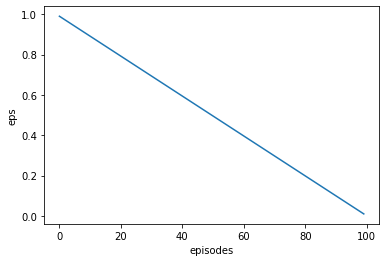

In [14]:
plt.plot(epsilons)
plt.xlabel('episodes')
plt.ylabel('eps')
plt.savefig('epsilons.jpg')

## Vizualization of training DQN agent

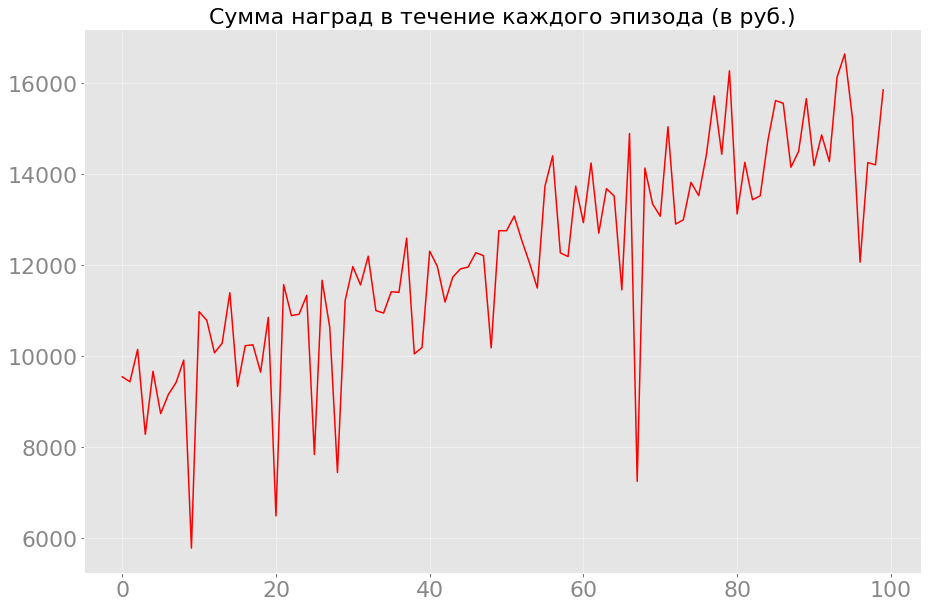

In [15]:
plt.style.use('ggplot')
plt.figure(figsize=(15,10))
plt.plot(rews, 'r')

plt.yticks(fontsize=22, alpha=.7)
plt.xticks(fontsize=22, alpha=.7)
plt.title("Сумма наград в течение каждого эпизода (в руб.)", fontsize=22)
plt.grid(axis='both', alpha=.5)

In [16]:
def calc_spread(prices, spread_coefficients):
    """Calculate the spread based on spread_coefficients.
    Args:
        spread_coefficients (list): A list of signed integers defining how much
            of each product to buy (positive) or sell (negative) when buying or
            selling the spread.
        prices (numpy.array): Array containing the prices (bid, ask) of
            different products, i.e: [p1_b, p1_a, p2_b, p2_a].
    Returns:
        tuple:
            - (float) spread bid price,
            - (float) spread ask price.
    """
    spread_bid = sum([
        spread_coefficients[i] *
        prices[2 * i + int(spread_coefficients[i] < 0)]
        for i in range(len(spread_coefficients))]
    )
    spread_ask = sum([
        spread_coefficients[i] *
        prices[2 * i + int(spread_coefficients[i] > 0)]
        for i in range(len(spread_coefficients))]
    )
    return spread_bid, spread_ask

## For testing algo you need to change data in data_generator on 2015/03/11 instead of 2015/03/11

In [17]:
t = pd.read_csv('LKOH20150311.csv')
data = t[['AskPrice1', 'AskVolume1', 'BidPrice1', 'BidVolume1']]
data.drop_duplicates(inplace=True)
data_RA = np.array(data)
data_generator = DataFeed(data_RA)

<ipython-input-17-6961724f7323>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.drop_duplicates(inplace=True)


<IPython.core.display.Javascript object>


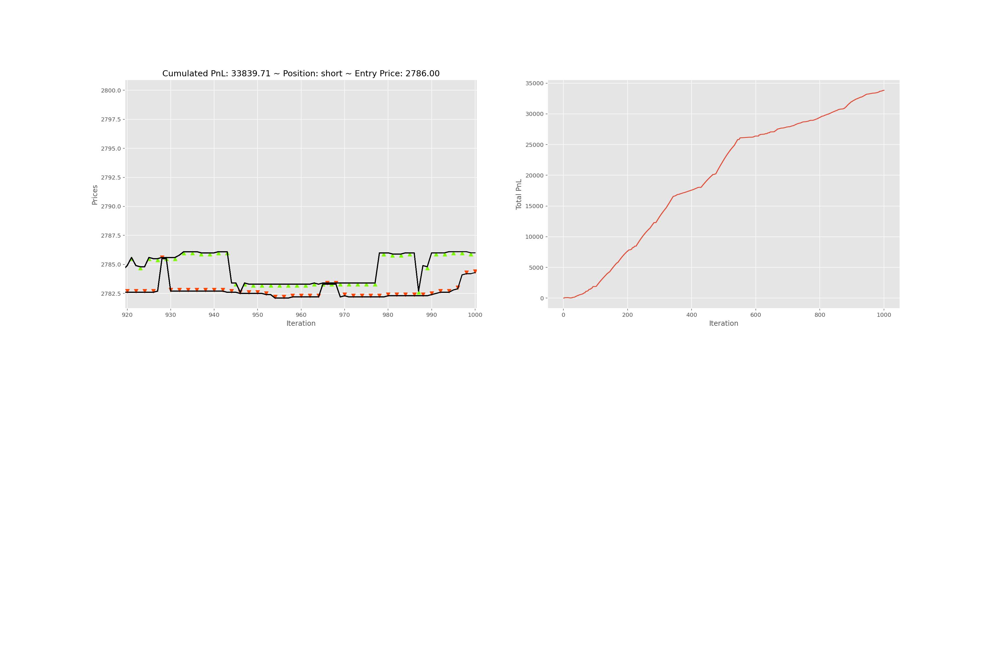

[1294.7428 1334.0264 1362.3408]
[1312.9283 1363.0172 1360.5648]
[1247.8651 1281.5027 1307.945 ]
[1244.1929 1290.6547 1302.7355]
[1226.5497 1256.4835 1280.0616]
[1231.1886 1277.7964 1289.5703]
[1221.4325 1249.3105 1269.6818]
[1229.9186 1277.3986 1284.5127]
[1219.8882 1248.386  1267.2621]
[1239.074  1286.9308 1287.9338]
[1223.8604 1254.2582 1271.2961]
[1167.5424 1220.9126 1236.8619]
[1244.4025 1259.0653 1279.8851]
[1513.1666 1655.7633 1538.522 ]
[1419.0974 1505.993  1528.2793]
[1402.7035 1543.5247 1408.0312]
[1363.1993 1413.4825 1449.327 ]
[1431.3969 1506.259  1444.7544]
[1346.172  1399.7178 1425.8379]
[1353.4092 1405.8057 1387.0085]
[1239.9108 1284.4169 1305.4425]
[1290.9983 1335.2982 1328.2517]
[1255.033  1293.2126 1302.887 ]
[1171.0007 1229.604  1240.6519]
[1184.2008 1201.709  1223.0769]
[1183.5493 1226.9255 1245.1467]
[1274.144  1291.6141 1311.3907]
[1177.1544 1235.643  1246.684 ]
[1186.5044 1204.0411 1225.3696]
[1244.796  1297.0214 1278.0531]
[1262.8804 1291.3115 1316.5554]
[1291.65

[1427.8975 1496.9631 1455.8425]
[1349.5184 1404.6716 1435.8215]
[1416.3542 1481.8767 1440.9944]
[1349.1836 1404.086  1435.3579]
[1416.0072 1481.3978 1440.5527]
[1348.8491 1403.5006 1434.8951]
[1415.6604 1480.9188 1440.1111]
[1348.6385 1403.1123 1434.5979]
[1415.4349 1480.5988 1439.8259]
[1361.493  1423.4443 1451.8048]
[1412.6876 1474.099  1428.5303]
[1350.5802 1407.0552 1435.1484]
[1427.5184 1496.7102 1455.896 ]
[1361.5806 1423.6926 1451.4523]
[1427.7124 1496.9877 1455.56  ]
[1360.9534 1423.3519 1451.2944]
[1421.8751 1490.6403 1452.4957]
[1349.5164 1404.3534 1434.5872]
[1414.5974 1478.573  1444.3518]
[1349.182  1403.7678 1434.1239]
[1414.2502 1478.094  1443.9102]
[1354.6486 1414.4993 1442.8285]
[1409.4401 1468.9415 1436.0104]
[1348.9293 1403.3035 1431.7319]
[1427.1572 1492.5142 1459.05  ]
[1352.1923 1406.1437 1436.3634]
[1414.0568 1478.6425 1440.8584]
[1294.6206 1340.0077 1355.243 ]
[1358.6249 1417.3373 1389.6573]
[1336.3044 1385.4923 1416.038 ]
[1300.4806 1355.3241 1332.6312]
[1310.73

[1284.6602 1322.1348 1347.7953]
[1300.7382 1350.4222 1353.6906]
[1284.2184 1321.5681 1347.2201]
[1299.6907 1349.3402 1352.6504]
[1283.7764 1321.0013 1346.6451]
[1299.0042 1348.622  1351.9685]
[1283.4977 1320.6276 1346.277 ]
[1297.9569 1347.5399 1350.9281]
[1283.0559 1320.0609 1345.702 ]
[1296.9098 1346.4578 1349.8877]
[1282.6138 1319.494  1345.1271]
[1295.863  1345.376  1348.8473]
[1282.1719 1318.9274 1344.5522]
[1294.8158 1344.2936 1347.8066]
[1281.7299 1318.3605 1343.9772]
[1294.129  1343.5751 1347.1249]
[1281.451  1317.9869 1343.6089]
[1314.8832 1364.7368 1367.2927]
[1289.9161 1328.9235 1354.6495]
[1313.5841 1363.7999 1366.1198]
[1289.6377 1328.55   1354.2816]
[1312.5826 1362.6793 1365.4581]
[1289.1957 1327.9832 1353.7065]
[1311.5355 1361.5974 1364.4177]
[1288.7533 1327.4163 1353.1313]
[1238.7936 1300.2269 1282.2593]
[1304.4762 1327.1824 1348.7189]
[1275.6962 1324.3646 1331.6061]
[1214.4985 1243.1191 1265.0376]
[1272.9012 1317.0948 1314.0195]
[1299.6405 1343.6244 1370.1166]
[1334.67

[1273.6178 1330.2726 1293.5542]
[1270.0925 1310.4484 1331.5151]
[ 947.08466 1060.6456   960.6207 ]
[1160.5193 1102.5243 1176.2115]
[1082.3112 1139.2421 1094.349 ]
[1346.8058 1337.2236 1352.052 ]
[1329.4476 1387.322  1347.1095]
[1094.9254 1146.4376 1176.3127]
[1297.5603 1320.4952 1341.2766]
[1270.0122 1308.9333 1336.2887]
[1304.7219 1357.2354 1342.0785]
[1274.816  1314.038  1341.7542]
[1279.7528 1332.1757 1317.0311]
[1252.4705 1284.1727 1296.9855]
[1305.3066 1362.0317 1326.9193]
[1290.8384 1334.918  1361.4097]
[1343.538  1401.205  1362.9897]
[1287.7494 1331.5072 1354.9838]
[1393.7329 1452.1891 1414.2921]
[1312.0822 1360.4043 1385.5607]
[1331.4263 1388.7776 1351.5663]
[1255.9473 1298.9916 1320.3026]
[1269.3177 1321.5049 1307.7952]
[1242.3093 1276.3475 1294.5211]
[1265.1377 1317.6613 1302.0741]
[1283.4005 1323.0817 1350.1276]
[1356.8313 1410.9631 1390.7695]
[1300.6953 1344.2379 1373.1965]
[1353.6515 1407.0961 1382.9143]
[1303.1539 1347.9281 1377.4769]
[1345.2007 1400.911  1371.6085]
[1291

In [18]:
MAX_ITER = np.float('inf')

%matplotlib nbagg
%matplotlib nbagg

fig = plt.figure(figsize=(12, 8))

gs = gridspec.GridSpec(2,2) # 2 rows, 2 columns

ax1 = fig.add_subplot(gs[0,0]) # First row, first column
ax2 = fig.add_subplot(gs[0,1]) # First row, second column
bids = []
asks = []
bid_fills = []
xdata = []
pnl = []

done = False
state = environment.reset()
rewards = 0.0
iteration = 0


while iteration < MAX_ITER and not done:
    try:
        start_time = time.time()

        for position in environment._positions:
            if all(environment._position==environment._positions[position]):
                prev_position_name = position
        
        action = agent.act(np.asarray(state).astype('float32'))
        try:
            state, reward, done, info = environment.step(action)
        except StopIteration:
            done = True
            print('Stopped at time step', iteration)
            continue
        iteration += 1
        
        for position in environment._positions:
            if all(environment._position==environment._positions[position]):
                position_name = position
        
        for _action in environment._actions:
            if all(action==environment._actions[_action]):
                action_name = _action
                
        prices = environment._prices_history[-1]
        #print(prices)
        
        
        if state[0] is None:
            entry_price = 'n/a'
        else:
            entry_price = "%.2f" % state[3]
        
    
        # Cumulative PnL
        if len(pnl) == 0:
            pnl.append(reward)
        else: 
            pnl.append(pnl[-1]+reward)

        bids.append(prices[0])
        asks.append(prices[1])
        xdata.append(iteration)
        
        # Plot most recent 80 prices
        ax1.plot(xdata, 
                 bids, color = 'black')
        ax1.plot(xdata, 
                 asks, color = 'black')
        ax1.set_ylabel('Prices')
        ax1.set_xlabel('Iteration')
        ax1.set_title('Cumulated PnL: ' + "%.2f" % pnl[-1] + ' ~ '
                     + 'Position: ' + position_name + ' ~ '
                     + 'Entry Price: ' + entry_price)
        ax1.set_xlim([max(0, iteration - 80.5), iteration + 0.5])

        # Plotting actions taken according to the Policy
        if position_name != prev_position_name:
            if action_name == 'sell':
                ax1.scatter(iteration, prices[0]+0.1, 
                        color='orangered', marker='v', s=50)
            elif action_name == 'buy':
                ax1.scatter(iteration, prices[1]-0.1, 
                        color='lawngreen', marker='^', s=50)
                

        # Ploting PnL
        ax2.clear()
        ax2.plot(xdata, pnl)
        ax2.set_ylabel('Total PnL')
        ax2.set_xlabel('Iteration')
        
        
    except KeyboardInterrupt:
        print('Animation stopped')
        break